# Project: Train a Quadcopter How to Fly

Design an agent to fly a quadcopter, and then train it using a reinforcement learning algorithm of your choice! 

Try to apply the techniques you have learnt, but also feel free to come up with innovative ideas and test them.

## Instructions

Take a look at the files in the directory to better understand the structure of the project. 

- `task.py`: Define your task (environment) in this file.
- `agents/`: Folder containing reinforcement learning agents.
    - `policy_search_agent.py`: A sample agent has been provided here.
    - `agent.py`: Develop your agent here.
- `physics_sim.py`: This file contains the simulator for the quadcopter.  **DO NOT MODIFY THIS FILE**.

For this project, you will define your own task in `task.py`.  Although we have provided a example task to get you started, you are encouraged to change it.  Later in this notebook, you will learn more about how to amend this file.

You will also design a reinforcement learning agent in `agent.py` to complete your chosen task.  

You are welcome to create any additional files to help you to organize your code.  For instance, you may find it useful to define a `model.py` file defining any needed neural network architectures.

## Controlling the Quadcopter

We provide a sample agent in the code cell below to show you how to use the sim to control the quadcopter.  This agent is even simpler than the sample agent that you'll examine (in `agents/policy_search_agent.py`) later in this notebook!

The agent controls the quadcopter by setting the revolutions per second on each of its four rotors.  The provided agent in the `BasicAgent` class below always selects a random action for each of the four rotors.  These four speeds are returned by the `act` method as a list of four floating-point numbers.  

For this project, the agent that you will implement in `agents/agent.py` will have a far more intelligent method for selecting actions!

In [99]:
import random

class BasicAgent():
    def __init__(self, task):
        self.task = task
    
    def act(self):
        new_thrust = random.gauss(450., 25.)
        return [new_thrust + random.gauss(0., 1.) for x in range(4)]

Run the code cell below to have the agent select actions to control the quadcopter.  

Feel free to change the provided values of `runtime`, `init_pose`, `init_velocities`, and `init_angle_velocities` below to change the starting conditions of the quadcopter.

The `labels` list below annotates statistics that are saved while running the simulation.  All of this information is saved in a text file `data.txt` and stored in the dictionary `results`.  

In [100]:
%load_ext autoreload
%autoreload 2

import csv
import numpy as np
from task import Task

# Modify the values below to give the quadcopter a different starting position.
runtime = 5.                                     # time limit of the episode
init_pose = np.array([0., 0., 10., 0., 0., 0.])  # initial pose
init_velocities = np.array([0., 0., 0.])         # initial velocities
init_angle_velocities = np.array([0., 0., 0.])   # initial angle velocities
file_output = 'data.txt'                         # file name for saved results

# Setup
task = Task(init_pose, init_velocities, init_angle_velocities, runtime)
target_pos = task.target_pos

agent = BasicAgent(task)

done = False
labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4',         
          'reward',
         ]
results = {x : [] for x in labels}

# Run the simulation, and save the results.
with open(file_output, 'w') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(labels)
    while True:
        action = agent.act()
        _, reward, done = task.step(rotor_speeds)
        
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(action) + [reward]        
        for ii in range(len(labels)):
            results[labels[ii]].append(to_write[ii])
        writer.writerow(to_write)
        if done:
            break

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Run the code cell below to visualize how the position of the quadcopter evolved during the simulation.

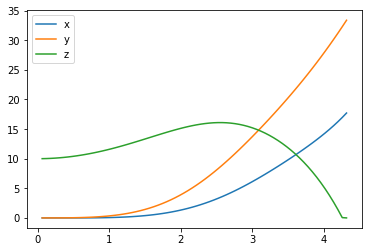

In [101]:
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(results['time'], results['x'], label='x')
plt.plot(results['time'], results['y'], label='y')
plt.plot(results['time'], results['z'], label='z')
plt.legend()
_ = plt.ylim()

The next code cell visualizes the velocity of the quadcopter.

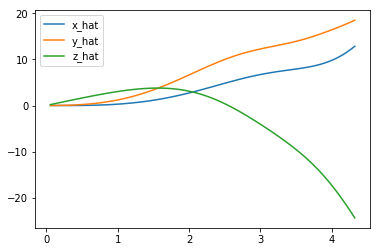

In [102]:
plt.plot(results['time'], results['x_velocity'], label='x_hat')
plt.plot(results['time'], results['y_velocity'], label='y_hat')
plt.plot(results['time'], results['z_velocity'], label='z_hat')
plt.legend()
_ = plt.ylim()

Next, you can plot the Euler angles (the rotation of the quadcopter over the $x$-, $y$-, and $z$-axes),

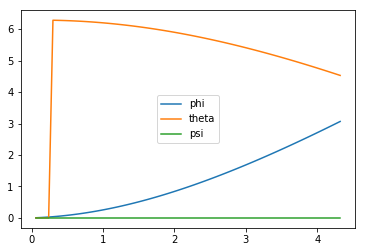

In [103]:
plt.plot(results['time'], results['phi'], label='phi')
plt.plot(results['time'], results['theta'], label='theta')
plt.plot(results['time'], results['psi'], label='psi')
plt.legend()
_ = plt.ylim()

Next plot the velocities (in radians per second) corresponding to each of the Euler angles.

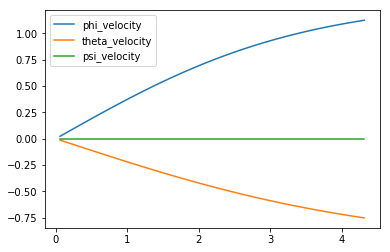

In [104]:
plt.plot(results['time'], results['phi_velocity'], label='phi_velocity')
plt.plot(results['time'], results['theta_velocity'], label='theta_velocity')
plt.plot(results['time'], results['psi_velocity'], label='psi_velocity')
plt.legend()
_ = plt.ylim()

Finally, you can use the code cell below to print the agent's choice of actions.  

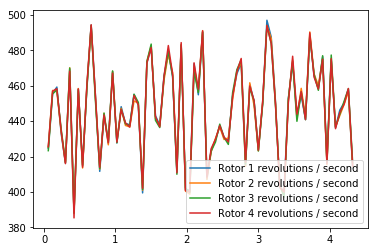

In [105]:
plt.plot(results['time'], results['rotor_speed1'], label='Rotor 1 revolutions / second')
plt.plot(results['time'], results['rotor_speed2'], label='Rotor 2 revolutions / second')
plt.plot(results['time'], results['rotor_speed3'], label='Rotor 3 revolutions / second')
plt.plot(results['time'], results['rotor_speed4'], label='Rotor 4 revolutions / second')
plt.legend()
_ = plt.ylim()

In [106]:
target_pos

array([ 0.,  0., 10.])

In [241]:
def plot_result(result, target_pos):

    import matplotlib.pyplot as plt
    from mpl_toolkits.mplot3d import Axes3D

    fig = plt.figure(figsize=(20, 20))

    ax = fig.add_subplot(4, 2, 1, projection='3d')
    # ax.plot(result['x'], result['y'], result['z'], label='position', marker='o', color='blue')
    ax.plot(result['x'], result['y'], result['z'], label='position')
    ax.text(result['x'][0], result['y'][0], result['z'][0], 'start', color='green')
    ax.text(result['x'][-1], result['y'][-1], result['z'][-1], 'end', color='green')
#     ax.text(target_pos[0], target_pos[1], target_pos[2], 'target', color='red')
    ax.plot([target_pos[0]], [target_pos[1]], [target_pos[2]], label='target', marker='*', color='red')
    # ax.set_zlim(0, 30)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.set_title('position')
    ax.legend()

    ax = fig.add_subplot(4, 2, 2)
    ax.plot(result['time'], result['reward'], label='reward')
    ax.legend()
    ax.set_title('reward')
    _ = ax.set_ylim()

    ax = fig.add_subplot(4, 2, 3)
    ax.plot(result['time'], result['x'], label='x')
    ax.plot(result['time'], result['y'], label='y')
    ax.plot(result['time'], result['z'], label='z')
    ax.plot(result['time'], [target_pos[0]] * len(result['time']), label='target_x', linestyle='--')
    ax.plot(result['time'], [target_pos[1]] * len(result['time']), label='target_y', linestyle='--')
    ax.plot(result['time'], [target_pos[2]] * len(result['time']), label='target_z', linestyle='--')    
    ax.legend()
    ax.set_title('position')
    _ = ax.set_ylim()

    ax = fig.add_subplot(4, 2, 4)
    ax.plot(result['time'], result['x_velocity'], label='x_hat')
    ax.plot(result['time'], result['y_velocity'], label='y_hat')
    ax.plot(result['time'], result['z_velocity'], label='z_hat')
    ax.legend()
    ax.set_title('velocity')
    _ = ax.set_ylim()

    ax = fig.add_subplot(4, 2, 5)
    ax.plot(result['time'], result['phi'], label='phi')
    ax.plot(result['time'], result['theta'], label='theta')
    ax.plot(result['time'], result['psi'], label='psi')
    ax.legend()
    ax.set_title('angle')
    _ = ax.set_ylim()

    ax = fig.add_subplot(4, 2, 6)
    ax.plot(result['time'], result['phi_velocity'], label='phi_velocity')
    ax.plot(result['time'], result['theta_velocity'], label='theta_velocity')
    ax.plot(result['time'], result['psi_velocity'], label='psi_velocity')
    ax.legend()
    ax.set_title('angle_velocity')
    _ = ax.set_ylim()

    ax = fig.add_subplot(4, 2, 7)
    ax.plot(result['time'], result['rotor_speed1'], label='Rotor 1 revolutions / second')
    ax.plot(result['time'], result['rotor_speed2'], label='Rotor 2 revolutions / second')
    ax.plot(result['time'], result['rotor_speed3'], label='Rotor 3 revolutions / second')
    ax.plot(result['time'], result['rotor_speed4'], label='Rotor 4 revolutions / second')
    ax.legend()
    ax.set_title('rotor_speed')
    _ = ax.set_ylim()

    plt.show()

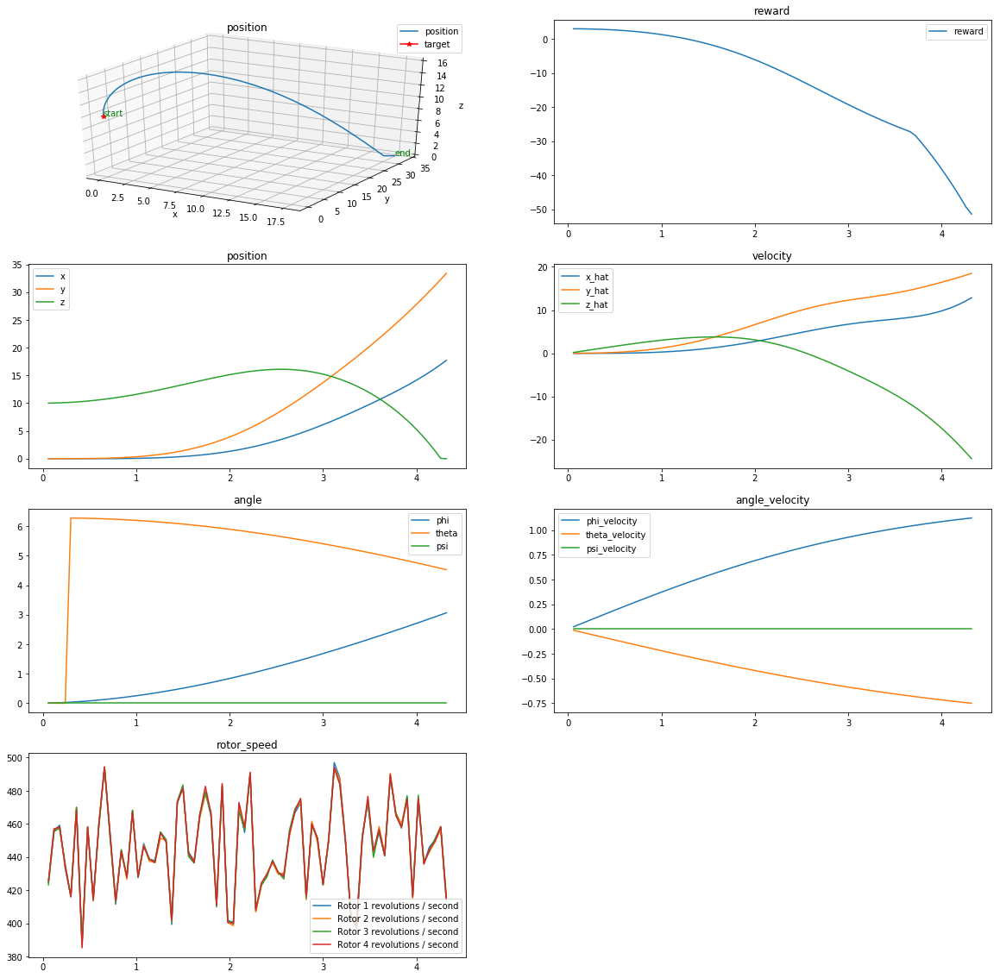

In [108]:
plot_result(results, target_pos)

When specifying a task, you will derive the environment state from the simulator.  Run the code cell below to print the values of the following variables at the end of the simulation:
- `task.sim.pose` (the position of the quadcopter in ($x,y,z$) dimensions and the Euler angles),
- `task.sim.v` (the velocity of the quadcopter in ($x,y,z$) dimensions), and
- `task.sim.angular_v` (radians/second for each of the three Euler angles).

In [109]:
# the pose, velocity, and angular velocity of the quadcopter at the end of the episode
print(task.sim.pose)
print(task.sim.v)
print(task.sim.angular_v)

[17.7106111  33.38008804  0.          3.06486519  4.52823354  0.        ]
[ 12.85757832  18.50183757 -24.39311825]
[ 1.12383503 -0.75173796  0.        ]


In the sample task in `task.py`, we use the 6-dimensional pose of the quadcopter to construct the state of the environment at each timestep.  However, when amending the task for your purposes, you are welcome to **expand the size of the state vector by including the velocity information**.  You can use any combination of the pose, velocity, and angular velocity - feel free to tinker here, and construct the state to suit your task.

## The Task

A sample task has been provided for you in `task.py`.  Open this file in a new window now. 

The `__init__()` method is used to initialize several variables that are needed to specify the task.  
- The simulator is initialized as an instance of the `PhysicsSim` class (from `physics_sim.py`).  
- Inspired by the methodology in the original DDPG paper, we make use of action repeats.  For each timestep of the agent, we step the simulation `action_repeats` timesteps.  If you are not familiar with action repeats, please read the **Results** section in [the DDPG paper](https://arxiv.org/abs/1509.02971).
- We set the number of elements in the state vector.  For the sample task, we only work with the 6-dimensional pose information.  To set the size of the state (`state_size`), we must take action repeats into account.  
- The environment will always have a 4-dimensional action space, with one entry for each rotor (`action_size=4`). You can set the minimum (`action_low`) and maximum (`action_high`) values of each entry here.
- The sample task in this provided file is for the agent to reach a target position.  We specify that target position as a variable.

The `reset()` method resets the simulator.  The agent should call this method every time the episode ends.  You can see an example of this in the code cell below.

The `step()` method is perhaps the most important.  It accepts the agent's choice of action `rotor_speeds`, which is used to prepare the next state to pass on to the agent.  Then, the reward is computed from `get_reward()`.  **The episode is considered done if the time limit has been exceeded, or the quadcopter has travelled outside of the bounds of the simulation.**

In the next section, you will learn how to test the performance of an agent on this task.

## The Agent

The sample agent given in `agents/policy_search_agent.py` uses a very simplistic linear policy to directly compute the action vector as a dot product of the state vector and a matrix of weights. Then, it randomly perturbs the parameters by adding some Gaussian noise, to produce a different policy. Based on the average reward obtained in each episode (`score`), it keeps track of the best set of parameters found so far, how the score is changing, and accordingly tweaks a scaling factor to widen or tighten the noise.

Run the code cell below to see how the agent performs on the sample task.

This agent should perform very poorly on this task.  And that's where you come in!

In [160]:
[1,2,3] * 3

[1, 2, 3, 1, 2, 3, 1, 2, 3]

In [158]:
%load_ext autoreload
%autoreload

import sys
import pandas as pd

from agents.policy_search_agent import PolicySearchAgent
from task import Task

num_episodes = 1000

target_pos = np.array([0., 0., 10.])
# target_pos = np.array([10., 10., 20.])
# target_pos = np.array([10., 10., 0.])

task = Task(target_pos=target_pos)

agent = PolicySearchAgent(task) 


labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4',         
          'reward']
results = dict()

for i_episode in range(1, num_episodes+1):
    episode_result = {x : [] for x in labels}    
    
    state = agent.reset_episode() # start a new episode
    while True:
        action = agent.act(state) 
        next_state, reward, done = task.step(action)
        agent.step(reward, done)
        state = next_state
        
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(action) + [reward]        
        for ii in range(len(labels)):
            episode_result[labels[ii]].append(to_write[ii])
            
        if done:
            results[i_episode] = episode_result
            
            print("\rEpisode = {:4d}, score = {:7.3f} (best = {:7.3f}), noise_scale = {}".format(
                i_episode, agent.score, agent.best_score, agent.noise_scale), end="")  # [debug]            
            break
    sys.stdout.flush()
    

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
next_state 18 [0.00000000e+00 0.00000000e+00 1.00001823e+01 4.89394050e+00
 3.28370777e+00 0.00000000e+00 3.03698076e-04 2.08769495e-03
 9.99820161e+00 3.42478851e+00 5.04537782e+00 0.00000000e+00
 2.93735604e-03 6.06752954e-03 9.99124062e+00 1.74467672e+00
 2.32228702e+00 0.00000000e+00]
next_state 18 [6.65382605e-03 8.98369880e-03 9.97983593e+00 2.86047072e-01
 2.20540039e+00 0.00000000e+00 8.38737278e-03 1.08149717e-02
 9.96392482e+00 4.96663738e+00 4.32974203e+00 0.00000000e+00
 1.02803044e-02 1.28952321e-02 9.94322928e+00 3.26099412e+00
 2.18130074e+00 0.00000000e+00]
next_state 18 [0.01114656 0.0156275  9.92003482 3.54411028 5.72766357 0.
 0.01121895 0.01764276 9.89234053 3.82651112 5.34267057 0.
 0.01491675 0.01774316 9.85735039 4.10830399 0.34421813 0.        ]
next_state 18 [2.02976552e-02 1.56705063e-02 9.81637531e+00 1.77522446e-02
 2.69580933e+00 0.00000000e+00 2.45342241e-02 1.24125354e

next_state 18 [ 0.75561276 -0.37411629  2.80377592  5.02582352  4.74097013  0.
  0.77503467 -0.38724744  2.56039681  5.57188117  3.7499944   0.
  0.79494761 -0.40095907  2.31241805  6.05668973  1.90730307  0.        ]
next_state 18 [ 0.81478657 -0.41490861  2.05973011  5.46273302  3.68396778  0.
  0.83450496 -0.42917825  1.80224259  3.04296618  5.2119115   0.
  0.85384863 -0.44380768  1.54021566  5.46896289  0.25122612  0.        ]
next_state 18 [ 0.87293155 -0.45846946  1.27330422  2.15870334  3.04370978  0.
  0.89209488 -0.47282213  1.00238527  3.25229095  5.46141476  0.
  0.91057455 -0.48675915  0.72811391  2.88030714  1.28490957  0.        ]
next_state 18 [ 0.92806694 -0.50078155  0.45071519  5.77245516  3.06411342  0.
  0.94536832 -0.51569131  0.17097741  2.12994984  4.63288413  0.
  0.96295815 -0.53085928  0.          4.55513301  6.02375105  0.        ]
Episode =    2, score =  -0.650 (best =  -0.650), noise_scale = 0.025next_state 18 [0.00000000e+00 0.00000000e+00 1.00001786e+01

next_state 18 [-0.08657986  0.44299727  5.43209735  1.34372308  1.04742707  0.
 -0.08680124  0.45998592  5.23687684  1.60652936  0.87470578  0.
 -0.08901709  0.47826112  5.0386789   1.85794015  5.25817435  0.        ]
next_state 18 [-0.09136502  0.497962    4.83718089  2.87847723  0.25730209  0.
 -0.09295383  0.51832403  4.63192306  3.7770993   5.74459437  0.
 -0.09435468  0.53857379  4.42212662  4.56636344  3.51307144  0.        ]
next_state 18 [-0.09529327  0.55933992  4.20742763  3.79499823  0.79653756  0.
 -0.09633888  0.58088419  3.98813272  2.18069425  3.48533545  0.
 -0.09763721  0.6026046   3.76501652  6.17493636  5.56959916  0.        ]
next_state 18 [-0.09904666  0.62436372  3.53847635  2.81459452  2.87038218  0.
 -0.10049627  0.64626451  3.30779047  5.3544067   5.62767399  0.
 -0.10167798  0.66786915  3.07273019  1.29298256  1.48601248  0.        ]
next_state 18 [-0.10294187  0.68884567  2.83425268  2.30567544  3.44174979  0.
 -0.1045221   0.71021319  2.59233863  3.20998011 

next_state 18 [ 0.1515122  -0.07960438  9.01267373  4.84358752  4.87314783  0.
  0.16061347 -0.08316714  8.93128763  2.04765824  3.43751721  0.
  0.17186627 -0.08838894  8.84672978  5.0496977   0.4949523   0.        ]
next_state 18 [ 0.18315509 -0.09581073  8.75923928  5.66496583  1.16048632  0.
  0.19311715 -0.10427832  8.66828306  6.21098775  1.87563388  0.
  0.20131635 -0.11294907  8.57328125  0.41422647  4.80406937  0.        ]
next_state 18 [ 0.21003811 -0.12151391  8.4741927   3.97041824  0.40571499  0.
  0.21963298 -0.13085478  8.37053477  0.74320628  1.82757401  0.
  0.22733334 -0.14138515  8.26180292  3.34544694  2.93670863  0.        ]
next_state 18 [ 0.23353256 -0.15210129  8.14955481  4.88645372  3.7143892   0.
  0.2401403  -0.16185032  8.0337905   6.19649095  4.36202272  0.
  0.24825924 -0.17076424  7.91359876  1.03774574  4.92094564  0.        ]
next_state 18 [ 0.2586179  -0.17943949  7.78953695  0.39921883  0.07101099  0.
  0.27018995 -0.18753078  7.66271774  5.16633539 

next_state 18 [-0.44995788 -0.40202966  3.46193428  6.24176709  5.92748184  0.
 -0.46254817 -0.4163468   3.2408669   0.10918476  4.93811064  0.
 -0.47417282 -0.43059488  3.0167639   0.25930723  2.88378054  0.        ]
next_state 18 [-0.48459465 -0.44457442  2.7902784   0.42012256  0.63459746  0.
 -0.49472094 -0.4586044   2.56030631  0.57879924  1.0613513   0.
 -0.50506191 -0.47314692  2.32590794  0.73471982  5.11637224  0.        ]
next_state 18 [-0.51550178 -0.48786952  2.08790847  0.99646885  0.0401393   0.
 -0.52577242 -0.50273013  1.84680497  1.24414292  1.0584123   0.
 -0.53648265 -0.51786259  1.60271591  1.48128536  1.92125572  0.        ]
next_state 18 [-0.54775013 -0.53314918  1.35594944  2.74832505  4.69447838  0.
 -0.55898859 -0.54821274  1.10545368  3.87359291  0.71818049  0.
 -0.56990622 -0.56242804  0.85071782  4.87650328  2.64754461  0.        ]
next_state 18 [-0.58080484 -0.57597303  0.5914345   5.33724785  6.27748633  0.
 -0.59185803 -0.58955413  0.32692395  5.75985501 

next_state 18 [-0.21335829  0.15029409  2.81064092  1.81609793  6.06718479  0.
 -0.2140929   0.14563191  2.56786605  2.33791588  3.1135019   0.
 -0.21471379  0.14193157  2.32184556  2.81291161  5.74392151  0.        ]
next_state 18 [-0.21555006  0.13860209  2.0721685   3.12044281  2.46702979  0.
 -0.21631501  0.13533027  1.8187241   2.51479237  2.14111514  0.
 -0.21705296  0.1319365   1.56205585  1.11935478  5.60828052  0.        ]
next_state 18 [-0.21800123  0.12830211  1.30268407  1.30676518  5.81127935  0.
 -0.21879062  0.12458934  1.04074015  1.49341138  4.83208992  0.
 -0.21911885  0.12090695  0.77639142  1.67932835  2.92890871  0.        ]
next_state 18 [-0.21915404  0.11701465  0.50970688  2.72125434  5.78152589  0.
 -0.21977017  0.11279864  0.24054319  3.6234231   0.8696961   0.
 -0.22092753  0.1088278   0.          4.41197625  1.07346436  0.        ]
Episode =    9, score =  -0.266 (best =  -0.251), noise_scale = 0.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00002020e+01 5

next_state 18 [-0.66137593 -0.24194257  5.53285838  0.4035702   0.66057976  0.
 -0.67973771 -0.25227622  5.35231323  1.8986396   0.9992946   0.
 -0.69934452 -0.26193943  5.16836939  3.2046296   1.32879992  0.        ]
next_state 18 [-0.72061107 -0.27102806  4.98081318  5.10790315  1.77817023  0.
 -0.74365092 -0.28003865  4.78905304  0.5000896   2.19251736  0.
 -0.76793211 -0.28928504  4.59256443  1.97889982  2.58321369  0.        ]
next_state 18 [-0.79263269 -0.29883118  4.3921874   2.23847949  5.0313647   0.
 -0.81723452 -0.30801027  4.18841246  2.48172218  2.13190919  0.
 -0.84165831 -0.31683549  3.98115123  2.71160411  1.74290345  0.        ]
next_state 18 [-0.86654744 -0.32577894  3.7707862   3.13397288  2.28552625  0.
 -0.89185636 -0.33483466  3.55738835  3.52284752  1.38747884  0.
 -0.9176398  -0.34371422  3.34076146  3.88734115  5.663176    0.        ]
next_state 18 [-0.94383726 -0.3525547   3.12001583  5.03502164  5.99672431  0.
 -0.96971455 -0.36231853  2.89457841  6.059791   

next_state 18 [4.27231079e-03 1.11249039e-01 9.25805816e+00 5.05731092e+00
 1.73132686e+00 0.00000000e+00 2.17493478e-02 1.18567696e-01
 9.18808445e+00 4.69732376e+00 4.27956707e+00 0.00000000e+00
 3.91193868e-02 1.26648509e-01 9.11401998e+00 3.52344340e+00
 6.17694266e+00 0.00000000e+00]
next_state 18 [0.0578818  0.13469155 9.0344441  4.37947608 4.21128421 0.
 0.07837877 0.14295631 8.94961347 4.12840795 1.09164556 0.
 0.09884945 0.15141577 8.8605696  2.90778068 3.42999125 0.        ]
next_state 18 [0.11818402 0.1589151  8.76850823 0.86224149 0.56576289 0.
 0.13711291 0.1670622  8.67484805 4.37996821 3.05982259 0.
 0.15505335 0.17778381 8.57863551 1.00666751 4.91561752 0.        ]
next_state 18 [0.17499098 0.19044266 8.47927022 1.30740108 4.40081689 0.
 0.1991199  0.2027734  8.37624141 1.59324476 0.45568732 0.
 0.22434165 0.21639004 8.26930624 1.86790174 0.28930581 0.        ]
next_state 18 [0.24816028 0.23334062 8.15822154 1.4175391  6.18488096 0.
 0.27168636 0.25312868 8.04328332 6.1

Episode =   14, score =  -0.344 (best =  -0.251), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99999743e+00  3.10399517e+00
  2.94329948e+00  0.00000000e+00 -3.85984959e-04 -7.22061250e-05
  9.99994989e+00  6.19119906e+00  4.68006859e+00  0.00000000e+00
  8.00278513e-04 -2.10802938e-04  9.99783490e+00  2.95910213e+00
  2.84344636e+00  0.00000000e+00]
next_state 18 [ 3.39254614e-03 -6.69716829e-04  9.99350015e+00  1.16759621e+00
  3.58894198e+00  0.00000000e+00  6.24598266e-03 -3.01418853e-03
  9.98634367e+00  5.48119701e+00  1.87104688e+00  0.00000000e+00
  8.11670688e-03 -6.51893774e-03  9.97421055e+00  3.45236309e+00
  2.72979034e+00  0.00000000e+00]
next_state 18 [ 7.15334492e-03 -8.89752329e-03  9.96002935e+00  4.55568091e+00
  5.85384901e+00  0.00000000e+00  6.23353061e-03 -1.28824804e-02
  9.94381692e+00  5.02673742e+00  2.91330877e+00  0.00000000e+00
  5.80719825e-03 -1.67951667e-02  9.92252305e+00  4.58088063e+00
  1.42854804e+00  0.00000000e+00]
next_stat

  0.17649694 -0.34274996  8.43498069  0.74052543  2.33539037  0.        ]
next_state 18 [ 0.18582648 -0.35687067  8.33742822  0.97007631  0.88143736  0.
  0.19355586 -0.37103058  8.23582249  1.19672339  0.78858548  0.
  0.19964798 -0.38399454  8.13108837  1.41971437  3.59757517  0.        ]
next_state 18 [ 0.20572083 -0.39784455  8.02268072  4.09512605  3.50706211  0.
  0.21316361 -0.41196797  7.91105925  0.06211008  1.84208372  0.
  0.21955685 -0.4248355   7.79573839  1.94788061  5.30689536  0.        ]
next_state 18 [ 0.22527651 -0.43706586  7.67578186  5.85514009  1.43647016  0.
  0.23078357 -0.44867488  7.55180851  2.86235508  1.52259291  0.
  0.23390107 -0.46034196  7.42402879  5.62895098  6.25079303  0.        ]
next_state 18 [ 0.23584867 -0.4726598   7.29312557  6.04621669  1.18159593  0.
  0.23674039 -0.48571141  7.15926814  0.14092258  2.16686413  0.
  0.23577322 -0.49894867  7.02106822  0.48542159  2.98539903  0.        ]
next_state 18 [ 0.23404744 -0.51228342  6.87832651  2.

Episode =   17, score =  -0.648 (best =  -0.251), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003744e+01  7.80998702e-01
  1.12990704e+00  0.00000000e+00 -2.11290573e-03  7.01880771e-04
  9.99986936e+00  1.46057097e+00  1.19509918e-01  0.00000000e+00
 -6.61743072e-03  4.41103465e-03  9.99640358e+00  1.86795556e+00
  5.40855243e+00  0.00000000e+00]
next_state 18 [-8.90005186e-03  1.24249604e-02  9.98865683e+00  1.91428728e+00
  6.65378675e-01  0.00000000e+00 -1.06934505e-02  2.48506301e-02
  9.97551160e+00  1.56645229e+00  4.13730176e-01  0.00000000e+00
 -1.58064619e-02  4.26679527e-02  9.95759586e+00  9.90917292e-01
  3.40772572e-01  0.00000000e+00]
next_state 18 [-0.02288383  0.06500715  9.9367929   2.75488699  0.17712715  0.
 -0.03095964  0.08961202  9.91131693  4.50571313  4.9909438   0.
 -0.03749419  0.11441256  9.88002331  6.23857173  3.68645755  0.        ]
next_state 18 [-0.04086249  0.13877376  9.84257774  1.40090225  1.08397941  0.
 -0.04514207  0.1643

next_state 18 [ 0.16831367 -0.18746906  8.00239675  2.45363861  1.95403644  0.
  0.18427385 -0.18709094  7.87979725  5.10785038  2.40470272  0.
  0.19859346 -0.18625597  7.7532164   1.06722448  2.82986235  0.        ]
next_state 18 [ 0.21176408 -0.18602127  7.62171442  1.3074474   3.20228704  0.
  0.22458845 -0.18857878  7.485532    1.53935719  3.57019793  0.
  0.23814246 -0.19403249  7.3453873   1.76421603  3.93495597  0.        ]
next_state 18 [ 0.25346291 -0.20192346  7.20191986  2.83177293  2.2817459   0.
  0.26896737 -0.21110947  7.05586278  3.75548349  5.67611795  0.
  0.28422082 -0.22111379  6.90587282  4.57455388  1.89300658  0.        ]
next_state 18 [ 0.299265   -0.23133904  6.75083746  0.58119609  2.58832128  0.
  0.31311552 -0.24162171  6.59118849  2.51696216  3.17721276  0.
  0.32670046 -0.25254938  6.42768269  4.17320742  3.70103277  0.        ]
next_state 18 [ 0.34109679 -0.26260809  6.26122699  4.39948228  4.12043482  0.
  0.35757339 -0.27068209  6.09126208  4.62010467 

Episode =   20, score =  -1.068 (best =  -0.251), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99996016e+00  3.02502665e+00
  2.75630006e-01  0.00000000e+00 -5.23096826e-04  2.15102903e-04
  9.99608150e+00  5.98727797e+00  5.22872482e+00  0.00000000e+00
  1.01456993e-04  3.68549335e-04  9.98734959e+00  2.50382986e+00
  5.44981164e+00  0.00000000e+00]
next_state 18 [4.15840719e-03 1.19849573e-03 9.97431571e+00 1.47271707e+00
 5.79618620e+00 0.00000000e+00 1.10909544e-02 5.07552443e-03
 9.95628123e+00 3.01706728e-01 3.81555132e+00 0.00000000e+00
 2.06184209e-02 1.04940661e-02 9.93276216e+00 5.31964696e+00
 1.55354911e-01 0.00000000e+00]
next_state 18 [0.03135393 0.01393042 9.90453771 5.70864399 1.24380467 0.
 0.04014611 0.01562993 9.87384753 6.09738728 3.88928566 0.
 0.04846072 0.01725903 9.8384435  0.20420524 2.77290658 0.        ]
next_state 18 [0.05753036 0.01889072 9.79673096 2.7363774  3.48514929 0.
 0.06657868 0.01983875 9.75102571 5.26785337 4.09188679 0.
 0.

next_state 18 [0.42000785 0.45329122 3.88121646 6.23274    5.78402416 0.
 0.43023579 0.46687739 3.65641761 0.160493   6.00598976 0.
 0.44017223 0.48039791 3.42747762 0.36358025 6.22745405 0.        ]
next_state 18 [0.4499543  0.49360462 3.19401611 0.74770593 2.50338503 0.
 0.45965279 0.50613155 2.95627395 1.10678928 3.50050943 0.
 0.4694559  0.51762342 2.71492637 1.44012525 3.27252952 0.        ]
next_state 18 [0.47945207 0.52817106 2.47058286 1.98291697 5.87730952 0.
 0.48947556 0.53861295 2.22343545 2.46972113 1.81163077 0.
 0.49940893 0.54919654 1.97336613 2.91118532 3.71800696 0.        ]
next_state 18 [0.50919883 0.55982955 1.71938098 3.82370227 3.73420905 0.
 0.51902605 0.57077945 1.46067451 4.63800218 2.87635043 0.
 0.52881263 0.58247122 1.19701551 5.36856713 1.30844581 0.        ]
next_state 18 [0.53816917 0.59463132 0.92819248 2.36085087 3.17989443 0.
 0.5472106  0.60744611 0.65470425 4.32164709 4.83710662 0.
 0.55649698 0.62118721 0.37631112 5.24335661 0.03038782 0.        ]


next_state 18 [-0.65721308 -0.31968042  3.60456723  1.63598975  3.11303405  0.
 -0.67550439 -0.32464422  3.3796238   1.94710072  0.94904374  0.
 -0.69433676 -0.32977817  3.15171224  2.24199759  4.1217065   0.        ]
next_state 18 [-0.71333549 -0.33424941  2.92057657  2.94589981  2.82822585  0.
 -0.73173218 -0.33844029  2.68541197  3.59039953  0.43992282  0.
 -0.74975421 -0.34222636  2.44620556  4.19120603  3.48761045  0.        ]
next_state 18 [-0.76762143 -0.34544597  2.20301714  4.33161999  0.02033973  0.
 -0.78547161 -0.34835259  1.95489757  4.46922162  2.26705532  0.
 -0.80360665 -0.35079012  1.70166826  4.60497284  4.09489285  0.        ]
next_state 18 [-8.21684123e-01 -3.52478982e-01  1.44324289e+00  2.37637639e+00
  1.14635590e-03  0.00000000e+00 -8.39428998e-01 -3.53879464e-01
  1.18075867e+00  6.01971673e+00  1.78318013e+00  0.00000000e+00
 -8.57339836e-01 -3.55168274e-01  9.14197395e-01  3.03438296e+00
  3.25676407e+00  0.00000000e+00]
next_state 18 [-0.87557613 -0.35615932

next_state 18 [-0.1832003  -0.18747479  7.47191655  5.07022033  5.81688     0.
 -0.1847461  -0.19909335  7.33888225  1.21905529  0.18839839  0.
 -0.1859605  -0.21077723  7.202702    3.49830036  0.75395323  0.        ]
next_state 18 [-0.18764593 -0.22145561  7.06302857  3.98198295  0.79440467  0.
 -0.18988092 -0.2322521   6.91907775  4.43800846  0.32981566  0.
 -0.19256303 -0.24347933  6.77065945  4.86777953  1.46335958  0.        ]
next_state 18 [-0.19630738 -0.25518527  6.61776124  5.03565713  5.40970477  0.
 -0.20028167 -0.26766384  6.46064482  5.19647946  2.1853529   0.
 -0.20427687 -0.28042061  6.29908432  5.3505271   4.56909593  0.        ]
next_state 18 [-0.20794012 -0.29289781  6.13292394  0.64931478  0.65322923  0.
 -0.21108155 -0.3052072   5.96310929  2.11239036  2.50077142  0.
 -0.21528778 -0.31780099  5.79048013  3.46617089  3.95391685  0.        ]
next_state 18 [-0.21933431 -0.33076366  5.61497185  3.58095379  3.46763163  0.
 -0.22246885 -0.34330052  5.43640988  3.69436422 

 -0.21377709 -0.10521663  0.          2.34728144  4.74224368  0.        ]
Episode =   27, score =  -0.260 (best =  -0.251), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003129e+01  4.07515525e+00
  2.82736017e+00  0.00000000e+00 -7.03100103e-04  1.73880779e-03
  1.00002638e+01  1.79488924e+00  2.30420164e+00  0.00000000e+00
 -3.79899443e-03  3.73177252e-03  9.99791633e+00  5.60858273e+00
  4.61178577e+00  0.00000000e+00]
next_state 18 [-6.02424160e-03  4.40136689e-03  9.99178146e+00  3.52521206e+00
  5.46859244e+00  0.00000000e+00 -3.81761278e-03  4.57152009e-03
  9.97988340e+00  1.32138120e+00  1.33810847e+00  0.00000000e+00
 -2.24302088e-03  4.65515570e-03  9.96257271e+00  5.31359578e+00
  1.66691419e+00  0.00000000e+00]
next_state 18 [-5.43764784e-03  5.49279843e-03  9.94136030e+00  1.50790570e+00
  4.76803279e-01  0.00000000e+00 -1.19428286e-02  8.52807321e-03
  9.91623053e+00  3.96751066e+00  2.43688038e+00  0.00000000e+00
 -2.09648871e-02  1.48608013e-02  

next_state 18 [ 0.14025943 -0.26163671  9.09985494  2.13330763  1.82901643  0.
  0.15992392 -0.27773922  9.03067195  3.49291114  1.17292119  0.
  0.17407137 -0.29481437  8.9569931   3.45156128  4.76240774  0.        ]
next_state 18 [ 0.18861573 -0.31232633  8.87816766  3.72229145  4.74327595  0.
  0.20937833 -0.32998683  8.79506379  3.98769727  2.36665948  0.
  0.23114974 -0.34609011  8.70930421  4.24773928  4.8543591   0.        ]
next_state 18 [ 0.25347883 -0.36089352  8.6207978   3.04557115  0.86577625  0.
  0.27638102 -0.37586862  8.52647331  0.84674052  6.05126226  0.
  0.29777781 -0.3888176   8.42826832  4.09913665  3.03800362  0.        ]
next_state 18 [ 0.31959114 -0.39857063  8.32870927  4.32647495  2.61779404  0.
  0.34041718 -0.40563021  8.22654374  3.17241678  3.79440315  0.
  0.3614402  -0.41129492  8.12212678  0.97814663  2.22958882  0.        ]
next_state 18 [ 0.3825159  -0.41763634  8.01462049  2.11881727  5.57031368  0.
  0.40340877 -0.42385556  7.90241971  3.07316173 

next_state 18 [ 1.238163   -0.38908208  0.45371403  2.73413572  5.03106824  0.
  1.26413772 -0.39319255  0.17497182  3.03414686  4.19870897  0.
  1.29079018 -0.39683674  0.          3.31409979  2.75773967  0.        ]
Episode =   30, score =  -0.623 (best =  -0.251), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00005336e+01  3.96360106e+00
  6.74008074e-01  0.00000000e+00 -1.55750376e-03 -1.42825481e-03
  9.99831152e+00  1.02614201e+00  5.67946128e+00  0.00000000e+00
 -3.25637619e-03 -2.52844424e-03  9.99190216e+00  2.60997578e+00
  4.95443388e+00  0.00000000e+00]
next_state 18 [-1.90224501e-03 -1.66711017e-03  9.98228416e+00  2.74664039e+00
  3.96409468e+00  0.00000000e+00  2.32464904e-03 -1.04128509e-03
  9.96945105e+00  2.86959533e+00  5.78736983e+00  0.00000000e+00
  8.58718993e-03 -4.58786866e-04  9.95232729e+00  2.98020300e+00
  3.30747453e+00  0.00000000e+00]
next_state 18 [1.59855069e-02 1.99811899e-04 9.93182907e+00 3.05969824e+00
 2.66888570e+00 0.000000

Episode =   32, score =  -0.768 (best =  -0.251), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001251e+01  5.37366605e+00
  2.95564326e+00  0.00000000e+00 -3.85836237e-04  1.61865265e-03
  9.99715363e+00  4.23233480e+00  3.71866652e+00  0.00000000e+00
 -1.89731307e-05  6.40744169e-03  9.98980585e+00  2.44428720e+00
  4.34682579e+00  0.00000000e+00]
next_state 18 [3.00047916e-03 1.23764112e-02 9.97978452e+00 2.50647243e+00
 5.39760168e+00 0.00000000e+00 8.78613130e-03 1.85816962e-02
 9.96545808e+00 2.56388792e+00 5.30881161e+00 0.00000000e+00
 1.71589512e-02 2.58905781e-02 9.94562273e+00 2.61694858e+00
 2.71236481e+00 0.00000000e+00]
next_state 18 [0.02611836 0.03287652 9.92251828 2.73261667 5.23286899 0.
 0.03589405 0.03940183 9.89607903 2.83830234 4.10317079 0.
 0.04872717 0.04597835 9.86587092 2.93425227 0.70155406 0.        ]
next_state 18 [0.0620178  0.05249645 9.8315382  3.75687496 5.82124627 0.
 0.0749753  0.05845606 9.79094311 4.52809551 1.71813438 0.
 0.

Episode =   34, score =  -0.711 (best =  -0.251), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00000929e+01 4.38135833e-01
 5.82194441e+00 0.00000000e+00 9.14485660e-04 7.80636231e-04
 9.99998280e+00 8.34864589e-01 2.90139563e+00 0.00000000e+00
 2.25470908e-03 8.62736125e-04 9.99627538e+00 1.12885192e+00
 5.36149846e+00 0.00000000e+00]
next_state 18 [5.45363461e-03 1.07580667e-03 9.98806662e+00 1.31101486e+00
 5.01084717e+00 0.00000000e+00 1.38160172e-02 3.73608314e-03
 9.97691967e+00 1.35426114e+00 4.15446974e+00 0.00000000e+00
 2.74928906e-02 5.71075446e-03 9.96173936e+00 1.31930181e+00
 1.73896700e+00 0.00000000e+00]
next_state 18 [4.18447907e-02 5.86163094e-03 9.94222813e+00 1.42711654e+00
 7.90549999e-01 0.00000000e+00 5.30564116e-02 6.99987724e-03
 9.91891050e+00 1.53626287e+00 5.96006483e+00 0.00000000e+00
 6.35393380e-02 1.11844862e-02 9.89192829e+00 1.64681372e+00
 5.68095411e+00 0.00000000e+00]
next_state 18 [0.07585262 0.01892993 9.8609617  2.66298816 2.68

next_state 18 [-0.23113321  0.22855949  6.39578462  4.47404711  5.81038401  0.
 -0.22893414  0.24771484  6.22279457  4.69942948  0.24177205  0.
 -0.22660442  0.26582711  6.04507937  4.91562499  0.05360176  0.        ]
next_state 18 [-0.22446282  0.28252909  5.86291074  5.06643543  4.46218027  0.
 -0.22154502  0.29843605  5.67629854  5.21726308  1.51765446  0.
 -0.21865142  0.31430116  5.48513391  5.36809946  4.088679    0.        ]
next_state 18 [-0.21582595  0.33027939  5.28933111  0.24554465  4.41016564  0.
 -0.21123636  0.34640849  5.08925044  1.27717144  4.72422586  0.
 -0.20464535  0.36241328  4.88575468  2.19223911  5.03287385  0.        ]
next_state 18 [-0.19596704  0.37892116  4.67868094  4.76209501  3.36079812  0.
 -0.18594483  0.39720208  4.46705107  0.71128924  0.64680545  0.
 -0.17623579  0.41687307  4.25161396  2.63336215  3.45402626  0.        ]
next_state 18 [-0.16720559  0.43707188  4.03253626  2.83314899  1.72994655  0.
 -0.1585044   0.45743814  3.80969121  3.02854787 

next_state 18 [ 0.0383229  -0.01501815  9.85422415  0.09321263  1.22617787  0.
  0.03942543 -0.01656884  9.81751215  5.18037631  1.53736378  0.
  0.03852479 -0.01812271  9.77721286  3.65160569  1.83131724  0.        ]
next_state 18 [ 0.03447343 -0.01942389  9.73349636  3.84056549  5.84820838  0.
  0.02921655 -0.02170293  9.68484164  4.01959549  4.81006787  0.
  0.0270593  -0.02541295  9.63058519  4.19121282  0.45040135  0.        ]
next_state 18 [ 0.02668139 -0.03000233  9.57180779  6.02060495  2.68020564  0.
  0.02550921 -0.03510357  9.50789941  1.43537935  4.39395778  0.
  0.02485241 -0.04030245  9.43930603  3.00164385  5.73901657  0.        ]
next_state 18 [ 0.02557606 -0.04568389  9.36598773  4.91210383  1.74740235  0.
  0.02576188 -0.05078277  9.28783741  6.06149193  3.53090317  0.
  0.02528643 -0.05553716  9.20484614  0.18479732  4.93177487  0.        ]
next_state 18 [ 0.02651178 -0.06004468  9.11748685  3.70237717  5.3635349   0.
  0.03013001 -0.06491713  9.02584712  6.06469694 

next_state 18 [ 0.40676674 -0.41362692  0.84857209  6.10035565  3.69208892  0.
  0.41354375 -0.42191209  0.57330256  2.6200869   4.44089946  0.
  0.42010037 -0.4299577   0.29483433  5.10549451  5.11665661  0.        ]
next_state 18 [ 0.42744408 -0.43814805  0.01150508  0.40088206  6.07287613  0.
  0.43510979 -0.44743297  0.          4.89909374  0.65010994  0.
  0.44213608 -0.45786659  0.          0.76094562  1.42773918  0.        ]
Episode =   39, score =  -0.609 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000811e+01  1.21933168e+00
  3.73941824e+00  0.00000000e+00  1.14992242e-03 -1.58547331e-03
  9.99769994e+00  2.43184667e+00  6.32007174e-01  0.00000000e+00
  2.24276518e-03 -3.68203738e-03  9.98956333e+00  3.63277340e+00
  2.10809428e+00  0.00000000e+00]
next_state 18 [ 2.58377935e-04 -4.17797628e-03  9.97723599e+00  5.76973253e+00
  3.52485815e+00  0.00000000e+00 -2.78183880e-03 -3.15690540e-03
  9.96021003e+00  1.58058371e+00  6.31740085e

next_state 18 [ 0.44815107 -0.21473169  6.97829334  2.17889113  2.05435112  0.
  0.47229914 -0.22180158  6.81662794  2.71998558  4.09669149  0.
  0.49651717 -0.22918396  6.65177073  3.20286693  5.7117505   0.        ]
next_state 18 [ 0.52175371 -0.23666874  6.48285693  3.87950382  1.31040259  0.
  0.54612548 -0.24413542  6.30941951  4.47008433  2.80955439  0.
  0.56908078 -0.25055843  6.1318236   4.99065014  4.01657636  0.        ]
next_state 18 [ 0.59224299 -0.25565391  5.94977101  3.08490834  4.34152222  0.
  0.61671767 -0.26041234  5.76325665  0.41499448  4.65927396  0.
  0.64270162 -0.26509588  5.57302627  3.41698808  4.97005845  0.        ]
next_state 18 [ 0.66978622 -0.2698087   5.37873198  3.69884535  0.49025637  0.
  0.69706436 -0.27456079  5.17995691  3.96528964  0.40713569  0.
  0.7239948  -0.27925316  4.97682039  4.2189336   5.22505744  0.        ]
next_state 18 [ 0.75119525 -0.28405597  4.76897421  5.05827459  5.53172634  0.
  0.77924524 -0.28960177  4.55648593  5.7908942  

next_state 18 [0.67449124 0.16536723 0.38151628 1.84267181 5.52510402 0.
 0.68352982 0.16744314 0.10087694 4.32402498 2.13544836 0.
 0.69253342 0.17059494 0.         0.30744805 3.16574903 0.        ]
Episode =   43, score =  -0.578 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000534e+01  7.74435556e-01
  2.63652970e+00  0.00000000e+00 -9.75131679e-04 -1.23336677e-03
  9.99693740e+00  1.50485044e+00  4.72990970e+00  0.00000000e+00
 -9.10565900e-04 -3.66480946e-03  9.98863948e+00  2.12527015e+00
  5.18165721e+00  0.00000000e+00]
next_state 18 [ 3.09702430e-03 -5.22912090e-03  9.97590650e+00  3.96681889e+00
  2.78197529e+00  0.00000000e+00  8.27327464e-03 -4.47639024e-03
  9.96010532e+00  5.51277510e+00  2.72104642e+00  0.00000000e+00
  1.18092860e-02 -8.66067998e-04  9.94033405e+00  6.80152247e-01
  4.33968198e+00  0.00000000e+00]
next_state 18 [1.63333732e-02 3.65541218e-03 9.91465896e+00 5.08183602e-01
 1.94318861e+00 0.00000000e+00 2.08589704e

next_state 18 [0.49559852 0.54770749 6.36491215 2.4080606  3.06738556 0.
 0.50972391 0.57696937 6.20110359 4.3541349  5.42389727 0.
 0.5243938  0.60575075 6.03318055 6.1278073  3.64048949 0.        ]
next_state 18 [5.39819163e-01 6.34216841e-01 5.86064094e+00 3.10187920e-03
 3.99309664e+00 0.00000000e+00 5.55935788e-01 6.62709178e-01
 5.68372494e+00 1.57211818e-01 4.33780494e+00 0.00000000e+00
 5.73362964e-01 6.91151596e-01 5.50264150e+00 3.07282135e-01
 4.67636475e+00 0.00000000e+00]
next_state 18 [0.59244867 0.719565   5.3178971  3.44049528 5.27044709 0.
 0.61276493 0.7479219  5.12903986 0.04644673 2.48696604 0.
 0.63338143 0.77617619 4.93535664 2.69280161 3.59611746 0.        ]
next_state 18 [0.65392204 0.80454111 4.73711231 5.22659813 1.76112933 0.
 0.67410218 0.83312684 4.53435786 1.2499486  2.3104576  0.
 0.69363137 0.86136862 4.32765706 3.33106393 0.02659015 0.        ]
next_state 18 [0.71289252 0.8894117  4.11826818 4.53664442 3.94517935 0.
 0.73221384 0.91779808 3.90534535 5.6

Episode =   46, score =  -0.137 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99968472e+00  1.42732328e+00
  1.89568912e+00  0.00000000e+00 -1.56053230e-03 -5.20231615e-04
  9.99701702e+00  2.84682860e+00  3.46927280e+00  0.00000000e+00
 -4.15180719e-03 -2.01337581e-03  9.99184138e+00  4.25253877e+00
  4.05229273e+00  0.00000000e+00]
next_state 18 [-4.82773328e-03 -2.99534553e-03  9.98471010e+00  5.11235701e+00
  1.38173615e+00  0.00000000e+00 -5.84117634e-03 -3.31731240e-03
  9.97425964e+00  5.92580974e+00  5.33853731e+00  0.00000000e+00
 -7.15820367e-03 -4.30278968e-03  9.96097528e+00  4.46521870e-01
  1.63766473e+00  0.00000000e+00]
next_state 18 [-7.91546152e-03 -5.67391679e-03  9.94467567e+00  4.04402446e+00
  5.66019706e+00  0.00000000e+00 -9.03147525e-03 -7.61814841e-03
  9.92396379e+00  1.29838267e+00  2.83190571e+00  0.00000000e+00
 -9.90859076e-03 -1.08998591e-02  9.89867795e+00  4.75293969e+00
  5.78324169e+00  0.00000000e+00]
next_stat

next_state 18 [0.33680621 0.32773852 4.4055077  3.19328746 0.38759148 0.
 0.348221   0.33447383 4.18894895 3.47608204 3.91226779 0.
 0.35982834 0.34119863 3.96879447 3.74400011 0.6246773  0.        ]
next_state 18 [0.37150959 0.34822218 3.74452835 1.17472797 1.04321126 0.
 0.38313246 0.3554128  3.5169701  4.35091149 1.42527844 0.
 0.39446341 0.36264575 3.28547666 0.80381549 1.77401747 0.        ]
next_state 18 [0.40542352 0.36963617 3.04960067 1.66124797 2.22744461 0.
 0.41599415 0.37606416 2.81046295 2.42255764 2.63845594 0.
 0.42663443 0.38281379 2.56796651 3.10360059 3.01454245 0.        ]
next_state 18 [0.43770657 0.39003004 2.32020318 3.83995621 4.1624027  0.
 0.449094   0.39736007 2.06683749 4.49716887 5.16868281 0.
 0.46075965 0.40482823 1.80842514 5.08635252 6.05503572 0.        ]
next_state 18 [0.4725903  0.41193427 1.54484838 4.50048626 1.20233519 0.
 0.4840318  0.41863726 1.27603902 3.25246383 2.46264558 0.
 0.49571397 0.42534691 1.00216253 1.45661965 3.58145619 0.        ]


next_state 18 [-2.01727137e-02  1.88010189e-03  9.36018707e+00  8.96268718e-01
  4.95916313e-01  0.00000000e+00 -1.70736771e-02  3.91503279e-03
  9.28883740e+00  2.22748506e+00  3.87521969e+00  0.00000000e+00
 -1.35699984e-02  6.14580609e-03  9.21563724e+00  3.40348262e+00
  5.74691942e+00  0.00000000e+00]
next_state 18 [-7.88329851e-03  6.85432747e-03  9.13810293e+00  4.01508655e+00
  5.45494563e+00  0.00000000e+00 -1.50546211e-04  6.35547790e-03
  9.05452460e+00  4.56464894e+00  3.48963082e+00  0.00000000e+00
  9.39814356e-03  6.61310917e-03  8.96640994e+00  5.05941895e+00
  3.22242644e-01  0.00000000e+00]
next_state 18 [1.93388716e-02 7.90130758e-03 8.87465172e+00 5.48483707e+00
 2.86537607e+00 0.00000000e+00 2.89417192e-02 8.96219723e-03
 8.77868419e+00 5.86940262e+00 5.23465771e+00 0.00000000e+00
 3.88913501e-02 1.02070341e-02 8.67871732e+00 6.22258727e+00
 3.33595077e+00 0.00000000e+00]
next_state 18 [0.04944474 0.01132172 8.57458741 0.89833358 5.33770286 0.
 0.06074977 0.0128196

  0.31984026 -0.8118082   2.10724782  2.90264056  1.27474746  0.        ]
next_state 18 [ 0.33157992 -0.82868688  1.86494771  3.32111394  3.01505733  0.
  0.34328906 -0.84585731  1.61795911  3.71675327  4.5264551   0.
  0.35536045 -0.86339037  1.36523947  4.09561845  5.8382862   0.        ]
next_state 18 [ 0.36749786 -0.8806638   1.10781942  0.3074616   0.47340276  0.
  0.37983183 -0.8978546   0.84537292  2.68497111  1.28948783  0.
  0.39205559 -0.91538733  0.57866681  4.97487872  2.01093727  0.        ]
next_state 18 [ 0.40364854 -0.93302758  0.30775527  5.10077891  2.20056697  0.
  0.41492541 -0.95087924  0.03136307  5.22284558  2.38406936  0.
  0.42609679 -0.96910582  0.          5.34128936  2.56229102  0.        ]
Episode =   51, score =  -0.545 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99971388e+00  4.35938868e+00
  4.88838014e-01  0.00000000e+00 -7.86973788e-04 -1.38833033e-03
  9.99666814e+00  2.41102482e+00  5.78601379e-01  0.00000000e

next_state 18 [-0.29941357  0.10513879  8.1783179   5.49023696  2.95349602  0.
 -0.30640621  0.11031893  8.05698036  5.68949671  5.43654263  0.
 -0.31274575  0.11575628  7.93153436  5.8819785   1.00459854  0.        ]
next_state 18 [-0.31886742  0.12054738  7.80309217  3.22594512  3.51148903  0.
 -0.32547702  0.12524496  7.67134927  0.12791049  3.54602748  0.
 -0.33171033  0.12992198  7.53567249  2.94510539  1.83943143  0.        ]
next_state 18 [-0.33815224  0.13448641  7.39599916  3.10154297  3.48805495  0.
 -0.34497218  0.13899155  7.2527704   3.25448944  1.39611853  0.
 -0.35226997  0.14351455  7.10580231  3.40317333  2.92394714  0.        ]
next_state 18 [-0.36014366  0.14816578  6.95536718  4.3713646   4.51355548  0.
 -0.36728553  0.15313359  6.80115558  5.25472789  5.77651378  0.
 -0.37332861  0.1577081   6.64297912  6.05428853  0.52129604  0.        ]
next_state 18 [-0.37923769  0.16163593  6.48115617  2.63793018  4.07712772  0.
 -0.38487696  0.16550349  6.31571142  5.18682271 

Episode =   54, score =  -0.741 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99960505e+00  4.74092622e+00
  2.97516150e+00  0.00000000e+00 -2.59595839e-04  1.54472149e-03
  9.99680904e+00  3.12021272e+00  5.70414759e+00  0.00000000e+00
  7.84060684e-05  4.66229830e-03  9.98873394e+00  1.29265983e+00
  1.38761908e+00  0.00000000e+00]
next_state 18 [7.98847782e-04 7.89215005e-03 9.97544947e+00 2.15282445e+00
 4.79818542e+00 0.00000000e+00 1.52546744e-03 1.12425881e-02
 9.95824428e+00 2.98675275e+00 1.73660755e+00 0.00000000e+00
 2.25794097e-03 1.46165753e-02 9.93717533e+00 3.79825420e+00
 4.76021990e+00 0.00000000e+00]
next_state 18 [4.16489505e-03 1.79301595e-02 9.91219825e+00 1.66577167e+00
 1.30020011e+00 0.00000000e+00 6.12990244e-03 2.16359855e-02
 9.88319650e+00 5.53166393e+00 1.27837728e+00 0.00000000e+00
 4.92153432e-03 2.54584511e-02 9.85057721e+00 3.05459731e+00
 4.32603340e+00 0.00000000e+00]
next_state 18 [3.83047521e-03 2.88987562e-02 

next_state 18 [0.37406729 0.14933531 4.18052684 5.10384373 0.68772492 0.
 0.38575076 0.15860947 3.96579053 0.38167881 5.3692331  0.
 0.39709801 0.16772031 3.74688124 1.76484961 3.03526288 0.        ]
next_state 18 [0.40810473 0.17681015 3.52472552 5.17072986 0.28918864 0.
 0.41913233 0.18582686 3.29873127 1.91364682 3.32173284 0.
 0.43019555 0.19493575 3.06884529 4.62227951 5.93908875 0.        ]
next_state 18 [0.44139009 0.20392927 2.83487728 1.7232171  0.35390091 0.
 0.45258385 0.2130352  2.59690689 4.7852226  0.9762476  0.
 0.46334813 0.22230209 2.35494383 1.29308364 1.53565628 0.        ]
next_state 18 [0.47369156 0.23111479 2.10903737 1.43289121 2.1201859  0.
 0.48381957 0.2395581  1.8604751  1.56801504 2.64652972 0.
 0.49379449 0.24773374 1.60935748 1.69893009 3.12325058 0.        ]
next_state 18 [0.50371394 0.25583418 1.3557202  1.7947315  4.28924946 0.
 0.51373597 0.2641192  1.09952822 1.88983395 5.32809834 0.
 0.52384292 0.2728117  0.84069003 1.98424664 6.2572805  0.        ]


next_state 18 [0.06506258 0.10675933 8.75448971 0.83047439 2.26139029 0.
 0.06384454 0.10729152 8.64302676 3.28558695 2.67824839 0.
 0.06069085 0.10715182 8.52829418 5.21202258 3.06600832 0.        ]
next_state 18 [0.05676615 0.10860239 8.41009541 0.42669885 5.07651896 0.
 0.05424907 0.11170828 8.28773684 0.1226785  3.29587455 0.
 0.05347976 0.11490802 8.1607645  4.74026371 4.96781013 0.        ]
next_state 18 [0.05469462 0.11747056 8.02834537 5.53833672 0.3381856  0.
 0.05713628 0.11847556 7.89287316 6.21441408 1.61981999 0.
 0.0572203  0.11840997 7.7542287  0.52291565 2.62626845 0.        ]
next_state 18 [0.05519248 0.11801503 7.61086978 1.67244423 5.51072891 0.
 0.05352874 0.11797169 7.46326026 2.62386437 4.26186959 0.
 0.05337378 0.11856264 7.31213223 3.42167924 0.12128867 0.        ]
next_state 18 [0.05402802 0.11902711 7.1570343  0.9637826  1.28556395 0.
 0.05385817 0.11944191 6.99796519 4.01750273 0.70355791 0.
 0.05244044 0.11961634 6.8347754  0.17690496 5.10083817 0.        ]


next_state 18 [ 0.21751485 -0.09701324  0.80943819  3.12144764  0.6925957   0.
  0.21878344 -0.09766907  0.54315972  4.08083127  1.58159116  0.
  0.21980501 -0.0977977   0.27338608  4.95130827  2.37634055  0.        ]
next_state 18 [ 0.22036074 -0.09746224  0.          2.69119322  3.24354158  0.
  0.22071301 -0.09648202  0.          0.03809186  4.02627655  0.
  0.22081418 -0.09475192  0.          3.35945699  4.73220908  0.        ]
Episode =   59, score =  -0.347 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99984703e+00  7.30983611e-01
  2.66386254e+00  0.00000000e+00 -8.31701816e-04 -1.07246484e-03
  9.99638306e+00  1.45743330e+00  4.78356697e+00  0.00000000e+00
 -6.90865732e-04 -3.08954679e-03  9.98781407e+00  2.17713210e+00
  5.25964441e+00  0.00000000e+00]
next_state 18 [ 3.02684787e-03 -4.09050291e-03  9.97472139e+00  4.39859843e+00
  3.64523833e+00  0.00000000e+00  9.51964840e-03 -2.47321469e-03
  9.95764878e+00  2.66594126e-01  2.01707155e

next_state 18 [ 0.10194404 -0.00920428  8.38205973  5.98355247  5.42983539  0.
  0.11818372 -0.01527798  8.27093281  1.49778805  5.75476795  0.
  0.13567912 -0.02064924  8.15678768  3.01756866  6.06835479  0.        ]
next_state 18 [ 0.15379117 -0.02504199  8.03860826  4.39432415  6.03395623  0.
  0.17212216 -0.02990481  7.91586478  5.55569308  3.17959872  0.
  0.19062218 -0.03504184  7.78847883  0.26072054  4.52273503  0.        ]
next_state 18 [ 0.21007635 -0.03995126  7.65676206  0.41516556  2.21849141  0.
  0.22984838 -0.04515667  7.52053615  5.6278878   5.43185176  0.
  0.2496065  -0.05111695  7.38027677  3.51906468  1.77503524  0.        ]
next_state 18 [ 0.26910185 -0.05739106  7.23689071  4.80867158  5.92176459  0.
  0.28807276 -0.06444108  7.08976387  4.5287592   1.82440636  0.
  0.3064602  -0.07213545  6.93837746  3.06543871  2.33792663  0.        ]
next_state 18 [ 0.32388954 -0.07955096  6.78306066  3.39034186  4.21877919  0.
  0.34175868 -0.08696788  6.62398904  3.69463651 

next_state 18 [-0.20161757 -0.64490188  1.03728833  2.62678849  4.02700712  0.
 -0.20410715 -0.65746041  0.7805586   2.77551562  6.17087562  0.
 -0.20678157 -0.66993535  0.5207856   2.92167483  1.79136696  0.        ]
next_state 18 [-0.20970892 -0.68282607  0.2589575   3.10859577  4.10222046  0.
 -0.21264856 -0.69579804  0.          2.74121245  6.16793219  0.
 -0.21562509 -0.70902145  0.          1.9355051   1.74729669  0.        ]
Episode =   62, score =  -0.390 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99972433e+00  6.03527650e+00
  1.12631974e+00  0.00000000e+00 -1.52242798e-03 -1.77915864e-04
  9.99791389e+00  5.75113099e+00  1.73599039e+00  0.00000000e+00
 -6.23027539e-03 -3.93113123e-04  9.99264338e+00  5.37852731e+00
  7.85940757e-01  0.00000000e+00]
next_state 18 [-1.33308940e-02 -1.04031331e-03  9.98365948e+00  5.83415929e+00
  3.99445249e+00  0.00000000e+00 -2.03838783e-02 -1.96663915e-03
  9.97059121e+00  6.28055326e+00  3.92382142e

next_state 18 [ 0.10835915 -0.11103375  8.68266141  0.59599006  0.80392624  0.
  0.11956206 -0.11776462  8.57883978  1.1128405   1.46669932  0.
  0.12924779 -0.12420408  8.47166541  1.59121277  2.03527594  0.        ]
next_state 18 [ 0.13702921 -0.13111969  8.36082527  2.1469168   2.52921937  0.
  0.14322438 -0.13919305  8.24676701  2.66569715  2.974033    0.
  0.14867874 -0.14828761  8.13012985  3.1506565   3.38151927  0.        ]
next_state 18 [ 0.1541394  -0.15773345  8.0109147   4.24188287  3.68168284  0.
  0.16019165 -0.16649018  7.88855101  5.2655717   3.97907891  0.
  0.16732771 -0.17416209  7.76206855  6.22571552  4.27425849  0.        ]
next_state 18 [ 0.17583528 -0.18142428  7.63107135  0.45322914  4.61801505  0.
  0.185903   -0.1886669   7.49605956  0.93177481  4.94928713  0.
  0.19758585 -0.1957497   7.35748277  1.37984318  5.27135335  0.        ]
next_state 18 [ 0.21101008 -0.20211993  7.21557096  1.31376035  1.48952742  0.
  0.22426254 -0.20790918  7.07028166  0.69373456 

Episode =   65, score =  -0.590 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002745e+01  4.77490961e+00
  5.46583682e+00  0.00000000e+00  1.63105884e-03 -1.52703765e-03
  9.99895695e+00  3.18785759e+00  3.22983495e+00  0.00000000e+00
  5.09037464e-03 -4.47800768e-03  9.99603598e+00  1.39305339e+00
  3.08633483e+00  0.00000000e+00]
next_state 18 [ 8.66757237e-03 -8.74015916e-03  9.99116195e+00  3.31357656e+00
  3.25423206e+00  0.00000000e+00  1.23272885e-02 -1.41718713e-02
  9.98351754e+00  4.68875847e+00  2.14443342e+00  0.00000000e+00
  1.49407864e-02 -1.85784406e-02  9.97337448e+00  5.85623683e+00
  6.04167320e+00  0.00000000e+00]
next_state 18 [ 0.01694677 -0.02321514  9.96154457  0.56089089  4.85236472  0.
  0.02204181 -0.02867486  9.94830864  1.00001502  3.10719445  0.
  0.02953978 -0.03605826  9.93009298  0.44792931  6.01006883  0.        ]
next_state 18 [ 0.03773979 -0.0443318   9.90914025  2.3735001   3.39956891  0.
  0.04747794 -0.0533

next_state 18 [0.57437236 0.35463731 6.64708501 1.9512445  1.21704425 0.
 0.58398134 0.36185503 6.47966651 4.1888549  2.47806644 0.
 0.59180809 0.37038158 6.30863958 6.04086731 3.54815996 0.        ]
next_state 18 [0.59908081 0.37980167 6.1337797  2.93228347 0.08921808 0.
 0.60644217 0.38925385 5.95484849 5.52903149 2.42742143 0.
 0.61353031 0.39892608 5.77152247 1.38881953 4.36169454 0.        ]
next_state 18 [0.62093625 0.40852981 5.58416764 1.63844617 5.77002866 0.
 0.62922427 0.41841719 5.39358859 1.88082705 0.6576178  0.
 0.63744534 0.42938385 5.19966154 2.11710508 1.6400174  0.        ]
next_state 18 [0.64469906 0.44087037 5.00236928 2.53337849 4.48884325 0.
 0.6520008  0.45255548 4.80142305 2.91406941 5.66617196 0.
 0.65979935 0.46445796 4.59646372 3.26962485 5.5435271  0.        ]
next_state 18 [0.66728342 0.47637968 4.38745213 3.69370799 4.08378186 0.
 0.67501704 0.48844798 4.17432484 4.07759461 1.87324768 0.
 0.68270763 0.50110753 3.95706795 4.43331363 5.33551556 0.        ]


Episode =   68, score =  -0.249 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99948984e+00 1.42128811e-01
 6.01467222e+00 0.00000000e+00 3.85152923e-04 1.98276148e-04
 9.99789316e+00 2.82660624e-01 5.54291061e+00 0.00000000e+00
 2.13461703e-03 8.93762780e-04 9.99478742e+00 4.21392094e-01
 4.43683642e+00 0.00000000e+00]
next_state 18 [6.67735843e-03 1.67833849e-03 9.98831901e+00 3.72078021e-01
 2.46708747e+00 0.00000000e+00 1.18576962e-02 1.71734543e-03
 9.97608631e+00 1.32782026e-01 6.18247686e+00 0.00000000e+00
 1.60501545e-02 1.46820955e-03 9.96041111e+00 5.38436717e+00
 2.93931021e+00 0.00000000e+00]
next_state 18 [2.01966125e-02 2.36268096e-03 9.94195074e+00 5.82286911e+00
 1.69830491e-01 0.00000000e+00 2.39120529e-02 3.64386099e-03
 9.91987705e+00 6.24204520e+00 3.90148592e-01 0.00000000e+00
 2.69899454e-02 4.37163610e-03 9.89597602e+00 3.59825062e-01
 3.31241798e+00 0.00000000e+00]
next_state 18 [2.98521100e-02 4.59427156e-03 9.86799927e+00 3.1

Episode =   70, score =  -0.844 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99971272e+00  1.30639461e-01
  2.74543632e+00  0.00000000e+00 -6.46210144e-04 -2.01259382e-04
  9.99564437e+00  2.62658477e-01  5.24836754e+00  0.00000000e+00
 -4.99563083e-04 -3.81753818e-04  9.98694609e+00  3.95742635e-01
  7.11342804e-01  0.00000000e+00]
next_state 18 [ 3.00302379e-04  1.09687741e-05  9.97599073e+00  5.23035929e+00
  5.67087441e+00  0.00000000e+00  1.00631612e-03 -1.01937582e-04
  9.96243935e+00  3.75294163e+00  3.27199399e+00  0.00000000e+00
  2.56059696e-03 -3.87633195e-04  9.94642562e+00  2.20858847e+00
  5.91466494e+00  0.00000000e+00]
next_state 18 [4.96842840e-03 1.46272617e-03 9.92638897e+00 5.83568525e+00
 3.36393841e+00 0.00000000e+00 8.49832495e-03 5.57754843e-03
 9.89966079e+00 3.78686324e+00 4.60021390e-01 0.00000000e+00
 1.15940698e-02 9.46924009e-03 9.86592974e+00 4.44646138e+00
 3.49930841e+00 0.00000000e+00]
next_state 18 [0.01437475 0

Episode =   72, score =  -0.591 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99946737e+00  5.32487853e+00
  1.18440620e+00  0.00000000e+00 -1.32394946e-03 -4.40725193e-04
  9.99674978e+00  4.33545299e+00  1.95826313e+00  0.00000000e+00
 -5.29508331e-03 -8.19900729e-04  9.99061650e+00  3.27159991e+00
  1.48405108e+00  0.00000000e+00]
next_state 18 [-1.13644767e-02 -7.05445797e-04  9.98069166e+00  4.00070923e+00
  3.30714380e+00  0.00000000e+00 -1.80805470e-02 -1.88591464e-05
  9.96727624e+00  4.71595405e+00  3.64232177e+00  0.00000000e+00
 -2.42940984e-02  1.93125603e-03  9.95043155e+00  5.41994781e+00
  2.31432651e+00  0.00000000e+00]
next_state 18 [-3.08824504e-02  5.08686913e-03  9.92920849e+00  9.85517145e-04
  2.92891108e+00  0.00000000e+00 -3.84324611e-02  8.76410258e-03
  9.90262683e+00  8.56921061e-01  6.05175776e+00  0.00000000e+00
 -4.59625960e-02  1.31821567e-02  9.87178786e+00  1.70720719e+00
  5.31914711e+00  0.00000000e+00]
next_stat

 0.30470622 0.03243532 8.28393996 2.33794282 0.65681083 0.        ]
next_state 18 [0.31946561 0.03953901 8.1732441  3.27120028 0.26079012 0.
 0.33388764 0.04686685 8.0582926  4.0767641  3.14662175 0.
 0.34824391 0.05452846 7.93935876 4.78232775 3.8950122  0.        ]
next_state 18 [0.36334936 0.06332308 7.81640772 5.46121729 5.83883166 0.
 0.37958161 0.07219976 7.68985377 6.06070124 5.92014999 0.
 0.39643788 0.08020681 7.5606479  0.30961685 4.53750138 0.        ]
next_state 18 [0.41437697 0.08802161 7.42826728 5.90028273 0.92247038 0.
 0.43257975 0.09567541 7.29226877 3.31174594 6.20150231 0.
 0.45023886 0.10313024 7.15222846 5.37050533 2.52028693 0.        ]
next_state 18 [0.46766717 0.11080878 7.00747019 2.04374326 3.44882843 0.
 0.48500673 0.11841134 6.85879141 2.24083321 4.23375055 0.
 0.50311023 0.12559661 6.70680782 0.31767213 4.90060695 0.        ]
next_state 18 [0.5226365  0.13281627 6.55152027 6.23761787 1.09745436 0.
 0.5422876  0.14012175 6.39284617 4.98005271 3.10633488 0.


next_state 18 [ 0.03475232 -0.18602934  0.95523361  0.63950853  2.88501672  0.
  0.03850088 -0.19448496  0.67778546  1.0997071   5.51587637  0.
  0.04251144 -0.20285565  0.39788992  1.52563788  1.52791746  0.        ]
next_state 18 [ 0.04646652 -0.21143182  0.11562773  2.71299344  3.69984058  0.
  0.04998227 -0.21947219  0.          3.78794253  5.61019469  0.
  0.05245736 -0.22640243  0.          4.76817241  1.02111934  0.        ]
Episode =   75, score =  -0.225 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002567e+01  3.47106749e+00
  1.56367091e+00  0.00000000e+00 -2.21857735e-03 -5.11364693e-06
  9.99879318e+00  5.28610323e-01  1.95352829e+00  0.00000000e+00
 -8.71316994e-03 -4.33112812e-04  9.99267547e+00  3.51447943e+00
  5.15157713e+00  0.00000000e+00]
next_state 18 [-1.56829953e-02 -1.55019338e-03  9.98122478e+00  4.64876473e+00
  1.48123192e+00  0.00000000e+00 -2.28120391e-02 -3.09447870e-03
  9.96514423e+00  5.51504360e+00  4.29301988e

next_state 18 [ 0.01657403 -0.02679219  7.37200216  0.7601062   0.76159325  0.
  0.02306089 -0.03320109  7.22491023  6.24067854  0.47712476  0.
  0.02877476 -0.03937502  7.07468075  4.40155374  5.25310067  0.        ]
next_state 18 [ 0.03545429 -0.04620913  6.92045211  4.70443801  1.52281539  0.
  0.04189973 -0.05375197  6.76157581  4.99520781  5.94984064  0.
  0.04736347 -0.06272483  6.5986069   5.27613929  0.38144233  0.        ]
next_state 18 [ 0.05316303 -0.07343575  6.43177902  1.53775273  0.73688712  0.
  0.05853309 -0.08419644  6.26131432  6.14194455  5.86101025  0.
  0.06349899 -0.09463599  6.0871832   1.31123804  3.59557624  0.        ]
next_state 18 [ 0.06860676 -0.1056279   5.90923692  2.16164026  4.13495081  0.
  0.0744603  -0.11722062  5.72791133  2.90306435  4.61370684  0.
  0.08145266 -0.1287657   5.54275816  3.5515371   5.04219044  0.        ]
next_state 18 [ 0.08946888 -0.14035029  5.35297819  3.80953772  3.89781845  0.
  0.09820496 -0.1518838   5.15885978  4.05537849 

next_state 18 [0.38307782 0.21465811 8.53436568 4.53919433 1.33247668 0.
 0.4054903  0.22740478 8.42297481 4.93469723 2.14724255 0.
 0.42689113 0.24033776 8.30730316 5.29902789 1.34714305 0.        ]
next_state 18 [0.44721019 0.25344133 8.18747612 1.08428323 1.63949944 0.
 0.46627229 0.2662948  8.06379071 2.85063037 1.92700288 0.
 0.48421217 0.27893271 7.93658938 4.37132875 2.21029932 0.        ]
next_state 18 [5.00877295e-01 2.92103383e-01 7.80580678e+00 5.36649002e-03
 4.01070538e+00 0.00000000e+00 5.17407831e-01 3.05888725e-01
 7.67069574e+00 1.65622708e+00 5.47708772e+00 0.00000000e+00
 5.35317398e-01 3.20374904e-01 7.53137305e+00 3.09696862e+00
 3.84996478e-01 0.00000000e+00]
next_state 18 [0.55376358 0.33558093 7.38797396 5.72544227 4.77018227 0.
 0.57273677 0.35063544 7.2405286  1.74411064 1.91911535 0.
 0.59176591 0.3653194  7.08961172 3.76960879 4.6320097  0.        ]
next_state 18 [0.6107626  0.37983226 6.93489441 5.46716449 1.69549691 0.
 0.62979289 0.39446662 6.77585166 6.1

Episode =   80, score =  -0.669 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001269e+01  3.86122386e+00
  2.62408171e+00  0.00000000e+00 -1.03337306e-03  1.19646948e-03
  9.99978383e+00  1.41788463e+00  4.33205400e+00  0.00000000e+00
 -1.16081799e-03  2.82313756e-03  9.99676389e+00  5.20956751e+00
  3.30765592e+00  0.00000000e+00]
next_state 18 [8.64887822e-04 4.80477974e-03 9.98909323e+00 1.03986029e+00
 4.05888659e+00 0.00000000e+00 4.13147991e-03 7.22887363e-03
 9.97649276e+00 3.12013965e+00 5.88319914e-01 0.00000000e+00
 7.70715020e-03 8.99722139e-03 9.95849805e+00 5.17883197e+00
 4.98086554e+00 0.00000000e+00]
next_state 18 [0.01328982 0.01011602 9.93584083 1.7332363  0.72418822 0.
 0.01972421 0.01265181 9.90925826 4.4869295  0.70297291 0.
 0.02245804 0.01517784 9.87792441 0.55754623 5.10061828 0.        ]
next_state 18 [0.02586522 0.01614705 9.84305239 4.96083928 5.00110619 0.
 0.03436781 0.01690698 9.80531048 1.89889438 2.24492678 0.
 0.

next_state 18 [-0.23385331  0.32015993  7.6807265   0.13823189  2.52588183  0.
 -0.24578238  0.33356846  7.54483065  0.23102397  0.8914695   0.
 -0.25809037  0.3469468   7.40497189  0.32320926  2.96059464  0.        ]
next_state 18 [-0.27089578  0.36001035  7.26046617  0.41896957  3.39317767  0.
 -0.28360364  0.37233497  7.11040349  0.51435837  3.78809248  0.
 -0.2953272   0.38375959  6.95493192  0.60933366  4.15423595  0.        ]
next_state 18 [-0.30547895  0.39440701  6.79462439  1.98645654  5.70906057  0.
 -0.31431656  0.4055571   6.63005924  3.26738672  0.68631398  0.
 -0.32312316  0.41747645  6.46110736  4.45768204  1.71971341  0.        ]
next_state 18 [-0.3332192   0.42957796  6.2875913   0.7637624   4.11628142  0.
 -0.34345025  0.44152315  6.10976432  3.13931716  6.04260938  0.
 -0.35296219  0.45309761  5.92776173  5.30819933  1.3246495   0.        ]
next_state 18 [-0.36299459  0.46455064  5.74148938  5.81474544  1.90019698  0.
 -0.37384066  0.4760073   5.55069627  6.27873121 

Episode =   83, score =  -0.372 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00002973e+01 9.71387368e-01
 5.06914077e+00 0.00000000e+00 2.11691760e-03 6.51430122e-04
 9.99937492e+00 1.93712592e+00 2.12600964e+00 0.00000000e+00
 4.43151693e-03 8.42788544e-04 9.99540013e+00 2.89389338e+00
 3.73156062e-01 0.00000000e+00]
next_state 18 [ 4.05559925e-03  4.05673541e-04  9.98601803e+00  2.57842342e+00
  1.83474891e+00  0.00000000e+00  8.66191683e-04  1.56630521e-04
  9.97127035e+00  2.23575745e+00  1.39703434e+00  0.00000000e+00
 -6.44847776e-03 -9.90911245e-05  9.95284332e+00  1.88663422e+00
  4.62288199e+00  0.00000000e+00]
next_state 18 [-1.33779803e-02 -2.75418598e-04  9.93034151e+00  4.35707404e+00
  6.27108428e+00  0.00000000e+00 -1.78095042e-02 -2.98225699e-03
  9.90312082e+00  5.98602000e+00  1.83008419e+00  0.00000000e+00
 -2.46039462e-02 -7.82470531e-03  9.87049390e+00  6.11809416e+00
  4.99310255e+00  0.00000000e+00]
next_state 18 [-0.03119685 

next_state 18 [-0.24322985 -0.07275723  8.2897804   2.05228765  1.56068424  0.
 -0.24423569 -0.07791014  8.16974033  2.63805425  5.55399021  0.
 -0.24575502 -0.08260604  8.04524411  3.19451061  2.22186883  0.        ]
next_state 18 [-0.24719214 -0.08686063  7.91671984  3.22952306  2.60595807  0.
 -0.24942226 -0.09103776  7.78536249  3.25907092  2.97519889  0.
 -0.25198772 -0.09510897  7.65109779  3.28324173  3.3333189   0.        ]
next_state 18 [-0.25454551 -0.09906512  7.51376915  3.59840024  5.48149738  0.
 -0.25662301 -0.10315965  7.37241689  3.89984077  0.83417236  0.
 -0.25886525 -0.10766217  7.22628291  4.18626165  2.11707467  0.        ]
next_state 18 [-0.26225378 -0.11192706  7.07590512  5.40018722  1.16096248  0.
 -0.26692223 -0.11600646  6.92166491  0.28080947  5.1860519   0.
 -0.27182839 -0.12024027  6.76395125  1.39975647  1.98847438  0.        ]
next_state 18 [-0.27644681 -0.12449462  6.60301333  1.39607291  1.92444775  0.
 -0.28141406 -0.12900348  6.4386763   1.39198359 

Episode =   86, score =  -0.541 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99973451e+00  2.37218702e+00
  1.56198743e+00  0.00000000e+00 -1.69638315e-03  1.03963820e-05
  9.99723078e+00  4.46677190e+00  2.70802381e+00  0.00000000e+00
 -5.80169610e-03  1.52452232e-03  9.99116646e+00  5.78253709e+00
  2.58779849e+00  0.00000000e+00]
next_state 18 [-1.13554282e-02  5.10320368e-03  9.98050823e+00  5.80422680e+00
  1.63609633e+00  0.00000000e+00 -1.90419588e-02  9.29609935e-03
  9.96479901e+00  5.82009484e+00  6.20510727e+00  0.00000000e+00
 -2.80174405e-02  1.29115099e-02  9.94632508e+00  5.83035331e+00
  1.81596475e+00  0.00000000e+00]
next_state 18 [-0.03766286  0.01599255  9.9249916   5.8060216   5.05264022  0.
 -0.04733383  0.01903504  9.89979586  5.78016505  5.77216186  0.
 -0.0558663   0.02161963  9.87151879  5.75288914  4.22768791  0.        ]
next_state 18 [-0.06329347  0.02405603  9.8396014   1.1621431   2.98787578  0.
 -0.0701245   0.0259

next_state 18 [ 0.14982225 -0.03580532  8.35969182  0.74213072  3.71845027  0.
  0.15110624 -0.0416848   8.24653742  0.92277369  6.21647351  0.
  0.15284494 -0.04749447  8.12956007  1.10283879  4.68408824  0.        ]
next_state 18 [ 0.15594098 -0.0528512   8.00925982  3.87044632  5.07154937  0.
  0.16151319 -0.0585633   7.88470397  6.2464244   5.43802435  0.
  0.16904303 -0.06460992  7.75663537  1.98181408  5.79091053  0.        ]
next_state 18 [ 0.17801146 -0.06951441  7.62516067  6.22566068  0.40569581  0.
  0.18720026 -0.07329952  7.49036431  1.27147274  1.15681196  0.
  0.19467257 -0.07666865  7.35291936  0.08901991  1.78898566  0.        ]
next_state 18 [ 0.20041173 -0.07959542  7.21157823  3.98402625  1.40457853  0.
  0.20518679 -0.08245275  7.06592116  0.85863942  1.33914765  0.
  0.20893368 -0.08528933  6.91637381  3.44398489  3.31372384  0.        ]
next_state 18 [ 0.21221081 -0.08813681  6.7631616   5.73587364  3.5633953   0.
  0.21567595 -0.09084508  6.60590332  1.34790715 

Episode =   89, score =  -0.246 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001805e+01  4.44904676e+00
  5.17439457e+00  0.00000000e+00  1.91785042e-03 -9.22068722e-04
  9.99833101e+00  2.39549597e+00  3.35586001e+00  0.00000000e+00
  6.20927439e-03 -4.18698159e-03  9.99384625e+00  6.01415909e+00
  5.69151345e+00  0.00000000e+00]
next_state 18 [ 1.18600690e-02 -9.23064963e-03  9.98827182e+00  5.78540022e+00
  2.72994719e+00  0.00000000e+00  1.77665677e-02 -1.39235663e-02
  9.97876475e+00  4.53032989e+00  3.04707218e+00  0.00000000e+00
  2.28725134e-02 -1.63217824e-02  9.96431846e+00  2.70692129e+00
  3.98443988e-03  0.00000000e+00]
next_state 18 [ 0.02782219 -0.01677608  9.94546909  3.27510005  5.94294418  0.
  0.0330491  -0.016978    9.9211396   3.84498319  4.81145851  0.
  0.03940447 -0.01734039  9.89202951  4.41471119  2.96029336  0.        ]
next_state 18 [ 4.63496579e-02 -1.64090474e-02  9.85932887e+00  1.23424635e+00
  9.40979762e-01  0.

next_state 18 [ 2.81076140e-01 -9.28406722e-03  8.02788837e+00  4.69787373e-01
  5.98596692e+00  0.00000000e+00  3.06095351e-01 -5.10767969e-03
  7.90092808e+00  4.12663416e+00  2.40428577e+00  0.00000000e+00
  3.30532089e-01  4.87141790e-04  7.77156859e+00  5.58992172e+00
  2.73588364e+00  0.00000000e+00]
next_state 18 [0.35346698 0.00790048 7.63753992 2.62308151 5.1177252  0.
 0.37729916 0.01663388 7.49774321 5.20993815 0.67798968 0.
 0.40157824 0.02458216 7.35383882 0.98356724 2.10852893 0.        ]
next_state 18 [0.4237559  0.03064009 7.20623172 1.27147085 4.0447519  0.
 0.44585046 0.03521215 7.05445466 1.55503388 3.85935034 0.
 0.46976123 0.03802258 6.89900473 1.83568182 2.16921438 0.        ]
next_state 18 [0.49391054 0.03953611 6.74023955 1.38777377 0.88976542 0.
 0.51687426 0.04112724 6.57826992 5.97065534 4.72822955 0.
 0.54002264 0.04301745 6.41300444 3.32116167 1.42224391 0.        ]
next_state 18 [0.56310316 0.04483846 6.2442637  0.364099   2.9788142  0.
 0.58533654 0.04658

Episode =   92, score =  -0.368 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99968913e+00  3.09930313e+00
  8.21865215e-01  0.00000000e+00 -1.20928549e-03  4.75256467e-05
  9.99598225e+00  5.91049377e+00  1.33774794e+00  0.00000000e+00
 -5.23437503e-03  3.85967696e-06  9.98758285e+00  1.62933986e+00
  9.12960506e-01  0.00000000e+00]
next_state 18 [-1.19033083e-02  6.21512578e-04  9.97556832e+00  2.19731094e+00
  1.43424387e-01  0.00000000e+00 -1.97970612e-02  3.08912852e-03
  9.95882565e+00  2.72613491e+00  3.10751494e+00  0.00000000e+00
 -2.79218244e-02  6.08153533e-03  9.93859160e+00  3.21634018e+00
  2.98608735e+00  0.00000000e+00]
next_state 18 [-3.62899118e-02  8.64485879e-03  9.91690477e+00  4.10664061e+00
  6.52942053e-01  0.00000000e+00 -4.56499597e-02  1.04553642e-02
  9.89198075e+00  4.93014215e+00  5.53935744e+00  0.00000000e+00
 -5.49187670e-02  1.04777483e-02  9.86273903e+00  5.68808937e+00
  5.00434891e+00  0.00000000e+00]
next_stat

next_state 18 [0.3545461  0.04293406 7.83777906 4.85835409 5.39653103 0.
 0.37965098 0.04668113 7.70647442 5.0087403  0.02439206 0.
 0.40514215 0.0495396  7.57108572 5.15876404 0.79442391 0.        ]
next_state 18 [0.43027106 0.05151046 7.4317306  5.56074477 3.6572708  0.
 0.45521138 0.05320731 7.28818736 5.93504194 5.96628761 0.
 0.48032013 0.05490507 7.14064919 6.27826075 1.58166658 0.        ]
next_state 18 [0.50500463 0.05651081 6.98911116 3.04752627 2.34265251 0.
 0.5292646  0.05810811 6.83351482 5.71740535 3.00064931 0.
 0.55355147 0.05965698 6.67403304 1.78316174 3.56839642 0.        ]
next_state 18 [0.57814641 0.06062946 6.51094533 2.93201869 3.81692906 0.
 0.60340773 0.06103435 6.34453826 3.961248   4.06049937 0.
 0.62961988 0.06173116 6.17447669 4.88839222 4.3010693  0.        ]
next_state 18 [0.65696062 0.06292573 6.00019957 5.13340819 4.62223291 0.
 0.68545663 0.064176   5.82137564 5.36713011 4.92375811 0.
 0.71514385 0.06494597 5.63834977 5.59072658 5.20963958 0.        ]


Episode =   95, score =  -0.393 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99988431e+00 5.27890242e+00
 3.57426374e+00 0.00000000e+00 7.74117910e-04 1.41425099e-03
 9.99679139e+00 4.19101900e+00 5.61928161e+00 0.00000000e+00
 3.45990801e-03 2.98219158e-03 9.98815031e+00 2.88169210e+00
 3.15793873e+00 0.00000000e+00]
next_state 18 [7.30015920e-03 3.02670544e-03 9.97584946e+00 3.22948352e+00
 1.84200696e-01 0.00000000e+00 1.09695873e-02 2.72012713e-03
 9.95961209e+00 3.56626038e+00 5.34403703e+00 0.00000000e+00
 1.52750990e-02 2.07671380e-03 9.93789801e+00 3.89326058e+00
 5.78891671e+00 0.00000000e+00]
next_state 18 [ 2.12232082e-02  1.48948137e-04  9.91059633e+00  3.94817060e+00
  1.30939749e+00  0.00000000e+00  2.63128188e-02 -3.13051917e-03
  9.87794939e+00  4.00170265e+00  1.78941965e+00  0.00000000e+00
  2.80353654e-02 -6.43202896e-03  9.84131378e+00  4.05401989e+00
  1.41873085e+00  0.00000000e+00]
next_state 18 [ 2.66781997e-02 -9.59663205e-0

next_state 18 [0.04939151 0.10700334 3.25486588 3.59098118 0.77360932 0.
 0.06139235 0.1105521  3.02358983 5.20735243 2.72381748 0.
 0.07304246 0.11430708 2.78788323 0.29314242 4.44056947 0.        ]
next_state 18 [0.08488932 0.11818889 2.54815448 1.27672798 5.16900739 0.
 0.09725826 0.12212926 2.30558813 2.11920683 5.82548374 0.
 0.10979787 0.12624768 2.06016625 2.8423581  0.13419366 0.        ]
next_state 18 [0.1224174  0.13026418 1.81240709 2.86000758 3.21480371 0.
 0.13509362 0.13437486 1.56068817 1.81712439 5.95942722 0.
 0.14769783 0.1390726  1.30451735 6.21424933 2.14583861 0.        ]
next_state 18 [0.16070842 0.14399149 1.04466956 5.2270583  3.51828925 0.
 0.17409019 0.14856045 0.78004392 2.52602721 4.76712764 0.
 0.18769664 0.1532835  0.5107409  4.75138763 5.90817615 0.        ]
next_state 18 [0.20170573 0.1581088  0.23639554 0.26329198 0.11188979 0.
 0.2160098  0.16210424 0.         1.09393083 0.56171709 0.
 0.23037359 0.16542606 0.         1.15413328 0.981137   0.        ]


next_state 18 [-0.79787306  0.00972706  1.82217617  3.43323592  0.70472367  0.
 -0.80639069  0.01225944  1.5683059   0.64208046  2.62698064  0.
 -0.81479196  0.01478467  1.31104931  3.85155051  4.26929681  0.        ]
next_state 18 [-0.82290064  0.01719311  1.04965428  5.37607366  6.21700545  0.
 -0.8309085   0.01972563  0.78321985  0.51030494  1.61193856  0.
 -0.83910474  0.02185703  0.51175226  1.83737855  3.06196919  0.        ]
next_state 18 [-0.84747458  0.02348909  0.23673754  1.91484156  4.51396505  0.
 -0.85550017  0.0253765   0.          1.99215354  5.78335523  0.
 -0.8631401   0.02796149  0.          2.06946532  0.61653952  0.        ]
Episode =   99, score =  -0.431 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99968686e+00  2.81435823e-04
  5.52445096e-02  0.00000000e+00 -9.10400768e-05  4.63319595e-07
  9.99874486e+00  4.96215306e-04  5.89620064e+00  0.00000000e+00
  3.49091884e-04  2.14756767e-06  9.99705190e+00  6.44255409e-04
  3.9

next_state 18 [ 0.23004852 -0.12115317  8.55513015  1.75905216  6.21364385  0.
  0.24975995 -0.12500651  8.45185627  1.59968851  0.25161614  0.
  0.26917636 -0.12572884  8.34455289  0.11529092  0.56327532  0.        ]
next_state 18 [ 0.28765159 -0.12481022  8.23421811  3.40145369  5.93701547  0.
  0.30590643 -0.12402057  8.11990183  4.45789638  3.82824991  0.
  0.32526929 -0.12250227  8.00088902  3.94849782  0.84868072  0.        ]
next_state 18 [ 0.34487095 -0.1202621   7.87770764  1.27473356  2.83434352  0.
  0.36372054 -0.1189353   7.75022272  4.17446836  4.44738648  0.
  0.38307181 -0.11810522  7.61872552  0.24473518  5.77256567  0.        ]
next_state 18 [ 0.40365917 -0.11683172  7.48432478  3.13457379  3.79323315  0.
  0.42563088 -0.11531025  7.34800616  5.50191192  0.98252632  0.
  0.44730367 -0.11436316  7.2091251   1.15938223  3.77830362  0.        ]
next_state 18 [ 0.46843703 -0.11481156  7.06658915  1.63009594  4.22636576  0.
  0.49115327 -0.11658256  6.92023685  2.05474836 

next_state 18 [ 0.25163818 -0.08645324  0.19075284  1.77762354  2.42202423  0.
  0.25203096 -0.08679848  0.          5.12428737  4.25081275  0.
  0.2525469  -0.08748509  0.          2.01570181  5.87973717  0.        ]
Episode =  102, score =  -0.302 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99959343e+00  4.36774107e+00
  2.67013008e-01  0.00000000e+00 -4.10389275e-04 -1.41203622e-03
  9.99631140e+00  2.42767500e+00  1.38979626e-01  0.00000000e+00
 -1.44661325e-03 -3.22730102e-03  9.98743465e+00  4.30780664e-01
  5.09080873e+00  0.00000000e+00]
next_state 18 [-1.28577378e-03 -3.79893328e-03  9.97398156e+00  4.05575601e+00
  6.93842740e-01  0.00000000e+00 -6.85066121e-04 -5.06023705e-03
  9.95640148e+00  1.16988286e+00  1.57980191e+00  0.00000000e+00
 -2.57804977e-03 -7.26106011e-03  9.93418047e+00  4.52507153e+00
  1.36153774e+00  0.00000000e+00]
next_state 18 [-6.88144427e-03 -9.66094628e-03  9.90799183e+00  4.96651910e+00
  7.18874318e-01  0.

next_state 18 [-0.05118135 -0.24707356  4.8937558   4.18482255  5.9396041   0.
 -0.05439957 -0.252697    4.69394112  4.46617425  1.1539016   0.
 -0.05792342 -0.25829522  4.48941459  4.7314645   2.43039906  0.        ]
next_state 18 [-0.06194806 -0.26372702  4.28003489  5.15506917  5.14215085  0.
 -0.06597113 -0.2692935   4.06592682  5.5428669   1.16183579  0.
 -0.07007552 -0.27526082  3.84729416  5.8991647   3.13066529  0.        ]
next_state 18 [-0.07441735 -0.28166142  3.62507833  2.61843667  4.85222089  0.
 -0.07852737 -0.28805512  3.39925997  5.28720968  0.06004445  0.
 -0.08241181 -0.29428659  3.16883135  1.39107178  1.36068036  0.        ]
next_state 18 [-0.08648985 -0.30079865  2.93467206  1.6455005   2.87283697  0.
 -0.09081371 -0.30753901  2.69780274  1.88733224  4.19773004  0.
 -0.09502999 -0.31428088  2.45821898  2.11750531  5.36507308  0.        ]
next_state 18 [-0.09908261 -0.32051026  2.21563387  2.38642846  6.14539594  0.
 -0.10320896 -0.3264706   1.97007037  2.63838738 

next_state 18 [0.02801513 0.1081138  9.41206057 0.4209502  0.12191672 0.
 0.02782802 0.11890165 9.34269705 1.15783428 0.9834264  0.
 0.0260061  0.13119147 9.27133287 1.80153663 1.70290244 0.        ]
next_state 18 [2.09364974e-02 1.44099864e-01 9.19658330e+00 6.23081884e+00
 2.06824379e+00 0.00000000e+00 1.25072029e-02 1.56821832e-01
 9.11712569e+00 3.56363530e+00 2.43237329e+00 0.00000000e+00
 1.39785130e-03 1.70171753e-01 9.03409172e+00 2.78142741e-01
 2.79485589e+00 0.00000000e+00]
next_state 18 [-0.01118797  0.1838267   8.94745759  2.98477435  1.79156531  0.
 -0.02522553  0.19715081  8.85632407  5.24429974  5.73197328  0.
 -0.03981076  0.2095983   8.76202116  0.84749448  0.38770337  0.        ]
next_state 18 [-0.0542149   0.2218478   8.66485513  2.20928398  1.99056159  0.
 -0.06990724  0.23438358  8.56473456  3.35180801  3.27244353  0.
 -0.08640501  0.24675584  8.46177363  4.32383794  4.32210471  0.        ]
next_state 18 [-0.10138164  0.25988242  8.35576226  5.26560499  2.75320535

next_state 18 [1.72874409 0.27547041 1.21822745 4.89586233 2.50594425 0.
 1.75813032 0.2813041  0.95756956 0.03215655 4.59780443 0.
 1.78761596 0.28715932 0.69299303 1.33684534 0.18347991 0.        ]
next_state 18 [1.8172048  0.29311219 0.42602859 4.42004044 0.56768276 0.
 1.84653881 0.29913452 0.15515263 0.99118474 0.92630781 0.
 1.87555979 0.30477314 0.         3.64394344 1.26155511 0.        ]
Episode =  107, score =  -0.965 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99975276e+00  6.06496157e-02
  4.21403758e-02  0.00000000e+00 -7.22370857e-05  1.03840395e-04
  9.99900633e+00  1.20288727e-01  6.16084487e+00  0.00000000e+00
 -7.46409502e-06  5.15737203e-04  9.99773546e+00  1.78864217e-01
  5.35027449e+00  0.00000000e+00]
next_state 18 [1.69991536e-03 1.32087630e-03 9.99527569e+00 2.43141203e+00
 5.47653248e+00 0.00000000e+00 6.12842308e-03 3.11969478e-03
 9.98900171e+00 4.63002165e+00 2.36612302e+00 0.00000000e+00
 1.05961501e-02 6.99298346e-

next_state 18 [-0.30882428  0.09686411  0.          0.79367383  0.81190342  0.
 -0.30819091  0.09965728  0.          3.1587128   1.89207512  0.
 -0.30776698  0.10204798  0.          5.00669475  2.86353625  0.        ]
Episode =  109, score =  -0.420 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99997747e+00  1.00480515e+00
  2.53335790e+00  0.00000000e+00 -1.10821144e-03 -1.34338863e-03
  9.99711691e+00  1.83434575e+00  4.40858901e+00  0.00000000e+00
 -1.47418183e-03 -4.59011460e-03  9.98963040e+00  2.18003515e+00
  4.30473991e+00  0.00000000e+00]
next_state 18 [ 1.72836118e-03 -9.00454311e-03  9.97879683e+00  2.27677354e+00
  2.01243911e-01  0.00000000e+00  6.27460495e-03 -1.26304937e-02
  9.96327666e+00  2.36814843e+00  1.06378402e+00  0.00000000e+00
  8.80991852e-03 -1.42248115e-02  9.94199718e+00  2.45463305e+00
  5.28959322e+00  0.00000000e+00]
next_state 18 [ 0.01141416 -0.01447542  9.91528732  3.17744606  1.19967304  0.
  0.01382096 -0.0140

next_state 18 [ 2.90528147e-01 -8.16106565e-03  9.00106901e+00  9.83311279e-01
  1.08445849e+00  0.00000000e+00  3.04992491e-01 -7.39664377e-03
  8.91695084e+00  1.16533151e+00  1.33706605e+00  0.00000000e+00
  3.17324250e-01 -6.02031202e-03  8.82940773e+00  1.34014183e+00
  1.58690357e+00  0.00000000e+00]
next_state 18 [ 3.27311667e-01 -4.47744643e-03  8.73818559e+00  1.91883201e+00
  3.69243746e+00  0.00000000e+00  3.36717972e-01 -3.91361194e-03
  8.64354800e+00  2.44655021e+00  5.41934181e+00  0.00000000e+00
  3.47618383e-01 -3.76192971e-03  8.54485552e+00  2.92545734e+00
  5.64970601e-01  0.00000000e+00]
next_state 18 [ 3.59108965e-01 -3.00946280e-03  8.44135192e+00  3.19635139e+00
  9.27115085e-01  0.00000000e+00  3.69879735e-01 -2.19211928e-03
  8.33337458e+00  3.45023264e+00  1.26546460e+00  0.00000000e+00
  3.79626539e-01 -1.39045070e-03  8.22119371e+00  3.68916586e+00
  1.58517255e+00  0.00000000e+00]
next_state 18 [ 3.87923635e-01 -4.96228913e-04  8.10511315e+00  3.83631879e+

next_state 18 [ 0.83682596 -0.05270888  1.712698    0.83891169  2.54612861  0.
  0.85218206 -0.05714793  1.45739459  4.42548238  3.81571211  0.
  0.86790002 -0.06149165  1.19793457  1.3499655   4.94427405  0.        ]
next_state 18 [ 0.8839353  -0.06566986  0.93464774  1.61604138  5.72729203  0.
  0.90033665 -0.06966191  0.6689495   1.86869743  0.14871808  0.
  0.91684042 -0.07307003  0.40077388  2.10935382  0.78509785  0.        ]
next_state 18 [ 0.93317669 -0.07586513  0.12989072  2.28343514  2.72833813  0.
  0.94958476 -0.07776789  0.          2.45146235  4.46750998  0.
  0.96652931 -0.07850939  0.          2.61592319  6.03821288  0.        ]
Episode =  112, score =  -0.534 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99951828e+00  3.87783292e+00
  1.54191845e+00  0.00000000e+00 -1.47961804e-03 -2.86929231e-05
  9.99656117e+00  1.45099858e+00  2.85730116e+00  0.00000000e+00
 -4.85392481e-03 -1.49668284e-03  9.98947886e+00  5.25890969e+00
  3.4

next_state 18 [-0.25890249  0.04857641  8.23796074  1.96322439  4.18879637  0.
 -0.2640087   0.04761794  8.12206322  3.81228315  1.57810847  0.
 -0.2693402   0.04609222  8.00270934  5.42570165  4.47500918  0.        ]
next_state 18 [-2.75116378e-01  4.47783304e-02  7.87926810e+00  4.28668874e-01
  5.16769502e+00  0.00000000e+00 -2.78763279e-01  4.37839868e-02
  7.75224420e+00  1.54666963e+00  5.76289116e+00  0.00000000e+00
 -2.80860951e-01  4.40412977e-02  7.62206113e+00  2.52520617e+00
  4.61902574e-03  0.00000000e+00]
next_state 18 [-0.2823671   0.04559534  7.48789916  5.3588059   4.87373282  0.
 -0.28324393  0.04719307  7.34955178  1.49330156  0.86330575  0.
 -0.28398896  0.04897616  7.20753737  3.56442845  1.22209715  0.        ]
next_state 18 [-0.28552076  0.05123535  7.06190179  3.77605537  4.04882834  0.
 -0.28715407  0.05365066  6.91235976  3.98144307  4.99004005  0.
 -0.28836077  0.0561211   6.7586339   4.18011506  4.49368264  0.        ]
next_state 18 [-0.28871342  0.05872551

Episode =  115, score =  -0.259 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99997833e+00  5.54109906e-01
  3.41703472e+00  0.00000000e+00  5.27690460e-04 -9.82442216e-04
  9.99638526e+00  1.10450700e+00  5.46661970e+00  0.00000000e+00
  2.99676715e-03 -1.76080566e-03  9.98787803e+00  1.64973544e+00
  3.47244437e+00  0.00000000e+00]
next_state 18 [ 7.45739768e-03 -3.02913365e-03  9.97617807e+00  2.62237377e+00
  5.97110015e+00  0.00000000e+00  1.30409040e-02 -5.13482111e-03
  9.95922154e+00  3.58163784e+00  6.88929369e-01  0.00000000e+00
  1.80383506e-02 -6.98373216e-03  9.93563639e+00  4.50523950e+00
  5.57252735e+00  0.00000000e+00]
next_state 18 [ 0.02341777 -0.01113394  9.90652003  1.51157349  2.2644912   0.
  0.02852637 -0.01848611  9.87303374  3.02162988  4.07775225  0.
  0.03371971 -0.02748257  9.83690038  1.50029228  5.46228423  0.        ]
next_state 18 [ 0.04226423 -0.03526117  9.79830903  0.47757269  1.71282298  0.
  0.05028673 -0.0418

next_state 18 [0.06784374 0.07956747 6.80525921 0.93670239 1.02987949 0.
 0.07323517 0.08042029 6.64626895 0.25194317 1.98275077 0.
 0.07696224 0.08135771 6.48318963 4.91084997 2.79323052 0.        ]
next_state 18 [0.07968009 0.08266241 6.31519934 5.79055044 4.86507168 0.
 0.08279018 0.08427577 6.14314928 0.30988465 0.31545525 0.
 0.08646874 0.08564424 5.96750169 1.04546813 1.7621324  0.        ]
next_state 18 [0.08981433 0.08673628 5.78814254 2.55172966 4.93620337 0.
 0.09309274 0.0878301  5.6048336  3.93272194 0.08124882 0.
 0.09660041 0.08938565 5.41733473 5.19578176 0.15833803 0.        ]
next_state 18 [0.10008415 0.09084424 5.22563385 5.4223769  0.96353665 0.
 0.10328293 0.09182157 5.02965042 5.63649597 1.66477051 0.
 0.1058881  0.09267916 4.8292356  5.83866202 2.27842644 0.        ]
next_state 18 [0.10832528 0.09358797 4.62437937 0.79985312 2.53729461 0.
 0.11101239 0.09429458 4.41559243 1.92901637 2.78353596 0.
 0.11372146 0.09480106 4.20351571 2.95795409 3.02075943 0.        ]


next_state 18 [0.06727639 0.01075738 4.50341336 5.52210043 1.90948517 0.
 0.07836322 0.00896678 4.28946299 1.76143551 3.54684282 0.
 0.08931176 0.00696146 4.07172817 3.92651651 3.73047386 0.        ]
next_state 18 [1.00514038e-01 4.79774741e-03 3.85040534e+00 6.28157067e+00
 1.67976601e+00 0.00000000e+00 1.11502692e-01 2.76935294e-03
 3.62432191e+00 1.15814436e+00 5.20545028e+00 0.00000000e+00
 1.22449260e-01 7.56593492e-04 3.39425891e+00 1.35994669e+00
 1.89095469e+00 0.00000000e+00]
next_state 18 [ 1.33331789e-01 -1.49325125e-03  3.16134729e+00  4.01769962e+00
  1.42412588e-01  0.00000000e+00  1.43920472e-01 -3.60949940e-03
  2.92490010e+00  5.67259195e+00  3.99602373e+00  0.00000000e+00
  1.54586743e-01 -5.65351445e-03  2.68445594e+00  2.30795874e-01
  1.01698965e+00  0.00000000e+00]
next_state 18 [ 0.16528007 -0.00815268  2.43969512  2.43339209  3.41573252  0.
  0.17583112 -0.01021518  2.19032819  4.44727094  5.50520206  0.
  0.18635419 -0.01162985  1.93615379  0.01858899  1.045605

next_state 18 [0.21348765 0.20261542 5.3299495  6.09675887 6.15653467 0.
 0.22282779 0.20645708 5.1371721  6.25919566 1.40835428 0.
 0.23159473 0.21035804 4.93980646 0.13693943 2.72889549 0.        ]
next_state 18 [0.24000734 0.21427836 4.73834814 5.52741992 5.85879472 0.
 0.24858155 0.21796892 4.53307842 3.90567801 2.27727198 0.
 0.25700925 0.22179276 4.32387886 1.6460335  4.62233952 0.        ]
next_state 18 [0.26580759 0.22598692 4.11129887 3.16897888 0.24448524 0.
 0.27520447 0.23019192 3.89580009 4.49062682 1.91850083 0.
 0.28421644 0.23470604 3.67642806 5.62998462 3.3994737  0.        ]
next_state 18 [0.29267377 0.23912442 3.45286848 6.1603814  3.58635955 0.
 0.30083095 0.24306643 3.22622613 5.61847314 3.7682769  0.
 0.30874203 0.24660782 2.99636469 4.22036806 3.94558378 0.        ]
next_state 18 [0.31692129 0.25022228 2.76230107 0.34549032 5.57709793 0.
 0.32508581 0.25415635 2.52402564 1.57363852 0.74436067 0.
 0.33262418 0.25836087 2.28252045 1.85512088 2.03927852 0.        ]


next_state 18 [-0.13845289  0.07648135  6.77059028  1.63886708  0.80945088  0.
 -0.13499053  0.08098737  6.61005611  0.12717381  2.24615699  0.
 -0.1324873   0.08601145  6.44532861  4.33723666  3.41442979  0.        ]
next_state 18 [-0.13020483  0.09149904  6.27607716  5.0766579   3.84150133  0.
 -0.12745834  0.09776146  6.10242175  5.73277156  4.22815058  0.
 -0.12391306  0.10419943  5.92439234  0.03672826  4.58500889  0.        ]
next_state 18 [-0.1192451   0.11058265  5.74265506  0.34658101  3.35282207  0.
 -0.11392475  0.1169439   5.55733967  6.10346604  6.06779992  0.
 -0.10866225  0.12329396  5.36802034  4.77400139  0.77680646  0.        ]
next_state 18 [-0.1038285   0.129261    5.17424053  1.13735832  2.31416643  0.
 -0.09969195  0.13435139  4.97633515  3.40935756  3.61291216  0.
 -0.09587098  0.13895409  4.77450242  5.37671284  4.69990599  0.        ]
next_state 18 [-0.09145217  0.14322849  4.56844946  5.71314464  5.09106903  0.
 -0.08609957  0.14681932  4.35869016  6.02449093 

next_state 18 [ 1.25030124 -0.55731943  1.67076444  5.07411059  5.20937698  0.
  1.28079026 -0.56556479  1.42121598  2.35221654  5.69854639  0.
  1.31128728 -0.57412563  1.16768329  5.43530489  6.14539798  0.        ]
next_state 18 [ 1.34153792 -0.58289605  0.91036105  1.38120288  2.65080407  0.
  1.37150942 -0.59264911  0.64941672  1.80120639  5.14349236  0.
  1.40174527 -0.60265556  0.38582611  0.79082491  1.09823987  0.        ]
next_state 18 [ 1.43255056 -0.61275097  0.11900561  2.34212444  1.77433655  0.
  1.4634599  -0.62326649  0.          3.75889034  2.3936259   0.
  1.49506813 -0.63373149  0.          5.054486    2.96119889  0.        ]
Episode =  125, score =  -0.953 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99963478e+00 2.66356764e+00
 6.06893570e+00 0.00000000e+00 3.39485878e-04 7.17741787e-04
 9.99555701e+00 5.31286110e+00 5.46746528e+00 0.00000000e+00
 2.18085350e-03 1.25020976e-03 9.98678794e+00 1.64932508e+00
 3.68276859e+00 0.000

next_state 18 [ 0.0350273  -0.1420708   8.16617051  0.32115623  2.0383327   0.
  0.03129144 -0.1511659   8.03582502  2.06335457  2.47022009  0.
  0.02648486 -0.16088415  7.90156978  3.52660419  2.86326326  0.        ]
next_state 18 [ 2.09587055e-02 -1.70705330e-01  7.76468317e+00  3.85597498e+00
  2.57042150e+00  0.00000000e+00  1.46133232e-02 -1.79459482e-01
  7.62541386e+00  4.16200667e+00  1.00998030e+00  0.00000000e+00
  6.59075657e-03 -1.87978296e-01  7.48244733e+00  4.44641719e+00
  4.73151275e+00  0.00000000e+00]
next_state 18 [-1.47129264e-03 -1.96949716e-01  7.33487633e+00  3.34956434e-01
  5.19986866e+00  0.00000000e+00 -7.72629853e-03 -2.05732041e-01
  7.18372677e+00  2.16104928e+00  5.62477665e+00  0.00000000e+00
 -1.26601800e-02 -2.13567159e-01  7.02893532e+00  3.71039830e+00
  6.01235780e+00  0.00000000e+00]
next_state 18 [-0.01676998 -0.22108714  6.86909611  2.15984939  0.02323852  0.
 -0.02066252 -0.22792086  6.7039922   6.04428068  0.31441535  0.
 -0.02487103 -0.233819

next_state 18 [1.31971246 0.95724593 0.         2.35164115 5.88302351 0.
 1.34633484 0.97315411 0.         0.15156163 0.43835791 0.
 1.37315006 0.98865222 0.         3.79219941 1.2038155  0.        ]
Episode =  128, score =  -1.020 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99953120e+00 3.89073941e+00
 3.15837712e+00 0.00000000e+00 2.50601915e-05 1.01670163e-03
 9.99772480e+00 1.47673052e+00 5.87351955e+00 0.00000000e+00
 6.69854108e-04 4.41353169e-03 9.99321635e+00 5.29725173e+00
 9.61402776e-01 0.00000000e+00]
next_state 18 [ 1.36850475e-03  8.85932626e-03  9.98512074e+00  5.69376029e+00
  1.31253231e+00  0.00000000e+00  8.88144962e-04  1.28975645e-02
  9.97344839e+00  6.08454852e+00  7.43064532e-01  0.00000000e+00
 -6.76251242e-04  1.67472784e-02  9.95846517e+00  1.87477645e-01
  5.45867153e+00  0.00000000e+00]
next_state 18 [-1.46178117e-03  2.07124122e-02  9.94114617e+00  6.08009177e+00
  8.80653663e-01  0.00000000e+00 -2.31098452e-03  2.4674

  0.74333503 -0.25082089  5.57025404  3.53305434  5.66780453  0.        ]
next_state 18 [ 0.76375637 -0.25871831  5.38682461  4.49104507  1.85364393  0.
  0.7836818  -0.26634306  5.1992302   5.38676456  3.91531869  0.
  0.80342307 -0.27388204  5.00713097  6.22622221  5.64171848  0.        ]
next_state 18 [ 0.82312086 -0.28153413  4.81093353  1.00857219  5.84367046  0.
  0.84269416 -0.28915179  4.61127429  1.99363103  6.04541699  0.
  0.86239946 -0.29629418  4.40830932  2.90646321  6.2472675   0.        ]
next_state 18 [ 0.88215728 -0.30308745  4.20214541  5.51192752  4.76460573  0.
  0.90234153 -0.31032613  3.99255783  1.65313091  2.51069451  0.
  0.92270589 -0.31825058  3.77958879  3.89690062  5.9202596   0.        ]
next_state 18 [ 0.94267026 -0.3261262   3.56329679  4.0406729   3.02032487  0.
  0.96252737 -0.33360776  3.34277022  4.1806706   5.92208702  0.
  0.98238237 -0.34081457  3.11762556  4.31870162  2.14639407  0.        ]
next_state 18 [ 1.00217567 -0.34750591  2.8878273   0.

  9.67994039e-01  0.00000000e+00]
next_state 18 [ 0.05504717 -0.03710905  9.50316377  2.54422014  3.09576522  0.
  0.05953354 -0.03852177  9.44053055  3.2001659   2.12725537  0.
  0.06301137 -0.04051393  9.37553431  3.82766217  4.89965485  0.        ]
next_state 18 [ 0.06685721 -0.04263294  9.30701476  1.87097195  6.27995718  0.
  0.07203251 -0.04361094  9.23399294  5.75751346  1.11742596  0.
  0.07599978 -0.04357415  9.15716645  2.81348359  2.03602997  0.        ]
next_state 18 [ 0.07750144 -0.04404035  9.07753263  6.15691317  3.76710305  0.
  0.07856246 -0.04458442  8.99354824  2.53003075  5.13369536  0.
  0.08172675 -0.04460897  8.9040664   4.43282938  6.23686287  0.        ]
next_state 18 [ 0.08621713 -0.04496683  8.80986428  5.10600666  4.72482234  0.
  0.09153071 -0.04609953  8.71136652  5.06742697  2.14899721  0.
  0.09698155 -0.04691392  8.608624    4.34393348  5.06124425  0.        ]
next_state 18 [ 0.10270496 -0.04764036  8.50148431  2.77000388  0.0630408   0.
  0.10930231 -0

next_state 18 [-0.03983273  0.09414107  4.1819056   1.48548384  0.74451974  0.
 -0.0382633   0.09544494  3.96785454  2.0798867   3.30159493  0.
 -0.03691306  0.09708073  3.75079029  2.61011879  5.61492958  0.        ]
next_state 18 [-0.03574511  0.09895035  3.5302613   2.79187101  6.1976119   0.
 -0.0348352   0.10076923  3.30651153  2.9720107   0.45654012  0.
 -0.03383976  0.102348    3.0800042   3.15075317  0.96045487  0.        ]
next_state 18 [-0.03278887  0.10385386  2.85053059  3.32311493  1.70608639  0.
 -0.03196631  0.10549142  2.61813284  3.49547546  2.3883184   0.
 -0.03083851  0.10729129  2.38226212  3.66783805  3.01386595  0.        ]
next_state 18 [-0.02915235  0.10885097  2.14153716  0.96483921  3.30304442  0.
 -0.02739308  0.11010533  1.89661789  4.04128055  3.57202271  0.
 -0.02575241  0.11136909  1.64779852  0.42679367  3.82622158  0.        ]
next_state 18 [-0.02435022  0.11279159  1.39510983  0.68043456  4.09818816  0.
 -0.0230103   0.11428397  1.13946324  0.92197743 

next_state 18 [0.18379115 0.18846606 7.44829442 4.1724291  1.35236194 0.
 0.18785816 0.19234846 7.30610707 0.47036584 2.02350979 0.
 0.19067636 0.19598591 7.15944282 2.73218405 2.59913133 0.        ]
next_state 18 [0.19295526 0.19936733 7.00862654 2.88708889 5.96220644 0.
 0.19519224 0.20274041 6.85403833 3.04134421 0.8611307  0.
 0.19712977 0.20612455 6.69553518 3.19431213 0.46114263 0.        ]
next_state 18 [0.19877395 0.20951805 6.53317387 3.56970818 5.2034153  0.
 0.20057691 0.21283941 6.36666235 3.91791629 2.7404847  0.
 0.20252961 0.21629592 6.19590147 4.23912421 5.85642856 0.        ]
next_state 18 [0.20470721 0.21956107 6.02068733 5.09179019 0.52191509 0.
 0.2067973  0.22177088 5.84096989 5.0264725  1.33509502 0.
 0.20779369 0.22309008 5.65698809 4.13413146 2.03426461 0.        ]
next_state 18 [0.20779589 0.22450929 5.46870085 0.06319344 5.05370547 0.
 0.20768742 0.22629345 5.27681195 1.96838944 1.28411765 0.
 0.20735207 0.22828067 5.08173956 3.61686568 3.38532342 0.        ]


Episode =  136, score =  -0.480 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99992996e+00 1.53549394e+00
 5.02188800e+00 0.00000000e+00 1.80198114e-03 5.75869866e-04
 9.99784822e+00 3.06264026e+00 2.65303315e+00 0.00000000e+00
 4.51837903e-03 1.59591654e-03 9.99352745e+00 4.57476565e+00
 3.27430702e+00 0.00000000e+00]
next_state 18 [6.57293398e-03 4.15885955e-03 9.98717900e+00 4.21820291e+00
 3.35582046e+00 0.00000000e+00 9.21583712e-03 9.86392428e-03
 9.97792783e+00 3.79021883e+00 2.63020425e+00 0.00000000e+00
 1.13870892e-02 1.79358909e-02 9.96672603e+00 3.30766061e+00
 1.46036382e-01 0.00000000e+00]
next_state 18 [0.01258535 0.02675273 9.95185421 5.02634512 4.92500573 0.
 0.01457788 0.03522075 9.93218934 0.42210345 1.55522678 0.
 0.01654873 0.04349658 9.90867325 2.05542429 2.83732043 0.        ]
next_state 18 [0.01727288 0.05095272 9.88168238 3.3841379  3.06947615 0.
 0.01763532 0.0578207  9.85214079 4.11663201 3.30160523 0.
 0.01808443 0.0657294

next_state 18 [ 0.42800609 -0.57049256  2.09556783  5.53114458  2.18822892  0.
  0.43670874 -0.58292844  1.84709366  1.12265661  3.70761395  0.
  0.44557977 -0.59561151  1.59494496  2.80615656  5.06102305  0.        ]
next_state 18 [ 0.454263   -0.60809137  1.33898138  0.3749071   5.90954279  0.
  0.46238185 -0.62068865  1.07785377  3.85467471  0.39308916  0.
  0.47020216 -0.63306044  0.81228176  0.74346449  1.08778605  0.        ]
next_state 18 [ 0.4780927  -0.64530562  0.54300302  1.10514415  2.15109726  0.
  0.48593488 -0.6584614   0.27025695  1.44909907  3.1154872   0.
  0.49381089 -0.67225058  0.          1.77417011  3.99286856  0.        ]
Episode =  138, score =  -0.490 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99989166e+00  5.06573945e-01
  4.01388627e+00  0.00000000e+00  1.41951160e-03 -5.78344225e-04
  9.99667069e+00  1.00965821e+00  1.38987522e+00  0.00000000e+00
  2.43551313e-03 -1.45296405e-03  9.98866098e+00  1.50802215e+00
  3.9

Episode =  140, score =  -0.461 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99935849e+00  3.96962343e-01
  1.80041347e-01  0.00000000e+00 -2.36445378e-04  5.02238391e-04
  9.99731152e+00  7.90961845e-01  6.14245901e+00  0.00000000e+00
 -5.24142730e-04  2.43618030e-03  9.99345789e+00  1.18110425e+00
  4.30868970e+00  0.00000000e+00]
next_state 18 [7.01145309e-04 4.77480100e-03 9.98638442e+00 4.29720619e+00
 5.38452152e+00 0.00000000e+00 4.38378938e-03 5.76655235e-03
 9.97480838e+00 1.12606194e+00 6.32424728e-01 0.00000000e+00
 8.34347221e-03 6.98560817e-03 9.95944702e+00 4.23588701e+00
 1.31455601e+00 0.00000000e+00]
next_state 18 [1.05682811e-02 9.05035882e-03 9.94055538e+00 2.75098127e-01
 2.83530660e+00 0.00000000e+00 1.16387506e-02 1.06766479e-02
 9.91680193e+00 2.46212767e+00 4.15758940e+00 0.00000000e+00
 1.32121277e-02 1.17714512e-02 9.88866671e+00 4.42378833e+00
 5.30511875e+00 0.00000000e+00]
next_state 18 [1.73109547e-02 1.14415827e-02 

next_state 18 [0.08863789 0.76888543 4.57456389 2.69621271 1.98989743 0.
 0.08329448 0.78783517 4.36916076 2.89381928 2.53633114 0.
 0.07820515 0.80670808 4.1600769  3.08392126 3.0249182  0.        ]
next_state 18 [0.07354006 0.82568224 3.94606665 3.25528936 4.3312483  0.
 0.06919438 0.84468346 3.72690379 3.42125012 5.45555585 0.
 0.06469916 0.86371954 3.50337598 3.58238304 0.14498281 0.        ]
next_state 18 [0.05996133 0.88330495 3.27656946 5.49289128 2.98923969 0.
 0.05544701 0.90274288 3.04682899 0.91268693 5.43962846 0.
 0.05088849 0.92127474 2.81378408 2.43841208 1.28292204 0.        ]
next_state 18 [0.04596551 0.93949378 2.57753349 6.15617004 2.47932423 0.
 0.04143564 0.95761322 2.33814801 3.22268597 3.53646935 0.
 0.03720695 0.97561736 2.09428233 6.25286484 4.47345827 0.        ]
next_state 18 [0.03316939 0.99354138 1.84608604 0.52493962 5.9107062  0.
 0.02939324 1.01103305 1.59424757 0.01698586 0.90361608 0.
 0.02521982 1.02809748 1.33775739 4.9840261  2.04174028 0.        ]


next_state 18 [-1.53538274e-02  4.12301855e-01  8.48430447e+00  1.46366870e-01
  8.04953822e-04  0.00000000e+00 -1.25612448e-02  4.30943727e-01
  8.37207859e+00  3.61640321e+00  5.06168332e-01  0.00000000e+00
 -1.04888203e-02  4.49239974e-01  8.25609053e+00  3.29533681e-01
  9.63883929e-01  0.00000000e+00]
next_state 18 [-0.0103509   0.46722026  8.13575775  4.46027019  2.40744066  0.
 -0.01244144  0.48653782  8.01232974  1.66790645  3.52257322  0.
 -0.0149897   0.50562512  7.88539795  4.65188584  4.41358392  0.        ]
next_state 18 [-0.01620053  0.52360241  7.75467127  5.44971365  1.79712691  0.
 -0.01738813  0.54198938  7.6195897   6.160129    2.70519261  0.
 -0.0194829   0.56058484  7.47992634  0.51219495  1.69134454  0.        ]
next_state 18 [-0.02235762  0.57904829  7.33578481  0.87275094  4.22789909  0.
 -0.02527748  0.59703389  7.18754242  1.20740957  2.89445358  0.
 -0.0277639   0.61406769  7.03536267  1.51969677  5.10413967  0.        ]
next_state 18 [-0.02909698  0.63097217

next_state 18 [0.55938467 0.27839408 0.86172089 5.66401847 1.76065229 0.
 0.5687013  0.28683544 0.58779649 4.9001082  3.24204585 0.
 0.57773382 0.29564752 0.30840688 4.01299049 4.55631212 0.        ]
next_state 18 [0.5872033  0.30481067 0.02361158 4.58999222 5.84406476 0.
 0.59721691 0.31392118 0.         5.13034175 0.71235707 0.
 0.60726132 0.32248849 0.         5.61204147 1.74744588 0.        ]
Episode =  145, score =  -0.461 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99991409e+00  3.77745609e+00
  5.23610499e+00  0.00000000e+00  1.62456047e-03 -5.57167792e-04
  9.99702544e+00  1.25087221e+00  3.35162844e+00  0.00000000e+00
  5.26481862e-03 -3.41292498e-03  9.98888131e+00  4.96069785e+00
  5.24975695e+00  0.00000000e+00]
next_state 18 [ 1.05631888e-02 -8.74225394e-03  9.97642063e+00  3.37274822e+00
  4.80447407e-01  0.00000000e+00  1.64462758e-02 -1.51026425e-02
  9.95894970e+00  1.52076961e+00  5.30590658e+00  0.00000000e+00
  2.28694588e-02

next_state 18 [-0.1197825   0.15699102  7.96672162  4.27847033  3.09855603  0.
 -0.12951474  0.16390534  7.83795529  4.95172173  3.49353525  0.
 -0.13887978  0.17297902  7.70517603  5.56890091  3.86847526  0.        ]
next_state 18 [-0.14716762  0.18345689  7.56750759  5.79417575  5.75326426  0.
 -0.1544577   0.19396038  7.42594172  6.00877008  0.93755182  0.
 -0.162235    0.2040062   7.28140332  6.21570128  2.10984047  0.        ]
next_state 18 [-0.17124311  0.21396066  7.13289959  0.4141045   6.24730259  0.
 -0.18064824  0.22401401  6.9803308   0.85229393  3.10916307  0.
 -0.19005946  0.23363102  6.82391576  1.25909588  5.49983927  0.        ]
next_state 18 [-0.19844561  0.24366312  6.66393621  2.04233474  3.2296736   0.
 -0.20567219  0.25352463  6.50140898  1.90506331  0.03695704  0.
 -0.21283344  0.2637175   6.33553805  0.96224483  2.43211545  0.        ]
next_state 18 [-0.220472    0.2747562   6.16540804  1.42086757  5.93436257  0.
 -0.2282621   0.285911    5.99167956  1.8379222  

Episode =  148, score =  -0.587 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99955250e+00  8.31625717e-01
  9.16363392e-01  0.00000000e+00 -1.20156142e-03  6.81278217e-04
  9.99731654e+00  1.65825189e+00  1.61413477e+00  0.00000000e+00
 -5.11756089e-03  1.97845499e-03  9.99178348e+00  2.47718886e+00
  1.63205705e+00  0.00000000e+00]
next_state 18 [-1.20327533e-02  3.15381906e-03  9.98240459e+00  3.53528078e+00
  3.35066708e+00  0.00000000e+00 -2.01253423e-02  4.83076649e-03
  9.97051657e+00  4.58862116e+00  2.55186072e+00  0.00000000e+00
 -2.87367937e-02  8.29427066e-03  9.95619812e+00  5.64219463e+00
  4.91654042e+00  0.00000000e+00]
next_state 18 [-0.03658319  0.01278755  9.93837245  0.3054377   3.94570345  0.
 -0.04166094  0.01674174  9.91581289  1.00729899  5.50812085  0.
 -0.04442378  0.02133564  9.88888032  0.98850633  3.30652963  0.        ]
next_state 18 [-0.04580321  0.02567991  9.85785029  2.07396387  2.96405159  0.
 -0.04719972  0.0275

next_state 18 [-0.63308569  0.27947607  6.53778104  1.08302371  4.58700853  0.
 -0.63554701  0.29293859  6.37641827  2.30551032  4.85386184  0.
 -0.63561573  0.30652814  6.21118278  3.34452783  5.1182217   0.        ]
next_state 18 [-0.63377982  0.3203632   6.04133738  3.83297382  6.10695669  0.
 -0.63111124  0.33383583  5.8664127   4.27403923  0.65189784  0.
 -0.62892105  0.34650398  5.6863866   4.67431562  1.35768901  0.        ]
next_state 18 [-0.62785589  0.35853594  5.50146144  5.06454274  1.02230491  0.
 -0.62779346  0.37013732  5.31199861  5.42302797  5.80976561  0.
 -0.6281365   0.38111747  5.11834846  5.7565947   3.42175062  0.        ]
next_state 18 [-0.62847077  0.39159485  4.92092711  2.88090635  4.43539614  0.
 -0.62840978  0.4019546   4.719494    3.33855569  5.30418803  0.
 -0.62797395  0.41237221  4.51354874  1.54104155  6.04699578  0.        ]
next_state 18 [-0.6274575   0.42336148  4.30386987  5.09114737  2.71829973  0.
 -0.62697473  0.43521626  4.09022503  1.82966553 

Episode =  151, score =  -0.411 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99948779e+00 3.62875470e+00
 3.35620966e+00 0.00000000e+00 3.08753233e-04 6.63078456e-04
 9.99775304e+00 9.06162614e-01 1.77064710e-01 0.00000000e+00
 6.70905253e-04 3.11246146e-03 9.99422620e+00 4.28904789e+00
 2.50121722e+00 0.00000000e+00]
next_state 18 [ 1.47365396e-04  7.45650002e-03  9.98800277e+00  1.35403521e+00
  5.15070232e+00  0.00000000e+00 -5.13246089e-05  1.30091701e-02
  9.97829971e+00  4.60793617e+00  5.82811582e-01  0.00000000e+00
  1.24785187e-04  1.81236439e-02  9.96467637e+00  1.50841957e+00
  1.23491825e+00  0.00000000e+00]
next_state 18 [-1.91407289e-03  2.29319707e-02  9.94707401e+00  3.35653301e+00
  2.74165389e+00  0.00000000e+00 -6.25829532e-03  2.86496397e-02
  9.92713919e+00  5.18752428e+00  2.19117323e+00  0.00000000e+00
 -1.26782843e-02  3.55998324e-02  9.90437142e+00  7.29788790e-01
  5.82178183e+00  0.00000000e+00]
next_state 18 [-0.01976105 

next_state 18 [ 0.59831435 -0.18617586  8.06062856  3.2638207   5.69232077  0.
  0.624502   -0.20953315  7.9390382   1.43873199  1.58542917  0.
  0.65032105 -0.23294497  7.81359288  3.70911579  1.79591407  0.        ]
next_state 18 [ 0.67484445 -0.2561918   7.68465912  4.10184836  4.32352883  0.
  0.69944702 -0.27893588  7.55216485  4.4654381   0.04711902  0.
  0.72497206 -0.30226166  7.41542934  4.80618416  1.65722634  0.        ]
next_state 18 [ 0.74949029 -0.32640003  7.27413851  5.03976046  2.02800761  0.
  0.77218879 -0.35013552  7.12833287  5.27332305  2.37593356  0.
  0.79338445 -0.37303955  6.97768121  5.50687497  2.70634156  0.        ]
next_state 18 [ 0.81369502 -0.39513703  6.82197853  2.42124312  3.48519182  0.
  0.83399244 -0.4171651   6.66231548  5.04356795  4.1455678   0.
  0.85518884 -0.43913642  6.49885052  0.91678277  4.7247814   0.        ]
next_state 18 [ 0.87827402 -0.4607635   6.33128465  1.69948061  5.13102483  0.
  0.90370371 -0.48181239  6.16028651  1.21379008 

Episode =  154, score =  -0.470 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99937986e+00  4.23124305e+00
  2.61332755e+00  0.00000000e+00 -6.76317621e-04  1.02732706e-03
  9.99671391e+00  2.15556674e+00  4.79219351e+00  0.00000000e+00
 -6.91500678e-04  3.17135821e-03  9.99060117e+00  2.54430649e-02
  5.65207486e+00  0.00000000e+00]
next_state 18 [1.20121291e-03 5.42457353e-03 9.98128629e+00 4.81105079e+00
 3.50230993e+00 0.00000000e+00 4.00594744e-03 8.59854041e-03
 9.96873801e+00 3.14999236e+00 6.24792456e-01 0.00000000e+00
 6.58627608e-03 1.26670778e-02 9.95139294e+00 1.45440120e+00
 3.25091015e+00 0.00000000e+00]
next_state 18 [8.69459063e-03 1.58788159e-02 9.92924673e+00 7.63861299e-01
 2.87318089e+00 0.00000000e+00 1.06703948e-02 1.76666203e-02
 9.90248860e+00 6.26947215e+00 1.91592003e+00 0.00000000e+00
 1.16142252e-02 1.88850100e-02 9.87091419e+00 5.35857085e+00
 3.95084455e-01 0.00000000e+00]
next_state 18 [1.11564132e-02 1.89629859e-02 

next_state 18 [ 0.24523264 -0.23203852  7.77320346  5.82043587  4.66974643  0.
  0.25602474 -0.23356016  7.6370345   3.15660344  6.17189279  0.
  0.26776106 -0.23518012  7.49660576  4.48914873  1.06256815  0.        ]
next_state 18 [ 0.27914471 -0.23696053  7.35156973  3.68565733  4.19268305  0.
  0.29053374 -0.23881119  7.20236949  1.73850602  3.33595701  0.
  0.30241621 -0.24096184  7.04958239  5.20101636  5.9224106   0.        ]
next_state 18 [ 0.31477436 -0.24454014  6.89350458  1.98273922  6.25864726  0.
  0.32754686 -0.24801707  6.73357935  4.48653487  0.29590687  0.
  0.33998919 -0.2514062   6.56896352  0.23588427  0.60589834  0.        ]
next_state 18 [ 0.35157022 -0.25572776  6.40047232  0.49800171  3.28090482  0.
  0.36274545 -0.26031599  6.22805632  0.75768421  3.95637519  0.
  0.37482672 -0.26584935  6.05077519  1.01691403  3.1637115   0.        ]
next_state 18 [ 0.38773137 -0.27263675  5.86907066  3.40429078  3.89569552  0.
  0.40117063 -0.28003823  5.68355541  5.35122517 

Episode =  157, score =  -0.548 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99995936e+00 8.56163739e-01
 5.78527801e+00 0.00000000e+00 9.17578225e-04 1.27500547e-03
 9.99902228e+00 1.66766394e+00 4.30300550e+00 0.00000000e+00
 4.51521674e-03 3.06399240e-03 9.99534140e+00 2.36738176e+00
 6.17473834e+00 0.00000000e+00]
next_state 18 [1.01362413e-02 5.76916095e-03 9.98609550e+00 4.84846806e+00
 3.85146605e+00 0.00000000e+00 1.75900351e-02 1.19636141e-02
 9.97096079e+00 4.59621566e-01 5.30993647e-01 0.00000000e+00
 2.53963696e-02 2.08889603e-02 9.95351415e+00 2.18532548e+00
 1.37620691e+00 0.00000000e+00]
next_state 18 [0.03094724 0.03089704 9.93389076 5.65758181 5.65378804 0.
 0.03607657 0.04057116 9.91091753 2.72716593 2.96202043 0.
 0.04163511 0.04933614 9.88564408 5.94446139 5.96360982 0.        ]
next_state 18 [0.0475171  0.05717661 9.85883838 5.24604483 6.06243516 0.
 0.05426418 0.06312986 9.83037211 3.08713309 2.59701973 0.
 0.06052918 0.0676337

next_state 18 [-0.40332726 -0.35435968  7.42901088  4.50798954  6.25441808  0.
 -0.42356052 -0.37105006  7.28364596  5.18446749  3.30750843  0.
 -0.44368717 -0.38785923  7.13361057  5.79063846  5.86281069  0.        ]
next_state 18 [-0.46335964 -0.40477181  6.97991243  5.19561393  3.54402842  0.
 -0.48217547 -0.42126508  6.82224898  3.916917    0.3010494   0.
 -0.50076262 -0.4373882   6.65923645  1.9899817   2.66886648  0.        ]
next_state 18 [-0.51985179 -0.45436461  6.49206669  2.43022598  2.58908289  0.
 -0.53931823 -0.47178653  6.32181912  2.8317165   1.14668376  0.
 -0.55939224 -0.48927219  6.14807146  3.20453542  4.95151389  0.        ]
next_state 18 [-0.57905932 -0.50674843  5.96986483  3.87186123  5.56971585  0.
 -0.59746571 -0.52460378  5.78658447  4.4691991   6.11469375  0.
 -0.6153371  -0.54358914  5.59824692  5.00395462  0.31506221  0.        ]
next_state 18 [-0.63321606 -0.56389238  5.40517291  3.93759001  5.67792176  0.
 -0.65124878 -0.58474553  5.20765262  2.08681496 

 8.95416455e-01 0.00000000e+00]
next_state 18 [ 2.28483690e-03  3.07105368e-04  9.99478799e+00  5.05440304e+00
  1.77508370e+00  0.00000000e+00 -1.46638347e-04  7.13618179e-04
  9.98616178e+00  6.66300670e-01  9.43466255e-01  0.00000000e+00
 -4.80280257e-03  1.80791602e-03  9.97410012e+00  2.54492460e+00
  4.57067002e+00  0.00000000e+00]
next_state 18 [-9.16990030e-03  3.24969153e-03  9.95884009e+00  5.84773276e+00
  3.44996291e+00  0.00000000e+00 -1.18439519e-02  5.11292782e-03
  9.93868039e+00  2.85365055e+00  8.91476875e-01  0.00000000e+00
 -1.51375749e-02  7.73256735e-03  9.91268575e+00  6.03744321e+00
  3.25288925e+00  0.00000000e+00]
next_state 18 [-0.01932244  0.01085533  9.88090283  5.32714465  5.85356014  0.
 -0.02291264  0.01340666  9.84469988  4.43979826  6.04520767  0.
 -0.02576515  0.01405358  9.80484539  3.34560646  4.08696127  0.        ]
next_state 18 [-0.02748898  0.01376218  9.76134868  0.80259651  5.32999776  0.
 -0.02749124  0.01403253  9.71496175  3.58666502  0.099

  3.99637483e+00  0.00000000e+00]
next_state 18 [ 0.0124469  -0.11154394  7.04661951  2.13330939  4.42065595  0.
  0.01663068 -0.11363143  6.89131287  2.40434576  4.80973294  0.
  0.02255824 -0.11552536  6.73226257  2.66426767  5.1715303   0.        ]
next_state 18 [ 0.0299368  -0.11689017  6.5688063   3.93182396  1.19277296  0.
  0.03708249 -0.11798925  6.40079975  5.0203985   3.06269874  0.
  0.0433569  -0.11844301  6.22811903  5.96002499  4.59304893  0.        ]
next_state 18 [ 0.05033554 -0.11834029  6.05118519  4.07872605  5.83933796  0.
  0.05828407 -0.11857851  5.87005325  1.45824555  0.60662809  0.
  0.06601615 -0.11849618  5.68497124  4.53848781  1.48957437  0.        ]
next_state 18 [ 0.07292708 -0.11780786  5.4960267   4.90023488  2.19516109  0.
  0.07912531 -0.11691175  5.30234447  5.23219842  0.24412083  0.
  0.08496573 -0.11615769  5.10410411  5.54078394  2.57853623  0.        ]
next_state 18 [ 0.09081678 -0.11581893  4.90155715  1.98206654  3.32722965  0.
  0.09677076 -0

Episode =  163, score =  -0.590 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99973596e+00 2.73758026e+00
 6.18184084e+00 0.00000000e+00 1.71777799e-04 6.64036566e-04
 9.99569268e+00 5.41489845e+00 5.58615451e+00 0.00000000e+00
 1.60480874e-03 9.98537959e-04 9.98701301e+00 1.65359285e+00
 3.49006958e+00 0.00000000e+00]
next_state 18 [ 4.67620946e-03 -1.16591687e-03  9.97537614e+00  4.85463587e+00
  5.79919401e+00  0.00000000e+00  9.04421363e-03 -6.24416152e-03
  9.96014081e+00  1.39730233e+00  5.47424450e+00  0.00000000e+00
  1.53218653e-02 -1.16378308e-02  9.94137534e+00  4.07240478e+00
  2.12141996e+00  0.00000000e+00]
next_state 18 [ 0.02209131 -0.01560624  9.91912488  1.19970764  2.36517886  0.
  0.0276371  -0.01977183  9.89299441  4.57357988  1.79402976  0.
  0.03185807 -0.0242917   9.86275522  1.6038001   0.46548765  0.        ]
next_state 18 [ 0.0346186  -0.02726484  9.82857447  1.91172577  1.21440044  0.
  0.03525038 -0.0283581   9.79027017  

next_state 18 [-3.22483615e-04  2.94486065e-02  8.70306870e+00  4.67999628e+00
  1.87588865e+00  0.00000000e+00  1.85902456e-03  2.59297854e-02
  8.60315866e+00  3.79542533e-01  5.02156774e+00  0.00000000e+00
  3.99193929e-03  2.30283443e-02  8.49972179e+00  2.21876728e+00
  1.22265062e+00  0.00000000e+00]
next_state 18 [7.13582624e-03 2.04154791e-02 8.39287259e+00 2.33254020e+00
 1.49278304e+00 0.00000000e+00 9.63273078e-03 1.79355255e-02
 8.28219725e+00 2.44437006e+00 2.80614807e-01 0.00000000e+00
 1.17436756e-02 1.56313576e-02 8.16759122e+00 2.55429860e+00
 4.24457800e+00 0.00000000e+00]
next_state 18 [0.01489803 0.01326428 8.04938824 4.20260186 1.79115432 0.
 0.01796617 0.01100793 7.92771536 5.72571585 4.84103848 0.
 0.0210509  0.00888673 7.80236986 0.84393151 0.98361038 0.        ]
next_state 18 [2.49981715e-02 6.63036120e-03 7.67348754e+00 9.81551644e-01
 4.87272351e+00 0.00000000e+00 2.90247546e-02 4.46380447e-03
 7.54104096e+00 1.11732150e+00 1.63376681e+00 0.00000000e+00
 3.30

Episode =  166, score =  -0.272 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99975320e+00  4.41516303e+00
  1.93802361e+00  0.00000000e+00 -1.60078107e-03  5.88783689e-04
  9.99747795e+00  2.40610119e+00  3.34577151e+00  0.00000000e+00
 -4.45462648e-03  6.39879577e-04  9.99270401e+00  1.15043702e-02
  3.14748264e+00  0.00000000e+00]
next_state 18 [-6.95536780e-03 -4.45888153e-04  9.98434877e+00  8.93025856e-01
  5.61564476e+00  0.00000000e+00 -8.89267330e-03 -9.90910315e-04
  9.97161184e+00  1.73963708e+00  1.15411552e+00  0.00000000e+00
 -1.10976011e-02 -6.24210661e-04  9.95533630e+00  2.55584681e+00
  2.30433289e+00  0.00000000e+00]
next_state 18 [-1.53181030e-02 -4.90523425e-04  9.93597415e+00  2.51849450e+00
  3.83801224e+00  0.00000000e+00 -1.97023716e-02 -1.66475765e-03
  9.91458158e+00  2.48104246e+00  2.51616351e+00  0.00000000e+00
 -2.39970876e-02 -4.34882150e-03  9.89129005e+00  2.44349083e+00
  4.53855546e+00  0.00000000e+00]
next_stat

next_state 18 [0.85273723 0.06684219 2.02416047 0.51281598 0.74757401 0.
 0.87322192 0.07052508 1.76861378 3.84031458 2.3651296  0.
 0.89404969 0.07408766 1.50867112 0.44852808 3.79918033 0.        ]
next_state 18 [0.91478667 0.07806535 1.24531916 0.88305306 4.27249689 0.
 0.93525621 0.08208003 0.97928189 1.27921621 4.70458977 0.
 0.95595934 0.08579263 0.71055804 1.64257429 5.10089935 0.        ]
next_state 18 [0.97710147 0.08952207 0.43944543 2.08254341 0.61048078 0.
 0.9983931  0.09373684 0.16575478 2.48370432 2.21865233 0.
 1.01991642 0.0984417  0.         2.85361633 3.66650168 0.        ]
Episode =  168, score =  -0.443 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000160e+01  8.21666440e-01
  3.75896139e+00  0.00000000e+00  1.14499914e-03 -1.18102522e-03
  9.99698763e+00  1.47032264e+00  5.52717830e-01  0.00000000e+00
  2.39680655e-03 -1.86855542e-03  9.98910615e+00  1.64161104e+00
  1.57991505e+00  0.00000000e+00]
next_state 18 [ 5.8534134

next_state 18 [-0.58622081 -0.42208581  8.76304191  1.34091392  0.38035376  0.
 -0.60442686 -0.44852187  8.66939496  2.78503452  5.32725601  0.
 -0.62188202 -0.47296376  8.57127016  1.65009351  2.49148362  0.        ]
next_state 18 [-0.63886807 -0.49823308  8.46843466  2.95696266  3.88920791  0.
 -0.65582232 -0.52490588  8.36289442  2.78708344  4.96070969  0.
 -0.67027855 -0.5515344   8.25399542  1.45799502  5.82338521  0.        ]
next_state 18 [-0.68247854 -0.57647846  8.14103452  6.21808293  2.43252763  0.
 -0.69487902 -0.5998804   8.02327781  3.87881394  4.50005765  0.
 -0.70655252 -0.62301805  7.90057708  0.81264041  6.03973448  0.        ]
next_state 18 [-0.7163196  -0.64530218  7.77480908  2.3807525   4.03453662  0.
 -0.72492117 -0.66733139  7.64641761  3.68626162  3.21959326  0.
 -0.73252527 -0.68928698  7.51542764  4.77277886  5.31323089  0.        ]
next_state 18 [-0.73861712 -0.71177234  7.38110539  5.07818144  5.41781403  0.
 -0.74194107 -0.73639218  7.24293039  5.37262201 

Episode =  171, score =  -0.287 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99980542e+00  1.60250813e+00
  1.62066011e+00  0.00000000e+00 -1.76516630e-03 -8.80465518e-05
  9.99745704e+00  2.93839767e+00  2.82415043e+00  0.00000000e+00
 -5.84684422e-03 -6.02925852e-04  9.99283181e+00  3.52716701e+00
  2.75664541e+00  0.00000000e+00]
next_state 18 [-1.10516482e-02 -9.25398142e-04  9.98723560e+00  3.63171038e+00
  5.79933943e+00  0.00000000e+00 -1.61199787e-02 -1.35166951e-03
  9.97783368e+00  3.72551185e+00  3.65204315e+00  0.00000000e+00
 -1.97372367e-02 -1.68128298e-03  9.96442388e+00  3.80889784e+00
  1.36475003e+00  0.00000000e+00]
next_state 18 [-2.36310401e-02 -1.40963197e-03  9.94802956e+00  4.62244892e+00
  3.73290526e+00  0.00000000e+00 -2.79636202e-02 -4.07060655e-04
  9.92761806e+00  5.38991663e+00  4.84971370e+00  0.00000000e+00
 -3.06848830e-02  1.34205099e-03  9.90344492e+00  6.11667629e+00
  4.83693430e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.07526864 -0.06180696  8.15478975  2.17265608  4.91424931  0.
  0.08076203 -0.06701407  8.03404788  4.36185757  0.69935278  0.
  0.08655231 -0.07255387  7.90898386  0.20368171  2.27769436  0.        ]
next_state 18 [ 0.09093212 -0.07885124  7.7787948   3.43880339  3.24526702  0.
  0.09458376 -0.08504305  7.64472822  0.23755423  2.35408552  0.
  0.09760926 -0.09116496  7.5067733   3.19958043  0.09566852  0.        ]
next_state 18 [ 0.09991187 -0.09749595  7.36410674  3.28827277  3.50248669  0.
  0.10224086 -0.10382503  7.21754654  3.37605826  4.58587016  0.
  0.10503538 -0.11018921  7.06685564  3.46159923  3.94711668  0.        ]
next_state 18 [ 0.10869016 -0.11649938  6.91226228  5.75588205  4.69140653  0.
  0.11346217 -0.12288181  6.75406279  1.64624532  5.32226541  0.
  0.1195024  -0.12900567  6.59231356  3.68982323  5.86933166  0.        ]
next_state 18 [ 0.12611612 -0.13469225  6.42678947  1.48913711  2.37150773  0.
  0.1323829  -0.14075163  6.2575142   5.27609687 

Episode =  174, score =  -0.370 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00004133e+01  4.91715337e-02
  2.53168190e+00  0.00000000e+00 -1.36047306e-03 -9.56941812e-05
  9.99733319e+00  9.91965086e-02  4.28084861e+00  0.00000000e+00
 -1.92381235e-03 -3.85411920e-04  9.98739660e+00  1.50075781e-01
  3.68992025e+00  0.00000000e+00]
next_state 18 [ 9.67146571e-04 -1.09079822e-03  9.97044958e+00  1.40991049e+00
  5.58488025e+00  0.00000000e+00  6.75553729e-03 -2.31271590e-04
  9.94779041e+00  2.27750692e+00  2.70812907e+00  0.00000000e+00
  1.31026550e-02  8.00306634e-04  9.92298188e+00  2.10067501e+00
  6.56229813e-01  0.00000000e+00]
next_state 18 [1.71590156e-02 1.52152706e-03 9.89490015e+00 2.41520033e+00
 4.16461317e+00 0.00000000e+00 2.17135368e-02 2.94216706e-03
 9.86287531e+00 9.46760709e-01 5.21568705e+00 0.00000000e+00
 2.98044338e-02 4.46100644e-03 9.82830631e+00 3.71953181e+00
 4.03007713e+00 0.00000000e+00]
next_state 18 [4.11183358e-

next_state 18 [ 0.31450649 -0.09244813  5.91838908  3.04242764  3.09989152  0.
  0.32053739 -0.09378137  5.73503175  4.09882637  5.47236176  0.
  0.32688717 -0.09525991  5.54716759  5.01108792  1.13260937  0.        ]
next_state 18 [ 0.33322907 -0.09713113  5.35462847  0.76862663  1.8240094   0.
  0.33897385 -0.09958033  5.15777244  2.5428064   2.42388924  0.
  0.34454894 -0.10229083  4.95705234  4.09696495  2.95458911  0.        ]
next_state 18 [ 0.35019046 -0.10454895  4.75242646  4.6973438   3.68151931  0.
  0.35608801 -0.10594237  4.54329004  5.23554789  4.32171887  0.
  0.36280651 -0.10693212  4.32937373  5.7213347   4.88796197  0.        ]
next_state 18 [ 0.37039396 -0.10837969  4.11143839  0.2556757   0.81530867  0.
  0.37825035 -0.11028868  3.88960915  0.98941552  2.65873323  0.
  0.38600233 -0.11264359  3.66383858  1.64727205  4.19622155  0.        ]
next_state 18 [ 0.39407037 -0.1154906   3.43497744  1.80762609  4.68630169  0.
  0.40287711 -0.11833277  3.20333275  1.96400654 

Episode =  177, score =  -0.204 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002228e+01  4.68865174e+00
  1.98985053e+00  0.00000000e+00 -1.99572032e-03  8.88720499e-04
  9.99872763e+00  3.06737051e+00  2.79644640e+00  0.00000000e+00
 -6.72601432e-03  2.51373945e-03  9.99537968e+00  1.38353403e+00
  9.42646469e-02  0.00000000e+00]
next_state 18 [-1.23005576e-02  5.07820940e-03  9.99036492e+00  2.17991088e+00
  5.13482723e+00  0.00000000e+00 -1.69627827e-02  9.11056802e-03
  9.98137106e+00  2.96235069e+00  2.19413174e+00  0.00000000e+00
 -2.15124252e-02  1.34026446e-02  9.96883326e+00  3.73375241e+00
  3.78900741e+00  0.00000000e+00]
next_state 18 [-0.02572871  0.01849379  9.95437191  1.18962962  3.7851933   0.
 -0.02747264  0.02297254  9.9367357   4.81900648  4.79813202  0.
 -0.02593422  0.02574767  9.91458078  1.91617884  0.65975962  0.        ]
next_state 18 [-0.02341994  0.02964838  9.8880537   3.49382634  1.37704914  0.
 -0.02369624  0.0347

next_state 18 [0.0838094  0.10204643 7.84174384 0.01720818 4.9237856  0.
 0.08893374 0.11071135 7.70867722 1.43778269 3.06747149 0.
 0.09490565 0.11837225 7.57214737 2.67327121 0.04852106 0.        ]
next_state 18 [0.1007811  0.12525807 7.43138083 5.00413195 3.04985391 0.
 0.10656267 0.13306531 7.28588622 0.71404796 3.63879091 0.
 0.11258601 0.14112428 7.13572786 2.42387413 2.50254989 0.        ]
next_state 18 [0.11894245 0.14878733 6.98143414 3.14656189 5.65175287 0.
 0.12517141 0.15649096 6.82338255 3.78347029 4.99963653 0.
 0.13143486 0.1641613  6.66122396 4.35127861 1.63611375 0.        ]
next_state 18 [0.13743303 0.17194886 6.49466258 5.07461718 0.50720392 0.
 0.1428003  0.17950129 6.32379713 5.71856433 4.60721038 0.
 0.14845111 0.1864884  6.14898945 0.00953854 1.6105714  0.        ]
next_state 18 [0.15432256 0.19329266 5.97002079 1.7699659  2.0603413  0.
 0.15973879 0.20003731 5.78713507 3.31714252 1.23585938 0.
 0.16465856 0.20678758 5.60094042 4.6825047  5.69762758 0.        ]


Episode =  180, score =  -0.707 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99960373e+00  9.42295672e-01
  6.27560394e-01  0.00000000e+00 -9.19321400e-04  1.02517362e-03
  9.99759431e+00  1.83924709e+00  8.53843253e-01  0.00000000e+00
 -3.93797832e-03  4.06729471e-03  9.99213327e+00  2.62252237e+00
  6.14321483e+00  0.00000000e+00]
next_state 18 [-7.83584477e-03  9.16146296e-03  9.98061967e+00  3.65709696e+00
  1.97710035e+00  0.00000000e+00 -1.34163456e-02  1.57389396e-02
  9.96406907e+00  4.52855243e+00  1.99140018e+00  0.00000000e+00
 -2.29502429e-02  2.36064839e-02  9.94449446e+00  5.30958763e+00
  3.73094737e+00  0.00000000e+00]
next_state 18 [-0.03367763  0.03329344  9.92050316  2.16369059  4.79750943  0.
 -0.04224355  0.04403803  9.89187062  5.2969566   5.52941235  0.
 -0.04848261  0.05404654  9.85979822  2.12306005  0.17407291  0.        ]
next_state 18 [-0.05395059  0.06404369  9.82384936  2.45069876  1.04345344  0.
 -0.06044867  0.0751

next_state 18 [7.48991991e-01 4.51862331e-01 5.51609259e-01 6.26641468e+00
 4.13534167e+00 0.00000000e+00 7.71123714e-01 4.54912216e-01
 2.78104706e-01 1.11820427e+00 3.25220045e-01 0.00000000e+00
 7.93224579e-01 4.57596663e-01 1.93396557e-03 2.10998197e+00
 2.58703971e+00 0.00000000e+00]
next_state 18 [0.81528329 0.46011106 0.         1.38055443 5.19100735 0.
 0.83781134 0.46295399 0.         6.16265127 1.3146616  0.
 0.86027988 0.46601069 0.         4.03740233 3.5281341  0.        ]
Episode =  182, score =  -0.746 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001668e+01  1.94380785e+00
  1.48767677e+00  0.00000000e+00 -2.12138466e-03  1.64582605e-04
  9.99847407e+00  3.83411794e+00  1.94782820e+00  0.00000000e+00
 -8.34303032e-03  9.94239176e-04  9.99339608e+00  5.58798171e+00
  5.63689363e+00  0.00000000e+00]
next_state 18 [-1.50348095e-02  1.04310506e-03  9.98653319e+00  5.10681293e+00
  1.04278903e+00  0.00000000e+00 -2.23837282e-02 -1.3555

next_state 18 [ 0.36813661 -0.41054843  7.27583029  0.44243572  4.44689145  0.
  0.3795651  -0.42128486  7.12179334  1.56149543  4.72021343  0.
  0.39292831 -0.43206652  6.9640771   2.61498445  4.99248071  0.        ]
next_state 18 [ 0.40808471 -0.4425568   6.80240043  4.08073174  5.3681667   0.
  0.42465747 -0.45309457  6.63602408  5.45155955  5.71808464  0.
  0.44221493 -0.46461696  6.46558743  0.43712258  6.05061852  0.        ]
next_state 18 [ 0.46014456 -0.47678154  6.29167978  5.88426256  1.45812375  0.
  0.47739075 -0.4889263   6.11376664  4.05922358  1.44674009  0.
  0.49326394 -0.50087451  5.93160647  1.19758262  0.15989917  0.        ]
next_state 18 [ 0.50844153 -0.51275539  5.74569605  2.06310511  4.0749824   0.
  0.52375135 -0.52462265  5.55645497  2.84137805  6.03961845  0.
  0.53903459 -0.53648435  5.36417916  3.54278822  0.21358006  0.        ]
next_state 18 [ 0.55425435 -0.54820092  5.16908989  4.38727814  2.30208779  0.
  0.56953255 -0.55946545  4.97026413  5.15226267 

Episode =  185, score =  -0.875 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99951918e+00  3.57688353e-01
  1.21661837e+00  0.00000000e+00 -1.38919081e-03  1.79840798e-04
  9.99707671e+00  7.17368864e-01  1.91488678e+00  0.00000000e+00
 -5.56153306e-03  2.11046142e-04  9.99081503e+00  1.07844346e+00
  1.04876297e+00  0.00000000e+00]
next_state 18 [-1.23896687e-02  5.52662620e-04  9.98059639e+00  5.29848843e+00
  1.30761765e-01  0.00000000e+00 -2.06701952e-02  3.31279900e-04
  9.96759395e+00  3.19976066e+00  2.02353132e+00  0.00000000e+00
 -3.04487449e-02 -1.05481362e-03  9.95210262e+00  1.03822472e+00
  6.15649387e+00  0.00000000e+00]
next_state 18 [-4.13252108e-02 -9.80184659e-04  9.93416710e+00  2.17401779e+00
  5.37076464e+00  0.00000000e+00 -5.06730992e-02  1.36262886e-03
  9.91257024e+00  9.56762161e-01  3.86232251e+00  0.00000000e+00
 -5.75986288e-02  3.52293218e-03  9.88575286e+00  2.32432960e+00
  1.69600555e+00  0.00000000e+00]
next_stat

next_state 18 [-0.30755059 -0.17065659  0.          4.96040786  0.40339678  0.
 -0.30994039 -0.17550221  0.          0.2480142   1.98107551  0.
 -0.31224444 -0.18108352  0.          1.73860836  3.4082459   0.        ]
Episode =  187, score =  -0.499 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99998402e+00  3.82546708e+00
  6.27859711e+00  0.00000000e+00  8.92846966e-06 -1.22945389e-03
  9.99648170e+00  1.29780143e+00  5.88346397e+00  0.00000000e+00
  7.83882975e-04 -1.96266429e-03  9.98803062e+00  4.87056694e+00
  4.29522497e+00  0.00000000e+00]
next_state 18 [ 3.57033328e-03 -4.21399660e-04  9.97605053e+00  1.55604151e+00
  1.67464208e-01  0.00000000e+00  7.38226622e-03  3.02136465e-03
  9.96008003e+00  3.74757991e+00  1.30213508e+00  0.00000000e+00
  9.64191997e-03  7.61222182e-03  9.93990847e+00  5.77654643e+00
  1.31344295e+00  0.00000000e+00]
next_state 18 [8.89028846e-03 1.17848369e-02 9.91589742e+00 5.97173981e+00
 5.89804961e+00 0.000000

next_state 18 [0.1132238  0.15067295 5.96176365 1.3590415  2.47296771 0.
 0.11064448 0.15955616 5.78601244 4.95144415 3.70779353 0.
 0.10801617 0.16829045 5.60615819 0.64909972 4.73285094 0.        ]
next_state 18 [0.10675609 0.17737765 5.42224921 2.47849651 5.36164235 0.
 0.10719561 0.18700153 5.23425412 3.9968393  5.91663768 0.
 0.1085142  0.19673682 5.04119923 5.25647482 0.12660404 0.        ]
next_state 18 [0.11006669 0.20568782 4.84341598 3.7864044  3.58340396 0.
 0.1116657  0.21443452 4.64152537 5.06693542 0.08955987 0.
 0.1133103  0.22284265 4.43541054 3.71049684 2.35880947 0.        ]
next_state 18 [0.11484908 0.23102957 4.22530325 3.92182043 3.45256243 0.
 0.11639189 0.23981031 4.01135474 4.13214552 4.37692508 0.
 0.11861368 0.24916914 3.79311848 4.34139139 5.16257133 0.        ]
next_state 18 [0.12198885 0.2586927  3.5701052  1.03894043 0.24339376 0.
 0.12581223 0.268202   3.34317291 3.54066609 1.39734483 0.
 0.12883247 0.27804729 3.1131775  5.64395613 2.37367096 0.        ]


next_state 18 [-2.20310673e-02  7.57099527e-03  9.83313642e+00  5.53028159e+00
  4.50915830e+00  0.00000000e+00 -2.41627007e-02  9.45025131e-03
  9.79232814e+00  5.83852492e+00  4.78170879e+00  0.00000000e+00
 -2.45554692e-02  1.14025834e-02  9.74753782e+00  6.01541753e+00
  5.04562981e+00  0.00000000e+00]
next_state 18 [-0.02310277  0.01322252  9.69923767  2.94656856  1.59346287  0.
 -0.02171774  0.01493742  9.64740833  6.14330224  3.92973195  0.
 -0.0206473   0.01673989  9.59101538  2.9899259   5.85906103  0.        ]
next_state 18 [-0.01822058  0.01885368  9.5286084   5.90534263  1.32493539  0.
 -0.01673687  0.02104613  9.46120462  2.26127234  0.11346079  0.
 -0.01700807  0.02432721  9.38923215  4.56132563  2.76014274  0.        ]
next_state 18 [-0.01774454  0.02954958  9.31240885  5.73107936  0.32059615  0.
 -0.01898284  0.03514648  9.23223436  0.55486455  3.33459976  0.
 -0.02030571  0.0400343   9.1481194   1.60780604  5.70771897  0.        ]
next_state 18 [-0.02100185  0.04532347

next_state 18 [0.41677304 0.04352114 5.32883458 5.56554042 0.220219   0.
 0.42980939 0.0426649  5.13265781 4.51702292 2.63764539 0.
 0.44268081 0.04213869 4.9320113  2.80297812 4.66352333 0.        ]
next_state 18 [0.45588341 0.0421977  4.72673736 3.81924021 1.84523507 0.
 0.4692707  0.0428105  4.51735115 4.73036923 4.77472303 0.
 0.48281842 0.0437594  4.30370177 5.5475799  0.97807055 0.        ]
next_state 18 [0.49667643 0.04455745 4.08540011 0.59580617 1.9922395  0.
 0.51026036 0.04487216 3.86270826 1.13363806 2.8750057  0.
 0.52372308 0.04447556 3.63621059 1.01659833 3.65092997 0.        ]
next_state 18 [0.53716997 0.04354671 3.40652284 1.57085829 4.19298146 0.
 0.55086766 0.04228718 3.17388985 2.08852887 4.68042963 0.
 0.56508953 0.04124377 2.93827311 2.57234397 5.12061598 0.        ]
next_state 18 [0.57954358 0.04090633 2.69886424 2.67994134 0.45901432 0.
 0.59407215 0.04079111 2.45587967 2.78741257 1.88027796 0.
 0.6087546  0.04043766 2.210052   2.8946022  3.13476837 0.        ]


next_state 18 [ 0.25119514 -0.13605958  6.34496214  5.87566296  1.39660824  0.
  0.26630695 -0.13623817  6.17359905  6.07100396  3.02580513  0.
  0.2806465  -0.13640755  5.99807242  6.26214902  4.32267566  0.        ]
next_state 18 [ 0.29561066 -0.13657056  5.81856506  1.79122011  4.66678073  0.
  0.31191124 -0.13667159  5.63553189  3.38568113  4.9956164   0.
  0.32942131 -0.13680198  5.44845808  4.79376652  5.31101915  0.        ]
next_state 18 [ 0.3480673  -0.1374989   5.2566316   5.4967244   0.30611014  0.
  0.36724812 -0.13904118  5.06058324  6.13113068  1.35669677  0.
  0.3855677  -0.14093014  4.86044075  0.42632533  2.22461856  0.        ]
next_state 18 [ 0.40320549 -0.14298496  4.65590103  0.86665646  3.75328154  0.
  0.42095448 -0.14538692  4.44742776  1.26801606  2.26714733  0.
  0.43850777 -0.1483171   4.23561274  1.63592121  4.83690172  0.        ]
next_state 18 [ 0.45637116 -0.15151717  4.02073508  3.09986754  0.84241865  0.
  0.47444532 -0.15462048  3.80259836  4.40905112 

next_state 18 [ 1.16942354e-02 -4.24787057e-03  9.81427568e+00  2.20037627e+00
  4.03624350e+00  0.00000000e+00  1.74869425e-02 -5.98057155e-03
  9.76893733e+00  5.57686016e+00  1.83743177e+00  0.00000000e+00
  2.29401403e-02 -8.32274382e-03  9.71997812e+00  9.80053869e-01
  5.10881409e+00  0.00000000e+00]
next_state 18 [ 0.02842733 -0.00971464  9.66715204  1.175389    3.3402214   0.
  0.03612946 -0.01226919  9.61013055  5.63612499  4.01933453  0.
  0.04573122 -0.01588449  9.54746486  1.7677139   1.58393082  0.        ]
next_state 18 [ 0.055301   -0.01877694  9.47992471  1.95574625  2.52744948  0.
  0.06244631 -0.02282338  9.40902616  2.14005144  0.01780016  0.
  0.0686819  -0.0267102   9.33393965  2.32057118  1.16229508  0.        ]
next_state 18 [ 0.0737291  -0.02892279  9.25385669  2.88038442  1.5199068   0.
  0.07635528 -0.030759    9.16956391  3.38296222  1.87415633  0.
  0.0765585  -0.0324822   9.08178061  3.83719832  2.22600138  0.        ]
next_state 18 [ 0.07471586 -0.03360622

next_state 18 [-0.07139775 -0.09583881  7.28312188  0.80914701  4.10456508  0.
 -0.06879132 -0.09613846  7.13473692  2.1380997   4.68552934  0.
 -0.06435663 -0.09672977  6.98232388  3.29727702  5.19689605  0.        ]
next_state 18 [-0.05800132 -0.09728664  6.82542673  4.92511859  5.52150829  0.
 -0.04988612 -0.09889606  6.66384042  0.04318079  5.84254573  0.
 -0.0406526  -0.10142558  6.49896491  1.24810988  6.16093347  0.        ]
next_state 18 [-0.03109264 -0.10347428  6.33131789  4.45614392  0.29302908  0.
 -0.02164538 -0.10555359  6.15975304  0.89320307  2.17609023  0.
 -0.01278351 -0.10855885  5.98372917  3.18709647  0.64493508  0.        ]
next_state 18 [-4.39361468e-03 -1.12001797e-01  5.80383701e+00  2.97439286e+00
  5.74680411e+00  0.00000000e+00  3.74312190e-03 -1.15451345e-01
  5.62033418e+00  1.72446964e+00  3.49034566e+00  0.00000000e+00
  1.18203293e-02 -1.19195039e-01  5.43349379e+00  5.93929746e+00
  4.35206742e-01  0.00000000e+00]
next_state 18 [ 0.02009925 -0.12317313

Episode =  198, score =  -0.442 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002317e+01  4.49367606e+00
  1.02938166e+00  0.00000000e+00 -1.87985689e-03 -1.10352894e-03
  9.99848779e+00  2.67871716e+00  5.96192329e-01  0.00000000e+00
 -6.87098968e-03 -2.50014414e-03  9.99095094e+00  8.04704012e-01
  2.13108305e+00  0.00000000e+00]
next_state 18 [-1.44402060e-02 -3.69569666e-03  9.97728104e+00  5.46390919e+00
  6.21904709e+00  0.00000000e+00 -2.32549871e-02 -6.66085978e-03
  9.96018327e+00  3.76079019e+00  1.63244673e+00  0.00000000e+00
 -3.35559572e-02 -1.07269140e-02  9.94032532e+00  2.01613133e+00
  8.89099169e-01  0.00000000e+00]
next_state 18 [-0.04635386 -0.01406538  9.91631239  5.62423     1.53571911  0.
 -0.06123209 -0.01676105  9.88808893  2.90312592  1.20059699  0.
 -0.07836391 -0.0193831   9.85556525  0.02764895  6.26613306  0.        ]
next_state 18 [-0.09654974 -0.02185356  9.82061429  3.68906867  4.50290215  0.
 -0.11283023 -0.0240

next_state 18 [ 0.06909938 -0.03631063  8.53054317  0.66987233  3.26856397  0.
  0.0709586  -0.04141485  8.41809442  3.19633906  3.50633386  0.
  0.07304425 -0.04683749  8.30173937  5.26538963  3.7435896   0.        ]
next_state 18 [ 0.0759447  -0.05151191  8.18123956  5.77826662  1.2070881   0.
  0.07838278 -0.05564702  8.05647448  6.23623363  2.97902128  0.
  0.0795803  -0.05993415  7.92722953  0.36213359  3.14354893  0.        ]
next_state 18 [ 0.08065169 -0.06431917  7.79295881  0.79640856  3.70311219  0.
  0.08203349 -0.06922061  7.6542341   1.18922143  1.46461037  0.
  0.08302001 -0.07453776  7.51154004  1.54991621  3.43535513  0.        ]
next_state 18 [ 0.08359045 -0.08084842  7.36532426  2.81540917  3.69074742  0.
  0.08484686 -0.08825869  7.2159163   3.87971402  3.94088109  0.
  0.0871602  -0.09537635  7.06342316  4.78886291  4.18562372  0.        ]
next_state 18 [ 0.09076002 -0.1017187   6.90703282  5.98701716  4.4497534   0.
  0.09570387 -0.10776147  6.74646077  0.7091809  

Episode =  201, score =  -0.485 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99975028e+00  1.67609545e-01
  2.54607024e+00  0.00000000e+00 -9.60449694e-04 -2.36469852e-04
  9.99589124e+00  3.33459144e-01  4.17723767e+00  0.00000000e+00
 -1.40836459e-03 -9.95073097e-04  9.98588605e+00  4.97294153e-01
  3.08322342e+00  0.00000000e+00]
next_state 18 [-4.83541071e-04 -2.85825068e-03  9.96962425e+00  2.06756606e+00
  3.33863064e+00  0.00000000e+00  6.78007368e-04 -7.02219551e-03
  9.94873817e+00  3.62703397e+00  5.69810463e+00  0.00000000e+00
  3.12150332e-03 -1.33344560e-02  9.92347188e+00  5.11802869e+00
  3.42537563e+00  0.00000000e+00]
next_state 18 [ 7.01227659e-03 -1.87345432e-02  9.89232938e+00  3.44598758e+00
  2.34084245e+00  0.00000000e+00  1.01329356e-02 -2.21836618e-02
  9.85775827e+00  1.64602783e+00  5.02061743e+00  0.00000000e+00
  1.36909831e-02 -2.47165486e-02  9.82041999e+00  5.97697786e+00
  5.54643252e+00  0.00000000e+00]
next_stat

next_state 18 [0.26324767 0.1564693  7.07324035 1.60087895 1.79509774 0.
 0.27823387 0.15943716 6.91254623 3.11644252 2.45922279 0.
 0.29226141 0.1622234  6.74856876 4.4613914  3.03254964 0.        ]
next_state 18 [0.3060555  0.16569478 6.58089476 4.61907681 3.33906458 0.
 0.31991695 0.17055559 6.4089136  4.77319928 3.63687429 0.
 0.33423526 0.17668257 6.2323745  4.92415841 3.92795213 0.        ]
next_state 18 [0.34921509 0.18363522 6.05113554 5.58652985 4.3127135  0.
 0.36497393 0.19072407 5.86549193 6.18602961 3.25818373 0.
 0.38113082 0.19765951 5.67618588 0.44773108 1.12178015 0.        ]
next_state 18 [0.39710974 0.20439462 5.48315715 0.57088858 4.50007393 0.
 0.41317139 0.21096868 5.28632869 0.69407324 5.96917486 0.
 0.42934418 0.21726786 5.08581106 0.81725963 5.99344304 0.        ]
next_state 18 [0.44547719 0.22336424 4.88176826 0.36660306 1.53077216 0.
 0.46094816 0.22933735 4.67390666 5.58677162 3.05766204 0.
 0.47568943 0.23501584 4.46161335 3.9374213  4.34701315 0.        ]


next_state 18 [0.13353728 0.03771398 8.18580519 3.94373785 2.41219738 0.
 0.13460485 0.03773914 8.06425541 4.37384342 2.73076373 0.
 0.13498263 0.03885431 7.93914754 4.77078151 3.04845653 0.        ]
next_state 18 [0.13499864 0.0414771  7.80995926 4.88017948 3.42677744 0.
 0.13517279 0.04570512 7.6762973  4.98961624 3.78994115 0.
 0.13609106 0.0512792  7.53803063 5.09909028 4.14191089 0.        ]
next_state 18 [0.13816349 0.05771956 7.39516355 5.21020944 5.19397139 0.
 0.14152674 0.06401613 7.24809275 5.32097634 6.05294376 0.
 0.14566225 0.06931565 7.09733474 5.43136799 0.48641322 0.        ]
next_state 18 [0.1497919  0.07379999 6.94288453 0.96186097 1.87029985 0.
 0.15337897 0.07775589 6.7845799  2.61458676 1.3704431  0.
 0.15607759 0.08142856 6.62252932 4.12674142 5.80015885 0.        ]
next_state 18 [0.15875431 0.08445837 6.45600983 0.00820199 4.60039135 0.
 0.16307704 0.08684955 6.28506759 2.00347987 2.2561492  0.
 0.16775194 0.08869818 6.11093886 3.83165235 5.30030451 0.        ]


Episode =  206, score =  -0.640 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99975562e+00  1.76165717e+00
  3.09647429e+00  0.00000000e+00 -7.74680356e-05 -1.68467266e-03
  9.99763036e+00  3.47133164e+00  5.94473379e+00  0.00000000e+00
  3.37687770e-04 -5.57842801e-03  9.99037415e+00  5.04880203e+00
  1.74223657e+00  0.00000000e+00]
next_state 18 [-8.55777868e-06 -9.77948002e-03  9.97758395e+00  4.69186290e-02
  9.93315565e-01  0.00000000e+00 -2.81860193e-03 -1.37290516e-02
  9.96152676e+00  1.29601473e+00  3.19656863e+00  0.00000000e+00
 -6.68657476e-03 -1.89420051e-02  9.94191709e+00  2.51899367e+00
  1.21630373e+00  0.00000000e+00]
next_state 18 [-0.0119897  -0.02512488  9.91757002  3.21866257  2.21885249  0.
 -0.02007958 -0.0309046   9.88982209  3.90093658  4.31310022  0.
 -0.02796877 -0.03618074  9.85957079  4.56415343  1.26542621  0.        ]
next_state 18 [-0.03541263 -0.04134843  9.82578416  5.70516731  0.24624387  0.
 -0.04415232 -0.0474

next_state 18 [-5.56220734e-03  2.41916709e-01  6.30318888e+00  1.23768179e-01
  6.20089845e+00  0.00000000e+00 -6.74544092e-03  2.49600137e-01
  6.12833312e+00  2.58185295e+00  1.38846559e+00  0.00000000e+00
 -8.72363175e-03  2.57295921e-01  5.94977283e+00  4.66146062e+00
  2.60259399e+00  0.00000000e+00]
next_state 18 [-0.01201644  0.26588319  5.76710805  5.29406339  5.89269985  0.
 -0.01555586  0.27463051  5.580369    5.84820847  2.3156356   0.
 -0.01918272  0.28284624  5.38933554  0.06617586  4.54436222  0.        ]
next_state 18 [-0.02216696  0.29126069  5.1940802   0.37751119  3.74048973  0.
 -0.02381042  0.29951209  4.99490405  3.28466184  2.00731084  0.
 -0.02567841  0.30769948  4.79222073  2.96483824  5.82595108  0.        ]
next_state 18 [-0.02805569  0.31606359  4.58594859  5.30134097  6.06799269  0.
 -0.03021955  0.3236973   4.37557594  0.86515309  0.01697492  0.
 -0.03223923  0.33085601  4.16210776  2.34982499  0.24249089  0.        ]
next_state 18 [-0.03419863  0.33825923

next_state 18 [0.01924124 0.12075583 9.27170651 0.18480706 2.16238455 0.
 0.01858316 0.12667097 9.19727374 0.37343218 5.38141985 0.
 0.01783893 0.1327752  9.11895517 0.56202426 4.2077642  0.        ]
next_state 18 [0.01969736 0.13885381 9.03711009 2.45463275 4.57423339 0.
 0.02441558 0.14445903 8.95090305 4.07128326 4.94044338 0.
 0.0321367  0.14972716 8.8606426  5.45669862 5.30634945 0.        ]
next_state 18 [4.27536807e-02 1.53966131e-01 8.76683571e+00 1.60415382e+00
 5.81547919e+00 0.00000000e+00 5.55772634e-02 1.59002785e-01
 8.66980057e+00 3.65375979e+00 9.13625496e-04 0.00000000e+00
 6.91877829e-02 1.64858134e-01 8.56748828e+00 5.38283977e+00
 4.41793836e-01 0.00000000e+00]
next_state 18 [0.08220625 0.16895011 8.46056178 5.98377555 4.14570029 0.
 0.09583852 0.17221973 8.34977393 0.2236296  0.54488826 0.
 0.1100155  0.17590221 8.23543112 0.69369565 2.55370808 0.        ]
next_state 18 [0.12328674 0.17947271 8.11788454 1.46152735 3.62147947 0.
 0.136588   0.18216139 7.99621719 2.1

Episode =  211, score =  -1.131 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99953971e+00  1.58544870e+00
  1.36376801e+00  0.00000000e+00 -1.46959734e-03  3.08637869e-04
  9.99665260e+00  3.16230300e+00  2.58252660e+00  0.00000000e+00
 -5.20491263e-03  9.52282085e-04  9.99110973e+00  4.72349283e+00
  3.33825124e+00  0.00000000e+00]
next_state 18 [-9.42957388e-03  3.16075494e-03  9.98289808e+00  4.17264655e+00
  4.77294098e+00  0.00000000e+00 -1.17819405e-02  6.82687833e-03
  9.97069500e+00  3.57861775e+00  2.73026386e+00  0.00000000e+00
 -1.31946805e-02  1.10206875e-02  9.95581830e+00  2.98060697e+00
  2.30285952e+00  0.00000000e+00]
next_state 18 [-0.0160274   0.01570823  9.93902493  2.33851975  4.68150172  0.
 -0.01858356  0.02025997  9.91903642  1.35658666  0.50393231  0.
 -0.02058646  0.02570627  9.8953507   6.05861235  2.36148005  0.        ]
next_state 18 [-0.02404617  0.0322806   9.86701607  3.0002564   1.5602276   0.
 -0.02979357  0.0390

  2.96892911e+00  0.00000000e+00]
next_state 18 [ 0.01183307 -0.0832764   8.18471289  1.44271159  6.16118818  0.
  0.01484635 -0.08949546  8.06553094  3.7363411   2.51875923  0.
  0.01763431 -0.09465812  7.94306636  5.65287663  4.69705873  0.        ]
next_state 18 [ 0.02173084 -0.09960139  7.81709936  1.3587426   0.02942038  0.
  0.0274068  -0.10311933  7.68774083  1.91062069  1.37037043  0.
  0.03143856 -0.1047654   7.555026    1.23948888  2.49289873  0.        ]
next_state 18 [ 0.03327222 -0.10689088  7.41835728  0.27921297  3.65734677  0.
  0.03489167 -0.11001523  7.27711345  4.58989522  4.63664503  0.
  0.03793217 -0.11321382  7.131169    1.85350911  5.45928096  0.        ]
next_state 18 [ 0.04314218 -0.11522826  6.98100872  3.20352977  1.41636221  0.
  0.04789932 -0.11615778  6.8268628   3.19862731  3.22703794  0.
  0.05115528 -0.11702899  6.66978597  2.0108368   4.68584229  0.        ]
next_state 18 [ 0.05523455 -0.11771737  6.50996164  2.71959615  0.21480731  0.
  0.059985   -0

next_state 18 [ 0.09053906 -0.96076783  0.62571201  2.4790321   4.88764642  0.
  0.09162707 -0.98026199  0.35173771  4.6739896   6.12451373  0.
  0.09295905 -0.99941347  0.07282496  0.39112639  0.95175715  0.        ]
next_state 18 [ 0.09428149 -1.01913643  0.          5.69256217  1.45356554  0.
  0.09521422 -1.03916889  0.          4.19433689  1.91393068  0.
  0.09569882 -1.05858612  0.          2.25917559  2.33700926  0.        ]
Episode =  214, score =  -0.590 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99959202e+00  7.89574062e-02
  2.47403899e+00  0.00000000e+00 -9.62008465e-04 -9.62590861e-05
  9.99559748e+00  1.56748696e-01  4.61758678e+00  0.00000000e+00
 -1.33905952e-03 -3.11656583e-04  9.98631765e+00  2.33304779e-01
  5.74588844e+00  0.00000000e+00]
next_state 18 [ 8.68836980e-04 -1.46963691e-04  9.97466516e+00  1.13398028e+00
  3.52252203e+00  0.00000000e+00  4.86950884e-03 -1.28754037e-03
  9.95998867e+00  1.73788581e+00  5.09272177e

next_state 18 [ 0.44416162 -0.1081423   6.2244117   2.80840743  0.51917046  0.
  0.45657512 -0.10775103  6.04559924  3.6257666   1.15396312  0.
  0.46799659 -0.10720558  5.86258444  4.37844043  1.70847496  0.        ]
next_state 18 [ 0.47809771 -0.1063892   5.67527467  4.65432767  2.20070357  0.
  0.48716029 -0.10498314  5.48337048  4.91263845  2.64386997  0.
  0.49549031 -0.10280302  5.28666179  5.1548822   3.04922423  0.        ]
next_state 18 [ 0.50353849 -0.10014499  5.08509967  5.36518055  4.77339236  0.
  0.51198633 -0.09775619  4.87907658  5.56493556  6.18305423  0.
  0.52083043 -0.09575332  4.66876419  5.75542283  1.06849777  0.        ]
next_state 18 [ 0.52942553 -0.09380693  4.45403623  3.41389364  2.58508474  0.
  0.53814605 -0.09192193  4.23481626  0.72041681  2.57399112  0.
  0.54736484 -0.09024893  4.01152432  4.02229041  1.37681188  0.        ]
next_state 18 [ 0.55658783 -0.08836311  3.78436043  4.26577961  5.71633533  0.
  0.56560939 -0.08584883  3.55271931  4.49606497 

next_state 18 [ 0.26569463 -0.44650044  5.53558383  3.54826014  3.50868918  0.
  0.2740469  -0.45939376  5.35102999  0.25677119  0.81772388  0.
  0.28231776 -0.47246254  5.16198153  2.81625441  0.50220537  0.        ]
next_state 18 [ 0.2906403  -0.48564807  4.96908262  3.58280563  4.60097885  0.
  0.29931851 -0.49896745  4.77223886  4.26281689  0.15633426  0.
  0.30828147 -0.51226383  4.57081958  4.86638924  0.29453869  0.        ]
next_state 18 [ 0.31711822 -0.52588643  4.36475382  5.59921478  3.30462209  0.
  0.32581747 -0.54023052  4.15434137  6.25005289  5.75043682  0.
  0.33417562 -0.55485052  3.93973902  0.55233185  1.48994472  0.        ]
next_state 18 [ 0.34197206 -0.5697718   3.72069397  5.94359054  2.19509304  0.
  0.34978363 -0.58500881  3.49722232  4.38279682  1.64731621  0.
  0.35764165 -0.6000033   3.2691665   2.27473667  0.12757271  0.        ]
next_state 18 [ 0.36531425 -0.61469845  3.03722412  6.24503779  4.44334354  0.
  0.37322341 -0.62937439  2.80234478  3.52302411 

next_state 18 [ 4.02335479e-03 -3.08589966e-03  9.98359052e+00  6.60456588e-01
  4.81731477e+00  0.00000000e+00  9.28866582e-03 -6.41198764e-03
  9.97062485e+00  5.74610654e+00  1.58925290e+00  0.00000000e+00
  1.45432613e-02 -9.57138933e-03  9.95388546e+00  3.57633949e+00
  6.08978019e+00  0.00000000e+00]
next_state 18 [ 0.01815951 -0.01403483  9.93033047  0.79511131  0.21506644  0.
  0.02170916 -0.01759363  9.90218838  5.38702514  3.00731872  0.
  0.02414676 -0.01644347  9.87032284  3.32247696  1.58675748  0.        ]
next_state 18 [ 2.41885243e-02 -1.28048538e-02  9.83258681e+00  3.49651013e+00
  3.51024634e+00  0.00000000e+00  2.29634899e-02 -8.52576213e-03
  9.79266451e+00  3.66874032e+00  5.56580791e+00  0.00000000e+00
  2.37184081e-02 -4.35172303e-03  9.74923362e+00  3.83875910e+00
  3.68231708e+00  0.00000000e+00]
next_state 18 [ 2.64534774e-02 -1.61391416e-04  9.70148042e+00  1.74441611e+00
  4.03609878e+00  0.00000000e+00  3.09591383e-02  3.94189750e-03
  9.65085610e+00  5.37

next_state 18 [ 1.30116308e-01 -2.02808705e-03  6.02700930e+00  1.09886532e+00
  7.16497431e-01  0.00000000e+00  1.32597127e-01 -1.35540485e-03
  5.84579668e+00  2.77715992e+00  4.75574054e+00  0.00000000e+00
  1.35404231e-01 -1.34979828e-04  5.66085011e+00  4.20835209e+00
  1.78187235e+00  0.00000000e+00]
next_state 18 [1.38586174e-01 1.57287621e-03 5.47147860e+00 7.94624363e-01
 2.13732097e+00 0.00000000e+00 1.41014871e-01 3.19971394e-03
 5.27792094e+00 3.24647003e+00 2.47239216e+00 0.00000000e+00
 1.43332730e-01 4.44310743e-03 5.08040915e+00 5.36097688e+00
 2.78675092e+00 0.00000000e+00]
next_state 18 [1.45710325e-01 5.78920961e-03 4.87860717e+00 5.84363069e+00
 3.05389098e+00 0.00000000e+00 1.48009510e-01 7.07694181e-03
 4.67258318e+00 6.27945383e+00 3.31603241e+00 0.00000000e+00
 1.50275835e-01 8.21349595e-03 4.46313055e+00 3.92199217e-01
 3.57416000e+00 0.00000000e+00]
next_state 18 [0.15240916 0.00941101 4.25047198 1.90988172 2.513813   0.
 0.1542797  0.01055637 4.03476273 3.240

Episode =  222, score =  -0.275 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001984e+01  3.18282604e+00
  2.85277864e+00  0.00000000e+00 -6.15285958e-04  8.53628178e-05
  1.00007021e+01  6.52131038e-02  5.15849109e+00  0.00000000e+00
  1.02947065e-04  3.16826656e-04  1.00002810e+01  3.19346885e+00
  5.81130110e+00  0.00000000e+00]
next_state 18 [ 3.62814250e-03  5.21833342e-04  9.99518664e+00  5.88727735e+00
  2.25457342e-01  0.00000000e+00  7.58980898e-03 -6.93821533e-05
  9.98618491e+00  1.98429697e+00  4.08865995e+00  0.00000000e+00
  1.26622915e-02 -2.37882174e-03  9.97539903e+00  3.79603983e+00
  4.37560974e+00  0.00000000e+00]
next_state 18 [ 2.05617863e-02 -5.42264234e-03  9.96149072e+00  2.46180945e+00
  3.11873514e+00  0.00000000e+00  2.97254241e-02 -9.05024359e-03
  9.94508093e+00  5.35890525e-01  5.74805579e+00  0.00000000e+00
  3.95537903e-02 -1.29348802e-02  9.92682542e+00  4.21570496e+00
  6.11780025e+00  0.00000000e+00]
next_stat

next_state 18 [0.08378015 0.15787827 6.49384496 2.6401841  2.54923101 0.
 0.08569459 0.16693683 6.32831162 1.75107725 2.72582995 0.
 0.087507   0.17573331 6.15929357 6.1310654  2.90235996 0.        ]
next_state 18 [0.0892478  0.1842115  5.98693168 3.36677751 3.21974762 0.
 0.09104666 0.19261811 5.81061163 0.00899406 3.51690027 0.
 0.09277666 0.2009922  5.6303631  2.44405148 3.79212027 0.        ]
next_state 18 [0.09453362 0.20950161 5.44649877 2.64139343 6.0194813  0.
 0.09626902 0.21807018 5.25905744 2.83818974 1.6559085  0.
 0.09761428 0.22646942 5.06837489 3.03485936 3.32497925 0.        ]
next_state 18 [0.09863848 0.23480206 4.87391489 5.97010382 0.22612037 0.
 0.09966113 0.2431982  4.67507615 2.16396361 3.00474545 0.
 0.10067692 0.2515638  4.47250259 4.25420482 5.44611018 0.        ]
next_state 18 [0.10183123 0.25984539 4.26595939 5.60455042 5.96721291 0.
 0.10304549 0.26812771 4.05474376 5.63688361 0.16078115 0.
 0.10419894 0.27652469 3.83889665 4.62644605 0.595896   0.        ]


next_state 18 [0.15856262 0.13758557 8.19767563 1.76467959 3.91882665 0.
 0.16818252 0.1444554  8.07871291 2.32454729 6.16616914 0.
 0.17874834 0.1513109  7.95551133 2.82393944 6.27830322 0.        ]
next_state 18 [0.18943381 0.15925749 7.82683941 3.54987971 0.34496012 0.
 0.1997365  0.16716433 7.69238761 4.17189211 0.68011689 0.
 0.20881666 0.17394881 7.55243107 4.71347089 1.00465436 0.        ]
next_state 18 [0.21639275 0.17954342 7.40766867 0.15028549 1.35449865 0.
 0.22251235 0.18469736 7.25870407 4.733936   1.68942788 0.
 0.2270555  0.18992467 7.10550753 0.555061   2.01211218 0.        ]
next_state 18 [0.22974453 0.19481222 6.94759654 1.4122934  2.63612725 0.
 0.23073353 0.19809169 6.78532937 2.13852857 3.18016007 0.
 0.23113204 0.19936175 6.62001951 2.76642273 3.66122974 0.        ]
next_state 18 [0.23183391 0.19972317 6.45187842 3.26162876 0.03129857 0.
 0.23279046 0.19999246 6.27997027 3.69791143 2.08905744 0.
 0.23321283 0.20060006 6.10436882 4.09711663 3.731148   0.        ]


next_state 18 [0.39272456 0.2297108  5.73950851 6.16910622 0.05948377 0.
 0.40136326 0.23720161 5.55861963 0.08442077 1.79534772 0.
 0.40891209 0.24458623 5.37360741 0.28236731 3.23208625 0.        ]
next_state 18 [0.41534944 0.25202057 5.18457373 1.84017587 0.46266454 0.
 0.42164467 0.25982194 4.99244084 3.16803916 0.60987186 0.
 0.42791272 0.26789477 4.79705975 4.30624487 4.51701755 0.        ]
next_state 18 [0.43497893 0.27621051 4.59780083 4.51158742 5.82532384 0.
 0.4430875  0.28422316 4.3937371  4.71285033 0.6531877  0.
 0.45106484 0.29112078 4.18470441 4.91105412 1.59731826 0.        ]
next_state 18 [0.45822435 0.29737871 3.97079164 5.11230741 4.87108269 0.
 0.4653652  0.30327047 3.7521351  5.31014393 0.08609989 0.
 0.47286365 0.30867786 3.52889241 5.50553884 0.21717473 0.        ]
next_state 18 [0.48045208 0.31402298 3.30090763 1.51883065 5.4275144  0.
 0.48827605 0.31958214 3.06910269 3.48309626 3.5241144  0.
 0.49604233 0.32506322 2.83324538 5.18023425 0.95755643 0.        ]


next_state 18 [-9.33724730e-02 -1.23542868e-03  8.85591875e+00  1.45756885e+00
  8.49602243e-01  0.00000000e+00 -1.01144414e-01 -9.50710640e-04
  8.76317979e+00  3.96966183e+00  1.63946084e+00  0.00000000e+00
 -1.10494205e-01  3.19269760e-05  8.66670721e+00  6.65397271e-04
  2.30354011e+00  0.00000000e+00]
next_state 18 [-1.21441013e-01  1.13090428e-03  8.56564694e+00  1.54843430e-01
  2.92599689e+00  0.00000000e+00 -1.33269621e-01  2.09651045e-03
  8.45913705e+00  3.03505159e-01  3.46489240e+00  0.00000000e+00
 -1.44975045e-01  2.66516025e-03  8.34707211e+00  4.47411114e-01
  3.94267499e+00  0.00000000e+00]
next_state 18 [-1.55600337e-01  2.66566309e-03  8.22971344e+00  1.53535244e+00
  5.49930145e+00  0.00000000e+00 -1.64674365e-01  3.13558989e-03
  8.10805116e+00  2.53212090e+00  4.62670618e-01  0.00000000e+00
 -1.73380242e-01  4.87225527e-03  7.98204290e+00  3.45376261e+00
  1.46912922e+00  0.00000000e+00]
next_state 18 [-1.83407592e-01  7.14227741e-03  7.85156038e+00  4.53771375e+

next_state 18 [ 0.48180262 -0.08825393  1.64543372  3.47152141  5.19372499  0.
  0.49074227 -0.08903756  1.39281962  3.86958513  5.68684581  0.
  0.4989009  -0.08938011  1.13600095  4.2495412   6.13699835  0.        ]
next_state 18 [ 0.50668071 -0.08898602  0.87476598  0.03671193  1.49293312  0.
  0.51408408 -0.08836253  0.60831494  2.02077469  2.96592274  0.
  0.52111167 -0.08748325  0.33778941  3.92848438  4.29443351  0.        ]
next_state 18 [ 0.52834001 -0.0862347   0.06342557  4.19245183  4.58349166  0.
  0.53597457 -0.08473612  0.          4.44853764  4.85340736  0.
  0.54398313 -0.08293082  0.          4.69689297  5.10630235  0.        ]
Episode =  231, score =  -0.325 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99976658e+00  2.26788564e+00
  6.03195404e-01  0.00000000e+00 -9.80554058e-04  1.09141019e-03
  9.99642386e+00  4.47954340e+00  8.05702760e-01  0.00000000e+00
 -4.18846001e-03  2.10953426e-03  9.98796659e+00  2.63913848e-01
  6.0

  3.30552175e+00  0.00000000e+00]
next_state 18 [-4.78559751e-01 -5.17883444e-03  7.90103387e+00  5.00010838e+00
  4.59452564e+00  0.00000000e+00 -4.93482221e-01 -7.06612581e-03
  7.77317399e+00  1.23564475e+00  5.63053288e+00  0.00000000e+00
 -5.06392807e-01 -8.00026443e-03  7.64167424e+00  3.42019013e+00
  1.99404830e-01  0.00000000e+00]
next_state 18 [-0.51854116 -0.00802406  7.50681851  0.06723521  4.41729974  0.
 -0.53034286 -0.00800082  7.36823695  2.58530024  6.20389025  0.
 -0.5418229  -0.00793819  7.2259068   4.76210707  6.19289625  0.        ]
next_state 18 [-0.55316896 -0.0094337   7.0795622   1.3231241   1.96415768  0.
 -0.56582234 -0.01317202  6.92921213  3.80629469  2.25214628  0.
 -0.58099896 -0.01685556  6.77576358  5.95670046  1.0896372   0.        ]
next_state 18 [-0.59813591 -0.01993432  6.61934737  1.91053894  5.05139096  0.
 -0.61526519 -0.02270154  6.45933455  3.83598602  1.85120484  0.
 -0.63236422 -0.02468866  6.29577928  5.50496822  4.24600358  0.        ]
next

Episode =  234, score =  -0.469 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99974217e+00  4.51167378e+00
  4.67636566e+00  0.00000000e+00  1.70299756e-03  6.01424948e-05
  9.99727673e+00  2.71459362e+00  2.60134453e+00  0.00000000e+00
  4.23288274e-03 -4.24505379e-04  9.99222915e+00  8.58138806e-01
  5.38571669e+00  0.00000000e+00]
next_state 18 [ 7.13757965e-03 -7.58958613e-04  9.98523993e+00  3.99633698e+00
  4.23194544e+00  0.00000000e+00  1.27125801e-02  2.19697175e-04
  9.97546432e+00  4.18474576e-01  2.25761995e+00  0.00000000e+00
  1.84705348e-02  1.34311996e-03  9.96132146e+00  2.68379646e+00
  5.68733587e+00  0.00000000e+00]
next_state 18 [2.38177983e-02 2.59226015e-03 9.94123387e+00 3.62530810e+00
 1.63359816e+00 0.00000000e+00 2.85179381e-02 4.42686658e-03
 9.91621457e+00 3.17759181e+00 2.29526077e+00 0.00000000e+00
 3.06488583e-02 6.34319429e-03 9.88833063e+00 9.92924499e-01
 1.39731153e+00 0.00000000e+00]
next_state 18 [3.05382709e-

next_state 18 [ 4.83032413e-01 -1.70774971e-02  7.84615246e+00  3.20099756e+00
  1.68727462e+00  0.00000000e+00  5.01528779e-01 -1.17600885e-02
  7.71360753e+00  5.34945508e+00  3.79947256e+00  0.00000000e+00
  5.19820566e-01 -6.30830459e-03  7.57712772e+00  9.70340450e-01
  8.69884033e-01  0.00000000e+00]
next_state 18 [ 5.37908009e-01 -5.65138406e-04  7.43678918e+00  1.95768346e+00
  1.30079211e+00  0.00000000e+00  5.54988035e-01  5.53401130e-03
  7.29296199e+00  2.82964993e+00  1.69184574e+00  0.00000000e+00
  5.70917297e-01  1.17460968e-02  7.14561257e+00  3.60540990e+00
  2.05411018e+00  0.00000000e+00]
next_state 18 [0.58582827 0.01811659 6.9949388  4.19832787 3.38113267 0.
 0.60043305 0.02535016 6.84078682 4.73266195 4.47721363 0.
 0.61590222 0.0333806  6.68255365 5.21521342 5.39504187 0.        ]
next_state 18 [0.6325025  0.04109532 6.52014289 5.48663838 6.10510634 0.
 0.64956985 0.04800601 6.35395063 5.74116312 0.43220033 0.
 0.66659006 0.05445932 6.18402908 5.98055795 0.96415

next_state 18 [-0.31814726 -0.65534078  0.8299815   4.0933357   1.86435736  0.
 -0.3214046  -0.67217383  0.55984666  1.04812616  4.03674409  0.
 -0.32466463 -0.68871793  0.28611344  3.95364862  5.92546471  0.        ]
next_state 18 [-0.32787422 -0.70494592  0.00900223  5.21167672  1.97904844  0.
 -0.33150131 -0.72068668  0.          5.79283977  4.02723791  0.
 -0.33523299 -0.73702576  0.          5.81879817  5.83286445  0.        ]
Episode =  237, score =  -0.579 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99989993e+00 5.39897560e+00
 3.32048952e+00 0.00000000e+00 3.31306660e-04 1.41700558e-03
 9.99657639e+00 4.48312483e+00 5.84234886e+00 0.00000000e+00
 1.78831323e-03 2.61142205e-03 9.98778427e+00 3.49142047e+00
 5.97501706e+00 0.00000000e+00]
next_state 18 [ 4.41736901e-03  1.75971400e-03  9.97357030e+00  4.53551639e+00
  5.93827208e-01  0.00000000e+00  6.72565907e-03 -5.15877548e-04
  9.95413260e+00  5.44454255e+00  4.30137271e+00  0.00000000e+0

next_state 18 [0.37030978 0.12859805 6.9804435  2.1922278  2.27490134 0.
 0.39315731 0.1360421  6.82214348 0.24876251 4.27259527 0.
 0.416177   0.14321344 6.66023243 3.90835707 5.92942369 0.        ]
next_state 18 [0.43996567 0.1501166  6.49386963 4.13071242 1.18257398 0.
 0.46312099 0.15672635 6.32279194 4.35108873 2.47952696 0.
 0.48499808 0.16394199 6.14739293 4.56996187 3.57765273 0.        ]
next_state 18 [0.50663846 0.17234846 5.96771722 1.04057515 3.80537428 0.
 0.52874836 0.18087983 5.7839458  3.33257028 4.03167467 0.
 0.55150061 0.18903409 5.59633613 5.26424355 4.25768176 0.        ]
next_state 18 [0.57531588 0.19725659 5.40442072 5.58374366 5.4637835  0.
 0.60011619 0.20504825 5.20854975 5.88333698 0.19583125 0.
 0.62524773 0.21232267 5.00902198 6.16528752 1.05885956 0.        ]
next_state 18 [0.6503168  0.21959477 4.80520855 1.40109007 0.76712842 0.
 0.67515568 0.22698477 4.59766057 2.69932905 5.63202522 0.
 0.69949418 0.23441347 4.38695829 3.81499357 3.33619704 0.        ]


next_state 18 [-4.48934643e-02 -2.94114362e-03  3.80276594e-01  1.57283158e-02
  3.48212167e+00  0.00000000e+00 -4.68540400e-02 -1.72956652e-03
  9.60896411e-02  9.80119670e-01  5.92109925e+00  0.00000000e+00
 -4.93682455e-02 -1.08643331e-03  0.00000000e+00  1.86865010e+00
  1.82867698e+00  0.00000000e+00]
Episode =  240, score =  -0.171 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99981552e+00  7.84505404e-01
  4.98308946e+00  0.00000000e+00  1.71274042e-03  3.35792403e-04
  9.99782097e+00  1.56422935e+00  3.31341987e+00  0.00000000e+00
  5.44226360e-03 -7.43802919e-04  9.99222745e+00  2.33670725e+00
  5.14072979e-01  0.00000000e+00]
next_state 18 [ 8.66558860e-03 -2.54046459e-03  9.98170487e+00  3.34321658e+00
  2.51625172e+00  0.00000000e+00  1.01169621e-02 -3.03609006e-03
  9.96757023e+00  4.32461832e+00  2.58613272e+00  0.00000000e+00
  9.73846341e-03 -1.96891249e-03  9.95134430e+00  5.28112974e+00
  4.31709990e-01  0.00000000e+00]
next_stat

next_state 18 [ 0.83358053 -0.11823059  2.28050572  3.95241946  3.05417485  0.
  0.85414668 -0.11359046  2.04163255  6.13073995  4.30100895  0.
  0.874854   -0.10910118  1.79879599  2.02175902  5.42327609  0.        ]
next_state 18 [ 0.89563917 -0.10442135  1.5529891   2.16034693  5.96763402  0.
  0.9163029  -0.09942953  1.30425237  2.29828819  0.18265127  0.
  0.93692507 -0.09448823  1.05270883  2.43546115  0.64011608  0.        ]
next_state 18 [ 0.95762074 -0.08964604  0.7982879   3.0422582   1.99488814  0.
  0.97872201 -0.08485818  0.54085115  3.63723877  3.22350778  0.
  1.00014399 -0.08042794  0.2789623   4.21980156  4.34285463  0.        ]
next_state 18 [ 1.02173014 -0.07609905  0.01158612  5.72234447  4.80309528  0.
  1.04368503 -0.07206999  0.          0.89908342  5.22998205  0.
  1.065728   -0.06865985  0.          2.32192824  5.62713137  0.        ]
Episode =  242, score =  -0.691 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000314e+0

 -0.08019597  0.11266694  9.25656048  1.22400472  3.86981889  0.        ]
next_state 18 [-0.09060923  0.12263841  9.18017296  0.6274858   6.19083208  0.
 -0.10042587  0.13242301  9.10030937  5.64071369  4.53822932  0.
 -0.10938482  0.14262993  9.0170376   3.75678805  0.08873682  0.        ]
next_state 18 [-0.11766367  0.1521728   8.9287145   3.97867165  0.64132848  0.
 -0.12684405  0.16028349  8.83467077  4.1915577   1.1321039   0.
 -0.13804082  0.16721521  8.73560369  4.39674867  1.57631319  0.        ]
next_state 18 [-0.15137483  0.17374815  8.63215835  4.71846738  2.23118155  0.
 -0.16633581  0.18088278  8.52456058  5.01638394  2.79954043  0.
 -0.182305    0.18931904  8.41255271  5.29351586  3.30387778  0.        ]
next_state 18 [-0.19842434  0.19912704  8.29574162  5.61362796  3.61955366  0.
 -0.21401242  0.20993535  8.17393362  5.91322146  3.93336273  0.
 -0.22856852  0.22128156  8.04719072  6.19497471  4.2458418   0.        ]
next_state 18 [-0.24162169  0.2328133   7.91581933  0.

next_state 18 [0.29089222 0.69167499 1.80390079 1.02334641 0.62594415 0.
 0.29131634 0.70013299 1.5547573  1.32911473 2.01399359 0.
 0.2911909  0.70806791 1.30281637 1.61861024 3.23296936 0.        ]
next_state 18 [0.29069259 0.71556961 1.04828193 3.86662339 4.36066009 0.
 0.29033179 0.72304962 0.79007761 5.78796422 5.36264044 0.
 0.28956683 0.73040162 0.52747795 1.15792641 6.25738914 0.        ]
next_state 18 [0.28827866 0.73762946 0.26171276 1.68722936 1.12986618 0.
 0.28646324 0.74523602 0.         2.15976355 2.16394103 0.
 0.28387451 0.75314637 0.         2.58861132 3.09306667 0.        ]
Episode =  245, score =  -0.604 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99968472e+00  9.81735017e-01
  4.02908825e+00  0.00000000e+00  1.27699548e-03 -8.64428356e-04
  9.99651456e+00  1.78848999e+00  1.59742263e+00  0.00000000e+00
  2.18508219e-03 -2.63600215e-03  9.98885265e+00  2.11221207e+00
  4.88927011e+00  0.00000000e+00]
next_state 18 [ 3.6423551

next_state 18 [-0.39214354 -0.43339965  3.60235328  5.4830582   3.67492187  0.
 -0.40206115 -0.44407841  3.3750024   6.14632651  3.96953767  0.
 -0.41164562 -0.4549955   3.14372075  0.44933275  4.24873735  0.        ]
next_state 18 [-0.42063721 -0.46592741  2.90908157  1.01017302  3.56744817  0.
 -0.42917656 -0.4770714   2.67116371  1.51084798  1.91538096  0.
 -0.43802323 -0.48864626  2.4302952   1.961893    5.78428662  0.        ]
next_state 18 [-0.4470483  -0.49979749  2.18652084  3.71147264  0.42996223  0.
 -0.45578585 -0.5099987   1.93943693  5.23312194  1.23672172  0.
 -0.4649846  -0.52016167  1.6882018   0.2671162   1.9449014   0.        ]
next_state 18 [-0.47444965 -0.530805    1.43210771  4.36124666  5.00002008  0.
 -0.48351271 -0.54153288  1.1709546   1.56480021  1.33441345  0.
 -0.49261675 -0.55214578  0.90600651  4.5565722   3.59038052  0.        ]
next_state 18 [-0.5017619  -0.56238223  0.63719401  3.43324059  6.2768435   0.
 -0.51080387 -0.57182813  0.36502966  1.61995702 

next_state 18 [-0.07656953 -0.04357459  9.34243713  6.15919456  1.81505793  0.
 -0.08578872 -0.04664148  9.2680997   6.22163013  2.86961293  0.
 -0.09568843 -0.04965958  9.1892034   6.28314384  3.76092464  0.        ]
next_state 18 [-0.10527279 -0.05265101  9.10538277  0.7751761   4.81199192  0.
 -0.11363771 -0.05558424  9.01719696  1.51948878  5.69174106  0.
 -0.12077954 -0.05780666  8.92532567  2.23343896  0.1562527   0.        ]
next_state 18 [-0.12759233 -0.05877314  8.82926386  2.29395618  3.1855906   0.
 -0.13448704 -0.05961952  8.72939606  2.35447533  5.61358014  0.
 -0.14091283 -0.06048421  8.6257338   2.41492405  1.28128585  0.        ]
next_state 18 [-0.14743915 -0.06077798  8.51773377  2.63335704  2.03753509  0.
 -0.15493676 -0.06109206  8.40606871  2.84412207  2.68784048  0.
 -0.16298939 -0.0616161   8.29108946  3.04771098  3.25415585  0.        ]
next_state 18 [-0.171111   -0.06226623  8.1729691   4.71450005  4.24178964  0.
 -0.17846552 -0.06259609  8.05122935  0.01326029 

next_state 18 [0.10926894 0.20680672 4.75448952 4.35542993 2.49660829 0.
 0.100636   0.21191058 4.55038172 4.84194253 2.98145326 0.
 0.09175616 0.21773427 4.34155531 5.2793712  3.41385488 0.        ]
next_state 18 [0.08285961 0.22374909 4.12795711 5.64485367 4.66117363 0.
 0.07442149 0.229313   3.91026294 5.98122036 5.72600309 0.
 0.06606937 0.23458876 3.68851467 0.01016596 0.36127229 0.        ]
next_state 18 [0.05761057 0.23990413 3.46171553 0.66553706 4.89690946 0.
 0.04945399 0.24524205 3.23058827 1.25011488 2.43465362 0.
 0.0413215  0.25035073 2.9964664  1.77396263 5.67951529 0.        ]
next_state 18 [0.03351239 0.25588183 2.75938727 4.37701371 2.15782416 0.
 0.02552855 0.26268859 2.51844049 5.82019631 4.54003781 0.
 0.01777694 0.26979858 2.27347656 6.20987748 0.32128455 0.        ]
next_state 18 [ 1.10635791e-02  2.76692301e-01  2.02389415e+00  5.03376430e+00
  1.57154250e+00  0.00000000e+00  4.33391282e-03  2.83538261e-01
  1.76874785e+00  2.18648809e+00  2.67147447e+00  0.0000

next_state 18 [4.01503082e-01 5.35406048e-03 6.00636716e+00 1.62443996e+00
 4.81235305e+00 0.00000000e+00 4.19592025e-01 7.73472337e-03
 5.82459342e+00 1.31331764e+00 1.76629102e-01 0.00000000e+00
 4.38308073e-01 1.07979972e-02 5.63977818e+00 5.49594434e+00
 1.49937973e+00 0.00000000e+00]
next_state 18 [0.45621257 0.01442015 5.45132361 5.69609843 2.22307744 0.
 0.47314846 0.01818573 5.25823542 5.88835886 2.83711455 0.
 0.4898549  0.02207479 5.06071632 6.07432147 3.37027859 0.        ]
next_state 18 [0.50659348 0.02587315 4.85936406 0.70541044 4.01650659 0.
 0.52377054 0.029331   4.65417984 0.73316037 4.57571923 0.
 0.5421904  0.03241974 4.44529185 0.03757719 5.06960738 0.        ]
next_state 18 [0.56195026 0.03546199 4.23344134 3.14999863 4.46433969 0.
 0.58318527 0.03852731 4.01808613 5.26940812 2.65913098 0.
 0.6051006  0.04188905 3.79788898 0.15346097 6.22203375 0.        ]
next_state 18 [0.62675293 0.04550417 3.57294952 0.04076405 2.8988485  0.
 0.64848041 0.04907795 3.34403836 3.7

next_state 18 [-0.09992484  0.01331591  9.26768732  4.05948614  1.98078425  0.
 -0.11353804  0.02500267  9.19556636  4.81835445  0.24826428  0.
 -0.12982692  0.03523678  9.12022971  5.51836069  0.86192229  0.        ]
next_state 18 [-0.14777653  0.0426185   9.04176927  0.28761532  1.24385734  0.
 -0.16818731  0.0494701   8.9603882   1.25130088  1.62549868  0.
 -0.19137702  0.05632439  8.87550858  2.13281812  2.0069273   0.        ]
next_state 18 [-0.21742376  0.06250234  8.78717745  2.30328095  2.39547036  0.
 -0.2459666   0.06724027  8.69618724  2.46832805  2.78188053  0.
 -0.27606536  0.07024145  8.60325815  2.62845268  3.16688915  0.        ]
next_state 18 [-0.30663496  0.07185784  8.50850605  4.14363458  1.64553485  0.
 -0.33839768  0.07310664  8.41078669  5.52133557  5.03134201  0.
 -0.37028142  0.0741809   8.30940627  0.47591468  1.22447553  0.        ]
next_state 18 [-0.40177695  0.07498174  8.20450519  0.67190565  5.66894643  0.
 -0.43368264  0.07606768  8.09620726  0.86099302 

next_state 18 [ 0.70669533 -0.28005896  3.60305803  3.83204087  2.50748142  0.
  0.7235865  -0.28809223  3.36976123  2.45114489  4.0328329   0.
  0.74093009 -0.29577543  3.13220357  0.48181445  5.35928862  0.        ]
next_state 18 [ 0.75813661 -0.3030955   2.89102821  0.61561287  1.01895344  0.
  0.77498411 -0.31073702  2.64609899  0.74917882  2.71610434  0.
  0.79197877 -0.31873119  2.39753989  0.88283045  4.20430385  0.        ]
next_state 18 [ 0.80926527 -0.32683295  2.1459162   1.07719295  4.75913186  0.
  0.82675877 -0.33511422  1.89137508  1.2635595   5.26126315  0.
  0.84449099 -0.34354757  1.63414435  1.44280731  5.7177022   0.        ]
next_state 18 [ 0.86245108 -0.35188592  1.37441821  1.57618085  1.54753855  0.
  0.88025452 -0.36005392  1.11229544  1.70921186  3.42528234  0.
  0.89784726 -0.36838461  0.8478195   1.84192701  5.10285875  0.        ]
next_state 18 [ 0.91563867 -0.37661326  0.5809262   3.17574632  5.76886919  0.
  0.93278393 -0.38453142  0.31183753  4.37333383 

next_state 18 [-0.19080058 -0.25874238  4.78187326  3.09632795  0.73099814  0.
 -0.2053762  -0.26387984  4.5793925   4.34359569  2.24373489  0.
 -0.22080441 -0.26836695  4.37276216  5.43310425  3.48231164  0.        ]
next_state 18 [-0.23669184 -0.27222383  4.16166002  2.07457982  3.96700972  0.
 -0.25208133 -0.27615197  3.9467558   4.59711475  4.39989728  0.
 -0.26651794 -0.27989598  3.72792263  0.50085238  4.79777038  0.        ]
next_state 18 [-0.27984257 -0.28327974  3.50514195  2.02220329  3.99524891  0.
 -0.2922542  -0.28658519  3.27944483  3.36272356  2.05210893  0.
 -0.30441203 -0.28978028  3.05092935  4.5436629   5.52467409  0.        ]
next_state 18 [-0.31624682 -0.29321688  2.81840692  4.81753662  0.74105499  0.
 -0.32809546 -0.29760844  2.58074723  5.07696088  1.98538142  0.
 -0.34096816 -0.30248069  2.33795454  5.32491481  3.02506382  0.        ]
next_state 18 [-0.35439249 -0.30760004  2.09025061  1.60095089  4.82508336  0.
 -0.36742369 -0.31298156  1.83898477  2.9255007  

next_state 18 [-0.07875659  0.01683771  9.64551864  4.44634352  5.36056023  0.
 -0.07308413  0.01637742  9.59643317  4.72224209  5.79005676  0.
 -0.06563913  0.0138794   9.54316241  3.31648721  6.18410512  0.        ]
next_state 18 [-5.73903421e-02  9.90071877e-03  9.48453516e+00  3.40031385e+00
  1.86995634e-01  0.00000000e+00 -4.92700189e-02  5.31312557e-03
  9.41920522e+00  5.81923782e+00  4.72773213e-01  0.00000000e+00
 -4.20811149e-02 -2.19400613e-04  9.34972692e+00  4.54689779e+00
  7.58111786e-01  0.00000000e+00]
next_state 18 [-3.65100148e-02 -7.32184941e-03  9.27724626e+00  3.37708198e+00
  5.43453444e+00  0.00000000e+00 -3.09242247e-02 -1.56171832e-02
  9.19975009e+00  1.25928175e+00  1.26196723e+00  0.00000000e+00
 -2.56880722e-02 -2.37480780e-02  9.11764076e+00  4.69562540e+00
  1.32563777e+00  0.00000000e+00]
next_state 18 [-0.02279347 -0.03175854  9.03170886  4.99143175  0.07642128  0.
 -0.02099822 -0.04104592  8.94197488  5.27070967  3.87359382  0.
 -0.01859027 -0.050754

next_state 18 [ 0.10688234 -0.44567705  2.95798512  3.6648372   3.84136165  0.
  0.10457767 -0.45340725  2.71877811  4.05979718  2.41282648  0.
  0.10230799 -0.46101439  2.47485515  4.42200128  0.1681433   0.        ]
next_state 18 [ 0.10020767 -0.46819549  2.22610564  0.31710036  3.84978576  0.
  0.09788205 -0.47502233  1.97352884  2.25714515  0.68010661  0.
  0.09539982 -0.48159373  1.71821961  3.9941881   3.3333366   0.        ]
next_state 18 [ 0.09293025 -0.48807226  1.45896181  4.25657817  4.66376556  0.
  0.09076938 -0.49441502  1.19463611  4.50739577  5.81902861  0.
  0.08909672 -0.50072632  0.92497757  4.74657463  0.54547013  0.        ]
next_state 18 [ 0.08735584 -0.50748356  0.64977095  1.98258206  4.15089929  0.
  0.08571295 -0.5143562   0.37053195  4.51045426  1.00450126  0.
  0.08405734 -0.52098534  0.0872294   6.23917094  3.75248737  0.        ]
next_state 18 [ 0.08178562 -0.52764502  0.          0.44398699  4.96900273  0.
  0.07922507 -0.53416816  0.          0.9001897  

next_state 18 [-0.09262107  0.35354185  4.96428254  3.97016578  3.42470207  0.
 -0.085837    0.36052954  4.76534451  4.69175648  5.21747989  0.
 -0.07849105  0.36756316  4.56196072  5.3131928   0.45883746  0.        ]
next_state 18 [-0.07066269  0.37419925  4.35391036  3.65965346  1.3118128   0.
 -0.06315596  0.38095226  4.14182565  0.10392303  2.05444842  0.
 -0.05583176  0.38790891  3.92559806  1.35186648  2.70755245  0.        ]
next_state 18 [-0.0484027   0.39462552  3.70554633  2.96571511  5.24591764  0.
 -0.04139515  0.40120181  3.48185029  4.35726057  1.14764488  0.
 -0.03489087  0.40801456  3.25353866  5.56620741  3.0427424   0.        ]
next_state 18 [-0.02845776  0.41461077  3.02091804  5.77036845  4.39770297  0.
 -0.02156178  0.42053164  2.78467608  5.96823653  5.58895499  0.
 -0.01462468  0.42614764  2.54464864  6.16186327  0.36206036  0.        ]
next_state 18 [-7.84424394e-03  4.31820289e-01  2.29984034e+00  3.53337744e-01
  2.07507576e+00  0.00000000e+00 -7.63412443e-04 

next_state 18 [0.56860533 0.06853978 5.42114961 4.25741024 5.09292163 0.
 0.58636442 0.0719692  5.22857997 6.11177209 5.35917299 0.
 0.60516212 0.07511622 5.03223401 1.35415932 5.61099865 0.        ]
next_state 18 [0.62461645 0.07851867 4.83308048 1.76325877 0.87916448 0.
 0.64395113 0.08272904 4.63087324 2.14031116 2.23623266 0.
 0.66252449 0.0872871  4.42553838 2.48947694 3.43232028 0.        ]
next_state 18 [0.68077629 0.09205673 4.21660055 1.61907635 3.57947137 0.
 0.69913208 0.09687432 4.00413139 5.96413358 3.72647725 0.
 0.71744498 0.10124997 3.78867807 3.20608202 3.87339357 0.        ]
next_state 18 [0.73568093 0.10542151 3.56942289 4.82493444 4.05351855 0.
 0.75430302 0.10973209 3.34537365 6.17355301 4.22791711 0.
 0.77341732 0.11415437 3.11718744 1.02709999 4.39796162 0.        ]
next_state 18 [0.793064   0.11832132 2.88582097 2.61639233 6.20126444 0.
 0.81298097 0.12207695 2.65155562 3.95809467 1.51115176 0.
 0.83245876 0.1260597  2.41393116 5.10393084 2.92918351 0.        ]


next_state 18 [0.03311815 0.03663791 9.84100005 2.54412583 6.09473146 0.
 0.04104116 0.04321674 9.79942461 1.10196487 2.3020891  0.
 0.04777739 0.04967844 9.75160355 5.23145793 0.34186279 0.        ]
next_state 18 [0.05264398 0.05414551 9.69962388 5.34820637 0.61945824 0.
 0.05671626 0.05731961 9.64450949 5.46364758 0.89226714 0.
 0.05960325 0.05951381 9.58622598 5.57793121 1.16124757 0.        ]
next_state 18 [0.0610242  0.06108476 9.52460462 5.86352904 2.04191088 0.
 0.06092527 0.06259743 9.45891546 6.13154455 1.42276649 0.
 0.05923787 0.06425823 9.3890012  0.10069834 5.8617448  0.        ]
next_state 18 [0.05711159 0.0660007  9.31617749 1.3797212  0.28140574 0.
 0.05508419 0.06889602 9.24063473 1.51315619 0.88044791 0.
 0.05186406 0.07356966 9.16154262 0.43493281 1.40234313 0.        ]
next_state 18 [0.04662759 0.07900473 9.07876642 3.13951139 4.14006476 0.
 0.04119055 0.08448093 8.9927404  5.55351699 0.0186868  0.
 0.03667229 0.08924412 8.90408035 1.43439016 1.73484379 0.        ]


next_state 18 [1.18914466 0.21500416 1.41912042 5.14133734 4.34201526 0.
 1.21057475 0.22485403 1.15777173 0.01952197 0.56790059 0.
 1.23257841 0.23433912 0.8908739  1.06922554 2.77492362 0.        ]
next_state 18 [1.25508739 0.24335935 0.61943888 1.20644859 3.26752812 0.
 1.27761857 0.25148418 0.34521465 1.34182328 3.72044576 0.
 1.30035456 0.25870504 0.06843411 1.4755477  4.13823057 0.        ]
next_state 18 [1.323371   0.2653286  0.         1.64306512 5.57790925 0.
 1.34656338 0.2719534  0.         1.80431564 0.57216658 0.
 1.36974928 0.27897352 0.         1.95988987 1.71103823 0.        ]
Episode =  267, score =  -0.825 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000361e+01  3.25129068e+00
  2.91790866e+00  0.00000000e+00 -4.43206110e-04  2.13289384e-04
  1.00000828e+01  2.01737927e-01  4.62994088e+00  0.00000000e+00
  6.61507588e-04  6.06897501e-04  9.99798083e+00  3.39700040e+00
  2.77017026e+00  0.00000000e+00]
next_state 18 [ 3.3219589

next_state 18 [ 0.08697773 -0.0977742   7.7117558   3.59769176  4.83382259  0.
  0.09905123 -0.09912814  7.57547604  3.90576988  6.1687987   0.
  0.11225589 -0.10106961  7.43433559  4.19200609  0.9477066   0.        ]
next_state 18 [ 0.12502138 -0.10369877  7.28829983  4.55382867  3.10117378  0.
  0.1372294  -0.10586305  7.13789388  4.88859913  2.95258987  0.
  0.14929762 -0.10680212  6.98306611  5.19850934  1.18716139  0.        ]
next_state 18 [ 0.16062081 -0.10745654  6.82385774  5.55876672  2.66198553  0.
  0.17115179 -0.10821599  6.66023051  5.89131096  3.81928732  0.
  0.18178216 -0.1087682   6.49209069  6.2000625   4.75194391  0.        ]
next_state 18 [ 0.19368453 -0.10932425  6.32020038  0.47532955  5.13739052  0.
  0.20736955 -0.10969449  6.14532778  0.9879071   5.50372185  0.
  0.2224378  -0.10938217  5.96770649  1.45899285  5.85677086  0.        ]
next_state 18 [ 0.23856133 -0.10765856  5.78722396  2.35103131  3.61542872  0.
  0.25555246 -0.1053484   5.60389702  2.54058517 

Episode =  270, score =  -0.581 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00000500e+01 2.06610260e+00
 5.92941669e+00 0.00000000e+00 6.97001116e-04 1.66051765e-03
 9.99729090e+00 4.12116328e+00 5.08571382e+00 0.00000000e+00
 3.96424418e-03 4.37262920e-03 9.98930140e+00 6.15467245e+00
 2.75830571e+00 0.00000000e+00]
next_state 18 [8.41498397e-03 6.69532664e-03 9.97527983e+00 2.38741571e+00
 4.69148277e-01 0.00000000e+00 1.13408967e-02 1.03646919e-02
 9.95443743e+00 4.76918827e+00 5.80879288e+00 0.00000000e+00
 1.42753320e-02 1.35201280e-02 9.92855992e+00 6.83985285e-01
 5.17355541e+00 0.00000000e+00]
next_state 18 [0.01985835 0.01560137 9.89954696 2.51587354 3.6220282  0.
 0.02817825 0.0172094  9.86875567 3.21012544 0.83127111 0.
 0.03593589 0.01768498 9.83413771 2.37704629 3.39088912 0.        ]
next_state 18 [0.04269946 0.01671935 9.7956663  5.61160039 4.69773999 0.
 0.05199669 0.01441152 9.7546675  6.19375369 4.47639609 0.
 0.06529977 0.0121507

next_state 18 [ 0.71506806 -0.20749602  3.33851598  2.49865857  2.76237037  0.
  0.73015017 -0.2115461   3.10446872  4.40279207  5.05972817  0.
  0.74558889 -0.21501725  2.86565197  6.05279159  0.77827427  0.        ]
next_state 18 [ 0.76131824 -0.21831516  2.62179461  6.01171795  1.15409957  0.
  0.77706514 -0.22144885  2.37299412  5.16890166  1.49849659  0.
  0.79240569 -0.22466432  2.1192321   3.66960767  1.81545813  0.        ]
next_state 18 [ 0.8074841  -0.22761462  1.86134409  3.125061    3.8769822   0.
  0.82246219 -0.23013177  1.59922887  1.95948819  5.70129927  0.
  0.83737155 -0.23232322  1.33312705  0.2903205   1.03640498  0.        ]
next_state 18 [ 0.85234959 -0.23444023  1.06312625  1.31416952  1.48545565  0.
  0.86724577 -0.23703696  0.78936142  2.25422812  1.89709219  0.
  0.88207477 -0.23975667  0.51299085  3.11965754  2.27576096  0.        ]
next_state 18 [ 0.89787737 -0.24235471  0.23310274  3.92222137  2.97164964  0.
  0.91474342 -0.24526617  0.          4.66566077 

next_state 18 [-0.01020909  0.06922194  6.80521312  0.54444436  3.29421257  0.
 -0.01181225  0.07520612  6.65170563  3.42780255  0.95438477  0.
 -0.0135188   0.08130357  6.49463235  5.89700909  1.09649614  0.        ]
next_state 18 [-0.01603306  0.08738107  6.33389085  0.50593046  2.79624541  0.
 -0.01939634  0.09311465  6.16905182  1.28668282  4.19758094  0.
 -0.0221518   0.09813338  6.0001629   1.98070404  5.34550311  0.        ]
next_state 18 [-0.02353794  0.10328142  5.8275626   5.22635066  0.41073414  0.
 -0.02457299  0.10833809  5.65117247  1.75675787  1.5183228   0.
 -0.02677294  0.11280911  5.47128467  4.20387654  2.43229618  0.        ]
next_state 18 [-0.0299292   0.11765179  5.28762591  1.15292197  5.44124455  0.
 -0.03303456  0.12278516  5.10023462  3.92419487  0.23130831  0.
 -0.03598162  0.12816965  4.90922984  0.0317426   6.10994651  0.        ]
next_state 18 [-0.03883043  0.13380758  4.71474098  5.90058335  2.32541425  0.
 -0.04219033  0.13971863  4.51604456  0.25677289 

Episode =  275, score =  -0.605 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99994169e+00  3.52682348e+00
  5.36894436e+00  0.00000000e+00  1.50785680e-03 -4.36631281e-04
  9.99678628e+00  7.03219656e-01  3.47871478e+00  0.00000000e+00
  5.15294516e-03 -2.47116024e-03  9.98726053e+00  3.98768968e+00
  4.97173377e+00  0.00000000e+00]
next_state 18 [ 1.07995191e-02 -5.93987724e-03  9.97219876e+00  3.07040765e+00
  4.08244112e+00  0.00000000e+00  1.89681561e-02 -9.74055220e-03
  9.95380231e+00  1.85040622e+00  1.55202209e+00  0.00000000e+00
  2.68682190e-02 -1.35734779e-02  9.93231062e+00  4.71282209e-01
  3.59192247e+00  0.00000000e+00]
next_state 18 [ 0.0340291  -0.01801795  9.90564048  0.29533673  2.34406146  0.
  0.04075316 -0.02342133  9.87274182  0.0849757   5.92009304  0.
  0.04690748 -0.02902243  9.83630944  6.06268238  1.83620804  0.        ]
next_state 18 [ 0.05212738 -0.03441139  9.79698903  6.12948361  5.28739203  0.
  0.05714228 -0.0398

Episode =  277, score =  -0.617 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99976484e+00 2.35893648e+00
 5.66252313e+00 0.00000000e+00 1.00424960e-03 9.90563510e-04
 9.99633650e+00 4.70527326e+00 4.66161471e+00 0.00000000e+00
 4.73715005e-03 3.05928433e-03 9.98798831e+00 7.43009355e-01
 2.49994675e+00 0.00000000e+00]
next_state 18 [9.12591349e-03 4.24660150e-03 9.97466267e+00 1.46341393e+00
 4.21351169e+00 0.00000000e+00 1.40144582e-02 3.61503232e-03
 9.95627080e+00 1.86255212e+00 4.48252679e+00 0.00000000e+00
 2.22099943e-02 1.74559220e-03 9.93398754e+00 1.19051611e+00
 3.12121768e+00 0.00000000e+00]
next_state 18 [ 3.21109203e-02 -2.08328112e-03  9.90727897e+00  1.59998220e+00
  5.41645789e+00  0.00000000e+00  4.32681492e-02 -6.38715156e-03
  9.87600162e+00  3.08223137e-01  5.29321150e+00  0.00000000e+00
  5.71221145e-02 -9.31015507e-03  9.84167320e+00  3.30730832e+00
  2.75525111e+00  0.00000000e+00]
next_state 18 [ 0.07184525 -0.01173046  9.805

next_state 18 [-0.88067874  0.05460804  4.32482853  5.0208749   4.68255709  0.
 -0.90080974  0.05630547  4.11546591  5.12388025  4.97956265  0.
 -0.91968753  0.0574627   3.90147959  5.22641477  5.27240388  0.        ]
next_state 18 [-0.93771309  0.05782372  3.68305366  5.50312624  5.31358238  0.
 -0.95538166  0.05739517  3.46047448  5.76329787  3.95644666  0.
 -0.97267974  0.05641717  3.23398421  6.00768021  1.53709531  0.        ]
next_state 18 [-0.9899777   0.05536671  3.00306205  1.58465593  3.48476084  0.
 -1.0074624   0.05418426  2.76830481  3.30633331  3.75485407  0.
 -1.02514162  0.05267049  2.52956152  4.90243366  2.75839384  0.        ]
next_state 18 [-1.0432147   0.05120688  2.28554131  5.04815078  4.69872509  0.
 -1.06105543  0.04962434  2.03636659  5.18829824  0.03212169  0.
 -1.0785604   0.04748428  1.78222294  5.32318734  1.39119226  0.        ]
next_state 18 [-1.09624644  0.04493734  1.52313213  5.89776794  0.02207091  0.
 -1.1140851   0.04265133  1.25835076  0.15434885 

Episode =  281, score =  -0.434 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99986363e+00  3.95685796e+00
  1.87854698e+00  0.00000000e+00 -1.73980503e-03  4.02530183e-04
  9.99800806e+00  1.60855095e+00  3.33560947e+00  0.00000000e+00
 -4.86734827e-03 -5.82311105e-04  9.99267541e+00  5.49366602e+00
  3.50973888e+00  0.00000000e+00]
next_state 18 [-7.23121387e-03 -2.60010839e-03  9.98273497e+00  3.49133816e+00
  5.54754993e+00  0.00000000e+00 -8.41797986e-03 -4.15119569e-03
  9.96732294e+00  1.42223442e+00  4.57910223e+00  0.00000000e+00
 -7.70606098e-03 -6.14307768e-03  9.94717188e+00  5.60169561e+00
  5.86054284e-02  0.00000000e+00]
next_state 18 [-5.90054830e-03 -8.71274474e-03  9.92360021e+00  1.22518449e+00
  3.88097763e+00  0.00000000e+00 -3.67607019e-03 -1.21840496e-02
  9.89646214e+00  3.13211730e+00  9.51671573e-01  0.00000000e+00
 -1.54851181e-03 -1.61258990e-02  9.86484840e+00  5.02914178e+00
  3.87698460e+00  0.00000000e+00]
next_stat

next_state 18 [-0.14945365  1.12447688  2.17322152  0.86092217  3.39364524  0.
 -0.15167332  1.15053958  1.92261137  1.08843025  4.76671121  0.
 -0.15380771  1.17632577  1.66923895  1.30420436  6.00131058  0.        ]
next_state 18 [-0.1556916   1.2020777   1.41333217  3.29686415  1.19016529  0.
 -0.15788185  1.22811252  1.15476132  5.08953265  2.52161003  0.
 -0.16054366  1.25420901  0.89211008  0.40928063  3.73146006  0.        ]
next_state 18 [-0.16345666  1.28032433  0.62556422  0.77997511  4.20871011  0.
 -0.16633664  1.3062994   0.35621583  1.12082092  4.65010286  0.
 -0.16872023  1.33181132  0.0841032   1.43638107  5.05955464  0.        ]
next_state 18 [-0.17046367  1.35709921  0.          1.57494327  6.11594758  0.
 -0.17177862  1.38277934  0.          1.71355692  0.8055437   0.
 -0.17329279  1.40916579  0.          1.85221313  1.70448539  0.        ]
Episode =  283, score =  -0.895 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99977361e+0

next_state 18 [-1.53579535  0.11975022  3.96189823  5.72175097  0.07272471  0.
 -1.57261039  0.12486858  3.74134513  0.02784734  1.0020365   0.
 -1.61028327  0.12984933  3.51677293  0.55388596  1.79719158  0.        ]
next_state 18 [-1.64876369  0.13449442  3.2880195   1.63564875  1.14168291  0.
 -1.6873816   0.13891686  3.05572022  2.58844991  3.09910461  0.
 -1.72609944  0.1439802   2.81953126  3.43490105  2.33004385  0.        ]
next_state 18 [-1.76446274  0.14971615  2.57911706  4.7007783   2.55139064  0.
 -1.80272547  0.15591375  2.33437721  5.81885808  2.77123082  0.
 -1.84086288  0.16197706  2.08568597  0.5290377   2.98943543  0.        ]
next_state 18 [-1.87855178  0.16783465  1.83450749  0.69919103  2.45651312  0.
 -1.91579126  0.17386022  1.58060548  0.86476591  0.96595664  0.
 -1.95303908  0.17944697  1.32344826  1.02683011  5.00940113  0.        ]
next_state 18 [-1.99040706  0.18456576  1.06323808  2.4172842   6.11911761  0.
 -2.0276968   0.18950441  0.8002678   3.66936752 

Episode =  287, score =  -0.441 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99938922e+00  4.12184767e+00
  2.22282905e+00  0.00000000e+00 -1.07397839e-03  6.81045458e-04
  9.99666217e+00  1.93748030e+00  4.20950948e+00  0.00000000e+00
 -2.03829503e-03  1.43543202e-03  9.99070117e+00  5.98373486e+00
  5.46187502e+00  0.00000000e+00]
next_state 18 [-9.68905744e-04  1.34855383e-03  9.98180605e+00  5.70138602e+00
  5.13078428e+00  0.00000000e+00  2.01203824e-03  7.67955044e-04
  9.97013811e+00  5.32519543e+00  2.38491752e+00  0.00000000e+00
  5.25726557e-03  6.17887278e-04  9.95445362e+00  4.90814582e+00
  2.94837016e+00  0.00000000e+00]
next_state 18 [7.51348002e-03 2.11997647e-03 9.93416349e+00 4.59469908e+00
 4.73218895e+00 0.00000000e+00 1.05773069e-02 4.56455109e-03
 9.90974710e+00 4.16418609e+00 5.57665289e+00 0.00000000e+00
 1.52873073e-02 6.34645364e-03 9.88099815e+00 3.47048864e+00
 5.53280371e+00 0.00000000e+00]
next_state 18 [2.14419805e-

Episode =  289, score =  -0.545 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99958839e+00  1.45075547e+00
  7.57123583e-01  0.00000000e+00 -1.06482204e-03  1.11869616e-03
  9.99693810e+00  2.89357878e+00  1.00379835e+00  0.00000000e+00
 -4.50182451e-03  3.56042071e-03  9.98969191e+00  4.32224608e+00
  5.99297755e+00  0.00000000e+00]
next_state 18 [-8.58078764e-03  4.14537359e-03  9.97686600e+00  7.75088229e-01
  2.11303655e+00  0.00000000e+00 -1.39846383e-02  1.82863284e-03
  9.95841070e+00  3.43649076e+00  6.72806539e-02  0.00000000e+00
 -2.15347814e-02 -1.99977897e-03  9.93296520e+00  5.99313440e+00
  3.06320755e+00  0.00000000e+00]
next_state 18 [-2.94076276e-02 -5.89279190e-03  9.89934762e+00  2.65350512e+00
  3.72501647e+00  0.00000000e+00 -3.62737630e-02 -1.00076480e-02
  9.86133789e+00  5.50582780e+00  3.85658392e+00  0.00000000e+00
 -4.05557503e-02 -1.38234307e-02  9.81981385e+00  1.98099013e+00
  4.56825445e+00  0.00000000e+00]
next_stat

Episode =  291, score =  -0.349 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001385e+01  5.01167927e+00
  2.97621844e-01  0.00000000e+00 -6.15929810e-04 -1.91877103e-03
  9.99904546e+00  3.65914225e+00  5.58726918e+00  0.00000000e+00
 -5.01507217e-04 -6.55375745e-03  9.99321969e+00  2.09245681e+00
  7.73864631e-01  0.00000000e+00]
next_state 18 [ 2.48389948e-04 -1.13549146e-02  9.98170775e+00  2.13853825e+00
  4.07561921e-01  0.00000000e+00 -1.15538288e-04 -1.47366522e-02
  9.96541037e+00  2.18278162e+00  3.83687959e+00  0.00000000e+00
 -2.31614959e-04 -1.79666336e-02  9.94513946e+00  2.22535634e+00
  4.66559123e+00  0.00000000e+00]
next_state 18 [ 2.08839506e-03 -2.18957556e-02  9.92144876e+00  3.82272015e+00
  2.78743812e+00  0.00000000e+00  5.57835868e-03 -2.48380455e-02
  9.89517959e+00  5.37536358e+00  3.15437678e+00  0.00000000e+00
  8.47591279e-03 -2.53302903e-02  9.86517757e+00  6.09780554e-01
  5.95244241e+00  0.00000000e+00]
next_stat

next_state 18 [-1.01744638  0.16825577  3.19563033  1.08447146  3.25941851  0.
 -1.04037169  0.16984031  2.9650436   0.7811493   6.22912325  0.
 -1.06321379  0.17060333  2.73099713  6.03013481  2.47181915  0.        ]
next_state 18 [-1.08560621  0.17113448  2.49359812  0.67135789  2.97439043  0.
 -1.10747796  0.17163742  2.25304271  1.53041275  3.42555368  0.
 -1.12915208  0.1717989   2.00970811  2.3306731   3.8346578   0.        ]
next_state 18 [-1.15077772  0.17195318  1.76318754  2.52908295  4.72809526  0.
 -1.17221729  0.17297972  1.51258379  2.72158143  5.51102243  0.
 -1.19384597  0.17458832  1.25780908  2.90796034  6.20113283  0.        ]
next_state 18 [-1.21603166  0.17610941  1.00016944  3.0790707   2.35002772  0.
 -1.23783339  0.1774126   0.73979885  3.24399491  4.46918521  0.
 -1.25873391  0.17865572  0.4750373   3.40428766  0.04064302  0.        ]
next_state 18 [-1.27916925  0.18026676  0.20709444  6.26754542  1.64851739  0.
 -1.29966089  0.18231196  0.          2.6441221  

next_state 18 [-0.10563724 -0.03771687  7.3213776   2.18291875  2.87168431  0.
 -0.1049626  -0.03091837  7.17616487  0.67898     3.18890482  0.
 -0.10440741 -0.02482084  7.0271831   4.6024772   3.49945199  0.        ]
next_state 18 [-1.03583303e-01 -1.83878265e-02  6.87382809e+00  5.65543884e+00
  3.73297355e-01  0.00000000e+00 -1.02660981e-01 -1.15199558e-02
  6.71657492e+00  2.78204295e-01  2.87158008e+00  0.00000000e+00
 -1.01922514e-01 -4.98494699e-03  6.55542797e+00  1.05551183e+00
  4.84974928e+00  0.00000000e+00]
next_state 18 [-1.00924282e-01  1.44271277e-03  6.39043688e+00  1.71477539e+00
  2.00422713e+00  0.00000000e+00 -9.99035559e-02  7.75357964e-03
  6.22209856e+00  2.29474697e+00  3.41676643e+00  0.00000000e+00
 -9.91431976e-02  1.40929548e-02  6.05027928e+00  2.81082584e+00
  3.30936410e+00  0.00000000e+00]
next_state 18 [-0.09837485  0.02060017  5.87460251  3.34254536  3.65257595  0.
 -0.09752126  0.02717449  5.69493032  3.81688359  3.97191509  0.
 -0.09622049  0.033995

next_state 18 [0.98381275 0.69696206 0.         1.91269702 1.99747728 0.
 1.0029444  0.70930535 0.         0.20937087 2.13907314 0.
 1.02242382 0.7216056  0.         4.38369826 2.27690307 0.        ]
Episode =  296, score =  -0.696 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99971681e+00  2.54072922e-01
  3.06677151e+00  0.00000000e+00 -1.25487994e-04 -4.20767710e-04
  9.99556813e+00  5.05901300e-01  5.46536882e+00  0.00000000e+00
  8.47708766e-04 -7.06239523e-04  9.98687911e+00  7.55104572e-01
  5.85230607e+00  0.00000000e+00]
next_state 18 [3.90315643e-03 8.43752516e-04 9.97663017e+00 2.88126833e+00
 4.13120894e+00 0.00000000e+00 9.53544196e-03 3.38301290e-03
 9.96490656e+00 4.81576913e+00 2.67476805e+00 0.00000000e+00
 1.59620686e-02 7.45807362e-03 9.95015700e+00 5.92556685e+00
 3.67819325e-01 0.00000000e+00]
next_state 18 [0.02096655 0.01290696 9.93250215 1.81761066 3.17289188 0.
 0.02551707 0.01655671 9.91247573 3.87681378 4.57930134 0.
 0.

next_state 18 [0.11971797 0.27553281 8.12801648 1.60835521 0.6059859  0.
 0.12070093 0.28500679 7.9957489  1.83192185 3.16734227 0.
 0.12069754 0.29431911 7.86032117 1.0733224  5.10843956 0.        ]
next_state 18 [0.12194429 0.302368   7.72200799 1.415653   5.59962911 0.
 0.12523497 0.31179434 7.58055588 1.73526985 6.04494939 0.
 0.12967251 0.32349298 7.43556398 2.0365949  0.17299561 0.        ]
next_state 18 [0.13433867 0.33694293 7.28662103 4.52023429 0.96919299 0.
 0.1384483  0.35058801 7.13340533 0.33782395 4.6040115  0.
 0.14267054 0.363973   6.97611959 2.12243043 5.7888852  0.        ]
next_state 18 [0.14767952 0.37780935 6.81502359 2.30777918 0.661619   0.
 0.15257093 0.39239727 6.6498567  2.49243452 0.11630109 0.
 0.15712636 0.40745309 6.48061258 2.6764885  4.59390632 0.        ]
next_state 18 [0.16273669 0.42277875 6.30726203 3.21895345 5.0753341  0.
 0.17020286 0.43817891 6.12926174 3.71034948 5.51264852 0.
 0.17890964 0.45332355 5.94613894 4.15583997 5.91397928 0.        ]


Episode =  299, score =  -0.378 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99995392e+00 8.16276246e-01
 5.37088450e+00 0.00000000e+00 1.51527432e-03 8.54184261e-04
 9.99870275e+00 1.53076255e+00 3.86544565e+00 0.00000000e+00
 5.81469044e-03 1.12836951e-03 9.99427320e+00 1.97202424e+00
 5.73222675e-01 0.00000000e+00]
next_state 18 [1.05714367e-02 1.12531284e-03 9.98537196e+00 2.22783206e+00
 1.88261678e+00 0.00000000e+00 1.30939333e-02 1.91618715e-03
 9.97233738e+00 2.46962027e+00 1.58727230e+00 0.00000000e+00
 1.26981287e-02 2.32842615e-03 9.95568084e+00 2.69735552e+00
 5.82737829e+00 0.00000000e+00]
next_state 18 [1.17212913e-02 3.52830662e-03 9.93343523e+00 2.82304045e+00
 5.92071944e+00 0.00000000e+00 1.23925085e-02 6.13845513e-03
 9.90374027e+00 2.48090488e+00 5.02659705e+00 0.00000000e+00
 1.57748184e-02 9.75800797e-03 9.86777029e+00 1.83878658e+00
 2.89218752e+00 0.00000000e+00]
next_state 18 [0.02081372 0.0125684  9.82771234 2.34474445 4.54

Episode =  301, score =  -0.299 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99993736e+00  3.91747373e-01
  2.47049351e+00  0.00000000e+00 -1.18107816e-03 -5.67903002e-04
  9.99647535e+00  6.15738433e-01  4.28308715e+00  0.00000000e+00
 -1.81612631e-03 -2.16011464e-03  9.98706968e+00  3.77468283e-01
  4.12051445e+00  0.00000000e+00]
next_state 18 [ 7.41926097e-04 -4.57160928e-03  9.97218002e+00  1.19588257e+00
  1.29012556e-01  0.00000000e+00  4.53882273e-03 -5.71835243e-03
  9.95309475e+00  1.97931979e+00  5.27810721e+00  0.00000000e+00
  9.59902530e-03 -4.36710823e-03  9.93035636e+00  2.73209531e+00
  2.66384636e-01  0.00000000e+00]
next_state 18 [ 1.58101842e-02 -1.65219392e-03  9.90218663e+00  3.71228699e+00
  1.63669581e+00  0.00000000e+00  2.03924366e-02  1.60918969e-03
  9.86903292e+00  4.64947921e+00  2.63665421e+00  0.00000000e+00
  2.30594244e-02  6.05493318e-03  9.83208732e+00  5.54164759e+00
  3.45220057e+00  0.00000000e+00]
next_stat

next_state 18 [-0.14430411  0.02768754  7.01493555  0.00961232  5.21467427  0.
 -0.14817167  0.0275065   6.8667835   1.23479819  0.34705074  0.
 -0.15163837  0.0281951   6.71587182  2.24736393  1.46554702  0.        ]
next_state 18 [-0.15677263  0.02987179  6.56167557  3.68774522  5.22041602  0.
 -0.16222146  0.031358    6.40298979  4.87205534  1.78745864  0.
 -0.16795153  0.03276731  6.23938709  5.86376185  3.98860557  0.        ]
next_state 18 [-0.17412027  0.03458294  6.07103538  0.23408414  4.45448592  0.
 -0.17826187  0.03654532  5.89825508  0.80445883  4.87839669  0.
 -0.18007066  0.0386109   5.72191737  1.3082004   5.27053253  0.        ]
next_state 18 [-0.17974228  0.04133475  5.54251868  2.1631288   0.16691974  0.
 -0.17857557  0.04550594  5.35936922  2.90052069  1.1214058   0.
 -0.17865156  0.05065237  5.17180216  3.53707811  1.91386394  0.        ]
next_state 18 [-0.18025833  0.05610804  4.98055051  0.06121707  2.2001016   0.
 -0.1824351   0.0617825   4.78537379  1.00976438 

Episode =  304, score =  -0.471 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001378e+01  6.04033873e+00
  1.53912897e+00  0.00000000e+00 -2.09862420e-03 -1.59861021e-05
  9.99851583e+00  5.76121811e+00  1.90612325e+00  0.00000000e+00
 -8.27796417e-03  2.96414591e-04  9.99243562e+00  5.39353651e+00
  5.08423317e+00  0.00000000e+00]
next_state 18 [-1.48508529e-02  4.71577682e-04  9.98222242e+00  1.89845265e+00
  1.15639460e+00  0.00000000e+00 -2.13973067e-02  8.16148220e-04
  9.96825524e+00  4.40821363e+00  3.05344021e+00  0.00000000e+00
 -2.96553587e-02  3.43499132e-03  9.95065093e+00  5.66924431e-01
  3.64492490e+00  0.00000000e+00]
next_state 18 [-3.71348350e-02  6.77259197e-03  9.92821254e+00  6.21830328e+00
  5.20936365e+00  0.00000000e+00 -4.20064331e-02  9.14629570e-03
  9.90134753e+00  5.48049181e+00  6.16458012e+00  0.00000000e+00
 -4.49721956e-02  1.00937117e-02  9.87278771e+00  4.59712231e+00
  8.43496114e-01  0.00000000e+00]
next_stat

Episode =  306, score =  -0.497 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99949645e+00  5.33026860e-01
  2.57473144e+00  0.00000000e+00 -7.83135856e-04 -6.25164329e-04
  9.99546774e+00  1.06243966e+00  4.71619193e+00  0.00000000e+00
 -8.91131522e-04 -1.87061656e-03  9.98645853e+00  1.58685738e+00
  5.53977041e+00  0.00000000e+00]
next_state 18 [ 1.65053809e-03 -1.81541472e-03  9.97350898e+00  3.70755892e+00
  5.20701736e+00  0.00000000e+00  6.93081959e-03 -9.11638065e-04
  9.95591028e+00  5.79344675e+00  1.52425745e+00  0.00000000e+00
  1.20013584e-02 -4.92710490e-04  9.93375053e+00  1.42149637e+00
  1.38098082e-01  0.00000000e+00]
next_state 18 [1.51835992e-02 8.21409505e-04 9.90788219e+00 6.68177138e-02
 3.51944725e+00 0.00000000e+00 1.85805508e-02 3.01008008e-03
 9.87736842e+00 4.58165870e+00 1.96509193e-01 0.00000000e+00
 2.21371685e-02 4.21484634e-03 9.84192810e+00 2.28188560e+00
 2.77168393e+00 0.00000000e+00]
next_state 18 [ 2.47759552e

next_state 18 [ 0.56105342 -0.20089758  5.93348392  0.60252936  2.93847355  0.
  0.58157746 -0.20508573  5.7528124   0.720281    3.1388404   0.
  0.60212335 -0.2095575   5.56828051  0.83783396  3.33917665  0.        ]
next_state 18 [ 0.62269573 -0.21440904  5.37995655  1.01302671  3.5525803   0.
  0.64339684 -0.21982412  5.187909    1.18299136  3.76319926  0.
  0.66443346 -0.22599911  4.99226921  1.34824008  3.97148659  0.        ]
next_state 18 [ 0.68598737 -0.23292915  4.7932629   1.7697999   4.28686573  0.
  0.70824193 -0.24027752  4.5911433   2.16152302  4.58167695  0.
  0.73136604 -0.24745254  4.38580475  2.52702236  4.85883976  0.        ]
next_state 18 [ 0.75526936 -0.25403753  4.17660564  2.92527617  5.15006682  0.
  0.77946787 -0.26017475  3.96295197  3.29610561  5.42374387  0.
  0.80333876 -0.26620426  3.74495864  3.64211065  5.6830821   0.        ]
next_state 18 [ 0.82665603 -0.27203787  3.52310484  3.77120467  6.16972964  0.
  0.84967523 -0.27729172  3.2976673   3.90014393 

next_state 18 [ 0.32548687 -0.01853496  8.67033733  5.6476851   1.64983328  0.
  0.34793355 -0.02056469  8.55551849  1.2370945   2.68998212  0.
  0.36956515 -0.02309492  8.43658842  2.77285356  3.56100068  0.        ]
next_state 18 [ 0.39121706 -0.02630924  8.31412944  3.0713008   2.70113138  0.
  0.41297525 -0.02968996  8.18853407  3.35604236  0.80179301  0.
  0.4340542  -0.03315945  8.05903144  3.627616    4.35714751  0.        ]
next_state 18 [ 0.45575215 -0.03654009  7.92548319  6.22445076  6.25264798  0.
  0.47861129 -0.03981066  7.78895646  2.06800164  1.55063121  0.
  0.50031873 -0.04306398  7.64939991  3.82859874  2.88648455  0.        ]
next_state 18 [ 0.52077069 -0.04596978  7.50629175  4.94766874  2.99095418  0.
  0.54104242 -0.04801592  7.3591035   5.89479854  1.90386863  0.
  0.56067516 -0.04936676  7.20722552  0.41430312  6.18095774  0.        ]
next_state 18 [ 0.57982123 -0.05034353  7.05170594  2.47010734  1.60914688  0.
  0.59785162 -0.05111421  6.89317413  2.78085259 

Episode =  311, score =  -0.405 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99991269e+00  2.97089720e+00
  2.12150285e+00  0.00000000e+00 -1.59748711e-03 -1.66637110e-04
  9.99874281e+00  5.74172981e+00  3.91774687e+00  0.00000000e+00
 -3.47915709e-03  1.89457117e-04  9.99346935e+00  1.67414760e+00
  4.71523161e+00  0.00000000e+00]
next_state 18 [-2.36023297e-03  1.23980991e-03  9.98312585e+00  5.69910762e+00
  1.53009729e+00  0.00000000e+00 -1.23965636e-03  2.25758879e-03
  9.96891458e+00  3.00386344e+00  1.73700118e+00  0.00000000e+00
 -3.46807670e-03  3.19921150e-03  9.95111455e+00  1.27175530e-03
  4.73627650e+00  0.00000000e+00]
next_state 18 [-6.03095857e-03  4.10217812e-03  9.92970578e+00  2.17516870e+00
  5.56891587e+00  0.00000000e+00 -6.39620921e-03  5.83338273e-03
  9.90384183e+00  4.23265985e+00  3.66110754e-02  0.00000000e+00
 -5.94130645e-03  7.22001697e-03  9.87286775e+00  6.23343956e+00
  7.13763170e-01  0.00000000e+00]
next_stat

Episode =  313, score =  -0.337 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99982698e+00  5.68313783e+00
  2.83231910e-02  0.00000000e+00 -5.06608462e-05 -1.00975947e-03
  9.99899475e+00  4.92724807e+00  5.72903875e+00  0.00000000e+00
  7.89309523e-04 -4.51542567e-03  9.99603861e+00  3.74333293e+00
  3.30891993e+00  0.00000000e+00]
next_state 18 [ 2.73857793e-03 -8.94447085e-03  9.99030224e+00  3.73333657e+00
  2.28623796e-01  0.00000000e+00  4.62726593e-03 -1.33583012e-02
  9.98064664e+00  3.72232305e+00  5.68168352e-01  0.00000000e+00
  5.74506222e-03 -1.87848579e-02  9.96554331e+00  3.71038475e+00
  3.94473403e+00  0.00000000e+00]
next_state 18 [ 7.38747022e-03 -2.41232943e-02  9.94667202e+00  3.76224395e+00
  4.79146376e+00  0.00000000e+00  1.15758449e-02 -2.89783613e-02
  9.92464283e+00  3.81112495e+00  4.70093421e+00  0.00000000e+00
  1.87268843e-02 -3.38951039e-02  9.89859887e+00  3.85728544e+00
  3.70764162e+00  0.00000000e+00]
next_stat

next_state 18 [0.40754871 0.1871329  1.95357681 1.66307835 3.22228786 0.
 0.41877668 0.19282907 1.70152988 3.49011892 3.80965286 0.
 0.42983175 0.19833244 1.44560285 5.1256913  4.34624065 0.        ]
next_state 18 [0.44086782 0.20339968 1.18454173 6.16933306 5.26733493 0.
 0.45157951 0.2081193  0.9193969  0.83389809 6.10504499 0.
 0.46169006 0.212105   0.65070823 1.69634561 0.58591699 0.        ]
next_state 18 [0.47128444 0.21609801 0.37881721 0.39383229 5.70345807 0.
 0.48011837 0.22061411 0.10367924 4.35941286 4.06443277 0.
 0.48917739 0.22556113 0.         1.27414115 1.96440501 0.        ]
Episode =  315, score =  -0.330 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99978354e+00  6.22737533e+00
  5.55881039e+00  0.00000000e+00  1.15668063e-03 -7.29182993e-05
  9.99869381e+00  6.13390307e+00  4.55119139e+00  0.00000000e+00
  5.19272180e-03 -1.77097486e-04  9.99470828e+00  5.94804416e+00
  2.67163004e+00  0.00000000e+00]
next_state 18 [1.05237816

Episode =  317, score =  -0.529 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99979200e+00  2.16275950e+00
  4.27773675e+00  0.00000000e+00  1.59083713e-03 -6.12897270e-04
  9.99782611e+00  4.31396852e+00  1.18006426e+00  0.00000000e+00
  3.15089427e-03 -2.45416323e-03  9.99208917e+00  1.59187776e-01
  1.12338471e+00  0.00000000e+00]
next_state 18 [ 1.54185210e-03 -4.79331404e-03  9.98290157e+00  5.56363937e+00
  2.83132396e+00  0.00000000e+00 -2.13834193e-03 -5.93906329e-03
  9.96929352e+00  4.58717505e+00  1.96090193e+00  0.00000000e+00
 -7.92935345e-03 -5.36095886e-03  9.95061091e+00  3.58285777e+00
  4.63197008e+00  0.00000000e+00]
next_state 18 [-1.38371294e-02 -4.08467333e-03  9.92818630e+00  1.65893176e+00
  2.67927246e+00  0.00000000e+00 -1.89328771e-02 -4.07439922e-03
  9.90206413e+00  5.36233924e+00  3.67349122e+00  0.00000000e+00
 -2.39377864e-02 -4.37334370e-03  9.87136790e+00  1.77098253e+00
  1.52257551e+00  0.00000000e+00]
next_stat

Episode =  319, score =  -0.266 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001321e+01  4.39574278e+00
  2.93346761e+00  0.00000000e+00 -4.32686105e-04  1.94700814e-03
  9.99907240e+00  2.28959594e+00  4.80641806e+00  0.00000000e+00
  7.86637138e-04  5.98916775e-03  9.99459702e+00  5.85770333e+00
  3.52747493e+00  0.00000000e+00]
next_state 18 [4.58356239e-03 1.06802634e-02 9.98496291e+00 6.20686425e-01
 4.75743200e+00 0.00000000e+00 1.01828881e-02 1.59056133e-02
 9.97034906e+00 1.61727358e+00 5.81703921e+00 0.00000000e+00
 1.76801073e-02 2.23330860e-02 9.95180926e+00 2.57058941e+00
 5.86495330e+00 0.00000000e+00]
next_state 18 [0.02675489 0.03113233 9.92742167 0.15300826 0.43815005 0.
 0.03578848 0.04146761 9.89941139 3.6784827  1.5132192  0.
 0.04134873 0.05207113 9.86953013 0.70877022 3.57510388 0.        ]
next_state 18 [0.04556392 0.06105933 9.83380995 1.93599483 1.01504835 0.
 0.04864946 0.06978849 9.79189185 3.14898056 2.46376314 0.
 0.

next_state 18 [-2.73271713  0.79581035  0.          1.0788849   0.16540306  0.
 -2.78560075  0.81403792  0.          1.55856996  1.69244536  0.
 -2.83893008  0.83199778  0.          1.29441053  3.03021994  0.        ]
Episode =  321, score =  -1.411 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001835e+01  3.78263400e+00
  7.73902158e-01  0.00000000e+00 -1.49952443e-03 -9.17619376e-04
  9.99735875e+00  1.26119580e+00  1.03764081e+00  0.00000000e+00
 -6.34631714e-03 -1.71458906e-03  9.98971266e+00  4.97608175e+00
  6.04204480e+00  0.00000000e+00]
next_state 18 [-1.25275662e-02 -3.49010809e-03  9.97901858e+00  3.09499849e+00
  1.86851850e+00  0.00000000e+00 -2.02515318e-02 -7.31171020e-03
  9.96557629e+00  9.09993840e-01  3.15367566e+00  0.00000000e+00
 -3.00044422e-02 -1.28586676e-02  9.94752490e+00  4.78773556e+00
  1.90789353e+00  0.00000000e+00]
next_state 18 [-0.04100615 -0.01965537  9.92419315  1.89705611  4.09403187  0.
 -0.05218326 -0.0267

Episode =  323, score =  -0.706 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99975424e+00  1.27276791e+00
  5.11080266e-01  0.00000000e+00 -8.39404514e-04  1.43087111e-03
  9.99774026e+00  2.53846394e+00  1.52249743e-01  0.00000000e+00
 -2.77840547e-03  5.25444470e-03  9.99084531e+00  3.79194543e+00
  3.48250038e+00  0.00000000e+00]
next_state 18 [-4.27843148e-03  1.12340166e-02  9.98019769e+00  9.67369306e-01
  3.41800604e+00  0.00000000e+00 -4.50840186e-03  1.67496117e-02
  9.96605350e+00  4.40321904e+00  1.82637238e+00  0.00000000e+00
 -6.19123190e-03  2.11118613e-02  9.94700251e+00  1.55522544e+00
  1.68967664e+00  0.00000000e+00]
next_state 18 [-0.0117431   0.02575817  9.92418659  5.62092145  3.04026447  0.
 -0.0193267   0.03131175  9.895999    3.36672721  1.54972143  0.
 -0.02895334  0.03798874  9.86240895  1.04554299  4.61532186  0.        ]
next_state 18 [-0.03897626  0.04453324  9.82480664  0.56776628  5.39274201  0.
 -0.04641113  0.0514

next_state 18 [-0.18138    -0.10049153  6.81181137  1.44055226  1.00919566  0.
 -0.18950848 -0.10093699  6.64878935  5.22219243  3.20451748  0.
 -0.19836744 -0.10038649  6.48161631  2.34890859  4.96746364  0.        ]
next_state 18 [-0.20635141 -0.09890006  6.30979427  2.82202263  1.59648579  0.
 -0.21440697 -0.09710524  6.1342246   3.25760003  3.94231915  0.
 -0.22288822 -0.0953529   5.95528517  3.65737878  5.82504391  0.        ]
next_state 18 [-0.23088397 -0.09357587  5.77244921  3.79920205  0.36001028  0.
 -0.23893845 -0.09177183  5.58529165  3.94092241  1.05195293  0.
 -0.24756466 -0.08987847  5.39377189  4.08256359  1.64764064  0.        ]
next_state 18 [-0.25704132 -0.08762717  5.19796108  5.45748106  3.84776912  0.
 -0.26670471 -0.08520463  4.99790601  0.39727264  5.61492245  0.
 -0.27642689 -0.08300976  4.79369195  1.49160488  0.78492625  0.        ]
next_state 18 [-0.28644234 -0.08088425  4.58599379  3.48955138  6.08243332  0.
 -0.29671011 -0.07841415  4.37555154  5.27941418 

Episode =  326, score =  -0.677 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99998232e+00  1.34665332e+00
  3.95568010e+00  0.00000000e+00  1.41367041e-03 -1.30140718e-03
  9.99768828e+00  2.68587962e+00  9.41833785e-01  0.00000000e+00
  2.66875772e-03 -3.40071673e-03  9.99014672e+00  4.01214207e+00
  2.15174394e+00  0.00000000e+00]
next_state 18 [ 6.08472079e-04 -4.12057516e-03  9.97839179e+00  2.69985982e+00
  6.25142700e+00  0.00000000e+00 -3.12899925e-03 -3.07429363e-03
  9.96156865e+00  1.33042482e+00  5.55288970e+00  0.00000000e+00
 -5.40947940e-03  3.69869643e-04  9.93931429e+00  6.19181828e+00
  5.54694812e+00  0.00000000e+00]
next_state 18 [-4.98030607e-03  5.18850438e-03  9.91496342e+00  1.42617339e+00
  4.33889954e+00  0.00000000e+00 -1.39358772e-03  9.15978770e-03
  9.88804485e+00  1.63157357e+00  4.62450251e-01  0.00000000e+00
  3.15046045e-03  1.41814975e-02  9.85700748e+00  6.02563676e+00
  4.13744642e-01  0.00000000e+00]
next_stat

next_state 18 [ 0.03078308 -0.11742671  8.87245613  0.08810043  4.78665937  0.
  0.0293252  -0.11488543  8.76785529  0.27703531  5.55232708  0.
  0.03028896 -0.11204143  8.66059963  0.46229385  6.20293145  0.        ]
next_state 18 [ 0.03229585 -0.10812038  8.55211691  3.86635179  3.78181461  0.
  0.03564826 -0.10232046  8.44249649  4.96488321  4.29616684  0.
  0.04208419 -0.09466957  8.3297548   3.94855833  2.65417744  0.        ]
next_state 18 [ 0.04988953 -0.0854771   8.21338331  4.60636108  4.67995243  0.
  0.05840984 -0.07545204  8.09355623  5.18066072  6.16931114  0.
  0.06828634 -0.06643365  7.97005364  5.68985655  1.02629347  0.        ]
next_state 18 [ 0.07748253 -0.05873248  7.8433238   4.07555967  4.36371543  0.
  0.0868178  -0.05097758  7.71303178  1.70234689  0.4830266   0.
  0.09663639 -0.04202692  7.57895573  5.00505379  2.25363194  0.        ]
next_state 18 [ 0.10530683 -0.03168037  7.44068631  5.27542406  4.9210651   0.
  0.11416771 -0.02112822  7.29816978  5.53240331 

Episode =  329, score =  -0.161 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99988445e+00  1.31072554e+00
  1.97792303e+00  0.00000000e+00 -1.69544986e-03 -7.06525066e-04
  9.99750336e+00  2.61419709e+00  2.77302502e+00  0.00000000e+00
 -5.75130118e-03 -2.98625812e-03  9.99249859e+00  3.90509757e+00
  6.04272827e-02  0.00000000e+00]
next_state 18 [-1.05714301e-02 -7.26540970e-03  9.98387467e+00  3.90522692e+00
  3.81629121e+00  0.00000000e+00 -1.44675000e-02 -1.17926013e-02
  9.97106704e+00  3.90563574e+00  2.61296622e+00  0.00000000e+00
 -1.81664573e-02 -1.44547742e-02  9.95628151e+00  3.90636348e+00
  8.95458908e-01  0.00000000e+00]
next_state 18 [-0.02367679 -0.0166817   9.93802475  6.20934821  0.93015119  0.
 -0.03118796 -0.01950933  9.91602385  2.21575764  2.41948586  0.
 -0.04054898 -0.02314928  9.8914234   4.50496216  6.00654402  0.        ]
next_state 18 [-0.05036715 -0.02884993  9.8631926   5.57772998  4.91256719  0.
 -0.05845358 -0.0360

next_state 18 [-0.21201745  0.53508306  2.71102765  1.18149142  5.68138437  0.
 -0.2090371   0.54571267  2.47377914  1.34818216  5.83592884  0.
 -0.20568485  0.55667397  2.2339361   1.51241017  5.98629927  0.        ]
next_state 18 [-0.20203992  0.56820021  1.99153862  2.7334151   1.54285752  0.
 -0.19867418  0.57989018  1.74645487  3.82526164  3.2016234   0.
 -0.19572094  0.59138017  1.49746818  4.79466292  4.70104048  0.        ]
next_state 18 [-0.19253737  0.60275655  1.24331739  4.63347246  4.97288215  0.
 -0.18885292  0.61405919  0.98379764  3.70139334  5.22791684  0.
 -0.18515019  0.62539598  0.71920461  2.13579515  5.46764058  0.        ]
next_state 18 [-0.18161396  0.63726722  0.45061345  6.07810489  5.57455906  0.
 -0.1786043   0.64964081  0.17828005  3.32911417  5.68044731  0.
 -0.17679257  0.66215077  0.          0.23353469  5.78590076  0.        ]
Episode =  331, score =  -0.507 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003072e+0

Episode =  333, score =  -0.500 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000579e+01  4.12521201e+00
  2.12199171e+00  0.00000000e+00 -1.72073848e-03  8.80648644e-04
  9.99879788e+00  1.89454108e+00  3.81877532e+00  0.00000000e+00
 -3.89684877e-03  1.14992372e-03  9.99470055e+00  5.75652333e+00
  4.21952692e+00  0.00000000e+00]
next_state 18 [-3.51137446e-03  2.76848102e-04  9.98657820e+00  4.33212462e+00
  1.33472346e+00  0.00000000e+00 -3.26011107e-03 -5.65441922e-04
  9.97380152e+00  2.76880016e+00  5.76511196e+00  0.00000000e+00
 -3.71280187e-03 -1.26149176e-03  9.95578419e+00  1.10767140e+00
  3.72629425e+00  0.00000000e+00]
next_state 18 [-2.77929096e-03 -2.38543581e-03  9.93221337e+00  6.16792288e+00
  1.33070410e+00  0.00000000e+00 -2.34833555e-03 -4.43460595e-03
  9.90455281e+00  4.91778259e+00  3.73018842e+00  0.00000000e+00
 -2.41546946e-03 -5.54399313e-03  9.87303172e+00  3.66680703e+00
  4.78651181e+00  0.00000000e+00]
next_stat

next_state 18 [0.34535723 0.09377193 1.80565604 2.14289732 2.16865487 0.
 0.3493481  0.09176734 1.54592913 4.26825481 2.38987679 0.
 0.35331447 0.09026856 1.28231031 6.15456403 2.59973297 0.        ]
next_state 18 [0.35791865 0.08903576 1.01490386 5.25989186 2.72966436 0.
 0.36323546 0.08736323 0.74373477 3.7945447  2.85934223 0.
 0.36886048 0.08514927 0.46738746 1.84348371 2.98897113 0.        ]
next_state 18 [0.37470041 0.08274862 0.18719705 3.35569522 3.59451746 0.
 0.38017697 0.08016688 0.         4.19486706 4.14477796 0.
 0.38559846 0.07770659 0.         4.5147064  4.64665069 0.        ]
Episode =  335, score =  -0.440 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99940217e+00  5.50639710e+00
  5.38102116e+00  0.00000000e+00  1.07038366e-03 -5.92794239e-04
  9.99684760e+00  4.69720581e+00  4.28430850e+00  0.00000000e+00
  4.45212809e-03 -1.21223833e-03  9.99098053e+00  3.81007782e+00
  2.57886483e+00  0.00000000e+00]
next_state 18 [ 8.6422270

next_state 18 [5.89958702e-03 5.25037728e-02 8.94178438e+00 3.63444129e-01
 2.73638638e+00 0.00000000e+00 4.99945427e-03 5.63047683e-02
 8.85260881e+00 1.20294126e+00 5.13380985e+00 0.00000000e+00
 5.36327208e-03 6.02352406e-02 8.75803559e+00 2.90507213e+00
 7.06252761e-01 0.00000000e+00]
next_state 18 [7.18827477e-03 6.52027328e-02 8.65927531e+00 5.84621117e+00
 1.07090167e+00 0.00000000e+00 7.39722843e-03 7.01422577e-02
 8.55628571e+00 2.05139048e+00 1.42010267e+00 0.00000000e+00
 5.57194879e-03 7.50451803e-02 8.44977711e+00 4.15860847e+00
 1.76012652e+00 0.00000000e+00]
next_state 18 [ 2.09713756e-03  8.02817926e-02  8.33935163e+00  5.15796344e+00
  6.11978943e-01  0.00000000e+00 -2.26471420e-03  8.52500259e-02
  8.22507730e+00  6.02924973e+00  4.51998370e+00  0.00000000e+00
 -6.35554289e-03  8.97635789e-02  8.10699360e+00  5.08612323e-01
  1.24005255e+00  0.00000000e+00]
next_state 18 [-0.01051463  0.09427935  7.98513181  1.09570825  3.90484183  0.
 -0.01486929  0.09833728  7.85938

Episode =  338, score =  -0.275 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00000199e+01 3.41815568e+00
 3.76046375e+00 0.00000000e+00 1.14969176e-03 4.40777423e-04
 9.99965060e+00 4.86859814e-01 5.55103607e-01 0.00000000e+00
 2.40461940e-03 2.11024464e-03 9.99839869e+00 3.66639200e+00
 1.58400244e+00 0.00000000e+00]
next_state 18 [ 1.29269869e-03  4.57646228e-03  9.99472629e+00  3.08779865e-01
  1.60401355e-02  0.00000000e+00 -1.16288874e-03  7.45302658e-03
  9.98840428e+00  3.15272561e+00  3.31184638e+00  0.00000000e+00
 -3.41589154e-03  1.07457213e-02  9.98071955e+00  5.93485923e+00
  5.09026770e+00  0.00000000e+00]
next_state 18 [-3.12959668e-03  1.37390786e-02  9.97127733e+00  2.38813565e+00
  5.24472358e+00  0.00000000e+00  1.61800806e-03  1.72839386e-02
  9.95785356e+00  5.09828925e+00  2.38706721e+00  0.00000000e+00
  6.80601776e-03  2.33764442e-02  9.93889803e+00  1.51506225e+00
  5.30533212e+00  0.00000000e+00]
next_state 18 [0.01230673 0

next_state 18 [0.34601817 1.12601312 1.35512584 6.27670972 5.15812297 0.
 0.35183156 1.1519423  1.08450831 2.27256696 0.03395827 0.
 0.3572558  1.17754258 0.81133004 4.33308211 1.06936572 0.        ]
next_state 18 [0.3623282  1.2029839  0.53425273 0.69441605 1.92957405 0.
 0.36686432 1.22793386 0.25238219 3.10838886 2.71176467 0.
 0.37188945 1.25227043 0.         5.32019235 3.42435107 0.        ]
Episode =  340, score =  -0.608 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99990327e+00  1.80553206e+00
  2.53814544e+00  0.00000000e+00 -1.05846210e-03 -1.49364552e-03
  9.99810499e+00  3.55871779e+00  4.29434064e+00  0.00000000e+00
 -1.47117456e-03 -4.17425146e-03  9.99343196e+00  5.17868162e+00
  3.70664823e+00  0.00000000e+00]
next_state 18 [ 7.26979292e-04 -5.27103607e-03  9.98488365e+00  1.94265831e+00
  6.42346481e-02  0.00000000e+00  3.72300107e-03 -3.51644451e-03
  9.97115537e+00  4.91369332e+00  5.30857671e+00  0.00000000e+00
  8.01084157e-03

  0.10502289 -0.04612135  9.17503439  5.06617746  6.02716333  0.        ]
next_state 18 [ 0.11151989 -0.05011397  9.09406891  2.85766752  4.84750677  0.
  0.11984014 -0.05538035  9.00936181  0.09494396  5.56315593  0.
  0.13049866 -0.06046198  8.92155677  3.10754411  2.38659832  0.        ]
next_state 18 [ 0.14172128 -0.06545367  8.83129015  3.78195669  4.64016741  0.
  0.15325485 -0.07044732  8.73745101  4.37344995  0.16620085  0.
  0.16531763 -0.07596006  8.63937249  4.897717    1.63685573  0.        ]
next_state 18 [ 0.17633134 -0.08195953  8.53696735  5.15877326  3.33136824  0.
  0.18657095 -0.08715522  8.43003507  5.40533715  4.72952077  0.
  0.1979305  -0.09169535  8.31867435  5.64091466  5.88488711  0.        ]
next_state 18 [ 0.21054005 -0.09685277  8.20395431  5.82008813  2.62369925  0.
  0.22308533 -0.10222943  8.08523028  5.99931483  5.05689986  0.
  0.23611805 -0.10745784  7.96234876  6.17813949  0.71305745  0.        ]
next_state 18 [ 0.2497941  -0.11285112  7.83613495  3.

next_state 18 [-0.17774256  0.44750998  0.          0.39642977  4.55906335  0.
 -0.17260967  0.45625612  0.          3.67187349  1.19984359  0.
 -0.16745568  0.46555735  0.          0.31457545  3.87262567  0.        ]
Episode =  343, score =  -0.749 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99937499e+00  3.86020723e+00
  3.66819222e-02  0.00000000e+00 -4.90306425e-05 -8.79568300e-04
  9.99515729e+00  1.36696477e+00  6.22633216e+00  0.00000000e+00
 -7.11387534e-05 -1.33191821e-03  9.98628056e+00  4.97325748e+00
  5.71479319e+00  0.00000000e+00]
next_state 18 [ 4.97271477e-04 -1.25623234e-03  9.97395718e+00  1.07461548e+00
  2.81918704e+00  0.00000000e+00  1.27772186e-03 -2.75681392e-03
  9.95748664e+00  3.39053508e+00  4.66458381e+00  0.00000000e+00
  2.71090970e-03 -5.04457494e-03  9.93670262e+00  5.65279379e+00
  4.55932230e+00  0.00000000e+00]
next_state 18 [ 6.79932657e-03 -7.17132915e-03  9.91182409e+00  2.03805347e+00
  1.62474624e+00  0.

next_state 18 [-1.90049420e-01  4.40646482e-03  8.13557603e+00  5.63519838e+00
  2.81907156e+00  0.00000000e+00 -1.92289313e-01  1.00408366e-03
  8.00911533e+00  4.23455149e-01  5.00389023e+00  0.00000000e+00
 -1.93463656e-01 -1.39223862e-03  7.87814867e+00  5.92851034e+00
  4.22583954e-01  0.00000000e+00]
next_state 18 [-1.93248847e-01 -3.66652649e-03  7.74402112e+00  4.15657808e+00
  4.26081227e-01  0.00000000e+00 -1.93362160e-01 -6.31283240e-03
  7.60582602e+00  3.94141213e+00  5.18553257e+00  0.00000000e+00
 -1.93255425e-01 -9.37931784e-03  7.46306786e+00  2.47447634e+00
  2.56757970e+00  0.00000000e+00]
next_state 18 [-0.19304806 -0.0128698   7.31659184  4.32895415  2.85048125  0.
 -0.19338082 -0.01585713  7.16678584  4.4756848   3.13317448  0.
 -0.19394347 -0.01720219  7.01310431  3.33427087  3.41566995  0.        ]
next_state 18 [-0.19439261 -0.01760478  6.85580786  3.57785958  4.36452242  0.
 -0.19385196 -0.01784306  6.69500347  3.81818455  5.15025039  0.
 -0.19174725 -0.018209

Episode =  346, score =  -0.605 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001899e+01  3.80093627e-01
  4.19534862e+00  0.00000000e+00  1.87049400e-03 -3.94616241e-04
  9.99761983e+00  6.62861695e-01  7.20651080e-01  0.00000000e+00
  4.19227060e-03 -1.89467514e-04  9.99141193e+00  6.85134542e-01
  5.71044747e+00  0.00000000e+00]
next_state 18 [6.73046497e-03 2.61499327e-03 9.98451834e+00 7.64626073e-01
 5.11515218e+00 0.00000000e+00 1.36810289e-02 7.84295023e-03
 9.97651955e+00 4.56327261e-01 2.61667177e+00 0.00000000e+00
 2.18968697e-02 1.27372461e-02 9.96310610e+00 6.20879341e+00
 3.53182465e+00 0.00000000e+00]
next_state 18 [0.02943827 0.01663049 9.94139437 1.2472872  3.25210732 0.
 0.03806095 0.01859147 9.91303861 2.57109844 3.77691976 0.
 0.04823982 0.01751598 9.88155925 3.89097548 6.12007938 0.        ]
next_state 18 [6.01158957e-02 1.38935778e-02 9.84592719e+00 6.11799528e+00
 6.05194133e+00 0.00000000e+00 7.29144409e-02 8.29717673e-03

next_state 18 [0.28868009 0.03211953 3.19715469 1.13542726 1.90534131 0.
 0.30041595 0.03417876 2.96551424 1.34137329 5.40655588 0.
 0.31209369 0.03595883 2.7309331  1.54483395 2.04151577 0.        ]
next_state 18 [0.3239695  0.03780854 2.49368268 5.55007986 0.04299274 0.
 0.33578253 0.03983695 2.25244203 2.66048686 3.65201544 0.
 0.3474057  0.04255617 2.00602661 5.55670762 0.43136198 0.        ]
next_state 18 [0.35887656 0.04567933 1.75472715 0.84161539 3.47136586 0.
 0.3703833  0.04859871 1.49951258 5.9350801  6.08183218 0.
 0.38164623 0.05156998 1.23996228 2.54416764 2.06281764 0.        ]
next_state 18 [0.39299079 0.05478449 0.97604055 4.33417098 4.17122039 0.
 0.40480581 0.05829106 0.7079272  5.95270123 6.01756116 0.
 0.41639266 0.06237669 0.4340728  1.13616113 1.36074993 0.        ]
next_state 18 [0.42722472 0.06642387 0.15574808 1.42273241 1.7215253  0.
 0.43735278 0.06991631 0.         1.14675134 2.05394005 0.
 0.44690788 0.07267021 0.         0.40596139 2.36157351 0.        ]


next_state 18 [0.18306125 0.03359196 8.58209203 0.26869545 4.44368474 0.
 0.1954579  0.03006416 8.47563537 5.7835007  0.33378871 0.
 0.20844298 0.02618835 8.36564528 4.06983265 2.06112653 0.        ]
next_state 18 [0.21983518 0.02267591 8.25262926 4.30946406 3.97585145 0.
 0.23105728 0.02087529 8.13639744 4.54288391 3.99565017 0.
 0.24473298 0.02119263 8.01658167 4.771159   2.52967935 0.        ]
next_state 18 [0.25931699 0.02305622 7.89267923 5.96075401 3.34571536 0.
 0.27361756 0.02543946 7.76444622 0.69512802 2.40268925 0.
 0.28768944 0.02755682 7.63182081 1.57434744 0.20534632 0.        ]
next_state 18 [0.30145064 0.02951407 7.49521997 3.00971696 1.66933629 0.
 0.31505243 0.03160527 7.35511748 4.24410613 4.76005662 0.
 0.32868458 0.03370852 7.21112331 5.31078655 4.46917552 0.        ]
next_state 18 [0.34322452 0.03585487 7.06282106 6.27767954 0.93345061 0.
 0.35800606 0.03800513 6.91060036 0.84318276 3.16392769 0.
 0.37228945 0.03965163 6.75441608 1.58673283 5.00117108 0.        ]


next_state 18 [-1.00712636 -0.01267088  0.07614581  4.64857356  5.14957062  0.
 -1.02478803 -0.01747538  0.          5.89374981  1.89440278  0.
 -1.04199028 -0.02220513  0.          0.71744262  4.57032962  0.        ]
Episode =  351, score =  -0.591 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99959083e+00  1.93171958e+00
  2.41391565e-01  0.00000000e+00 -3.71198062e-04  1.41061684e-03
  9.99627806e+00  3.85309511e+00  8.85633138e-02  0.00000000e+00
 -1.25091801e-03  3.22233965e-03  9.98733731e+00  5.75462350e+00
  5.01731366e+00  0.00000000e+00]
next_state 18 [-3.08410838e-04  3.71264807e-03  9.97383447e+00  4.01362454e+00
  3.40774813e+00  0.00000000e+00  3.13399951e-03  5.40862989e-03
  9.95821415e+00  2.18756912e+00  4.05557968e+00  0.00000000e+00
  8.74472511e-03  7.60080379e-03  9.94066892e+00  3.36131606e-01
  3.64745958e+00  0.00000000e+00]
next_state 18 [1.64859905e-02 8.47180808e-03 9.91906950e+00 4.62920231e+00
 4.14427203e+00 0.000000

Episode =  353, score =  -0.178 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003125e+01  2.35327969e+00
  6.76312306e-01  0.00000000e+00 -1.42358344e-03  1.25788763e-03
  9.99772481e+00  4.69399025e+00  6.07814498e-01  0.00000000e+00
 -5.56967450e-03  1.90710399e-03  9.98992786e+00  7.26176676e-01
  4.59096821e+00  0.00000000e+00]
next_state 18 [-8.40775926e-03  4.78848667e-04  9.97793521e+00  4.86633056e+00
  1.99028582e+00  0.00000000e+00 -1.10377407e-02 -1.03538173e-04
  9.96161528e+00  2.53540688e+00  1.89794981e-01  0.00000000e+00
 -1.65609041e-02  1.83778412e-03  9.93909108e+00  6.15183585e+00
  4.58864363e+00  0.00000000e+00]
next_state 18 [-2.08287665e-02  5.27342478e-03  9.91032158e+00  3.05241457e+00
  2.73072535e+00  0.00000000e+00 -2.40410761e-02  8.59402459e-03
  9.87901373e+00  4.82812194e+00  2.42287742e+00  0.00000000e+00
 -2.91067522e-02  1.30872911e-02  9.84521101e+00  4.80426373e+00
  4.03993609e+00  0.00000000e+00]
next_stat

Episode =  355, score =  -0.353 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00004924e+01  3.65272354e+00
  2.63541286e+00  0.00000000e+00 -1.18993993e-03  1.05001160e-03
  1.00013874e+01  8.13346198e-01  3.43842949e+00  0.00000000e+00
 -2.85199731e-03  1.44494976e-03  9.99861830e+00  3.67642966e+00
  5.13569486e+00  0.00000000e+00]
next_state 18 [-1.96899643e-03 -2.84989527e-04  9.98960414e+00  1.83641903e+00
  3.74246614e+00  0.00000000e+00  1.87445360e-03 -4.02948632e-03
  9.97639280e+00  6.08077420e+00  5.38325019e+00  0.00000000e+00
  8.41929920e-03 -9.62022389e-03  9.96091457e+00  3.88388378e+00
  2.87797634e+00  0.00000000e+00]
next_state 18 [ 0.01590678 -0.01389494  9.94444206  4.93592506  4.85408042  0.
  0.02515224 -0.01693446  9.92582587  5.96401146  3.62398027  0.
  0.03789333 -0.01964091  9.9013412   0.68974312  0.98857043  0.        ]
next_state 18 [ 0.05047992 -0.02115496  9.87155957  3.99382609  1.69128055  0.
  0.06028621 -0.0219

next_state 18 [ 0.28757137 -0.21167509  7.20564213  0.44266514  5.08165111  0.
  0.30374049 -0.22402276  7.04766322  0.99273862  5.68269417  0.
  0.32075932 -0.23586574  6.88662902  1.48446753  6.20754731  0.        ]
next_state 18 [ 0.33815668 -0.24622564  6.72250048  1.27198017  0.27942102  0.
  0.35533486 -0.25450957  6.55541226  0.15820581  5.43028264  0.
  0.37279107 -0.26174113  6.38575335  4.52863517  3.19188493  0.        ]
next_state 18 [ 0.39085939 -0.26829414  6.21273687  3.23261991  3.47325994  0.
  0.40899077 -0.27429639  6.03548808  1.12905381  3.74909499  0.
  0.42739119 -0.2807174   5.85434379  4.65271621  4.02308265  0.        ]
next_state 18 [ 0.44634959 -0.28727209  5.66903987  4.98693866  3.62635458  0.
  0.46579486 -0.29334944  5.4790089   5.29527891  2.01470253  0.
  0.4850961  -0.29916752  5.2842074   5.58251146  5.76610272  0.        ]
next_state 18 [ 0.50416176 -0.30527492  5.08519192  1.00159507  2.00196998  0.
  0.52278934 -0.31222535  4.8824149   2.48704101 

next_state 18 [ 0.57231756 -0.06261178  7.41070915  2.20038757  3.41147426  0.
  0.59908371 -0.0643137   7.26706286  2.36432852  1.46262527  0.
  0.62559203 -0.06605625  7.11987265  2.52391312  3.35383736  0.        ]
next_state 18 [ 0.65191554 -0.06803234  6.96941716  2.91578437  3.66127226  0.
  0.67876535 -0.07035114  6.81598598  3.28584945  3.95968281  0.
  0.70664423 -0.07270035  6.6594121   3.63603836  4.25144527  0.        ]
next_state 18 [ 0.73585047 -0.07489775  6.49931303  4.02470093  4.53882502  0.
  0.76641594 -0.07689847  6.3352018   4.39181376  4.82031797  0.
  0.79830534 -0.07880496  6.16673008  4.7382867   5.09737458  0.        ]
next_state 18 [ 0.831342   -0.08093443  5.99371698  5.19205986  5.84046434  0.
  0.86505792 -0.08382145  5.81642686  5.61508325  0.19468021  0.
  0.89892824 -0.08740805  5.6351495   6.00968692  0.74982952  0.        ]
next_state 18 [ 0.93290036 -0.09111096  5.4496431   6.16750707  5.02058413  0.
  0.96712352 -0.09483061  5.26039541  0.03611949 

Episode =  360, score =  -0.504 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99954286e+00 6.21281253e+00
 3.17336913e+00 0.00000000e+00 4.78089899e-05 1.05755629e-04
 9.99516625e+00 6.10488615e+00 6.09816628e+00 0.00000000e+00
 4.19961448e-04 5.51769731e-05 9.98681959e+00 5.90487291e+00
 1.96408242e+00 0.00000000e+00]
next_state 18 [ 4.55299703e-04 -1.63361794e-04  9.97576595e+00  6.10769908e+00
  4.26631908e+00  0.00000000e+00  4.76862137e-04 -2.38091841e-04
  9.96027054e+00  2.33068528e-02  5.66062781e+00  0.00000000e+00
  1.48150720e-03 -2.50639967e-04  9.94110699e+00  2.18667222e-01
  6.01818578e+00  0.00000000e+00]
next_state 18 [ 3.09926965e-03 -6.69612037e-05  9.91938366e+00  4.87452448e+00
  6.12870522e+00  0.00000000e+00  5.08305803e-03 -5.65466633e-04
  9.89470000e+00  2.92248881e+00  6.23921515e+00  0.00000000e+00
  7.24155329e-03 -1.74012465e-03  9.86537866e+00  7.62994413e-01
  6.65655173e-02  0.00000000e+00]
next_state 18 [ 9.41036720e

Episode =  362, score =  -0.204 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99929287e+00  3.01110286e+00
  1.93881457e-01  0.00000000e+00 -2.41759709e-04  1.60214042e-04
  9.99469579e+00  6.00595468e+00  9.13005073e-02  0.00000000e+00
 -8.39569866e-04  1.38993844e-04  9.98615440e+00  2.68299929e+00
  5.35525045e+00  0.00000000e+00]
next_state 18 [-7.04030248e-05  2.67776381e-04  9.97389414e+00  4.93272128e+00
  5.18899329e+00  0.00000000e+00  3.82504324e-03  5.86329279e-05
  9.95689784e+00  7.97547375e-01  3.70535132e+00  0.00000000e+00
  1.03521005e-02 -2.09807216e-03  9.93507223e+00  2.92923824e+00
  4.69238981e+00  0.00000000e+00]
next_state 18 [ 1.87861253e-02 -5.37451563e-03  9.90824596e+00  2.43662436e-01
  5.16702815e+00  0.00000000e+00  2.89636462e-02 -8.55309585e-03
  9.87790901e+00  3.67249072e+00  5.59773195e+00  0.00000000e+00
  4.05334680e-02 -1.19835854e-02  9.84344665e+00  5.51095797e-01
  5.99214844e+00  0.00000000e+00]
next_stat

next_state 18 [-0.59139035  0.01777637  5.28039335  1.92724495  5.0549231   0.
 -0.59921878  0.01940325  5.08513242  5.10881488  5.74286077  0.
 -0.606112    0.02081305  4.8860505   1.46140846  0.0544138   0.        ]
next_state 18 [-0.61274059  0.0220217   4.68339991  2.28227368  5.60578105  0.
 -0.6193228   0.02399184  4.47737231  2.99016975  3.73422523  0.
 -0.62587124  0.0263669   4.26717455  3.61469226  1.01688513  0.        ]
next_state 18 [-0.63274772  0.02896073  4.05283698  4.28457782  0.55740474  0.
 -0.64008185  0.03168727  3.83415528  4.87270349  5.29852187  0.
 -0.64724045  0.03406165  3.61056109  5.3954061   2.91882523  0.        ]
next_state 18 [-0.65405288  0.03591681  3.3822752   0.48401466  3.19602074  0.
 -0.66088583  0.03768264  3.15028102  5.97667897  3.45969528  0.
 -0.66785498  0.03934012  2.91536831  3.49613518  3.71217133  0.        ]
next_state 18 [-0.67492522  0.0407668   2.67678194  3.89307282  3.93761405  0.
 -0.68166844  0.04246074  2.43385905  4.26083502 

Episode =  366, score =  -0.356 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99985530e+00 5.15924851e+00
 3.22014785e+00 0.00000000e+00 1.42606446e-04 1.63374365e-03
 9.99682103e+00 4.02342375e+00 6.27306689e+00 0.00000000e+00
 4.46204766e-04 3.49895104e-03 9.98792436e+00 2.83459451e+00
 2.51460529e+00 0.00000000e+00]
next_state 18 [ 8.94858925e-06  3.64505527e-03  9.97494790e+00  4.36201217e+00
  1.90335721e-01  0.00000000e+00 -1.43280782e-03  2.27936855e-03
  9.95860845e+00  5.02944645e+00  3.60647505e+00  0.00000000e+00
 -2.53835233e-03  8.18856155e-04  9.93754117e+00  4.40017890e+00
  1.17852411e-01  0.00000000e+00]
next_state 18 [-3.21598082e-03 -7.74023656e-04  9.91178119e+00  1.82548481e+00
  4.91375598e+00  0.00000000e+00 -2.76638257e-03 -3.34396481e-03
  9.88163616e+00  5.25083868e+00  7.37892252e-01  0.00000000e+00
 -1.91360426e-03 -6.49085432e-03  9.84799603e+00  2.11135726e+00
  6.19305816e+00  0.00000000e+00]
next_state 18 [-1.64882804e

Episode =  368, score =  -0.827 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00004389e+01 2.21498891e-02
 4.94790041e+00 0.00000000e+00 2.33446407e-03 1.24072821e-05
 9.99991464e+00 4.48923389e-02 1.18099268e+00 0.00000000e+00
 4.78347715e-03 7.81496576e-05 9.99693755e+00 6.81661874e-02
 2.86632150e+00 0.00000000e+00]
next_state 18 [ 4.18844213e-03 -1.39341040e-05  9.98803637e+00  4.34134871e+00
  1.74471984e+00  0.00000000e+00 -2.17212252e-04  1.85219004e-04
  9.97248867e+00  1.91656969e+00  5.38998666e+00  0.00000000e+00
 -5.24780031e-03  2.66448799e-03  9.95256385e+00  4.62474550e+00
  8.80801235e-01  0.00000000e+00]
next_state 18 [-9.17617285e-03  5.89919230e-03  9.92797644e+00  5.62251677e+00
  5.06185757e+00  0.00000000e+00 -1.28350422e-02  7.75268822e-03
  9.89981017e+00  2.79925647e-01  2.24434435e+00  0.00000000e+00
 -1.62311952e-02  8.97779693e-03  9.86718515e+00  1.16571651e+00
  7.89910055e-02  0.00000000e+00]
next_state 18 [-0.02098448 

Episode =  370, score =  -0.340 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99965191e+00  2.08165502e+00
  1.61821033e+00  0.00000000e+00 -1.61204109e-03 -6.67238161e-05
  9.99703112e+00  4.15218667e+00  3.00912797e+00  0.00000000e+00
 -5.04911686e-03  1.15498924e-03  9.99137355e+00  6.20096673e+00
  3.69075173e+00  0.00000000e+00]
next_state 18 [-7.96992108e-03  3.82960725e-03  9.98145507e+00  1.39015817e+00
  5.54275071e+00  0.00000000e+00 -9.21936206e-03  7.61576308e-03
  9.96661308e+00  2.84777818e+00  2.54524858e+00  0.00000000e+00
 -1.03072977e-02  1.20820934e-02  9.94913689e+00  4.29678160e+00
  5.72840226e+00  0.00000000e+00]
next_state 18 [-0.01127326  0.01488366  9.92824767  0.62852321  2.72990712  0.
 -0.0120192   0.01543212  9.90157868  3.06517844  1.93374165  0.
 -0.0150444   0.01501167  9.87033584  4.80816117  3.51550379  0.        ]
next_state 18 [-0.01908749  0.0160107   9.83563045  0.94554352  1.36216935  0.
 -0.02410215  0.0187

next_state 18 [ 0.5510743  -0.07886077  1.19733435  5.60627603  0.63020647  0.
  0.565112   -0.07848068  0.92789473  0.12151621  3.77361619  0.
  0.57894646 -0.07795547  0.65488807  0.83970395  0.19601737  0.        ]
next_state 18 [ 0.59248554 -0.07794015  0.37895844  1.74513356  1.81864562  0.
  0.6057257  -0.07850116  0.10004138  1.91924752  3.24011797  0.
  0.6186183  -0.07894065  0.          1.47546228  4.49337929  0.        ]
Episode =  372, score =  -0.305 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99958264e+00  5.77184546e+00
  1.38065537e+00  0.00000000e+00 -1.51675808e-03 -1.42850846e-04
  9.99704049e+00  5.22619529e+00  2.53681894e+00  0.00000000e+00
 -5.42831077e-03  6.77738938e-04  9.99020438e+00  4.59738223e+00
  2.99522780e+00  0.00000000e+00]
next_state 18 [-1.03464945e-02  3.47291734e-03  9.97891898e+00  2.16810798e+00
  3.79719324e+00  0.00000000e+00 -1.48566186e-02  6.56000289e-03
  9.96420197e+00  5.94434136e+00  3.80790526e

next_state 18 [-0.23792731 -0.21546399  2.39167279  0.90787997  0.20818684  0.
 -0.24113718 -0.21650642  2.14868656  1.09065733  1.56049134  0.
 -0.24476803 -0.21823995  1.90244164  1.27359898  2.73126261  0.        ]
next_state 18 [-0.24881789 -0.22052853  1.65327543  4.16220558  3.62027348  0.
 -0.25293472 -0.22292933  1.40023577  0.35150459  4.40696965  0.
 -0.25694293 -0.22513842  1.14328657  2.47616119  5.1008001   0.        ]
next_state 18 [-0.26083406 -0.22674895  0.88284067  2.71313476  1.02333866  0.
 -0.26487986 -0.22795563  0.61882772  2.07509198  2.95139942  0.
 -0.26897591 -0.22881095  0.35184804  0.72621963  4.64585007  0.        ]
next_state 18 [-0.27289067 -0.22920978  0.08197712  2.82188779  6.0018381   0.
 -0.27710243 -0.22990788  0.          4.68684353  0.92376846  0.
 -0.28184526 -0.2309816   0.          0.07341628  2.00111514  0.        ]
Episode =  374, score =  -0.387 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99987994e+0

next_state 18 [ 0.13189985 -0.05549651  8.08831929  2.16521317  3.14109302  0.
  0.13733925 -0.06051846  7.96654308  3.96317723  0.58783233  0.
  0.14223888 -0.06675136  7.8408963   5.63858281  3.45004961  0.        ]
next_state 18 [ 0.14691262 -0.07296202  7.70993871  0.60744767  1.74359048  0.
  0.15071733 -0.07890434  7.57398901  1.76315211  3.75657264  0.
  0.15404765 -0.08603453  7.43425841  2.82725491  3.76465398  0.        ]
next_state 18 [ 0.15855199 -0.09423883  7.29150898  2.98877017  4.43363618  0.
  0.16448127 -0.10257494  7.14539801  3.14664655  5.01483748  0.
  0.17216708 -0.11091093  6.9949406   3.30140871  5.53138777  0.        ]
next_state 18 [ 0.18084923 -0.11930479  6.83971523  4.76778888  4.37523819  0.
  0.19042808 -0.12752621  6.67990605  6.10322143  1.95109258  0.
  0.20016573 -0.1354464   6.51539446  1.03617749  4.88362347  0.        ]
next_state 18 [ 0.21006702 -0.143218    6.34677407  0.61609164  5.8686532   0.
  0.22075899 -0.15080219  6.17485268  5.83135316 

Episode =  377, score =  -0.753 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99976022e+00  4.11565371e+00
  4.60530405e+00  0.00000000e+00  1.71230697e-03  1.52255367e-04
  9.99742210e+00  1.87551272e+00  2.65843184e+00  0.00000000e+00
  4.33701396e-03 -9.97758810e-04  9.99172105e+00  5.72827458e+00
  6.16141226e+00  0.00000000e+00]
next_state 18 [ 6.34269549e-03 -4.38165807e-03  9.98381015e+00  4.43050747e+00
  5.74367541e+00  0.00000000e+00  9.29418057e-03 -9.77188495e-03
  9.97287584e+00  2.68024840e+00  3.28757583e+00  0.00000000e+00
  1.32273589e-02 -1.70431237e-02  9.95898080e+00  7.40125960e-01
  4.66277149e+00  0.00000000e+00]
next_state 18 [ 0.01880095 -0.0250143   9.94243097  2.76947831  6.1115013   0.
  0.02604056 -0.03252052  9.92060451  4.14854973  1.13197072  0.
  0.03222995 -0.04002232  9.89322714  4.21527469  2.30167236  0.        ]
next_state 18 [ 0.03603672 -0.04716692  9.86206371  3.49893686  2.97617778  0.
  0.03851531 -0.0529

Episode =  379, score =  -0.461 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99982464e+00  5.21297136e-02
  1.11379111e+00  0.00000000e+00 -1.60324198e-03  4.10779456e-05
  9.99829921e+00  1.03324928e-01  1.71124878e+00  0.00000000e+00
 -6.57835639e-03  9.74357388e-05  9.99338828e+00  1.53509887e-01
  7.49744320e-01  0.00000000e+00]
next_state 18 [-1.45424665e-02  3.28149874e-04  9.98559826e+00  1.49335535e+00
  3.28348480e+00  0.00000000e+00 -2.34729339e-02 -1.00722416e-03
  9.97504168e+00  2.83628406e+00  2.59638964e+00  0.00000000e+00
 -3.30754425e-02 -4.56842675e-03  9.96188483e+00  4.17843745e+00
  4.45293647e+00  0.00000000e+00]
next_state 18 [-4.12451272e-02 -8.05024546e-03  9.94658136e+00  6.13317622e+00
  3.01696194e+00  0.00000000e+00 -4.73587925e-02 -1.06319598e-02
  9.92527976e+00  8.39922956e-01  2.49142831e+00  0.00000000e+00
 -5.52493717e-02 -1.42987100e-02  9.89637080e+00  6.09223000e+00
  2.63821591e+00  0.00000000e+00]
next_stat

Episode =  381, score =  -0.559 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99997467e+00  2.88638021e+00
  3.72567695e+00  0.00000000e+00  1.06789278e-03 -4.07839271e-04
  9.99952521e+00  5.75722694e+00  5.58900464e+00  0.00000000e+00
  4.44249806e-03 -1.97073478e-03  9.99800210e+00  2.31202178e+00
  1.98302744e+00  0.00000000e+00]
next_state 18 [ 7.68593212e-03 -4.72271360e-03  9.99424677e+00  5.60388142e+00
  4.20876146e+00  0.00000000e+00  1.08691753e-02 -7.46343599e-03
  9.98641031e+00  2.57071358e+00  4.28017859e+00  0.00000000e+00
  1.67205939e-02 -1.00886015e-02  9.97461492e+00  5.80054084e+00
  1.49276655e+00  0.00000000e+00]
next_state 18 [ 0.02293609 -0.01308768  9.95948985  6.20551062  5.39585047  0.
  0.02892905 -0.0161724   9.94113874  0.32888093  6.23668905  0.
  0.03573911 -0.01898724  9.92042966  0.73597731  4.43192809  0.        ]
next_state 18 [ 0.04347201 -0.02165214  9.89654806  2.76875925  5.07347491  0.
  0.05293162 -0.0243

next_state 18 [ 0.60651131 -0.24307193  8.42900254  0.58166632  3.89100662  0.
  0.64366094 -0.25352174  8.31835296  3.68948129  4.878107    0.
  0.68203246 -0.26434596  8.20319858  6.27240453  5.69861822  0.        ]
next_state 18 [ 0.7220256  -0.27528413  8.08538985  0.75738809  4.69460694  0.
  0.76467607 -0.28623943  7.96522662  1.43573677  4.0830366   0.
  0.81057231 -0.29825498  7.84124599  2.03409044  5.04494968  0.        ]
next_state 18 [ 0.85921797 -0.31084866  7.71329497  4.28558259  1.33017756  0.
  0.90775302 -0.32315776  7.58110669  6.16237532  3.27868033  0.
  0.95501636 -0.33555313  7.44374826  1.46755     4.76746778  0.        ]
next_state 18 [ 1.00340133 -0.34779591  7.3016893   1.8146085   4.35047487  0.
  1.05369378 -0.36026805  7.15622987  2.13966348  2.4516034   0.
  1.1043801  -0.37345784  7.00766402  2.44506143  5.78917469  0.        ]
next_state 18 [ 1.15495018 -0.38649163  6.85516724  4.99251862  1.62375125  0.
  1.20477565 -0.39892253  6.69795289  0.78993641 

Episode =  384, score =  -0.308 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99962281e+00  1.56944173e+00
  3.67348435e+00  0.00000000e+00  8.03722355e-04 -1.36580283e-03
  9.99690459e+00  3.13036828e+00  2.57921954e-01  0.00000000e+00
  2.00698184e-03 -4.08012758e-03  9.98872877e+00  4.67581167e+00
  7.18759322e-01  0.00000000e+00]
next_state 18 [ 1.86408953e-03 -7.85296232e-03  9.97505633e+00  4.72232563e-01
  2.33132455e+00  0.00000000e+00 -2.53708608e-04 -1.31495677e-02
  9.95654216e+00  2.53531965e+00  4.83422880e+00  0.00000000e+00
 -1.98495996e-03 -1.87911065e-02  9.93308415e+00  4.59222470e+00
  1.11636670e+00  0.00000000e+00]
next_state 18 [-3.60301603e-03 -2.49616244e-02  9.90547592e+00  5.09911984e+00
  5.07500895e-01  0.00000000e+00 -7.23404467e-03 -3.29444443e-02
  9.87433014e+00  5.60707894e+00  1.10287931e+00  0.00000000e+00
 -1.28705990e-02 -4.25219258e-02  9.84023291e+00  6.11488738e+00
  3.34858881e+00  0.00000000e+00]
next_stat

Episode =  386, score =  -0.412 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99920372e+00  4.37327895e+00
  4.74358700e+00  0.00000000e+00  1.16511930e-03 -3.42850138e-05
  9.99563703e+00  2.38837287e+00  3.09112233e+00  0.00000000e+00
  3.43662405e-03 -8.98729141e-04  9.98898328e+00  2.06417570e-01
  1.07300461e+00  0.00000000e+00]
next_state 18 [ 5.27607383e-03 -2.51755883e-03  9.97945272e+00  7.21330512e-01
  2.19333372e+00  0.00000000e+00  6.39739609e-03 -4.25934272e-03
  9.96600997e+00  1.22085819e+00  3.26931903e+00  0.00000000e+00
  7.22795069e-03 -6.56160068e-03  9.94831471e+00  1.70694650e+00
  4.29919158e+00  0.00000000e+00]
next_state 18 [ 9.15631444e-03 -9.71267171e-03  9.92661984e+00  2.17551822e+00
  3.89029112e+00  0.00000000e+00  1.29043694e-02 -1.39993826e-02
  9.90154575e+00  2.63419643e+00  1.94598938e+00  0.00000000e+00
  1.63725153e-02 -1.91699218e-02  9.87339426e+00  3.08441573e+00
  4.45889183e+00  0.00000000e+00]
next_stat

next_state 18 [0.40843614 0.26768046 8.16347391 2.46151646 4.24723378 0.
 0.42085613 0.28158317 8.03995285 5.64067168 4.68605966 0.
 0.43518933 0.29521064 7.91285827 2.0832622  5.08547727 0.        ]
next_state 18 [0.4514925  0.30917487 7.78179516 4.88098932 5.38425454 0.
 0.46961827 0.32285523 7.64664006 0.96585632 5.67873706 0.
 0.48916753 0.3364514  7.50813192 2.96666897 5.97012334 0.        ]
next_state 18 [0.5093264  0.35070887 7.36620375 3.88958255 4.198123   0.
 0.53008878 0.36522914 7.2202795  4.68383461 0.00880146 0.
 0.55140694 0.37938113 7.07022838 5.37626164 0.30327788 0.        ]
next_state 18 [0.57264175 0.3926606  6.91601894 1.12128218 1.21960469 0.
 0.59334715 0.40569742 6.75819477 2.81119244 1.99212489 0.
 0.61335751 0.41866865 6.59703961 4.2342428  2.65497567 0.        ]
next_state 18 [0.63282975 0.43217391 6.43231041 0.1926378  5.54593245 0.
 0.65219516 0.44636793 6.26415201 2.08249784 1.61661985 0.
 0.6710243  0.46062002 6.09278924 3.68326246 3.54318274 0.        ]


Episode =  389, score =  -0.425 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99976781e+00  2.78062144e+00
  1.47744698e+00  0.00000000e+00 -1.72222698e-03  5.69458402e-05
  9.99719060e+00  5.43855056e+00  2.54040253e+00  0.00000000e+00
 -6.14475100e-03  1.23702362e-03  9.98959156e+00  1.48033481e+00
  2.34342096e+00  0.00000000e+00]
next_state 18 [-1.26697451e-02  2.39127285e-03  9.97702377e+00  1.80772337e+00
  3.79521677e+00  0.00000000e+00 -1.93648144e-02  1.24317394e-03
  9.96072880e+00  2.12253048e+00  1.25697318e+00  0.00000000e+00
 -2.65981070e-02 -7.01399166e-04  9.94055330e+00  2.42607025e+00
  1.97499810e-01  0.00000000e+00]
next_state 18 [-3.55855683e-02 -1.37342756e-03  9.91521906e+00  3.19681341e+00
  4.89338149e+00  0.00000000e+00 -4.35198188e-02 -1.20056324e-03
  9.88472706e+00  3.93442435e+00  8.88922393e-01  0.00000000e+00
 -5.11728294e-02 -1.63294213e-03  9.84946954e+00  4.63751564e+00
  9.13252486e-01  0.00000000e+00]
next_stat

Episode =  391, score =  -0.117 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99956750e+00  5.10333644e+00
  5.96793818e-01  0.00000000e+00 -8.59542288e-04 -1.16962437e-03
  9.99722257e+00  3.89391412e+00  9.79716624e-01  0.00000000e+00
 -3.84830495e-03 -4.09107438e-03  9.99081365e+00  2.61427472e+00
  6.96754475e-01  0.00000000e+00]
next_state 18 [-8.66099908e-03 -7.26085050e-03  9.97928659e+00  3.77404631e+00
  4.21611083e+00  0.00000000e+00 -1.32694789e-02 -9.85424801e-03
  9.96359365e+00  4.91197265e+00  1.26185779e+00  0.00000000e+00
 -1.79432589e-02 -1.24634558e-02  9.94435566e+00  6.03315118e+00
  4.39557304e+00  0.00000000e+00]
next_state 18 [-0.0221029  -0.01522437  9.92082208  3.68921053  1.32161364  0.
 -0.02628725 -0.01805506  9.8926522   1.27012309  1.72496829  0.
 -0.03322242 -0.02127212  9.86021061  5.00038608  5.21269949  0.        ]
next_state 18 [-0.04043621 -0.02528453  9.82394909  5.05480745  1.05996118  0.
 -0.04764646 -0.0304

Episode =  393, score =  -0.290 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99956991e+00 5.32980336e+00
 4.24350025e+00 0.00000000e+00 1.36652436e-03 5.64430803e-04
 9.99634697e+00 4.34526801e+00 1.74254543e+00 0.00000000e+00
 2.59051631e-03 1.93773798e-03 9.98889288e+00 3.28621062e+00
 4.12373025e+00 0.00000000e+00]
next_state 18 [3.16319933e-03 3.63800918e-03 9.97817436e+00 3.32548779e+00
 5.74007060e+00 0.00000000e+00 5.12512936e-03 5.25988435e-03
 9.96323165e+00 3.14930661e+00 4.80578479e-02 0.00000000e+00
 7.56923860e-03 6.71298364e-03 9.94247601e+00 2.91715530e+00
 5.80697626e+00 0.00000000e+00]
next_state 18 [1.07881005e-02 8.51436366e-03 9.91521422e+00 7.47480958e-01
 3.42887207e+00 0.00000000e+00 1.53410562e-02 9.49433604e-03
 9.88120707e+00 3.86371361e+00 5.53074834e+00 0.00000000e+00
 2.16301317e-02 8.43351150e-03 9.84102367e+00 5.08926237e+00
 5.84042885e+00 0.00000000e+00]
next_state 18 [ 2.99283306e-02  4.96299406e-03  9.79651793e+00 

Episode =  395, score =  -0.283 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99925156e+00  4.62652986e+00
  6.11627329e+00  0.00000000e+00  2.01613624e-04 -1.19225527e-03
  9.99569005e+00  2.94354247e+00  5.82162163e+00  0.00000000e+00
  1.14500025e-03 -3.36294367e-03  9.98703709e+00  1.19912243e+00
  5.11869710e+00  0.00000000e+00]
next_state 18 [ 3.41832861e-03 -5.00319849e-03  9.97351998e+00  1.33267859e-01
  5.27586315e-01  0.00000000e+00  6.05097791e-03 -6.22876311e-03
  9.95693518e+00  5.02587363e+00  2.14594674e+00  0.00000000e+00
  7.53171704e-03 -6.91208708e-03  9.93701048e+00  3.53983855e+00
  3.68856751e+00  0.00000000e+00]
next_state 18 [ 9.14035550e-03 -6.61069833e-03  9.91429704e+00  3.77296728e+00
  1.08361166e+00  0.00000000e+00  1.01503718e-02 -6.21736038e-03
  9.88832490e+00  4.00261571e+00  5.76933990e+00  0.00000000e+00
  1.05134617e-02 -7.34728380e-03  9.85688104e+00  4.22818711e+00
  3.63424945e+00  0.00000000e+00]
next_stat

Episode =  397, score =  -0.251 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99995467e+00  4.85923476e+00
  5.73803081e+00  0.00000000e+00  9.93841079e-04 -1.62112611e-03
  9.99814179e+00  3.40738478e+00  3.92165113e+00  0.00000000e+00
  4.32953168e-03 -4.50551952e-03  9.99395901e+00  1.88986292e+00
  4.62362788e+00  0.00000000e+00]
next_state 18 [ 1.03935636e-02 -7.14859219e-03  9.98720540e+00  6.03221253e+00
  4.17354436e+00  0.00000000e+00  1.90256112e-02 -9.73213993e-03
  9.97587884e+00  3.56798996e+00  1.25484294e+00  0.00000000e+00
  2.75274598e-02 -1.23164087e-02  9.95955098e+00  1.01761571e+00
  2.03664349e+00  0.00000000e+00]
next_state 18 [ 0.03380081 -0.01547036  9.93866976  3.73958849  1.63804279  0.
  0.03814699 -0.01897501  9.91368461  6.17934881  0.42415363  0.
  0.04106262 -0.02253275  9.88574551  1.97068011  4.75740464  0.        ]
next_state 18 [ 0.04557001 -0.02609845  9.85476528  3.29790587  2.6500565   0.
  0.05114855 -0.0293

next_state 18 [-0.24154061 -0.02101652  7.10605085  4.56614372  1.28896639  0.
 -0.24804901 -0.02293328  6.95810105  4.78825581  4.70224976  0.
 -0.25452949 -0.02501341  6.80571671  4.99956056  1.00130661  0.        ]
next_state 18 [-0.26090124 -0.02751411  6.64901582  0.57711225  1.91294646  0.
 -0.26837688 -0.03069222  6.48798263  2.22844878  2.66334777  0.
 -0.27658901 -0.03439661  6.32320023  3.70219971  3.3035467   0.        ]
next_state 18 [-0.28492166 -0.03799995  6.15535296  3.83634328  5.65007576  0.
 -0.29275875 -0.04158948  5.98338797  3.96838383  1.2177189   0.
 -0.30116682 -0.04555752  5.80661513  4.0993061   2.66851481  0.        ]
next_state 18 [-0.31071749 -0.0490938   5.62568657  0.43520527  1.6395541   0.
 -0.32103931 -0.05236839  5.44058287  2.79358986  3.94493929  0.
 -0.33169145 -0.05581567  5.25132118  4.89234694  4.17750271  0.        ]
next_state 18 [-0.34125856 -0.0588424   5.05771707  5.32037243  1.77899329  0.
 -0.3508823  -0.06139471  4.85928899  5.71123283 

Episode =  400, score =  -0.379 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99991611e+00  7.80937404e-01
  2.98261486e+00  0.00000000e+00 -2.97309193e-04 -1.30536045e-03
  9.99646928e+00  1.55710985e+00  5.17420560e+00  0.00000000e+00
  7.89202510e-04 -3.07938734e-03  9.98779334e+00  2.32606954e+00
  4.99671615e+00  0.00000000e+00]
next_state 18 [ 5.28315151e-03 -3.64859220e-03  9.97485985e+00  5.58528784e+00
  5.66241389e+00  0.00000000e+00  1.25480490e-02 -4.79102476e-03
  9.95877752e+00  2.51310523e+00  6.06692171e+00  0.00000000e+00
  2.12422724e-02 -5.84323993e-03  9.93847512e+00  5.55743437e+00
  5.11632364e+00  0.00000000e+00]
next_state 18 [ 3.13972026e-02 -6.17442354e-03  9.91317776e+00  4.31219202e+00
  7.28676789e-01  0.00000000e+00  4.18455996e-02 -7.61713920e-03
  9.88395599e+00  2.64369368e+00  1.32422817e+00  0.00000000e+00
  5.03728663e-02 -9.72552211e-03  9.85022191e+00  4.42253671e-01
  7.74731024e-01  0.00000000e+00]
next_stat

next_state 18 [-0.19921149  0.13657413  7.88643602  1.23651214  5.08845778  0.
 -0.2045225   0.13620936  7.75500816  1.51687366  5.16506665  0.
 -0.20890825  0.13619243  7.6200921   1.78598228  4.02076689  0.        ]
next_state 18 [-0.21206999  0.13582169  7.48179235  3.13237771  4.44828865  0.
 -0.21348991  0.13488274  7.33995217  4.26584595  4.8357436   0.
 -0.21294703  0.13387469  7.19400075  5.22881166  5.18953234  0.        ]
next_state 18 [-0.2106338   0.13230456  7.0439474   5.49991243  5.74527102  0.
 -0.20718601  0.12968573  6.89040271  5.76392261  6.23921589  0.
 -0.20337001  0.12619964  6.73370474  6.02199436  0.40008711  0.        ]
next_state 18 [-0.19953855  0.12239965  6.57340498  2.46663141  3.87602225  0.
 -0.1955004   0.11862461  6.40926478  3.48098287  0.45870785  0.
 -0.19128072  0.11492996  6.24142462  3.16635351  2.83480504  0.        ]
next_state 18 [-0.18709933  0.11129149  6.0698285   3.66810385  3.03666251  0.
 -0.18294421  0.1078216   5.89454257  4.12042403 

Episode =  403, score =  -0.640 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002087e+01  3.57610897e+00
  6.08152517e-01  0.00000000e+00 -1.24020633e-03 -7.49945350e-04
  9.99704830e+00  7.37516580e-01  2.07667441e-01  0.00000000e+00
 -4.16814133e-03 -8.22187493e-04  9.98991949e+00  3.82387883e+00
  3.08614294e+00  0.00000000e+00]
next_state 18 [-7.63446230e-03  1.56744877e-03  9.98171061e+00  4.10924278e+00
  5.33681990e+00  0.00000000e+00 -9.85908104e-03  4.20085348e-03
  9.97030449e+00  4.38316223e+00  1.78576589e+00  0.00000000e+00
 -1.23559359e-02  6.37615566e-03  9.95454005e+00  4.64679438e+00
  4.24988713e+00  0.00000000e+00]
next_state 18 [-1.48606108e-02  9.67842607e-03  9.93501156e+00  4.68840283e+00
  5.47813029e+00  0.00000000e+00 -1.44820511e-02  1.25390734e-02
  9.91157284e+00  4.36340053e+00  1.26684726e+00  0.00000000e+00
 -1.45201792e-02  1.36644296e-02  9.88398646e+00  3.83561268e+00
  4.62532883e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.49344032 -0.13274801  7.44070747  2.75987264  3.81747626  0.
  0.51440486 -0.1361581   7.29525109  5.4263342   0.1995283   0.
  0.53552706 -0.13974299  7.14590417  1.36174931  2.42854109  0.        ]
next_state 18 [ 0.55595983 -0.14434426  6.99267863  2.94558908  2.62825673  0.
  0.57548985 -0.14985604  6.83609375  4.27960104  2.82759423  0.
  0.59450187 -0.15457473  6.67623314  5.42093149  3.0261691   0.        ]
next_state 18 [ 0.6132013  -0.15824747  6.51222791  0.23265002  3.65070377  0.
  0.63193592 -0.16177071  6.34389384  1.16380961  4.20572569  0.
  0.65123927 -0.16564374  6.17176181  1.9641138   4.70165991  0.        ]
next_state 18 [ 0.67190954 -0.16969982  5.99611869  2.63452768  5.57680347  0.
  0.6936853  -0.17333659  5.81650628  3.22952503  0.04826266  0.
  0.71568553 -0.17670567  5.63258345  3.75876367  0.70604316  0.        ]
next_state 18 [ 0.73740431 -0.18002418  5.44452056  4.48842191  4.55701475  0.
  0.75933911 -0.18315354  5.25203496  5.12526223 

  0.41758232 -1.10960984  0.80995574  4.35022996  2.68982369  0.        ]
next_state 18 [ 0.42945841 -1.12852645  0.54024     4.15459515  4.31759445  0.
  0.44169107 -1.14694044  0.26547617  3.41879924  5.71377574  0.
  0.45359454 -1.16493362  0.          2.23354328  0.63138211  0.        ]
Episode =  406, score =  -0.609 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00000379e+01 1.41507212e+00
 5.07138570e+00 0.00000000e+00 1.87231441e-03 6.94098845e-04
 9.99826065e+00 2.78100518e+00 2.60424223e+00 0.00000000e+00
 4.59374054e-03 1.47639355e-03 9.99427524e+00 4.02268333e+00
 2.69845346e+00 0.00000000e+00]
next_state 18 [5.51080346e-03 2.92254657e-03 9.98901985e+00 5.85102793e+00
 2.28373915e+00 0.00000000e+00 4.26898661e-03 6.13756358e-03
 9.97980554e+00 1.35148374e+00 1.63154337e-01 0.00000000e+00
 1.35345142e-03 1.16059159e-02 9.96597803e+00 3.10034479e+00
 1.59057835e+00 0.00000000e+00]
next_state 18 [-2.88782680e-03  1.88280329e-02  9.94864258e+0

next_state 18 [-0.26659771 -0.52457064  2.38086101  3.7142439   3.09812663  0.
 -0.27531703 -0.53357437  2.13592273  4.23014419  1.23140779  0.
 -0.28456906 -0.54248018  1.8860984   4.70075458  4.98083934  0.        ]
next_state 18 [-0.29401054 -0.55127874  1.63115168  1.06920147  5.98550544  0.
 -0.30310131 -0.56045404  1.37204001  3.30489311  0.58560399  0.
 -0.31193433 -0.5697713   1.11025433  5.19344241  1.36126728  0.        ]
next_state 18 [-0.32091144 -0.57919102  0.84472945  0.23825787  1.14508965  0.
 -0.33072553 -0.58901267  0.57417316  1.38601468  0.1380915   0.
 -0.34100642 -0.59882954  0.30001913  2.38165851  4.7677375   0.        ]
next_state 18 [-0.35114649 -0.60786952  0.02277294  3.51933895  5.08998008  0.
 -0.36132956 -0.6164426   0.          4.51071618  5.38841324  0.
 -0.37162266 -0.62513101  0.          5.38153404  5.66654286  0.        ]
Episode =  408, score =  -0.494 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002545e+0

next_state 18 [5.23480613e-03 4.18771961e-02 9.56104343e+00 2.76770907e+00
 4.06921508e+00 0.00000000e+00 6.52267929e-03 4.31702364e-02
 9.50052014e+00 2.94086087e+00 5.83878263e+00 0.00000000e+00
 9.63875476e-03 4.44089681e-02 9.43560958e+00 3.11233125e+00
 9.28607884e-01 0.00000000e+00]
next_state 18 [0.01252271 0.04592765 9.36490181 3.37647792 3.63052135 0.
 0.0150277  0.04766612 9.29051035 3.63267787 5.65161259 0.
 0.01857808 0.04923817 9.2123014  3.88492685 0.89555801 0.        ]
next_state 18 [0.02197495 0.05009481 9.1290169  4.1501018  2.52627525 0.
 0.02412672 0.05126414 9.04172491 4.40706466 3.79605716 0.
 0.0263315  0.05382007 8.95099711 4.65734392 4.8023897  0.        ]
next_state 18 [0.03044725 0.05698785 8.85638557 4.10738603 5.68083995 0.
 0.03663259 0.05920119 8.75707657 3.29677162 0.13106488 0.
 0.04339632 0.06040907 8.65208647 2.19243797 0.7588793  0.        ]
next_state 18 [0.04925823 0.06211362 8.54171586 4.13001375 2.26849722 0.
 0.05356601 0.0651216  8.42735022 5.9

Episode =  411, score =  -0.703 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000403e+01  3.40892984e-01
  3.41332716e+00  0.00000000e+00  5.37409010e-04 -6.44846734e-04
  9.99634115e+00  6.79095703e-01  6.02537716e+00  0.00000000e+00
  2.12238024e-03 -7.19241960e-04  9.98840608e+00  1.01403037e+00
  6.23909720e+00  0.00000000e+00]
next_state 18 [4.32283709e-03 2.44938556e-03 9.97931584e+00 5.91040788e+00
 5.56321683e+00 0.00000000e+00 8.20395467e-03 6.99101902e-03
 9.96923872e+00 4.42782863e+00 4.74730298e+00 0.00000000e+00
 1.60495239e-02 1.07982162e-02 9.95688700e+00 2.50380469e+00
 2.72751189e+00 0.00000000e+00]
next_state 18 [0.0258034  0.01387432 9.94146605 3.5817029  2.13652493 0.
 0.03406666 0.01657333 9.92358081 3.62523762 0.65875409 0.
 0.040583   0.0191072  9.90151192 2.40990206 4.69119915 0.        ]
next_state 18 [0.04856716 0.02117532 9.87471227 6.25667786 4.91000193 0.
 0.06091675 0.02320538 9.84446465 0.98148052 4.278161   0.
 0.

next_state 18 [-0.57899364 -0.41356782  4.01111019  1.30762041  5.48633141  0.
 -0.58952657 -0.42485122  3.79005924  2.03811714  5.6060661   0.
 -0.5994257  -0.43531593  3.56588687  2.65790764  4.47715338  0.        ]
next_state 18 [-0.6083834  -0.44495403  3.33786734  4.82569056  2.74157397  0.
 -0.61692982 -0.45381421  3.10511302  0.27639156  0.19079429  0.
 -0.62565717 -0.46232453  2.86725973  1.69382705  3.29363873  0.        ]
next_state 18 [-0.63427139 -0.47118658  2.62563818  5.27853224  2.06924708  0.
 -0.64292751 -0.48032971  2.38024879  1.86416138  0.02288746  0.
 -0.65166851 -0.48923789  2.13099175  4.18746671  3.60417946  0.        ]
next_state 18 [-0.66044377 -0.49765301  1.87787891  4.86837886  6.15844234  0.
 -0.66922208 -0.50624836  1.61965534  4.22651293  2.0689884   0.
 -0.67804855 -0.51470533  1.35641674  2.56676427  3.96744508  0.        ]
next_state 18 [-0.6868309  -0.52234308  1.08877038  2.77466804  0.30662037  0.
 -0.69526781 -0.52982934  0.81799125  2.98283804 

next_state 18 [ 0.79808281 -0.00863928  1.28949236  4.34923949  5.6769021   0.
  0.81769011 -0.00756246  1.022239    5.67611467  0.57610558  0.
  0.83759709 -0.00608377  0.74968933  0.58966001  1.63662268  0.        ]
next_state 18 [ 0.8575933  -0.00498566  0.47214466  0.73990373  2.02466364  0.
  0.87745122 -0.0050376   0.19027296  0.88768045  2.38264845  0.
  0.89759446 -0.00609364  0.          1.03297853  2.71424002  0.        ]
Episode =  415, score =  -0.422 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99977538e+00  4.80034166e+00
  5.29576202e+00  0.00000000e+00  1.44998855e-03 -9.53293631e-04
  9.99744820e+00  3.23848051e+00  3.82872938e+00  0.00000000e+00
  5.45214192e-03 -2.72995873e-03  9.99261757e+00  1.46818320e+00
  9.08099448e-01  0.00000000e+00]
next_state 18 [ 9.98039568e-03 -3.92953669e-03  9.98524580e+00  6.09026602e+00
  2.77673602e+00  0.00000000e+00  1.36724996e-02 -4.55118744e-03
  9.97332664e+00  4.29167912e+00  4.52485785e

 -0.35293455 -0.10497052  8.65207889  4.34918782  5.50531582  0.        ]
next_state 18 [-0.36361566 -0.11442494  8.55216105  0.98519557  0.97911272  0.
 -0.37449925 -0.12420407  8.44834736  3.84156942  2.32375512  0.
 -0.38745082 -0.13278192  8.34176142  0.37051561  3.37774477  0.        ]
next_state 18 [-0.40102727 -0.14115149  8.23086986  0.41350618  4.26701456  0.
 -0.41299799 -0.15016326  8.11453498  0.45657688  4.99828795  0.
 -0.42236542 -0.159185    7.99429352  0.49970088  5.61916201  0.        ]
next_state 18 [-0.42975809 -0.16757755  7.87143177  4.93255915  5.53998925  0.
 -0.43554625 -0.17656114  7.74554092  3.08714199  3.66931483  0.
 -0.43984188 -0.18660772  7.61667751  1.21594488  0.59801642  0.        ]
next_state 18 [-0.44379067 -0.19646849  7.48504157  1.85118848  4.11967119  0.
 -0.44761628 -0.20626333  7.34998367  2.478945    1.40363994  0.
 -0.45152162 -0.21617416  7.21134129  3.09798831  0.6975304   0.        ]
next_state 18 [-0.45630381 -0.22601485  7.06846076  3.

Episode =  418, score =  -0.267 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001948e+01  4.53005075e-01
  4.50422064e+00  0.00000000e+00  2.11017154e-03 -1.95081239e-04
  9.99822174e+00  9.02774394e-01  1.01053222e+00  0.00000000e+00
  4.50418285e-03  3.14107788e-04  9.99263364e+00  1.34831960e+00
  5.03294592e+00  0.00000000e+00]
next_state 18 [7.88570545e-03 2.63372089e-03 9.98403798e+00 1.71699233e+00
 1.65189919e+00 0.00000000e+00 1.11272189e-02 5.62683590e-03
 9.97176105e+00 1.55147879e+00 2.49636472e+00 0.00000000e+00
 9.63216169e-03 6.01432190e-03 9.95555273e+00 5.51080260e+00
 5.25734064e-01 0.00000000e+00]
next_state 18 [ 5.48934683e-03  2.99288471e-03  9.93644204e+00  5.79233236e+00
  3.44588927e+00  0.00000000e+00  9.97688070e-04 -2.97903792e-04
  9.91302494e+00  6.06119944e+00  3.74866266e+00  0.00000000e+00
 -1.99624825e-03 -2.50820643e-03  9.88286381e+00  3.46223418e-02
  2.71323350e+00  0.00000000e+00]
next_state 18 [-4.64496793e

Episode =  420, score =  -0.537 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99982050e+00  4.04118191e+00
  5.30499562e+00  0.00000000e+00  1.47850447e-03 -7.79572929e-04
  9.99688034e+00  1.77666401e+00  3.48654147e+00  0.00000000e+00
  5.03827821e-03 -3.98053164e-03  9.98974026e+00  5.74414332e+00
  5.44332587e+00  0.00000000e+00]
next_state 18 [ 1.03989352e-02 -9.37577974e-03  9.97994144e+00  2.18632817e+00
  3.62751236e+00  0.00000000e+00  1.77098048e-02 -1.64843463e-02
  9.96796367e+00  4.59846971e+00  3.28507544e-01  0.00000000e+00
  2.52525740e-02 -2.62657902e-02  9.95271025e+00  5.52884316e-01
  1.75150865e+00  0.00000000e+00]
next_state 18 [ 0.03058894 -0.03772388  9.93309143  1.74551525  0.36617898  0.
  0.03362557 -0.04776995  9.9090099   2.65562924  2.22646755  0.
  0.03469414 -0.05672341  9.88165813  3.22731602  1.12398927  0.        ]
next_state 18 [ 0.03314023 -0.06621162  9.85071128  3.29949016  2.06548843  0.
  0.02909045 -0.0756

next_state 18 [ 4.26853880e-03 -5.32777875e-01  6.65389189e+00  1.73070744e-03
  1.83680190e+00  0.00000000e+00  1.83752175e-02 -5.52963169e-01
  6.48631359e+00  1.55599657e+00  2.74747966e+00  0.00000000e+00
  3.12193692e-02 -5.74091251e-01  6.31457129e+00  4.53702030e+00
  3.51131705e+00  0.00000000e+00]
next_state 18 [ 0.04415979 -0.59491383  6.13911744  5.20481148  2.27356022  0.
  0.05659797 -0.61386131  5.95895141  4.39864445  6.17355654  0.
  0.06818736 -0.63322218  5.77349713  2.48313421  2.89798247  0.        ]
next_state 18 [ 0.07992216 -0.65345609  5.58353836  1.39554709  4.61371892  0.
  0.09207709 -0.67359469  5.39012872  5.60160803  2.7542499   0.
  0.10466674 -0.6939443   5.19299622  2.75930178  4.62776462  0.        ]
next_state 18 [ 0.11856707 -0.71424416  4.99156811  5.29330656  5.00402534  0.
  0.13492146 -0.73494656  4.78596495  1.12469683  5.35567568  0.
  0.15333731 -0.75566618  4.57704815  2.88581769  5.68866976  0.        ]
next_state 18 [ 0.17247334 -0.77577716

Episode =  423, score =  -0.374 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002853e+01  2.31009499e-01
  1.39074993e+00  0.00000000e+00 -2.21089923e-03  9.21377628e-05
  9.99928573e+00  2.96213213e-01  1.14943035e+00  0.00000000e+00
 -8.68313849e-03  5.44612210e-04  9.99563268e+00  6.18794803e+00
  2.38498324e+00  0.00000000e+00]
next_state 18 [-1.89440563e-02  1.44039508e-03  9.98710134e+00  1.97277143e+00
  4.52186473e+00  0.00000000e+00 -2.84589609e-02  2.07100677e-03
  9.97300152e+00  3.93228363e+00  2.19084118e+00  0.00000000e+00
 -3.75507765e-02  3.31013446e-03  9.95620202e+00  5.77833357e+00
  1.78348265e+00  0.00000000e+00]
next_state 18 [-5.07719059e-02  5.81472990e-03  9.93612112e+00  5.72121283e+00
  1.49400296e+00  0.00000000e+00 -6.81720578e-02  8.45135605e-03
  9.91185558e+00  5.66380487e+00  2.82660570e+00  0.00000000e+00
 -8.83330577e-02  1.21626166e-02  9.88216921e+00  5.60614565e+00
  2.63792972e+00  0.00000000e+00]
next_stat

next_state 18 [-0.52317736 -0.17920964  0.88211285  0.24148405  5.94699375  0.
 -0.52765954 -0.18588118  0.60769841  6.04627723  3.52455839  0.
 -0.53293721 -0.19317942  0.32935552  5.2267242   0.56581237  0.        ]
next_state 18 [-0.5386711  -0.20122091  0.04761761  5.93363478  3.17729198  0.
 -0.54458447 -0.21023459  0.          0.32383485  5.4609473   0.
 -0.55116865 -0.2198654   0.          0.96477001  1.19508787  0.        ]
Episode =  425, score =  -0.583 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99970749e+00 1.34384517e+00
 5.47248276e+00 0.00000000e+00 1.20994982e-03 1.12071885e-03
 9.99741928e+00 2.58041339e+00 3.94593255e+00 0.00000000e+00
 4.83256191e-03 2.74609711e-03 9.99244594e+00 3.52809650e+00
 2.72716875e-01 0.00000000e+00]
next_state 18 [9.35117030e-03 3.34271045e-03 9.98351428e+00 3.70866281e+00
 3.46064081e+00 0.00000000e+00 1.39198904e-02 4.10629517e-03
 9.97055357e+00 3.87830173e+00 4.22032926e+00 0.00000000e+00
 1.9848593

next_state 18 [0.69787953 0.75458299 3.22653779 3.02343231 0.73862636 0.
 0.71122414 0.76651253 2.9953439  0.73275165 3.5204597  0.
 0.72445915 0.77833655 2.7610214  4.19260115 5.89467252 0.        ]
next_state 18 [0.7376153  0.79034581 2.52272896 0.4131876  0.97922885 0.
 0.75070822 0.80233469 2.27979822 2.61877773 2.17298209 0.
 0.76408274 0.81409349 2.03288689 4.57031348 3.21729169 0.        ]
next_state 18 [0.77781369 0.82621171 1.78162214 5.49082434 3.50253433 0.
 0.79140053 0.83804608 1.52591269 0.03539133 3.76829574 0.
 0.80447466 0.84929825 1.26726719 0.78350207 4.01814019 0.        ]
next_state 18 [0.81734936 0.86036371 1.00592489 2.41706462 4.26588408 0.
 0.83078815 0.87161558 0.74104766 3.89278954 4.49963688 0.
 0.84510733 0.88336258 0.47176851 5.22915053 4.72171289 0.        ]
next_state 18 [0.86031875 0.89470223 0.19766782 2.07840631 1.90660403 0.
 0.87570047 0.9055877  0.         4.9329755  4.94481827 0.
 0.89123345 0.91618853 0.         1.26454672 1.33987084 0.        ]


next_state 18 [-0.0810087  -0.28202249  6.88309698  3.97716966  0.40315755  0.
 -0.08729954 -0.29463845  6.72153205  4.4013735   1.51430067  0.
 -0.09470066 -0.30747845  6.55534037  4.79016065  2.44401406  0.        ]
next_state 18 [-0.10333285 -0.31983511  6.38462079  6.27084487  3.37716139  0.
 -0.11232738 -0.33178637  6.20973151  1.28080436  4.15773354  0.
 -0.12083026 -0.34407873  6.03124936  2.41793256  4.8291752   0.        ]
next_state 18 [-0.12843497 -0.3564163   5.84901731  2.57315886  2.61735777  0.
 -0.13559284 -0.36839125  5.66295243  2.72774293  4.67431407  0.
 -0.14227155 -0.38009945  5.47286553  2.88221082  5.17151436  0.        ]
next_state 18 [-0.14826513 -0.39145091  5.27817297  3.24159297  5.37945698  0.
 -0.15400933 -0.4026776   5.07875047  3.57554438  5.58739061  0.
 -0.15982896 -0.41395744  4.87485457  3.88723659  5.79531801  0.        ]
next_state 18 [-0.16571488 -0.42523361  4.6665837   5.08613176  0.38298322  0.
 -0.17179866 -0.43711715  4.45388741  6.14200051 

Episode =  430, score =  -0.503 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001022e+01  4.02641772e-01
  3.37106804e+00  0.00000000e+00  4.69500234e-04 -7.87592481e-04
  9.99649529e+00  8.02289918e-01  5.05883546e+00  0.00000000e+00
  3.34960555e-03 -1.85877835e-03  9.98760275e+00  1.19803752e+00
  1.78761617e+00  0.00000000e+00]
next_state 18 [ 6.55722214e-03 -2.75766274e-03  9.97514512e+00  4.58948420e+00
  3.63349217e+00  0.00000000e+00  8.93181441e-03 -2.54239392e-03
  9.95881115e+00  1.69316741e+00  2.82540092e+00  0.00000000e+00
  1.15733308e-02 -2.43918836e-03  9.93892466e+00  5.07652477e+00
  4.75406805e+00  0.00000000e+00]
next_state 18 [ 1.53931200e-02 -3.96199189e-03  9.91533011e+00  3.67711335e-01
  4.88314878e+00  0.00000000e+00  2.25723725e-02 -5.44758040e-03
  9.88810756e+00  1.68009709e+00  5.30179945e+00  0.00000000e+00
  3.28253433e-02 -5.89197516e-03  9.85714297e+00  2.55502369e+00
  4.54184556e-01  0.00000000e+00]
next_stat

Episode =  432, score =  -0.419 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99963824e+00  5.60013857e+00
  9.73596601e-01  0.00000000e+00 -1.32320843e-03 -5.67933626e-04
  9.99765067e+00  4.88401914e+00  1.43366010e+00  0.00000000e+00
 -5.55455527e-03 -1.91933325e-03  9.99247428e+00  4.08813013e+00
  3.42243274e-01  0.00000000e+00]
next_state 18 [-1.16517661e-02 -4.12557954e-03  9.98295026e+00  4.23902841e+00
  4.07042246e+00  0.00000000e+00 -1.73607631e-02 -6.52552502e-03
  9.96926851e+00  4.38726088e+00  6.05692276e+00  0.00000000e+00
 -2.22132774e-02 -9.25226190e-03  9.95162722e+00  4.53317211e+00
  6.12141494e+00  0.00000000e+00]
next_state 18 [-0.02667817 -0.01396058  9.92957607  5.21463884  1.39026243  0.
 -0.03216904 -0.02007688  9.90347951  5.79503283  5.11825162  0.
 -0.03774719 -0.02662674  9.87399438  0.05543098  4.72386313  0.        ]
next_state 18 [-0.0411585  -0.03341038  9.84104173  4.73635577  2.57827364  0.
 -0.0440908  -0.0393

Episode =  434, score =  -0.689 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99973285e+00  3.42523158e+00
  1.13374904e+00  0.00000000e+00 -1.53549428e-03 -2.00750065e-04
  9.99654787e+00  5.48580202e-01  1.85863728e+00  0.00000000e+00
 -6.23100524e-03 -8.53233100e-04  9.98833968e+00  3.91402530e+00
  1.33988379e+00  0.00000000e+00]
next_state 18 [-1.35572093e-02 -1.92107558e-03  9.97562756e+00  5.01742170e+00
  9.52569897e-01  0.00000000e+00 -2.27329189e-02 -3.72538641e-03
  9.95899965e+00  6.10505473e+00  5.05151599e+00  0.00000000e+00
 -3.17821103e-02 -6.16313461e-03  9.93896411e+00  8.97815774e-01
  8.16842372e-01  0.00000000e+00]
next_state 18 [-4.05344990e-02 -8.17309187e-03  9.91573662e+00  5.74489872e+00
  8.05231092e-01  0.00000000e+00 -5.06263870e-02 -1.00205484e-02
  9.88952115e+00  4.29490697e+00  7.93506544e-02  0.00000000e+00
 -6.14583865e-02 -1.30265671e-02  9.85954808e+00  2.83853614e+00
  4.96778145e+00  0.00000000e+00]
next_stat

Episode =  436, score =  -0.461 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99983877e+00  4.28460025e+00
  5.00791012e+00  0.00000000e+00  1.72265697e-03 -4.77178280e-04
  9.99733674e+00  2.26193527e+00  3.25814204e+00  0.00000000e+00
  5.37750364e-03 -2.80936044e-03  9.99183322e+00  1.83896207e-01
  6.93126724e-02  0.00000000e+00]
next_state 18 [ 9.17769151e-03 -6.35069653e-03  9.98445299e+00  3.18434386e-01
  1.52683487e+00  0.00000000e+00  1.19887033e-02 -9.71090423e-03
  9.97409379e+00  3.50540838e-01  2.89244530e+00  0.00000000e+00
  1.36474459e-02 -1.33658152e-02  9.95900837e+00  3.39626940e-01
  4.16820174e+00  0.00000000e+00]
next_state 18 [ 0.01683034 -0.01768005  9.93816236  2.54051452  4.97932905  0.
  0.02373778 -0.02203702  9.91195049  4.66830926  2.34212385  0.
  0.03115165 -0.02465946  9.88142308  0.34764366  2.12973699  0.        ]
next_state 18 [ 0.03562408 -0.026176    9.84614782  4.22394281  2.47630643  0.
  0.03754778 -0.0267

next_state 18 [-0.38565539  0.29545673  7.00170424  4.49875458  0.96293156  0.
 -0.39890819  0.30749709  6.84265608  2.55377081  2.08093091  0.
 -0.41457654  0.31832716  6.68000016  0.11184188  2.97151268  0.        ]
next_state 18 [-0.43142559  0.3287175   6.51412784  0.73434196  2.55435979  0.
 -0.44849317  0.33872459  6.3441085   1.29782187  5.6328      0.
 -0.46536874  0.34878786  6.17045106  1.80591462  2.67472613  0.        ]
next_state 18 [-0.48217228  0.35867836  5.99378891  2.14200872  4.36747321  0.
 -0.49858139  0.36796708  5.81395636  2.4525943   5.6985866   0.
 -0.51408002  0.37764514  5.63021224  2.7386633   0.47245791  0.        ]
next_state 18 [-0.5293264   0.38766734  5.4425075   3.29230546  3.80994352  0.
 -0.5445259   0.39762254  5.25089667  3.79491489  4.85961889  0.
 -0.55937886  0.40751721  5.05479408  4.24780113  4.20408194  0.        ]
next_state 18 [-0.57328642  0.4177777   4.85420637  4.75230061  5.44614891  0.
 -0.58610005  0.42796649  4.64904256  5.21455786 

Episode =  440, score =  -0.326 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99995721e+00  4.01446258e-01
  3.30861519e+00  0.00000000e+00  3.19051120e-04 -7.39467856e-04
  9.99616764e+00  7.99904688e-01  5.68574872e+00  0.00000000e+00
  2.03618440e-03 -1.08074815e-03  9.98781751e+00  1.19455704e+00
  5.28597475e+00  0.00000000e+00]
next_state 18 [6.77408776e-03 8.82171838e-04 9.97711060e+00 4.07621541e+00
 1.61178254e+00 0.00000000e+00 1.11451806e-02 4.08888070e-03
 9.96299664e+00 5.48584066e-01 4.12843924e+00 0.00000000e+00
 1.51353929e-02 6.70789659e-03 9.94392851e+00 2.73479491e+00
 5.63179891e+00 0.00000000e+00]
next_state 18 [2.19941297e-02 9.15124414e-03 9.91871681e+00 3.72740017e-01
 2.56767873e+00 0.00000000e+00 2.89529627e-02 1.16053795e-02
 9.88722843e+00 3.38800308e+00 1.03276250e+00 0.00000000e+00
 3.37262417e-02 1.33896471e-02 9.84983174e+00 5.33418384e+00
 1.45049084e+00 0.00000000e+00]
next_state 18 [0.03478833 0.01474876 9.807898

Episode =  442, score =  -0.537 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99994788e+00  3.31481342e+00
  8.79895978e-01  0.00000000e+00 -1.47182775e-03 -2.09753905e-04
  9.99668286e+00  3.28405769e-01  7.45158621e-01  0.00000000e+00
 -5.71065794e-03 -1.76722746e-04  9.98962327e+00  3.58582747e+00
  3.87354399e+00  0.00000000e+00]
next_state 18 [-1.02951045e-02  7.63209439e-04  9.98092210e+00  3.68827322e+00
  3.47532244e+00  0.00000000e+00 -1.34645422e-02  2.85577968e-03
  9.97039779e+00  3.70519864e+00  5.13607016e+00  0.00000000e+00
 -1.48720732e-02  5.33445802e-03  9.95660064e+00  3.69532302e+00
  2.14179521e+00  0.00000000e+00]
next_state 18 [-1.59007072e-02  7.81276821e-03  9.93888606e+00  2.00035983e+00
  2.76906646e+00  0.00000000e+00 -1.82434530e-02  9.68062896e-03
  9.91817525e+00  2.61802777e-01  3.92171304e-01  0.00000000e+00
 -2.13981977e-02  1.08848723e-02  9.89493335e+00  4.72856750e+00
  1.54021737e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.12563002 -0.66294547  0.41375553  4.21846496  1.64505766  0.
  0.13156605 -0.67735148  0.13409474  2.18508816  2.23153536  0.
  0.13708723 -0.69104092  0.          6.0997598   2.75841771  0.        ]
Episode =  444, score =  -0.361 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001949e+01  3.60781336e+00
  1.22349304e+00  0.00000000e+00 -2.02800607e-03 -3.29981821e-04
  9.99796682e+00  8.00569526e-01  1.81433568e+00  0.00000000e+00
 -8.17651438e-03 -1.36325791e-03  9.99079704e+00  3.91726063e+00
  5.04512706e-01  0.00000000e+00]
next_state 18 [-1.70332392e-02 -3.55016553e-03  9.97854508e+00  3.87035795e+00
  9.04188648e-01  0.00000000e+00 -2.75042556e-02 -7.03987570e-03
  9.96098665e+00  3.82354092e+00  4.93968616e+00  0.00000000e+00
 -3.77327021e-02 -1.12352010e-02  9.93869070e+00  3.77680875e+00
  5.99381633e+00  0.00000000e+00]
next_state 18 [-0.04612709 -0.01679947  9.9106326   0.14196127  6.15381462  0.
 -0.05366191 -0.0232

next_state 18 [ 0.23895011 -0.56097132  3.93433331  5.68712218  4.74029412  0.
  0.24573381 -0.5717651   3.71963344  1.72323449  2.32847401  0.
  0.25272429 -0.58333776  3.50178975  3.72175075  5.50165971  0.        ]
next_state 18 [ 0.25895609 -0.59525392  3.28050143  4.00956311  5.5657702   0.
  0.26489988 -0.60694797  3.05489608  4.27990094  4.53267971  0.
  0.27114133 -0.61836836  2.82464802  4.53645359  2.63641531  0.        ]
next_state 18 [ 0.27765366 -0.62936302  2.58949509  1.50772802  1.50958533  0.
  0.28379717 -0.64010074  2.35050865  4.28490576  5.88239367  0.
  0.2896615  -0.65066991  2.10775012  0.38722548  3.33844177  0.        ]
next_state 18 [ 0.29531303 -0.66069392  1.86164471  2.03097057  4.64616579  0.
  0.30090973 -0.6700225   1.61313621  3.46768722  5.79349901  0.
  0.30607812 -0.67868969  1.36191337  4.72783498  0.52017804  0.        ]
next_state 18 [ 0.31054986 -0.68726482  1.10679482  2.75670026  5.00665361  0.
  0.31484509 -0.69572942  0.84655154  0.25822037 

next_state 18 [0.18596286 0.01813635 9.31413124 5.71116127 4.8429123  0.
 0.2059804  0.02216449 9.23318181 3.16175988 5.32488962 0.
 0.22875045 0.02601897 9.14763988 5.29585779 5.76328473 0.        ]
next_state 18 [0.25332389 0.02889129 9.05786255 1.24455205 0.8742321  0.
 0.27753661 0.03154172 8.96507012 3.11391421 1.97517225 0.
 0.29968476 0.03492007 8.86923605 4.678884   2.86528803 0.        ]
next_state 18 [0.32030377 0.03984446 8.76996473 0.39547557 5.21799075 0.
 0.34184374 0.04663803 8.66751245 2.05425302 1.88772535 0.
 0.36324524 0.05332527 8.56225064 3.4416153  0.51869492 0.        ]
next_state 18 [0.38246722 0.05928969 8.4523315  3.95056294 2.34593174 0.
 0.4000678  0.06568601 8.33802997 4.40946518 3.74182524 0.
 0.41754577 0.07398617 8.22061078 4.82035974 4.8246981  0.        ]
next_state 18 [0.43701635 0.08329467 8.09934247 5.03475632 5.7220411  0.
 0.45826862 0.0914518  7.97418889 5.24797214 0.17770848 0.
 0.47993785 0.09765371 7.84571287 5.46025833 0.80421065 0.        ]


next_state 18 [ 0.50090439 -0.21103862  2.90209779  2.14637176  1.29200667  0.
  0.51579193 -0.21857021  2.66000437  4.41873509  3.21826476  0.
  0.53025508 -0.2254367   2.41392254  0.10543735  4.87940776  0.        ]
next_state 18 [ 0.54490921 -0.23178408  2.16414347  0.27301211  6.09273572  0.
  0.55948564 -0.23838058  1.91017284  0.43911259  0.87486323  0.
  0.5738697  -0.24560714  1.65091344  0.60468595  1.8096304   0.        ]
next_state 18 [ 0.5881282  -0.25366467  1.38699975  0.78378894  6.10722269  0.
  0.60209302 -0.26287328  1.11870552  0.95945675  3.56525306  0.
  0.61587171 -0.27282239  0.84694555  1.13489105  0.5738131   0.        ]
next_state 18 [ 0.62962543 -0.28328331  0.57237273  2.41084308  3.39459945  0.
  0.64329105 -0.29337784  0.29419281  3.53150611  5.90321802  0.
  0.6562519  -0.30214242  0.01294222  4.51642022  1.87484391  0.        ]
next_state 18 [ 0.6683659  -0.31005739  0.          3.10721726  3.09246328  0.
  0.68029046 -0.31762378  0.          0.30404813 

next_state 18 [-0.46932725 -0.07702738  6.2351619   1.41616022  5.3179081   0.
 -0.48071227 -0.08053569  6.05892342  1.51164665  1.4083749   0.
 -0.49227598 -0.08341252  5.87953792  1.60727475  3.31377297  0.        ]
next_state 18 [-0.50466422 -0.08697924  5.69699008  3.59291115  1.46013481  0.
 -0.51776406 -0.09121905  5.51108107  5.42714713  5.00802835  0.
 -0.53100179 -0.09573533  5.32147284  0.8204562   1.60179334  0.        ]
next_state 18 [-0.54377085 -0.10097699  5.12801281  1.02102931  4.15501441  0.
 -0.55655309 -0.10669257  4.93088527  1.21162919  6.25481208  0.
 -0.56909359 -0.11260222  4.73048031  1.39403742  1.72140311  0.        ]
next_state 18 [-0.58188858 -0.11866152  4.52697626  1.53607729  5.60859256  0.
 -0.5947766  -0.12466528  4.32045051  1.67430215  2.55338985  0.
 -0.60764706 -0.13065621  4.11098501  1.80880582  5.25422491  0.        ]
next_state 18 [-0.62010273 -0.13635645  3.89848173  0.94407281  1.38599938  0.
 -0.63268836 -0.14183365  3.68266225  5.86209229 

Episode =  452, score =  -0.823 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99997571e+00  1.45452172e+00
  2.90566127e+00  0.00000000e+00 -4.52919385e-04 -1.87123494e-03
  9.99774656e+00  2.85958330e+00  5.02127398e+00  0.00000000e+00
  4.87066406e-04 -5.44950664e-03  9.99080906e+00  4.13949337e+00
  4.77337671e+00  0.00000000e+00]
next_state 18 [ 5.50364369e-03 -8.97840078e-03  9.97930722e+00  3.26468067e+00
  3.15533682e+00  0.00000000e+00  1.27822640e-02 -1.23482635e-02
  9.96602006e+00  2.12808644e+00  2.54045913e+00  0.00000000e+00
  1.88290663e-02 -1.70066340e-02  9.95199792e+00  8.75095408e-01
  3.32156363e-01  0.00000000e+00]
next_state 18 [ 0.02317701 -0.02225804  9.93583773  1.44913553  6.01315207  0.
  0.0274467  -0.02525718  9.91672374  2.02199547  4.40569909  0.
  0.03335348 -0.02733536  9.89402595  2.59232602  1.94834561  0.        ]
next_state 18 [ 0.0387552  -0.03014444  9.86819179  1.70501515  1.90038878  0.
  0.04055057 -0.0339

next_state 18 [-0.22071458  0.22214413  7.82640428  3.96440656  5.875322    0.
 -0.22584105  0.23481458  7.6930723   4.2716301   1.32719793  0.
 -0.23144921  0.24709403  7.5551082   4.56186867  2.74447233  0.        ]
next_state 18 [-0.23807548  0.26007551  7.41287862  5.21335258  3.86851087  0.
 -0.24449976  0.2741925   7.26622707  5.78914019  4.80523678  0.
 -0.24964539  0.28851499  7.11549417  0.01538667  5.59982312  0.        ]
next_state 18 [-0.25383279  0.30267268  6.9614554   2.72062515  3.48467771  0.
 -0.25770934  0.31675003  6.80413563  4.95500961  0.58864055  0.
 -0.26188272  0.33009485  6.64304468  0.52493493  3.36013498  0.        ]
next_state 18 [-0.26635434  0.34246608  6.47755932  1.4213624   3.67399534  0.
 -0.27024392  0.35369218  6.30798012  2.18209936  3.9696908   0.
 -0.27305676  0.36382522  6.1351126   2.83494358  4.25044378  0.        ]
next_state 18 [-0.27465729  0.3737023   5.95877852  4.21871929  4.46363866  0.
 -0.27498769  0.38383062  5.77833119  5.35978922 

next_state 18 [-0.32019914  1.0500039   2.53434746  3.11623717  6.18639561  0.
 -0.3248837   1.07232751  2.2873235   3.37768922  1.80135101  0.
 -0.329798    1.09484418  2.0381312   3.62414098  3.46283812  0.        ]
next_state 18 [-0.334979    1.11748226  1.78498271  5.14143132  6.16531381  0.
 -0.34032134  1.13980908  1.52675272  0.24276104  2.25959578  0.
 -0.34520802  1.16181233  1.26396612  1.50715795  4.36268487  0.        ]
next_state 18 [-0.34914032  1.18347477  0.997924    1.84655843  4.61784523  0.
 -0.35204671  1.20514515  0.72941119  2.16423926  4.85758222  0.
 -0.35395755  1.22765686  0.45784626  2.46309632  5.08367763  0.        ]
next_state 18 [-0.3553867   1.25132408  0.18229517  2.68972952  0.82074525  0.
 -0.35678017  1.27539512  0.          2.90432661  2.63272575  0.
 -0.35745436  1.29953075  0.          3.10968819  4.26101908  0.        ]
Episode =  455, score =  -0.708 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99974477e+0

next_state 18 [-0.07157853  0.12797586  8.45288221  2.26780392  5.44615645  0.
 -0.08394322  0.13629571  8.3349273   3.61036904  2.08547445  0.
 -0.09642897  0.1455322   8.21315636  4.06191847  1.13325102  0.        ]
next_state 18 [-0.1107952   0.15479706  8.08760889  4.7175601   1.42595949  0.
 -0.12734084  0.16361444  7.95758806  5.30796655  1.71743964  0.
 -0.14615392  0.17239017  7.82322669  5.8430974   2.00817865  0.        ]
next_state 18 [-0.16676981  0.18146181  7.68427864  0.1560879   3.48342767  0.
 -0.18783019  0.19061261  7.54046471  0.68976369  4.67958455  0.
 -0.20771645  0.19964834  7.39236301  1.17212045  5.6488423   0.        ]
next_state 18 [-0.22578092  0.20968577  7.24116316  5.34098153  6.00348376  0.
 -0.24259674  0.21963174  7.08733795  1.81577258  0.06137501  0.
 -0.25914408  0.22998174  6.93008583  3.31317446  0.39468074  0.        ]
next_state 18 [-0.27575043  0.24189348  6.76892286  3.57211283  1.77259658  0.
 -0.29266305  0.25403805  6.60422313  3.82020946 

next_state 18 [ 0.21982856 -0.09273193  1.84848832  2.68166325  2.34524846  0.
  0.2231697  -0.09493876  1.58616341  0.2450349   3.34079659  0.
  0.22669071 -0.09680232  1.32111941  4.0285186   4.22729727  0.        ]
next_state 18 [ 0.2302076  -0.09828574  1.05275268  5.30610854  5.62973871  0.
  0.23377217 -0.09991364  0.77948722  0.25098604  0.59910338  0.
  0.23754403 -0.10212474  0.50089556  1.42410227  1.72260813  0.        ]
next_state 18 [ 0.2413259  -0.10482263  0.21831644  1.59721998  1.93553817  0.
  0.24443585 -0.10782272  0.          1.75862949  2.14000318  0.
  0.24694991 -0.11094813  0.          1.90831336  2.33688406  0.        ]
Episode =  458, score =  -0.267 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99995319e+00 5.69477437e+00
 4.46800136e+00 0.00000000e+00 1.85821317e-03 2.57197960e-04
 9.99751211e+00 5.01871202e+00 1.83023680e+00 0.00000000e+00
 3.72394278e-03 1.23996620e-03 9.99061322e+00 4.10969459e+00
 3.01594270e+00 0.000

next_state 18 [ 1.32328917 -0.04674497  5.69086351  1.22485237  2.59436304  0.
  1.3567177  -0.04993708  5.50310957  1.60449898  5.12648785  0.
  1.39052464 -0.05358234  5.31189592  1.95489245  0.81704717  0.        ]
next_state 18 [ 1.4248908  -0.05662579  5.11744545  5.00413878  1.10677014  0.
  1.45887693 -0.05960405  4.91900085  1.28684213  4.70878788  0.
  1.49292133 -0.06284221  4.71667687  3.45686188  6.12404055  0.        ]
next_state 18 [ 1.52710477 -0.0659603   4.511317    1.1598228   0.88920428  0.
  1.56097784 -0.06889668  4.30294123  4.56461588  0.47262538  0.
  1.5944089  -0.07214452  4.09053764  1.20140622  5.19908052  0.        ]
next_state 18 [ 1.62823809 -0.07545516  3.87424589  3.38769808  5.43022282  0.
  1.66259635 -0.07855765  3.6543907   5.30103804  5.65912786  0.
  1.69712811 -0.08235263  3.43038036  0.67311976  5.88718586  0.        ]
next_state 18 [ 1.73181482 -0.08694909  3.20259791  3.86737241  0.7614605   0.
  1.7660052  -0.09153549  2.97085119  0.33796746 

next_state 18 [ 0.65484881 -0.19022647  6.71518169  4.66631911  0.97087518  0.
  0.68435299 -0.19294302  6.55010753  3.471622    1.23003946  0.
  0.71297438 -0.19582339  6.38090892  1.44447158  1.48508604  0.        ]
next_state 18 [ 0.74087059 -0.19866299  6.20821621  3.36559473  4.63807211  0.
  0.76880806 -0.20158626  6.03161038  5.00929899  5.94069773  0.
  0.79705039 -0.20485309  5.85050946  0.14383741  5.83909288  0.        ]
next_state 18 [ 0.82526149 -0.20839698  5.66533815  4.54815345  3.21493536  0.
  0.85344788 -0.21126862  5.47608007  2.05409234  6.2589455   0.
  0.88169261 -0.21293     5.28270371  5.29718776  2.52844434  0.        ]
next_state 18 [ 0.90991224 -0.21405855  5.08513529  1.44829614  5.62832276  0.
  0.93826555 -0.21502123  4.88376087  1.51789632  1.97828185  0.
  0.96652974 -0.21594078  4.67938586  6.03086808  4.22987404  0.        ]
next_state 18 [ 0.99481288 -0.21707817  4.47172587  6.21456247  6.09749024  0.
  1.02322539 -0.21826484  4.25984859  0.11120965 

next_state 18 [-4.22714770e-01 -8.91003129e-04  6.96537536e+00  4.19659540e+00
  7.59014069e-01  0.00000000e+00 -4.33345031e-01 -2.41809473e-03
  6.80904076e+00  5.17317879e+00  1.12536778e+00  0.00000000e+00
 -4.44797176e-01 -4.37770959e-03  6.64833310e+00  6.07774271e+00
  1.46553159e+00  0.00000000e+00]
next_state 18 [-0.45736516 -0.00657166  6.48335654  6.26521602  3.47004298  0.
 -0.47049828 -0.00873448  6.31424113  0.16029014  5.1351976   0.
 -0.48329371 -0.01084039  6.14160646  0.33105784  0.22202626  0.        ]
next_state 18 [-0.49570272 -0.01310301  5.96492785  0.43277476  5.80853811  0.
 -0.50828765 -0.01581639  5.78343635  0.53254468  2.74834923  0.
 -0.520922   -0.01860659  5.59810518  0.63009176  4.17640309  0.        ]
next_state 18 [-0.53255429 -0.0214688   5.40920887  3.8748177   0.86811779  0.
 -0.54397263 -0.0246455   5.21593661  0.61164533  3.35040951  0.
 -0.55587017 -0.02817694  5.01823139  3.40735063  5.43847622  0.        ]
next_state 18 [-0.56787521 -0.0320025 

next_state 18 [-0.1020681   0.02995835  9.55090761  1.67382222  2.02547206  0.
 -0.10710906  0.03129907  9.49241462  1.39927592  3.92567009  0.
 -0.11245514  0.0308286   9.42995192  0.40842763  5.41851307  0.        ]
next_state 18 [-0.11561945  0.0296025   9.36426555  3.11069595  5.92396029  0.
 -0.11725903  0.02877791  9.29423802  5.48205345  0.09262835  0.
 -0.11855765  0.02697929  9.21995365  1.24653106  0.51040081  0.        ]
next_state 18 [-0.12054198  0.02508817  9.14305154  4.00797098  2.54114771  0.
 -0.12370002  0.02484443  9.06315964  0.09525626  2.50731409  0.
 -0.12807161  0.02524557  8.97906358  2.14003321  0.97213803  0.        ]
next_state 18 [-0.13348235  0.02583661  8.89009532  4.44852054  0.25229519  0.
 -0.13946871  0.0262222   8.79688125  0.12529101  4.56724138  0.
 -0.14503294  0.02613187  8.69954435  1.80135182  1.6709171   0.        ]
next_state 18 [-0.15053611  0.0260124   8.59841914  4.05137867  4.29511209  0.
 -0.15608644  0.026035    8.49352501  5.98757366 

Episode =  467, score =  -1.139 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99959645e+00  1.48678693e+00
  6.83354444e-01  0.00000000e+00 -9.83964296e-04  1.20420547e-03
  9.99692875e+00  2.92385064e+00  8.58129315e-01  0.00000000e+00
 -4.13060825e-03  3.83266535e-03  9.98944399e+00  4.23502794e+00
  5.78016292e+00  0.00000000e+00]
next_state 18 [-7.39134492e-03  4.96269929e-03  9.97615044e+00  9.70387498e-01
  1.22981022e+00  0.00000000e+00 -1.16693910e-02  4.98180041e-03
  9.95846088e+00  3.91532555e+00  2.99689839e+00  0.00000000e+00
 -1.83465408e-02  7.13477416e-03  9.93882488e+00  5.23300245e-01
  9.65919141e-01  0.00000000e+00]
next_state 18 [-0.02648139  0.01120449  9.91750474  0.93831406  3.93509749  0.
 -0.0347684   0.01487968  9.89237199  1.3454244   2.83517916  0.
 -0.04248408  0.01648186  9.86245951  1.74373767  4.47419444  0.        ]
next_state 18 [-0.04902249  0.01641676  9.8284142   5.17995096  4.70248288  0.
 -0.05232447  0.0159

next_state 18 [-0.58983899  0.13185233  6.50881883  4.36626901  1.94563659  0.
 -0.61827008  0.13216489  6.33677724  5.24678584  2.30313222  0.
 -0.64823757  0.13333837  6.16016658  6.02973079  2.66017753  0.        ]
next_state 18 [-0.67887708  0.13491206  5.97893736  0.00673392  5.66496903  0.
 -0.70952343  0.13651175  5.79380445  0.25267593  1.64495794  0.
 -0.74092036  0.13798318  5.60455129  0.48322157  3.34091019  0.        ]
next_state 18 [-0.77295927  0.13898779  5.41053183  3.14295933  3.94430833  0.
 -0.804317    0.13965549  5.2124241   5.47035962  5.65970412  0.
 -0.83472671  0.13968765  5.01095134  1.24548835  3.73297723  0.        ]
next_state 18 [-0.86431124  0.13846085  4.80606154  2.61122098  1.89037914  0.
 -0.89401871  0.13644412  4.5980123   3.8139388   5.33001477  0.
 -0.9239397   0.13407104  4.38603663  4.87925366  1.73074887  0.        ]
next_state 18 [-0.95408546  0.13151805  4.16908489  2.48759359  2.15553615  0.
 -0.98497886  0.12883949  3.94821085  5.8479914  

next_state 18 [0.02426941 0.05396665 9.65856951 3.29419324 1.89263869 0.
 0.0205679  0.05907497 9.6027407  4.48369745 2.16716258 0.
 0.0157004  0.06459378 9.54327018 5.54369529 2.42756843 0.        ]
next_state 18 [ 9.55406469e-03  7.10503903e-02  9.47928201e+00  5.90622702e+00
  2.50443750e+00  0.00000000e+00  2.04023700e-03  7.83935946e-02
  9.40990559e+00  6.24304342e+00  5.10576280e+00  0.00000000e+00
 -5.08152777e-03  8.60387911e-02  9.33626007e+00  2.72078778e-01
  4.14750362e+00  0.00000000e+00]
next_state 18 [-0.01032789  0.09352644  9.25870375  4.37408011  1.33746415  0.
 -0.01569937  0.10068459  9.17662031  0.73564795  4.20470086  0.
 -0.02116384  0.10731682  9.09016729  2.05123304  0.30500909  0.        ]
next_state 18 [-0.02585492  0.11393461  8.99939048  4.20869399  1.2355665   0.
 -0.03102051  0.12081124  8.90446983  6.03844163  2.03959771  0.
 -0.03682301  0.12767723  8.80528332  1.31557127  2.73765276  0.        ]
next_state 18 [-0.04329671  0.13364937  8.70182637  2.31

next_state 18 [0.57255895 0.03181677 5.06036347 0.94873195 0.33866099 0.
 0.59485743 0.03182292 4.86678169 5.32234934 3.98918241 0.
 0.6172026  0.03131658 4.66921476 2.64254316 5.77168432 0.        ]
next_state 18 [0.63961404 0.03078277 4.46738047 2.84719023 3.69551353 0.
 0.66239829 0.03043759 4.26164816 3.05165056 0.88123092 0.
 0.68482728 0.0300939  4.05206838 3.2550384  3.77377068 0.        ]
next_state 18 [0.70669363 0.02974067 3.83821261 3.46328866 1.98046888 0.
 0.72861677 0.02954434 3.62055353 3.66988973 5.64541927 0.
 0.75029286 0.02970212 3.39937091 3.87477145 2.37399449 0.        ]
next_state 18 [0.77196815 0.03018471 3.17408118 1.77938837 5.8560466  0.
 0.79392959 0.03109992 2.94516724 4.25157169 2.47265968 0.
 0.81596077 0.03255476 2.71242844 5.38107837 4.91704042 0.        ]
next_state 18 [0.83851464 0.03374649 2.47528367 5.59047524 3.00269829 0.
 0.8616519  0.03409823 2.23411993 5.79503403 0.41909607 0.
 0.88497543 0.0341985  1.98856827 5.99332597 3.5871388  0.        ]


next_state 18 [ 0.02348414 -0.04714095  9.67849261  3.15235544  2.82946132  0.
  0.02974459 -0.05124773  9.6298851   0.11745664  2.47178262  0.
  0.03448499 -0.05549113  9.57760686  2.49560896  5.3991583   0.        ]
next_state 18 [ 0.03944898 -0.05925436  9.51928908  2.4805577   6.05684391  0.
  0.0460113  -0.06142207  9.4550249   1.77523034  0.34463124  0.
  0.05237547 -0.06111202  9.38536554  0.40469902  0.85015503  0.        ]
next_state 18 [ 0.05710327 -0.05893303  9.31236838  1.28103388  2.83499776  0.
  0.06030547 -0.05776039  9.23595236  2.06888984  2.66304986  0.
  0.06240086 -0.05905086  9.15592916  2.76901498  0.97447554  0.        ]
next_state 18 [ 0.06267671 -0.06116843  9.07196731  4.62090125  0.95506102  0.
  0.06064915 -0.06380988  8.98324794  6.23517735  5.70247195  0.
  0.05814386 -0.06730368  8.89151305  1.37056104  3.00061285  0.        ]
next_state 18 [ 0.05614359 -0.07200918  8.79677768  1.61429548  3.43431467  0.
  0.05432095 -0.0790065   8.69813144  1.84687346 

 -0.1620506  -1.42636481  0.52264174  5.30749839  0.28769536  0.        ]
next_state 18 [-0.16198179 -1.44720645  0.25140556  4.47456957  3.74692881  0.
 -0.16166954 -1.46799629  0.          6.08970641  0.44968034  0.
 -0.16082349 -1.48809371  0.          4.76040352  3.03911945  0.        ]
Episode =  475, score =  -0.742 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00000902e+01 4.88638354e+00
 4.52006028e+00 0.00000000e+00 2.01424032e-03 3.86322082e-04
 9.99824055e+00 3.46149766e+00 1.79997570e+00 0.00000000e+00
 4.04493664e-03 1.30558683e-03 9.99284150e+00 1.97043932e+00
 2.51032409e+00 0.00000000e+00]
next_state 18 [ 3.18054786e-03  1.24086828e-03  9.98443886e+00  4.02457995e+00
  5.66356585e+00  0.00000000e+00  2.30134645e-03 -9.10443318e-04
  9.97180400e+00  5.77584965e+00  1.11916568e+00  0.00000000e+00
  9.36523179e-04 -4.34048779e-03  9.95503716e+00  1.17483523e+00
  1.38426781e+00  0.00000000e+00]
next_state 18 [-3.65332068e-03 -7.77219720e

next_state 18 [ 0.19169198 -0.22553164  7.36174237  2.72632271  3.82693534  0.
  0.20674781 -0.23863407  7.21158426  3.55839798  0.54791818  0.
  0.22198728 -0.25230639  7.05750496  2.66298109  2.83088851  0.        ]
next_state 18 [ 0.2364854  -0.26643012  6.89921587  3.28736302  5.45875897  0.
  0.25116996 -0.28077294  6.73698536  3.85384834  1.19763721  0.
  0.26528714 -0.29520163  6.57017033  4.36105924  2.79545296  0.        ]
next_state 18 [ 0.27826028 -0.30891416  6.39923662  5.32461826  0.57078109  0.
  0.29060354 -0.32250541  6.22448806  6.16710858  3.72712854  0.
  0.30279246 -0.33669826  6.04574161  0.62992525  6.19604796  0.        ]
next_state 18 [ 0.31521494 -0.35089604  5.86302648  0.84255273  1.70125052  0.
  0.32698574 -0.36544756  5.67648603  1.05095383  3.13678489  0.
  0.3381019  -0.38083079  5.48600209  1.25618387  4.30574342  0.        ]
next_state 18 [ 0.34972881 -0.39697825  5.29191597  2.25080316  5.55912398  0.
  0.36208042 -0.41296863  5.0942285   3.10945306 

Episode =  478, score =  -0.771 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99988286e+00  1.55949062e-04
  9.08261176e-02  0.00000000e+00 -1.67325457e-04  2.86508490e-07
  9.99952376e+00  2.62081260e-04  5.85195934e+00  0.00000000e+00
  2.69093542e-04  1.29873544e-06  9.99875371e+00  3.18441356e-04
  3.48671198e+00  0.00000000e+00]
next_state 18 [2.04556008e-03 2.24619452e-06 9.99415287e+00 3.36409398e+00
 3.15594927e+00 0.00000000e+00 4.41519328e-03 3.73453134e-04
 9.98568399e+00 4.02588519e-01 5.42198657e+00 0.00000000e+00
 8.08416530e-03 1.54464762e-03 9.97593811e+00 3.57992215e+00
 3.45043181e+00 0.00000000e+00]
next_state 18 [1.34298869e-02 3.67880535e-03 9.96441436e+00 1.79960662e+00
 3.14627634e+00 0.00000000e+00 1.91837650e-02 5.06166782e-03
 9.95040510e+00 5.63845531e+00 1.12297923e+00 0.00000000e+00
 2.37561133e-02 4.81630836e-03 9.93322740e+00 2.32269110e+00
 3.79526321e+00 0.00000000e+00]
next_state 18 [ 2.85808982e-02  2.85713804e-0

next_state 18 [ 0.94053606 -0.26459497  1.22927508  4.06723495  0.76589812  0.
  0.96116796 -0.26791661  0.97108968  5.46387641  1.43425618  0.
  0.98170503 -0.2708243   0.70822771  0.45230103  2.04890267  0.        ]
next_state 18 [ 1.00247818 -0.27411336  0.44056323  2.00856815  2.67412508  0.
  1.0236425  -0.27733189  0.16918409  3.4341626   3.25285951  0.
  1.04474626 -0.28051135  0.          4.74342088  3.78906817  0.        ]
Episode =  480, score =  -0.575 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99960260e+00  4.72447662e+00
  8.40506734e-01  0.00000000e+00 -1.16555276e-03 -1.04360545e-03
  9.99685840e+00  3.13877963e+00  1.16971485e+00  0.00000000e+00
 -4.93669320e-03 -3.12904924e-03  9.98959228e+00  1.48987696e+00
  6.23765755e+00  0.00000000e+00]
next_state 18 [-1.00798262e-02 -3.71785361e-03  9.97791391e+00  1.67829663e+00
  2.73999126e+00  0.00000000e+00 -1.57415603e-02 -4.18586240e-03
  9.96258412e+00  1.59182647e+00  3.35424576e

next_state 18 [-0.39699393  0.0245272   5.12461154  2.04571748  5.08823489  0.
 -0.40851965  0.02792836  4.91766896  4.35666056  0.89129899  0.
 -0.41997578  0.03164088  4.70648985  0.11812459  2.54568278  0.        ]
next_state 18 [-0.43159278  0.03524138  4.49098041  3.48367472  1.56651406  0.
 -0.44357159  0.03906201  4.27206425  0.19026105  4.32253331  0.
 -0.45552641  0.04312513  4.04989364  2.84536869  5.17752775  0.        ]
next_state 18 [-0.46693893  0.04738662  3.82363158  3.6116705   4.13813348  0.
 -0.47828686  0.05181629  3.59272617  4.29857572  2.10924644  0.
 -0.48970281  0.05664615  3.35720757  4.9138935   5.58131161  0.        ]
next_state 18 [-0.50100971  0.06138289  3.1168563   5.42582837  1.2994375   0.
 -0.51258509  0.06548112  2.87169857  5.89487956  2.972867    0.
 -0.52461434  0.06908247  2.62288215  0.04433218  4.37952558  0.        ]
next_state 18 [-0.53607355  0.07234844  2.37130621  0.72656375  4.86693017  0.
 -0.54683205  0.07567159  2.11687297  1.34044923 

next_state 18 [-0.22388795 -0.29526533  7.8216929   0.98646376  3.68926312  0.
 -0.23830706 -0.31164113  7.6886451   5.04162664  4.16110306  0.
 -0.25111684 -0.32832086  7.55088076  2.32836809  4.58791001  0.        ]
next_state 18 [-0.26152555 -0.3444586   7.40897483  4.38179927  5.76185636  0.
 -0.2698942  -0.36161341  7.26275328  6.18968336  5.25658011  0.
 -0.27663977 -0.3798982   7.11282134  1.4785504   3.39642403  0.        ]
next_state 18 [-0.28224081 -0.39895049  6.9599283   2.83033691  4.04452842  0.
 -0.28719293 -0.41870278  6.80351163  4.00604707  3.03374934  0.
 -0.29170808 -0.43810389  6.64352723  5.03328723  0.8052533   0.        ]
next_state 18 [-0.29673413 -0.45764877  6.47962991  0.96546924  1.10123613  0.
 -0.30282907 -0.47766425  6.31191944  2.86373721  1.3937416   0.
 -0.31018632 -0.49763327  6.14068647  4.49812607  1.68426957  0.        ]
next_state 18 [-0.31909635 -0.51739762  5.96541854  0.27918054  5.58735066  0.
 -0.32872729 -0.53686436  5.78633643  2.07511834 

Episode =  485, score =  -0.435 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99961747e+00 2.59289667e+00
 5.17397408e+00 0.00000000e+00 1.41411410e-03 3.66887515e-04
 9.99629025e+00 5.17191251e+00 3.58831058e+00 0.00000000e+00
 4.92446593e-03 2.37680521e-03 9.98780705e+00 1.43909837e+00
 5.59117799e-01 0.00000000e+00]
next_state 18 [8.48373010e-03 6.66545179e-03 9.97490233e+00 5.93859967e+00
 2.61903337e+00 0.00000000e+00 1.08169886e-02 1.23051779e-02
 9.95723690e+00 4.10347396e+00 2.61047301e+00 0.00000000e+00
 1.19536684e-02 1.91392452e-02 9.93526063e+00 2.24982398e+00
 2.48002127e-01 0.00000000e+00]
next_state 18 [0.01231624 0.02734276 9.90952451 3.4451352  4.79279887 0.
 0.01320768 0.03605408 9.8793834  4.63589877 2.52012951 0.
 0.01439001 0.0453195  9.84528889 5.817784   6.03898999 0.        ]
next_state 18 [0.01560817 0.05435236 9.80889846 0.02828004 1.20829384 0.
 0.01552063 0.0626002  9.77083043 6.16612502 0.23578623 0.
 0.01325314 0.0706569

Episode =  487, score =  -0.490 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000573e+01  1.39197772e+00
  4.04756065e+00  0.00000000e+00  1.58915501e-03 -1.22582890e-03
  9.99798826e+00  2.77630918e+00  1.12504643e+00  0.00000000e+00
  2.94560974e-03 -3.36644724e-03  9.99096085e+00  4.14717617e+00
  2.42144267e+00  0.00000000e+00]
next_state 18 [ 1.14365631e-03 -3.90887333e-03  9.98001225e+00  2.26110333e+00
  5.50970879e+00  0.00000000e+00 -5.79186203e-04 -2.04489437e-03
  9.96503211e+00  3.44560835e-01  1.95985618e-01  0.00000000e+00
 -1.28011663e-03  1.60720929e-03  9.94707118e+00  4.70833506e+00
  3.50186595e+00  0.00000000e+00]
next_state 18 [-1.72051197e-03  7.66480509e-03  9.92705600e+00  3.69361402e+00
  4.33304298e+00  0.00000000e+00  2.17552275e-04  1.58214482e-02
  9.90370158e+00  2.50692116e+00  5.81313954e+00  0.00000000e+00
  4.71346228e-03  2.53150028e-02  9.87568219e+00  1.02584814e+00
  2.20989261e+00  0.00000000e+00]
next_stat

next_state 18 [-0.07079257  0.37604991  0.          4.51989135  2.49251594  0.
 -0.07454684  0.38030619  0.          6.24211703  2.92437477  0.
 -0.07796687  0.38479865  0.          1.62268988  3.32270635  0.        ]
Episode =  489, score =  -0.472 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99938115e+00  4.44200837e+00
  5.67020610e-01  0.00000000e+00 -7.21408028e-04 -1.09174781e-03
  9.99587884e+00  2.57572243e+00  8.32430640e-01  0.00000000e+00
 -3.15730777e-03 -2.79046304e-03  9.98738718e+00  6.51298878e-01
  1.70345835e-01  0.00000000e+00]
next_state 18 [-6.71032421e-03 -3.56858989e-03  9.97478116e+00  6.36164381e-01
  3.87223964e+00  0.00000000e+00 -9.89859185e-03 -4.23448116e-03
  9.95838664e+00  6.21207953e-01  1.07379072e+00  0.00000000e+00
 -1.32421274e-02 -5.02328794e-03  9.93791359e+00  6.06433544e-01
  4.32945396e+00  0.00000000e+00]
next_state 18 [-1.56854318e-02 -5.96492783e-03  9.91329216e+00  4.93009691e+00
  6.15739441e+00  0.

Episode =  491, score =  -0.350 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00001835e+01 1.09500782e+00
 6.08980623e+00 0.00000000e+00 4.12306078e-04 1.87161844e-03
 9.99955304e+00 2.18378763e+00 4.46258358e+00 0.00000000e+00
 3.31574326e-03 5.18120345e-03 9.99626794e+00 3.26227774e+00
 4.88534999e+00 0.00000000e+00]
next_state 18 [1.10265802e-02 7.99986040e-03 9.98889048e+00 8.59295451e-01
 3.27535608e+00 0.00000000e+00 2.18364530e-02 8.68165297e-03
 9.97532399e+00 3.79700214e+00 2.00001580e+00 0.00000000e+00
 3.05040704e-02 7.98612703e-03 9.95695371e+00 2.72755057e+00
 5.22177968e-01 0.00000000e+00]
next_state 18 [3.55925402e-02 8.73722883e-03 9.93387912e+00 1.44788636e-01
 4.47893346e+00 0.00000000e+00 4.16935768e-02 1.01620522e-02
 9.90470616e+00 3.51166442e+00 1.64469208e+00 0.00000000e+00
 4.77451542e-02 1.15781936e-02 9.87128165e+00 2.70658798e-01
 5.37131706e+00 0.00000000e+00]
next_state 18 [0.05440469 0.01362476 9.83614156 3.62892527 3.77

next_state 18 [-0.19327905  0.11440975  6.86936895  4.68661246  2.57441285  0.
 -0.19801997  0.11682473  6.70743344  3.70967249  3.89851276  0.
 -0.20280528  0.11973971  6.54130759  1.78758857  0.17793812  0.        ]
next_state 18 [-0.20744678  0.12311222  6.37150191  4.867498    2.25548948  0.
 -0.212378    0.12697438  6.19765696  1.16330741  2.4603616   0.
 -0.21769437  0.1306776   6.01973379  3.33783332  1.27099578  0.        ]
next_state 18 [-0.2234509   0.13413483  5.83830751  5.63673464  5.87340822  0.
 -0.22960184  0.13764077  5.65298542  1.31920301  3.29130505  0.
 -0.23581453  0.14080268  5.46384279  3.00269653  6.27723548  0.        ]
next_state 18 [-0.24198986  0.14362055  5.27121845  2.47904778  0.05213217  0.
 -0.24817431  0.14663767  5.0747903   1.12416414  5.22542339  0.
 -0.25379818  0.15005353  4.87491321  5.29745234  3.21150031  0.        ]
next_state 18 [-0.25883323  0.15370634  4.67120214  1.54023291  4.48640419  0.
 -0.26328127  0.15726526  4.46363592  2.65076485 

next_state 18 [ 5.03945773e-03  8.82516593e-06  9.93981051e+00  6.64238755e-01
  2.45804147e+00  0.00000000e+00  6.43794301e-03 -1.53335916e-03
  9.91694924e+00  1.41425212e+00  8.64196784e-01  0.00000000e+00
  6.61494688e-03 -2.93360070e-03  9.88972468e+00  2.14520507e+00
  2.88356814e+00  0.00000000e+00]
next_state 18 [ 5.65290465e-03 -5.26301508e-03  9.85964587e+00  2.26543076e+00
  4.94742405e+00  0.00000000e+00  6.01702309e-03 -8.74648660e-03
  9.82634557e+00  2.38039283e+00  5.95866593e+00  0.00000000e+00
  8.76205758e-03 -1.06864202e-02  9.78759618e+00  2.48987633e+00
  3.87603801e-01  0.00000000e+00]
next_state 18 [ 1.17773618e-02 -1.09518160e-02  9.74306702e+00  2.48227500e+00
  8.23840726e-01  0.00000000e+00  1.38605098e-02 -1.03986281e-02
  9.69357575e+00  2.47459819e+00  1.22434079e+00  0.00000000e+00
  1.45278115e-02 -9.32031008e-03  9.63951952e+00  2.46685081e+00
  1.59730687e+00  0.00000000e+00]
next_state 18 [ 1.31042923e-02 -8.09169711e-03  9.58138685e+00  2.59704586e+

Episode =  496, score =  -0.486 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000142e+01  4.83335600e+00
  7.49506998e-01  0.00000000e+00 -1.34628871e-03 -1.43599981e-03
  9.99825511e+00  3.15898805e+00  7.51488248e-01  0.00000000e+00
 -5.38766138e-03 -4.33301980e-03  9.99130330e+00  8.58872504e-01
  4.80196705e+00  0.00000000e+00]
next_state 18 [-9.29769652e-03 -7.15405425e-03  9.97907188e+00  6.00184757e+00
  3.48907352e+00  0.00000000e+00 -1.12217645e-02 -9.48718091e-03
  9.96166365e+00  4.62601012e+00  1.39472907e-01  0.00000000e+00
 -1.28466889e-02 -1.28997671e-02  9.93885924e+00  3.06480795e+00
  8.56015569e-01  0.00000000e+00]
next_state 18 [-0.01536014 -0.01773315  9.91141359  3.43316508  0.11736079  0.
 -0.01865904 -0.02277341  9.87861661  3.79373115  4.97340148  0.
 -0.02118845 -0.02821189  9.84085734  4.14694907  2.90829382  0.        ]
next_state 18 [-0.02312971 -0.03277549  9.79961263  4.13894464  2.06587516  0.
 -0.02645103 -0.0358

next_state 18 [-1.49501097  0.54915525  0.88398537  0.60046074  2.32730919  0.
 -1.51773959  0.55800081  0.61899448  0.6970223   3.50073531  0.
 -1.54005488  0.56694865  0.35122056  0.79178521  4.55441638  0.        ]
next_state 18 [-1.56231214  0.57602061  0.08085755  1.15574336  5.3280054   0.
 -1.58435118  0.5847979   0.          1.50123054  6.03066288  0.
 -1.60636217  0.59344327  0.          1.83066675  0.3874622   0.        ]
Episode =  498, score =  -0.993 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99972394e+00  4.46817907e+00
  1.26874834e+00  0.00000000e+00 -1.60955979e-03 -4.86627841e-04
  9.99708857e+00  2.62789147e+00  2.01901969e+00  0.00000000e+00
 -6.34782923e-03 -1.81889315e-03  9.99104444e+00  7.29002533e-01
  1.20153416e+00  0.00000000e+00]
next_state 18 [-1.35030222e-02 -3.27940558e-03  9.98197144e+00  1.81872634e+00
  3.72331932e+00  0.00000000e+00 -2.10271681e-02 -5.28766958e-03
  9.96943144e+00  2.88975451e+00  5.59953404e

Episode =  500, score =  -0.442 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000447e+01  8.98886236e-01
  4.72135434e+00  0.00000000e+00  2.00656874e-03  1.40796565e-05
  9.99818344e+00  1.80003499e+00  2.05880593e+00  0.00000000e+00
  4.24774844e-03 -8.73749657e-04  9.99262323e+00  2.70009183e+00
  2.40739798e+00  0.00000000e+00]
next_state 18 [ 3.25221477e-03 -3.37093047e-03  9.98482058e+00  9.48404329e-02
  7.82810713e-01  0.00000000e+00 -7.50525955e-04 -6.41480438e-03
  9.97610414e+00  3.07195175e+00  5.51802942e+00  0.00000000e+00
 -4.78203598e-03 -9.20206990e-03  9.96343214e+00  4.65607230e+00
  3.28422441e+00  0.00000000e+00]
next_state 18 [-6.99517033e-03 -9.76118965e-03  9.94537858e+00  2.11703754e+00
  5.58446317e+00  0.00000000e+00 -7.52644360e-03 -6.79863038e-03
  9.92266775e+00  5.59667493e+00  2.46606357e+00  0.00000000e+00
 -8.01454301e-03 -1.37632778e-03  9.89389129e+00  2.52655690e+00
  7.54297483e-01  0.00000000e+00]
next_stat

next_state 18 [0.45363442 0.07773124 0.07455993 3.98044062 1.63376602 0.
 0.46294889 0.08035388 0.         0.75578705 3.62831387 0.
 0.47179749 0.08367453 0.         3.54089108 5.38225777 0.        ]
Episode =  502, score =  -0.311 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99975912e+00  5.19017343e+00
  1.16603512e+00  0.00000000e+00 -1.58198600e-03 -6.01852781e-04
  9.99762698e+00  4.06698532e+00  1.69955312e+00  0.00000000e+00
 -6.45251738e-03 -1.62889374e-03  9.99201544e+00  2.87193935e+00
  3.32792409e-01  0.00000000e+00]
next_state 18 [-1.32886870e-02 -2.27965103e-03  9.98189092e+00  2.96135787e+00
  3.65622716e+00  0.00000000e+00 -1.99954591e-02 -2.85386000e-03
  9.96779639e+00  3.04936461e+00  5.70320054e+00  0.00000000e+00
 -2.58813548e-02 -3.48995286e-03  9.94979274e+00  3.13620733e+00
  1.15796863e-01  0.00000000e+00]
next_state 18 [-3.14326973e-02 -4.06032826e-03  9.92636380e+00  3.33784564e+00
  6.17264087e+00  0.00000000e+00 -3.69

next_state 18 [ 0.1517717  -0.26433334  7.89090549  2.16872092  2.54973846  0.
  0.15486712 -0.27208021  7.76265055  1.27823498  3.47279875  0.
  0.15780409 -0.28106853  7.63088861  5.6605959   4.23655112  0.        ]
next_state 18 [ 0.16183025 -0.29071482  7.49483235  0.35244592  4.66540955  0.
  0.16762898 -0.30020338  7.35469209  1.1883237   5.06044927  0.
  0.17524164 -0.30939154  7.21108349  1.91091307  5.43008598  0.        ]
next_state 18 [ 0.18462948 -0.31748671  7.06379627  5.63583603  3.74363846  0.
  0.19551762 -0.3243535   6.91182662  2.47067735  1.02276091  0.
  0.20592923 -0.33041812  6.75491131  5.0598625   3.8245406   0.        ]
next_state 18 [ 0.21556363 -0.33584028  6.59338717  5.5356157   3.86363026  0.
  0.22571779 -0.34101277  6.42734576  5.96090711  2.56333825  0.
  0.23612631 -0.34616401  6.25699751  0.0631274   0.25386457  0.        ]
next_state 18 [ 0.24664771 -0.35132961  6.08218879  0.89011521  3.47020262  0.
  0.2572633  -0.35664354  5.90323259  1.59406192 

Episode =  505, score =  -0.283 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99948692e+00  1.69843567e-01
  1.69270882e+00  0.00000000e+00 -1.43811440e-03 -2.97846745e-05
  9.99632508e+00  2.44489880e-01  3.06675631e+00  0.00000000e+00
 -4.42254628e-03 -4.38929068e-04  9.98766443e+00  6.47051785e-02
  3.46412984e+00  0.00000000e+00]
next_state 18 [-7.05734037e-03 -1.28612350e-03  9.97231319e+00  6.82359532e-01
  4.41047248e+00  0.00000000e+00 -7.85358629e-03 -2.49234734e-03
  9.95134173e+00  1.27098653e+00  3.11569188e+00  0.00000000e+00
 -7.30650846e-03 -5.34961513e-03  9.92569433e+00  1.82987330e+00
  5.45280060e+00  0.00000000e+00]
next_state 18 [-5.66756508e-03 -8.58750804e-03  9.89544604e+00  5.40491273e+00
  4.60681628e+00  0.00000000e+00 -1.37811607e-03 -1.07095033e-02
  9.86091152e+00  2.54972239e+00  7.80148528e-01  0.00000000e+00
  3.35637269e-03 -1.21095860e-02  9.82145514e+00  5.86010670e+00
  2.95983161e-01  0.00000000e+00]
next_stat

next_state 18 [ 0.49550274 -0.14647804  4.31730849  4.01826852  6.120274    0.
  0.51192351 -0.149631    4.10326735  4.18386672  1.00695961  0.
  0.52787868 -0.15259217  3.88462193  4.34805588  2.00979576  0.        ]
next_state 18 [ 0.54315415 -0.15518498  3.6612484   4.51961547  1.1781558   0.
  0.55793315 -0.15745295  3.43300258  4.68946401  5.77091554  0.
  0.57256654 -0.15995723  3.19966968  4.85766802  3.39247665  0.        ]
next_state 18 [ 0.58741471 -0.16254214  2.96116101  1.31312546  4.52048116  0.
  0.60261352 -0.16512642  2.71866664  2.90669024  5.5077479   0.
  0.61755964 -0.1678786   2.47300085  3.57612312  0.09264754  0.        ]
next_state 18 [ 0.6320563  -0.17006931  2.22450986  4.86502926  3.38837184  0.
  0.64666351 -0.17171025  1.97233371  6.02937655  6.26218241  0.
  0.66126224 -0.17307161  1.71422852  0.79948452  2.50043413  0.        ]
next_state 18 [ 0.67608619 -0.17436627  1.45121654  0.2180937   3.72698162  0.
  0.69079115 -0.17572093  1.18551095  5.40539346 

next_state 18 [-0.25785073  0.13818932  7.562592    4.36404613  5.08250271  0.
 -0.26680971  0.14538731  7.42392709  0.14320965  5.6589162   0.
 -0.27474465  0.15240437  7.28149153  2.18736614  6.16848849  0.        ]
next_state 18 [-0.28240778  0.15977084  7.13554525  2.23101068  3.44065368  0.
 -0.28997338  0.16734832  6.98588766  2.25011124  4.91601581  0.
 -0.29705785  0.17508948  6.83253563  2.21235834  4.81003857  0.        ]
next_state 18 [-0.303183    0.18330639  6.67527554  4.11026069  5.3813294   0.
 -0.30839212  0.19157607  6.51374732  5.96240818  5.88291757  0.
 -0.31325649  0.1996348   6.34795527  1.46839241  0.05096014  0.        ]
next_state 18 [-0.31814667  0.20770285  6.17859606  1.51369894  0.034038    0.
 -0.32304401  0.2158739   6.00596939  1.55905644  5.15996541  0.
 -0.32787393  0.22413485  5.83009519  1.60446261  3.1122038   0.        ]
next_state 18 [-0.33264583  0.23200789  5.65100709  1.65317764  3.39630195  0.
 -0.33732352  0.23908452  5.46875753  1.70198134 

Episode =  510, score =  -0.328 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99932773e+00  3.82934197e+00
  5.64381672e+00  0.00000000e+00  7.69525254e-04 -6.56962814e-04
  9.99522151e+00  1.35432040e+00  4.62428694e+00  0.00000000e+00
  3.59314145e-03 -2.08173128e-03  9.98636774e+00  5.11485054e+00
  2.44392521e+00  0.00000000e+00]
next_state 18 [ 7.21605179e-03 -3.08481997e-03  9.97333799e+00  6.03439419e-01
  6.06894098e+00  0.00000000e+00  1.05132486e-02 -3.13886870e-03
  9.95676189e+00  2.34734241e+00  2.74282384e+00  0.00000000e+00
  1.36782914e-02 -3.26909846e-03  9.93735402e+00  4.07229939e+00
  4.98335238e+00  0.00000000e+00]
next_state 18 [ 1.83293236e-02 -4.28759119e-03  9.91421035e+00  1.11353995e+00
  4.64294596e-01  0.00000000e+00  2.39335010e-02 -4.22678793e-03
  9.88757619e+00  4.41957593e+00  5.07428406e+00  0.00000000e+00
  3.04386921e-02 -3.31440279e-03  9.85755333e+00  1.36400675e+00
  6.06724105e+00  0.00000000e+00]
next_stat

next_state 18 [-0.71783069  0.19077594  2.72088236  3.23466295  0.171548    0.
 -0.73421495  0.1905425   2.47852329  3.45430327  1.23759115  0.
 -0.75127843  0.19051187  2.23303696  3.67323009  2.17009264  0.        ]
next_state 18 [-0.76884278  0.19092633  1.98403239  5.43409618  3.4334425   0.
 -0.78620074  0.19110382  1.73120597  5.78673927  4.51761613  0.
 -0.80331729  0.19035498  1.47476857  5.04342643  5.46036046  0.        ]
next_state 18 [-0.81970075  0.18858408  1.21428342  3.52051607  0.76031127  0.
 -0.83575834  0.18638465  0.94961623  5.66568427  2.1271087   0.
 -0.8520189   0.18443574  0.68072205  5.79636929  3.31710457  0.        ]
next_state 18 [-0.86849507  0.18195802  0.40805488  2.08205399  3.57552215  0.
 -0.88505373  0.17919422  0.13273707  3.63866001  3.82089133  0.
 -0.90174908  0.17661635  0.          4.36982656  4.05392839  0.        ]
Episode =  512, score =  -0.504 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000486e+0

next_state 18 [ 0.39380678 -0.01829836  7.22387013  3.62523558  5.89891732  0.
  0.41313195 -0.0141512   7.06476184  5.27166833  0.72838281  0.
  0.43198616 -0.01115695  6.90124985  0.39240587  1.66986521  0.        ]
next_state 18 [ 4.49123396e-01 -9.17346154e-03  6.73377972e+00  5.01042976e+00
  3.01385636e+00  0.00000000e+00  4.65223649e-01 -6.60278217e-03
  6.56153042e+00  2.63895125e+00  2.94263262e+00  0.00000000e+00
  4.81143806e-01 -3.37527170e-03  6.38516931e+00  5.89457610e+00
  1.78118251e+00  0.00000000e+00]
next_state 18 [ 4.96817320e-01 -1.68366984e-04  6.20489590e+00  2.34283471e+00
  3.47338103e+00  0.00000000e+00  5.12322399e-01  3.32409791e-03
  6.02042354e+00  4.62841305e+00  4.91438091e+00  0.00000000e+00
  5.28076103e-01  6.99434377e-03  5.83170419e+00  2.63592901e-01
  6.14186017e+00  0.00000000e+00]
next_state 18 [0.5440783  0.01066512 5.63885789 2.78810632 1.52913609 0.
 0.55909955 0.0142787  5.44261376 2.82477218 2.95668211 0.
 0.57311842 0.01782086 5.2428935  

Episode =  515, score =  -0.695 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99980690e+00  7.06420177e-01
  7.00862965e-01  0.00000000e+00 -1.14068072e-03  8.77533732e-04
  9.99848707e+00  1.41511748e+00  8.92577272e-01  0.00000000e+00
 -4.79924690e-03  3.72881053e-03  9.99444373e+00  2.12424506e+00
  5.82942485e+00  0.00000000e+00]
next_state 18 [-8.71838927e-03  9.62530311e-03  9.98544441e+00  2.95892412e+00
  5.86372634e+00  0.00000000e+00 -1.04847424e-02  1.78935571e-02
  9.96903034e+00  2.89043311e+00  4.68579218e+00  0.00000000e+00
 -8.66719333e-03  2.65692121e-02  9.94646594e+00  8.98212366e-01
  4.32386401e-01  0.00000000e+00]
next_state 18 [-4.83583249e-03  3.61302411e-02  9.92076394e+00  3.34461850e+00
  1.75542417e+00  0.00000000e+00 -2.79052248e-03  4.66431085e-02
  9.89209856e+00  4.54385971e+00  2.89962944e+00  0.00000000e+00
 -2.30297716e-03  5.84300695e-02  9.85994030e+00  4.43003381e+00
  3.89145958e+00  0.00000000e+00]
next_stat

next_state 18 [-3.12618950e-01  2.07050407e-03  8.53214962e+00  1.09089930e+00
  3.47294987e+00  0.00000000e+00 -3.30649626e-01  2.78969944e-03
  8.41991033e+00  1.43855230e+00  3.74204709e+00  0.00000000e+00
 -3.47705879e-01  1.67428017e-03  8.30341264e+00  1.76321224e+00
  4.00541560e+00  0.00000000e+00]
next_state 18 [-3.63209941e-01 -1.09962555e-03  8.18331910e+00  2.11593704e+00
  1.03431378e+00  0.00000000e+00 -3.78821694e-01 -4.05287186e-03
  8.05940491e+00  2.44734960e+00  3.72673372e+00  0.00000000e+00
 -3.94879275e-01 -6.92849718e-03  7.93208117e+00  2.75686108e+00
  5.89649498e+00  0.00000000e+00]
next_state 18 [-0.40999906 -0.00991445  7.80067786  3.04455121  1.61513547  0.
 -0.42603205 -0.0125387   7.66473837  3.32083574  1.82027042  0.
 -0.44449528 -0.01508832  7.52563607  3.58710465  0.59315804  0.        ]
next_state 18 [-0.46437215 -0.0176342   7.38283006  1.71023085  1.19082609  0.
 -0.48514016 -0.01998467  7.23601132  5.32795906  1.71520214  0.
 -0.50722843 -0.022004

Episode =  518, score =  -0.372 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99989694e+00  5.55768969e-02
  3.28626586e+00  0.00000000e+00  2.67994214e-04 -1.02179352e-04
  9.99589221e+00  1.10187442e-01  6.22981579e+00  0.00000000e+00
  9.03049714e-04 -1.02594126e-04  9.98797027e+00  1.63871344e-01
  1.83509270e+00  0.00000000e+00]
next_state 18 [ 2.25146291e-04  3.84526234e-05  9.97759004e+00  1.37024839e+00
  4.62302246e+00  0.00000000e+00 -4.07715518e-04 -1.11996365e-05
  9.96288383e+00  2.56433156e+00  5.92767684e+00  0.00000000e+00
  9.24024258e-04  5.58030015e-04  9.94308396e+00  3.68187466e+00
  5.54489380e+00  0.00000000e+00]
next_state 18 [ 4.03471497e-03  1.15614922e-03  9.91701366e+00  4.87261218e+00
  4.93190981e+00  0.00000000e+00  1.02672014e-02  6.26668710e-04
  9.88587498e+00  4.35230773e+00  6.27545710e+00  0.00000000e+00
  1.83639726e-02 -2.07940068e-03  9.85019234e+00  1.19419928e+00
  3.17065411e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.34713708 -0.01625942  6.65852686  4.54363238  0.91914836  0.
  0.35798819 -0.01777708  6.49438932  3.75484091  1.04972062  0.
  0.36779454 -0.01959206  6.32583298  2.29771906  6.22960849  0.        ]
next_state 18 [ 0.37707305 -0.02097889  6.15308411  4.09465739  0.30203542  0.
  0.38621392 -0.02218843  5.97584885  5.66640511  0.63101658  0.
  0.3949486  -0.02386237  5.79435273  0.74576416  0.94152705  0.        ]
next_state 18 [ 0.40329866 -0.02592735  5.60911711  2.70887921  4.36377757  0.
  0.41180259 -0.02800093  5.41987602  4.40067213  0.91438912  0.
  0.42038618 -0.02992376  5.22616275  5.86602141  3.27710652  0.        ]
next_state 18 [ 0.4287373  -0.03198944  5.02826857  6.03565507  3.8669171   0.
  0.43722083 -0.03424326  4.82665292  6.20368585  4.38873484  0.
  0.4464272  -0.03656726  4.62141623  0.08714318  4.85441052  0.        ]
next_state 18 [ 0.45651662 -0.03887072  4.41301413  0.77343207  2.54137466  0.
  0.46697618 -0.04136716  4.20130944  1.39220493 

next_state 18 [-0.0144143   0.01157638  9.70855634  3.48675512  3.15351128  0.
 -0.02239987  0.01185996  9.66013096  5.5718981   5.81472034  0.
 -0.02955173  0.01169237  9.61066838  1.11068357  0.11874961  0.        ]
next_state 18 [-0.03597703  0.01109117  9.55882564  1.31243498  3.66544936  0.
 -0.04212456  0.01050159  9.50326216  1.50872798  0.106174    0.
 -0.04798621  0.01001637  9.44372587  1.70068438  2.22924941  0.        ]
next_state 18 [-5.51534007e-02  9.30906344e-03  9.38051200e+00  2.88305308e+00
  2.56815542e+00  0.00000000e+00 -6.43456388e-02  7.34276221e-03
  9.31476589e+00  3.91619594e+00  2.89476354e+00  0.00000000e+00
 -7.46968333e-02  6.09283349e-03  9.24735015e+00  4.82433583e+00
  3.21269882e+00  0.00000000e+00]
next_state 18 [-8.53259779e-02  7.03101319e-03  9.17685597e+00  5.44770839e+00
  5.23011671e+00  0.00000000e+00 -9.48886917e-02  8.67043507e-03
  9.10262118e+00  6.00341060e+00  5.46504943e-01  0.00000000e+00
 -1.04053211e-01  9.60304109e-03  9.02570594e+0

next_state 18 [-1.12040142  0.31679373  1.05199241  2.03429321  1.56172955  0.
 -1.13789752  0.32520471  0.79003473  2.2439939   3.45892778  0.
 -1.15581465  0.33428222  0.52489684  2.44584098  5.13796603  0.        ]
next_state 18 [-1.17394808  0.34442634  0.25582911  4.80078682  5.89761161  0.
 -1.19214006  0.354865    0.          0.58324504  0.30043168  0.
 -1.2100876   0.36436513  0.          2.40309332  0.92257419  0.        ]
Episode =  523, score =  -0.695 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99989748e+00  5.38137320e+00
  5.63006641e+00  0.00000000e+00  1.12990001e-03 -1.15842269e-03
  9.99864630e+00  4.44804434e+00  4.37955233e+00  0.00000000e+00
  5.14700734e-03 -2.88900031e-03  9.99454563e+00  3.43920147e+00
  1.32909397e+00  0.00000000e+00]
next_state 18 [ 1.01026116e-02 -4.09232090e-03  9.98648721e+00  9.49528057e-01
  3.81561225e+00  0.00000000e+00  1.47649604e-02 -5.88998773e-03
  9.97392997e+00  4.67009635e+00  5.63626679e

next_state 18 [ 0.09697698 -0.09108074  8.47950208  2.54969856  5.81236322  0.
  0.10542978 -0.09702357  8.36673172  6.16311936  4.7796292   0.
  0.11537183 -0.10249077  8.24959255  3.44589979  2.74508553  0.        ]
next_state 18 [ 0.12618512 -0.10781955  8.12925039  1.43438334  1.31046122  0.
  0.13595672 -0.11278524  8.00567757  5.60279069  5.19668936  0.
  0.14559412 -0.11790956  7.87868494  3.34763943  2.06687534  0.        ]
next_state 18 [ 0.15542817 -0.1232963   7.74849072  3.44813872  4.09307569  0.
  0.16536817 -0.12849825  7.61503411  3.54729204  5.77739513  0.
  0.176101   -0.13373708  7.4775336   3.64602141  0.90721543  0.        ]
next_state 18 [ 0.18679246 -0.13907683  7.33569882  3.76911486  1.89698065  0.
  0.19706955 -0.14420586  7.19002837  3.8894771   1.49109391  0.
  0.2068446  -0.14899802  7.04057332  4.00790013  6.28219135  0.        ]
next_state 18 [ 0.21630633 -0.15396015  6.88674415  4.21416954  0.31001258  0.
  0.22555064 -0.15971027  6.72804319  4.07444459 

next_state 18 [-0.52045807  0.07157856  1.3672227   1.70347571  0.96976142  0.
 -0.52766371  0.07453735  1.10784814  2.89894724  1.45944255  0.
 -0.53526062  0.07755917  0.84594398  4.0160317   1.90543012  0.        ]
next_state 18 [-0.54304891  0.08097477  0.58061984  4.43547759  2.58492825  0.
 -0.55078468  0.08515044  0.31048432  4.83149988  3.19971128  0.
 -0.55851264  0.08953723  0.03488621  5.20639041  3.75706747  0.        ]
next_state 18 [-0.56613447  0.09358266  0.          5.65851954  4.92610884  0.
 -0.5735233   0.0967146   0.          5.75993287  5.98083678  0.
 -0.58114954  0.09955776  0.          5.56915963  0.65112524  0.        ]
Episode =  526, score =  -0.609 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99997932e+00  5.49224018e+00
  5.69286391e+00  0.00000000e+00  1.08055893e-03 -1.14667569e-03
  9.99910999e+00  4.46787664e+00  4.61687138e+00  0.00000000e+00
  5.17395032e-03 -3.26048880e-03  9.99549547e+00  2.79216483e+00
  2.0

next_state 18 [-0.03153964  0.11555979  7.8920454   2.78724616  5.1693976   0.
 -0.02910766  0.12372465  7.75933699  2.91599982  1.08126011  0.
 -0.02678217  0.13230721  7.62143138  3.04235063  2.77953812  0.        ]
next_state 18 [-0.02606348  0.14095541  7.47970844  6.12427252  2.11851459  0.
 -0.02631068  0.14964043  7.33406482  2.71654353  0.0871515   0.
 -0.02736341  0.15872022  7.18328068  5.36822674  3.35607309  0.        ]
next_state 18 [-0.02839944  0.16825024  7.02768978  6.13530366  1.04448917  0.
 -0.02981997  0.1779313   6.86788645  0.55638323  4.15997028  0.
 -0.03124301  0.18746461  6.70413978  1.21001581  0.32518422  0.        ]
next_state 18 [-0.03224577  0.19684629  6.53672568  1.74730061  2.38981375  0.
 -0.0333724   0.20616756  6.3660057   2.23994693  1.34304064  0.
 -0.03475353  0.21547347  6.19189379  2.69274684  4.26019932  0.        ]
next_state 18 [-0.03545352  0.2247981   6.01422498  4.3482268   5.174412    0.
 -0.0344764   0.23380848  5.83232121  5.86731171 

Episode =  529, score =  -0.369 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00004678e+01  4.05789352e+00
  9.29862519e-01  0.00000000e+00 -1.94748696e-03 -1.15259461e-03
  9.99855701e+00  1.76052477e+00  5.82884623e+00  0.00000000e+00
 -4.77638182e-03 -1.31396536e-03  9.99142639e+00  5.55756530e+00
  3.95562245e+00  0.00000000e+00]
next_state 18 [-5.33574880e-03  1.42187141e-03  9.97911068e+00  1.36505724e+00
  2.92874348e+00  0.00000000e+00 -5.04127757e-03  3.32699500e-03
  9.96169344e+00  3.39473993e+00  8.28353260e-01  0.00000000e+00
 -6.31434805e-03  3.36916991e-03  9.93894525e+00  5.37592803e+00
  2.70970290e+00  0.00000000e+00]
next_state 18 [-9.82024602e-03  4.86471413e-03  9.90983373e+00  8.51173190e-01
  9.28252090e-01  0.00000000e+00 -1.62878232e-02  9.17975099e-03
  9.87640141e+00  2.58527780e+00  3.90684739e+00  0.00000000e+00
 -2.30308260e-02  1.36672039e-02  9.84148370e+00  4.30262728e+00
  1.56735912e+00  0.00000000e+00]
next_stat

next_state 18 [0.38126359 0.11717873 5.54978545 0.54761843 0.38352893 0.
 0.39349386 0.11726459 5.35999343 2.70131    0.72031347 0.
 0.40544683 0.11732831 5.16631584 4.56125197 1.03646034 0.        ]
next_state 18 [0.41662619 0.11724859 4.96825571 0.18954428 1.3286146  0.
 0.42669673 0.11687752 4.76555264 1.86304858 1.61397827 0.
 0.43558662 0.11650504 4.55910112 3.33286381 1.89499144 0.        ]
next_state 18 [0.44369223 0.11630875 4.3496465  4.11042482 3.8348074  0.
 0.45184594 0.11656122 4.13657349 4.80733323 5.40412243 0.
 0.46060673 0.11679615 3.91891007 5.4327181  0.40070902 0.        ]
next_state 18 [0.46979439 0.1166384  3.69646075 2.7309278  2.840018   0.
 0.47929608 0.11680435 3.46910731 5.91175833 3.5350029  0.
 0.48881066 0.11699621 3.23787591 2.48115407 2.88578886 0.        ]
next_state 18 [0.49824384 0.11735864 3.00309178 2.59465003 0.02514081 0.
 0.50784886 0.11797523 2.76484526 2.70816056 2.84836492 0.
 0.5177471  0.11877944 2.5227328  2.82167374 5.21635266 0.        ]


next_state 18 [-0.02461002  0.17273559  7.58379298  1.55748851  3.43350517  0.
 -0.01859402  0.17910094  7.44010923  3.63276456  6.24469378  0.
 -0.01221795  0.1840589   7.29201462  5.29626748  2.16038533  0.        ]
next_state 18 [-6.49849060e-03  1.89064904e-01  7.13885815e+00  1.25984156e+00
  2.44341793e+00  0.00000000e+00 -2.03040419e-03  1.93689535e-01
  6.98136809e+00  4.50765527e-01  2.72477760e+00  0.00000000e+00
  1.70265529e-03  1.97313362e-01  6.81957137e+00  3.63328590e+00
  3.00531845e+00  0.00000000e+00]
next_state 18 [5.24483905e-03 2.00819068e-01 6.65356034e+00 4.84138445e+00
 4.60099050e+00 0.00000000e+00 9.43487266e-03 2.04499947e-01
 6.48343025e+00 5.86136765e+00 5.88280949e+00 0.00000000e+00
 1.43121309e-02 2.08092378e-01 6.30919394e+00 4.55093164e-01
 6.55934365e-01 0.00000000e+00]
next_state 18 [0.0191669  0.21145831 6.13110789 4.48574625 5.10067824 0.
 0.02428247 0.21465948 5.94866658 1.56786008 0.98085743 0.
 0.0294178  0.21799345 5.7623149  4.40657037 1.44375

Episode =  534, score =  -0.572 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002642e+01  2.36474188e+00
  2.51270832e-01  0.00000000e+00 -5.53482835e-04  1.51156286e-03
  9.99729284e+00  4.61132336e+00  5.91909826e+00  0.00000000e+00
 -8.67833094e-04  2.46541291e-03  9.98864954e+00  2.54727976e-01
  2.71831998e+00  0.00000000e+00]
next_state 18 [-1.01849476e-03  9.98014868e-04  9.97452026e+00  5.91861688e-01
  5.94171420e-01  0.00000000e+00 -2.65547249e-03 -1.14948658e-04
  9.95616752e+00  9.16294797e-01  5.89887293e+00  0.00000000e+00
 -4.57618104e-03  6.02403319e-04  9.93580857e+00  1.22936764e+00
  5.37572154e+00  0.00000000e+00]
next_state 18 [-4.25843379e-03  3.66806388e-03  9.91283151e+00  2.91395262e+00
  2.19644794e+00  0.00000000e+00 -3.98132352e-03  7.67894931e-03
  9.88757594e+00  4.54843576e+00  7.03812081e-01  0.00000000e+00
 -6.77720473e-03  9.82242653e-03  9.85933096e+00  6.14250483e+00
  1.34717403e+00  0.00000000e+00]
next_stat

Episode =  536, score =  -0.336 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99958328e+00 3.60384630e+00
 3.80755463e+00 0.00000000e+00 9.54660454e-04 5.41866887e-04
 9.99787536e+00 9.04724448e-01 8.77717156e-01 0.00000000e+00
 1.67538110e-03 2.40170716e-03 9.99394098e+00 4.44484513e+00
 2.85278504e+00 0.00000000e+00]
next_state 18 [ 8.96831654e-04  6.04617714e-03  9.98696870e+00  1.48086067e+00
  7.72568291e-01  0.00000000e+00 -9.53572642e-04  1.14768444e-02
  9.97641953e+00  4.67129582e+00  3.75349803e+00  0.00000000e+00
 -2.93845204e-03  1.85769896e-02  9.96205227e+00  1.55325788e+00
  5.39128556e+00  0.00000000e+00]
next_state 18 [-2.74860033e-03  2.78183743e-02  9.94382082e+00  4.36426858e+00
  3.13970586e+00  0.00000000e+00 -1.01444695e-03  4.01812980e-02
  9.92236362e+00  6.04753627e-01  2.97536259e+00  0.00000000e+00
  3.87320354e-04  5.32964661e-02  9.89604745e+00  2.64266622e+00
  3.96674882e+00  0.00000000e+00]
next_state 18 [2.14432056e-

next_state 18 [-0.4644514  -0.21934428  4.85835924  4.20293577  0.20153781  0.
 -0.47150863 -0.22571338  4.6598304   4.67210154  0.65073241  0.
 -0.47899051 -0.23266693  4.45646437  5.09438911  1.05678288  0.        ]
next_state 18 [-0.48706473 -0.2402987   4.24834127  4.78089793  2.24773246  0.
 -0.49558266 -0.24803244  4.03542315  3.45562002  3.25380357  0.
 -0.5043908  -0.25583783  3.81732188  1.33187164  4.11997454  0.        ]
next_state 18 [-0.51306057 -0.26407226  3.59501517  1.77913122  3.31556151  0.
 -0.52146775 -0.27263816  3.36983587  2.18426265  1.58869204  0.
 -0.53009494 -0.28121809  3.14174994  2.55228074  5.40838684  0.        ]
next_state 18 [-0.53899884 -0.28936598  2.91003117  3.31283203  0.1003822   0.
 -0.54784089 -0.2970226   2.675042    3.98743115  0.94881686  0.
 -0.55690553 -0.30430469  2.43668125  4.58784064  1.69183883  0.        ]
next_state 18 [-0.56643099 -0.3112476   2.19352428  3.16718368  2.45776837  0.
 -0.5754612  -0.31808461  1.94548573  1.01118204 

next_state 18 [9.61514986e-02 9.15893552e-03 9.69634073e+00 3.71352597e+00
 2.39711917e+00 0.00000000e+00 1.05090875e-01 5.51421654e-03
 9.64278741e+00 3.95562457e+00 1.81058355e+00 0.00000000e+00
 1.12175299e-01 2.53913775e-03 9.58618200e+00 4.18932755e+00
 6.25542610e+00 0.00000000e+00]
next_state 18 [ 1.18205863e-01 -1.87580708e-03  9.52484949e+00  4.22820236e+00
  6.01651651e+00  0.00000000e+00  1.24796923e-01 -9.57817030e-03
  9.45771123e+00  6.17769556e+00  4.36719426e+00  0.00000000e+00
  1.33729999e-01 -1.88473433e-02  9.38514493e+00  4.20630634e+00
  1.62523437e+00  0.00000000e+00]
next_state 18 [ 0.14347322 -0.02796675  9.30804477  4.50504413  4.71487158  0.
  0.15322163 -0.03699413  9.22695642  4.79481426  0.79177268  0.
  0.16326579 -0.04674529  9.14186045  5.07720711  2.62386757  0.        ]
next_state 18 [ 0.17201319 -0.05632292  9.05239028  5.91505752  3.46156954  0.
  0.18051249 -0.06467994  8.95768336  0.35006169  4.15999584  0.
  0.19027037 -0.07289811  8.85769829  0.

Episode =  541, score =  -0.350 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99996362e+00  3.16795556e+00
  3.62089682e-01  0.00000000e+00 -6.82085285e-04 -4.74659982e-05
  9.99612880e+00  3.55596452e-02  6.13953066e+00  0.00000000e+00
 -1.77081763e-03 -7.47012926e-05  9.98847286e+00  3.14941326e+00
  3.03839719e+00  0.00000000e+00]
next_state 18 [-2.70314545e-03 -2.52488135e-05  9.97994551e+00  3.92277601e+00
  5.21948409e+00  0.00000000e+00 -2.74325782e-03 -3.62387034e-04
  9.96824416e+00  4.68593482e+00  3.10527143e+00  0.00000000e+00
 -1.81412912e-03  6.08787023e-05  9.95224755e+00  5.44154953e+00
  2.44359966e+00  0.00000000e+00]
next_state 18 [-1.84658083e-03  2.45755974e-03  9.93162271e+00  4.34174118e-01
  7.66329892e-01  0.00000000e+00 -3.79159390e-03  6.10254993e-03
  9.90727487e+00  1.68391834e+00  7.68281508e-01  0.00000000e+00
 -7.72534047e-03  1.12029250e-02  9.87982718e+00  2.90799091e+00
  2.76181966e+00  0.00000000e+00]
next_stat

next_state 18 [-0.12301799  0.0731205   6.04324531  3.75400411  1.64728217  0.
 -0.12397593  0.07726641  5.86273325  1.24465864  1.99992372  0.
 -0.12600079  0.08131759  5.67869004  4.34246002  2.33121212  0.        ]
next_state 18 [-0.12880776  0.08541403  5.49075055  0.25903015  3.31854627  0.
 -0.13193593  0.08996703  5.29900506  2.09580885  4.14745234  0.
 -0.134755    0.09461445  5.10399692  3.65067632  4.86093851  0.        ]
next_state 18 [-0.13618202  0.09916767  4.90492542  4.44124248  0.95001313  0.
 -0.13746731  0.10310635  4.70087977  5.13511554  2.90738907  0.
 -0.1398603   0.10722761  4.49160069  5.74939222  4.52791119  0.        ]
next_state 18 [-0.14173949  0.11178306  4.27781694  2.34130883  4.84580137  0.
 -0.14225034  0.11654033  4.06020138  4.75320003  5.14955182  0.
 -0.14149294  0.12141217  3.83807596  0.50916897  5.44200146  0.        ]
next_state 18 [-0.13999124  0.1260487   3.6119402   6.24135258  4.00979339  0.
 -0.1379726   0.13076162  3.3824255   4.82165452 

next_state 18 [ 0.19227141 -0.05825046  7.60694104  3.65075405  4.28388634  0.
  0.19948811 -0.05961607  7.46893196  4.7561981   4.58444817  0.
  0.20794123 -0.06080945  7.32685725  5.73777991  4.86932479  0.        ]
next_state 18 [ 0.2177069  -0.0621307   7.18083968  5.90458164  0.11911637  0.
  0.22811841 -0.06377807  7.03132457  6.0711105   1.42311179  0.
  0.23778309 -0.06553663  6.87797689  6.23713631  2.54527964  0.        ]
next_state 18 [ 0.24671198 -0.06727141  6.72036681  3.39181954  3.23526329  0.
  0.25562526 -0.0689876   6.55859814  0.0888873   3.8473349   0.
  0.26471879 -0.07069898  6.39284283  2.68590396  4.37697049  0.        ]
next_state 18 [ 0.27432902 -0.07230054  6.22303839  2.90338728  0.19067954  0.
  0.28432145 -0.07384296  6.04953456  3.11365286  1.95527178  0.
  0.29429367 -0.07544987  5.87275055  3.31572189  3.46138301  0.        ]
next_state 18 [ 0.30417927 -0.07709487  5.69214992  3.6799941   3.66203922  0.
  0.31411948 -0.07870395  5.50732487  4.01470751 

Episode =  546, score =  -1.197 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99964420e+00  5.39927480e-01
  3.58018621e+00  0.00000000e+00  6.82082102e-04 -7.47533550e-04
  9.99572334e+00  1.07620854e+00  5.29089962e-01  0.00000000e+00
  1.23583861e-03 -1.02285602e-03  9.98728939e+00  1.60751695e+00
  2.69376099e+00  0.00000000e+00]
next_state 18 [ 1.23498776e-04 -1.85847193e-03  9.97565610e+00  1.04254937e+00
  7.19762642e-01  0.00000000e+00 -3.14715750e-03 -3.19218152e-03
  9.96091476e+00  4.49825333e-01  3.42751620e+00  0.00000000e+00
 -7.16340243e-03 -4.06707683e-03  9.94129537e+00  6.03171778e+00
  4.30655010e+00  0.00000000e+00]
next_state 18 [-9.09428061e-03 -5.60373464e-03  9.91541783e+00  3.20639248e+00
  5.72019605e+00  0.00000000e+00 -8.61956500e-03 -7.06936221e-03
  9.88359347e+00  2.79446624e-01  3.96715697e+00  0.00000000e+00
 -6.05226296e-03 -8.93288342e-03  9.84538389e+00  3.51509118e+00
  4.60376339e+00  0.00000000e+00]
next_stat

next_state 18 [-0.11441248 -0.22574748  8.76199048  5.15063802  0.96610063  0.
 -0.11313994 -0.24315744  8.66182885  3.41371314  2.14129209  0.
 -0.11371043 -0.26102985  8.55856866  1.24414739  1.30890147  0.        ]
next_state 18 [-0.11584902 -0.27860569  8.45216735  1.75803424  0.82265635  0.
 -0.11919617 -0.29556558  8.34202835  2.22726595  5.14761929  0.
 -0.12244112 -0.31170389  8.22789868  2.65723821  2.13622912  0.        ]
next_state 18 [-0.12591339 -0.3277661   8.11031583  3.29390162  0.20188674  0.
 -0.13039354 -0.34418903  7.98864486  3.8712714   3.54829534  0.
 -0.13466972 -0.3601487   7.86286679  4.40466604  6.08557077  0.        ]
next_state 18 [-0.13832487 -0.37672529  7.73318622  5.87715836  1.03785788  0.
 -0.14291313 -0.39477053  7.59954559  0.93342884  0.30544037  0.
 -0.14906533 -0.41223948  7.46324841  2.15181478  4.40068692  0.        ]
next_state 18 [-0.15503521 -0.42888054  7.32401284  2.81414158  0.37846543  0.
 -0.1605536  -0.44543836  7.18089451  3.42431458 

next_state 18 [ 0.82333699 -0.16434761  2.71249602  0.9320886   3.20190111  0.
  0.84142508 -0.16614553  2.47180053  3.10225266  3.48844325  0.
  0.85925606 -0.16788861  2.22671826  5.03634409  3.75806108  0.        ]
next_state 18 [ 0.87695594 -0.16966375  1.97609129  5.59245676  4.40901768  0.
  0.89502971 -0.17193098  1.72094471  6.10056165  4.99646625  0.
  0.91340073 -0.17477691  1.46262338  0.28409574  5.53076657  0.        ]
next_state 18 [ 0.93138144 -0.17780375  1.20120824  0.55712017  5.85463562  0.
  0.94862939 -0.18121984  0.93579771  0.81572367  6.15502807  0.
  0.96550703 -0.18551443  0.66636137  1.06143704  0.1515837   0.        ]
next_state 18 [ 0.98235973 -0.19081632  0.39352363  2.04069218  1.84255503  0.
  0.99910917 -0.19646309  0.11788943  2.92939061  3.3647844   0.
  1.01547382 -0.20162251  0.          3.73725496  4.73218601  0.        ]
Episode =  549, score =  -0.556 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003827e+0

next_state 18 [-1.40809166e-01 -7.59500033e-03  7.33673497e+00  1.23323848e+00
  6.46290195e-02  0.00000000e+00 -1.37473978e-01 -3.67141224e-03
  7.19555743e+00  1.93068791e+00  1.58489865e-01  0.00000000e+00
 -1.34369192e-01  2.18392890e-03  7.05081651e+00  2.55795175e+00
  3.29114060e+00  0.00000000e+00]
next_state 18 [-0.13129446  0.00863954  6.90272012  4.65222961  5.69786349  0.
 -0.12740453  0.0136696   6.75112785  0.15629748  1.31617681  0.
 -0.12404488  0.01768927  6.59536917  1.70252099  2.81434403  0.        ]
next_state 18 [-0.12208406  0.0212021   6.43609986  5.20828321  6.18134374  0.
 -0.12026543  0.02371274  6.27326512  1.94546829  4.04624612  0.
 -0.11794424  0.02552416  6.10688479  4.54517958  4.28078271  0.        ]
next_state 18 [-0.11464378  0.02740983  5.93667632  5.44039784  5.12560037  0.
 -0.11039378  0.02920686  5.7623614   6.2237253   4.48266245  0.
 -0.10513095  0.03062219  5.5844053   0.63292413  2.70554929  0.        ]
next_state 18 [-0.09926456  0.03187584

Episode =  552, score =  -0.527 (best =  -0.105), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99965889e+00  4.89037871e+00
  5.33189197e+00  0.00000000e+00  1.31963865e-03 -9.26245087e-04
  9.99718129e+00  3.41769884e+00  4.00473076e+00  0.00000000e+00
  5.19071818e-03 -2.49157336e-03  9.99195977e+00  1.73415540e+00
  1.53039965e+00  0.00000000e+00]
next_state 18 [ 9.40470043e-03 -3.73421739e-03  9.98382231e+00  4.06647538e-01
  5.22397604e+00  0.00000000e+00  1.35054236e-02 -4.76865450e-03
  9.97215667e+00  5.21464617e+00  2.40108643e+00  0.00000000e+00
  1.77816263e-02 -5.05486601e-03  9.95665030e+00  3.63428817e+00
  5.62208251e+00  0.00000000e+00]
next_state 18 [ 2.31084868e-02 -5.76898872e-03  9.93503104e+00  1.35768110e-01
  2.57577348e+00  0.00000000e+00  2.86494365e-02 -7.79388246e-03
  9.90536749e+00  2.85650384e+00  5.78864865e+00  0.00000000e+00
  3.40207105e-02 -9.46286664e-03  9.86727308e+00  5.46007871e+00
  1.71765484e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.20831289 -0.06936137  8.10239138  2.04001707  3.27709264  0.
  0.22647934 -0.07225353  7.97494124  2.17832532  5.59314482  0.
  0.24521999 -0.0752198   7.84382332  2.31021434  1.1028681   0.        ]
next_state 18 [ 0.26391046 -0.07744173  7.70853368  2.35977817  4.86542933  0.
  0.2825852  -0.07926836  7.56924731  2.40942205  1.48827234  0.
  0.30120776 -0.08087266  7.42611866  2.45910389  3.76466179  0.        ]
next_state 18 [ 0.31980676 -0.08276194  7.2797268   6.05508061  5.59132392  0.
  0.33929205 -0.08511715  7.13055943  3.20799986  0.77377195  0.
  0.35850532 -0.08765713  6.97766567  0.20574332  1.9552786   0.        ]
next_state 18 [ 0.37677979 -0.09031357  6.82004894  3.53539044  3.89246398  0.
  0.39502143 -0.09299443  6.65818196  0.36298742  2.75026955  0.
  0.41358743 -0.09565884  6.49241646  3.27831185  5.57017892  0.        ]
next_state 18 [ 0.43222656 -0.09839155  6.3225195   2.00381883  0.73338669  0.
  0.45046915 -0.10066226  6.14860426  0.32160093 

Episode =  555, score =  -0.507 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99980859e+00 2.06487957e-01
 6.06393389e+00 0.00000000e+00 3.85089060e-04 3.54311106e-04
 9.99915520e+00 4.10990993e-01 5.64162660e+00 0.00000000e+00
 2.21479764e-03 1.62962131e-03 9.99756959e+00 6.13175955e-01
 4.58390464e+00 0.00000000e+00]
next_state 18 [6.94084324e-03 3.33498518e-03 9.99316629e+00 5.97900567e+00
 3.67392020e+00 0.00000000e+00 1.44428004e-02 5.38118157e-03
 9.98312398e+00 4.67015928e+00 2.10272689e+00 0.00000000e+00
 2.12887532e-02 8.84330302e-03 9.96767426e+00 1.78752744e+00
 6.06220738e+00 0.00000000e+00]
next_state 18 [0.02693757 0.01497518 9.94795985 5.88989259 0.24354684 0.
 0.0325494  0.02216751 9.92556002 3.91227527 0.67695038 0.
 0.0365868  0.02770626 9.89983416 0.79358657 1.08436121 0.        ]
next_state 18 [0.03838609 0.03267038 9.86957571 1.56416121 2.74200696 0.
 0.03860285 0.03689671 9.83580737 2.2476651  4.25420032 0.
 0.0394515  0.0395577

next_state 18 [-0.07531575 -0.02752732  5.50811343  0.74747627  3.76969387  0.
 -0.07535599 -0.03142132  5.31766296  1.07446411  5.487405    0.
 -0.07463372 -0.03537477  5.1236883   1.38054517  0.68443468  0.        ]
next_state 18 [-0.07357953 -0.03900541  4.92672997  1.49377044  2.07017611  0.
 -0.07278095 -0.04272283  4.72670516  1.60407561  3.27318415  0.
 -0.07211253 -0.04672256  4.52365118  1.71193824  4.32461478  0.        ]
next_state 18 [-0.07114483 -0.05092337  4.31761109  2.51762016  4.78801206  0.
 -0.06963248 -0.0548296   4.10795691  3.27331669  5.20734805  0.
 -0.0679928  -0.05844191  3.89385776  3.98132524  5.58858444  0.        ]
next_state 18 [-0.06653374 -0.06198386  3.67519712  6.06231671  0.28473538  0.
 -0.0649633  -0.06530115  3.45168654  1.68744386  1.15555415  0.
 -0.06358499 -0.06829408  3.22415641  3.44882411  1.9280713   0.        ]
next_state 18 [-0.06238767 -0.07089461  2.99365946  5.86184456  4.16489857  0.
 -0.06096807 -0.07356834  2.7599562   1.77224323 

next_state 18 [-0.01559399 -0.03181719  9.70277989  5.68855764  5.26851259  0.
 -0.01725412 -0.03696716  9.65389746  3.14555129  0.22195014  0.
 -0.01852952 -0.04231112  9.60081517  0.44072922  1.27227664  0.        ]
next_state 18 [-0.02065317 -0.04757828  9.54344382  3.80284557  4.009155    0.
 -0.02293889 -0.05247638  9.48267879  0.77909792  0.03177282  0.
 -0.02468407 -0.05660627  9.41885414  3.96093183  1.98843219  0.        ]
next_state 18 [-0.02715608 -0.05999689  9.3518285   4.55702016  2.63237897  0.
 -0.03071452 -0.06244026  9.28114721  5.14757101  3.2066854   0.
 -0.03460454 -0.06352406  9.20622921  5.73491634  3.72248143  0.        ]
next_state 18 [-0.03796682 -0.06358735  9.12641558  1.60812997  1.3922434   0.
 -0.04174845 -0.06313941  9.04214478  3.75907239  3.66678181  0.
 -0.04600904 -0.06209871  8.9545739   5.90966701  4.46079943  0.        ]
next_state 18 [-0.04847108 -0.0605387   8.86337061  0.18992427  5.70403821  0.
 -0.04888148 -0.05868871  8.76903821  0.74877723 

next_state 18 [ 0.14146691 -0.43651343  6.54935672  1.79685587  0.36164445  0.
  0.14266378 -0.44868923  6.38646803  6.02417909  1.04926684  0.
  0.14269627 -0.46000834  6.21995093  3.42115472  1.64845765  0.        ]
next_state 18 [ 0.1411535  -0.47130399  6.05007416  5.0322724   4.77119942  0.
  0.13963709 -0.48264703  5.87634488  0.15191824  1.05580526  0.
  0.13824615 -0.49414397  5.6984838   1.38367019  3.15643891  0.        ]
next_state 18 [ 0.13620513 -0.50605533  5.51703445  3.7304704   1.59266029  0.
  0.13376268 -0.51814698  5.33212236  5.78551576  4.13899093  0.
  0.13122811 -0.53011378  5.14346003  1.30520191  5.0306052   0.        ]
next_state 18 [ 0.12944064 -0.54211828  4.9512581   1.54345254  0.15915345  0.
  0.12801049 -0.55358935  4.75596864  1.77273862  1.35466183  0.
  0.12603713 -0.5644282   4.55758945  1.99456467  2.37413793  0.        ]
next_state 18 [ 0.12342188 -0.57513201  4.3561366   3.99725851  2.76684575  0.
  0.12069006 -0.58576208  4.15099195  5.73086372 

Episode =  561, score =  -0.565 (best =  -0.105), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99995565e+00 4.79703706e+00
 3.47910946e+00 0.00000000e+00 6.34992340e-04 1.80289788e-03
 9.99775197e+00 3.16544260e+00 6.15709837e+00 0.00000000e+00
 2.14604439e-03 5.36349442e-03 9.98957003e+00 1.13567011e+00
 1.58015611e-01 0.00000000e+00]
next_state 18 [3.77850199e-03 9.55901602e-03 9.97588087e+00 1.27353816e+00
 1.09406583e+00 0.00000000e+00 4.61573275e-03 1.47674016e-02
 9.95869074e+00 1.40506184e+00 8.83940868e-01 0.00000000e+00
 4.18946603e-03 2.07832894e-02 9.93776544e+00 1.53081958e+00
 5.76210188e+00 0.00000000e+00]
next_state 18 [ 4.24758926e-03  2.91406632e-02  9.91308063e+00  5.33656038e+00
  1.92928845e+00  0.00000000e+00  3.36359177e-03  3.99806535e-02
  9.88410552e+00  2.72856448e+00  1.41322521e+00  0.00000000e+00
 -1.66303481e-03  5.15674825e-02  9.85046078e+00  2.01682929e-02
  3.74127890e+00  0.00000000e+00]
next_state 18 [-8.14102846e-03  6.32638228e-0

next_state 18 [ 0.08831513 -0.1692494   5.22025167  2.92538747  2.35136681  0.
  0.08917825 -0.17244271  5.0206319   0.20100807  5.41275069  0.
  0.09006416 -0.17561243  4.81744141  3.23235821  1.60053524  0.        ]
next_state 18 [ 0.09063721 -0.17870743  4.61101964  5.65510689  2.04113954  0.
  0.09110798 -0.18175503  4.40084681  1.46538689  1.19572725  0.
  0.09147418 -0.18479234  4.18695474  3.28762459  5.64842571  0.        ]
next_state 18 [ 0.09131022 -0.18778578  3.96982073  3.46893075  2.67031084  0.
  0.09109547 -0.19081624  3.74856734  3.64601956  5.43620996  0.
  0.09098545 -0.19388218  3.52282528  3.82165597  1.46922761  0.        ]
next_state 18 [ 0.09042205 -0.19652772  3.29308589  0.51005053  3.5337101   0.
  0.08942832 -0.19861231  3.06014265  3.10715884  5.29096602  0.
  0.08787736 -0.20050911  2.82360485  5.39192179  0.51523559  0.        ]
next_state 18 [ 0.08587505 -0.20264199  2.58256444  0.40142127  1.60720664  0.
  0.08338635 -0.20533894  2.33679404  1.55620337 

next_state 18 [-0.05492833 -0.0249368   9.8046018   3.18446864  4.14464686  0.
 -0.0648768  -0.0304345   9.76129725  3.49134477  5.73750179  0.
 -0.07348608 -0.03619896  9.71379372  3.6058504   0.75789604  0.        ]
next_state 18 [-0.08239695 -0.04262476  9.66081934  0.27190431  0.21162625  0.
 -0.09235458 -0.04912615  9.60423692  3.08394141  4.66992889  0.
 -0.10135869 -0.05533092  9.54481164  5.75693329  1.85621903  0.        ]
next_state 18 [-0.11097923 -0.06126874  9.48098857  5.90342044  3.86431576  0.
 -0.12115369 -0.06643437  9.4114596   6.04634223  6.22966229  0.
 -0.1299739  -0.07151836  9.33844657  6.18511658  6.1906027   0.        ]
next_state 18 [-0.13853929 -0.07719619  9.26495317  5.84676535  0.59096487  0.
 -0.14796408 -0.08368395  9.19058252  5.11285083  1.18372491  0.
 -0.16012968 -0.09147358  9.11384141  3.97042307  1.71499358  0.        ]
next_state 18 [-0.17510762 -0.09975701  9.03350618  4.78217256  0.16641104  0.
 -0.19136221 -0.10896712  8.94935928  5.53309108 

next_state 18 [0.0095825  0.02272361 7.68765906 1.19582164 5.34222427 0.
 0.00923617 0.02318192 7.55396822 1.55779692 5.84010963 0.
 0.00922678 0.02400276 7.4167855  1.89106604 3.33254028 0.        ]
next_state 18 [0.00950752 0.02434495 7.27633976 4.85140164 5.3786692  0.
 0.01066258 0.0233589  7.13227832 1.20552781 0.74813261 0.
 0.01192692 0.02229689 6.98456847 3.53797604 2.10065495 0.        ]
next_state 18 [0.0123314  0.02190942 6.83364819 5.21649458 2.63328492 0.
 0.01228807 0.02191078 6.67874491 0.42276867 1.8138051  0.
 0.01163791 0.02196006 6.51928372 1.73253662 6.24904063 0.        ]
next_state 18 [0.01059308 0.022558   6.35579105 1.90032707 3.15532362 0.
 0.00958043 0.02337271 6.18901019 1.14434504 5.80084453 0.
 0.00885046 0.02406654 6.0192363  5.85307728 1.7266017  0.        ]
next_state 18 [8.01799211e-03 2.52357567e-02 5.84568248e+00 3.32472542e+00
 1.93750172e+00 0.00000000e+00 6.59016468e-03 2.65767412e-02
 5.66827162e+00 2.13537739e-01 2.14647154e+00 0.00000000e+00
 4.

next_state 18 [ 2.08335390e-01 -1.88027602e-03  5.54089095e+00  6.01928023e+00
  1.83820147e+00  0.00000000e+00  2.07709468e-01 -2.65699917e-03
  5.34726708e+00  3.70864750e-01  5.91875365e+00  0.00000000e+00
  2.06697331e-01 -3.50569369e-03  5.14904754e+00  9.48803568e-01
  2.86160380e+00  0.00000000e+00]
next_state 18 [ 2.05588941e-01 -4.53640280e-03  4.94700236e+00  1.33460952e+00
  3.82626203e-01  0.00000000e+00  2.04512960e-01 -5.63115364e-03
  4.74182345e+00  1.69153871e+00  7.48328947e-01  0.00000000e+00
  2.03326090e-01 -6.62581678e-03  4.53362558e+00  2.02142945e+00
  4.83165567e+00  0.00000000e+00]
next_state 18 [ 0.20264224 -0.00716088  4.32225717  2.49783727  5.17928044  0.
  0.20283199 -0.00696416  4.10701708  2.94133739  5.50048541  0.
  0.20316058 -0.00629558  3.88741494  3.35404034  5.80094784  0.        ]
next_state 18 [ 2.03030739e-01 -5.46913729e-03  3.66401856e+00  3.67243660e-03
  4.75505452e+00  0.00000000e+00  2.03023578e-01 -4.54384931e-03
  3.43761407e+00  2.63

next_state 18 [ 0.29403904 -0.21181265  0.02945203  1.90330975  5.41981241  0.
  0.30255016 -0.21681391  0.          3.08788659  6.09388754  0.
  0.31079229 -0.22155648  0.          4.1469189   0.42616088  0.        ]
Episode =  568, score =  -0.327 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99985699e+00  3.30669424e+00
  6.03851312e+00  0.00000000e+00  4.40613335e-04 -2.90041440e-04
  9.99586823e+00  3.12215801e-01  5.06706466e+00  0.00000000e+00
  3.02720136e-03 -6.75966697e-04  9.98681636e+00  3.56169318e+00
  1.91575495e+00  0.00000000e+00]
next_state 18 [ 6.34728776e-03 -7.24856046e-04  9.97476154e+00  3.04568383e+00
  6.02742774e+00  0.00000000e+00  8.95596773e-03 -5.35458972e-04
  9.95811056e+00  2.45266577e+00  3.01294242e+00  0.00000000e+00
  1.16931992e-02 -8.97586822e-04  9.93733225e+00  1.82959546e+00
  5.40018878e+00  0.00000000e+00]
next_state 18 [ 1.60039390e-02 -5.50687373e-04  9.91306455e+00  4.72946327e+00
  5.02766072e-01  0.

next_state 18 [0.17820177 0.1859525  7.71103514 6.0535838  0.0665528  0.
 0.18868748 0.1927697  7.56965828 5.53469098 1.01813701 0.
 0.19876017 0.19939144 7.42446813 4.76051133 0.53402479 0.        ]
next_state 18 [0.20825314 0.20553947 7.27517037 4.89898589 1.1101111  0.
 0.21727576 0.21120348 7.12150509 5.03223098 1.61736618 0.
 0.2256589  0.21665574 6.96345609 5.16056179 2.06853234 0.        ]
next_state 18 [0.23340989 0.22217879 6.80093898 5.23289468 2.28928977 0.
 0.24066786 0.22790823 6.63388162 5.30446807 2.50999309 0.
 0.24762049 0.23380959 6.46228466 5.37531759 2.730666   0.        ]
next_state 18 [0.25447577 0.23969837 6.28627089 5.43978456 3.64160349 0.
 0.26136128 0.24536769 6.10601423 5.50430831 4.42129274 0.
 0.26855498 0.25070044 5.92165837 5.5688878  5.09622254 0.        ]
next_state 18 [0.27624751 0.25551463 5.73346204 5.73960445 0.71067707 0.
 0.28409532 0.25997592 5.54132907 5.9052948  2.30699074 0.
 0.29200443 0.2644303  5.34493088 6.06717998 3.65115237 0.        ]


next_state 18 [ 0.25098338 -0.13681667  0.01041614  2.49621573  2.32103333  0.
  0.26145745 -0.13417857  0.          3.97101152  3.68649909  0.
  0.27235593 -0.13122515  0.          5.30859993  4.92123955  0.        ]
Episode =  571, score =  -0.447 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002346e+01  3.10427416e+00
  1.95992777e+00  0.00000000e+00 -2.03231246e-03 -3.10914569e-05
  9.99957455e+00  5.82432764e+00  2.88006576e+00  0.00000000e+00
 -6.66467102e-03  8.46453796e-04  9.99392105e+00  1.17443770e+00
  7.12699106e-01  0.00000000e+00]
next_state 18 [-1.27401108e-02  3.59723682e-03  9.98283314e+00  2.42293202e+00
  8.04730438e-01  0.00000000e+00 -2.06524327e-02  7.89068038e-03
  9.96751712e+00  3.58334407e+00  3.52977021e+00  0.00000000e+00
 -2.90221782e-02  1.33217025e-02  9.94869472e+00  4.65629843e+00
  2.25927048e+00  0.00000000e+00]
next_state 18 [-0.03809294  0.02027142  9.92711292  4.83362978  1.24456182  0.
 -0.04984874  0.0277

next_state 18 [ 0.20285317 -0.41358708  3.94372115  0.61479136  3.27968294  0.
  0.21420556 -0.4209054   3.71895778  2.13688061  3.49723523  0.
  0.22558891 -0.42802025  3.49114445  3.44240625  3.71301256  0.        ]
next_state 18 [ 0.23701704 -0.43511208  3.25944171  3.84604647  4.33802909  0.
  0.24885027 -0.44222731  3.02310666  4.21156601  4.88528637  0.
  0.26149338 -0.44924778  2.78202064  4.54571348  5.36938023  0.        ]
next_state 18 [ 0.27477909 -0.45634917  2.53581429  5.8753473   2.32547112  0.
  0.2886591  -0.46361564  2.2848069   0.74047568  5.05333175  0.
  0.30303971 -0.47083532  2.03023046  1.74332678  1.08899785  0.        ]
next_state 18 [ 0.31739962 -0.47775002  1.77298701  3.35317729  3.41469066  0.
  0.33130461 -0.48467496  1.51136621  3.85378776  5.41289044  0.
  0.34459238 -0.4915893   1.24445508  3.48374013  0.85602247  0.        ]
next_state 18 [ 0.35754327 -0.49798493  0.97397389  2.83644411  3.14544592  0.
  0.370522   -0.50357564  0.69878189  1.53070198 

next_state 18 [ 0.12113476 -0.14468504  8.97215325  0.39583159  1.64277153  0.
  0.13007984 -0.15375332  8.87573618  2.39889893  4.05302462  0.
  0.1387439  -0.16340212  8.77585298  4.20944422  5.90418506  0.        ]
next_state 18 [ 0.14917933 -0.17500206  8.67178835  5.59465442  5.30907624  0.
  0.16182078 -0.18880802  8.56371726  0.55305034  5.94159549  0.
  0.17654227 -0.2025346   8.45392098  1.66689896  2.80586313  0.        ]
next_state 18 [ 0.19167838 -0.21580954  8.34176869  3.61977444  4.55693873  0.
  0.20711307 -0.22947935  8.22580161  5.35478943  3.52626978  0.
  0.22310503 -0.24299199  8.105567    0.61230641  4.97692598  0.        ]
next_state 18 [ 0.24041938 -0.2561005   7.98153271  1.74071488  2.74466275  0.
  0.25844132 -0.27010706  7.85435047  0.99241053  5.85521862  0.
  0.27643032 -0.28440597  7.72430021  4.76343068  1.9958223   0.        ]
next_state 18 [ 0.29428564 -0.2976086   7.59079749  1.92920381  2.27842979  0.
  0.31107372 -0.31086901  7.45348801  4.83745376 

Episode =  576, score =  -0.895 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003737e+01  6.05910163e+00
  4.80495471e+00  0.00000000e+00  2.32557385e-03 -4.79741780e-05
  9.99936945e+00  5.50280980e+00  2.36383065e+00  0.00000000e+00
  5.33817784e-03  1.02682139e-03  9.99346911e+00  4.01002252e+00
  3.33714637e+00  0.00000000e+00]
next_state 18 [6.97658957e-03 4.29133479e-03 9.98332352e+00 4.77549770e+00
 5.89752439e-01 0.00000000e+00 8.12304631e-03 7.44684552e-03
 9.97018522e+00 4.85839136e+00 2.66991920e+00 0.00000000e+00
 7.89519344e-03 1.06728630e-02 9.95301419e+00 4.45443036e+00
 3.23898228e+00 0.00000000e+00]
next_state 18 [7.20247030e-03 1.66139607e-02 9.93213608e+00 4.68392055e+00
 2.25533277e+00 0.00000000e+00 5.44349476e-03 2.50670232e-02
 9.90775211e+00 4.91035099e+00 4.77069185e-02 0.00000000e+00
 2.39013069e-03 3.29769987e-02 9.87976871e+00 5.13412503e+00
 2.77524992e+00 0.00000000e+00]
next_state 18 [-1.34541502e-03  4.07900409e-0

next_state 18 [-0.12160105 -0.54501805  7.89421609  3.43203808  4.90279633  0.
 -0.12981222 -0.57145307  7.75665758  4.1392151   0.9222386   0.
 -0.13784075 -0.59834428  7.61443283  4.76905401  2.69681345  0.        ]
next_state 18 [-0.14706145 -0.62465502  7.46762582  6.08773696  3.70203957  0.
 -0.15627563 -0.64996015  7.31603366  0.98235783  4.52143889  0.
 -0.16399    -0.67532828  7.16003043  2.023399    5.21214365  0.        ]
next_state 18 [-0.17008425 -0.70042023  7.00027492  0.65082348  1.56701403  0.
 -0.17627661 -0.72528766  6.83654476  4.89665177  0.58434067  0.
 -0.18350982 -0.75095597  6.66854116  2.26162461  3.264804    0.        ]
next_state 18 [-0.19095479 -0.77806083  6.49741031  3.2638072   1.59279706  0.
 -0.19971436 -0.8059491   6.32373268  4.12892106  3.8844762   0.
 -0.20905037 -0.83294492  6.14683023  4.89107186  4.24836859  0.        ]
next_state 18 [-0.21670333 -0.8587734   5.96590104  5.34724731  4.78319705  0.
 -0.22270332 -0.88457665  5.78046535  5.75954758 

Episode =  579, score =  -0.564 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99991153e+00  3.76399232e+00
  5.40505818e+00  0.00000000e+00  1.44173107e-03 -6.97483119e-04
  9.99680055e+00  1.17541165e+00  4.15020609e+00  0.00000000e+00
  5.90993314e-03 -3.01388239e-03  9.98840926e+00  4.68884413e+00
  1.74724772e+00  0.00000000e+00]
next_state 18 [ 1.10606022e-02 -6.09078431e-03  9.97571221e+00  5.00238489e+00
  4.63325642e+00  0.00000000e+00  1.62232606e-02 -8.93800852e-03
  9.95907056e+00  5.13416843e+00  1.05708361e+00  0.00000000e+00
  2.15023449e-02 -1.21286976e-02  9.93866270e+00  5.14752326e+00
  3.58073369e+00  0.00000000e+00]
next_state 18 [ 0.02656665 -0.01460829  9.91398376  2.61788032  3.53315386  0.
  0.03273645 -0.01659238  9.88594485  0.03880812  2.42462472  0.
  0.03853657 -0.0192444   9.85404139  3.5243814   0.22558996  0.        ]
next_state 18 [ 0.04323797 -0.02226879  9.81635283  3.61248674  3.66440142  0.
  0.048196   -0.0252

next_state 18 [-0.74497124  0.51485095  3.15911174  3.29880673  2.25163749  0.
 -0.75842579  0.52147541  2.92812944  5.19428269  2.60240754  0.
 -0.77140029  0.52788081  2.69298096  0.54166805  2.92345472  0.        ]
next_state 18 [-0.78414594  0.53423117  2.4542222   0.73102359  4.20651703  0.
 -0.79649684  0.54069262  2.21259283  0.91627927  5.34109846  0.
 -0.80868379  0.54688583  1.96780987  1.09868411  0.06837854  0.        ]
next_state 18 [-0.820925    0.55248469  1.71992898  2.96653711  2.20832846  0.
 -0.8325721   0.55764992  1.46869002  4.59434474  4.10616011  0.
 -0.8435763   0.56292512  1.21297995  6.01942291  5.79978116  0.        ]
next_state 18 [-0.85507691  0.56848237  0.95187802  2.99914271  5.92342589  0.
 -0.86763263  0.57407133  0.68707061  5.86440911  6.04723624  0.
 -0.88097037  0.57985777  0.41829222  2.11543383  6.17095695  0.        ]
next_state 18 [-0.89460019  0.58626914  0.14507287  2.87885916  1.11678222  0.
 -0.90858689  0.59289013  0.          3.57393104 

next_state 18 [ 0.29855108 -0.44158461  8.69498199  0.96477432  2.59373877  0.
  0.31353156 -0.46781247  8.58419739  0.8670628   6.01893662  0.
  0.32811469 -0.49413978  8.46972137  5.91708313  1.15887419  0.        ]
next_state 18 [ 0.34222447 -0.51961039  8.35247514  2.52040683  3.42067349  0.
  0.35574383 -0.54559052  8.23221242  4.88286404  5.23660632  0.
  0.37029809 -0.5724254   8.10860405  0.54374798  0.42623768  0.        ]
next_state 18 [ 0.38547736 -0.5995801   7.98129312  0.93096415  5.66433067  0.
  0.40078686 -0.62619719  7.85075511  1.28445653  3.45842272  0.
  0.41660133 -0.65306503  7.71666014  1.60857145  0.37548093  0.        ]
next_state 18 [ 0.43227032 -0.67967904  7.5788038   1.84204052  3.13052483  0.
  0.44758884 -0.70626932  7.43767245  2.07246768  5.34432416  0.
  0.46363223 -0.73312834  7.29301349  2.30082097  0.85624038  0.        ]
next_state 18 [ 0.47998048 -0.7590619   7.14429267  3.543843    2.05930651  0.
  0.49564412 -0.78450962  6.99188415  4.60289245 

Episode =  584, score =  -0.472 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002851e+01  3.82744488e+00
  4.88374295e-01  0.00000000e+00 -1.05429745e-03 -1.25676263e-03
  9.99735778e+00  1.23735875e+00  5.80851296e+00  0.00000000e+00
 -2.13620624e-03 -1.88243648e-03  9.98962498e+00  4.56411752e+00
  5.59623414e-01  0.00000000e+00]
next_state 18 [-2.78057840e-03 -1.55029585e-03  9.97848254e+00  4.65703880e+00
  1.44831001e+00  0.00000000e+00 -5.11547626e-03 -2.28344290e-03
  9.96326677e+00  4.74234897e+00  3.08857345e+00  0.00000000e+00
 -8.61042285e-03 -2.04431896e-03  9.94408102e+00  4.82016997e+00
  5.02680476e+00  0.00000000e+00]
next_state 18 [-1.05274026e-02 -1.22741977e-03  9.92098711e+00  2.11500636e+00
  2.12148199e+00  0.00000000e+00 -1.22730050e-02 -1.70886502e-03
  9.89449263e+00  5.54409364e+00  1.26810526e+00  0.00000000e+00
 -1.71281430e-02 -3.30490972e-03  9.86491831e+00  2.57052759e+00
  3.16376631e+00  0.00000000e+00]
next_stat

next_state 18 [-0.30561964 -0.15123532  7.88030286  4.98223289  3.17003238  0.
 -0.31905464 -0.15680253  7.75023699  0.17339173  3.66667314  0.
 -0.33202516 -0.16155423  7.61520547  1.41566339  4.11378048  0.        ]
next_state 18 [-0.34405705 -0.16677669  7.4757979   2.19602818  6.27423603  0.
 -0.35558143 -0.17189822  7.33247716  2.88206714  3.00327035  0.
 -0.36711362 -0.17657713  7.18524159  3.47875283  2.23745972  0.        ]
next_state 18 [-0.37916871 -0.18105368  7.03479645  4.47944719  5.54906264  0.
 -0.39113091 -0.18592606  6.88059584  5.34651393  1.86885491  0.
 -0.4033234  -0.19125847  6.72172559  6.09796702  3.94277526  0.        ]
next_state 18 [-0.41569528 -0.19637261  6.55818378  1.0763164   4.24061583  0.
 -0.4265074  -0.2018718   6.39034384  2.14255635  4.52976169  0.
 -0.4354383  -0.20777142  6.21885968  3.04873335  4.81178685  0.        ]
next_state 18 [-0.44239767 -0.21358018  6.04327687  3.4587885   5.07665494  0.
 -0.44757209 -0.21950912  5.862744    3.83657196 

next_state 18 [-0.16268946 -0.33871148  1.33071458  2.44375636  0.39892473  0.
 -0.15925948 -0.35045817  1.07092957  2.58097042  1.96812547  0.
 -0.15557133 -0.36227125  0.80831077  2.7180479   3.36184215  0.        ]
next_state 18 [-0.15199252 -0.37346134  0.54123725  4.26118142  3.96618943  0.
 -0.1486484  -0.3838655   0.26858083  5.6376984   4.51272832  0.
 -0.14518879 -0.39467808  0.          0.58685731  5.00886332  0.        ]
Episode =  587, score =  -0.287 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99953130e+00  1.15558075e+00
  2.08403150e+00  0.00000000e+00 -1.30086778e-03 -6.70892346e-04
  9.99633615e+00  2.30464752e+00  3.84291673e+00  0.00000000e+00
 -2.93936173e-03 -2.85945154e-03  9.98968531e+00  3.44280956e+00
  4.60311227e+00  0.00000000e+00]
next_state 18 [-1.74247538e-03 -5.83407328e-03  9.98006993e+00  3.82519359e-01
  3.06830922e-01  0.00000000e+00  7.58822501e-04 -8.07918513e-03
  9.96838832e+00  3.54062944e+00  3.78316912e

next_state 18 [ 0.10405848 -0.0672937   8.91464007  2.40731449  4.72026187  0.
  0.11811403 -0.07864253  8.82558152  2.57433966  5.90303535  0.
  0.1338084  -0.08933695  8.73174989  2.7389866   0.59655602  0.        ]
next_state 18 [ 0.1495343  -0.09923303  8.63271143  2.85775524  3.05133322  0.
  0.16483897 -0.1090353   8.52977758  2.97406212  4.99443779  0.
  0.18070648 -0.11890153  8.42311089  3.08524489  0.25307771  0.        ]
next_state 18 [ 0.19706787 -0.12869088  8.31190067  3.40982006  1.18612983  0.
  0.21271516 -0.13847882  8.19632383  3.72347505  1.96874722  0.
  0.2272965  -0.1480967   8.07695342  4.0272599   2.63587738  0.        ]
next_state 18 [ 0.24103601 -0.1569251   7.95426107  4.06468695  4.28144369  0.
  0.25528403 -0.16483251  7.82814053  4.10234575  5.62756272  0.
  0.2709115  -0.17289726  7.69774062  4.1403359   0.45655269  0.        ]
next_state 18 [ 0.28689676 -0.18155067  7.56271888  4.17812544  5.69849296  0.
  0.30285963 -0.19040032  7.42332896  4.21605067 

Episode =  590, score =  -0.486 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99986782e+00  1.92381391e+00
  8.90624024e-01  0.00000000e+00 -1.42257537e-03  1.07982261e-03
  9.99724358e+00  3.79429706e+00  1.26870132e+00  0.00000000e+00
 -6.01431647e-03  2.90911837e-03  9.98986495e+00  5.52880168e+00
  9.89237788e-02  0.00000000e+00]
next_state 18 [-1.24992747e-02  3.39998722e-03  9.97920189e+00  5.89535440e+00
  5.24853308e+00  0.00000000e+00 -1.78611269e-02  2.59704760e-03
  9.96638568e+00  6.24679058e+00  4.72890877e+00  0.00000000e+00
 -2.04737941e-02  1.50737892e-03  9.95037081e+00  2.99504823e-01
  3.60778763e+00  0.00000000e+00]
next_state 18 [-2.11072590e-02  1.24067432e-04  9.92951154e+00  2.83022661e+00
  3.84584103e+00  0.00000000e+00 -2.05215259e-02 -1.80940227e-03
  9.90458431e+00  4.92049953e+00  4.07501839e+00  0.00000000e+00
 -1.83199358e-02 -3.35256370e-03  9.87639154e+00  5.03565550e-01
  4.29713158e+00  0.00000000e+00]
next_stat

next_state 18 [0.35468795 0.30994004 6.80415543 1.75502249 4.11230641 0.
 0.36409015 0.31514044 6.64009011 2.4781925  5.69709485 0.
 0.37436998 0.32030316 6.47220119 3.14501702 0.72714314 0.        ]
next_state 18 [0.38466206 0.32580615 6.30014832 3.49942444 1.32568456 0.
 0.39424191 0.33141351 6.1243273  3.82757943 1.85272601 0.
 0.40295772 0.33742715 5.94484596 4.13291841 2.32224531 0.        ]
next_state 18 [0.41110109 0.34411218 5.76148436 4.44246144 2.7792429  0.
 0.4188814  0.35163802 5.57386586 4.73041412 3.19442784 0.
 0.42653999 0.36008356 5.38165982 4.99897516 3.57584237 0.        ]
next_state 18 [0.43437772 0.36917863 5.18465927 5.22484923 4.03341128 0.
 0.4426606  0.37844609 4.98292371 5.43838805 4.44466234 0.
 0.45167102 0.38745441 4.77679169 5.6408702  4.81903985 0.        ]
next_state 18 [0.46160638 0.39587588 4.56683349 6.16688328 0.37258161 0.
 0.4721482  0.40398874 4.35272813 0.36790498 1.91637508 0.
 0.48252569 0.4118796  4.13378657 0.81286731 3.21149623 0.        ]


Episode =  593, score =  -0.442 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99964964e+00  3.49416598e+00
  2.03313030e+00  0.00000000e+00 -1.44240136e-03  2.48225462e-04
  9.99766153e+00  6.38198374e-01  3.83235673e+00  0.00000000e+00
 -3.30031291e-03  4.68686778e-06  9.99142652e+00  3.89113384e+00
  4.90575036e+00  0.00000000e+00]
next_state 18 [-3.12425572e-03 -1.11336714e-03  9.98012494e+00  1.98683685e+00
  1.87589548e-01  0.00000000e+00 -2.13249153e-03 -1.44325556e-03
  9.96434864e+00  6.24458461e+00  9.08010162e-01  0.00000000e+00
 -2.13969576e-03 -8.74674980e-04  9.94486988e+00  4.13283267e+00
  6.64040959e-01  0.00000000e+00]
next_state 18 [-3.91152477e-03 -1.35100436e-03  9.92142202e+00  5.25571614e+00
  2.24474781e+00  0.00000000e+00 -7.85258411e-03 -2.02160296e-03
  9.89287172e+00  7.64600752e-02  1.92675260e+00  0.00000000e+00
 -1.44541628e-02 -1.90766451e-03  9.85934553e+00  1.15724136e+00
  4.91587728e+00  0.00000000e+00]
next_stat

next_state 18 [-0.15822368 -0.22368917  7.23648238  5.893779    5.61928142  0.
 -0.16359505 -0.22548714  7.09025892  0.12814917  0.54467854  0.
 -0.16901629 -0.2273953   6.94039273  0.59963893  1.56730056  0.        ]
next_state 18 [-0.1750537  -0.22946166  6.78658799  4.88258479  1.6711226   0.
 -0.18204057 -0.23168648  6.62848487  2.32132262  0.67992572  0.
 -0.18971319 -0.23365236  6.46616843  5.54351163  5.1077125   0.        ]
next_state 18 [-0.19731587 -0.23564687  6.30000798  5.74948267  5.66144808  0.
 -0.20464699 -0.23804615  6.13006288  5.95160774  6.15603192  0.
 -0.21201782 -0.24054069  5.95603209  6.15068263  0.31742975  0.        ]
next_state 18 [-0.2193285  -0.24295953  5.77747175  0.83984234  4.08841733  0.
 -0.2263706  -0.24545129  5.59474717  0.73761335  1.03001359  0.
 -0.23343557 -0.24823592  5.4083184   6.05832106  3.8141775   0.        ]
next_state 18 [-0.24045625 -0.25120494  5.21796811  0.18440362  3.98493614  0.
 -0.24684059 -0.25420041  5.02361639  0.56177172 

next_state 18 [ 0.05873601 -0.63486272  0.          5.31613552  0.8413714   0.
  0.0623946  -0.6426193   0.          6.06749474  3.0813613   0.
  0.0660373  -0.65105264  0.          0.46811613  5.04808282  0.        ]
Episode =  596, score =  -0.533 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99976518e+00 5.79706699e+00
 3.74184932e+00 0.00000000e+00 9.75579400e-04 6.65855949e-04
 9.99607342e+00 5.07338366e+00 1.02691942e+00 0.00000000e+00
 1.44909701e-03 1.16152703e-03 9.98751276e+00 3.68639494e+00
 4.04589444e+00 0.00000000e+00]
next_state 18 [1.41982085e-03 1.21847885e-03 9.97599843e+00 4.36860308e-01
 5.27903939e+00 0.00000000e+00 3.41110591e-03 1.95448856e-03
 9.96181950e+00 2.77935899e+00 6.11558905e+00 0.00000000e+00
 6.65415742e-03 3.40404814e-03 9.94318199e+00 4.66728618e+00
 2.31881425e-01 0.00000000e+00]
next_state 18 [9.84833548e-03 4.20763978e-03 9.91942766e+00 5.14423917e+00
 9.20996391e-01 0.00000000e+00 1.19059255e-02 3.32294713e-03

next_state 18 [0.25839789 0.01428152 5.55799151 0.82253443 2.15257182 0.
 0.27876553 0.0180447  5.36451054 2.57875919 3.90129008 0.
 0.29910287 0.02124929 5.16717451 4.0877855  5.34008619 0.        ]
next_state 18 [3.20358277e-01 2.42746175e-02 4.96568318e+00 4.33481212e+00
 5.67249837e+00 0.00000000e+00 3.42422062e-01 2.67985250e-02
 4.75920748e+00 4.57136989e+00 5.98726689e+00 0.00000000e+00
 3.65065941e-01 2.83401646e-02 4.54765215e+00 4.79942519e+00
 4.51042681e-03 0.00000000e+00]
next_state 18 [0.38791834 0.02897891 4.33110306 2.77568241 5.19046358 0.
 0.41053269 0.02950721 4.10992867 0.11093102 1.82607148 0.
 0.43285887 0.03011817 3.88404411 3.21333552 3.02897978 0.        ]
next_state 18 [0.45523049 0.03059608 3.65275755 4.00242547 3.71051087 0.
 0.47782285 0.03122315 3.41635614 4.70995966 3.21753617 0.
 0.50056734 0.03243144 3.17510191 5.34626116 1.79405658 0.        ]
next_state 18 [0.52320179 0.03398283 2.928769   2.40242663 3.93586554 0.
 0.5457859  0.0359075  2.67802164 5.2

next_state 18 [ 0.04032701 -0.01382818  9.4103964   2.07294217  5.39489233  0.
  0.04187389 -0.02102898  9.34197636  2.62238529  5.40891198  0.
  0.04663292 -0.02635611  9.26786779  3.11592255  3.86642291  0.        ]
next_state 18 [ 0.05395195 -0.03102536  9.18972963  0.77329879  4.82003369  0.
  0.06375038 -0.03560096  9.10888896  4.0724085   5.59872703  0.
  0.07596109 -0.04093661  9.02357861  0.53991874  6.25131123  0.        ]
next_state 18 [ 0.08915338 -0.04604089  8.93552179  0.05311373  0.95789685  0.
  0.1005452  -0.04996683  8.84668503  2.30420687  1.77305534  0.
  0.10779092 -0.0541621   8.75555372  1.53137018  2.46063718  0.        ]
next_state 18 [ 0.11157005 -0.06016385  8.66091189  4.68000657  5.95475816  0.
  0.11476934 -0.06941683  8.56222231  4.40969382  2.30191441  0.
  0.11719306 -0.07922572  8.45972725  1.62729618  4.29002981  0.        ]
next_state 18 [ 0.11948861 -0.08836617  8.35374341  4.72400034  2.64891758  0.
  0.12238966 -0.09685349  8.24384505  4.75394308 

next_state 18 [ 0.18901509 -0.4295349   0.39379009  1.71433249  4.52091961  0.
  0.19207792 -0.43665261  0.11342716  2.15694082  5.58003247  0.
  0.19506005 -0.44337984  0.          2.57975295  0.24721945  0.        ]
Episode =  601, score =  -0.321 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99972622e+00  3.53990509e+00
  2.81610108e+00  0.00000000e+00 -5.39829616e-04  6.20395292e-04
  9.99869096e+00  7.77232567e-01  5.19497478e+00  0.00000000e+00
 -1.24192646e-04  2.41055383e-03  9.99576448e+00  4.25483139e+00
  6.24541559e+00  0.00000000e+00]
next_state 18 [1.83011256e-03 3.71950341e-03 9.98896471e+00 6.07062980e+00
 5.68212482e+00 0.00000000e+00 4.47693211e-03 3.79793745e-03
 9.97865945e+00 1.42667272e+00 3.79131086e+00 0.00000000e+00
 8.46824255e-03 2.77054228e-03 9.96522643e+00 3.03419390e+00
 4.33901471e-01 0.00000000e+00]
next_state 18 [ 1.29827653e-02  8.76896902e-04  9.94737303e+00  2.37502861e-01
  5.85275387e-01  0.00000000e+00  1.71

Episode =  603, score =  -0.919 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99969700e+00  5.44502650e+00
  2.59593420e+00  0.00000000e+00 -8.60956495e-04  1.05418484e-03
  9.99618056e+00  4.52165653e+00  4.75901742e+00  0.00000000e+00
 -9.25874431e-04  3.08672704e-03  9.98777654e+00  3.37226767e+00
  5.60389596e+00  0.00000000e+00]
next_state 18 [1.32203498e-03 4.85785211e-03 9.97464223e+00 5.49228442e+00
 1.07135761e+00 0.00000000e+00 3.30864741e-03 6.08762294e-03
 9.95714301e+00 1.07873111e+00 1.79692162e+00 0.00000000e+00
 3.35901186e-03 6.75270363e-03 9.93596184e+00 2.78895880e+00
 1.41249114e+00 0.00000000e+00]
next_state 18 [ 1.71279021e-03  7.24499295e-03  9.91065218e+00  2.95839508e+00
  5.07645804e+00  0.00000000e+00  2.58454296e-05  7.81933033e-03
  9.88107563e+00  3.12865264e+00  2.08763878e+00  0.00000000e+00
 -1.61134552e-03  8.43513212e-03  9.84767237e+00  3.29976602e+00
  5.02958230e+00  0.00000000e+00]
next_state 18 [-2.36013482e

next_state 18 [-0.41170979 -0.02796269  8.20260413  1.69564807  3.18063322  0.
 -0.43358284 -0.02942022  8.08438515  5.55231547  5.03845198  0.
 -0.45382811 -0.0330132   7.96299641  2.56049473  4.41484564  0.        ]
next_state 18 [-0.47100716 -0.03721325  7.83841225  3.97093362  4.83381397  0.
 -0.48509237 -0.04171516  7.70998183  5.18796996  5.23883846  0.
 -0.49624709 -0.04715353  7.57759671  6.23463337  5.63505518  0.        ]
next_state 18 [-0.50547235 -0.05342432  7.44238329  1.69254067  2.00066214  0.
 -0.51534465 -0.0602752   7.30438832  3.17650507  3.93952028  0.
 -0.52560586 -0.06763825  7.16342992  4.43068649  5.40939205  0.        ]
next_state 18 [-0.533928   -0.07582876  7.01877377  4.64922432  5.88540776  0.
 -0.54058904 -0.08619689  6.86940982  4.8672881   0.04527876  0.
 -0.54675414 -0.09937057  6.71576577  5.08498784  0.46497343  0.        ]
next_state 18 [-0.55331018 -0.11470407  6.55815957  5.85070414  5.20563855  0.
 -0.55972314 -0.13096631  6.396982    0.23124963 

next_state 18 [-0.17166423 -0.58274777  0.          2.29745706  0.91700943  0.
 -0.17361999 -0.59515323  0.          2.65839984  1.96427971  0.
 -0.17536732 -0.60742851  0.          2.99260768  2.89102604  0.        ]
Episode =  606, score =  -0.503 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000755e+01  3.19357186e+00
  6.08642972e+00  0.00000000e+00  3.98293010e-04 -1.03813606e-04
  9.99626913e+00  6.25989609e+00  4.89948241e+00  0.00000000e+00
  3.19652087e-03 -3.20282710e-04  9.98692285e+00  2.69703255e+00
  7.64001593e-01  0.00000000e+00]
next_state 18 [ 7.09979057e-03 -1.43624401e-04  9.97318888e+00  4.38338854e+00
  6.02616223e+00  0.00000000e+00  1.04354601e-02 -7.48796533e-04
  9.95428056e+00  6.00656602e+00  1.51159842e+00  0.00000000e+00
  1.28077233e-02 -2.55810307e-03  9.93111039e+00  1.29357339e+00
  5.74436307e+00  0.00000000e+00]
next_state 18 [ 1.50061964e-02 -2.58917027e-03  9.90460382e+00  5.87077592e+00
  3.18528865e+00  0.

next_state 18 [0.5275176  0.07672102 6.01319404 2.5994535  4.35787527 0.
 0.54678545 0.07372705 5.83848725 0.64977902 5.5165358  0.
 0.56641662 0.0708953  5.66004447 4.23686508 5.07067349 0.        ]
next_state 18 [0.58659351 0.06797699 5.47753591 4.56615154 3.3950807  0.
 0.60749426 0.06562733 5.29044814 4.87369648 0.81040029 0.
 0.62810505 0.06345965 5.09883887 5.16414993 3.80535953 0.        ]
next_state 18 [0.64853742 0.06095025 4.90252583 5.38120308 5.2402114  0.
 0.66964683 0.05810706 4.70185848 5.59593706 0.16089252 0.
 0.69115043 0.05462979 4.49716997 5.80891836 1.1798439  0.        ]
next_state 18 [0.71240365 0.05100734 4.28819405 0.28480121 0.84870332 0.
 0.73341594 0.04726737 4.07478168 0.94582429 5.76009399 0.
 0.75441957 0.04331192 3.85751152 1.52478628 3.56750776 0.        ]
next_state 18 [0.77552658 0.03896922 3.63718522 4.22692558 3.89983372 0.
 0.79696189 0.03461128 3.41312524 0.22737447 4.20872074 0.
 0.81871297 0.03058721 3.18517529 2.1649469  4.49534343 0.        ]


next_state 18 [8.77021794e-03 8.75164396e-03 9.93688111e+00 4.62025257e+00
 4.53484735e+00 0.00000000e+00 1.61097093e-02 1.04755442e-02
 9.91280279e+00 4.46100468e+00 2.21035885e+00 0.00000000e+00
 2.36413186e-02 1.29923966e-02 9.88496046e+00 4.24241346e+00
 4.03069576e+00 0.00000000e+00]
next_state 18 [0.03135259 0.01685757 9.85370886 4.24296484 4.08923936 0.
 0.0411522  0.02215008 9.81923556 3.87784855 2.21763496 0.
 0.05098233 0.02866357 9.7817498  3.00247105 4.87957735 0.        ]
next_state 18 [0.06119416 0.03574659 9.74066259 5.43298217 5.45917157 0.
 0.0738746  0.04211671 9.69604393 0.58331182 4.80528727 0.
 0.08904168 0.04781198 9.64827657 0.92250433 3.11570298 0.        ]
next_state 18 [0.105632   0.05304907 9.59633837 1.23260061 2.00721192 0.
 0.12160856 0.05747556 9.54003468 0.87957303 6.18485394 0.
 0.13704386 0.06209855 9.48016855 6.16897313 3.30712934 0.        ]
next_state 18 [0.15273819 0.0673331  9.41561722 0.66144558 4.77300355 0.
 0.16993386 0.07275171 9.34605429 1.3

next_state 18 [-0.31369539  0.31049646  0.70594216  0.52364768  0.21964154  0.
 -0.31386969  0.31428293  0.42857349  2.14076509  1.1129841   0.
 -0.31424481  0.31772414  0.14719387  2.84364786  1.92790768  0.        ]
next_state 18 [-0.31458169  0.32133122  0.          3.9704625   2.22919081  0.
 -0.3141461   0.32519244  0.          4.99070393  2.51081573  0.
 -0.31328758  0.32916306  0.          5.91872565  2.77395445  0.        ]
Episode =  611, score =  -0.517 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99950049e+00 4.04017291e+00
 4.27904361e+00 0.00000000e+00 1.32727252e-03 4.80497844e-04
 9.99692189e+00 1.72524664e+00 2.00999101e+00 0.00000000e+00
 2.65841651e-03 8.27190486e-04 9.99089750e+00 5.50519103e+00
 5.20443121e+00 0.00000000e+00]
next_state 18 [ 3.71115990e-03  1.65978964e-04  9.98144389e+00  2.14887853e+00
  4.91762142e+00  0.00000000e+00  6.96968505e-03 -6.85668743e-04
  9.96833396e+00  4.82357265e+00  3.46083917e+00  0.00000000e+0

next_state 18 [ 1.73736677e-02 -4.63622516e-02  7.82620440e+00  2.56680686e+00
  2.00756156e+00  0.00000000e+00  6.51914589e-03 -4.76757916e-02
  7.69788551e+00  2.87482622e+00  1.35596824e+00  0.00000000e+00
 -5.66566089e-03 -4.91510888e-02  7.56602168e+00  3.16561220e+00
  5.63508891e+00  0.00000000e+00]
next_state 18 [-0.01792914 -0.05063838  7.42922897  1.72123221  2.48822175  0.
 -0.03041199 -0.05324985  7.28788303  5.96423093  4.92619414  0.
 -0.04243904 -0.05713625  7.14344424  3.38274105  0.55124844  0.        ]
next_state 18 [-0.05344824 -0.06128491  6.99512813  5.0181336   1.78040747  0.
 -0.06563774 -0.06539917  6.84220193  0.16128921  2.77105557  0.
 -0.07881299 -0.06945323  6.68471894  1.4077953   3.5940807   0.        ]
next_state 18 [-0.09194748 -0.07391131  6.52319057  1.56679761  0.48653173  0.
 -0.10509294 -0.0784052   6.3582644   1.72520844  4.38883587  0.
 -0.11808016 -0.08264913  6.19003554  1.88312525  4.36735267  0.        ]
next_state 18 [-0.13005345 -0.08707503

next_state 18 [-0.02939847  0.45170755  0.05716414  2.94541802  0.79553927  0.
 -0.02201957  0.45524339  0.          4.89207809  0.90856253  0.
 -0.01478684  0.45838582  0.          0.42687147  1.02137251  0.        ]
Episode =  614, score =  -0.529 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99988994e+00  4.70785469e+00
  9.27109049e-01  0.00000000e+00 -1.48129584e-03 -1.11139141e-03
  9.99770279e+00  3.10564751e+00  1.22639171e+00  0.00000000e+00
 -6.18660701e-03 -3.31164945e-03  9.99096198e+00  1.44053670e+00
  5.92276392e+00  0.00000000e+00]
next_state 18 [-1.20441373e-02 -3.93523477e-03  9.97987706e+00  5.06922000e+00
  8.05963409e-01  0.00000000e+00 -1.85206767e-02 -4.09202566e-03
  9.96547637e+00  2.10452995e+00  6.09837308e+00  0.00000000e+00
 -2.58997926e-02 -3.91737964e-03  9.94671965e+00  5.34402561e+00
  2.72107915e+00  0.00000000e+00]
next_state 18 [-3.33192269e-02 -1.69903039e-03  9.92274223e+00  5.72173193e+00
  9.42158596e-02  0.

next_state 18 [-0.41989883  0.01084702  6.30537197  5.53515885  0.1676565   0.
 -0.42188391  0.00998134  6.13003768  5.89196588  1.18110789  0.
 -0.42446069  0.00883854  5.95074514  6.22400338  2.04641429  0.        ]
next_state 18 [-4.27620687e-01  7.68574585e-03  5.76712112e+00  2.64538305e+00
  2.25436736e+00  0.00000000e+00 -4.30782566e-01  6.52793564e-03
  5.57946862e+00  4.98173049e+00  2.46155989e+00  0.00000000e+00
 -4.34110570e-01  5.49294883e-03  5.38769388e+00  7.26167433e-01
  2.66885812e+00  0.00000000e+00]
next_state 18 [-4.37634981e-01  4.39811958e-03  5.19161108e+00  1.06732125e+00
  3.35820634e+00  0.00000000e+00 -4.41090181e-01  2.68062943e-03
  4.99180557e+00  1.38506978e+00  3.96076567e+00  0.00000000e+00
 -4.44103144e-01  1.38533803e-04  4.78860178e+00  1.68167578e+00
  4.49339181e+00  0.00000000e+00]
next_state 18 [-4.46207092e-01 -2.87467909e-03  4.58232320e+00  2.57849910e+00
  6.04305073e+00  0.00000000e+00 -4.47827999e-01 -5.90041085e-03
  4.37279010e+00  3.38

next_state 18 [0.17971593 0.07914375 8.73832339 4.63941405 0.44226161 0.
 0.19295824 0.07784193 8.63204774 4.79507458 0.73508412 0.
 0.2051733  0.07500831 8.52159108 4.94866728 1.0276033  0.        ]
next_state 18 [0.21581482 0.07088917 8.40713665 5.47534857 3.864504   0.
 0.22619724 0.06666565 8.28817866 5.99424111 4.54232702 0.
 0.23837431 0.06292211 8.16466697 0.22260542 3.51712682 0.        ]
next_state 18 [0.25180602 0.05909306 8.03684433 0.92639637 4.65396157 0.
 0.26610991 0.05513548 7.90487166 1.62294184 3.92422771 0.
 0.28164882 0.05063051 7.76931462 2.31635905 1.84705415 0.        ]
next_state 18 [0.29657792 0.0454154  7.63042062 2.54588542 2.14512982 0.
 0.30951089 0.03968196 7.48855829 2.77274448 2.44236519 0.
 0.32101451 0.03339867 7.34409139 2.99657152 2.73893211 0.        ]
next_state 18 [0.33178265 0.02681439 7.19690168 3.06182116 3.32709241 0.
 0.34247283 0.02013643 7.04672007 3.12524494 3.84490673 0.
 0.35380032 0.0134199  6.89350321 3.18650348 4.31063824 0.        ]


Episode =  619, score =  -0.320 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99970368e+00 1.68814009e+00
 6.09437821e+00 0.00000000e+00 3.12616989e-04 1.62477609e-03
 9.99695751e+00 3.32490498e+00 5.29808138e+00 0.00000000e+00
 2.32560348e-03 4.70668479e-03 9.98919052e+00 4.83116546e+00
 2.67553517e+00 0.00000000e+00]
next_state 18 [4.94367677e-03 9.16639264e-03 9.97640862e+00 5.16948476e-01
 4.67558933e-01 0.00000000e+00 5.99480225e-03 1.59375968e-02
 9.96086819e+00 2.29186980e+00 2.14628271e+00 0.00000000e+00
 4.80288880e-03 2.27625843e-02 9.94338166e+00 3.95885623e+00
 1.15343133e+00 0.00000000e+00]
next_state 18 [ 4.94625587e-04  2.83421465e-02  9.92209280e+00  5.08461467e+00
  4.21371258e+00  0.00000000e+00 -3.87725167e-03  3.41929445e-02
  9.89605574e+00  6.20463563e+00  7.04994711e-01  0.00000000e+00
 -7.82765118e-03  4.07403710e-02  9.86714193e+00  1.03174899e+00
  2.66174047e+00  0.00000000e+00]
next_state 18 [-0.01354875  0.04618884  9.835

next_state 18 [ 0.78847023 -0.02394229  2.0973099   4.36044264  2.8745941   0.
  0.80513928 -0.02285612  1.84822253  5.60753636  5.10090691  0.
  0.82171836 -0.02205541  1.59476521  0.46944331  0.81233374  0.        ]
next_state 18 [ 0.83835443 -0.02208306  1.33712609  3.47193352  1.17706485  0.
  0.85484492 -0.02222852  1.07565618  6.24843529  1.51466408  0.
  0.87078844 -0.02209837  0.80999047  2.54267135  1.82859634  0.        ]
next_state 18 [ 0.88661924 -0.02200142  0.54018623  3.64024448  2.58174876  0.
  0.90321288 -0.02214904  0.26626248  4.66796433  3.27084643  0.
  0.92045711 -0.02232736  0.          5.63921535  3.90312138  0.        ]
Episode =  621, score =  -0.430 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99984000e+00  1.43826413e-01
  3.68875527e+00  0.00000000e+00  9.37494930e-04 -2.20568504e-04
  9.99603501e+00  2.86038600e-01  7.44739852e-01  0.00000000e+00
  1.59182047e-03 -2.88164239e-04  9.98805324e+00  4.26549977e-01
  3.0

next_state 18 [ 0.02817883 -0.04557053  9.49089711  3.96133726  0.37093483  0.
  0.0352632  -0.04676724  9.43136322  2.99970244  5.96329532  0.
  0.04222903 -0.04900531  9.36493028  1.73741786  3.54157903  0.        ]
next_state 18 [ 0.05029334 -0.05218733  9.29308648  1.83423373  5.51419323  0.
  0.05979251 -0.05563275  9.21738431  1.93052684  0.6658659   0.
  0.06938752 -0.05715613  9.13726047  2.02622112  1.75258611  0.        ]
next_state 18 [ 0.0762237  -0.05799256  9.05312336  1.22626379  2.88699906  0.
  0.08063108 -0.06094234  8.96470844  0.03540519  1.6741301   0.
  0.08259006 -0.0657119   8.87150128  4.7126562   5.21938892  0.        ]
next_state 18 [ 0.08462392 -0.07162064  8.77397137  3.1148241   3.49811953  0.
  0.08944416 -0.07870994  8.67439326  1.06119714  4.68071682  0.
  0.0973419  -0.0859243   8.57291815  4.87856316  3.5589604   0.        ]
next_state 18 [ 0.10808829 -0.09206263  8.46725367  5.12388265  3.43921819  0.
  0.11973064 -0.0959921   8.35676334  5.3579312  

Episode =  624, score =  -1.040 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99983096e+00  3.48167346e-01
  4.75609874e+00  0.00000000e+00  1.79117286e-03  2.67285063e-05
  9.99760451e+00  6.98325211e-01  2.39977092e+00  0.00000000e+00
  4.16242253e-03 -7.69776325e-04  9.99051528e+00  1.04973652e+00
  3.85084346e+00  0.00000000e+00]
next_state 18 [ 6.81437520e-03 -3.92398567e-03  9.97762505e+00  2.98368406e-01
  5.43205962e+00  0.00000000e+00  1.26782645e-02 -8.14174195e-03
  9.96139054e+00  4.91632158e+00  4.03757100e+00  0.00000000e+00
  2.20507042e-02 -1.05150207e-02  9.94238336e+00  1.18103360e+00
  5.66583556e+00  0.00000000e+00]
next_state 18 [ 3.48854275e-02 -9.30492751e-03  9.92006049e+00  5.22995252e+00
  3.25630419e+00  0.00000000e+00  4.97264589e-02 -3.42017331e-03
  9.89329190e+00  5.54474257e+00  1.21182988e-01  0.00000000e+00
  6.45511149e-02  3.03499552e-03  9.86328355e+00  6.14333970e+00
  2.66647181e+00  0.00000000e+00]
next_stat

next_state 18 [-0.63979995 -0.15900394  5.26582009  2.65972258  6.03345081  0.
 -0.65882481 -0.16135562  5.07977198  3.06226423  3.21659603  0.
 -0.67801128 -0.16371794  4.88949686  3.43482595  6.13963222  0.        ]
next_state 18 [-0.69724741 -0.16603668  4.69455096  5.56152851  0.12484023  0.
 -0.71655675 -0.16879146  4.4957321   5.77594696  0.38121257  0.
 -0.73613632 -0.17221627  4.29338176  4.2221694   0.6255454   0.        ]
next_state 18 [-0.75592645 -0.17569609  4.08700424  1.66649159  4.17257457  0.
 -0.77557166 -0.17903412  3.87689039  4.83965894  0.91646377  0.
 -0.79522421 -0.18259066  3.66286643  1.2773626   3.5093494   0.        ]
next_state 18 [-0.81480794 -0.18697809  3.44473967  2.81882261  3.67418034  0.
 -0.83418838 -0.19189434  3.22280169  4.15333236  3.83894239  0.
 -0.85331463 -0.19624804  2.99655616  5.32568716  4.00375544  0.        ]
next_state 18 [-0.87196382 -0.20040835  2.76586847  0.57688389  4.34125926  0.
 -0.89009546 -0.20478078  2.53129143  1.90424512 

next_state 18 [1.49359778e-01 4.86296919e-03 7.96873041e+00 6.10581506e+00
 1.39801545e+00 0.00000000e+00 1.51298654e-01 6.85607957e-03
 7.84139899e+00 4.28550146e-01 1.96884530e+00 0.00000000e+00
 1.52207012e-01 8.68798172e-03 7.70979329e+00 9.95405564e-01
 2.47237493e+00 0.00000000e+00]
next_state 18 [0.15254527 0.01010679 7.5739921  1.34968848 0.1566933  0.
 0.15270988 0.0115161  7.43454227 1.68184732 3.4905273  0.
 0.15293339 0.012901   7.29168188 1.99463975 0.02688972 0.        ]
next_state 18 [0.15324499 0.01465964 7.14507602 4.5569708  2.62823311 0.
 0.15320298 0.01768266 6.99432522 0.68782466 4.85281813 0.
 0.15348619 0.02140412 6.83976128 2.94561051 0.47259744 0.        ]
next_state 18 [0.15453674 0.02513674 6.68185726 2.90084739 3.31387079 0.
 0.15562203 0.02893428 6.51991647 2.85409258 5.72032988 0.
 0.15639504 0.03280608 6.35384573 2.80639831 1.47833516 0.        ]
next_state 18 [0.15660569 0.03657483 6.18433479 2.88951108 1.96437692 0.
 0.15641361 0.04022348 6.01146952 2.9

Episode =  629, score =  -0.387 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000562e+01  7.16894158e-01
  4.31289115e+00  0.00000000e+00  1.85923156e-03 -5.15761918e-04
  9.99761492e+00  1.42931956e+00  1.39019067e+00  0.00000000e+00
  3.59284548e-03 -1.18853121e-03  9.99070923e+00  2.13517488e+00
  1.91161501e+00  0.00000000e+00]
next_state 18 [ 1.35256172e-03 -2.09841615e-03  9.98030890e+00  2.82242523e+00
  2.81499670e-01  0.00000000e+00 -3.46215578e-03 -2.96871894e-03
  9.96444063e+00  3.45125772e+00  2.75713166e-01  0.00000000e+00
 -9.43423197e-03 -3.81929769e-03  9.94080078e+00  3.81732493e+00
  1.33981090e+00  0.00000000e+00]
next_state 18 [-1.75824289e-02 -5.51632258e-03  9.91101883e+00  5.76477241e+00
  1.51393699e+00  0.00000000e+00 -2.89808936e-02 -7.48931482e-03
  9.87709274e+00  1.35775734e+00  6.09984599e+00  0.00000000e+00
 -4.17266813e-02 -7.92796645e-03  9.83967045e+00  3.15537366e+00
  2.92532064e+00  0.00000000e+00]
next_stat

next_state 18 [0.19537053 0.32350635 7.88825811 3.18840175 1.91230382 0.
 0.19809865 0.33081573 7.76436488 1.19108522 2.84320022 0.
 0.199894   0.33737053 7.6368125  4.79153457 3.63517463 0.        ]
next_state 18 [0.20175609 0.34369331 7.50496863 5.24707546 4.6930801  0.
 0.20456186 0.350445   7.36887441 5.6585031  5.57272157 0.
 0.20825847 0.35679946 7.22904312 6.03444589 0.03414746 0.        ]
next_state 18 [0.21221    0.36290592 7.08539504 2.88012233 4.89467035 0.
 0.21639377 0.36912645 6.93739525 5.56526922 2.47942622 0.
 0.22079599 0.37542646 6.78506762 1.60338633 5.59411121 0.        ]
next_state 18 [0.22596915 0.38268039 6.62890084 3.13285766 6.20347115 0.
 0.23196971 0.39089389 6.46842985 2.7450245  0.45154455 0.
 0.23762578 0.39940606 6.30280835 0.54053495 0.92226797 0.        ]
next_state 18 [0.24242472 0.40822141 6.13286423 1.00160381 1.58610479 0.
 0.24608719 0.41683428 5.95936925 1.42325791 0.97948236 0.
 0.24851938 0.42555199 5.78250668 1.80853925 5.66940111 0.        ]


Episode =  632, score =  -0.459 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99952161e+00 3.81073518e+00
 3.93564399e+00 0.00000000e+00 1.05807628e-03 6.45077811e-04
 9.99741848e+00 1.26847190e+00 1.32768962e+00 0.00000000e+00
 1.73441976e-03 2.27608100e-03 9.99231346e+00 4.82701931e+00
 4.19798173e+00 0.00000000e+00]
next_state 18 [2.00839072e-03 4.83024420e-03 9.98332334e+00 5.31131467e+00
 2.76394776e+00 0.00000000e+00 2.88115067e-03 8.88019500e-03
 9.96971743e+00 5.60890962e+00 6.55567172e-01 0.00000000e+00
 2.59056388e-03 1.32559224e-02 9.95229791e+00 5.78485614e+00
 4.07658569e+00 0.00000000e+00]
next_state 18 [2.45372356e-03 1.73519641e-02 9.93112222e+00 4.61962572e+00
 6.74815323e-03 0.00000000e+00 3.18795332e-03 2.06692478e-02
 9.90534812e+00 3.44932341e+00 1.93392858e-01 0.00000000e+00
 3.70751888e-03 2.25809273e-02 9.87453508e+00 2.25981391e+00
 4.56049349e+00 0.00000000e+00]
next_state 18 [5.17684522e-03 2.40460084e-02 9.83890513e+00 4.0

  1.73979536e-01  0.00000000e+00]
next_state 18 [-1.08830879  0.02162351  6.76672013  4.85041144  2.26445084  0.
 -1.12593896  0.02859275  6.60699247  0.56990134  0.93904494  0.
 -1.16383546  0.03545447  6.44303751  2.31484506  3.41242377  0.        ]
next_state 18 [-1.20188274  0.04218559  6.27534097  2.66864413  0.35280831  0.
 -1.23986316  0.04893127  6.10403144  3.00176792  2.93439229  0.
 -1.27773363  0.05570646  5.92879926  3.30826684  5.04803844  0.        ]
next_state 18 [-1.31480408  0.06241061  5.74892675  3.48967771  4.13805096  0.
 -1.350623    0.069125    5.56463258  3.66807341  2.18667102  0.
 -1.38641612  0.07636891  5.37705172  3.84273855  5.68510699  0.        ]
next_state 18 [-1.42244079  0.08377037  5.18545775  2.82537048  0.19811968  0.
 -1.45819346  0.09093615  4.98932104  1.1132692   0.87519887  0.
 -1.49468585  0.09843193  4.78980496  5.04112857  1.46322765  0.        ]
next_state 18 [-1.53226297  0.10611823  4.58653565  2.2056475   2.3612669   0.
 -1.57026546  0

Episode =  635, score =  -0.923 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99991619e+00  1.09696858e+00
  4.85079730e+00  0.00000000e+00  1.86017494e-03  2.30572632e-04
  9.99790481e+00  2.08923967e+00  2.94686575e+00  0.00000000e+00
  5.21727693e-03 -9.08504637e-04  9.99300072e+00  2.79998968e+00
  5.89462815e+00  0.00000000e+00]
next_state 18 [ 9.09007192e-03 -2.92831160e-03  9.98306272e+00  6.68324616e-01
  1.47803511e+00  0.00000000e+00  1.15318234e-02 -4.09685925e-03
  9.96734572e+00  3.97765447e+00  6.00393792e+00  0.00000000e+00
  1.23021390e-02 -6.78523327e-03  9.94637818e+00  7.29698356e-01
  6.26008018e+00  0.00000000e+00]
next_state 18 [ 1.37625615e-02 -9.63813355e-03  9.92165773e+00  2.94409788e+00
  1.38760722e+00  0.00000000e+00  1.30667760e-02 -1.09245887e-02
  9.89428440e+00  4.98067472e+00  5.99940684e+00  0.00000000e+00
  1.07911856e-02 -1.42103158e-02  9.86315426e+00  4.67262894e-01
  1.22395864e+00  0.00000000e+00]
next_stat

Episode =  637, score =  -0.658 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99973825e+00  5.56727567e-01
  1.86589809e+00  0.00000000e+00 -1.62669208e-03 -2.61289148e-04
  9.99683295e+00  1.01432964e+00  3.20274198e+00  0.00000000e+00
 -4.77605921e-03 -2.22470831e-03  9.98868781e+00  1.20630572e+00
  2.94154078e+00  0.00000000e+00]
next_state 18 [-8.13700907e-03 -7.08366447e-03  9.97516862e+00  1.21246132e+00
  4.08261570e-02  0.00000000e+00 -1.18785001e-02 -1.19135846e-02
  9.95772903e+00  1.21763933e+00  5.83151209e+00  0.00000000e+00
 -1.49923087e-02 -1.39211966e-02  9.93741976e+00  1.22192992e+00
  8.02919292e-01  0.00000000e+00]
next_state 18 [-0.01814725 -0.01392683  9.9139294   1.91722199  5.00823864  0.
 -0.0210609  -0.01298631  9.8866658   2.5815662   5.91585353  0.
 -0.02263922 -0.01126169  9.85458755  3.21385047  3.71582827  0.        ]
next_state 18 [-2.31697418e-02 -8.95919527e-03  9.81884349e+00  4.17814289e+00
  1.30985186e+00  0.

Episode =  639, score =  -0.846 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99951780e+00  1.06302062e+00
  4.00127245e+00  0.00000000e+00  1.12110094e-03 -8.43942907e-04
  9.99612180e+00  2.11996363e+00  1.26278983e+00  0.00000000e+00
  1.95330913e-03 -2.14907092e-03  9.98809843e+00  3.16694379e+00
  3.41950896e+00  0.00000000e+00]
next_state 18 [ 1.83123770e-03 -3.03095200e-03  9.97751387e+00  2.77455471e+00
  3.74296279e-01  0.00000000e+00  1.55731263e-03 -3.31724284e-03
  9.96315876e+00  2.33777892e+00  6.20052920e+00  0.00000000e+00
  8.12793024e-04 -1.85639397e-03  9.94229006e+00  1.82321902e+00
  1.34077913e+00  0.00000000e+00]
next_state 18 [-6.38466493e-04  9.88476677e-04  9.91630731e+00  2.03604753e+00
  1.07745437e+00  0.00000000e+00 -3.69559422e-03  4.39265367e-03
  9.88617961e+00  2.24574170e+00  4.51663869e+00  0.00000000e+00
 -6.66560328e-03  8.04065123e-03  9.85205692e+00  2.45187755e+00
  5.51752239e+00  0.00000000e+00]
next_stat

Episode =  641, score =  -0.369 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001452e+01  1.44110849e+00
  2.68264451e+00  0.00000000e+00 -9.33460673e-04 -1.87319982e-03
  9.99822928e+00  2.70154309e+00  4.44879390e+00  0.00000000e+00
 -7.66266979e-04 -5.85316421e-03  9.99264182e+00  3.46256568e+00
  3.48000861e+00  0.00000000e+00]
next_state 18 [ 2.05192033e-03 -9.51393537e-03  9.98528959e+00  4.22911360e+00
  4.38270281e+00  0.00000000e+00  7.24552485e-03 -1.20895126e-02
  9.97595488e+00  4.96178029e+00  3.42151456e+00  0.00000000e+00
  1.47115155e-02 -1.24024742e-02  9.96253310e+00  5.66463994e+00
  5.47724270e+00  0.00000000e+00]
next_state 18 [ 0.02399372 -0.01171277  9.94576615  4.08574109  4.14731903  0.
  0.03610628 -0.01096676  9.92666078  1.99125163  2.64050986  0.
  0.04888159 -0.01087869  9.90484471  5.92192575  1.55923301  0.        ]
next_state 18 [ 0.05967741 -0.01223613  9.87976036  0.29978643  5.38091442  0.
  0.07022983 -0.0133

Episode =  643, score =  -0.510 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000812e+01  4.17445186e+00
  2.07369923e-01  0.00000000e+00 -4.20655461e-04 -1.71699039e-03
  9.99725721e+00  1.99256570e+00  5.83240449e+00  0.00000000e+00
 -3.71879242e-04 -3.47296132e-03  9.98873244e+00  5.90204486e+00
  2.59229537e+00  0.00000000e+00]
next_state 18 [ 5.57645978e-05 -3.24014627e-03  9.97475525e+00  4.71318372e-02
  1.41115084e+00  0.00000000e+00 -9.97173968e-04 -2.68936707e-03
  9.95623082e+00  4.62758302e-01  3.16090951e+00  0.00000000e+00
 -3.00060394e-03 -2.56693489e-03  9.93306452e+00  8.67307900e-01
  1.22437892e+00  0.00000000e+00]
next_state 18 [-6.64272726e-03 -2.42910757e-03  9.90549171e+00  1.52679441e+00
  3.63906830e+00  0.00000000e+00 -1.11016304e-02 -3.38700906e-03
  9.87432457e+00  2.16328141e+00  1.03797785e+00  0.00000000e+00
 -1.62351484e-02 -5.14662910e-03  9.83868479e+00  2.77543575e+00
  6.22193635e+00  0.00000000e+00]
next_stat

next_state 18 [0.13366998 0.16240963 5.32428876 1.30638918 0.11072398 0.
 0.13489487 0.16713779 5.13284002 4.26577793 2.62587892 0.
 0.1360949  0.17207973 4.93757641 0.55109378 4.73608918 0.        ]
next_state 18 [0.13797296 0.17727908 4.73844216 0.70208527 5.53434233 0.
 0.14073154 0.18263169 4.53615258 0.85301668 6.23073451 0.
 0.14369512 0.18811115 4.33075946 1.00376881 0.56140515 0.        ]
next_state 18 [0.14664025 0.19342338 4.12213318 1.31979037 1.03962446 0.
 0.14937436 0.19850067 3.91035582 1.61210816 0.39814481 0.
 0.15184746 0.20375758 3.69563551 1.8841563  5.15243967 0.        ]
next_state 18 [0.15470022 0.20962924 3.4778558  2.48186077 5.33008602 0.
 0.15811699 0.21626629 3.25635172 3.02640008 5.50762552 0.
 0.16139017 0.22328766 3.03063289 3.52295909 5.68502725 0.        ]
next_state 18 [0.16411365 0.23048244 2.80099595 3.68617148 2.20154074 0.
 0.16662176 0.2381261  2.56770807 3.84790734 4.61086098 0.
 0.16966576 0.24608906 2.33022865 4.00915038 0.40956326 0.        ]


Episode =  646, score =  -0.845 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99980290e+00 1.99581009e+00
 5.77937306e+00 0.00000000e+00 8.52001668e-04 1.40804355e-03
 9.99680944e+00 3.98094463e+00 4.29117800e+00 0.00000000e+00
 4.16651569e-03 4.76134645e-03 9.98973630e+00 5.94542470e+00
 6.15714288e+00 0.00000000e+00]
next_state 18 [9.36080046e-03 7.94661459e-03 9.98122875e+00 1.75284050e+00
 3.41675536e+00 0.00000000e+00 1.54080875e-02 8.39493102e-03
 9.97117990e+00 3.61755923e+00 1.71834295e+00 0.00000000e+00
 1.99174138e-02 6.95670811e-03 9.95786298e+00 4.76713821e+00
 4.07088732e-01 0.00000000e+00]
next_state 18 [ 2.17559049e-02  4.39200338e-03  9.94097041e+00  5.15978731e+00
  4.31981836e+00  0.00000000e+00  2.43263771e-02  1.03206110e-03
  9.91998806e+00  5.53735336e+00  2.45810960e+00  0.00000000e+00
  2.73049310e-02 -1.12481574e-03  9.89405694e+00  5.90015101e+00
  1.52119056e+00  0.00000000e+00]
next_state 18 [ 2.85288393e-02 -2.57007308e-0

next_state 18 [ 0.22524315 -0.15348129  7.96112183  3.10815489  4.36610023  0.
  0.23756982 -0.15561777  7.83651641  4.51823944  5.16610333  0.
  0.25122696 -0.15802757  7.70784158  5.76315168  5.8461858   0.        ]
next_state 18 [ 0.26581214 -0.16112083  7.57563152  0.8170118   0.45421338  0.
  0.28033043 -0.1641617   7.44069076  1.98893306  1.21464263  0.
  0.29351144 -0.16636861  7.30243215  3.02032305  1.87400815  0.        ]
next_state 18 [ 0.30502346 -0.16825269  7.1606924   5.75276847  4.08919845  0.
  0.31646426 -0.17006907  7.01512436  1.80239618  5.89790261  0.
  0.32884574 -0.17096752  6.86536685  3.81802211  1.08505114  0.        ]
next_state 18 [ 0.34140002 -0.17093173  6.71173701  6.11537336  3.03117204  0.
  0.35387099 -0.17084349  6.55459806  1.83281215  1.84070069  0.
  0.36628706 -0.17080917  6.39421703  3.58714905  4.61654177  0.        ]
next_state 18 [ 0.37894924 -0.17079145  6.22996697  4.30419446  4.29428704  0.
  0.3922905  -0.17062758  6.06137497  4.95169827 

next_state 18 [ 1.32765408 -0.07592925  0.49719495  2.29090873  5.25821844  0.
  1.35498417 -0.07730034  0.23053568  3.03620892  6.25804094  0.
  1.38197035 -0.07849623  0.          3.70639121  0.87125342  0.        ]
Episode =  649, score =  -0.439 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99993050e+00  1.86069252e+00
  2.87983000e+00  0.00000000e+00 -4.89730069e-04 -1.75169149e-03
  9.99835202e+00  3.60864143e+00  5.09447039e+00  0.00000000e+00
  2.86633082e-04 -5.57281666e-03  9.99274187e+00  5.05208756e+00
  5.31175397e+00  0.00000000e+00]
next_state 18 [ 4.19604487e-03 -1.05991564e-02  9.98289017e+00  4.67422249e+00
  2.82994856e+00  0.00000000e+00  8.97176689e-03 -1.49277225e-02
  9.96948621e+00  4.09346976e+00  1.28987048e+00  0.00000000e+00
  1.16335456e-02 -1.80456888e-02  9.95194886e+00  3.36593651e+00
  6.05424078e+00  0.00000000e+00]
next_state 18 [ 0.01306133 -0.02189073  9.9286745   5.74528371  2.1817904   0.
  0.01352233 -0.0256

next_state 18 [ 0.11479305 -0.09175906  3.40701072  3.67546843  3.56067445  0.
  0.12150492 -0.09369305  3.17585921  4.9281245   4.39490883  0.
  0.12852904 -0.09571181  2.93979358  6.03549562  5.14073051  0.        ]
next_state 18 [ 0.13579752 -0.09791718  2.69968018  1.5613249   6.20391832  0.
  0.14294732 -0.10001777  2.45677517  3.16884042  0.84385468  0.
  0.15010038 -0.10183733  2.21111785  4.60413454  1.65047693  0.        ]
next_state 18 [ 0.15701634 -0.10354326  1.96137702  4.74686473  0.39127303  0.
  0.16362865 -0.10537845  1.70633143  4.88694543  4.71976103  0.
  0.17037841 -0.10759051  1.44594029  5.02459354  2.19629247  0.        ]
next_state 18 [ 0.1771165  -0.10994764  1.18016591  5.99327824  3.57994192  0.
  0.18331089 -0.11263864  0.91060462  6.23953478  4.80481631  0.
  0.18947417 -0.11570615  0.63885034  5.87701081  5.89938467  0.        ]
next_state 18 [ 0.19550075 -0.11865031  0.36329155  5.43997013  0.69316287  0.
  0.20104244 -0.121656    0.08261834  4.11236965 

next_state 18 [ 1.01660667e-03 -1.97193035e-03  9.82121319e+00  2.22595745e+00
  8.94086793e-01  0.00000000e+00 -3.44974834e-03  3.56545640e-04
  9.78160326e+00  2.38558239e+00  6.23073763e+00  0.00000000e+00
 -8.71512383e-03  3.97535006e-03  9.73688384e+00  2.54284464e+00
  3.67789924e+00  0.00000000e+00]
next_state 18 [-1.34968924e-02  7.94049146e-03  9.68805634e+00  3.25925531e+00
  4.26756892e+00  0.00000000e+00 -1.70725974e-02  1.15504462e-02
  9.63624319e+00  3.97704992e+00  3.78793463e+00  0.00000000e+00
 -1.93560660e-02  1.57164381e-02  9.58128998e+00  4.69364496e+00
  2.36482561e+00  0.00000000e+00]
next_state 18 [-0.02168563  0.02096694  9.52282566  0.31057528  3.62779015  0.
 -0.0242198   0.02658214  9.45979253  2.19267938  4.70553688  0.
 -0.02559942  0.03202036  9.39223024  4.04465357  5.62509041  0.        ]
next_state 18 [-0.0253064   0.03661502  9.32002228  4.69090661  2.57090455  0.
 -0.02492797  0.04156627  9.24311742  5.13786987  3.99976487  0.
 -0.02423864  0.048577

next_state 18 [ 0.48345774 -0.23854334  5.67217501  4.02256796  3.05597864  0.
  0.50433818 -0.24327174  5.48525818  4.55466277  3.56732926  0.
  0.52538622 -0.24744329  5.29393328  5.02819765  4.02275002  0.        ]
next_state 18 [ 0.54684153 -0.25116168  5.09792927  5.34078457  4.48819243  0.
  0.56887129 -0.25504354  4.89736737  5.63148045  4.90740578  0.
  0.5915398  -0.25950074  4.69284426  5.90412019  5.28868291  0.        ]
next_state 18 [ 0.61450469 -0.26452839  4.48490622  6.11188844  0.59169129  0.
  0.63762384 -0.26971554  4.27295965  0.03090647  1.96098945  0.
  0.66081617 -0.27486621  4.05610974  0.2268055   3.14303998  0.        ]
next_state 18 [ 0.6839252  -0.27985131  3.83566828  1.09132473  1.66266988  0.
  0.70683564 -0.28498355  3.61250104  1.85342831  5.81563392  0.
  0.7296003  -0.29018753  3.38619667  2.52641752  3.1422099   0.        ]
next_state 18 [ 0.7524278  -0.29457748  3.15601926  3.98541522  3.43509864  0.
  0.77520621 -0.29845938  2.92100533  5.26165571 

next_state 18 [ 0.40255071 -0.28680078  2.12591395  3.29866949  4.65237299  0.
  0.40797615 -0.29514055  1.8758194   0.47781272  5.52553682  0.
  0.41331904 -0.3037076   1.62117777  3.3932432   0.00871213  0.        ]
next_state 18 [ 0.41823691 -0.3120487   1.36390484  0.56208427  4.11910436  0.
  0.42322272 -0.31997354  1.10442067  2.53893208  1.35837032  0.
  0.42798459 -0.32786653  0.84197052  3.34480118  4.40090471  0.        ]
next_state 18 [ 0.43287832 -0.33588169  0.57551237  3.69504241  5.7172559   0.
  0.43771171 -0.34359063  0.30480497  4.02307665  0.59215541  0.
  0.44206801 -0.35043034  0.0302072   4.32960719  1.61841851  0.        ]
next_state 18 [ 0.44622855 -0.35640054  0.          1.53935467  3.69780273  0.
  0.45030073 -0.36216003  0.          4.58682863  5.53999874  0.
  0.4545886  -0.3681336   0.          0.98080372  0.89755849  0.        ]
Episode =  656, score =  -0.604 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000898e+0

Episode =  658, score =  -0.515 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99989704e+00 7.41028313e-02
 6.10163762e+00 0.00000000e+00 3.35640423e-04 1.35366872e-04
 9.99955253e+00 1.49253063e-01 4.92756834e+00 0.00000000e+00
 2.82294379e-03 4.65121054e-04 9.99749992e+00 2.25403626e-01
 8.03085707e-01 0.00000000e+00]
next_state 18 [6.01420953e-03 1.09378409e-03 9.99296206e+00 4.53769964e+00
 8.24406914e-01 0.00000000e+00 6.95822337e-03 9.28496952e-04
 9.98536364e+00 2.48804621e+00 5.99585990e+00 0.00000000e+00
 7.20489018e-03 6.30787451e-04 9.97248223e+00 2.41348719e-01
 3.72402489e+00 0.00000000e+00]
next_state 18 [8.50193657e-03 1.01230881e-03 9.95359888e+00 1.15052544e+00
 6.34592252e-01 0.00000000e+00 9.75036843e-03 1.98953043e-03
 9.93026020e+00 1.76762817e+00 1.86079929e+00 0.00000000e+00
 9.26792372e-03 3.47241486e-03 9.90343686e+00 2.04606152e+00
 1.20398683e+00 0.00000000e+00]
next_state 18 [ 6.14155494e-03  5.18234409e-03  9.87248885e+00 

next_state 18 [ 0.14725727 -0.32867229  1.55761364  2.96469968  5.32172148  0.
  0.15864037 -0.33482098  1.30288962  3.13854342  1.37417706  0.
  0.16916152 -0.3409052   1.04469536  3.3104601   3.43471012  0.        ]
next_state 18 [ 0.17901888 -0.34716207  0.78213752  3.50210941  5.62082382  0.
  0.18799724 -0.3533648   0.51490917  3.68706525  1.28733367  0.
  0.19597134 -0.3589149   0.24442133  3.86756512  3.03333628  0.        ]
next_state 18 [ 0.20365072 -0.36426848  0.          4.98700679  4.78332613  0.
  0.21170278 -0.37014687  0.          5.9726962   0.08544338  0.
  0.22016586 -0.375968    0.          0.56649882  1.51945884  0.        ]
Episode =  660, score =  -0.410 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99961219e+00  4.05915475e+00
  2.79924022e+00  0.00000000e+00 -5.28440559e-04  1.17750907e-03
  9.99777573e+00  1.81249520e+00  5.16153609e+00  0.00000000e+00
 -1.67412400e-04  4.19623247e-03  9.99275289e+00  5.79752747e+00
  6.1

Episode =  662, score =  -0.449 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99989062e+00  1.66243298e+00
  4.22969104e+00  0.00000000e+00  1.64089132e-03 -8.56292718e-04
  9.99778854e+00  3.14142732e+00  1.60414266e+00  0.00000000e+00
  3.07151807e-03 -2.56885534e-03  9.99190307e+00  4.11305459e+00
  3.53423909e+00  0.00000000e+00]
next_state 18 [ 3.40583525e-03 -2.77631977e-03  9.98318333e+00  6.23892176e+00
  2.18719638e+00  0.00000000e+00  2.88569481e-03 -1.42822110e-03
  9.97042732e+00  1.98945686e+00  1.31658618e+00  0.00000000e+00
 -1.15341511e-03  4.24077372e-04  9.95240775e+00  3.94591133e+00
  6.01799625e+00  0.00000000e+00]
next_state 18 [-6.75501846e-03  1.80878401e-03  9.92937353e+00  5.42119769e+00
  1.27193698e-01  0.00000000e+00 -1.21779976e-02  1.27260280e-03
  9.90237570e+00  4.09149019e-01  5.79769548e+00  0.00000000e+00
 -1.71569431e-02  1.98272924e-04  9.87337227e+00  1.55490268e+00
  4.29670787e+00  0.00000000e+00]
next_stat

next_state 18 [-0.01725962 -0.17872044  6.02519343  2.78884889  4.31061894  0.
 -0.01751664 -0.18864704  5.84814517  4.35519157  6.22243901  0.
 -0.01679418 -0.19928008  5.6667205   5.72298722  1.51027521  0.        ]
next_state 18 [-0.01646247 -0.21061766  5.48052181  0.42575936  0.23921652  0.
 -0.01652616 -0.22210871  5.2899037   1.30571617  4.22495053  0.
 -0.0161621  -0.23401918  5.09544724  2.09137147  1.12450775  0.        ]
next_state 18 [-0.01574676 -0.24594311  4.89765168  3.45128687  2.01201901  0.
 -0.01568927 -0.25747732  4.69656385  4.66879708  2.77021554  0.
 -0.01578973 -0.26851421  4.49147557  5.76070001  3.42035447  0.        ]
next_state 18 [-0.01607464 -0.27947062  4.28220027  6.00887665  4.2360735   0.
 -0.01608662 -0.29080971  4.0693913   6.24235602  4.93556551  0.
 -0.01554993 -0.30228877  3.85341909  0.18018739  5.54565883  0.        ]
next_state 18 [-0.01509184 -0.31379845  3.63410367  4.17799418  0.06611044  0.
 -0.01493748 -0.32518121  3.41052475  1.50634675 

next_state 18 [-0.10530976  0.21426552  8.70302917  1.3693407   2.10470953  0.
 -0.11959268  0.22284613  8.59825458  3.65075703  2.45065555  0.
 -0.13525204  0.23130379  8.49018886  5.59485497  2.79651784  0.        ]
next_state 18 [-0.15180575  0.24075924  8.37800618  5.97316938  5.66901885  0.
 -0.16815698  0.25055704  8.2618971   0.0387887   1.51943722  0.
 -0.18522166  0.26008289  8.14258138  0.3584548   3.14977709  0.        ]
next_state 18 [-0.20355525  0.26941385  8.018832    1.39652006  2.17331025  0.
 -0.2224936   0.27810967  7.89084118  0.35634933  6.04165036  0.
 -0.24194921  0.28646648  7.75940685  3.695819    0.59415682  0.        ]
next_state 18 [-0.26147112  0.29488253  7.624222    3.03171941  2.81641409  0.
 -0.28115384  0.30323655  7.48504293  1.40193925  4.58432459  0.
 -0.30034308  0.31148002  7.34228301  5.28421606  5.99223733  0.        ]
next_state 18 [-0.31882621  0.31894246  7.19606487  5.56132019  6.27892452  0.
 -0.33709672  0.32524856  7.04656911  5.82505592 

Episode =  667, score =  -0.562 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99963748e+00  4.83601437e+00
  5.77425151e+00  0.00000000e+00  7.79320215e-04 -1.38607301e-03
  9.99712266e+00  3.36110167e+00  4.97865926e+00  0.00000000e+00
  3.88077384e-03 -4.24985888e-03  9.99044515e+00  1.82094424e+00
  3.30131120e+00  0.00000000e+00]
next_state 18 [ 8.66667331e-03 -8.05549846e-03  9.97965101e+00  3.80669077e+00
  5.03925798e+00  0.00000000e+00  1.44341445e-02 -1.28877497e-02
  9.96492594e+00  5.56638973e+00  3.98543423e-01  0.00000000e+00
  2.06976653e-02 -1.84347112e-02  9.94666560e+00  9.96520173e-01
  1.94328341e+00  0.00000000e+00]
next_state 18 [ 0.02530349 -0.02495491  9.92481613  1.09446638  4.03298348  0.
  0.02969131 -0.03269664  9.89836192  0.91570723  5.50502931  0.
  0.0361592  -0.0404296   9.86819755  0.29892216  0.04426165  0.        ]
next_state 18 [ 0.04357165 -0.04710611  9.83557222  0.51566225  3.17955001  0.
  0.05097851 -0.0539

next_state 18 [0.14973336 0.30187105 1.53419502 1.18587207 0.5489786  0.
 0.15247702 0.30907998 1.27269538 2.46641243 2.37193458 0.
 0.15548031 0.31638226 1.00808777 2.734881   3.97033238 0.        ]
next_state 18 [0.15869497 0.32428426 0.73915223 4.0056669  4.78333386 0.
 0.16185479 0.33262204 0.46513732 5.13535212 5.50762686 0.
 0.16500289 0.34073288 0.18597282 6.14629093 6.15926351 0.        ]
next_state 18 [0.1678763  0.34870248 0.         2.14718717 1.90648181 0.
 0.17016693 0.3568239  0.         2.88804658 3.71672419 0.
 0.17186099 0.36517915 0.         2.37191521 5.33120506 0.        ]
Episode =  669, score =  -0.386 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003535e+01  5.20863352e-01
  3.98064640e+00  0.00000000e+00  1.72267410e-03 -7.69864711e-04
  9.99775652e+00  1.03816976e+00  8.66440929e-01  0.00000000e+00
  3.40425532e-03 -1.01855030e-03  9.99065491e+00  1.55070897e+00
  1.60427810e+00  0.00000000e+00]
next_state 18 [ 8.5470313

next_state 18 [0.04084615 0.44648461 6.80310919 2.90023316 2.28752939 0.
 0.04414107 0.45902367 6.63927735 0.03566005 3.26402069 0.
 0.04726748 0.4714809  6.47187913 2.97237267 4.09583216 0.        ]
next_state 18 [0.05084516 0.48392931 6.30061186 3.67685744 1.95501907 0.
 0.05444682 0.49666087 6.12573889 4.30990335 5.22652605 0.
 0.05812718 0.50951536 5.94679777 4.88212104 1.55122675 0.        ]
next_state 18 [0.06184602 0.52215667 5.76317066 1.35869637 2.10622317 0.
 0.06470567 0.53443322 5.57559503 3.74490451 2.59475741 0.
 0.06719418 0.54656839 5.38440123 5.82297569 3.03405554 0.        ]
next_state 18 [0.06971054 0.55882498 5.18923352 6.0927623  4.28049215 0.
 0.07292243 0.5710071  4.99017635 0.06256463 5.32378133 0.
 0.07702971 0.58319473 4.78778307 0.3023123  6.19515395 0.        ]
next_state 18 [0.08130977 0.59526122 4.5817138  0.55436154 0.28202531 0.
 0.08556331 0.60699345 4.37145172 6.26916722 4.29960376 0.
 0.09033978 0.61853425 4.15750019 4.96571736 0.05056416 0.        ]


Episode =  672, score =  -0.517 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99981418e+00  1.83694559e+00
  3.32744661e+00  0.00000000e+00  3.28204683e-04 -1.68408858e-03
  9.99793966e+00  3.66403291e+00  6.20860138e+00  0.00000000e+00
  1.11692011e-03 -5.93579679e-03  9.99106580e+00  5.47242434e+00
  1.45455251e+00  0.00000000e+00]
next_state 18 [ 5.45850728e-04 -1.11981802e-02  9.97885243e+00  1.34613849e+00
  5.58787291e+00  0.00000000e+00 -5.56061226e-04 -1.54646547e-02
  9.96309246e+00  3.48308808e+00  5.42793604e+00  0.00000000e+00
  4.33337067e-04 -1.89378323e-02  9.94273885e+00  5.61206599e+00
  1.04497900e-01  0.00000000e+00]
next_state 18 [ 2.38278645e-03 -2.37514740e-02  9.91880048e+00  2.13142640e+00
  5.35401454e+00  0.00000000e+00  5.47205760e-03 -2.87432839e-02
  9.89169035e+00  4.93029072e+00  1.78070770e+00  0.00000000e+00
  8.27132843e-03 -3.25718139e-02  9.86005771e+00  1.42347695e+00
  2.11070976e+00  0.00000000e+00]
next_stat

next_state 18 [0.0557689  0.03579194 8.91715038 5.31842375 3.0816057  0.
 0.06283306 0.04145227 8.8223041  1.97138046 0.10283178 0.
 0.06960154 0.05026173 8.72183168 4.53693735 2.60559102 0.        ]
next_state 18 [0.07580149 0.06142825 8.61679889 4.73787579 2.78872481 0.
 0.08136655 0.07393845 8.50768947 4.93476327 1.2789346  0.
 0.08596428 0.08691941 8.39443195 5.12787123 4.85859785 0.        ]
next_state 18 [0.090994   0.09944246 8.27715199 0.06110083 5.80500604 0.
 0.09754893 0.1117764  8.15675001 1.12411525 0.30184664 0.
 0.10415183 0.12505636 8.0338423  2.06016483 0.96517029 0.        ]
next_state 18 [0.10932245 0.13991788 7.9073791  2.24529411 6.27854961 0.
 0.11339914 0.15640014 7.77613213 2.42903919 3.98837507 0.
 0.11844515 0.17338582 7.64092847 2.61272899 0.76727416 0.        ]
next_state 18 [0.12405843 0.19010318 7.50218033 2.85085199 0.50683683 0.
 0.12907433 0.20706291 7.35906088 3.08091015 3.61229826 0.
 0.13405551 0.22408606 7.21199194 3.30222008 4.62365453 0.        ]


next_state 18 [-0.36479607  0.18102813  2.36169763  3.63021538  0.0628318   0.
 -0.372144    0.18728645  2.11764013  4.46318354  0.7642852   0.
 -0.37963598  0.19403213  1.86960066  5.23462841  1.39378252  0.        ]
next_state 18 [-0.38749735  0.20064214  1.61643846  6.23436699  1.68978571  0.
 -0.39556449  0.20717094  1.35809693  0.86566007  1.96497508  0.
 -0.40359287  0.21325081  1.095301    1.70523484  2.22227322  0.        ]
next_state 18 [-0.41166628  0.21884475  0.82955531  2.84692869  2.50591382  0.
 -0.41912735  0.22463884  0.56019879  3.89657991  2.77076921  0.
 -0.42557928  0.23055713  0.28577507  4.86745625  3.01909031  0.        ]
next_state 18 [-0.43176212  0.23638699  0.00590104  0.38119731  4.5052173   0.
 -0.43768606  0.24233741  0.          2.05074668  5.83546725  0.
 -0.44345586  0.24861942  0.          3.60885253  0.74835375  0.        ]
Episode =  675, score =  -0.427 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002250e+0

next_state 18 [-0.07346398  0.19992255  6.22154133  6.22032417  4.63290706  0.
 -0.0781982   0.20447404  6.04947197  2.23922654  5.34815555  0.
 -0.08195306  0.20942916  5.87367844  4.43328388  5.96518834  0.        ]
next_state 18 [-0.08526073  0.21461161  5.69348007  2.63912292  0.45996099  0.
 -0.08844446  0.21958181  5.50914995  0.57478591  6.23405689  0.
 -0.09161009  0.22430771  5.32097253  4.49683065  4.72969243  0.        ]
next_state 18 [-0.0944978   0.22887206  5.12836355  4.61433377  5.04303484  0.
 -0.09682335  0.23344695  4.93100923  4.72914352  5.33545613  0.
 -0.09864167  0.2377916   4.7288518   4.84149581  5.61060812  0.        ]
next_state 18 [-9.99998990e-02  2.41613861e-01  4.52190464e+00  1.27648046e+00
  2.03539558e+00  0.00000000e+00 -1.01445378e-01  2.44776183e-01
  4.31099550e+00  3.78998450e+00  4.32770115e+00  0.00000000e+00
 -1.02843194e-01  2.47690438e-01  4.09631283e+00  6.09409105e+00
  2.57591043e-03  0.00000000e+00]
next_state 18 [-0.10387807  0.25081328

next_state 18 [-0.10719079  0.02680954  9.14564188  3.62104168  3.27773899  0.
 -0.10814312  0.04108425  9.0736927   5.69524691  5.60142592  0.
 -0.10709954  0.05542902  9.00181283  1.32439814  0.97394966  0.        ]
next_state 18 [-0.10519518  0.06912705  8.92790081  1.82096201  0.62165004  0.
 -0.10461394  0.08406531  8.85011969  2.28462761  5.99260062  0.
 -0.10433597  0.10038056  8.76776854  2.71758335  3.26750222  0.        ]
next_state 18 [-0.10367651  0.11688082  8.68198898  2.87957719  3.88758667  0.
 -0.10204185  0.13271276  8.59410779  3.03573551  4.43281304  0.
 -0.09832638  0.14829913  8.50338326  3.18640678  4.92657645  0.        ]
next_state 18 [-0.09202855  0.16384485  8.4086213   4.46055298  3.240486    0.
 -0.08425632  0.18075239  8.30979701  4.99286956  0.22936242  0.
 -0.07665179  0.19774682  8.20756365  4.79770293  2.60700783  0.        ]
next_state 18 [-0.06994212  0.21444127  8.1014765   0.56007316  5.30374437  0.
 -0.0629169   0.23243279  7.99186763  2.37049712 

next_state 18 [0.85573977 0.23192027 1.5050529  4.96552114 5.94586104 0.
 0.87274347 0.23772722 1.24390018 0.91304244 6.19929433 0.
 0.88977556 0.24262528 0.97844631 2.9479685  0.15426467 0.        ]
next_state 18 [0.90687624 0.24686101 0.71018584 2.90446113 2.87047452 0.
 0.92435001 0.25119037 0.43805323 2.35426459 5.33934266 0.
 0.94220084 0.25632472 0.16119237 1.42781422 1.25840232 0.        ]
next_state 18 [0.9599014  0.26197422 0.         3.47950112 1.46242435 0.
 0.97698299 0.26792456 0.         5.41788803 1.65754059 0.
 0.99345279 0.27422317 0.         0.97478267 1.84479572 0.        ]
Episode =  680, score =  -0.652 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99956544e+00 8.04264764e-01
 5.25547567e+00 0.00000000e+00 1.30762667e-03 5.68568060e-04
 9.99728184e+00 1.61079387e+00 4.03448193e+00 0.00000000e+00
 5.11254054e-03 7.48655684e-04 9.99166020e+00 2.41719245e+00
 2.20883206e+00 0.00000000e+00]
next_state 18 [ 8.94242298e-03 -6.00359585e

next_state 18 [-0.12801983 -0.02833626  5.55044632  3.43920924  1.22919203  0.
 -0.1225645  -0.02830731  5.36369977  3.99703364  1.77327599  0.
 -0.11747056 -0.02787484  5.17322267  4.50937637  2.25943721  0.        ]
next_state 18 [-0.11269984 -0.02690594  4.97841654  4.82646009  2.49124464  0.
 -0.1082701  -0.02553722  4.77887442  5.12196515  2.71441357  0.
 -0.10403765 -0.02404114  4.57455129  5.39821852  2.93020516  0.        ]
next_state 18 [-0.09979169 -0.0229169   4.36580983  6.08858129  4.23459934  0.
 -0.09536423 -0.02221892  4.1533987   0.44074951  5.36162807  0.
 -0.09107859 -0.02163146  3.93757855  1.02762614  0.06325308  0.        ]
next_state 18 [-0.08705203 -0.0213847   3.71827233  2.3654736   1.20579846  0.
 -0.08320529 -0.02139795  3.49563712  3.60019742  2.20314195  0.
 -0.0792238  -0.02120177  3.26946525  4.7414486   3.07944146  0.        ]
next_state 18 [-0.07493095 -0.02068045  3.03883824  4.93492263  3.28487205  0.
 -0.07063179 -0.01999575  2.80310249  5.11905087 

next_state 18 [-0.18354596 -0.09976024  1.58203209  1.29142064  5.40314587  0.
 -0.19242137 -0.10022528  1.32845703  1.47405705  3.65622213  0.
 -0.20100832 -0.10102585  1.07233541  1.64778173  1.20609128  0.        ]
next_state 18 [-0.20959679 -0.10202335  0.81372372  1.78505702  0.31569796  0.
 -0.21835155 -0.10268258  0.55261766  1.91762974  4.93781933  0.
 -0.22700497 -0.10276549  0.28888616  2.04602508  2.65026549  0.        ]
next_state 18 [-0.23542315 -0.1021269   0.022345    3.64016575  4.2658455   0.
 -0.24367592 -0.10119374  0.          5.11860538  5.69088342  0.
 -0.25195335 -0.10056192  0.          0.21285179  0.67093162  0.        ]
Episode =  684, score =  -0.238 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99964137e+00  1.59798044e+00
  1.99383818e+00  0.00000000e+00 -1.46197697e-03 -6.57976700e-04
  9.99697999e+00  3.14532755e+00  3.56380490e+00  0.00000000e+00
 -3.72923927e-03 -1.96845144e-03  9.99187431e+00  4.56424479e+00
  3.8

next_state 18 [ 0.02247539 -0.33781526  7.69577237  2.64717858  1.33577665  0.
  0.02227095 -0.34814741  7.56469009  3.77003651  2.20162219  0.
  0.02024514 -0.35793608  7.43009898  2.86534423  2.94069851  0.        ]
next_state 18 [ 0.0173675  -0.3674291   7.29265874  5.19943596  3.19386273  0.
  0.01442694 -0.37634576  7.15128306  0.75147228  3.44605522  0.
  0.01176221 -0.38508107  7.00496967  2.22192657  3.69669083  0.        ]
next_state 18 [ 9.58977583e-03 -3.94553622e-01  6.85467608e+00  2.51272058e+00
  6.00156976e+00  0.00000000e+00  7.74920532e-03 -4.03979164e-01
  6.70066641e+00  2.80000266e+00  3.35327292e-01  0.00000000e+00
  5.90800495e-03 -4.13071830e-01  6.54246405e+00  3.08313436e+00
  5.95161700e+00  0.00000000e+00]
next_state 18 [ 4.34399029e-03 -4.22015135e-01  6.37913316e+00  2.94066023e+00
  4.89318070e-02  0.00000000e+00  3.07253296e-03 -4.30657091e-01
  6.20973168e+00  3.37266470e+00  3.97509776e-01  0.00000000e+00
  1.27751920e-03 -4.39284210e-01  6.03438498e+0

Episode =  687, score =  -0.723 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99976584e+00  7.50329719e-01
  3.78163800e-01  0.00000000e+00 -6.37913404e-04  1.09488087e-03
  9.99851001e+00  1.45682780e+00  6.17123677e+00  0.00000000e+00
 -1.72076451e-03  4.99030283e-03  9.99469998e+00  2.05385606e+00
  3.09169107e+00  0.00000000e+00]
next_state 18 [-2.68109597e-03  9.34178436e-03  9.98781673e+00  2.20242099e+00
  1.80314175e+00  0.00000000e+00 -5.08790641e-03  1.21805326e-02
  9.97785781e+00  2.34775992e+00  3.05278075e-01  0.00000000e+00
 -9.29493470e-03  1.57163090e-02  9.96322429e+00  2.49024414e+00
  3.85856122e+00  0.00000000e+00]
next_state 18 [-0.0127421   0.01938979  9.94480315  5.56898893  5.30294541  0.
 -0.01350757  0.0215809   9.92429719  2.30799453  0.12481877  0.
 -0.01299974  0.02443705  9.89942702  5.294531    1.41078362  0.        ]
next_state 18 [-0.01354756  0.02850663  9.8695007   2.57491842  1.68468664  0.
 -0.0157618   0.0324

next_state 18 [ 1.69398842e-01 -4.74564549e-03  8.11023362e+00  2.06160609e+00
  3.31862671e+00  0.00000000e+00  1.80006758e-01 -5.54122821e-03
  7.98357061e+00  4.82508926e+00  5.91641992e+00  0.00000000e+00
  1.90879215e-01 -7.15241062e-03  7.85318067e+00  8.58287833e-01
  1.69024265e+00  0.00000000e+00]
next_state 18 [ 0.20128516 -0.00946115  7.71871248  2.50813988  1.95600145  0.
  0.210523   -0.01209851  7.58060141  3.91901339  2.22157236  0.
  0.21884337 -0.0145225   7.43907435  5.13249472  2.48693818  0.        ]
next_state 18 [ 0.22627996 -0.01607713  7.29337516  0.01809679  6.06158869  0.
  0.23329316 -0.01709927  7.14365876  1.03753166  2.59558376  0.
  0.23999223 -0.01878515  6.99019863  1.92309473  4.8519947   0.        ]
next_state 18 [ 0.24773377 -0.02084347  6.83278845  5.7079357   0.73462213  0.
  0.25605144 -0.02312337  6.67224376  1.71399846  2.4600418   0.
  0.26262552 -0.02698111  6.50886138  2.69729571  3.84141103  0.        ]
next_state 18 [ 0.26844042 -0.03183862

Episode =  690, score =  -0.489 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003301e+01  1.75696104e-01
  3.53145849e+00  0.00000000e+00  8.71088753e-04 -3.70555728e-04
  9.99694084e+00  3.11988867e-01  5.84397982e+00  0.00000000e+00
  3.58722152e-03 -4.75178675e-04  9.98951387e+00  3.51086809e-01
  4.54069761e+00  0.00000000e+00]
next_state 18 [ 9.39832981e-03 -6.97545732e-05  9.97979155e+00  1.85794825e+00
  5.10649568e-01  0.00000000e+00  1.62774132e-02  2.01072829e-03
  9.96526984e+00  3.09369770e+00  4.30984626e+00  0.00000000e+00
  2.40857741e-02  5.85259783e-03  9.94713276e+00  4.24653850e+00
  2.94671127e+00  0.00000000e+00]
next_state 18 [0.03349668 0.01137898 9.92677335 4.82427962 3.20205142 0.
 0.04264729 0.02057761 9.90312889 5.39780659 5.03054185 0.
 0.05378254 0.0312406  9.87572952 5.96466564 2.53966723 0.        ]
next_state 18 [0.06601649 0.04177466 9.84372432 1.73023526 5.9378639  0.
 0.07794585 0.05393356 9.8065286  3.73783844

next_state 18 [-0.97371426 -1.01566228  0.76567067  0.28181099  2.82908471  0.
 -0.98805813 -1.03260581  0.50019107  2.52981734  4.78704191  0.
 -1.00180718 -1.04868007  0.23181279  4.55045506  0.2363512   0.        ]
next_state 18 [-1.01546828 -1.06423409  0.          5.59354167  1.63599379  0.
 -1.0293642  -1.07981696  0.          0.26175029  2.88835352  0.
 -1.04303859 -1.09505767  0.          1.13610154  4.01308694  0.        ]
Episode =  692, score =  -0.968 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99995185e+00  1.54525335e+00
  3.35021252e+00  0.00000000e+00  3.96362992e-04 -1.87167516e-03
  9.99784572e+00  2.98111012e+00  6.14451505e+00  0.00000000e+00
  1.45357348e-03 -5.31199505e-03  9.98989710e+00  4.12202792e+00
  9.79418562e-01  0.00000000e+00]
next_state 18 [ 1.73102334e-03 -9.03066406e-03  9.97576336e+00  4.19788669e+00
  5.15812577e+00  0.00000000e+00  2.09799640e-03 -1.38027950e-02
  9.95704638e+00  4.27043293e+00  4.78517350e

Episode =  694, score =  -0.539 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00001259e+01 3.56201360e+00
 4.35158663e+00 0.00000000e+00 1.95338301e-03 3.00822515e-04
 9.99908849e+00 5.45973892e-01 1.84591768e+00 0.00000000e+00
 3.85121289e-03 6.07937988e-04 9.99431527e+00 2.98445684e+00
 3.88941637e+00 0.00000000e+00]
next_state 18 [4.90012669e-03 4.24883813e-04 9.98636822e+00 4.06101750e+00
 1.79801878e+00 0.00000000e+00 5.44706950e-03 3.52313779e-04
 9.97596479e+00 4.76747421e+00 4.15994481e+00 0.00000000e+00
 5.78438920e-03 1.47974091e-03 9.96181917e+00 5.18904653e+00
 4.50315141e+00 0.00000000e+00]
next_state 18 [9.12271943e-03 3.79153806e-03 9.94354631e+00 4.46917131e-01
 5.90216342e+00 0.00000000e+00 1.45953304e-02 7.02595766e-03
 9.92251938e+00 1.95191199e+00 5.98972863e+00 0.00000000e+00
 2.11103028e-02 1.22971544e-02 9.89833203e+00 3.42905178e+00
 4.58077225e+00 0.00000000e+00]
next_state 18 [0.03045176 0.01906213 9.86995578 6.23664182 3.97

next_state 18 [-0.18782182 -0.51834485  6.90749915  2.04669741  5.78854774  0.
 -0.19276901 -0.53674878  6.75594503  2.14228274  3.59883931  0.
 -0.19713956 -0.55486702  6.60087445  2.23607547  0.43723844  0.        ]
next_state 18 [-0.20148727 -0.57279351  6.44219897  2.43051162  0.39862594  0.
 -0.20627473 -0.58980867  6.27923979  2.61929402  5.17011382  0.
 -0.21075667 -0.60613181  6.1118279   2.80192409  2.58473329  0.        ]
next_state 18 [-0.21483701 -0.62219381  5.94047441  2.91508309  3.50509284  0.
 -0.21893529 -0.6382931   5.76561067  3.02475866  4.27831755  0.
 -0.22232454 -0.65436699  5.58692491  3.13090372  4.94197569  0.        ]
next_state 18 [-0.22445871 -0.67041599  5.40380456  4.85083364  5.75720735  0.
 -0.22559339 -0.68715529  5.21595949  0.19239218  0.16280042  0.
 -0.22634425 -0.70461774  5.02379407  1.71507994  0.75888282  0.        ]
next_state 18 [-0.22729873 -0.72182502  4.82799513  2.55172281  5.31655191  0.
 -0.22846766 -0.73848733  4.62857618  3.33982645 

Episode =  697, score =  -0.376 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003100e+01  8.53466866e-01
  2.02501878e-01  0.00000000e+00 -4.56917069e-04  1.67700408e-03
  1.00004309e+01  1.70183300e+00  4.01972195e+00  0.00000000e+00
  3.77320034e-04  3.59290552e-03  9.99828022e+00  2.54230223e+00
  4.90987875e-02  0.00000000e+00]
next_state 18 [2.86153593e-03 5.19575140e-03 9.99074819e+00 2.56898576e+00
 4.48122924e+00 0.00000000e+00 7.19190866e-03 7.67660759e-03
 9.97802874e+00 2.59450732e+00 1.03071290e+00 0.00000000e+00
 1.17526199e-02 1.04437807e-02 9.96089381e+00 2.61884911e+00
 1.47103310e-01 0.00000000e+00]
next_state 18 [0.01430011 0.01475209 9.93721206 0.19810919 5.35069119 0.
 0.01818588 0.02030741 9.90905658 4.03379853 4.98153063 0.
 0.02568094 0.02568216 9.87782684 1.58814493 0.11034519 0.        ]
next_state 18 [0.03488648 0.03298441 9.84229659 4.67939223 2.04112158 0.
 0.0417261  0.04370556 9.80283347 1.45573613 4.67157265 0.
 0.

Episode =  699, score =  -1.217 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99986997e+00  7.62380406e-01
  4.53800118e+00  0.00000000e+00  1.80414441e-03 -2.19521036e-04
  9.99741805e+00  1.42352606e+00  2.52453900e+00  0.00000000e+00
  4.35258137e-03 -2.13653780e-03  9.99059325e+00  1.81303075e+00
  5.96438326e+00  0.00000000e+00]
next_state 18 [ 6.58545130e-03 -3.34201358e-03  9.97908550e+00  3.16258171e+00
  2.49366434e+00  0.00000000e+00  8.13221520e-03 -2.31828080e-03
  9.96500377e+00  3.90994482e+00  3.47759517e+00  0.00000000e+00
  9.03101696e-03  3.02735548e-04  9.95049781e+00  4.38257262e+00
  2.29669505e+00  0.00000000e+00]
next_state 18 [9.86221878e-03 5.19599851e-03 9.93391947e+00 5.09133046e+00
 2.07206841e+00 0.00000000e+00 8.84791302e-03 1.13110838e-02
 9.91345429e+00 5.79676940e+00 5.99655628e+00 0.00000000e+00
 7.15562380e-03 1.74291766e-02 9.88981334e+00 2.12022141e-01
 1.51562444e+00 0.00000000e+00]
next_state 18 [ 4.96837620e

next_state 18 [0.42005313 0.27857084 5.27486933 1.33263948 2.7244891  0.
 0.42673514 0.28528845 5.07922658 1.35161947 2.09335303 0.
 0.43322943 0.29159847 4.88041758 1.37111037 0.53911303 0.        ]
next_state 18 [0.43950417 0.29777241 4.67853574 1.42682239 2.41146512 0.
 0.44557634 0.30379036 4.47362365 1.48124779 4.01554649 0.
 0.4516705  0.30944536 4.2656891  1.53451499 5.39959233 0.        ]
next_state 18 [4.58160395e-01 3.15132947e-01 4.05479801e+00 3.06455936e+00
 5.86649785e+00 0.00000000e+00 4.64591265e-01 3.20972619e-01
 3.84101633e+00 4.59791627e+00 4.12397168e-03 0.00000000e+00
 4.70706036e-01 3.26511490e-01 3.62329133e+00 6.13127744e+00
 3.87363253e-01 0.00000000e+00]
next_state 18 [0.47707719 0.33190299 3.40029009 6.19202646 2.09957224 0.
 0.48402158 0.33743529 3.17223843 6.25368649 3.58831868 0.
 0.49097588 0.34296932 2.94079941 0.03257022 4.89370424 0.        ]
next_state 18 [0.49772915 0.34849625 2.70692093 0.3005504  1.69736107 0.
 0.50442441 0.35380926 2.46920502 0.5

next_state 18 [0.16732118 0.04536896 9.41046048 5.84639381 4.5822939  0.
 0.18116249 0.05310775 9.3379525  0.95921567 0.27314093 0.
 0.19642371 0.06241468 9.26243314 2.2202323  1.86558599 0.        ]
next_state 18 [0.21018435 0.07296885 9.18431462 5.441439   5.18599258 0.
 0.22387863 0.08287903 9.10281507 2.04332145 0.11672651 0.
 0.23836678 0.09330082 9.01730424 4.62171299 6.04091547 0.        ]
next_state 18 [0.25313628 0.10301182 8.92722579 2.66331882 0.68328151 0.
 0.26725341 0.11166924 8.83191065 3.10524959 1.46529364 0.
 0.2786221  0.12090313 8.73152819 5.96521513 2.13742265 0.        ]
next_state 18 [0.28740122 0.13034599 8.62650866 5.86771826 2.02135093 0.
 0.29430487 0.14021989 8.51637614 4.73926541 5.73232029 0.
 0.30084059 0.14931788 8.40166124 2.79759259 1.09156816 0.        ]
next_state 18 [3.07637852e-01 1.57441334e-01 8.28286756e+00 4.67166858e+00
 9.41985162e-01 0.00000000e+00 3.13778023e-01 1.65374056e-01
 8.15993639e+00 3.89070092e-03 5.76785665e+00 0.00000000e+00
 3.

Episode =  704, score =  -0.710 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99970724e+00  3.62173979e+00
  1.97251697e+00  0.00000000e+00 -1.53628808e-03  3.01467548e-04
  9.99773857e+00  9.40401716e-01  3.41387310e+00  0.00000000e+00
 -4.15987196e-03 -3.94255212e-04  9.99147723e+00  4.49801686e+00
  3.25035709e+00  0.00000000e+00]
next_state 18 [-6.20290313e-03 -1.21152866e-03  9.98059981e+00  4.77623159e+00
  2.34557936e+00  0.00000000e+00 -8.98039593e-03 -5.70238676e-06
  9.96599796e+00  4.96155947e+00  4.77691960e+00  0.00000000e+00
 -1.14148731e-02  1.96935224e-03  9.94743296e+00  5.11392360e+00
  3.81496025e+00  0.00000000e+00]
next_state 18 [-1.17789512e-02  4.85922817e-03  9.92453562e+00  1.38414911e+00
  4.54523801e+00  0.00000000e+00 -9.91936201e-03  8.51346755e-03
  9.89725380e+00  3.84038007e+00  6.23437179e+00  0.00000000e+00
 -6.63060056e-03  1.10632178e-02  9.86496040e+00  6.11144054e+00
  2.70997934e+00  0.00000000e+00]
next_stat

next_state 18 [0.01442431 0.54540471 1.85596078 1.67920064 5.36013758 0.
 0.01636852 0.55873338 1.59821301 5.71044314 5.96840707 0.
 0.0181655  0.57256633 1.33646586 2.84651407 0.23326524 0.        ]
next_state 18 [0.0198932  0.58635862 1.07122475 4.34124331 3.28348924 0.
 0.02188885 0.60016771 0.80262802 4.72910969 5.9458201  0.
 0.02397821 0.61407008 0.52864401 4.22239578 2.00059272 0.        ]
next_state 18 [0.02580835 0.6283228  0.2494288  2.13922825 3.27828174 0.
 0.02728541 0.64361378 0.         3.6466881  4.41749685 0.
 0.02928749 0.65934916 0.         3.13060177 5.43885136 0.        ]
Episode =  706, score =  -0.263 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99993591e+00  5.55336833e+00
  1.23831376e+00  0.00000000e+00 -1.79392449e-03 -4.13003916e-04
  9.99830741e+00  4.66924636e+00  2.16485513e+00  0.00000000e+00
 -6.95427985e-03 -1.77739143e-04  9.99326228e+00  3.36151427e+00
  2.13386656e+00  0.00000000e+00]
next_state 18 [-1.4589879

next_state 18 [0.14704535 0.06970337 9.24283829 3.4152622  3.94480283 0.
 0.15596066 0.07547182 9.15825204 3.60650133 5.88322441 0.
 0.1662849  0.08100032 9.06955668 3.79803394 1.08585232 0.        ]
next_state 18 [0.17624629 0.0858509  8.97561016 4.4445876  1.83606088 0.
 0.18449693 0.09076325 8.87738274 5.01583603 2.4712917  0.
 0.19130609 0.09659199 8.77489025 5.52245959 3.0197829  0.        ]
next_state 18 [0.19741014 0.10388319 8.6672414  5.70922803 1.8127974  0.
 0.20205352 0.11218893 8.55436675 5.89551417 5.62046963 0.
 0.20608436 0.1203148  8.43809882 6.08132112 2.1889478  0.        ]
next_state 18 [0.21020215 0.12816491 8.31825908 2.23630508 3.39547568 0.
 0.21390761 0.1355928  8.19447591 4.32386533 4.3664603  0.
 0.21869208 0.14282214 8.06727308 6.11770951 5.15512291 0.        ]
next_state 18 [0.22568846 0.15025102 7.93690947 3.53441153 5.85184078 0.
 0.23454982 0.15711921 7.80229626 0.45403914 4.74914393 0.
 0.24554755 0.16361613 7.6628599  3.19482145 2.26551694 0.        ]


Episode =  709, score =  -0.269 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99999704e+00  1.54352304e+00
  7.94520025e-01  0.00000000e+00 -1.39777240e-03  1.37199122e-03
  9.99806656e+00  3.03685914e+00  8.42511729e-01  0.00000000e+00
 -5.65486065e-03  4.25229766e-03  9.99095323e+00  4.40301313e+00
  4.93934250e+00  0.00000000e+00]
next_state 18 [-9.03916561e-03  6.75582282e-03  9.97845422e+00  1.09730918e+00
  2.16618554e+00  0.00000000e+00 -1.20728540e-02  7.54919175e-03
  9.96125496e+00  4.00183541e+00  2.22590383e+00  0.00000000e+00
 -1.89888233e-02  8.25473847e-03  9.94047209e+00  5.70052736e-01
  7.40663765e-01  0.00000000e+00]
next_state 18 [-0.0289342   0.01073234  9.91775415  1.10435077  4.47227327  0.
 -0.03838714  0.01351628  9.89197677  1.62873614  3.64762272  0.
 -0.04540636  0.0144848   9.86219561  2.14181732  5.23412875  0.        ]
next_state 18 [-0.04985351  0.01485417  9.82804106  5.93024079  3.18535257  0.
 -0.05245114  0.0167

Episode =  711, score =  -0.470 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00000080e+01 3.59328170e+00
 3.80791301e+00 0.00000000e+00 1.21762242e-03 6.75933946e-04
 9.99945535e+00 8.83659926e-01 5.23840249e-01 0.00000000e+00
 2.66747721e-03 3.34638141e-03 9.99745393e+00 4.41345122e+00
 1.10453228e+00 0.00000000e+00]
next_state 18 [ 1.93975358e-03  6.76214285e-03  9.99243364e+00  5.66446607e+00
  8.66987242e-01  0.00000000e+00 -9.97817111e-04  9.10401790e-03
  9.98401559e+00  6.13719305e-01  4.72280795e+00  0.00000000e+00
 -3.61889885e-03  1.09531173e-02  9.97238872e+00  1.83292915e+00
  6.21246884e+00  0.00000000e+00]
next_state 18 [-4.81995558e-03  1.39819015e-02  9.95653742e+00  5.67723355e+00
  2.35298274e+00  0.00000000e+00 -6.79411341e-03  1.86693736e-02
  9.93574602e+00  3.21712329e+00  2.79101447e+00  0.00000000e+00
 -1.00402139e-02  2.39297245e-02  9.91145675e+00  6.76022213e-01
  1.34434012e+00  0.00000000e+00]
next_state 18 [-0.0146928  

next_state 18 [-0.05814057  0.039691    7.94055791  4.89377597  3.49989516  0.
 -0.06034164  0.04931513  7.81007364  5.20096886  4.64400271  0.
 -0.06100367  0.05989231  7.67516932  5.49674642  5.56283323  0.        ]
next_state 18 [-0.05994041  0.06983014  7.53666805  2.26959934  5.98405646  0.
 -0.05804394  0.07989705  7.39425047  5.17123885  0.10145139  0.
 -0.05599354  0.08974998  7.24771947  1.61320066  0.48134867  0.        ]
next_state 18 [-0.05462166  0.09978911  7.09772769  2.03431117  3.10661975  0.
 -0.05386955  0.1100431   6.94467788  2.42994287  5.10847535  0.
 -0.052104    0.11985637  6.78798465  2.80937652  0.36437288  0.        ]
next_state 18 [-0.0493717   0.13019199  6.62687366  3.13540928  3.02144829  0.
 -0.04672087  0.14058663  6.46172626  3.44427974  5.08444602  0.
 -0.04363659  0.1508952   6.29223549  3.73266178  0.3962948   0.        ]
next_state 18 [-0.04019315  0.16117584  6.11827557  3.90588315  3.47256844  0.
 -0.03674575  0.17175852  5.94024152  4.0720853  

Episode =  714, score =  -0.588 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99969485e+00  5.67018927e+00
  1.24068184e+00  0.00000000e+00 -1.56733314e-03 -3.08976142e-04
  9.99756183e+00  5.02361737e+00  1.72388726e+00  0.00000000e+00
 -6.33912557e-03 -6.86504798e-04  9.99186657e+00  4.29589712e+00
  6.22616069e+00  0.00000000e+00]
next_state 18 [-1.26702309e-02 -2.07776855e-03  9.98161440e+00  4.81264272e+00
  3.51084219e+00  0.00000000e+00 -1.84274461e-02 -3.44885079e-03
  9.96675272e+00  5.09684356e+00  3.40132696e+00  0.00000000e+00
 -2.33353701e-02 -2.31630190e-03  9.94733659e+00  5.31724681e+00
  5.44089826e+00  0.00000000e+00]
next_state 18 [-2.68507993e-02 -7.19742069e-04  9.92402133e+00  5.88969028e+00
  3.85980503e+00  0.00000000e+00 -2.84087474e-02  5.11674950e-04
  9.89634122e+00  6.22508269e+00  5.11753120e+00  0.00000000e+00
 -2.77712588e-02  2.11086564e-03  9.86432740e+00  6.15561549e+00
  3.12254824e+00  0.00000000e+00]
next_stat

next_state 18 [-0.33624609  0.08768245  2.17121967  3.33667875  3.49330985  0.
 -0.34173184  0.08673312  1.91502976  4.03470422  5.41353499  0.
 -0.34762494  0.08577219  1.65343729  4.69320781  0.86574023  0.        ]
next_state 18 [-0.35375249  0.08487945  1.38668157  1.53308229  1.55447574  0.
 -0.36018305  0.0838612   1.11603134  4.39454135  2.18577826  0.
 -0.36685293  0.08316415  0.84160024  0.74859561  2.76620733  0.        ]
next_state 18 [-3.73239258e-01  8.30331589e-02  5.63391005e-01  8.31127396e-01
  3.15146334e+00  0.00000000e+00 -3.79282204e-01  8.33789763e-02
  2.82964290e-01  9.13284416e-01  3.50987416e+00  0.00000000e+00
 -3.85477304e-01  8.40533686e-02  2.61937919e-04  9.95086428e-01
  3.84418199e+00  0.00000000e+00]
next_state 18 [-0.39183592  0.08462352  0.          1.08866149  4.21489935  0.
 -0.3980838   0.08478516  0.          1.18172641  4.56073665  0.
 -0.40404553  0.0845082   0.          1.27427318  4.88423597  0.        ]
Episode =  716, score =  -0.420 (best 

next_state 18 [-0.28420631  0.48242139  3.17220387  0.71565105  3.26539602  0.
 -0.2943451   0.4940443   2.94073578  4.19551982  5.53835734  0.
 -0.30456738  0.50596193  2.70545255  0.99665882  1.242       0.        ]
next_state 18 [-0.31495976  0.5177071   2.46612782  1.43894663  2.66454744  0.
 -0.32553755  0.52892245  2.22385268  1.84464035  3.92449955  0.
 -0.33612971  0.54012724  1.97886709  2.21914938  5.04761361  0.        ]
next_state 18 [-0.34658755  0.55199047  1.73067157  2.498957    6.09381556  0.
 -0.35711233  0.56408311  1.47940624  2.76377204  0.74984509  0.
 -0.36761601  0.57576042  1.2255246   3.01496018  1.5965893   0.        ]
next_state 18 [-0.37817394  0.58719821  0.96903838  3.18760688  3.67673028  0.
 -0.38933791  0.59851057  0.70842371  3.35464979  5.54441066  0.
 -0.40149558  0.60986653  0.44308381  3.51914749  0.95790014  0.        ]
next_state 18 [-0.41429111  0.62161395  0.1743756   3.19254557  1.7899303   0.
 -0.427134    0.63372154  0.          2.25062767 

next_state 18 [-0.55503179  0.0861977   5.13769537  4.11045718  2.22750962  0.
 -0.58224938  0.091318    4.94200346  5.2126707   3.51184145  0.
 -0.60962316  0.09708865  4.74191569  6.16873089  4.58146782  0.        ]
next_state 18 [-0.63615421  0.10296186  4.53782917  2.02303003  4.84397172  0.
 -0.66144319  0.10911834  4.33045602  3.87520633  5.10002166  0.
 -0.68571166  0.11547959  4.11892294  5.48798486  5.35137479  0.        ]
next_state 18 [-0.70927841  0.12128184  3.9030513   5.66316283  0.356132    0.
 -0.73269195  0.12647794  3.68328611  5.83584348  1.43849231  0.
 -0.75699977  0.13157457  3.45917944  6.00708204  2.35137114  0.        ]
next_state 18 [-0.78166229  0.13667598  3.23088746  5.38818618  3.95571368  0.
 -0.80565961  0.14147638  2.99851783  4.0486831   5.30380312  0.
 -0.82932376  0.14605535  2.76146685  2.11732078  0.16307462  0.        ]
next_state 18 [-0.85285653  0.15071224  2.52049562  2.02145648  5.90347428  0.
 -0.87639743  0.15567919  2.27656554  1.26853346 

Episode =  722, score =  -0.793 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00002895e+01 5.18791805e+00
 3.67372827e+00 0.00000000e+00 1.14231054e-03 1.72484581e-03
 9.99801827e+00 4.00992808e+00 2.58285127e-01 0.00000000e+00
 2.85182541e-03 3.51347533e-03 9.98952820e+00 2.61298748e+00
 7.16698885e-01 0.00000000e+00]
next_state 18 [3.06425303e-03 4.17457426e-03 9.97479474e+00 2.82423349e+00
 3.15398238e+00 0.00000000e+00 2.37200684e-03 4.93358542e-03
 9.95655147e+00 2.84077002e+00 4.30242042e+00 0.00000000e+00
 2.98444067e-03 5.09247215e-03 9.93624244e+00 2.72677095e+00
 4.10885451e+00 0.00000000e+00]
next_state 18 [6.33921151e-03 4.68510477e-03 9.91345516e+00 1.06173506e+00
 2.14218742e+00 0.00000000e+00 9.66368966e-03 3.03789668e-03
 9.88719593e+00 5.65308969e+00 1.93628129e+00 0.00000000e+00
 9.85514117e-03 9.24000099e-04 9.85603419e+00 3.88241657e+00
 3.47365561e+00 0.00000000e+00]
next_state 18 [9.23045725e-03 8.11798553e-04 9.82220720e+00 6.8

next_state 18 [0.79010988 1.05614764 1.21345277 5.7226148  5.05131544 0.
 0.80128998 1.08037322 0.94813562 2.4618265  1.19385565 0.
 0.81210493 1.10407084 0.67979568 5.13562786 3.30263654 0.        ]
next_state 18 [0.82279082 1.12754814 0.40742318 0.72515794 3.57530978 0.
 0.83347798 1.15069757 0.13092768 2.40410056 3.83126486 0.
 0.84428773 1.17401871 0.         3.91963882 4.07078453 0.        ]
Episode =  724, score =  -0.742 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99963852e+00  5.21509138e+00
  5.13337882e+00  0.00000000e+00  1.46072164e-03 -5.73139448e-04
  9.99726867e+00  4.11664755e+00  3.61126912e+00  0.00000000e+00
  5.10664700e-03 -5.38218156e-04  9.99209058e+00  2.94587276e+00
  9.51477934e-01  0.00000000e+00]
next_state 18 [8.87784842e-03 7.60811450e-04 9.98337095e+00 1.44147463e+00
 3.78319077e+00 0.00000000e+00 1.24899573e-02 1.55845386e-03
 9.97023457e+00 6.03034278e+00 1.56343529e-01 0.00000000e+00
 1.64285358e-02 1.59136171e-

Episode =  726, score =  -0.367 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00007623e+01  2.51918288e+00
  3.23049540e+00  0.00000000e+00  2.41869202e-04 -1.58190904e-03
  1.00025296e+01  4.97999077e+00  4.08150677e+00  0.00000000e+00
  2.92534024e-03 -3.19622561e-03  1.00021527e+01  1.00748116e+00
  4.24969892e+00  0.00000000e+00]
next_state 18 [ 1.01855073e-02 -4.26350998e-03  9.99679378e+00  2.94425142e+00
  1.96609996e+00  0.00000000e+00  1.73739988e-02 -6.53346977e-03
  9.98787988e+00  4.53688570e+00  1.25963469e+00  0.00000000e+00
  1.95849268e-02 -9.80395617e-03  9.97590113e+00  5.98562212e+00
  1.36839390e+00  0.00000000e+00]
next_state 18 [ 1.68129883e-02 -1.40226086e-02  9.96033510e+00  6.04886561e+00
  6.24502336e+00  0.00000000e+00  1.16821927e-02 -1.89695361e-02
  9.94375303e+00  6.11238792e+00  1.86139025e+00  0.00000000e+00
  4.24929050e-03 -2.43754547e-02  9.92496674e+00  6.17663060e+00
  3.46314065e+00  0.00000000e+00]
next_stat

next_state 18 [-0.0983388  -0.08348973  3.99410304  2.90535451  3.46843059  0.
 -0.09643569 -0.09066784  3.77408144  4.67392156  5.01345471  0.
 -0.09435386 -0.09775046  3.5490016   5.27152106  0.01813071  0.        ]
next_state 18 [-0.0919445  -0.10504273  3.31900442  3.06800271  3.18580564  0.
 -0.08957992 -0.11237482  3.08354968  0.33395972  5.82745805  0.
 -0.08772576 -0.1198954   2.84245007  3.44949717  1.76119321  0.        ]
next_state 18 [-0.08627131 -0.12746469  2.59735665  6.16021102  0.19177975  0.
 -0.08452738 -0.13466486  2.34761652  2.28275552  4.16938977  0.
 -0.08249754 -0.14127854  2.09286613  4.43819289  1.27254405  0.        ]
next_state 18 [-0.08074167 -0.14730284  1.83371688  5.1586966   4.39842623  0.
 -0.07898708 -0.15347314  1.56940859  5.20018852  0.81380739  0.
 -0.07708012 -0.16028563  1.30006435  4.6777457   3.16090357  0.        ]
next_state 18 [-0.07534951 -0.16720967  1.02543451  5.87017031  4.83632571  0.
 -0.07350576 -0.17432514  0.74665693  0.69341728 

next_state 18 [0.03633243 0.1290252  6.99109082 4.24537091 1.22470368 0.
 0.03912451 0.14085627 6.83565133 0.3361467  1.51750453 0.
 0.04072163 0.15252799 6.67583104 2.39961    1.80376322 0.        ]
next_state 18 [0.04131271 0.16399326 6.51218559 2.73640006 0.29486775 0.
 0.04151699 0.17535802 6.34498522 3.04535566 4.06240754 0.
 0.04201185 0.18672334 6.17391625 3.33511912 0.8142297  0.        ]
next_state 18 [0.04257321 0.19811876 5.99890306 4.87994608 1.05578238 0.
 0.04250861 0.20927496 5.81968844 6.24603352 1.29724058 0.
 0.0415538  0.22017386 5.63603262 1.17622826 1.53869956 0.        ]
next_state 18 [0.03968634 0.23092058 5.44854082 1.43437277 5.40268646 0.
 0.03771717 0.2417195  5.25786941 1.6769223  2.25008758 0.
 0.03575281 0.25250791 5.0641407  1.90567279 4.80992282 0.        ]
next_state 18 [0.03441308 0.26334029 4.8672177  2.67637747 6.15243546 0.
 0.0340316  0.27457269 4.66656033 1.91249256 0.99643433 0.
 0.03287316 0.28649782 4.46209093 5.91138802 1.95518687 0.        ]


Episode =  731, score =  -0.642 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99982453e+00  2.35437988e+00
  3.89683427e+00  0.00000000e+00  1.22455542e-03 -9.21423411e-04
  9.99842967e+00  4.65179581e+00  6.99353346e-01  0.00000000e+00
  2.52363765e-03 -4.12873929e-03  9.99394607e+00  5.19858081e-01
  1.36165494e+00  0.00000000e+00]
next_state 18 [ 1.06760422e-03 -8.53164027e-03  9.98575069e+00  3.29509474e+00
  4.16420027e+00  0.00000000e+00 -5.94257380e-04 -1.26350452e-02
  9.97477005e+00  5.99801658e+00  3.89581726e+00  0.00000000e+00
  2.66104299e-04 -1.62724038e-02  9.95956277e+00  2.36357397e+00
  2.44908645e-01  0.00000000e+00]
next_state 18 [ 1.98972400e-03 -1.88438043e-02  9.93854753e+00  4.13192186e+00
  7.49147368e-02  0.00000000e+00  3.37366775e-03 -2.15726354e-02
  9.91228349e+00  5.88582639e+00  3.54202105e+00  0.00000000e+00
  5.09116460e-03 -2.48143809e-02  9.88060860e+00  1.35076473e+00
  4.53007756e+00  0.00000000e+00]
next_stat

next_state 18 [-0.09691937  0.12206969  6.95415261  0.37653569  4.19072942  0.
 -0.09454393  0.12747479  6.79218486  0.81349006  1.08392539  0.
 -0.09219057  0.13277711  6.626501    1.21779462  3.60345197  0.        ]
next_state 18 [-0.08963652  0.13690381  6.45695703  2.15754952  4.64688276  0.
 -0.08527766  0.1400685   6.28355804  3.01819646  5.51812544  0.
 -0.0791769   0.14347009  6.10569555  3.81613113  6.25038718  0.        ]
next_state 18 [-0.07258216  0.1467755   5.92272     3.67782519  0.325736    0.
 -0.06614362  0.14978179  5.73494902  2.91174432  0.66043987  0.
 -0.06028689  0.15275633  5.54260217  1.54127951  0.97630836  0.        ]
next_state 18 [-0.05509492  0.15596969  5.346506    2.82390542  5.54134465  0.
 -0.05041217  0.15937287  5.1469493   3.95890471  2.91517852  0.
 -0.04594843  0.16289163  4.94323709  4.97632353  5.90018151  0.        ]
next_state 18 [-0.04114502  0.16563212  4.73511389  5.58864465  0.43317406  0.
 -0.03622456  0.16716542  4.52294373  5.3910113  

Episode =  734, score =  -0.352 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99963437e+00  2.37602360e-01
  2.72337386e-01  0.00000000e+00 -4.29380902e-04  3.61880089e-04
  9.99843540e+00  4.35331583e-01  4.25342566e-02  0.00000000e+00
 -1.35602615e-03  1.75816184e-03  9.99625277e+00  5.34566736e-01
  4.57804843e+00  0.00000000e+00]
next_state 18 [-1.37645099e-04  3.67450563e-03  9.99133490e+00  1.02361766e+00
  3.65147797e+00  0.00000000e+00  4.38340016e-03  3.77395363e-03
  9.98122237e+00  1.50216533e+00  3.35722192e+00  0.00000000e+00
  1.04721632e-02  3.31255720e-05  9.96602480e+00  1.97179417e+00
  2.45698423e+00  0.00000000e+00]
next_state 18 [ 1.60840067e-02 -6.95933504e-03  9.94721572e+00  4.91242081e+00
  2.47112589e+00  0.00000000e+00  1.98027302e-02 -1.38690594e-02
  9.92470262e+00  1.52796977e+00  5.87220576e+00  0.00000000e+00
  2.31862664e-02 -1.82372420e-02  9.89809133e+00  4.40309574e+00
  3.33464278e-01  0.00000000e+00]
next_stat

next_state 18 [-0.76382688  0.27147323  5.90143114  1.55304744  5.57051422  0.
 -0.78215338  0.27778058  5.71678549  2.96922582  0.89236778  0.
 -0.80036339  0.28454344  5.52863249  4.18706773  2.19129959  0.        ]
next_state 18 [-0.81943061  0.29190925  5.3365681   5.82124974  5.2475284   0.
 -0.83874643  0.29960676  5.14094334  0.95088428  1.42150312  0.
 -0.85854467  0.30684442  4.94201627  2.18224874  3.40706711  0.        ]
next_state 18 [-0.87914202  0.31401924  4.73966859  3.52361394  1.1024443   0.
 -0.89999053  0.32145969  4.53379649  4.69094972  3.09703328  0.
 -0.92111803  0.32946154  4.32365911  5.69702294  3.57637996  0.        ]
next_state 18 [-0.94222576  0.33767627  4.10918875  4.84504029  4.04336182  0.
 -0.96293536  0.34587378  3.89031959  3.11272956  4.46482268  0.
 -0.98285184  0.35427633  3.66658061  0.67743918  4.84861461  0.        ]
next_state 18 [-1.00206301  0.36271936  3.43894567  1.10770877  4.68581114  0.
 -1.02063426  0.3710547   3.20829808  1.502019   

next_state 18 [-0.1767206  -0.09089052  8.78689926  0.53940267  4.17437905  0.
 -0.18973215 -0.09776937  8.67814336  0.99269069  5.08401248  0.
 -0.19968933 -0.10458234  8.56522996  1.38480915  5.85143822  0.        ]
next_state 18 [-0.2073098  -0.10926929  8.44927127  2.19370726  1.05694236  0.
 -0.21577263 -0.11155107  8.32941283  2.28271491  2.28052433  0.
 -0.22721045 -0.11392615  8.20608378  1.78224422  3.28707348  0.        ]
next_state 18 [-0.23982466 -0.1183232   8.08012908  1.89988104  3.6359772   0.
 -0.25168449 -0.12482947  7.95117485  1.99885151  3.96884287  0.
 -0.26207623 -0.13295744  7.81928887  2.08032264  4.28963287  0.        ]
next_state 18 [-0.27048068 -0.14207746  7.68433615  3.86190627  4.96961261  0.
 -0.27666028 -0.151748    7.54545354  5.4950395   5.55232607  0.
 -0.28101301 -0.16232665  7.40276794  0.71445245  6.06467329  0.        ]
next_state 18 [-0.2844863  -0.1730937   7.25735057  4.22930669  2.85643745  0.
 -0.28806719 -0.18238485  7.10902146  0.08432124 

next_state 18 [-0.35045778  0.07798574  3.97863709  0.10569861  5.24720257  0.
 -0.35431253  0.08252233  3.76272348  0.32216628  0.77243309  0.
 -0.35836701  0.08696046  3.54306204  0.53499097  2.31652792  0.        ]
next_state 18 [-0.36255748  0.09098054  3.31909301  0.73225426  5.07218363  0.
 -0.36635124  0.0948099   3.09152255  0.92963546  1.14970575  0.
 -0.37032292  0.09856851  2.86089555  1.12665084  3.18239108  0.        ]
next_state 18 [-0.37488218  0.10168298  2.62703444  1.50864905  5.22559638  0.
 -0.378983    0.10453444  2.39021657  1.85866673  0.72207902  0.
 -0.38294497  0.10806707  2.150581    2.18605422  2.27880571  0.        ]
next_state 18 [-0.38721085  0.11216712  1.90794244  2.48047846  4.05457181  0.
 -0.39136105  0.11670561  1.66178986  2.75806609  5.62094797  0.
 -0.39588591  0.12157669  1.41192255  3.01867363  0.72576615  0.        ]
next_state 18 [-0.40059841  0.12635243  1.15916238  3.87165117  2.03200654  0.
 -0.40482332  0.13146627  0.90323041  3.58005282 

next_state 18 [ 4.31431446e-03  6.89306835e-02  9.13193952e+00  1.05687778e+00
  1.19899812e+00  0.00000000e+00 -3.19517669e-03  7.57045329e-02
  9.04658582e+00  1.19716754e+00  8.08239756e-01  0.00000000e+00
 -1.30672232e-02  8.37656307e-02  8.95804221e+00  1.33410733e+00
  2.99371302e+00  0.00000000e+00]
next_state 18 [-0.02412361  0.09168597  8.86585116  1.47538691  3.79523551  0.
 -0.03469656  0.09775097  8.76960413  1.6129707   4.47879508  0.
 -0.04362063  0.10274627  8.66957229  1.74728884  5.07079298  0.        ]
next_state 18 [-0.05065466  0.10785553  8.56578512  2.41584435  6.04449677  0.
 -0.05663277  0.11386001  8.45758398  2.62729921  0.56919207  0.
 -0.06286092  0.12073866  8.34439079  2.35011771  1.25270822  0.        ]
next_state 18 [-0.07020337  0.1280997   8.22668883  4.18180104  5.42226946  0.
 -0.07771278  0.13526823  8.10465262  5.85811159  2.44567815  0.
 -0.08499027  0.1422456   7.97794153  1.10659576  5.09105472  0.        ]
next_state 18 [-0.09176547  0.14960966

next_state 18 [ 0.46097167 -0.15826312  5.20120371  2.35702412  5.9062467   0.
  0.47457648 -0.16378386  5.01125222  4.55241442  1.87069496  0.
  0.48794158 -0.16916948  4.8172754   0.17773273  3.76740813  0.        ]
next_state 18 [ 0.50128501 -0.17443998  4.61901766  0.59908261  2.67036135  0.
  0.51473786 -0.17995488  4.41674851  0.1339316   0.76142083  0.
  0.52794995 -0.18572047  4.21039587  5.10450358  4.48630424  0.        ]
next_state 18 [ 0.54139314 -0.19161568  3.99966213  5.39686391  5.81272784  0.
  0.55531965 -0.19797626  3.78445975  5.6728069   0.68968443  0.
  0.56920762 -0.20478594  3.5650157   5.9332215   1.70749008  0.        ]
next_state 18 [ 0.58293899 -0.21160057  3.34097185  1.9454287   4.87064869  0.
  0.59671448 -0.21805369  3.11296062  3.91579272  1.34849145  0.
  0.61041026 -0.22385388  2.88147686  5.61831737  3.77436309  0.        ]
next_state 18 [ 0.62383122 -0.22962115  2.64612679  5.81130514  6.05277388  0.
  0.63700021 -0.23558918  2.40628362  6.00066882 

next_state 18 [-0.06236785 -0.07834928  9.68484128  0.78497833  5.50053405  0.
 -0.0697539  -0.08526465  9.62765226  3.67069057  4.01614856  0.
 -0.07503324 -0.09100795  9.56804523  0.07067719  1.33863408  0.        ]
next_state 18 [-0.08094654 -0.0962638   9.50565829  4.29237357  2.04484499  0.
 -0.0901747  -0.10072938  9.4400175   1.88299847  2.65061583  0.
 -0.10181395 -0.1059084   9.37128214  5.41281277  3.18351994  0.        ]
next_state 18 [-0.11423997 -0.11176128  9.2984229   0.06940041  3.52783696  0.
 -0.12621815 -0.11687523  9.2199787   0.92767403  3.87175167  0.
 -0.1370477  -0.12272306  9.13622936  1.70963429  4.21523038  0.        ]
next_state 18 [-0.14554313 -0.13008038  9.04831075  4.58055448  5.79541961  0.
 -0.1516106  -0.13984641  8.95637458  0.86562632  0.74752002  0.
 -0.15804827 -0.15024789  8.86107406  3.14068968  1.72788605  0.        ]
next_state 18 [-0.16664895 -0.15971583  8.76296126  3.08089277  1.39149177  0.
 -0.17716574 -0.16917603  8.66111121  2.24014347 

next_state 18 [ 1.35916955 -0.34787632  5.33202634  1.05066428  5.65129898  0.
  1.40113728 -0.35802452  5.13864876  1.5035586   3.49302862  0.
  1.44342824 -0.36843721  4.94218629  1.90976081  0.65634167  0.        ]
next_state 18 [ 1.48556195 -0.37884847  4.74246551  3.74658567  4.76667446  0.
  1.52776323 -0.38889527  4.53873888  5.25791649  1.96600318  0.
  1.56996932 -0.39896648  4.33026068  0.23410609  4.94332602  0.        ]
next_state 18 [ 1.6123663  -0.40883715  4.11802513  5.26423851  0.23552515  0.
  1.65524233 -0.4191211   3.90238078  3.07460019  1.60930774  0.
  1.6973886  -0.42998231  3.68323067  0.1246459   2.81156085  0.        ]
next_state 18 [ 1.73928949 -0.4407891   3.46139157  3.14668262  5.43186736  0.
  1.78094972 -0.45150998  3.23657486  4.30406234  1.44404817  0.
  1.82184569 -0.46194636  3.00770183  4.0487402   3.47135641  0.        ]
next_state 18 [ 1.86269351 -0.47188525  2.77424427  4.58631191  5.41607117  0.
  1.90390684 -0.48176357  2.53595523  5.05920244 

next_state 18 [0.10934546 0.1822891  8.30976868 3.17279301 4.99103293 0.
 0.11927181 0.18951736 8.18901974 3.40428163 6.03198935 0.
 0.13026033 0.19657859 8.06330082 3.62922564 0.59571594 0.        ]
next_state 18 [0.14118524 0.2034161  7.93277917 4.03491983 2.17266604 0.
 0.15154489 0.21048303 7.79817186 4.40590325 1.89818962 0.
 0.16110697 0.21806603 7.65957459 4.74540348 0.25379653 0.        ]
next_state 18 [1.70060807e-01 2.25299233e-01 7.51671249e+00 3.90928616e-03
 9.22691574e-01 0.00000000e+00 1.78493773e-01 2.31963703e-01
 7.36983528e+00 1.33796297e+00 1.50206737e+00 0.00000000e+00
 1.85969845e-01 2.38603309e-01 7.21938778e+00 2.49584091e+00
 2.00674909e+00 0.00000000e+00]
next_state 18 [0.19210782 0.24498134 7.06571158 3.9544158  3.49711575 0.
 0.19777465 0.25174676 6.90894398 5.22930325 4.71547174 0.
 0.20470985 0.25896362 6.74849696 0.06016613 5.728224   0.        ]
next_state 18 [0.21282539 0.26603448 6.58448926 1.0640231  0.5615275  0.
 0.22067402 0.27363738 6.41761826 0.2

next_state 18 [0.53585268 0.42042644 0.         3.53596628 6.27748062 0.
 0.54456507 0.43011379 0.         1.74005674 0.93744911 0.
 0.55297444 0.44078937 0.         5.80517787 1.80075985 0.        ]
Episode =  748, score =  -0.575 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99985519e+00 4.53370866e+00
 4.08294126e+00 0.00000000e+00 1.46888488e-03 1.05271247e-03
 9.99779369e+00 2.64182928e+00 1.52733473e+00 0.00000000e+00
 2.59147458e-03 3.19585781e-03 9.99192923e+00 3.60504467e-01
 4.16579112e+00 0.00000000e+00]
next_state 18 [3.06439491e-03 5.12650115e-03 9.98140867e+00 5.85520618e+00
 5.84326669e+00 0.00000000e+00 5.28211316e-03 6.29544701e-03
 9.96742190e+00 4.63717337e+00 1.13828029e+00 0.00000000e+00
 6.84063475e-03 6.38298124e-03 9.95058650e+00 3.14205363e+00
 2.61869180e+00 0.00000000e+00]
next_state 18 [6.67858685e-03 5.90096783e-03 9.93061989e+00 2.37953544e+00
 3.34114888e+00 0.00000000e+00 6.22645784e-03 4.76592355e-03
 9.90825578e+00 1

next_state 18 [0.19455071 0.08775309 8.00732796 5.45369301 2.18754389 0.
 0.19744869 0.09140119 7.87789451 0.78894863 4.13254546 0.
 0.20044005 0.09504352 7.7434213  2.23566992 5.62710072 0.        ]
next_state 18 [0.20506982 0.09860716 7.60433141 4.92347671 4.2641046  0.
 0.21082388 0.10297821 7.46079172 1.00612057 5.36601716 0.
 0.21789137 0.1079685  7.3134696  3.07899072 5.91720817 0.        ]
next_state 18 [0.22561289 0.11330562 7.16240052 0.61585307 3.48727122 0.
 0.23355203 0.11836067 7.006912   3.92019565 4.99087032 0.
 0.24228941 0.12300605 6.84692476 0.47779332 4.77883833 0.        ]
next_state 18 [0.25292319 0.1276207  6.68299969 1.36521957 0.43976423 0.
 0.2642764  0.13335546 6.51598172 2.14243351 2.01774582 0.
 0.27405163 0.13975016 6.34606072 2.82641422 3.30626046 0.        ]
next_state 18 [0.28283376 0.14571228 6.1729612  5.09198823 3.58180927 0.
 0.29201028 0.15216839 5.99565497 0.71825703 3.85769655 0.
 0.30198711 0.15876321 5.81368834 2.34904581 4.13304473 0.        ]


Episode =  751, score =  -0.519 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99980957e+00  1.19330791e+00
  4.18711666e+00  0.00000000e+00  1.53270419e-03 -8.25786479e-04
  9.99713928e+00  2.37992291e+00  1.82757075e+00  0.00000000e+00
  2.88502961e-03 -2.78763048e-03  9.99054327e+00  3.55523040e+00
  4.93507195e+00  0.00000000e+00]
next_state 18 [ 4.61660481e-03 -5.25048554e-03  9.97991440e+00  4.00491305e+00
  4.27443596e+00  0.00000000e+00  1.03840450e-02 -7.21306208e-03
  9.96551690e+00  4.31140707e+00  1.15047905e+00  0.00000000e+00
  1.61363554e-02 -9.28864712e-03  9.94744206e+00  4.05226397e+00
  1.30666788e+00  0.00000000e+00]
next_state 18 [ 0.01881298 -0.01240333  9.92491453  5.86837155  2.57134363  0.
  0.01975364 -0.01536449  9.89739044  0.99152238  2.95126307  0.
  0.01985829 -0.01888417  9.86444341  1.93254653  2.49475333  0.        ]
next_state 18 [ 0.01930303 -0.02389505  9.82718106  2.38394971  2.76434032  0.
  0.01803926 -0.0299

next_state 18 [ 0.04412998 -0.02105919  7.03079576  3.9536255   0.61998724  0.
  0.04405066 -0.02057424  6.87617005  3.93817891  5.02113147  0.
  0.0441523  -0.02023044  6.71709394  2.7473369   2.27406198  0.        ]
next_state 18 [ 0.04459078 -0.02001619  6.55404618  5.67073801  4.31699184  0.
  0.0453697  -0.01994863  6.38726788  1.80981042  5.98977173  0.
  0.04664668 -0.01955329  6.21673709  3.83855991  1.09764736  0.        ]
next_state 18 [ 0.04790752 -0.01855433  6.04248643  0.73919448  1.91440158  0.
  0.04900577 -0.0176255   5.86427427  3.42183676  1.46345248  0.
  0.04989426 -0.01682993  5.68240113  5.69950888  0.02113231  0.        ]
next_state 18 [ 0.05061043 -0.01602147  5.49684968  2.64759061  3.79858628  0.
  0.05152462 -0.01526971  5.30742376  5.4130928   0.70348743  0.
  0.05234426 -0.01480669  5.11414363  1.51319252  3.38445315  0.        ]
next_state 18 [ 0.0530507  -0.01542674  4.91729431  5.32817711  4.38254293  0.
  0.05465581 -0.0168783   4.71659962  2.35842716 

Episode =  754, score =  -0.210 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002177e+01  3.21875988e+00
  2.15309727e-01  0.00000000e+00 -4.65679652e-04 -1.64149921e-04
  9.99656814e+00  2.68072013e-02  6.09888693e+00  0.00000000e+00
 -9.97895555e-04 -4.35057628e-04  9.98901201e+00  2.77123649e+00
  3.84573110e+00  0.00000000e+00]
next_state 18 [-3.62039395e-04 -9.76032021e-04  9.98051593e+00  4.53718981e+00
  5.48485018e+00  0.00000000e+00  1.89358262e-03 -2.66071627e-03
  9.96879400e+00  6.23697547e+00  4.93901135e+00  0.00000000e+00
  6.15730791e-03 -5.17419408e-03  9.95327142e+00  1.59825077e+00
  1.96546736e+00  0.00000000e+00]
next_state 18 [ 1.03607624e-02 -8.20725953e-03  9.93411097e+00  2.68268373e+00
  1.30401831e+00  0.00000000e+00  1.20730628e-02 -1.15931907e-02
  9.91073574e+00  3.38457866e+00  6.23510519e+00  0.00000000e+00
  1.25743814e-02 -1.51380764e-02  9.88186478e+00  4.00730983e+00
  4.24726310e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.00631563 -0.31614879  4.28912807  0.23117936  2.39636878  0.
  0.01461555 -0.32556184  4.07519443  3.0491333   2.6585408   0.
  0.02361758 -0.33493587  3.85684879  5.47498179  2.91232462  0.        ]
next_state 18 [ 0.03298557 -0.34439888  3.63379347  0.75060892  3.61290928  0.
  0.0423869  -0.35414917  3.40672465  2.11285595  4.22976262  0.
  0.05234498 -0.36392925  3.17639744  3.31155363  4.77298472  0.        ]
next_state 18 [ 0.06318324 -0.37369035  2.94200342  3.4627154   1.64494145  0.
  0.07403376 -0.38330876  2.70363777  3.61347013  4.27666081  0.
  0.08495215 -0.39273137  2.46157595  3.76384584  0.20613131  0.        ]
next_state 18 [ 0.09640535 -0.40160342  2.21573301  3.38709303  4.44427069  0.
  0.10828542 -0.40999243  1.96588147  2.28478567  1.74434506  0.
  0.12034542 -0.41842838  1.71206822  0.58799359  4.79571624  0.        ]
next_state 18 [ 0.13260767 -0.42666149  1.45543154  3.12169438  1.57955081  0.
  0.14483543 -0.43476627  1.19620143  5.40067161 

next_state 18 [-0.06256941  0.16429181  8.68874362  2.50000415  1.78973757  0.
 -0.06259128  0.17136198  8.58876554  5.02768236  4.67837973  0.
 -0.06255962  0.17825101  8.48504529  1.04209957  0.6655118   0.        ]
next_state 18 [-0.06168446  0.18546931  8.37761182  1.60592805  3.49999046  0.
 -0.0609589   0.19245735  8.26672155  2.12010146  5.70385134  0.
 -0.05973328  0.19932175  8.15190255  2.58981322  1.15400464  0.        ]
next_state 18 [-0.0587013   0.20671151  8.0329339   2.85678024  3.11572666  0.
 -0.05815292  0.21414119  7.91014542  3.10877854  4.69023664  0.
 -0.0570867   0.22153447  7.78344129  3.34465216  5.95731946  0.        ]
next_state 18 [-0.05533055  0.22883494  7.6521105   0.38876833  0.10774488  0.
 -0.05346838  0.23621368  7.51684554  3.39045025  0.50080518  0.
 -0.05199699  0.24366308  7.37769191  6.11068109  0.87135883  0.        ]
next_state 18 [-0.05162413  0.25092113  7.23459185  2.23963602  0.02543438  0.
 -0.05204304  0.25886732  7.08759806  4.38656893 

Episode =  759, score =  -0.419 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000288e+01  3.42063408e+00
  1.12240932e+00  0.00000000e+00 -1.79390318e-03 -2.37696478e-04
  9.99729474e+00  4.91794405e-01  9.33510770e-01  0.00000000e+00
 -6.98183722e-03 -1.54002721e-04  9.99085086e+00  3.67372013e+00
  3.14813974e+00  0.00000000e+00]
next_state 18 [-1.37595450e-02  1.25159116e-03  9.98282195e+00  3.79290632e+00
  2.87638236e+00  0.00000000e+00 -2.09203347e-02  4.30025457e-03
  9.97331807e+00  3.90863750e+00  2.22466766e+00  0.00000000e+00
 -2.96676428e-02  8.86519575e-03  9.96170224e+00  4.02125860e+00
  4.78113732e-01  0.00000000e+00]
next_state 18 [-0.04019072  0.01320193  9.94610311  4.01385021  3.71144472  0.
 -0.05061525  0.01749018  9.92654366  4.00635617  5.97540987  0.
 -0.0599766   0.02167838  9.90295511  3.99880731  1.64773945  0.        ]
next_state 18 [-0.07003769  0.02501944  9.87470845  4.24911358  2.51051339  0.
 -0.08181934  0.0292

next_state 18 [ 1.38117791e-01 -5.82147748e-03  8.32921108e+00  3.71904052e+00
  4.21571988e+00  0.00000000e+00  1.45417693e-01 -6.75500349e-03
  8.21277967e+00  3.95826892e+00  4.66738108e+00  0.00000000e+00
  1.55554271e-01 -7.26224860e-03  8.09285643e+00  4.19754938e+00
  5.08688561e+00  0.00000000e+00]
next_state 18 [ 0.16841016 -0.00809898  7.96858383  2.15655183  1.70584308  0.
  0.18116969 -0.00943641  7.84025837  5.57995858  3.91961094  0.
  0.19348735 -0.01042565  7.70756226  2.06973102  5.62446634  0.        ]
next_state 18 [ 2.07590448e-01 -9.81458113e-03  7.56982855e+00  2.76638814e+00
  1.85493877e+00  0.00000000e+00  2.21187141e-01 -8.26131782e-03
  7.42829441e+00  3.36462812e+00  3.79440525e+00  0.00000000e+00
  2.34250073e-01 -6.66473494e-03  7.28436914e+00  3.88871106e+00
  5.30797205e+00  0.00000000e+00]
next_state 18 [ 2.49036081e-01 -5.19320473e-03  7.13694181e+00  4.39248040e+00
  6.15163837e+00  0.00000000e+00  2.64799246e-01 -5.06020335e-03
  6.98447219e+00  4.84

Episode =  762, score =  -0.187 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99962183e+00  2.36457483e+00
  4.30555780e+00  0.00000000e+00  1.45449941e-03 -4.39409283e-04
  9.99735034e+00  4.67209875e+00  1.75433587e+00  0.00000000e+00
  2.80662927e-03 -1.02945387e-03  9.99161317e+00  5.50024810e-01
  3.75500129e+00  0.00000000e+00]
next_state 18 [ 3.53000674e-03 -2.01980080e-03  9.98083993e+00  3.95028139e+00
  4.89159395e+00  0.00000000e+00  6.76783123e-03 -3.90736595e-03
  9.96481927e+00  9.79178620e-01  3.92444736e+00  0.00000000e+00
  1.27271941e-02 -6.95103738e-03  9.94404040e+00  4.22758573e+00
  6.17768995e-01  0.00000000e+00]
next_state 18 [ 0.01954328 -0.01128414  9.91851886  4.38493871  1.86600528  0.
  0.0256254  -0.01582404  9.88892744  4.54199383  2.98067625  0.
  0.03117588 -0.01976414  9.85552005  4.6990756   3.97599818  0.        ]
next_state 18 [ 0.03733836 -0.02261586  9.8182525   5.20340356  3.5056135   0.
  0.04451671 -0.0240

next_state 18 [-0.45950363 -0.0271797   7.53157439  4.00487597  3.78976293  0.
 -0.4823519  -0.02709189  7.39317933  4.26597992  5.25726631  0.
 -0.503511   -0.02682318  7.25085755  4.5094464   0.13628051  0.        ]
next_state 18 [-0.52369756 -0.02747923  7.10384471  4.83382967  6.19005925  0.
 -0.54390858 -0.02901464  6.95240709  5.13622562  2.60961241  0.
 -0.56426946 -0.03083481  6.79651826  5.41827351  2.96045443  0.        ]
next_state 18 [-0.58491116 -0.03217682  6.63591692  2.36730919  3.57199667  0.
 -0.60544696 -0.03342411  6.47133505  5.29754625  2.5308019   0.
 -0.62611212 -0.03456091  6.30277015  1.67716772  0.24752301  0.        ]
next_state 18 [-0.64724578 -0.03482876  6.13009346  1.82428817  2.38473766  0.
 -0.66889582 -0.03485349  5.95417687  1.96876868  4.08471164  0.
 -0.69050752 -0.0353513   5.77513934  2.11085317  5.45466157  0.        ]
next_state 18 [-0.71126129 -0.03540695  5.59253213  3.87822004  0.23096772  0.
 -0.73163255 -0.03492883  5.40566198  5.47091767 

Episode =  765, score =  -0.176 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99991295e+00  3.29322786e+00
  1.68579486e+00  0.00000000e+00 -1.86250532e-03  3.24971623e-05
  9.99798950e+00  1.74915278e-01  2.84510990e+00  0.00000000e+00
 -6.13505504e-03 -2.14469494e-04  9.99058949e+00  2.99061337e+00
  2.41597680e+00  0.00000000e+00]
next_state 18 [-1.17026836e-02 -9.00393240e-04  9.97833535e+00  3.12315940e+00
  3.15609776e-01  0.00000000e+00 -1.83665851e-02 -1.69361686e-03
  9.96192462e+00  3.24632906e+00  3.22922893e+00  0.00000000e+00
 -2.52809880e-02 -2.35061747e-03  9.94163051e+00  3.36023405e+00
  4.75020563e+00  0.00000000e+00]
next_state 18 [-3.04072015e-02 -2.90585705e-03  9.91845342e+00  3.83369433e+00
  4.19199734e+00  0.00000000e+00 -3.23774596e-02 -2.93957659e-03
  9.89192771e+00  4.28639424e+00  3.07829884e+00  0.00000000e+00
 -3.29885440e-02 -8.98879677e-04  9.86281057e+00  4.72058819e+00
  1.08031005e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.16618784 -0.31891778  2.89532932  4.42423736  0.19498117  0.
  0.17573216 -0.32782048  2.65315967  5.91300613  4.01255333  0.
  0.18510764 -0.33680432  2.40699912  0.95964187  0.97018043  0.        ]
next_state 18 [ 0.19427862 -0.34647585  2.15765244  2.93145222  3.49577266  0.
  0.20312732 -0.35627292  1.90361095  4.69882657  5.67641083  0.
  0.21176132 -0.36590392  1.64386763  0.01473067  1.27859023  0.        ]
next_state 18 [ 0.22034003 -0.37564434  1.37876681  1.12356051  3.25560288  0.
  0.22875623 -0.38541766  1.10974478  2.13421582  4.98716972  0.
  0.23713829 -0.39472159  0.83790762  3.05943614  0.22947056  0.        ]
next_state 18 [ 2.45809163e-01 -4.03645086e-01  5.64049145e-01  4.68143593e+00
  2.38009422e+00  0.00000000e+00  2.54660774e-01 -4.12537237e-01
  2.86911510e-01  6.16996926e+00  4.28714396e+00  0.00000000e+00
  2.63510823e-01 -4.21385807e-01  5.71853245e-03  1.26057395e+00
  5.98574341e+00  0.00000000e+00]
next_state 18 [ 0.27248378 -0.43048588

next_state 18 [0.05880461 0.08518163 9.07236717 0.55484412 5.58639656 0.
 0.06608485 0.08757706 8.98245981 1.15727939 3.59730845 0.
 0.07413935 0.08959473 8.88892953 1.70949123 0.71586495 0.        ]
next_state 18 [0.08169474 0.09191475 8.79124279 1.87776568 3.36921068 0.
 0.08869892 0.09406844 8.69006118 2.04049466 5.46748267 0.
 0.09687836 0.09589896 8.58511419 2.20035036 0.85711355 0.        ]
next_state 18 [0.10538973 0.09893567 8.47574758 2.31199444 1.60915716 0.
 0.11260472 0.1023535  8.36238194 2.42329878 2.25219037 0.
 0.1186078  0.10550051 8.24558645 2.5342675  2.8107287  0.        ]
next_state 18 [0.12390391 0.10803947 8.12584424 2.67913113 3.41887627 0.
 0.12917191 0.10995006 8.00338702 2.82124067 3.95291137 0.
 0.13529379 0.11145112 7.87808747 2.96110838 4.42966332 0.        ]
next_state 18 [0.14295524 0.11280167 7.74942114 6.24122235 5.18104877 0.
 0.15217455 0.11412016 7.61743515 2.92862491 5.82297768 0.
 0.16227673 0.11552875 7.48156593 5.61872814 0.09179855 0.        ]


Episode =  770, score =  -0.279 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99989864e+00 1.45238248e+00
 5.79219999e+00 0.00000000e+00 8.77260181e-04 1.62930828e-03
 9.99792776e+00 2.85532226e+00 4.91818985e+00 0.00000000e+00
 4.45287061e-03 4.99537390e-03 9.99186186e+00 4.13315920e+00
 2.87700227e+00 0.00000000e+00]
next_state 18 [9.33688904e-03 1.00537640e-02 9.98254264e+00 1.45807898e+00
 1.51546699e+00 0.00000000e+00 1.17500569e-02 1.68042830e-02
 9.97034847e+00 4.72037402e+00 3.27321055e+00 0.00000000e+00
 1.24623323e-02 2.56053753e-02 9.95422603e+00 1.58701662e+00
 1.25192150e+00 0.00000000e+00]
next_state 18 [0.01173754 0.03690777 9.93415641 1.72176834 5.61465216 0.
 0.01042146 0.05015169 9.90995143 1.85645722 4.21863744 0.
 0.01177878 0.063974   9.88185827 1.99020866 3.38838439 0.        ]
next_state 18 [0.01517859 0.07528482 9.85084957 4.82608794 1.31139383 0.
 0.01717448 0.08439505 9.8167292  0.8626248  4.77191535 0.
 0.01923245 0.0930932

next_state 18 [5.09685999e-01 3.64050006e-03 8.09020411e+00 3.95896376e+00
 6.01416635e+00 0.00000000e+00 5.37372438e-01 6.35712510e-03
 7.96901386e+00 4.32877414e+00 8.80819404e-02 0.00000000e+00
 5.65172917e-01 7.82245066e-03 7.84285415e+00 4.67092655e+00
 4.29033138e-01 0.00000000e+00]
next_state 18 [5.92563947e-01 7.84699603e-03 7.71208322e+00 5.01023431e+00
 3.70249398e+00 0.00000000e+00 6.20006642e-01 7.71258916e-03
 7.57682672e+00 5.32768131e+00 6.25010831e+00 0.00000000e+00
 6.47829723e-01 7.51826466e-03 7.43752873e+00 5.62233024e+00
 1.98533198e+00 0.00000000e+00]
next_state 18 [6.75345302e-01 6.86703913e-03 7.29425097e+00 1.98867274e+00
 3.92454796e+00 0.00000000e+00 7.02859530e-01 6.17460075e-03
 7.14705082e+00 4.28366202e+00 5.48402739e+00 0.00000000e+00
 7.30913065e-01 5.20509748e-03 6.99593269e+00 6.28236052e+00
 4.64108239e-01 0.00000000e+00]
next_state 18 [7.59148430e-01 4.11362490e-03 6.84064554e+00 1.47892169e+00
 1.09117032e+00 0.00000000e+00 7.86831764e-01 3.2610108

next_state 18 [ 1.26796641 -0.55136622  0.75760694  1.63839123  5.08957405  0.
  1.28785133 -0.56125217  0.49600232  3.02921332  0.19283517  0.
  1.30807661 -0.57117472  0.23260865  4.26305666  1.44340098  0.        ]
next_state 18 [ 1.32833136 -0.58082951  0.          4.70342661  2.37644562  0.
  1.34829575 -0.58996116  0.          5.10649103  3.22884218  0.
  1.36815011 -0.59932691  0.          5.47585564  4.01048192  0.        ]
Episode =  773, score =  -0.978 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99980440e+00  2.39843928e+00
  2.17389906e+00  0.00000000e+00 -1.45472648e-03 -6.77879947e-04
  9.99818892e+00  4.73953847e+00  3.81208415e+00  0.00000000e+00
 -3.26676283e-03 -6.50407663e-04  9.99334950e+00  6.50227695e-01
  3.83211888e+00  0.00000000e+00]
next_state 18 [-2.89558138e-03 -3.53827821e-05  9.98350276e+00  1.85917216e+00
  5.36319061e-01  0.00000000e+00 -2.30969824e-03  1.18916649e-03
  9.96827133e+00  2.88097889e+00  7.73271327e

next_state 18 [ 1.17085510e+00 -3.84699663e-04  2.01225573e-01  2.47329506e+00
  5.66879349e-02  0.00000000e+00  1.19625063e+00 -2.04021035e-03
  0.00000000e+00  4.70704021e+00  4.88948325e+00  0.00000000e+00
  1.22200064e+00 -3.97747628e-03  0.00000000e+00  3.83824967e-01
  2.93152128e+00  0.00000000e+00]
Episode =  775, score =  -0.665 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99949384e+00  1.41070385e-01
  4.01532560e+00  0.00000000e+00  1.11620737e-03 -1.31403560e-04
  9.99559422e+00  2.80543122e-01  1.57022224e+00  0.00000000e+00
  1.89298578e-03 -3.94143440e-04  9.98684567e+00  4.18250225e-01
  4.84911377e+00  0.00000000e+00]
next_state 18 [ 3.54367076e-03 -5.26377394e-04  9.97446739e+00  2.58485785e+00
  2.46726405e+00  0.00000000e+00  6.05795139e-03 -1.49693305e-03
  9.96001668e+00  4.26884607e+00  5.05697782e+00  0.00000000e+00
  9.31904627e-03 -4.15339017e-03  9.94285691e+00  4.20819647e+00
  6.07415114e+00  0.00000000e+00]
next_stat

next_state 18 [-0.18572845  0.26861832  6.81831353  2.45528933  5.77313364  0.
 -0.19234683  0.27327251  6.65723692  4.12325218  4.32724485  0.
 -0.19856315  0.27828821  6.49205582  5.61153692  0.60519641  0.        ]
next_state 18 [-0.20461424  0.28329114  6.32288519  5.95383889  1.08215254  0.
 -0.21136722  0.28807315  6.14983454  6.26961303  1.50861049  0.
 -0.21917693  0.29283722  5.97252392  0.27877315  1.89384638  0.        ]
next_state 18 [-0.2277119   0.29747593  5.79064528  0.46502783  2.95566088  0.
 -0.23634733  0.30203241  5.60479211  0.64458196  2.67074547  0.
 -0.24485078  0.30655094  5.4154379   0.81822323  1.34634362  0.        ]
next_state 18 [-0.25381698  0.31078336  5.22242549  0.99711735  1.5489203   0.
 -0.26384317  0.31455695  5.02581656  1.16975162  1.7500578   0.
 -0.27488048  0.31778889  4.82577941  1.33695908  1.95001201  0.        ]
next_state 18 [-0.28678863  0.32047228  4.62249767  1.58188597  2.15336625  0.
 -0.29943962  0.32265666  4.41615254  1.8129004  

next_state 18 [ 3.02129515e-03 -4.49035200e-02  8.85060539e+00  5.60052641e+00
  4.71937496e+00  0.00000000e+00  1.82702427e-02 -4.94482513e-02
  8.75567227e+00  5.05231432e-01  2.62329744e+00  0.00000000e+00
  3.41035920e-02 -5.44641538e-02  8.65615683e+00  5.28040852e-01
  5.85201849e+00  0.00000000e+00]
next_state 18 [ 0.04989544 -0.059464    8.55279926  4.16274314  4.99647285  0.
  0.06705769 -0.06428176  8.4460359   4.94805857  1.49623567  0.
  0.0841567  -0.06943613  8.33499854  3.19038818  2.34043314  0.        ]
next_state 18 [ 0.09969941 -0.07466749  8.22047796  3.48011343  2.58534749  0.
  0.11441801 -0.07966531  8.10313111  3.76063275  2.83022523  0.
  0.12859106 -0.08403513  7.98291851  4.03365223  3.07506501  0.        ]
next_state 18 [ 0.14251068 -0.08739255  7.85964494  1.09028201  5.08198319  0.
  0.15715324 -0.0899175   7.73307907  3.78369731  0.44868776  0.
  0.1722432  -0.09249453  7.6023691   5.97474528  1.8119425   0.        ]
next_state 18 [ 0.18581065 -0.0952394 

next_state 18 [-4.65564410e-02 -1.48745734e-01  0.00000000e+00  5.28397197e+00
  6.26103479e+00  0.00000000e+00 -4.19025542e-02 -1.51284203e-01
  0.00000000e+00  5.90313847e-03  1.35491897e+00  0.00000000e+00
 -3.75128357e-02 -1.53854355e-01  0.00000000e+00  9.46332556e-01
  2.59654997e+00  0.00000000e+00]
Episode =  780, score =  -0.419 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001356e+01  5.10035499e+00
  1.61395163e-01  0.00000000e+00 -3.37059709e-04 -1.91638822e-03
  9.99922791e+00  3.59982743e+00  5.87107697e+00  0.00000000e+00
 -1.71192574e-04 -6.59918064e-03  9.99345599e+00  1.20471519e+00
  3.09728573e+00  0.00000000e+00]
next_state 18 [ 7.97677263e-04 -1.29115311e-02  9.98173833e+00  1.22015116e+00
  3.06470784e+00  0.00000000e+00  1.66553571e-03 -2.07848741e-02
  9.96551394e+00  1.23211400e+00  1.99944508e+00  0.00000000e+00
  1.70936466e-03 -2.97701179e-02  9.94496723e+00  1.24090769e+00
  6.13612124e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.45601777 -0.65469611  5.90568028  0.46358681  2.43114864  0.
  0.45939572 -0.67785212  5.72729051  4.12000141  0.09506193  0.
  0.46230718 -0.70187583  5.54378086  1.06827737  3.17011146  0.        ]
next_state 18 [ 0.46516522 -0.72729236  5.35555503  1.2307185   3.45948858  0.
  0.4683554  -0.75453892  5.16323157  1.39223937  3.74529504  0.
  0.47247161 -0.78368739  4.96721704  1.55294154  4.02837131  0.        ]
next_state 18 [ 0.47770991 -0.81417745  4.76793767  2.24781868  3.31429402  0.
  0.48353057 -0.84518203  4.56569469  2.86877881  1.40758185  0.
  0.4887284  -0.87628741  4.36034938  3.43327692  4.86761011  0.        ]
next_state 18 [ 0.49379358 -0.90754274  4.15082944  4.51012825  0.5180611   0.
  0.49911801 -0.93935196  3.9362946   5.46279474  2.09535576  0.
  0.50368356 -0.97150736  3.71673301  0.02225128  3.39637401  0.        ]
next_state 18 [ 0.5076043  -1.00359644  3.49356294  0.75036192  3.46320701  0.
  0.51119997 -1.03547197  3.26783262  1.39390842 

Episode =  783, score =  -0.244 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002250e+01  4.07183836e+00
  1.29134537e+00  0.00000000e+00 -2.10206567e-03 -4.83631224e-04
  9.99835248e+00  1.78828603e+00  9.50534300e-01  0.00000000e+00
 -8.08549075e-03 -2.09914613e-04  9.99192144e+00  5.59877964e+00
  2.09165224e+00  0.00000000e+00]
next_state 18 [-1.70950274e-02  1.75690372e-03  9.98073795e+00  6.68294280e-02
  3.68333089e+00  0.00000000e+00 -2.66069283e-02  4.09347197e-03
  9.96384717e+00  7.96023456e-01  4.25364128e+00  0.00000000e+00
 -3.40822600e-02  5.89167902e-03  9.94136110e+00  1.50631232e+00
  3.15744923e+00  0.00000000e+00]
next_state 18 [-4.02306026e-02  5.06604411e-03  9.91437566e+00  3.98028123e+00
  5.02942933e+00  0.00000000e+00 -4.42819829e-02  1.56777303e-03
  9.88287375e+00  1.22439240e-01  4.71444520e+00  0.00000000e+00
 -4.40993416e-02 -2.43313144e-03  9.84700581e+00  2.51388901e+00
  3.02660983e+00  0.00000000e+00]
next_stat

next_state 18 [0.27601508 0.08550573 6.05592505 3.30642731 5.41510772 0.
 0.29601351 0.08362798 5.87941718 5.00610375 5.78237099 0.
 0.31641824 0.08106192 5.69853325 0.10750824 6.12193682 0.        ]
next_state 18 [0.33710325 0.07785688 5.51367188 4.28868211 2.34986554 0.
 0.35726688 0.07527533 5.32490969 1.34016709 4.45993337 0.
 0.37773465 0.07303453 5.13248145 3.99657334 6.24565035 0.        ]
next_state 18 [0.39901298 0.07066696 4.93627805 4.62501926 1.34695211 0.
 0.41988353 0.06840078 4.73552247 3.72766013 2.54142778 0.
 0.44049057 0.0661571  4.53025487 1.69143282 3.57963814 0.        ]
next_state 18 [0.46135975 0.06380631 4.32142312 1.62671109 5.9385945  0.
 0.48243521 0.06155412 4.10965308 0.30369187 1.68781989 0.
 0.50338535 0.05938599 3.89397533 4.30481327 3.4515196  0.        ]
next_state 18 [0.52426062 0.05751999 3.67363334 4.53702334 0.38747685 0.
 0.54507139 0.05579261 3.44848231 4.76755221 3.19269318 0.
 0.56571236 0.0541922  3.21818619 4.99708482 5.65600453 0.        ]


next_state 18 [-0.07644964  0.70773133  2.48549202  1.46061536  1.21969515  0.
 -0.07462416  0.7204215   2.23865429  2.99094899  3.62480737  0.
 -0.07343756  0.73330941  1.98792496  4.34342559  5.70749636  0.        ]
next_state 18 [-0.07233095  0.74636261  1.73193287  4.90872413  6.11182605  0.
 -0.07108732  0.75911408  1.47068594  5.42232703  0.19871526  0.
 -0.06973021  0.77157312  1.20425726  5.88976449  0.53934468  0.        ]
next_state 18 [-0.06799953  0.78434249  0.93246776  2.483412    3.37748667  0.
 -0.06614816  0.79811396  0.65539856  5.04698619  5.83505106  0.
 -0.06447329  0.81234072  0.3731853   1.06378431  1.69566765  0.        ]
next_state 18 [-0.06296824  0.82573121  0.08689938  4.29773705  2.90435408  0.
 -0.06161482  0.83886998  0.          0.94206585  3.97539068  0.
 -0.06020663  0.8520386   0.          3.61015755  4.92964433  0.        ]
Episode =  787, score =  -0.578 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000026e+0

next_state 18 [-0.51746963  0.99180586  0.35209956  5.01659382  3.53189112  0.
 -0.52297598  1.0162709   0.07235947  4.85494145  4.74715281  0.
 -0.5281065   1.04040967  0.          4.18464387  5.81918132  0.        ]
Episode =  789, score =  -0.703 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99991652e+00  4.26672569e+00
  6.16796072e+00  0.00000000e+00  2.15967702e-04 -1.68375387e-03
  9.99698322e+00  2.17625806e+00  5.76118489e+00  0.00000000e+00
  1.58450882e-03 -3.71216773e-03  9.98839524e+00  6.17473465e+00
  4.45557551e+00  0.00000000e+00]
next_state 18 [ 5.02768911e-03 -4.36931673e-03  9.97466110e+00  5.90306446e+00
  1.57439062e+00  0.00000000e+00  8.43256611e-03 -4.99227486e-03
  9.95670076e+00  5.45990549e+00  2.60670477e+00  0.00000000e+00
  1.00631921e-02 -4.87366947e-03  9.93412106e+00  4.90105415e+00
  8.00841257e-01  0.00000000e+00]
next_state 18 [ 1.04696317e-02 -4.61308138e-03  9.90703551e+00  5.14751588e+00
  4.94374723e+00  0.

next_state 18 [1.07149234e-02 3.14392804e-01 7.85154883e+00 4.00629535e+00
 6.89834483e-01 0.00000000e+00 5.28411338e-03 3.26705104e-01
 7.72536920e+00 3.96426830e+00 4.98942948e+00 0.00000000e+00
 2.09781723e-05 3.38812498e-01 7.59477005e+00 3.92180020e+00
 2.02866271e+00 0.00000000e+00]
next_state 18 [-5.12867090e-03  3.51108267e-01  7.46011473e+00  3.88616499e+00
  5.55844730e+00  0.00000000e+00 -1.04243271e-02  3.63558083e-01
  7.32134555e+00  3.85055472e+00  2.03699408e+00  0.00000000e+00
 -1.58440117e-02  3.76165145e-01  7.17849430e+00  3.81479970e+00
  4.23705776e+00  0.00000000e+00]
next_state 18 [-0.02079919  0.38929193  7.03198994  1.60218081  3.03135358  0.
 -0.02508867  0.40182974  6.88198855  5.32449773  0.77411806  0.
 -0.03005224  0.41300325  6.72850295  2.52587184  4.00511352  0.        ]
next_state 18 [-0.03469049  0.42336411  6.57181888  6.05614325  5.58638446  0.
 -0.03790775  0.43323628  6.41253196  3.29310373  0.61484209  0.
 -0.04119155  0.44283571  6.2494158   0.

Episode =  792, score =  -1.172 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000054e+01  2.07209368e+00
  4.61884644e+00  0.00000000e+00  1.95872951e-03 -1.61150869e-04
  9.99814245e+00  4.08961415e+00  2.48626967e+00  0.00000000e+00
  4.67761059e-03  7.83245041e-04  9.99335333e+00  5.96767424e+00
  5.21609010e+00  0.00000000e+00]
next_state 18 [8.18564872e-03 2.65425553e-03 9.98659160e+00 5.29000374e+00
 1.91041607e+00 0.00000000e+00 1.15416728e-02 4.81882584e-03
 9.97653434e+00 3.99467282e+00 5.82720640e+00 0.00000000e+00
 1.37570275e-02 6.08337978e-03 9.96079884e+00 2.57318099e+00
 3.22001287e+00 0.00000000e+00]
next_state 18 [1.70472084e-02 5.29797366e-03 9.94060916e+00 2.14367232e+00
 6.72577578e-02 0.00000000e+00 2.03479221e-02 4.80963896e-03
 9.91678609e+00 1.53969745e+00 1.81803815e+00 0.00000000e+00
 2.26431207e-02 4.89719255e-03 9.88851944e+00 7.14780398e-01
 2.31686804e+00 0.00000000e+00]
next_state 18 [2.28282076e-02 4.03209395e-03 

next_state 18 [0.44645186 0.2780183  8.44732865 1.4240576  1.27083735 0.
 0.47046918 0.2858279  8.33470225 6.21543112 1.60654978 0.
 0.4924345  0.29393638 8.21814646 0.47337233 1.93260304 0.        ]
next_state 18 [0.51207742 0.30174249 8.09695716 3.41834367 2.36670407 0.
 0.52965822 0.30949298 7.97216592 5.76344082 2.76812898 0.
 0.54605549 0.31802081 7.84331991 1.33247512 3.13905256 0.        ]
next_state 18 [0.56205987 0.3260164  7.70951616 1.81172088 1.44253112 0.
 0.57702735 0.33311894 7.5718878  2.24361126 4.98258403 0.
 0.59190997 0.34072825 7.43037214 2.64095044 1.45852138 0.        ]
next_state 18 [0.6070849  0.34866793 7.28493647 2.21719362 3.56904305 0.
 0.62182879 0.35633324 7.13607406 0.57666591 5.26200831 0.
 0.63722155 0.36390046 6.98406156 4.28568889 0.34807156 0.        ]
next_state 18 [0.65288869 0.37138995 6.82816753 2.08906064 0.83093206 0.
 0.66807804 0.37893764 6.6680551  5.40661282 6.19745869 0.
 0.68294226 0.38655207 6.5040629  1.85059878 4.22866964 0.        ]


Episode =  795, score =  -0.592 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001839e+01  4.38198951e+00
  6.24341618e-01  0.00000000e+00 -1.25439849e-03 -1.64688116e-03
  9.99802499e+00  2.17382738e+00  5.04427854e-01  0.00000000e+00
 -4.80031250e-03 -3.39326635e-03  9.99031214e+00  5.38525493e+00
  4.43938397e+00  0.00000000e+00]
next_state 18 [-8.05013589e-03 -3.30137334e-03  9.97737735e+00  1.90622847e-01
  6.26903811e+00  0.00000000e+00 -9.94727584e-03 -2.65743816e-03
  9.96163961e+00  1.22008293e+00  5.18840075e+00  0.00000000e+00
 -1.05948404e-02 -1.15759866e-03  9.94355232e+00  2.19781933e+00
  8.88388430e-01  0.00000000e+00]
next_state 18 [-1.11465863e-02  1.68354138e-03  9.92122370e+00  2.15471292e+00
  4.78582516e+00  0.00000000e+00 -1.13747536e-02  5.36552547e-03
  9.89437565e+00  2.11157344e+00  1.01580436e+00  0.00000000e+00
 -1.13876954e-02  9.80240571e-03  9.86315617e+00  2.06841381e+00
  2.25439640e+00  0.00000000e+00]
next_stat

next_state 18 [-0.90562262  0.68167967  2.40064088  5.7151291   4.18687006  0.
 -0.91625283  0.70093554  2.154334    0.13450939  5.12553859  0.
 -0.92682175  0.71992344  1.90480342  0.7544251   5.95834797  0.        ]
next_state 18 [-0.93767505  0.73853944  1.65198107  1.04002337  0.48129358  0.
 -0.94876185  0.75661287  1.39597222  1.31180452  1.19985412  0.
 -0.96043499  0.77450348  1.13737929  1.57242879  1.84333979  0.        ]
next_state 18 [-0.97260068  0.79232589  0.8763571   5.14557495  2.80455148  0.
 -0.98470871  0.80961454  0.61174957  1.88113297  3.66221253  0.
 -0.99676013  0.82672624  0.34342227  4.45565161  4.43287352  0.        ]
next_state 18 [-1.00856597  0.84443623  0.07104585  1.55708167  5.34454337  0.
 -1.0198117   0.86258914  0.          3.5732609   6.16472126  0.
 -1.03094638  0.88155973  0.          4.49388345  0.62419514  0.        ]
Episode =  797, score =  -0.890 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99966534e+00 2

next_state 18 [0.76767061 0.37438959 1.94639423 0.53957372 4.99486747 0.
 0.78310656 0.38216549 1.69306539 0.62903294 6.27765    0.
 0.79847613 0.38928518 1.43580501 0.71823525 1.13028262 0.        ]
next_state 18 [0.81377248 0.39520656 1.17407727 1.0051279  3.70728564 0.
 0.82891744 0.40053124 0.90901482 1.27508366 5.98640228 0.
 0.8439757  0.40555705 0.6413472  1.53017002 1.72718512 0.        ]
next_state 18 [0.85887836 0.4103536  0.37128948 2.56804791 2.99938669 0.
 0.87379031 0.41589414 0.09730358 3.53360313 4.14165983 0.
 0.88898325 0.42214473 0.         4.43947001 5.1761127  0.        ]
Episode =  799, score =  -0.627 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003505e+01  5.32464029e+00
  1.34701653e+00  0.00000000e+00 -2.25476642e-03 -4.19953206e-04
  9.99938446e+00  4.28205229e+00  1.22148274e+00  0.00000000e+00
 -8.93646845e-03 -1.97891525e-03  9.99445920e+00  3.01676418e+00
  3.03868774e+00  0.00000000e+00]
next_state 18 [-1.7966211

Episode =  801, score =  -0.649 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00004892e+01  5.11972042e+00
  5.41153420e+00  0.00000000e+00  1.87601141e-03 -1.44834699e-03
  1.00001304e+01  3.80705097e+00  2.27785860e+00  0.00000000e+00
  3.76511645e-03 -3.36225631e-03  9.99772458e+00  2.08541627e+00
  5.08530225e+00  0.00000000e+00]
next_state 18 [ 5.75275556e-03 -3.62535249e-03  9.99226930e+00  4.25467251e+00
  5.29340570e+00  0.00000000e+00  1.14619056e-02 -4.25689816e-03
  9.98200119e+00  5.48545239e+00  1.30784685e-01  0.00000000e+00
  1.86562404e-02 -7.41900109e-03  9.96875387e+00  7.49318116e-03
  1.98976654e+00  0.00000000e+00]
next_state 18 [ 0.02363172 -0.01208193  9.95216992  5.88719322  2.84819398  0.
  0.02604956 -0.01596868  9.92891663  5.41048207  0.21764756  0.
  0.02739516 -0.02066461  9.90119083  4.80176231  0.78158907  0.        ]
next_state 18 [ 0.02716755 -0.02807199  9.87096016  4.95127     5.16107862  0.
  0.02725095 -0.0372

Episode =  803, score =  -0.391 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99967954e+00  3.48679580e+00
  1.46412047e+00  0.00000000e+00 -1.63216808e-03 -5.91403352e-05
  9.99691216e+00  6.23524247e-01  2.61232446e+00  0.00000000e+00
 -5.72495937e-03 -1.00448848e-03  9.98890654e+00  3.86934272e+00
  2.79295074e+00  0.00000000e+00]
next_state 18 [-1.09454273e-02 -2.22765955e-03  9.97644306e+00  5.34761735e+00
  6.08434059e+00  0.00000000e+00 -1.62919950e-02 -3.59471702e-03
  9.96118057e+00  5.00873986e-01  2.48381158e+00  0.00000000e+00
 -2.19990213e-02 -5.98720669e-03  9.94189706e+00  1.90328249e+00
  4.50921033e+00  0.00000000e+00]
next_state 18 [-2.71317009e-02 -8.92593635e-03  9.91816285e+00  2.71600759e-01
  4.91521759e+00  0.00000000e+00 -3.00506343e-02 -1.20159492e-02
  9.89080965e+00  4.59541189e+00  5.29197812e+00  0.00000000e+00
 -3.09166617e-02 -1.56584841e-02  9.85967653e+00  2.24255294e+00
  5.64236089e+00  0.00000000e+00]
next_stat

next_state 18 [0.41704096 0.03056369 7.21303063 4.55507466 0.25497358 0.
 0.44000223 0.04232611 7.05809355 6.26483028 5.51822384 0.
 0.46301104 0.05337435 6.89937305 1.43774182 3.55022467 0.        ]
next_state 18 [0.48642113 0.06403981 6.73748821 2.64591775 4.72962623 0.
 0.5103373  0.07450043 6.57172291 3.6838771  5.73410121 0.
 0.53456369 0.08522662 6.40179781 4.58041922 0.31114038 0.        ]
next_state 18 [0.55864427 0.09581336 6.22754414 0.04409483 3.18682099 0.
 0.58260718 0.10617945 6.04946221 1.54142824 5.60827907 0.
 0.60673243 0.11678124 5.8682896  2.838688   1.383932   0.        ]
next_state 18 [0.63050082 0.12754366 5.68382401 4.51387383 1.72191787 0.
 0.65327532 0.1383972  5.49533344 5.97107105 2.03456438 0.
 0.67540439 0.14952336 5.30209091 0.95648531 2.32417447 0.        ]
next_state 18 [0.69727261 0.16043432 5.1046006  1.12118173 4.64095162 0.
 0.71931348 0.17088304 4.90369299 1.28487443 0.35279088 0.
 0.74153227 0.18125771 4.69969631 1.447548   2.08321987 0.        ]


Episode =  806, score =  -0.370 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003600e+01  1.27992267e+00
  2.02851517e+00  0.00000000e+00 -2.08293071e-03 -9.82974642e-04
  9.99882383e+00  2.38117618e+00  3.01684318e+00  0.00000000e+00
 -6.53748259e-03 -4.53663927e-03  9.99473872e+00  2.98878519e+00
  9.12252571e-01  0.00000000e+00]
next_state 18 [-1.27321988e-02 -9.50669866e-03  9.98728901e+00  4.94622416e+00
  5.35382810e+00  0.00000000e+00 -1.89080582e-02 -1.53744623e-02
  9.97505847e+00  5.15099976e-01  3.02577337e+00  0.00000000e+00
 -2.38249437e-02 -2.32066100e-02  9.95757538e+00  2.25757640e+00
  5.58377370e+00  0.00000000e+00]
next_state 18 [-0.02784018 -0.03090677  9.93375117  2.66478533  0.51834665  0.
 -0.03159553 -0.03689042  9.90384146  1.44549528  1.5705451   0.
 -0.03793337 -0.04218695  9.86869329  5.55581715  2.48092952  0.        ]
next_state 18 [-0.04711436 -0.0465386   9.82855511  0.13687102  2.7596069   0.
 -0.05807333 -0.0501

Episode =  808, score =  -0.322 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99950937e+00  2.30078561e+00
  6.26761114e-01  0.00000000e+00 -8.62968204e-04  8.88014119e-04
  9.99577144e+00  4.54506373e+00  8.52409294e-01  0.00000000e+00
 -3.69659516e-03  1.70932736e-03  9.98715307e+00  3.61269696e-01
  6.13942916e+00  0.00000000e+00]
next_state 18 [-7.33420556e-03  2.31754347e-03  9.97641208e+00  3.99893166e-01
  4.62757701e-02  0.00000000e+00 -1.07663837e-02  4.49193038e-03
  9.96566191e+00  1.40122003e-01  1.08747368e+00  0.00000000e+00
 -1.61772237e-02  7.62827869e-03  9.95391525e+00  6.02698479e+00
  1.64837056e+00  0.00000000e+00]
next_state 18 [-0.02512278  0.01093507  9.93909429  1.03474961  5.12843723  0.
 -0.03420665  0.01484927  9.9205679   2.31608771  1.28927043  0.
 -0.04336737  0.01967571  9.8981525   3.59098457  2.87112643  0.        ]
next_state 18 [-0.05461676  0.02562377  9.87312236  1.24223611  0.20724009  0.
 -0.06674879  0.0340

next_state 18 [ 0.64650264 -0.014782    3.95762806  4.244885    5.84699329  0.
  0.66033147 -0.0109797   3.7298198   2.26115213  2.64303761  0.
  0.67429768 -0.00677768  3.49783035  6.11195938  5.2220177   0.        ]
next_state 18 [ 6.88351029e-01 -2.39335953e-03  3.26266982e+00  1.60272840e+00
  5.74438305e+00  0.00000000e+00  7.02654167e-01  2.33484345e-03
  3.02474589e+00  3.22598150e+00  5.17600896e+00  0.00000000e+00
  7.17146762e-01  7.48056879e-03  2.78301217e+00  4.70340531e+00
  3.73990534e+00  0.00000000e+00]
next_state 18 [0.73183344 0.01298073 2.53618586 4.82796668 3.5860502  0.
 0.7469692  0.01917948 2.28403936 4.95255629 2.58721982 0.
 0.76209791 0.02587683 2.02649302 5.07716264 0.90177175 0.        ]
next_state 18 [0.77694387 0.03252807 1.76366676 2.96249869 3.02211472 0.
 0.79187948 0.03922343 1.4948691  0.41043632 4.89846988 0.
 0.80704603 0.04634106 1.22140895 3.79291901 0.29018263 0.        ]
next_state 18 [0.82241401 0.05430804 0.94510127 6.27254112 2.37987221 0.
 

next_state 18 [ 7.00564057e-03 -1.59606649e-02  9.81834012e+00  3.87430186e+00
  6.19860003e+00  0.00000000e+00  1.00891095e-02 -1.68792984e-02
  9.77638769e+00  2.30553136e+00  8.77932418e-01  0.00000000e+00
  1.23892070e-02 -1.79959216e-02  9.72920275e+00  6.86429526e-01
  3.71598113e-01  0.00000000e+00]
next_state 18 [ 0.01340771 -0.01792442  9.6784246   2.85538392  0.80265714  0.
  0.01321336 -0.01699125  9.62379683  4.97948633  1.19395006  0.
  0.01114968 -0.01625192  9.56459265  0.75659887  1.55628592  0.        ]
next_state 18 [ 6.56681227e-03 -1.59385620e-02  9.50155472e+00  1.40068521e+00
  1.32653559e+00  0.00000000e+00 -8.91159003e-04 -1.53019864e-02
  9.43471097e+00  2.01898058e+00  4.68104674e+00  0.00000000e+00
 -8.30876893e-03 -1.43403817e-02  9.36410194e+00  2.61468933e+00
  5.84526730e+00  0.00000000e+00]
next_state 18 [-1.35428678e-02 -1.25849534e-02  9.28826358e+00  5.92460051e+00
  2.78253730e+00  0.00000000e+00 -1.86373126e-02 -9.47423955e-03
  9.20565907e+00  2.84

Episode =  813, score =  -0.653 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99980775e+00  3.37874768e+00
  1.32970620e+00  0.00000000e+00 -1.71850735e-03 -9.92688423e-05
  9.99705054e+00  4.55891887e-01  2.24747121e+00  0.00000000e+00
 -6.53462980e-03 -7.85529845e-04  9.98896407e+00  3.77586503e+00
  1.91314818e+00  0.00000000e+00]
next_state 18 [-1.37025193e-02 -1.75293819e-03  9.97623926e+00  5.43517332e+00
  3.61818291e+00  0.00000000e+00 -2.13679906e-02 -1.82698274e-03
  9.95926298e+00  7.87520980e-01  3.84690267e+00  0.00000000e+00
 -2.78873680e-02 -1.77187306e-03  9.93720300e+00  2.40731001e+00
  2.41923987e+00  0.00000000e+00]
next_state 18 [-3.41832348e-02 -2.61529452e-03  9.91104942e+00  2.80321369e+00
  3.75465834e+00  0.00000000e+00 -4.05419504e-02 -3.97942741e-03
  9.88186883e+00  3.19057956e+00  4.95896394e+00  0.00000000e+00
 -4.58569199e-02 -5.53205075e-03  9.84910184e+00  3.53817677e+00
  6.04515115e+00  0.00000000e+00]
next_stat

next_state 18 [-0.4393207  -0.13644314  5.57312246  4.0800309   5.55363295  0.
 -0.4474347  -0.15101129  5.38236536  4.77523566  4.66339829  0.
 -0.45525664 -0.16556595  5.18699437  5.39011612  1.18871943  0.        ]
next_state 18 [-0.4631454  -0.18032281  4.98704547  1.45114813  5.27623507  0.
 -0.47110521 -0.19513457  4.78340528  3.46838465  2.27204191  0.
 -0.47859715 -0.20971645  4.5764918   5.21680357  4.93370081  0.        ]
next_state 18 [-0.48502044 -0.22464505  4.36562119  0.63687807  5.32099244  0.
 -0.49015722 -0.23979533  4.15115271  2.1261272   5.67769805  0.
 -0.49448002 -0.25394077  3.9333034   3.43947921  6.01450903  0.        ]
next_state 18 [-0.49850826 -0.26719466  3.71177331  4.28348157  1.38248963  0.
 -0.50339091 -0.28017815  3.48615595  5.02879232  2.75388773  0.
 -0.50926036 -0.29258227  3.25549322  5.69146595  3.8994442   0.        ]
next_state 18 [-0.51523898 -0.30483351  3.02018846  5.00458005  4.49738118  0.
 -0.52066604 -0.31746921  2.78036478  3.4877732  

next_state 18 [-1.54137734e-03  3.19572222e-02  9.76468953e+00  4.37742971e+00
  2.32708754e+00  0.00000000e+00 -2.55680578e-03  3.66608934e-02
  9.72145871e+00  4.47874736e+00  1.32610889e+00  0.00000000e+00
 -5.21148631e-03  4.17745050e-02  9.67442805e+00  4.57877445e+00
  4.74244426e+00  0.00000000e+00]
next_state 18 [-7.25328380e-03  4.66233352e-02  9.62336374e+00  5.79609209e+00
  1.05404246e+00  0.00000000e+00 -9.09154282e-03  5.10783246e-02
  9.56899509e+00  2.96756536e-01  5.94579416e+00  0.00000000e+00
 -1.17857261e-02  5.55888707e-02  9.51270150e+00  6.08261396e-01
  1.07781960e+00  0.00000000e+00]
next_state 18 [-0.01426679  0.06056764  9.45394453  0.70408209  2.30115363  0.
 -0.017236    0.06546105  9.39123754  0.7999717   1.94114587  0.
 -0.02069555  0.07009791  9.3243983   0.89585598  0.39184566  0.        ]
next_state 18 [-0.024882    0.07543897  9.254265    1.6601831   4.40101687  0.
 -0.02838278  0.08123725  9.18099361  2.36543851  1.37945633  0.
 -0.03192286  0.086831

next_state 18 [ 0.28547448 -0.5507694   1.88079653  2.00543471  5.08142344  0.
  0.29244887 -0.55891906  1.6352446   3.51700128  0.14723399  0.
  0.29964529 -0.56623763  1.38724915  4.87186652  1.35571047  0.        ]
next_state 18 [ 0.30685337 -0.57320027  1.13566893  5.90663385  2.9724572   0.
  0.31414245 -0.58080826  0.88049297  0.56006261  4.43079734  0.
  0.32181125 -0.58884239  0.62289564  1.41156679  5.75274872  0.        ]
next_state 18 [ 0.32986443 -0.59650679  0.36265757  0.93087043  5.86648394  0.
  0.3380748  -0.60417256  0.09966238  6.20196347  5.9791699   0.
  0.34583594 -0.61205066  0.          4.74721582  6.09088928  0.        ]
Episode =  818, score =  -0.477 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000996e+01  1.62488339e+00
  3.90111821e+00  0.00000000e+00  1.41950334e-03 -1.49273788e-03
  9.99841762e+00  3.24097660e+00  6.26636008e+00  0.00000000e+00
  4.29309940e-03 -4.68260638e-03  9.99084186e+00  4.84094464e+00
  4.1

  0.59247387 -0.0179917   6.54530226  4.42382887  5.41177828  0.        ]
next_state 18 [ 0.61083956 -0.01639564  6.37759474  1.06705111  1.37932312  0.
  0.62903184 -0.01519137  6.20582054  3.923988    3.1896966   0.
  0.64657778 -0.01369496  6.03049169  0.41145835  4.66279301  0.        ]
next_state 18 [ 0.66489594 -0.01179345  5.85161301  0.90286102  4.92607388  0.
  0.6846687  -0.00975426  5.66943104  1.37772139  5.18658931  0.
  0.70580746 -0.00734314  5.4841197   1.83706387  5.44469417  0.        ]
next_state 18 [ 7.28094291e-01 -4.12465895e-03  5.29554701e+00  5.21757624e+00
  3.03215517e+00  0.00000000e+00  7.50823853e-01 -7.85321734e-05
  5.10276721e+00  2.15841108e+00  4.84775121e+00  0.00000000e+00
  7.74174403e-01  4.61437058e-03  4.90566432e+00  5.21104574e+00
  5.11339437e+00  0.00000000e+00]
next_state 18 [0.79837443 0.00931428 4.70455774 5.34545722 6.07915404 0.
 0.82271732 0.01355729 4.49905444 5.47507386 5.77556833 0.
 0.84689833 0.01752597 4.28916152 5.60013606 4.473

next_state 18 [-0.06519443 -0.0398103   9.8537189   1.67855831  1.85263583  0.
 -0.07165113 -0.04713308  9.81935729  3.87706183  1.65500459  0.
 -0.08094044 -0.05476231  9.78122373  5.82316374  5.2782825   0.        ]
next_state 18 [-0.08971209 -0.06286037  9.74038062  0.10636653  3.74971522  0.
 -0.09519115 -0.07172151  9.6948447   0.66882797  4.00402735  0.
 -0.09756107 -0.08172047  9.64232359  1.22748349  2.28132591  0.        ]
next_state 18 [-0.09950132 -0.09376205  9.58433689  1.54482634  3.46098312  0.
 -0.10222661 -0.10860592  9.52205549  1.85729262  4.39920927  0.
 -0.10268784 -0.12566052  9.45604982  2.16429606  5.16681099  0.        ]
next_state 18 [-0.09979936 -0.14253125  9.38591119  4.7767962   5.57005039  0.
 -0.09406343 -0.16009233  9.31146512  1.08439607  5.95704044  0.
 -0.08656164 -0.17756578  9.23394853  3.66365627  0.04849956  0.        ]
next_state 18 [-0.07851368 -0.19373813  9.15301284  4.0066627   2.5345892   0.
 -0.07071516 -0.2097988   9.06803704  4.34870453 

Episode =  823, score =  -0.409 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99983583e+00  1.90242874e+00
  1.74585205e+00  0.00000000e+00 -1.77028946e-03 -2.96043553e-04
  9.99764742e+00  3.75170513e+00  2.84794357e+00  0.00000000e+00
 -5.83094901e-03  9.77708861e-05  9.99304716e+00  5.46550277e+00
  2.01423477e+00  0.00000000e+00]
next_state 18 [-1.19142301e-02  1.99814773e-03  9.98544491e+00  6.07477848e+00
  3.40120164e+00  0.00000000e+00 -1.90721499e-02  4.75161037e-03
  9.97185852e+00  3.85520345e-01  2.34991202e+00  0.00000000e+00
 -2.69820832e-02  7.39824377e-03  9.95169644e+00  9.66410501e-01
  3.15833176e+00  0.00000000e+00]
next_state 18 [-3.60568605e-02  8.90981241e-03  9.92605572e+00  4.16572583e+00
  3.37485812e+00  0.00000000e+00 -4.49221591e-02  1.04267485e-02
  9.89643498e+00  9.35923933e-01  3.58766617e+00  0.00000000e+00
 -5.32273012e-02  1.20291639e-02  9.86286529e+00  3.95208798e+00
  3.79707191e+00  0.00000000e+00]
next_stat

next_state 18 [0.08853527 0.13895515 5.84644289 4.04116627 4.56588702 0.
 0.10751296 0.13951072 5.6652834  4.3284434  4.80698642 0.
 0.12812717 0.14019474 5.47966398 4.60263731 5.04795706 0.        ]
next_state 18 [0.15016718 0.14070956 5.28935635 5.10098259 0.29358407 0.
 0.17267785 0.14043821 5.09457349 5.54760195 1.56361586 0.
 0.19436435 0.13956521 4.89542464 5.95491969 2.62357189 0.        ]
next_state 18 [0.21553395 0.13866191 4.69201038 6.14855432 2.85275132 0.
 0.23701933 0.13766893 4.48494053 5.23371875 3.08178634 0.
 0.25866048 0.13668195 4.27379059 3.44396618 3.31066441 0.        ]
next_state 18 [0.28022053 0.13560428 4.05763611 4.7668377  3.33756431 0.
 0.30177188 0.13465362 3.83638414 5.90413113 2.19328536 0.
 0.32355941 0.1340272  3.61031731 0.60712295 0.14285218 0.        ]
next_state 18 [0.34562111 0.13288765 3.37951054 1.78739235 6.13398849 0.
 0.367796   0.13139679 3.144855   2.81224516 4.85591693 0.
 0.38998654 0.13035624 2.906341   3.71113476 2.79928962 0.        ]


next_state 18 [0.13763914 0.35637456 8.39847734 5.75517848 0.78748222 0.
 0.14659567 0.37213479 8.30003549 4.66801173 5.68004617 0.
 0.15547623 0.38681141 8.19800069 3.11566994 1.46882763 0.        ]
next_state 18 [0.16447779 0.40069957 8.09197426 3.57879295 6.13553249 0.
 0.17308607 0.41453552 7.98190456 4.0032409  3.44891208 0.
 0.181833   0.42862397 7.8678397  4.39499403 6.27459876 0.        ]
next_state 18 [0.19069963 0.44174924 7.74940825 4.37283775 1.43212155 0.
 0.19819517 0.45348734 7.62627221 1.63166414 2.60654119 0.
 0.20360256 0.46392664 7.49924981 2.39576054 3.57633417 0.        ]
next_state 18 [0.20849043 0.47300785 7.36885145 2.65949908 6.18601955 0.
 0.21358645 0.48204345 7.23464448 2.9059988  1.98783175 0.
 0.21831391 0.49113595 7.09667229 3.14241149 3.69091958 0.        ]
next_state 18 [0.22308683 0.5001531  6.95570636 2.00904433 0.70725362 0.
 0.22762378 0.50992093 6.81124493 0.17075549 3.37287106 0.
 0.23163206 0.52032807 6.66214767 3.96665931 5.55206824 0.        ]


next_state 18 [-0.63923629 -0.21392321  0.14030419  1.51885812  1.83995685  0.
 -0.65362791 -0.22488393  0.          2.06251978  2.53093512  0.
 -0.66783167 -0.23542717  0.          2.56267893  3.1604633   0.        ]
Episode =  828, score =  -0.463 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99992695e+00  2.97574320e+00
  2.22669399e+00  0.00000000e+00 -1.49692613e-03 -1.90177827e-04
  9.99895501e+00  5.88914435e+00  3.26485887e+00  0.00000000e+00
 -4.25843688e-03  1.49082705e-04  9.99346446e+00  2.35806655e+00
  7.81049551e-01  0.00000000e+00]
next_state 18 [-7.80715229e-03  1.93396058e-03  9.98159095e+00  2.40528127e+00
  1.95843905e+00  0.00000000e+00 -1.37162286e-02  4.07627278e-03
  9.96547293e+00  2.45100839e+00  6.44830760e-01  0.00000000e+00
 -2.18333713e-02  6.58528917e-03  9.94495054e+00  2.49540898e+00
  1.88953367e+00  0.00000000e+00]
next_state 18 [-3.23333325e-02  9.52603850e-03  9.92002098e+00  2.59594372e+00
  1.11594526e+00  0.

next_state 18 [0.21760946 0.10409028 6.38758551 5.11793413 1.09695675 0.
 0.22613039 0.10489665 6.21738796 5.26462372 2.37564632 0.
 0.23378134 0.10561385 6.04268688 5.40817118 3.40513405 0.        ]
next_state 18 [0.24113375 0.10651225 5.86340929 5.61021271 0.99549951 0.
 0.24823255 0.10724262 5.67989972 5.80254705 4.02995619 0.
 0.25524974 0.10775931 5.49239355 5.98524113 0.12298469 0.        ]
next_state 18 [0.26252708 0.10827984 5.30052639 0.76417978 0.41155366 0.
 0.26986604 0.10869453 5.10436794 1.75099592 5.58233014 0.
 0.27741232 0.10921655 4.90474227 2.67205895 3.403901   0.        ]
next_state 18 [0.28508889 0.11030935 4.70126745 2.80475728 4.30714034 0.
 0.29303717 0.11179127 4.49333872 2.93254249 5.07045458 0.
 0.30134771 0.11351715 4.28083041 3.05573204 5.72187922 0.        ]
next_state 18 [0.30931642 0.11532846 4.06430453 4.88582175 5.90559271 0.
 0.31704198 0.11671289 3.8437329  0.31882652 4.8903134  0.
 0.32513937 0.11781402 3.61931876 1.92453928 2.93638644 0.        ]


next_state 18 [ 1.44990304e-01 -7.76621371e-03  8.89202582e+00  4.54141905e+00
  4.66270228e+00  0.00000000e+00  1.65626068e-01 -9.99454311e-03
  8.79417675e+00  6.12004523e+00  5.15784412e+00  0.00000000e+00
  1.89384307e-01 -1.22646261e-02  8.69312285e+00  1.99694640e-01
  5.60860562e+00  0.00000000e+00]
next_state 18 [ 0.21530399 -0.01447488  8.58993536  1.54365919  1.57490351  0.
  0.24062378 -0.0164981   8.48393216  0.48297723  1.57784751  0.
  0.2633283  -0.01860662  8.37403763  3.59005989  6.2798992   0.        ]
next_state 18 [ 0.28472303 -0.02135619  8.25890008  3.96791652  2.67857209  0.
  0.3054793  -0.02367003  8.1394203   4.3142287   4.73989015  0.
  0.32719142 -0.02499367  8.01667425  4.64321328  0.0760274   0.        ]
next_state 18 [ 0.35044853 -0.02686928  7.88963784  1.53371453  3.84306157  0.
  0.37401237 -0.02971107  7.75863689  2.83458974  0.41127958  0.
  0.39776331 -0.03288489  7.62366174  2.7048364   2.59484029  0.        ]
next_state 18 [ 0.4208939  -0.03626015

Episode =  833, score =  -0.841 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99990070e+00  1.67433795e+00
  4.58759320e+00  0.00000000e+00  1.84814162e-03 -2.30603381e-04
  9.99776407e+00  3.29741448e+00  2.06725923e+00  0.00000000e+00
  3.90735182e-03 -5.54173657e-04  9.99260353e+00  4.79030491e+00
  3.36194930e+00  0.00000000e+00]
next_state 18 [4.72313483e-03 1.01191563e-03 9.98425789e+00 1.96572516e+00
 1.24347351e+00 0.00000000e+00 4.22714435e-03 4.86425739e-03
 9.97162920e+00 5.33910523e+00 3.49071138e-01 0.00000000e+00
 1.41038482e-03 7.88194512e-03 9.95584464e+00 2.36837765e+00
 6.23544109e+00 0.00000000e+00]
next_state 18 [-1.89968963e-03  1.13182148e-02  9.93529629e+00  1.73846784e+00
  4.69210088e+00  0.00000000e+00 -2.52373194e-03  1.64925875e-02
  9.90900862e+00  1.08247399e+00  2.72141792e-01  0.00000000e+00
 -1.27261381e-03  2.37935124e-02  9.87997687e+00  4.18784403e-01
  5.85058513e+00  0.00000000e+00]
next_state 18 [ 3.06269689e

Episode =  835, score =  -0.571 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99980637e+00  5.45084897e+00
  2.26236987e+00  0.00000000e+00 -1.36202231e-03  8.33965969e-04
  9.99669798e+00  4.58650430e+00  3.87213265e+00  0.00000000e+00
 -2.90614141e-03  3.80845197e-03  9.98907140e+00  3.64530243e+00
  3.51852767e+00  0.00000000e+00]
next_state 18 [-2.94316399e-03  8.48903673e-03  9.97840911e+00  3.17970313e+00
  2.90371493e+00  0.00000000e+00 -2.86181269e-03  1.36023316e-02
  9.96540695e+00  2.60365506e+00  1.33790573e+00  0.00000000e+00
 -3.85507302e-03  1.88528748e-02  9.94916731e+00  1.96908738e+00
  5.06132828e+00  0.00000000e+00]
next_state 18 [-4.14361100e-03  2.47367250e-02  9.92860939e+00  1.79429324e+00
  4.44760288e+00  0.00000000e+00 -1.24769280e-03  3.07255757e-02
  9.90400888e+00  1.47710855e+00  1.74742617e+00  0.00000000e+00
  1.61697258e-03  3.59970270e-02  9.87556638e+00  7.36187255e-01
  3.26675573e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.40056639 -0.14355502  6.65805605  5.68619215  0.12735078  0.
  0.41542988 -0.14982512  6.4968615   0.32515415  0.66212661  0.
  0.42983923 -0.15638687  6.33248294  1.14519863  1.13650149  0.        ]
next_state 18 [ 0.44366701 -0.16291727  6.16477675  2.29266746  5.47725155  0.
  0.45731464 -0.16931606  5.99347947  3.29597456  4.31712189  0.
  0.47125538 -0.17554879  5.81813577  4.18194055  5.53979136  0.        ]
next_state 18 [ 0.4859664  -0.18218614  5.63814266  0.85851942  5.87637204  0.
  0.50137929 -0.18887877  5.45425383  3.4308628   6.19242682  0.
  0.51701225 -0.19526266  5.26685513  5.68060547  0.21442792  0.        ]
next_state 18 [ 0.53267253 -0.20172696  5.07525032  2.52675677  2.88681321  0.
  0.54837938 -0.20807939  4.87958102  5.21821033  5.0527024   0.
  0.56453168 -0.21463471  4.67981463  1.2653257   0.53578101  0.        ]
next_state 18 [ 0.58104654 -0.22162033  4.47635139  2.89212209  3.82297588  0.
  0.59748718 -0.22852831  4.2690359   4.32186594 

next_state 18 [0.12755317 0.10202239 9.36496596 3.70313904 5.14512976 0.
 0.1492302  0.11381245 9.290191   2.63182436 5.71022718 0.
 0.17360555 0.12594207 9.20946134 0.67033451 6.22062945 0.        ]
next_state 18 [0.19902513 0.13954049 9.12445703 2.35280777 5.56206504 0.
 0.22527701 0.15450438 9.03590159 1.29818061 1.87186285 0.
 0.25107713 0.16972316 8.94280867 3.59002237 4.63636362 0.        ]
next_state 18 [0.27708507 0.18459413 8.84579746 2.69904521 1.78725226 0.
 0.30319209 0.19935599 8.74522671 1.02503246 4.38583766 0.
 0.329302   0.21353545 8.64093841 4.96580066 0.08861892 0.        ]
next_state 18 [0.35667839 0.22664395 8.53263611 4.08543815 1.00967472 0.
 0.38339305 0.23890603 8.42018397 2.3476376  1.76900239 0.
 0.40889973 0.25086459 8.30371399 6.21104913 2.41258934 0.        ]
next_state 18 [0.43343067 0.26276424 8.18293282 1.77925589 2.7338308  0.
 0.45729798 0.27406341 8.05795368 3.38877227 3.04972874 0.
 0.48083026 0.2848454  7.92976136 4.79435708 3.36210687 0.        ]


Episode =  840, score =  -1.030 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99981595e+00  1.74061246e-01
  1.53710712e+00  0.00000000e+00 -1.77687183e-03  1.03706384e-05
  9.99754482e+00  3.08731533e-01  2.55111229e+00  0.00000000e+00
 -6.32005896e-03 -4.17461407e-04  9.99000223e+00  3.46241234e-01
  1.98599496e+00  0.00000000e+00]
next_state 18 [-1.34210122e-02 -1.52880729e-03  9.97647827e+00  3.17981370e-01
  5.01941783e+00  0.00000000e+00 -2.04588245e-02 -2.71295614e-03
  9.95887248e+00  2.89481974e-01  4.76535506e+00  0.00000000e+00
 -2.41526041e-02 -3.70819201e-03  9.93792648e+00  2.60743173e-01
  7.14268063e-01  0.00000000e+00]
next_state 18 [-2.70153847e-02 -4.41592949e-03  9.91412539e+00  2.45366471e+00
  3.13449594e+00  0.00000000e+00 -3.07690733e-02 -5.71123357e-03
  9.88841527e+00  4.59704604e+00  4.39529574e+00  0.00000000e+00
 -3.32515633e-02 -7.43666681e-03  9.85985855e+00  4.21478359e-01
  4.58990094e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.07780699 -0.15247745  8.31779     3.74201223  5.92269879  0.
  0.08514037 -0.16011296  8.20008067  1.2029628   6.1880209   0.
  0.09292572 -0.16721915  8.07819186  3.39597685  0.16930951  0.        ]
next_state 18 [ 0.10081203 -0.17328921  7.95292762  3.5531235   3.24194872  0.
  0.10869458 -0.17933216  7.82373016  3.70780437  4.3763969   0.
  0.11691615 -0.1853318   7.69054216  3.85886795  4.02836729  0.        ]
next_state 18 [ 0.12602963 -0.19102012  7.55358668  4.88843438  4.33508498  0.
  0.13637949 -0.19619716  7.41265632  5.82240559  4.62861032  0.
  0.1481469  -0.20124582  7.26762413  0.38295493  4.91063785  0.        ]
next_state 18 [ 0.16141048 -0.20627939  7.11910117  4.16981195  1.08821265  0.
  0.17468569 -0.2113756   6.96669451  0.43170765  3.1111273   0.
  0.18720713 -0.21682086  6.80976843  1.80821661  4.78701697  0.        ]
next_state 18 [ 0.20024    -0.22232749  6.64889204  1.99778962  6.19491042  0.
  0.21382809 -0.22722822  6.48440111  2.18613275 

Episode =  843, score =  -0.251 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99982682e+00  4.73528590e+00
  5.44685231e+00  0.00000000e+00  1.32759856e-03 -1.19849100e-03
  9.99754590e+00  3.10898546e+00  4.01567041e+00  0.00000000e+00
  5.35480266e-03 -3.63281423e-03  9.99251542e+00  1.27599701e+00
  7.92417633e-01  0.00000000e+00]
next_state 18 [ 1.01865320e-02 -5.56913792e-03  9.98487077e+00  3.60631779e+00
  4.44962136e+00  0.00000000e+00  1.52216653e-02 -6.87760684e-03
  9.97364926e+00  5.86617730e+00  1.55897335e+00  0.00000000e+00
  2.02305469e-02 -8.09721299e-03  9.95869517e+00  1.78706899e+00
  4.68516973e+00  0.00000000e+00]
next_state 18 [ 2.64563957e-02 -9.37327735e-03  9.93983904e+00  5.78733997e+00
  7.09701064e-01  0.00000000e+00  3.33886998e-02 -1.14273958e-02
  9.91841162e+00  3.37632001e+00  5.89917624e+00  0.00000000e+00
  3.97635555e-02 -1.46385704e-02  9.89259208e+00  9.52646087e-01
  1.20254179e+00  0.00000000e+00]
next_stat

next_state 18 [-0.18514902 -0.24365924  6.88890019  6.28013024  2.67713124  0.
 -0.18364344 -0.25710173  6.72690084  0.943002    2.70167958  0.
 -0.18245473 -0.27108634  6.5604892   1.81722816  1.2389977   0.        ]
next_state 18 [-0.18164579 -0.2854919   6.3902722   1.92528081  5.95041346  0.
 -0.18095487 -0.2995683   6.21667884  2.03339591  0.45979471  0.
 -0.1802721  -0.31324442  6.03965479  2.14153946  4.67511395  0.        ]
next_state 18 [-0.17824776 -0.32655287  5.85916538  5.91095582  0.27187712  0.
 -0.17506047 -0.34001276  5.67562079  1.74042456  1.82574044  0.
 -0.17343059 -0.35408218  5.48923887  2.26256633  3.11136379  0.        ]
next_state 18 [-0.17313478 -0.36822131  5.29954087  2.98347918  1.14871769  0.
 -0.17305643 -0.38216833  5.10635066  3.62439443  4.6814955   0.
 -0.17295186 -0.39623822  4.90915263  4.20076456  1.32943278  0.        ]
next_state 18 [-0.17293938 -0.41021441  4.70743608  5.6921042   1.54549175  0.
 -0.17360373 -0.4239808   4.5012106   0.73048306 

next_state 18 [ 0.19151526 -0.07749039  8.91980015  0.37048454  2.14946696  0.
  0.20166073 -0.0752969   8.82711421  3.07015697  4.60425433  0.
  0.21204707 -0.07334177  8.72994336  3.8725507   0.38940834  0.        ]
next_state 18 [ 0.22315509 -0.0718933   8.62822021  5.68428731  1.13671009  0.
  0.23303977 -0.07117133  8.52218741  5.73393225  0.73559421  0.
  0.24145876 -0.07101613  8.41298496  4.45568662  5.62792267  0.        ]
next_state 18 [ 2.50053774e-01 -7.21465557e-02  8.29997722e+00  2.84922626e+00
  5.84865565e+00  0.00000000e+00  2.59835422e-01 -7.39336495e-02
  8.18177495e+00  3.29722873e-01  6.06944530e+00  0.00000000e+00
  2.70229350e-01 -7.51401208e-02  8.05967821e+00  3.31288017e+00
  6.53311810e-03  0.00000000e+00]
next_state 18 [ 0.28081768 -0.0760559   7.93450912  5.7823943   2.01716677  0.
  0.29110323 -0.07688177  7.80508014  1.47767686  2.55070016  0.
  0.30085165 -0.07798392  7.6716191   3.07853345  1.93177791  0.        ]
next_state 18 [ 0.31016096 -0.07947465

next_state 18 [-0.60279456  0.2530814   1.4634475   2.09728082  0.17839267  0.
 -0.61772535  0.2563065   1.2074261   2.6416411   3.97654691  0.
 -0.63267709  0.26008903  0.9476943   3.13313495  1.0275742   0.        ]
next_state 18 [-0.64755623  0.2642061   0.68443556  5.22774481  1.85915622  0.
 -0.66231127  0.26818105  0.41733587  0.79403811  2.60813826  0.
 -0.67667983  0.27205539  0.14635139  2.43874544  3.28539347  0.        ]
next_state 18 [-0.69080592  0.27678848  0.          5.25620622  3.46915596  0.
 -0.70509776  0.28180692  0.          1.49545936  3.64573264  0.
 -0.71933374  0.2860536   0.          3.7645055   3.81535119  0.        ]
Episode =  848, score =  -0.557 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99990481e+00  1.68560179e+00
  1.12619382e+00  0.00000000e+00 -1.68525608e-03  7.97596628e-04
  9.99766045e+00  3.36211021e+00  1.49810536e+00  0.00000000e+00
 -6.91721087e-03  2.36324096e-03  9.99126797e+00  5.02177611e+00
  5.8

next_state 18 [ 0.07060567 -0.07582435  8.0892274   1.35248257  4.31175552  0.
  0.07960423 -0.08218126  7.95909921  2.24898411  4.71661247  0.
  0.09207034 -0.08911358  7.8251194   3.0491978   5.1022735   0.        ]
next_state 18 [ 0.10752212 -0.09584144  7.68661532  6.26082902  5.70127613  0.
  0.12470804 -0.10252823  7.54454727  2.7959259   6.23079725  0.
  0.14250047 -0.10886538  7.39863223  5.29839588  0.41566651  0.        ]
next_state 18 [ 0.16031949 -0.11497197  7.24773187  0.82262311  2.96170675  0.
  0.17813899 -0.12127094  7.09291619  2.40019212  4.46507892  0.
  0.19621497 -0.12745873  6.93433724  3.7880977   0.92463495  0.        ]
next_state 18 [ 0.21387036 -0.13359123  6.77156474  5.41148775  1.23549123  0.
  0.23014174 -0.14007336  6.60452619  0.57082576  1.53830518  0.
  0.24487998 -0.14698368  6.43338551  1.85223783  1.83632241  0.        ]
next_state 18 [ 0.25859247 -0.15406278  6.25851522  2.03483975  4.73273326  0.
  0.27232491 -0.16093882  6.08028122  2.21041636 

next_state 18 [ 0.9381823  -1.12477504  1.84940252  1.72578342  1.68200701  0.
  0.95775355 -1.14898     1.59988634  1.90460724  3.28374135  0.
  0.9769865  -1.17320902  1.3478876   2.08192916  4.70007359  0.        ]
next_state 18 [ 0.99639576 -1.1971238   1.0931838   3.63589169  5.71761989  0.
  1.01529973 -1.22018995  0.83561964  4.98537421  0.34493577  0.
  1.033556   -1.2430636   0.57402917  6.16743373  1.16448883  0.        ]
next_state 18 [ 1.0516359  -1.26615625  0.30723352  5.1368777   3.55094961  0.
  1.06958924 -1.28946391  0.03523468  3.42892231  5.69171074  0.
  1.08679567 -1.3127679   0.          1.16543047  1.33740195  0.        ]
Episode =  851, score =  -0.887 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99956875e+00  1.31995410e+00
  2.93841508e+00  0.00000000e+00 -3.08870208e-04 -1.45230399e-03
  9.99637212e+00  2.59154047e+00  5.63092529e+00  0.00000000e+00
  2.36363512e-06 -3.72078453e-03  9.98784254e+00  3.74102507e+00
  1.2

next_state 18 [ 0.10270351 -0.0873076   5.84902911  3.52381147  5.73701629  0.
  0.10496752 -0.09383602  5.66545833  3.80715839  0.31722561  0.
  0.10718094 -0.10050564  5.47736926  4.07498874  1.05603722  0.        ]
next_state 18 [ 0.10884274 -0.10718198  5.28478169  4.42183758  6.08668462  0.
  0.11015598 -0.114064    5.08752651  4.74454206  3.84113154  0.
  0.111869   -0.12085227  4.88540276  5.04553761  0.83504216  0.        ]
next_state 18 [ 0.11365194 -0.12760158  4.67855208  0.70681804  0.90575272  0.
  0.11498475 -0.13487558  4.46750118  2.3907942   6.1095935   0.
  0.11608183 -0.14227574  4.25289113  3.85286089  4.11993165  0.        ]
next_state 18 [ 0.1175202  -0.14945734  4.03451171  4.87888513  4.84246302  0.
  0.11985086 -0.15665586  3.81154532  5.78425009  5.48161813  0.
  0.12259955 -0.16425502  3.5842614   0.30684752  6.04444537  0.        ]
next_state 18 [ 0.12509458 -0.17228315  3.35270881  2.65174659  4.49263594  0.
  0.12806271 -0.18022109  3.11656051  4.72775234 

next_state 18 [0.5914025  0.14495775 4.11951522 1.22502452 0.17826206 0.
 0.60342117 0.14491115 3.90245106 2.9918247  0.39386236 0.
 0.61534205 0.14519204 3.68234092 4.57363513 0.60073302 0.        ]
next_state 18 [0.62712024 0.14532896 3.45799961 0.02564128 0.84794855 0.
 0.63883458 0.14533665 3.2287037  1.55819788 1.08300244 0.
 0.650411   0.14543939 2.99562425 2.91784097 1.31068091 0.        ]
next_state 18 [0.66150053 0.14556534 2.75973272 4.01191214 1.69574809 0.
 0.67218993 0.14605498 2.52031571 4.99430218 2.04877626 0.
 0.68261741 0.14694182 2.27625261 5.8781673  2.37290346 0.        ]
next_state 18 [0.69340869 0.14765413 2.02767425 3.10002527 3.59131669 0.
 0.70440901 0.14828354 1.77423594 6.24195343 4.66338128 0.
 0.7153452  0.14892299 1.51663774 2.80954498 5.60348136 0.        ]
next_state 18 [0.72598725 0.14952112 1.25611157 3.48913177 0.78822086 0.
 0.73602926 0.15034484 0.99231847 4.11551617 2.08075475 0.
 0.74584242 0.15194377 0.72469289 4.69619945 3.22628711 0.        ]


next_state 18 [ 0.01664576 -0.0675171   8.77426914  2.63515066  0.91127606  0.
  0.02036737 -0.07285187  8.67330649  3.86874811  4.26651994  0.
  0.02421235 -0.07763785  8.56821255  4.30227956  0.57333844  0.        ]
next_state 18 [ 0.02842694 -0.08282093  8.45902277  5.26100981  5.7179001   0.
  0.03261089 -0.08939029  8.34581808  6.11990034  3.3791995   0.
  0.03743552 -0.09658219  8.22836652  0.6059779   0.14460603  0.        ]
next_state 18 [ 0.04239165 -0.10360146  8.10654204  1.21691954  3.11487181  0.
  0.04730795 -0.11096681  7.98097891  1.78021173  2.16630568  0.
  0.05184287 -0.11896471  7.85171934  2.29446908  4.7344698   0.        ]
next_state 18 [ 0.05745417 -0.12701485  7.71878547  3.38077897  0.64845987  0.
  0.06372312 -0.13511429  7.58106799  3.59919554  2.41325591  0.
  0.0684584  -0.14297249  7.43938178  2.95589863  3.81849353  0.        ]
next_state 18 [ 0.0729494  -0.15045678  7.29507713  3.20685376  4.27846488  0.
  0.07882267 -0.15800424  7.1475021   3.44748466 

Episode =  858, score =  -0.398 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99989109e+00 2.72453841e+00
 6.13371295e+00 0.00000000e+00 2.75945543e-04 7.42232904e-04
 9.99603598e+00 5.43446093e+00 5.12700572e+00 0.00000000e+00
 2.52354656e-03 1.66615269e-03 9.98707493e+00 1.83068285e+00
 1.55993271e+00 0.00000000e+00]
next_state 18 [4.97457859e-03 2.04537991e-03 9.97468021e+00 4.30910700e+00
 4.37121639e+00 0.00000000e+00 7.34009922e-03 2.90035502e-03
 9.95855246e+00 3.59174065e-01 4.66864308e+00 0.00000000e+00
 1.26032882e-02 4.19271669e-03 9.93863662e+00 2.64682312e+00
 2.24123577e+00 0.00000000e+00]
next_state 18 [1.86139290e-02 5.18261305e-03 9.91525958e+00 2.88594832e+00
 2.79015514e+00 0.00000000e+00 2.35566734e-02 5.66903986e-03
 9.88933606e+00 2.95158650e+00 2.43314147e+00 0.00000000e+00
 2.75621393e-02 5.79651176e-03 9.86105073e+00 2.79370035e+00
 1.24868688e+00 0.00000000e+00]
next_state 18 [2.96827448e-02 5.93129983e-03 9.82915674e+00 5.3

next_state 18 [-0.02183215  0.17037067  1.7259964   3.13208864  2.0638689   0.
 -0.02359814  0.17279663  1.47785218  5.15292844  4.79679489  0.
 -0.02479347  0.17482693  1.22584467  0.68295493  0.87359689  0.        ]
next_state 18 [-0.02556117  0.17599987  0.96936256  4.37829638  2.87926711  0.
 -0.02625896  0.17687717  0.7081972   1.36069821  4.63408969  0.
 -0.02683033  0.17779267  0.44319396  4.2658545   6.17759787  0.        ]
next_state 18 [-0.02729772  0.17886185  0.17442121  2.77841583  1.66217726  0.
 -0.02799701  0.18004782  0.          0.81291987  3.22949342  0.
 -0.02897     0.18114845  0.          4.72551673  4.62647355  0.        ]
Episode =  860, score =  -0.364 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001477e+01  3.40668344e+00
  8.22967778e-01  0.00000000e+00 -1.54669991e-03 -3.75870815e-04
  9.99709655e+00  4.00561731e-01  4.88931996e-01  0.00000000e+00
 -5.63103630e-03 -4.01647697e-04  9.99045136e+00  3.32482772e+00
  3.0

next_state 18 [-0.08194181  0.22831833  7.29539623  4.27885885  5.29590853  0.
 -0.08583874  0.23316514  7.14415345  1.57251524  4.85708938  0.
 -0.08853545  0.23784911  6.98889727  4.72001412  3.29120829  0.        ]
next_state 18 [-0.09049826  0.24306265  6.82970189  4.88415937  5.41842914  0.
 -0.09207553  0.24838215  6.66607281  5.04757372  0.90169384  0.
 -0.09366812  0.25306708  6.49811198  5.21042462  2.38023411  0.        ]
next_state 18 [-0.09589931  0.25765266  6.32565624  5.86088386  3.06317873  0.
 -0.09842787  0.26237733  6.14891716  0.16421938  3.65927811  0.
 -0.10086516  0.26702358  5.96831908  0.69402797  4.18493018  0.        ]
next_state 18 [-0.1029664   0.27156317  5.78396495  1.10120347  3.05043537  0.
 -0.10483029  0.27572773  5.59603917  1.4758238   1.07703719  0.
 -0.1069769   0.2797201   5.4048205   1.82094872  4.72005868  0.        ]
next_state 18 [-0.10844741  0.28394876  5.21045969  3.39014272  5.44564911  0.
 -0.10870671  0.28820715  5.01201185  4.76416494 

Episode =  863, score =  -0.541 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00000849e+01 9.44904634e-01
 5.84589546e+00 0.00000000e+00 8.66793206e-04 1.50272506e-03
 9.99937892e+00 1.84444434e+00 3.82170541e+00 0.00000000e+00
 3.88758281e-03 2.97619080e-03 9.99626520e+00 2.63025039e+00
 3.40463741e+00 0.00000000e+00]
next_state 18 [ 8.78548186e-03  1.84631174e-03  9.99156693e+00  5.48532084e+00
  4.78954919e+00  0.00000000e+00  1.65335574e-02 -4.80254747e-04
  9.98497596e+00  1.85734576e+00  4.47970620e-01  0.00000000e+00
  2.55590886e-02 -9.72162377e-04  9.97400623e+00  4.41256958e+00
  2.51258802e+00  0.00000000e+00]
next_state 18 [3.28007881e-02 1.54876527e-03 9.95885926e+00 5.81243966e+00
 2.91086929e-01 0.00000000e+00 3.88525149e-02 4.53355240e-03
 9.94126854e+00 8.73740797e-01 2.61786550e+00 0.00000000e+00
 4.38349982e-02 6.02272036e-03 9.92015521e+00 2.09517527e+00
 3.43255666e+00 0.00000000e+00]
next_state 18 [4.84501826e-02 5.70486524e-03 

next_state 18 [-0.3173596   0.08106391  7.04194973  0.87775497  0.53747584  0.
 -0.33673192  0.08563686  6.88957449  3.19581858  2.44136024  0.
 -0.35638778  0.0903652   6.73387523  5.19261227  2.73661162  0.        ]
next_state 18 [-0.37641951  0.09570271  6.57398246  2.51734299  4.21776585  0.
 -0.39598778  0.10154527  6.40989493  5.59731583  2.98285589  0.
 -0.41484964  0.10756459  6.24165864  1.94252912  5.79763414  0.        ]
next_state 18 [-0.43331125  0.11486466  6.06889678  0.80593885  0.22809222  0.
 -0.45150256  0.12365814  5.89284027  4.27208894  0.84478545  0.
 -0.47073035  0.13242082  5.71301344  6.279282    1.37711783  0.        ]
next_state 18 [-0.49170128  0.14067629  5.52848538  6.23087799  1.64724429  0.
 -0.51440939  0.14895526  5.33938468  5.15738603  0.55622138  0.
 -0.53838185  0.15654908  5.1458938   3.27637643  4.62814529  0.        ]
next_state 18 [-0.56240987  0.16339627  4.94808654  3.63185086  0.07538771  0.
 -0.58601638  0.1704651   4.74622886  3.96361255 

Episode =  866, score =  -0.496 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00001343e+01 3.97703861e+00
 3.57417148e+00 0.00000000e+00 8.78770031e-04 1.41136525e-03
 9.99971763e+00 1.64878460e+00 1.86905961e-01 0.00000000e+00
 2.24677111e-03 6.28734389e-03 9.99649323e+00 5.55361286e+00
 1.04743136e+00 0.00000000e+00]
next_state 18 [2.15937371e-03 1.28070125e-02 9.98964238e+00 3.25869797e+00
 5.44200352e+00 0.00000000e+00 1.92305410e-03 1.88218041e-02
 9.97851052e+00 9.01087281e-01 1.61934192e+00 0.00000000e+00
 1.37426582e-03 2.46928207e-02 9.96260432e+00 4.79297429e+00
 1.96670182e+00 0.00000000e+00]
next_state 18 [-1.74552677e-03  3.10744800e-02  9.94269025e+00  6.48993531e-01
  1.64565354e+00  0.00000000e+00 -7.65667096e-03  3.79452251e-02
  9.91871790e+00  2.70392344e+00  6.06446678e+00  0.00000000e+00
 -1.47068771e-02  4.53422947e-02  9.88946206e+00  4.47953681e+00
  2.74177246e+00  0.00000000e+00]
next_state 18 [-0.02212038  0.05489155  9.855

Episode =  868, score =  -0.455 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99934538e+00  1.43820805e+00
  1.08139947e+00  0.00000000e+00 -1.15387909e-03  6.09174882e-04
  9.99615542e+00  2.86854512e+00  1.94242028e+00  0.00000000e+00
 -4.67956206e-03  1.69941777e-03  9.98958017e+00  4.28490125e+00
  2.11651253e+00  0.00000000e+00]
next_state 18 [-1.05991895e-02  3.31193307e-03  9.97983394e+00  5.09054115e+00
  1.82074829e-01  0.00000000e+00 -1.79446251e-02  4.31738960e-03
  9.96695766e+00  5.89063180e+00  1.10503029e-03  0.00000000e+00
 -2.55420170e-02  3.54032159e-03  9.95192300e+00  4.04405292e-01
  1.60880205e-01  0.00000000e+00]
next_state 18 [-3.32895724e-02  2.59402999e-03  9.93506374e+00  6.19652420e-01
  6.88039661e-01  0.00000000e+00 -4.17718145e-02  2.41466038e-03
  9.91569080e+00  8.36343093e-01  1.16787490e+00  0.00000000e+00
 -5.16895184e-02  2.91065307e-03  9.89321432e+00  1.05486178e+00
  1.60639411e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.64344912 -0.06168075  8.5146824   5.28937413  5.59642181  0.
  0.6702118  -0.06957185  8.40190489  5.46358801  0.08955659  0.
  0.69761903 -0.07919585  8.28632607  5.63771373  0.74300672  0.        ]
next_state 18 [ 0.72452915 -0.08998339  8.16778803  6.1324664   3.5180707   0.
  0.75119143 -0.10102482  8.04525107  0.3024483   6.25904661  0.
  0.77799812 -0.1119202   7.91878796  0.7110016   4.80854818  0.        ]
next_state 18 [ 8.05404767e-01 -1.22641310e-01  7.78893608e+00  1.98281657e-03
  2.13748775e+00  0.00000000e+00  8.33028596e-01 -1.33291988e-01
  7.65488603e+00  4.73877439e+00  4.68271115e+00  0.00000000e+00
  8.60873407e-01 -1.43933083e-01  7.51624469e+00  2.44836106e+00
  2.09894457e+00  0.00000000e+00]
next_state 18 [ 0.88847768 -0.15483903  7.37397122  5.02278223  3.09537573  0.
  0.91519333 -0.16501411  7.22772058  0.89150601  2.52865652  0.
  0.9413228  -0.1749647   7.07653296  2.70840423  0.69932191  0.        ]
next_state 18 [ 0.96677056 -0.18565586

Episode =  871, score =  -0.243 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99973108e+00  6.97703620e-01
  1.10705370e+00  0.00000000e+00 -1.51421486e-03  4.86524376e-04
  9.99781157e+00  1.35198740e+00  1.58208453e+00  0.00000000e+00
 -6.23529706e-03  1.44089130e-03  9.99254436e+00  1.89794535e+00
  1.59629043e-01  0.00000000e+00]
next_state 18 [-1.28799928e-02  3.73292391e-03  9.98288938e+00  2.97338764e+00
  4.72647395e+00  0.00000000e+00 -1.83059425e-02  7.38505010e-03
  9.96882874e+00  4.01162258e+00  5.12589601e+00  0.00000000e+00
 -2.09538610e-02  1.05962716e-02  9.95044396e+00  5.00976090e+00
  7.07027437e-01  0.00000000e+00]
next_state 18 [-0.0229332   0.01262408  9.92797907  0.47249036  1.52156313  0.
 -0.02658712  0.01393213  9.90185315  2.15839816  0.40257441  0.
 -0.03165113  0.01603478  9.87133435  3.79465228  3.79177547  0.        ]
next_state 18 [-0.03582627  0.01994226  9.83771793  4.86113214  4.96173453  0.
 -0.0366516   0.0243

next_state 18 [ 0.63496305 -0.08434791  5.43326087  0.6556142   5.9747451   0.
  0.6553845  -0.08802345  5.237933    1.54199925  0.34971961  0.
  0.67558607 -0.09126999  5.03928214  2.31616536  0.91493327  0.        ]
next_state 18 [ 0.69505127 -0.09368232  4.83719215  2.5683937   5.18487197  0.
  0.71427157 -0.09541953  4.63094238  2.80729497  1.00000524  0.
  0.73320371 -0.09677375  4.42055123  3.03508445  1.46123087  0.        ]
next_state 18 [ 0.75113874 -0.09813084  4.20674873  3.20527177  1.2545189   0.
  0.76823152 -0.09950492  3.98986134  3.37468226  6.24693175  0.
  0.7848621  -0.10065215  3.77015718  3.5434042   4.10614626  0.        ]
next_state 18 [ 0.80160116 -0.10165309  3.54691856  5.61292117  5.76608149  0.
  0.81821095 -0.10273977  3.3190957   1.12623451  0.89921455  0.
  0.83448988 -0.10407919  3.0874581   2.69425033  2.11305703  0.        ]
next_state 18 [ 0.85096595 -0.10563239  2.85258233  2.86475164  5.08096418  0.
  0.86755545 -0.10700613  2.61361483  3.03403833 

next_state 18 [0.33131024 0.21584749 3.3458169  4.44168181 5.90008242 0.
 0.33764018 0.22041986 3.11666412 5.69826877 0.10746139 0.
 0.34415536 0.22493487 2.88246751 0.53278152 0.5560667  0.        ]
next_state 18 [0.35088878 0.22917926 2.64351065 0.71612994 1.53024426 0.
 0.35753649 0.23257567 2.40022652 0.89617991 2.40545153 0.
 0.36405071 0.23521366 2.15323967 1.07298936 3.19467517 0.        ]
next_state 18 [0.37067421 0.23746044 1.90319479 1.33523895 3.95545914 0.
 0.37736109 0.23941765 1.65044383 1.58167409 4.64553797 0.
 0.38425464 0.24116865 1.39514121 1.81447377 5.27394747 0.        ]
next_state 18 [0.39154616 0.24328109 1.13726788 2.07300765 0.49730632 0.
 0.39901765 0.24607683 0.87657698 2.31877089 1.86343275 0.
 0.40622663 0.24917977 0.61300969 2.55176342 3.1065386  0.        ]
next_state 18 [0.41329743 0.25308438 0.34529212 5.07588673 3.53563468 0.
 0.42036704 0.25743352 0.07223793 1.01698144 3.9338023  0.
 0.42734389 0.26124797 0.         2.98845431 4.30422877 0.        ]


next_state 18 [0.33686044 0.43636075 6.11126301 1.84356908 1.89915616 0.
 0.33692115 0.44754909 5.93105323 6.06607396 4.0047715  0.
 0.3366638  0.45849808 5.74693467 3.34892002 5.66136779 0.        ]
next_state 18 [0.3373568  0.46947141 5.55808408 3.6600254  6.10550691 0.
 0.33823571 0.4803369  5.36457234 3.95435607 0.22647847 0.
 0.33902729 0.49092756 5.16624086 4.23484857 0.60010676 0.        ]
next_state 18 [0.33947419 0.50123733 4.9629718  4.4488353  2.89680701 0.
 0.33961597 0.51198519 4.75498508 4.66275495 1.90766222 0.
 0.33924036 0.52340081 4.54224437 4.8767237  4.77082426 0.        ]
next_state 18 [0.33889046 0.53485712 4.32460484 5.19376311 3.44135951 0.
 0.33904935 0.54613501 4.10212465 5.48973865 1.17606834 0.
 0.33884656 0.55725994 3.87502461 5.77120599 4.48104481 0.        ]
next_state 18 [0.33865026 0.56799825 3.6439947  0.37803781 2.02889697 0.
 0.33890901 0.57819639 3.40892299 1.14305467 5.21131807 0.
 0.33946143 0.58811408 3.17014282 1.81082222 1.60049038 0.        ]


next_state 18 [-0.06162295 -0.05777442  9.70953465  2.98284474  1.77328754  0.
 -0.06864706 -0.06650699  9.66108463  3.16715305  5.60855245  0.
 -0.07638594 -0.07533987  9.60761335  3.34088211  4.53944613  0.        ]
next_state 18 [-0.08167937 -0.08417388  9.54889399  3.44324796  3.98564514  0.
 -0.08477351 -0.09273067  9.48720151  3.53906603  2.3384759   0.
 -0.0878068  -0.10070412  9.42316304  3.62925885  6.07411143  0.        ]
next_state 18 [-0.09136655 -0.10910871  9.35453626  1.08802922  2.12991894  0.
 -0.09607045 -0.11914712  9.28010701  4.43318723  4.01700444  0.
 -0.10090654 -0.12894322  9.20160542  1.22095462  5.54364713  0.        ]
next_state 18 [-0.10304336 -0.13627294  9.11999758  1.52971184  1.47212166  0.
 -0.10584352 -0.14204463  9.0351113   1.83763865  1.7883323   0.
 -0.11260661 -0.14802308  8.94658017  2.14465785  0.59246495  0.        ]
next_state 18 [-0.12195572 -0.15359025  8.85387874  6.17228876  1.6285794   0.
 -0.13306882 -0.15833012  8.75664955  3.86932343 

Episode =  880, score =  -0.701 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99946365e+00 5.90645577e+00
 3.39752865e+00 0.00000000e+00 3.60888422e-04 5.07360679e-04
 9.99514651e+00 5.43998888e+00 2.60180443e-01 0.00000000e+00
 7.16141683e-04 4.93763118e-04 9.98653839e+00 4.73463423e+00
 2.62175362e+00 0.00000000e+00]
next_state 18 [ 3.04898387e-04  1.50482458e-04  9.97490513e+00  5.85472317e+00
  2.60132663e+00  0.00000000e+00 -9.18609413e-04  7.91439293e-04
  9.95870522e+00  6.55358951e-01  1.82297185e+00  0.00000000e+00
 -3.33298191e-03  1.59312775e-03  9.93779557e+00  1.70845433e+00
  1.89931654e-01  0.00000000e+00]
next_state 18 [-6.59925438e-03  2.64820771e-03  9.91275568e+00  1.72663778e+00
  4.01344615e-01  0.00000000e+00 -1.00902418e-02  4.43515962e-03
  9.88369770e+00  1.74272501e+00  6.04306021e-01  0.00000000e+00
 -1.39524592e-02  6.89115190e-03  9.85062385e+00  1.75672451e+00
  7.99536463e-01  0.00000000e+00]
next_state 18 [-0.01885832 

next_state 18 [ 7.62523113e-03 -1.84126679e-01  3.48592648e+00  2.94420479e+00
  3.66834664e+00  0.00000000e+00  5.82140074e-03 -1.85614838e-01
  3.25784961e+00  2.93301100e+00  5.78256809e+00  0.00000000e+00
  3.18480624e-03 -1.87045439e-01  3.02577994e+00  2.92173849e+00
  1.32597745e+00  0.00000000e+00]
next_state 18 [-1.01784151e-04 -1.88680063e-01  2.79100144e+00  2.93498695e+00
  3.25925392e+00  0.00000000e+00 -3.63861946e-03 -1.90123021e-01
  2.55163876e+00  2.94699973e+00  4.95130778e+00  0.00000000e+00
 -7.46115747e-03 -1.91149349e-01  2.30659459e+00  2.95844189e+00
  1.53064359e-01  0.00000000e+00]
next_state 18 [-0.01123712 -0.19225789  2.05838038  3.01341747  1.75407708  0.
 -0.01471777 -0.1936595   1.80822137  3.06595827  3.17308025  0.
 -0.01814384 -0.19501711  1.55332599  3.11570845  4.43584331  0.        ]
next_state 18 [-0.02145943 -0.19624073  1.29236769  3.11700084  5.01934183  0.
 -0.02487545 -0.19742912  1.02614432  3.11857404  5.54841801  0.
 -0.02939599 -0.198608

Episode =  884, score =  -0.493 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99991336e+00  1.60183915e+00
  4.92555706e-02  0.00000000e+00 -9.23324174e-05  1.87213926e-03
  9.99771995e+00  3.09368376e+00  6.08744295e+00  0.00000000e+00
  8.76374016e-05  5.70463118e-03  9.98970749e+00  4.28888116e+00
  4.93780779e+00  0.00000000e+00]
next_state 18 [2.34046052e-03 9.26891759e-03 9.97577154e+00 5.13582929e+00
 4.05081365e+00 0.00000000e+00 7.68291481e-03 1.34562429e-02
 9.95730539e+00 5.95266789e+00 3.49768218e+00 0.00000000e+00
 1.50134521e-02 1.91523111e-02 9.93292883e+00 4.60466948e-01
 1.48272632e+00 0.00000000e+00]
next_state 18 [0.02183566 0.02541585 9.90317068 2.69702513 1.87269959 0.
 0.02648007 0.03157185 9.86988124 4.73252429 2.23215644 0.
 0.02917726 0.03827086 9.83294783 0.37644148 2.56597221 0.        ]
next_state 18 [0.03010423 0.04514916 9.79078785 1.57606572 4.94232831 0.
 0.03175367 0.05189506 9.74345002 2.77546172 6.00988877 0.
 0.

next_state 18 [ 0.51535592 -0.45095942  4.10601637  1.55480503  5.29253426  0.
  0.53216344 -0.4598347   3.89227272  2.73741     1.16722628  0.
  0.54887266 -0.46856615  3.67540233  3.76224306  3.01161169  0.        ]
next_state 18 [ 0.56528435 -0.47741422  3.45447938  4.04504721  4.71390642  0.
  0.58216497 -0.48634676  3.22881338  4.31545252  6.18469315  0.
  0.59948018 -0.49525431  2.99830309  4.57337324  1.18156185  0.        ]
next_state 18 [ 0.61664724 -0.50411234  2.76275753  4.86941826  3.88902979  0.
  0.63374686 -0.51292576  2.52205567  4.22250045  6.24894479  0.
  0.65093661 -0.52132404  2.27644353  2.81330264  2.03555409  0.        ]
next_state 18 [ 0.66844041 -0.5293415   2.02691044  1.80924154  3.21162817  0.
  0.68628266 -0.53737286  1.77450122  0.16902539  4.25980081  0.
  0.70421782 -0.54530916  1.51941872  4.28163189  5.1985165   0.        ]
next_state 18 [ 0.72227523 -0.55303745  1.26036987  4.84092632  0.54164123  0.
  0.74027726 -0.56090172  0.99606539  5.35318203 

next_state 18 [0.19040173 0.06766325 2.8142392  1.73440101 1.62188909 0.
 0.20010666 0.07264711 2.58008864 1.95124159 3.81720047 0.
 0.20964034 0.0777056  2.34316534 2.16438104 5.75078448 0.        ]
next_state 18 [0.21931264 0.08298261 2.10326051 3.14238785 6.17123484 0.
 0.2287794  0.08846153 1.86092972 3.98765533 0.27310682 0.
 0.23815496 0.09438309 1.61566562 4.72361849 0.62723124 0.        ]
next_state 18 [0.24744543 0.1005686  1.36566333 0.77719656 3.25859548 0.
 0.25655112 0.10668931 1.11169376 2.76936896 5.60763311 0.
 0.26497983 0.1128569  0.85484631 4.48148447 1.43350415 0.        ]
next_state 18 [0.27250388 0.11911667 0.59377491 4.56572017 3.54224787 0.
 0.27984769 0.12589158 0.32734905 3.76523169 5.45519757 0.
 0.28692747 0.13325807 0.05608547 2.24710245 0.91423852 0.        ]
next_state 18 [0.29341732 0.14106452 0.         5.4024331  1.01071325 0.
 0.29947258 0.14889449 0.         1.16791632 1.10719668 0.
 0.3050132  0.15628312 0.         2.33105484 1.20368781 0.        ]


Episode =  890, score =  -1.001 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00004618e+01  3.10553647e-01
  2.61160943e-01  0.00000000e+00 -6.25794861e-04  7.15520632e-04
  1.00016528e+01  5.80678270e-01  5.03593284e+00  0.00000000e+00
  4.20417371e-04  2.56929268e-03  1.00017935e+01  7.50770514e-01
  4.60652679e+00  0.00000000e+00]
next_state 18 [6.31188984e-03 4.66108743e-03 9.99845666e+00 4.77073299e+00
 2.84990032e+00 0.00000000e+00 1.40148998e-02 9.01792983e-03
 9.99085453e+00 2.41980845e+00 5.72064238e+00 0.00000000e+00
 2.23459014e-02 1.72538457e-02 9.97756121e+00 1.20045922e-02
 5.09254185e+00 0.00000000e+00]
next_state 18 [0.03370724 0.02692603 9.95939043 5.29583926 4.5332023  0.
 0.04849684 0.03686826 9.93779066 4.08850883 2.85336886 0.
 0.06454065 0.04847402 9.91309081 1.93744095 0.24956324 0.        ]
next_state 18 [0.07975949 0.0626264  9.8850305  3.245482   0.65292355 0.
 0.09388253 0.07782482 9.85161358 4.09518431 1.02687459 0.
 0.

Episode =  892, score =  -0.466 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99944491e+00  6.05907625e+00
  5.30285983e+00  0.00000000e+00  1.16864888e-03 -1.74075879e-04
  9.99713642e+00  5.74371594e+00  4.12843173e+00  0.00000000e+00
  4.67942845e-03 -1.23927690e-04  9.99100227e+00  5.18516015e+00
  2.34815793e+00  0.00000000e+00]
next_state 18 [8.83239399e-03 7.90278639e-04 9.98003982e+00 4.31959401e+00
 5.54985941e+00 0.00000000e+00 1.29528579e-02 1.65945401e-03
 9.96470082e+00 3.28348435e+00 2.30407822e+00 0.00000000e+00
 1.70228171e-02 2.08811082e-03 9.94571550e+00 2.12503957e+00
 5.16646395e+00 0.00000000e+00]
next_state 18 [2.19891080e-02 3.18951942e-03 9.92292843e+00 2.72087265e+00
 2.73724230e+00 0.00000000e+00 2.77732361e-02 4.29488544e-03
 9.89718809e+00 3.15429229e+00 3.82542053e-02 0.00000000e+00
 3.28681858e-02 4.78150948e-03 9.86727095e+00 3.07598885e+00
 3.35668807e+00 0.00000000e+00]
next_state 18 [3.82180696e-02 5.15353499e-03 

Episode =  894, score =  -0.929 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001142e+01  6.17395759e+00
  6.00205546e+00  0.00000000e+00  5.76010003e-04 -2.17437738e-04
  1.00003634e+01  5.90302784e+00  4.58982025e+00  0.00000000e+00
  3.78850631e-03 -5.58130443e-04  9.99843572e+00  5.18723805e+00
  6.10629603e+00  0.00000000e+00]
next_state 18 [ 9.31504269e-03 -2.06796561e-03  9.99299757e+00  5.83413508e+00
  5.67481464e-01  0.00000000e+00  1.43202612e-02 -5.36910533e-03
  9.98537959e+00  5.76034637e+00  4.43643082e+00  0.00000000e+00
  1.99381518e-02 -9.00267099e-03  9.97459190e+00  5.28273602e+00
  4.93154948e+00  0.00000000e+00]
next_state 18 [ 0.02824257 -0.01268553  9.95969446  5.70426239  4.38408311  0.
  0.03910293 -0.01638086  9.94066918  6.12773147  1.45789535  0.
  0.0499018  -0.01986683  9.91750474  0.26858965  2.66720699  0.        ]
next_state 18 [ 0.05877837 -0.02369056  9.88941676  2.74107769  4.07043842  0.
  0.06812595 -0.0281

Episode =  896, score =  -0.400 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003137e+01  4.38804345e-01
  1.00975870e+00  0.00000000e+00 -1.92680861e-03  5.14414762e-04
  1.00000753e+01  7.79686060e-01  8.58355455e-01  0.00000000e+00
 -7.50242277e-03  2.58890376e-03  9.99806664e+00  8.58370806e-01
  3.55003105e+00  0.00000000e+00]
next_state 18 [-1.37166228e-02  3.81531103e-03  9.99155624e+00  1.44222244e+00
  5.80722813e+00  0.00000000e+00 -1.75983186e-02  5.55131140e-03
  9.97979822e+00  1.99821118e+00  4.79733336e+00  0.00000000e+00
 -1.75141392e-02  9.90261173e-03  9.96433285e+00  2.52572400e+00
  5.33883680e+00  0.00000000e+00]
next_state 18 [-1.25558661e-02  1.53692928e-02  9.94357253e+00  3.78935993e+00
  3.35387190e+00  0.00000000e+00 -4.87803542e-03  2.33135981e-02
  9.91968569e+00  4.51769895e+00  3.37524737e+00  0.00000000e+00
  3.97998669e-03  3.53785484e-02  9.89444296e+00  4.90469977e+00
  5.94740600e+00  0.00000000e+00]
next_stat

next_state 18 [0.16587258 0.53689682 6.49365791 3.74993562 0.75072464 0.
 0.16670743 0.55431984 6.32369795 3.81558959 4.75770076 0.
 0.16777518 0.57176982 6.14934779 3.88095156 1.5418456  0.        ]
next_state 18 [0.16897745 0.5894717  5.97079604 3.99100056 0.05719093 0.
 0.16980517 0.60751022 5.78805299 4.09756812 3.74557427 0.
 0.17078137 0.6259479  5.60099825 4.20090302 0.35244658 0.        ]
next_state 18 [0.17183661 0.64470242 5.40949064 4.29504027 3.96672207 0.
 0.17303655 0.6637791  5.21339083 4.38657129 0.54429195 0.
 0.17430369 0.68307714 5.01260622 4.47574639 2.82199425 0.        ]
next_state 18 [0.17530764 0.70271858 4.80705091 5.99478674 2.85586679 0.
 0.17639904 0.72262469 4.59771232 1.16136976 1.60189764 0.
 0.17731733 0.74212432 4.38535283 2.53443533 5.66178083 0.        ]
next_state 18 [0.17763035 0.76143402 4.16961872 1.26958966 1.12794638 0.
 0.17739598 0.78075962 3.95064353 5.9606014  1.40332836 0.
 0.17645216 0.8001676  3.72783829 4.03190437 0.53272325 0.        ]


next_state 18 [ 0.19255339 -0.43609395  1.52446489  3.68910303  1.34209277  0.
  0.19984471 -0.44592287  1.26191147  3.77440884  3.28466034  0.
  0.20667949 -0.45564041  0.99493064  3.8597201   5.01292138  0.        ]
next_state 18 [ 0.213355   -0.46571049  0.72264094  5.85413159  5.48291486  0.
  0.21937611 -0.47595699  0.44574104  1.41935599  5.915542    0.
  0.2248411  -0.48632443  0.16563931  3.14578314  0.02937917  0.        ]
next_state 18 [ 0.23038271 -0.49668007  0.          1.14007407  1.62630025  0.
  0.23517813 -0.50753631  0.          4.81386908  3.08629051  0.
  0.23915304 -0.51821529  0.          1.75495177  4.40702512  0.        ]
Episode =  900, score =  -0.433 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00005016e+01  3.56998042e+00
  1.66666280e+00  0.00000000e+00 -2.45218464e-03  9.79602351e-05
  9.99975735e+00  7.89144722e-01  1.52825534e+00  0.00000000e+00
 -9.81716085e-03  3.68164488e-04  9.99537737e+00  4.11528508e+00
  2.3

Episode =  902, score =  -1.127 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99995436e+00  2.72978440e+00
  3.05300067e+00  0.00000000e+00 -1.69543742e-04 -7.64009790e-04
  9.99965026e+00  5.39937442e+00  4.74798091e+00  0.00000000e+00
  1.40632041e-03 -2.34476776e-03  9.99721457e+00  1.63053110e+00
  2.42760641e+00  0.00000000e+00]
next_state 18 [ 3.94465977e-03 -5.07574803e-03  9.99096398e+00  2.61023186e+00
  4.21049941e+00  0.00000000e+00  6.80587432e-03 -9.25812324e-03
  9.98145861e+00  3.56354451e+00  6.03154040e+00  0.00000000e+00
  1.13036814e-02 -1.43698725e-02  9.96735073e+00  4.49481352e+00
  1.00144187e+00  0.00000000e+00]
next_state 18 [ 0.01514393 -0.02069178  9.94789378  4.63728986  1.71201899  0.
  0.01676912 -0.02747767  9.92437754  4.77798347  1.98020949  0.
  0.01608943 -0.03361309  9.89690613  4.91718115  2.40176909  0.        ]
next_state 18 [ 1.34323765e-02 -3.83389033e-02  9.86526817e+00  5.18627806e+00
  3.43874414e+00  0.

Episode =  904, score =  -0.578 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000884e+01  2.97974508e+00
  2.10083667e-01  0.00000000e+00 -4.27589353e-04  3.23137419e-04
  9.99632424e+00  5.89711296e+00  6.20352527e+00  0.00000000e+00
 -1.11972273e-03  2.00269309e-04  9.98854903e+00  2.36990290e+00
  4.39599131e+00  0.00000000e+00]
next_state 18 [ 2.20465892e-05 -1.07273815e-03  9.97913410e+00  5.86705439e+00
  5.03092363e+00  0.00000000e+00  4.50396454e-03 -2.95008043e-03
  9.96669173e+00  2.98658788e+00  4.42987531e-01  0.00000000e+00
  9.90125558e-03 -4.80575056e-03  9.94926305e+00  3.71097088e-02
  2.10295774e+00  0.00000000e+00]
next_state 18 [ 1.33591990e-02 -6.44251772e-03  9.92564069e+00  4.56122193e+00
  3.22639166e+00  0.00000000e+00  1.57485773e-02 -6.74610469e-03
  9.89759086e+00  2.74159745e+00  4.20896121e+00  0.00000000e+00
  1.94639896e-02 -5.94528028e-03  9.86642266e+00  8.78271096e-01
  5.07291312e+00  0.00000000e+00]
next_stat

next_state 18 [-0.1272705   0.0381824   8.2041706   5.23449048  6.05650463  0.
 -0.12338096  0.03658536  8.0851942   3.2823247   0.18240756  0.
 -0.11940903  0.03392533  7.96192735  1.30090226  0.56179091  0.        ]
next_state 18 [-0.11585003  0.0315062   7.83422292  3.73649858  3.10303579  0.
 -0.11255962  0.02960745  7.70301365  6.11115201  3.92555091  0.
 -0.10900869  0.02789738  7.56789298  2.14854654  3.42079221  0.        ]
next_state 18 [-0.10506885  0.02595675  7.42905073  2.57953279  3.7170158   0.
 -0.10080128  0.02370354  7.28685347  2.99700852  3.99866619  0.
 -0.09598334  0.02137507  7.14107397  3.40133981  4.26877819  0.        ]
next_state 18 [-0.09024499  0.0190648   6.99153838  3.81797713  4.52133794  0.
 -0.08329038  0.01683579  6.83804139  4.22079343  4.76791467  0.
 -0.07507887  0.01467166  6.68030012  4.60977012  5.00951786  0.        ]
next_state 18 [-6.57988375e-02  1.24094080e-02  6.51810788e+00  5.27941821e+00
  5.68707733e+00  0.00000000e+00 -5.58911963e-02 

Episode =  907, score =  -0.453 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99969135e+00  1.64870918e-01
  8.75443296e-02  0.00000000e+00 -1.44553577e-04  2.70311059e-04
  9.99873671e+00  2.90420463e-01  4.39896722e-02  0.00000000e+00
 -5.06365207e-04  1.28388801e-03  9.99706522e+00  3.19001797e-01
  5.86490293e+00  0.00000000e+00]
next_state 18 [1.85287722e-04 3.56492345e-03 9.99545792e+00 4.99865845e+00
 2.75073595e+00 0.00000000e+00 9.46970587e-04 9.09948957e-03
 9.99160848e+00 3.29519057e+00 3.22927919e+00 0.00000000e+00
 8.95249967e-04 1.75164003e-02 9.98583968e+00 1.52925283e+00
 1.35186564e-01 0.00000000e+00]
next_state 18 [1.01129877e-03 2.69071435e-02 9.97889857e+00 1.75121408e+00
 3.29681864e-01 0.00000000e+00 8.72547900e-04 3.73650637e-02
 9.96796297e+00 1.97439056e+00 5.18004109e-01 0.00000000e+00
 2.79392665e-04 4.87818727e-02 9.95282156e+00 2.19916983e+00
 7.00871053e-01 0.00000000e+00]
next_state 18 [-1.43340377e-03  6.14493972e-0

next_state 18 [ 0.22680245 -0.17531829  5.14821904  2.7829831   1.14582527  0.
  0.22302632 -0.18388416  4.95512874  4.03681995  1.45218715  0.
  0.21870653 -0.19219357  4.75822775  5.17479009  1.73906938  0.        ]
next_state 18 [ 0.21373495 -0.20028254  4.55691451  5.67279331  2.46343406  0.
  0.20850817 -0.20853291  4.35115026  6.13163695  3.10566089  0.
  0.2034059  -0.21701166  4.14195383  0.2726043   3.67647471  0.        ]
next_state 18 [ 0.19816241 -0.22548434  3.92998664  0.49372037  2.17187665  0.
  0.19300774 -0.23399809  3.71453186  0.70558171  6.1923194   0.
  0.18805729 -0.24316554  3.49479846  0.90743178  3.32779188  0.        ]
next_state 18 [ 0.18300533 -0.2527553   3.27133931  1.07345136  5.00131657  0.
  0.17796294 -0.26233498  3.04486435  1.2334008   0.17004341  0.
  0.17298321 -0.27216778  2.815379    1.3875271   1.43564688  0.        ]
next_state 18 [ 0.16769907 -0.28228697  2.58300188  1.68848003  4.14997141  0.
  0.16236369 -0.29258486  2.347892    1.97313696 

Episode =  911, score =  -0.438 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99972548e+00  4.28644328e+00
  2.41641638e+00  0.00000000e+00 -1.11921541e-03  1.15000567e-03
  9.99773623e+00  2.21551004e+00  4.50330706e+00  0.00000000e+00
 -1.70721864e-03  3.17023379e-03  9.99255516e+00  6.23300239e+00
  5.57737729e+00  0.00000000e+00]
next_state 18 [1.85722402e-04 4.86175020e-03 9.98463422e+00 3.91324772e+00
 1.35704278e+00 0.00000000e+00 1.65707402e-03 6.31551151e-03
 9.97356807e+00 1.47819409e+00 1.13818531e-01 0.00000000e+00
 1.73080945e-03 8.84771787e-03 9.95850263e+00 5.24178420e+00
 1.11890885e+00 0.00000000e+00]
next_state 18 [ 8.20734178e-04  1.22963113e-02  9.93983609e+00  5.26604621e+00
  1.95255901e+00  0.00000000e+00 -1.79084666e-03  1.56887499e-02
  9.91726328e+00  5.28896774e+00  1.03916140e+00  0.00000000e+00
 -6.06967266e-03  1.89801657e-02  9.89083365e+00  5.31053720e+00
  4.75620780e+00  0.00000000e+00]
next_state 18 [-9.79439090e

next_state 18 [1.15049144 0.29697441 1.15294048 4.73890997 5.14608468 0.
 1.17453392 0.29981641 0.88256765 4.95966861 0.56278661 0.
 1.19873358 0.30221337 0.60673659 4.48628615 2.07895786 0.        ]
next_state 18 [1.22264701 0.30462072 0.32546865 1.39146559 2.88529004 0.
 1.24629916 0.30693068 0.04031725 4.28710585 3.61485336 0.
 1.2699962  0.3091953  0.         0.6535666  4.27713856 0.        ]
Episode =  913, score =  -0.735 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99980606e+00  2.43712587e+00
  2.61770894e+00  0.00000000e+00 -8.84433762e-04 -9.91437826e-04
  9.99862264e+00  4.86122748e+00  4.57495981e+00  0.00000000e+00
 -9.02134730e-04 -2.73483389e-03  9.99464572e+00  9.75662962e-01
  4.54803242e+00  0.00000000e+00]
next_state 18 [ 2.59528660e-03 -4.48094460e-03  9.98654510e+00  4.63099411e+00
  3.19090742e+00  0.00000000e+00  7.94512563e-03 -4.68934567e-03
  9.97450079e+00  1.86532277e+00  3.27890261e+00  0.00000000e+00
  1.36285076e-02

Episode =  915, score =  -0.371 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 9.99987127e+00 2.16369457e+00
 4.83201988e+00 0.00000000e+00 1.82009591e-03 1.81443805e-04
 9.99752955e+00 4.21139933e+00 2.67791357e+00 0.00000000e+00
 4.64061704e-03 1.98231843e-03 9.99192880e+00 5.94532070e+00
 4.69617437e+00 0.00000000e+00]
next_state 18 [8.51411125e-03 5.23103268e-03 9.98316320e+00 2.59840645e+00
 9.44618232e-01 0.00000000e+00 1.27417567e-02 9.05627532e-03
 9.96950713e+00 5.22175027e+00 3.24081131e+00 0.00000000e+00
 1.56361012e-02 1.50713403e-02 9.95008015e+00 1.35518382e+00
 4.09560701e+00 0.00000000e+00]
next_state 18 [0.02009723 0.02175149 9.92561714 2.50974938 4.7111435  0.
 0.02763265 0.02747757 9.89702352 3.66079525 4.14836727 0.
 0.03829513 0.03365769 9.8652811  4.81232209 2.89951068 0.        ]
next_state 18 [0.05007129 0.04158827 9.83025092 0.51403753 5.67874739 0.
 0.06228307 0.05135708 9.792123   2.49275136 0.2360571  0.
 0.07493726 0.0624411

Episode =  917, score =  -0.299 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99991913e+00  4.89227194e+00
  5.79536359e+00  0.00000000e+00  8.81666109e-04 -1.63484917e-03
  9.99809270e+00  3.42146726e+00  4.92508119e+00  0.00000000e+00
  4.48344304e-03 -5.01421496e-03  9.99225780e+00  1.73974787e+00
  2.88827736e+00  0.00000000e+00]
next_state 18 [ 9.65554815e-03 -9.52553481e-03  9.98229239e+00  9.05757877e-02
  9.26104122e-01  0.00000000e+00  1.37054652e-02 -1.50013389e-02
  9.96921709e+00  4.11357915e+00  4.96853400e+00  0.00000000e+00
  1.79363429e-02 -2.06439959e-02  9.95270230e+00  1.65108898e+00
  2.44341252e+00  0.00000000e+00]
next_state 18 [ 0.02199165 -0.02794975  9.93222899  2.01262986  4.66843485  0.
  0.02671815 -0.03676599  9.90799271  2.37090242  5.5243199   0.
  0.0346194  -0.04469938  9.87890002  2.72555827  3.76549298  0.        ]
next_state 18 [ 0.0446924  -0.05216334  9.84601887  5.82058541  2.20509359  0.
  0.05444013 -0.0597

next_state 18 [ 0.02007237 -0.10563212  4.53826922  0.12027668  0.06736697  0.
  0.01958137 -0.10826128  4.33244701  0.29574537  1.38677786  0.
  0.0188691  -0.11113883  4.12157648  0.46676605  2.53740874  0.        ]
next_state 18 [ 0.01813035 -0.11420018  3.90656908  1.10496297  2.7051296   0.
  0.01758106 -0.1176276   3.68808909  1.6903631   2.87179683  0.
  0.01688096 -0.12167114  3.4665615   2.2306515   3.03730143  0.        ]
next_state 18 [ 0.01610898 -0.12561189  3.2418443   2.34016232  3.65452719  0.
  0.01530431 -0.12878708  3.0134191   2.44951402  4.2070757   0.
  0.01460478 -0.13125381  2.7811258   2.55881247  4.7038256   0.        ]
next_state 18 [ 0.01428228 -0.13299847  2.54465696  2.85172898  5.98162464  0.
  0.01384302 -0.134552    2.30488601  3.12955528  0.82658909  0.
  0.0131602  -0.13631465  2.06261948  3.39298749  1.82835822  0.        ]
next_state 18 [ 0.01263258 -0.13789871  1.81755113  3.50639023  4.40580737  0.
  0.01238664 -0.13939821  1.56862237  3.61972303 

Episode =  921, score =  -1.062 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003100e+01  2.95619203e+00
  1.61377545e+00  0.00000000e+00 -2.26986983e-03 -1.79953976e-05
  9.99906405e+00  5.42594646e+00  2.46314086e+00  0.00000000e+00
 -8.23509807e-03  1.28299616e-03  9.99283246e+00  2.30382536e-01
  1.02764829e+00  0.00000000e+00]
next_state 18 [-1.70027861e-02  4.11018518e-03  9.98232713e+00  4.33079671e+00
  4.77272945e+00  0.00000000e+00 -2.55452155e-02  7.03730452e-03
  9.96866807e+00  1.84771727e+00  5.99268747e+00  0.00000000e+00
 -3.20259089e-02  1.13570831e-02  9.95062863e+00  5.34147731e+00
  4.45578137e+00  0.00000000e+00]
next_state 18 [-0.03691146  0.01739566  9.92807162  0.31976382  4.38306405  0.
 -0.03954979  0.0235514   9.90106111  1.47064442  3.50326362  0.
 -0.04066151  0.02849492  9.8696721   2.52534924  1.88323125  0.        ]
next_state 18 [-0.04338309  0.03196482  9.83480254  1.34574856  5.77304214  0.
 -0.04708879  0.0368

next_state 18 [-0.25241673  0.13246561  7.40533153  4.46071505  6.11435974  0.
 -0.25581155  0.13559469  7.25969562  4.97854827  3.1139501   0.
 -0.25909876  0.13870827  7.10931731  5.44226284  4.14306767  0.        ]
next_state 18 [-0.26161225  0.14269105  6.9542273   5.68594025  5.42728628  0.
 -0.26282648  0.14648318  6.79527969  5.92952668  0.20112226  0.
 -0.26362931  0.14971038  6.63321387  6.17287384  1.07996488  0.        ]
next_state 18 [-0.26500949  0.15276683  6.46758555  4.67112887  4.04781173  0.
 -0.26642887  0.1561826   6.29772465  2.24311494  0.1325267   0.
 -0.2674418   0.16029432  6.12362359  5.38004305  2.03954731  0.        ]
next_state 18 [-0.26876787  0.16482108  5.94525737  0.67345128  5.80692331  0.
 -0.27038167  0.16935244  5.7627899   2.00153604  2.57700376  0.
 -0.27215969  0.17368165  5.57694563  3.12258473  5.0641382   0.        ]
next_state 18 [-0.27321412  0.17789756  5.38688001  3.53574797  5.57066505  0.
 -0.27303429  0.18194202  5.19157313  2.79611292 

Episode =  924, score =  -0.076 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001079e+01  4.82069050e+00
  4.77404922e+00  0.00000000e+00  2.06588296e-03 -1.26797323e-04
  9.99837548e+00  3.27898505e+00  2.16222351e+00  0.00000000e+00
  4.48010137e-03 -2.22399743e-04  9.99387553e+00  1.52829564e+00
  2.55649498e+00  0.00000000e+00]
next_state 18 [ 4.41252012e-03 -1.31261602e-03  9.98654556e+00  3.08257460e+00
  4.99242356e+00  0.00000000e+00  4.91025062e-03 -3.53274041e-03
  9.97486024e+00  4.40987827e+00  5.40009463e+00  0.00000000e+00
  7.80614972e-03 -6.56779442e-03  9.95860493e+00  5.59215215e+00
  3.68688195e+00  0.00000000e+00]
next_state 18 [ 1.27170016e-02 -9.44824331e-03  9.93695874e+00  4.25226566e+00
  5.51506347e+00  0.00000000e+00  1.98410992e-02 -1.25095341e-02
  9.90959789e+00  2.90942278e+00  1.32579292e+00  0.00000000e+00
  2.64565938e-02 -1.66427280e-02  9.87730393e+00  1.54468005e+00
  3.46285601e+00  0.00000000e+00]
next_stat

next_state 18 [0.28159692 0.26878998 4.03166095 4.39397088 2.45977174 0.
 0.28649938 0.27511177 3.80642762 2.61936581 4.44234625 0.
 0.29163653 0.28210054 3.57663868 0.41064333 6.11642257 0.        ]
next_state 18 [0.2970426  0.28897127 3.34207635 1.67280174 3.92275826 0.
 0.30250916 0.29531703 3.10360003 2.84150257 1.09082382 0.
 0.30792229 0.30145631 2.86224791 3.91855284 4.02754708 0.        ]
next_state 18 [0.31328101 0.30769593 2.61707059 4.36968736 5.51913228 0.
 0.31900702 0.31412192 2.3670015  4.79227817 0.52834074 0.
 0.32472764 0.32021017 2.11166442 5.18498862 1.66018004 0.        ]
next_state 18 [0.33002569 0.32585829 1.85111282 1.39274662 4.84058748 0.
 0.33533594 0.33133126 1.58679091 3.64002385 1.32957518 0.
 0.34057125 0.33713512 1.31965366 5.67743274 3.76120095 0.        ]
next_state 18 [0.34535151 0.34288035 1.04919109 6.08845176 0.07127256 0.
 0.35011026 0.34839229 0.77371338 0.18811842 2.37222775 0.
 0.35562543 0.35412031 0.49305668 0.54368772 4.4243163  0.        ]


next_state 18 [-0.80463103  0.07915382  4.1372155   5.64665365  2.44839032  0.
 -0.82480746  0.07909919  3.92088675  5.60839521  3.97919473  0.
 -0.84459403  0.07842931  3.70079029  5.56964859  5.30587514  0.        ]
next_state 18 [-0.86449164  0.07718499  3.47676052  5.78546617  5.66967824  0.
 -0.88493408  0.07573853  3.24835595  5.99313916  6.00432042  0.
 -0.90603518  0.07455202  3.01477561  6.19356445  0.03061562  0.        ]
next_state 18 [-0.92738462  0.07367586  2.77519203  0.13022069  3.51982329  0.
 -0.94895304  0.07301937  2.53145384  0.34227368  0.27492139  0.
 -0.97057089  0.0720769   2.2838591   0.54037778  2.93232078  0.        ]
next_state 18 [-0.99183359  0.0709404   2.03213815  1.66611787  4.42752301  0.
 -1.012568    0.06997589  1.77791962  2.74761468  5.75873262  0.
 -1.03336828  0.06894538  1.52085582  3.80127591  0.66402241  0.        ]
next_state 18 [-1.05431448  0.06846908  1.26052067  3.79123648  2.73372207  0.
 -1.07457744  0.06842925  0.99589542  3.77971151 

Episode =  930, score =  -0.610 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99955997e+00  2.31309693e+00
  3.62607095e+00  0.00000000e+00  7.08820802e-04 -9.92442309e-04
  9.99762830e+00  4.61384136e+00  4.07409937e-01  0.00000000e+00
  1.52342601e-03 -4.36775759e-03  9.99254546e+00  6.06603226e-01
  1.77974114e+00  0.00000000e+00]
next_state 18 [ 1.67712278e-04 -9.32342740e-03  9.98312736e+00  9.68896234e-01
  3.85412249e+00  0.00000000e+00 -1.70765721e-03 -1.54675943e-02
  9.96882620e+00  1.26449955e+00  2.67587051e+00  0.00000000e+00
 -3.25338778e-03 -2.39735784e-02  9.94948690e+00  1.55175105e+00
  4.03516515e+00  0.00000000e+00]
next_state 18 [-4.08887805e-03 -3.49898230e-02  9.92577816e+00  4.98624381e-01
  2.08373508e+00  0.00000000e+00 -5.08540624e-03 -4.75850346e-02
  9.89733559e+00  5.54570018e+00  1.36374555e+00  0.00000000e+00
 -9.46475900e-03 -6.08717137e-02  9.86444576e+00  3.98940363e+00
  2.01294454e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.11119201 -0.36093157  4.32844945  2.57846381  4.9349535   0.
  0.11833884 -0.37309504  4.11617674  3.02344933  5.17524328  0.
  0.12603647 -0.38482059  3.89923466  3.42412546  5.40929301  0.        ]
next_state 18 [ 0.13368336 -0.39651187  3.67764874  3.6490157   3.20484203  0.
  0.14114459 -0.4083666   3.45145528  3.87026534  0.32598386  0.
  0.14858576 -0.42006902  3.22085204  4.08547689  3.17370049  0.        ]
next_state 18 [ 0.15602451 -0.43148068  2.98583908  5.71035026  5.41024861  0.
  0.16322717 -0.44314127  2.74646355  0.81039495  1.03331338  0.
  0.1700405  -0.45541561  2.50327193  1.9961405   2.66893706  0.        ]
next_state 18 [ 0.17664372 -0.46791572  2.25684224  2.88374835  4.82519632  0.
  0.18340382 -0.48006461  2.00646926  3.65582235  0.40471227  0.
  0.19056142 -0.49151355  1.75210606  4.33356308  2.02658429  0.        ]
next_state 18 [ 0.19783432 -0.50213102  1.49384125  0.48288028  5.83148581  0.
  0.20453134 -0.5128523   1.23055769  2.57971348 

Episode =  934, score =  -0.560 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99965362e+00  4.08384623e-01
  3.78845985e+00  0.00000000e+00  9.73682607e-04 -5.11968257e-04
  9.99581570e+00  8.13747805e-01  8.40486810e-01  0.00000000e+00
  1.71798867e-03 -7.53080638e-04  9.98761056e+00  1.21525059e+00
  2.79624269e+00  0.00000000e+00]
next_state 18 [ 6.04585213e-04 -1.91753660e-03  9.97558881e+00  4.92880795e-02
  2.60820058e+00  0.00000000e+00 -2.14417458e-03 -4.87007823e-03
  9.95735087e+00  5.11956701e+00  5.45842049e-02  0.00000000e+00
 -5.97928497e-03 -9.67889677e-03  9.93428900e+00  3.64162145e+00
  1.05377464e+00  0.00000000e+00]
next_state 18 [-0.01168596 -0.01674085  9.90718569  4.50849599  5.76826346  0.
 -0.01815895 -0.02601366  9.87491422  5.34609595  4.05767714  0.
 -0.02201748 -0.03602925  9.83760827  6.15332936  1.53017014  0.        ]
next_state 18 [-0.02519057 -0.04506052  9.7956554   3.57028823  2.76579471  0.
 -0.0296163  -0.0537

next_state 18 [-2.23132776e-03 -5.63842868e-01  6.34945308e+00  2.49722761e+00
  8.19883833e-01  0.00000000e+00  1.34346043e-02 -5.88538237e-01
  6.17892230e+00  2.68580356e+00  3.10611762e+00  0.00000000e+00
  2.82815490e-02 -6.12907595e-01  6.00467014e+00  2.87450392e+00
  4.86881929e+00  0.00000000e+00]
next_state 18 [ 0.04391625 -0.63727875  5.8266891   3.66135494  5.6185932   0.
  0.06053419 -0.66162776  5.64404716  4.34799515  6.24880447  0.
  0.07734982 -0.68666928  5.45659428  4.95369772  0.51291408  0.        ]
next_state 18 [ 0.09402277 -0.71264435  5.26435518  1.55487806  5.91382675  0.
  0.11064685 -0.73868696  5.06829406  4.02527591  0.49475318  0.
  0.12731673 -0.76425485  4.86859892  6.15399478  4.40774225  0.        ]
next_state 18 [ 0.14507396 -0.78969516  4.66486694  1.30701285  4.87986615  0.
  0.16519036 -0.81500961  4.45770983  2.56508706  5.30649667  0.
  0.18720043 -0.83962899  4.24665225  3.67457381  5.69409907  0.        ]
next_state 18 [ 0.20983242 -0.86366796

Episode =  938, score =  -0.502 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001603e+01  6.23262087e+00
  2.90019552e+00  0.00000000e+00 -5.07316732e-04  1.04148920e-04
  9.99646080e+00  6.14435498e+00  3.78899001e+00  0.00000000e+00
 -2.42296434e-04  5.46568232e-04  9.98510378e+00  5.96359439e+00
  5.06617432e+00  0.00000000e+00]
next_state 18 [2.69348236e-03 1.06076870e-03 9.96863711e+00 4.16325207e-01
 5.60135621e+00 0.00000000e+00 7.95244557e-03 1.87775849e-03
 9.94978992e+00 1.13673131e+00 3.19999233e+00 0.00000000e+00
 1.42303955e-02 1.81547457e-03 9.92745328e+00 1.84409424e+00
 3.43037556e+00 0.00000000e+00]
next_state 18 [ 2.11463386e-02 -1.37330590e-03  9.90108016e+00  5.74498581e+00
  3.65015111e+00  0.00000000e+00  2.95489186e-02 -5.48743977e-03
  9.86984687e+00  3.31789052e+00  2.74299309e+00  0.00000000e+00
  3.81491434e-02 -8.43732038e-03  9.83497257e+00  8.67493387e-01
  1.58001476e+00  0.00000000e+00]
next_state 18 [ 0.04516349 

next_state 18 [-3.92189522e-02 -6.77727551e-03  5.32342164e+00  5.76539840e+00
  1.14872791e-01  0.00000000e+00 -4.79876248e-02 -6.38065270e-03
  5.12904060e+00  5.96790436e+00  2.76816974e+00  0.00000000e+00
 -5.65767032e-02 -6.08747275e-03  4.93075292e+00  6.16849373e+00
  4.98828722e+00  0.00000000e+00]
next_state 18 [-6.48277411e-02 -5.98584723e-03  4.72927741e+00  4.75510531e+00
  5.21676562e+00  0.00000000e+00 -7.25612615e-02 -6.15132961e-03
  4.52388711e+00  2.63357698e+00  5.44038802e+00  0.00000000e+00
 -8.00504846e-02 -6.32078818e-03  4.31399017e+00  6.21884656e+00
  5.66024693e+00  0.00000000e+00]
next_state 18 [-0.08796957 -0.00627568  4.09984255  0.29533032  4.07810396  0.
 -0.095965   -0.00619794  3.88179802  0.62373309  1.75103077  0.
 -0.10400191 -0.00648337  3.65983804  0.92774693  5.11483657  0.        ]
next_state 18 [-0.11185188 -0.0070616   3.43425673  3.96844839  5.82547248  0.
 -0.1191655  -0.0075161   3.20487486  0.36994757  0.16911708  0.
 -0.12638023 -0.008159

next_state 18 [0.01255157 0.03920604 8.57932459 4.77940582 5.07260237 0.
 0.02091017 0.0369429  8.47111864 5.69169978 5.38150385 0.
 0.03132583 0.03375464 8.35952135 5.7370099  5.68661976 0.        ]
next_state 18 [0.04303224 0.02970569 8.24517648 2.3918658  2.78142746 0.
 0.05487944 0.0248553  8.12801565 4.95100552 5.4078395  0.
 0.06715572 0.01898372 8.00748137 0.89398079 1.18653143 0.        ]
next_state 18 [ 7.96579781e-02  1.25485015e-02  7.88316451e+00  1.85295817e+00
  3.43364023e+00  0.00000000e+00  9.18484029e-02  5.73616162e-03
  7.75537336e+00  2.69075340e+00  5.22490066e+00  0.00000000e+00
  1.04500332e-01 -1.32715621e-03  7.62371738e+00  3.42501689e+00
  3.82985752e-01  0.00000000e+00]
next_state 18 [ 0.11737962 -0.00824274  7.4878014   4.64765744  2.3344579   0.
  0.12985518 -0.01485672  7.34767213  5.71930753  3.92159142  0.
  0.14222867 -0.02114382  7.20327487  0.37655111  5.21599899  0.        ]
next_state 18 [ 0.15520537 -0.02729208  7.05520292  2.81615906  3.51234467

next_state 18 [5.05092920e-01 2.76901947e-02 1.18977210e+00 2.95488363e+00
 7.02105656e-01 0.00000000e+00 5.19647909e-01 3.36233507e-02
 9.16089527e-01 5.21096133e+00 3.58779733e-01 0.00000000e+00
 5.34365017e-01 3.92546158e-02 6.38587242e-01 5.39116646e-03
 5.46754999e+00 0.00000000e+00]
next_state 18 [0.5484169  0.04469937 0.35657919 0.98606936 0.80658022 0.
 0.56168697 0.04971824 0.07118869 1.86664092 2.23451052 0.
 0.57472932 0.05439397 0.         2.6572443  3.49804445 0.        ]
Episode =  943, score =  -0.319 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00000341e+01 2.66848550e-01
 5.84947518e+00 0.00000000e+00 8.38796629e-04 4.77597723e-04
 9.99988736e+00 5.31385054e-01 4.14252152e+00 0.00000000e+00
 4.19685411e-03 8.87140887e-04 9.99663541e+00 7.93120092e-01
 4.94925533e+00 0.00000000e+00]
next_state 18 [1.14745578e-02 1.13628873e-03 9.98891079e+00 5.64264858e+00
 1.57720863e+00 0.00000000e+00 1.86899496e-02 1.77970300e-03
 9.97762925e+00 3

Episode =  945, score =  -0.652 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99963691e+00  1.74109542e-01
  2.41937524e+00  0.00000000e+00 -1.05692337e-03 -2.07824201e-04
  9.99576719e+00  3.49779579e-01  4.50903612e+00  0.00000000e+00
 -1.60480482e-03 -7.33978535e-04  9.98648910e+00  5.26678258e-01
  5.58619560e+00  0.00000000e+00]
next_state 18 [ 6.57934899e-04 -6.23080051e-04  9.97427048e+00  5.53889077e+00
  4.70837136e+00  0.00000000e+00  6.10599449e-03  2.39344573e-04
  9.95940872e+00  3.97771968e+00  1.23891369e+00  0.00000000e+00
  1.16595096e-02  6.39074832e-04  9.94019341e+00  1.71747998e+00
  9.44809379e-01  0.00000000e+00]
next_state 18 [1.46509536e-02 1.09246229e-03 9.91655828e+00 4.36232016e+00
 1.34680225e+00 0.00000000e+00 1.60410148e-02 1.88205777e-03
 9.88885308e+00 6.08023777e+00 1.71903380e+00 0.00000000e+00
 1.56713951e-02 2.51579399e-03 9.85701058e+00 4.59936982e-01
 2.06491469e+00 0.00000000e+00]
next_state 18 [1.33019109e-

Episode =  947, score =  -0.324 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00002000e+01 5.52738362e+00
 3.71762774e+00 0.00000000e+00 1.17758140e-03 1.24349439e-03
 9.99731860e+00 4.73902932e+00 5.40004847e+00 0.00000000e+00
 5.20312860e-03 2.35870750e-03 9.98922997e+00 3.87232918e+00
 1.11520646e+00 0.00000000e+00]
next_state 18 [ 1.01152486e-02  1.84691403e-03  9.97696799e+00  4.42909637e+00
  1.34261384e+00  0.00000000e+00  1.33939061e-02  8.91382884e-04
  9.96043943e+00  4.97514156e+00  4.94032596e+00  0.00000000e+00
  1.66726216e-02 -4.44158925e-04  9.93997744e+00  5.51228436e+00
  5.60387608e+00  0.00000000e+00]
next_state 18 [ 2.18726561e-02 -2.90010114e-03  9.91659081e+00  1.20767454e+00
  5.63528215e-01  0.00000000e+00  2.72332987e-02 -4.93909621e-03
  9.89074892e+00  3.16282480e+00  4.41685782e+00  0.00000000e+00
  3.33207320e-02 -5.62184922e-03  9.86198970e+00  5.10540221e+00
  5.01256791e+00  0.00000000e+00]
next_state 18 [ 4.33369099e

Episode =  949, score =  -0.357 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00003714e+01  4.14490205e+00
  2.45195903e-01  0.00000000e+00 -5.66413998e-04 -1.90875935e-03
  9.99793564e+00  1.13522034e+00  5.77303619e+00  0.00000000e+00
 -5.60311165e-04 -3.88089242e-03  9.99121810e+00  1.91494857e+00
  2.03671023e+00  0.00000000e+00]
next_state 18 [-3.27340383e-04 -4.43919293e-03  9.98159086e+00  2.98937221e+00
  1.37287393e+00  0.00000000e+00 -2.00754310e-03 -5.39872426e-03
  9.96799783e+00  3.96316209e+00  4.70995388e+00  0.00000000e+00
 -3.66811477e-03 -6.32627389e-03  9.95028342e+00  4.84058711e+00
  5.61826806e+00  0.00000000e+00]
next_state 18 [-3.12110844e-03 -8.75409514e-03  9.92883394e+00  4.85827516e+00
  4.44126743e+00  0.00000000e+00  4.65974262e-04 -1.21751000e-02
  9.90356864e+00  4.86625313e+00  5.28400354e+00  0.00000000e+00
  7.52358398e-03 -1.61169000e-02  9.87444938e+00  4.86559311e+00
  1.27037995e+00  0.00000000e+00]
next_stat

Episode =  951, score =  -0.609 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001926e+01  1.66073678e+00
  2.53859052e+00  0.00000000e+00 -1.22189640e-03 -1.76741258e-03
  9.99877534e+00  3.27032420e+00  4.16314370e+00  0.00000000e+00
 -1.82840543e-03 -5.15777225e-03  9.99470860e+00  4.75003892e+00
  3.06011114e+00  0.00000000e+00]
next_state 18 [-7.43787515e-04 -6.61504273e-03  9.98776539e+00  4.25674907e+00
  2.66925995e+00  0.00000000e+00 -6.22295912e-04 -4.84741178e-03
  9.97753348e+00  3.62425675e+00  1.21822033e+00  0.00000000e+00
 -3.00322246e-03 -1.93033039e-03  9.96353156e+00  2.90424718e+00
  3.80622738e+00  0.00000000e+00]
next_state 18 [-6.00511899e-03  3.80738551e-04  9.94637619e+00  1.09524453e+00
  5.10260494e+00  0.00000000e+00 -6.34201658e-03  2.95672734e-03
  9.92692071e+00  5.51514610e+00  2.97040966e+00  0.00000000e+00
 -5.37191742e-03  7.29596169e-03  9.90262228e+00  3.37730856e+00
  4.06204137e+00  0.00000000e+00]
next_stat

Episode =  953, score =  -0.543 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99963804e+00  2.50664510e+00
  3.34079139e+00  0.00000000e+00  3.16610812e-04 -9.30237553e-04
  9.99821479e+00  4.95502295e+00  5.38249973e-02  0.00000000e+00
  8.63753153e-04 -4.34152946e-03  9.99451399e+00  9.70386092e-01
  1.99674768e+00  0.00000000e+00]
next_state 18 [-3.46244977e-05 -9.81304225e-03  9.98692418e+00  2.13603235e+00
  1.78679694e+00  0.00000000e+00 -3.75080678e-03 -1.60633855e-02
  9.97523427e+00  3.27074215e+00  6.13434258e+00  0.00000000e+00
 -8.70514432e-03 -2.27725489e-02  9.95833277e+00  4.38007218e+00
  2.21107427e+00  0.00000000e+00]
next_state 18 [-0.01433985 -0.02903347  9.93626364  4.49065284  6.06038443  0.
 -0.02062786 -0.03572412  9.91024093  4.60013203  4.9090794   0.
 -0.02556609 -0.04370111  9.88001494  4.70870432  4.88403793  0.        ]
next_state 18 [-0.02832021 -0.05208543  9.84581953  3.06857647  3.10213684  0.
 -0.03003469 -0.0607

 -0.62972509  0.2784315   5.51006289  2.55333925  5.15064657  0.        ]
next_state 18 [-0.64462783  0.28362917  5.32170815  2.93872068  6.07159627  0.
 -0.6594082   0.28907514  5.12950904  3.290468    0.58198117  0.
 -0.67423987  0.29451564  4.93397803  3.61428749  1.27297886  0.        ]
next_state 18 [-0.6893804   0.3001858   4.73490452  3.79947854  3.11120667  0.
 -0.70487483  0.30606134  4.53176974  3.98364488  4.68433958  0.
 -0.71996843  0.31201122  4.32411633  4.16781079  6.03143001  0.        ]
next_state 18 [-7.34634982e-01  3.18018875e-01  4.11177551e+00  4.80084474e+00
  3.18581975e-03  0.00000000e+00 -7.49268639e-01  3.23563079e-01
  3.89460525e+00  5.36371857e+00  2.46109060e-01  0.00000000e+00
 -7.63939513e-01  3.28409849e-01  3.67279196e+00  5.86725743e+00
  4.78782831e-01  0.00000000e+00]
next_state 18 [-0.77852629  0.33316388  3.44630494  4.01723341  1.08824545  0.
 -0.79316051  0.33835339  3.21517539  1.54351006  1.62480449  0.
 -0.80820833  0.34381758  2.98051918  

Episode =  957, score =  -0.209 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99984076e+00  5.86922318e+00
  4.83667502e+00  0.00000000e+00  1.78878279e-03 -8.98901452e-05
  9.99776488e+00  5.42024252e+00  2.55994386e+00  0.00000000e+00
  4.37615854e-03  8.74691667e-04  9.99099010e+00  4.88615406e+00
  4.08648405e+00  0.00000000e+00]
next_state 18 [6.97334641e-03 3.69538676e-03 9.97918594e+00 5.12567039e+00
 2.19712417e+00 0.00000000e+00 9.57132328e-03 7.89041463e-03
 9.96303973e+00 5.13123648e+00 4.53926132e+00 0.00000000e+00
 1.23856827e-02 1.29398487e-02 9.94258928e+00 5.06667975e+00
 4.67902379e+00 0.00000000e+00]
next_state 18 [0.01763054 0.01821601 9.91810934 1.40323554 3.74972057 0.
 0.02478517 0.02254215 9.88952973 3.99003414 4.08488589 0.
 0.03362095 0.026421   9.85733207 0.24622012 5.76804937 0.        ]
next_state 18 [0.04451401 0.03130016 9.82352275 3.36062437 3.52154376 0.
 0.05729299 0.03708361 9.78961334 5.92411452 3.25852462 0.
 0.

Episode =  959, score =  -0.667 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00001528e+01 2.42250775e+00
 5.08439595e+00 0.00000000e+00 1.97009570e-03 5.06327366e-04
 9.99791814e+00 4.78746960e+00 2.77643848e+00 0.00000000e+00
 5.15533965e-03 3.48870450e-03 9.99103266e+00 7.21443405e-01
 3.45865639e+00 0.00000000e+00]
next_state 18 [8.32369167e-03 6.95448960e-03 9.97838665e+00 2.10466293e+00
 3.89992998e+00 0.00000000e+00 1.38586837e-02 7.45629409e-03
 9.96100422e+00 2.92123146e+00 5.53219315e+00 0.00000000e+00
 2.26320162e-02 6.85782770e-03 9.93888996e+00 3.62255834e+00
 1.54530603e+00 0.00000000e+00]
next_state 18 [3.14939544e-02 6.62298948e-03 9.91113845e+00 5.80120786e-01
 5.52389849e+00 0.00000000e+00 3.98766661e-02 6.97823674e-03
 9.88035996e+00 3.74308356e+00 3.67657739e+00 0.00000000e+00
 5.00787373e-02 8.67732684e-03 9.84765539e+00 5.27575897e-01
 2.71601012e+00 0.00000000e+00]
next_state 18 [6.00394263e-02 9.97500658e-03 9.81014714e+00 4.4

next_state 18 [0.16732491 0.13456532 6.08948052 3.43576739 0.60445199 0.
 0.19183642 0.14482335 5.92115824 3.47199428 2.70435164 0.
 0.21656996 0.15510259 5.74873808 3.5082245  1.49145108 0.        ]
next_state 18 [0.24109208 0.16544268 5.57221528 3.59322079 2.23207007 0.
 0.26520183 0.17607575 5.39209263 3.67583291 2.8695245  0.
 0.2893706  0.18687796 5.20795974 3.75613413 3.42410605 0.        ]
next_state 18 [0.31360586 0.19777424 5.01954893 3.92574897 5.24022234 0.
 0.33795913 0.20877459 4.82676075 4.09408112 0.43443415 0.
 0.36228992 0.21987168 4.62942657 4.25982295 1.65715911 0.        ]
next_state 18 [0.386254   0.23127545 4.42752826 4.9975079  1.06329742 0.
 0.4097791  0.24273187 4.22101917 5.71451615 5.68660261 0.
 0.43287012 0.25392912 4.01009158 0.12507492 3.19969108 0.        ]
next_state 18 [0.45566338 0.26516452 3.79609844 0.22648569 3.28358649 0.
 0.47826682 0.27667919 3.5800817  0.32472837 2.2906984  0.
 0.50111064 0.28827    3.36100804 0.41995488 0.44866756 0.        ]


Episode =  963, score =  -0.378 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00004684e+01  4.23916605e+00
  8.91292949e-01  0.00000000e+00 -1.89049554e-03 -1.35937840e-03
  9.99874715e+00  2.17136147e+00  7.68404541e-01  0.00000000e+00
 -7.36038494e-03 -2.63650498e-03  9.99141874e+00  4.89722494e-02
  3.91346191e+00  0.00000000e+00]
next_state 18 [-1.30052221e-02 -2.54803196e-03  9.97762805e+00  2.66405608e+00
  1.96221518e+00  0.00000000e+00 -1.91398515e-02 -2.91642516e-03
  9.95909965e+00  5.06738293e+00  4.73836096e+00  0.00000000e+00
 -2.51118052e-02 -3.72017810e-03  9.93740072e+00  1.14697873e+00
  5.89821766e+00  0.00000000e+00]
next_state 18 [-2.79696778e-02 -2.44861519e-03  9.91276021e+00  4.00447070e-01
  5.17057641e+00  0.00000000e+00 -2.76187920e-02  1.38751572e-03
  9.88619407e+00  5.26954792e+00  1.22704399e+00  0.00000000e+00
 -2.73846314e-02  4.93595593e-03  9.85718003e+00  2.80300686e+00
  1.48194928e-01  0.00000000e+00]
next_stat

Episode =  965, score =  -0.728 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000646e+01  4.34539892e+00
  5.10904109e-01  0.00000000e+00 -9.90874414e-04 -1.64998607e-03
  9.99759741e+00  2.26737316e+00  5.85319923e+00  0.00000000e+00
 -2.12795530e-03 -3.53684888e-03  9.98939052e+00  6.08929298e+00
  6.28326238e-01  0.00000000e+00]
next_state 18 [-3.06222944e-03 -4.18073231e-03  9.97694418e+00  6.09950368e+00
  4.13621127e+00  0.00000000e+00 -3.72152068e-03 -4.88640830e-03
  9.96085602e+00  6.10811152e+00  1.81809540e+00  0.00000000e+00
 -4.52252563e-03 -5.43672242e-03  9.93999325e+00  6.11529706e+00
  5.73165443e+00  0.00000000e+00]
next_state 18 [-5.59808675e-03 -6.15354952e-03  9.91619832e+00  5.09710154e+00
  4.88381234e+00  0.00000000e+00 -4.40368616e-03 -7.32531521e-03
  9.88982934e+00  3.89322430e+00  2.78593542e+00  0.00000000e+00
 -2.24436764e-03 -7.77737095e-03  9.86065045e+00  2.55049038e+00
  3.88085635e-02  0.00000000e+00]
next_stat

Episode =  967, score =  -0.385 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00001684e+01  6.05377613e+00
  2.88392754e+00  0.00000000e+00 -5.42856165e-04  4.68447580e-04
  9.99653713e+00  5.66410633e+00  5.21978886e+00  0.00000000e+00
  2.32756261e-04  8.04524995e-04  9.98781882e+00  4.83371827e+00
  5.89961735e+00  0.00000000e+00]
next_state 18 [ 3.34079443e-03 -6.19372324e-04  9.97615973e+00  1.11808649e+00
  1.07614824e+00  0.00000000e+00  5.81274808e-03 -2.66634523e-03
  9.96097914e+00  3.11590292e+00  4.30219562e-01  0.00000000e+00
  6.65391471e-03 -4.14793212e-03  9.94099802e+00  4.76420003e+00
  3.72168211e+00  0.00000000e+00]
next_state 18 [ 8.25641957e-03 -3.64230783e-03  9.91584653e+00  5.13299215e+00
  2.58972098e+00  0.00000000e+00  9.91689923e-03  6.39525129e-04
  9.88584314e+00  5.50307360e+00  1.28955427e+00  0.00000000e+00
  8.09776522e-03  6.28485733e-03  9.85154945e+00  5.87447008e+00
  5.38776204e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.45995388 -0.02147304  7.92695236  5.89082676  0.23207884  0.
  0.47671667 -0.0223458   7.79739189  0.12632668  0.60455825  0.
  0.4927265  -0.02348605  7.66541012  0.58851969  0.97136688  0.        ]
next_state 18 [ 0.50791949 -0.02453843  7.5303276   2.35540553  0.56176713  0.
  0.52265457 -0.02536405  7.39135383  3.84793351  5.06531562  0.
  0.53749309 -0.02603311  7.24815444  5.12580853  0.28645071  0.        ]
next_state 18 [ 0.55245105 -0.0273899   7.1008563   2.60180109  1.05959475  0.
  0.56660238 -0.02921409  6.94957063  5.80180468  1.72419325  0.
  0.57946277 -0.03079688  6.79394237  2.26402348  2.29894017  0.        ]
next_state 18 [ 0.59112653 -0.03260142  6.63456655  2.88104515  2.81382746  0.
  0.60215292 -0.03478669  6.47208173  3.43382489  3.27467041  0.
  0.61313526 -0.03692664  6.30630328  3.93050599  3.69240289  0.        ]
next_state 18 [ 0.62445881 -0.03859127  6.13703728  4.1909757   5.22123824  0.
  0.6365795  -0.04007177  5.9636029   4.44053242 

Episode =  970, score =  -0.561 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00000491e+01  4.81591679e+00
  1.03643041e+00  0.00000000e+00 -1.73066299e-03 -1.01871708e-03
  9.99829106e+00  3.12434310e+00  1.66562313e+00  0.00000000e+00
 -7.19367319e-03 -3.05938844e-03  9.99290542e+00  8.07694836e-01
  1.05551365e+00  0.00000000e+00]
next_state 18 [-1.56209037e-02 -4.71026985e-03  9.98416241e+00  8.95678247e-01
  1.12309285e+00  0.00000000e+00 -2.60075148e-02 -5.59593035e-03
  9.97217025e+00  9.77842833e-01  7.66380731e-01  0.00000000e+00
 -3.81593822e-02 -5.45077384e-03  9.95699829e+00  1.05470122e+00
  6.24805270e+00  0.00000000e+00]
next_state 18 [-5.09886490e-02 -2.35142975e-03  9.93965316e+00  5.58261279e+00
  2.36511049e+00  0.00000000e+00 -6.55719146e-02  4.25388715e-03
  9.91825302e+00  3.63753867e+00  5.72848810e+00  0.00000000e+00
 -8.06135974e-02  1.10024994e-02  9.88951198e+00  1.54266517e+00
  3.17164413e+00  0.00000000e+00]
next_stat

Episode =  972, score =  -0.717 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99975903e+00  3.83727057e+00
  1.72834122e-01  0.00000000e+00 -2.95968552e-04 -1.08656382e-03
  9.99601370e+00  1.25689911e+00  2.14040960e-01  0.00000000e+00
 -1.25339513e-03 -1.66067310e-03  9.98756250e+00  4.59305430e+00
  6.11582669e+00  0.00000000e+00]
next_state 18 [-2.30323552e-03 -2.24067187e-03  9.97551325e+00  1.78229379e+00
  3.74952851e+00  0.00000000e+00 -2.14363951e-03 -5.74074189e-03
  9.95963120e+00  4.90314237e+00  6.08494183e+00  0.00000000e+00
 -7.24834324e-04 -1.21347185e-02  9.94041097e+00  1.50527255e+00
  1.43454114e-01  0.00000000e+00]
next_state 18 [ 8.82915421e-04 -1.91827289e-02  9.91763315e+00  2.12674382e+00
  3.38964194e-01  0.00000000e+00  2.04479418e-03 -2.45514334e-02
  9.89053558e+00  2.73757430e+00  6.16833736e+00  0.00000000e+00
  3.00046196e-03 -2.88023749e-02  9.85821067e+00  3.33571296e+00
  5.08613069e+00  0.00000000e+00]
next_stat

next_state 18 [0.07702319 0.25389876 7.04032676 1.34392395 5.7979837  0.
 0.07923902 0.2676238  6.88905118 1.56136167 2.72507626 0.
 0.08146617 0.28127591 6.73440137 1.76778998 0.70302101 0.        ]
next_state 18 [0.08323291 0.29517701 6.57625822 1.89896219 4.30648623 0.
 0.08516935 0.30944045 6.41464956 2.02987534 5.83652502 0.
 0.08781915 0.32406015 6.24942842 2.16097384 5.79409763 0.        ]
next_state 18 [0.09089838 0.33968142 6.08016949 5.71901647 0.0093635  0.
 0.09422921 0.35566977 5.90700733 2.58752607 0.45859455 0.
 0.09735846 0.37167943 5.72988453 5.40111913 0.85905504 0.        ]
next_state 18 [0.10021484 0.3878251  5.54845905 0.99746139 3.36732756 0.
 0.1030037  0.40373324 5.36316857 2.65223748 5.43500424 0.
 0.10557083 0.41954392 5.17418944 4.11669356 0.87768071 0.        ]
next_state 18 [0.1076472  0.43549064 4.98093934 4.93605461 1.61754069 0.
 0.10908895 0.45146635 4.7830305  5.67357237 2.26305181 0.
 0.11022723 0.46743284 4.58056474 0.05600166 2.8278826  0.        ]


next_state 18 [ 0.35755843 -0.10669673  7.07342821  3.52389801  3.27743632  0.
  0.36507556 -0.11323794  6.93114454  3.75311604  3.52270775  0.
  0.37277316 -0.11946654  6.78530106  3.98165279  2.61407828  0.        ]
next_state 18 [ 0.38049193 -0.12519884  6.63580662  5.59883784  3.04477542  0.
  0.38807072 -0.13061968  6.48224984  0.65600599  3.4316613   0.
  0.39568036 -0.13615356  6.32451294  1.78528118  3.78505679  0.        ]
next_state 18 [ 0.40355767 -0.14205392  6.16314729  1.99843461  1.88887248  0.
  0.41133363 -0.14819964  5.9984837   2.21113679  5.58787069  0.
  0.41890404 -0.15408824  5.8302427   2.4232435   2.44746411  0.        ]
next_state 18 [ 0.42658316 -0.1596505   5.65831172  5.80916062  2.63066316  0.
  0.43435185 -0.16525105  5.48262309  2.33324905  2.8111295   0.
  0.44222536 -0.17080938  5.30315021  4.69988121  2.99038939  0.        ]
next_state 18 [ 0.45008465 -0.17610268  5.1195392   0.1130477   5.26478988  0.
  0.45771651 -0.18123378  4.93185402  1.56372884 

Episode =  977, score =  -0.657 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99969166e+00  2.33297544e+00
  3.61463215e+00  0.00000000e+00  7.53365575e-04 -1.06474750e-03
  9.99812939e+00  4.60916938e+00  2.66318081e-01  0.00000000e+00
  1.82489256e-03 -4.78089515e-03  9.99349513e+00  4.56521899e-01
  1.16300144e+00  0.00000000e+00]
next_state 18 [ 1.16160535e-03 -9.83652656e-03  9.98527580e+00  1.30497448e+00
  3.03218821e+00  0.00000000e+00 -9.55719711e-04 -1.60018337e-02
  9.97326716e+00  2.13123447e+00  2.63466315e+00  0.00000000e+00
 -3.91474415e-03 -2.45708166e-02  9.95762628e+00  2.93882224e+00
  6.01672105e+00  0.00000000e+00]
next_state 18 [-7.05724655e-03 -3.38126525e-02  9.93691202e+00  4.16597090e+00
  4.68353582e+00  0.00000000e+00 -7.77731562e-03 -4.26355749e-02
  9.91048779e+00  5.28027566e+00  1.09552050e+00  0.00000000e+00
 -8.28521787e-03 -5.21584308e-02  9.88062765e+00  7.20498060e-02
  1.42971509e+00  0.00000000e+00]
next_stat

next_state 18 [0.12097983 0.34216217 3.82792723 4.06422767 5.21716501 0.
 0.11458484 0.34956428 3.61005939 0.4975681  0.46430059 0.
 0.10859363 0.35670089 3.38778411 2.8687366  1.81370149 0.        ]
next_state 18 [0.10238277 0.36359236 3.16218871 3.37661709 3.89013792 0.
 0.09597767 0.3703051  2.93279014 3.83636855 5.72295172 0.
 0.08930021 0.37723411 2.69896232 4.26180314 1.07059433 0.        ]
next_state 18 [8.23540474e-02 3.84708862e-01 2.46067750e+00 9.20293118e-01
 3.00169096e+00 0.00000000e+00 7.53907070e-02 3.92479680e-01
 2.21858349e+00 3.47062102e+00 4.73078146e+00 0.00000000e+00
 6.85753767e-02 4.00166575e-01 1.97254818e+00 5.69712888e+00
 3.56263982e-03 0.00000000e+00]
next_state 18 [0.06185769 0.40808782 1.72113607 1.40303544 1.53645966 0.
 0.05496768 0.41622747 1.46563382 3.1614392  2.92832341 0.
 0.04822827 0.42421642 1.2056078  4.719237   4.19572238 0.        ]
next_state 18 [0.04194053 0.43224597 0.93957334 5.35662637 4.44880301 0.
 0.03596309 0.43983159 0.66859493 5.9

Episode =  981, score =  -0.758 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99994939e+00  6.26203982e+00
  5.18864235e+00  0.00000000e+00  1.69864786e-03 -1.85275880e-05
  9.99876224e+00  6.20297295e+00  3.72065570e+00  0.00000000e+00
  6.14172740e-03  7.25724375e-05  9.99293287e+00  6.05080459e+00
  1.11438586e+00  0.00000000e+00]
next_state 18 [1.09934378e-02 2.19840190e-04 9.98188923e+00 3.83293468e+00
 1.10137407e+00 0.00000000e+00 1.45728007e-02 9.11775697e-05
 9.96697799e+00 1.52924486e+00 6.81120435e-01 0.00000000e+00
 1.70689962e-02 3.10611948e-04 9.94792138e+00 5.45341289e+00
 6.11456413e+00 0.00000000e+00]
next_state 18 [ 1.94172118e-02 -2.20729372e-04  9.92615564e+00  1.00103707e-02
  5.24767732e-03  0.00000000e+00  2.20560014e-02 -2.03708535e-03
  9.90343561e+00  8.15645616e-01  2.76750264e+00  0.00000000e+00
  2.40326147e-02 -5.04992871e-03  9.87743341e+00  1.45427277e+00
  1.53118679e+00  0.00000000e+00]
next_state 18 [ 2.34955579e

next_state 18 [-0.44185694 -0.27403143  5.85970283  1.39800261  2.84861501  0.
 -0.44781352 -0.2870568   5.6783138   1.9337175   4.97949116  0.
 -0.45352217 -0.30019891  5.49356944  2.42784295  5.46232732  0.        ]
next_state 18 [-0.45865458 -0.31270624  5.30502551  2.95217626  5.70514499  0.
 -0.46362797 -0.32477336  5.11230001  3.43615469  5.94460936  0.
 -0.46878074 -0.33673542  4.91566772  3.88326828  6.18138131  0.        ]
next_state 18 [-0.47404395 -0.3484759   4.71514431  5.92225968  2.45258577  0.
 -0.47920462 -0.36009298  4.51049792  1.46361088  4.56537839  0.
 -0.4837323  -0.37186243  4.3022738   3.08816768  0.04772077  0.        ]
next_state 18 [-0.48769292 -0.38379196  4.09156392  6.03136485  6.10197617  0.
 -0.4917788  -0.39559605  3.87705328  2.33373526  4.86101173  0.
 -0.49599226 -0.40684822  3.65782528  4.62928381  2.81337452  0.        ]
next_state 18 [-0.500217   -0.41750707  3.43420814  0.43995762  0.13504882  0.
 -0.50439454 -0.42838835  3.20541458  2.31481717 

next_state 18 [ 1.38303614 -0.13635465  4.11055113  4.23696868  3.74713552  0.
  1.41319768 -0.13500242  3.89278212  4.39301171  3.95388219  0.
  1.44435509 -0.13242979  3.67062077  4.54566227  4.15596086  0.        ]
next_state 18 [ 1.47629547 -0.12906625  3.44368322  4.69440177  1.1296889   0.
  1.50825089 -0.1255875   3.21169832  4.8386418   3.91252     0.
  1.54013852 -0.12213178  2.97457553  4.97831254  0.02084025  0.        ]
next_state 18 [ 1.57214502 -0.1188743   2.73235973  0.67052741  1.6000074   0.
  1.60395507 -0.11634127  2.48551205  2.47475258  2.97937714  0.
  1.63570407 -0.11360758  2.23415465  4.12385692  4.19367574  0.        ]
next_state 18 [ 1.66784515 -0.10999204  1.97797415  4.22716264  4.56203371  0.
  1.7005052  -0.10599801  1.71680867  4.32880123  4.89983416  0.
  1.73356756 -0.10169046  1.45045423  4.42895665  5.21142344  0.        ]
next_state 18 [ 1.76695975 -0.09714221  1.17873733  5.361921    1.4273051   0.
  1.80025727 -0.09260823  0.90175698  6.22886549 

next_state 18 [ 0.0655338  -0.01388625  9.4957502   2.03072854  0.54917526  0.
  0.06844125 -0.0126656   9.43013725  3.93037375  4.68508357  0.
  0.07204461 -0.01030148  9.36008014  5.81118096  1.58234275  0.        ]
next_state 18 [ 7.58492585e-02 -7.88769747e-03  9.28602953e+00  5.91938315e+00
  3.22661957e-01  0.00000000e+00  7.80426722e-02 -5.84287699e-03
  9.20899397e+00  6.02652490e+00  2.44702535e+00  0.00000000e+00
  7.91458021e-02 -3.95695361e-03  9.12814643e+00  6.13153663e+00
  2.40235690e+00  0.00000000e+00]
next_state 18 [ 7.90355390e-02 -1.75462511e-03  9.04190755e+00  1.19312733e-02
  3.75817952e+00  0.00000000e+00  7.88830200e-02  5.28079084e-04
  8.95059027e+00  1.76801665e-01  4.82336723e+00  0.00000000e+00
  8.00088892e-02  2.83292266e-03  8.85496001e+00  3.42941611e-01
  5.68713946e+00  0.00000000e+00]
next_state 18 [8.28692254e-02 5.61893632e-03 8.75689821e+00 1.85335205e+00
 1.27607205e+00 0.00000000e+00 8.49195980e-02 9.37282550e-03
 8.65617300e+00 3.34022657e+00

Episode =  988, score =  -0.545 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99957465e+00  5.84221579e+00
  5.61967695e+00  0.00000000e+00  9.46363769e-04 -5.16700011e-04
  9.99785672e+00  5.31214365e+00  4.75837383e+00  0.00000000e+00
  4.37395609e-03 -1.60845493e-03  9.99334937e+00  4.54498934e+00
  3.27914281e+00  0.00000000e+00]
next_state 18 [ 9.45288809e-03 -1.93102623e-03  9.98509723e+00  2.44606069e+00
  6.26668504e+00  0.00000000e+00  1.46619601e-02 -8.83896660e-04
  9.97241160e+00  3.39154506e-02  2.45786485e+00  0.00000000e+00
  1.93522196e-02  6.83073857e-04  9.95449665e+00  3.71701158e+00
  4.35761185e+00  0.00000000e+00]
next_state 18 [2.49482719e-02 2.51729312e-03 9.93244448e+00 1.53484572e+00
 3.07281820e+00 0.00000000e+00 3.18778169e-02 3.11288076e-03
 9.90686285e+00 5.51190972e+00 8.16398925e-01 0.00000000e+00
 3.75910703e-02 1.44982068e-03 9.87805353e+00 2.70044129e+00
 3.84161072e+00 0.00000000e+00]
next_state 18 [ 4.34575849e

Episode =  990, score =  -0.302 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99985377e+00  2.03490208e+00
  2.30923898e+00  0.00000000e+00 -1.34275580e-03 -1.09294243e-03
  9.99814641e+00  4.01554344e+00  4.18971862e+00  0.00000000e+00
 -2.45537413e-03 -2.58394350e-03  9.99364369e+00  5.85760047e+00
  4.76486304e+00  0.00000000e+00]
next_state 18 [-3.35323086e-04 -3.41627196e-03  9.98587812e+00  2.66649194e+00
  2.03993497e+00  0.00000000e+00  1.96333889e-03 -4.62814920e-03
  9.97493628e+00  5.53469141e+00  8.61893130e-01  0.00000000e+00
  1.51971270e-03 -6.91984766e-03  9.96153003e+00  2.00005437e+00
  1.87309140e-01  0.00000000e+00]
next_state 18 [-4.51901840e-04 -8.66681704e-03  9.94440742e+00  2.15470264e+00
  1.46489712e+00  0.00000000e+00 -4.11551080e-03 -9.00543683e-03
  9.92269671e+00  2.31054828e+00  6.08145249e+00  0.00000000e+00
 -8.91883164e-03 -8.18095232e-03  9.89604105e+00  2.46756366e+00
  1.67262343e+00  0.00000000e+00]
next_stat

Episode =  992, score =  -0.569 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  1.00002919e+01  2.79604299e+00
  2.65549159e-01  0.00000000e+00 -5.91496308e-04  7.36648893e-04
  9.99686750e+00  5.53131545e+00  5.67000709e+00  0.00000000e+00
 -4.78094740e-04  9.51373718e-04  9.98881845e+00  1.82653343e+00
  1.39575492e+00  0.00000000e+00]
next_state 18 [-4.76947016e-04  1.48735717e-04  9.97812888e+00  1.85465875e+00
  1.44786558e+00  0.00000000e+00 -3.30407380e-03 -2.43916415e-04
  9.96340566e+00  1.88178401e+00  2.01760278e+00  0.00000000e+00
 -8.84057331e-03 -1.05568131e-03  9.94490297e+00  1.90801116e+00
  2.45131681e+00  0.00000000e+00]
next_state 18 [-1.69068357e-02 -3.87218996e-03  9.92316962e+00  2.37801376e+00
  1.42076800e+00  0.00000000e+00 -2.81368674e-02 -7.90268208e-03
  9.89780761e+00  2.83678698e+00  4.74999910e-01  0.00000000e+00
 -4.21727690e-02 -1.12140116e-02  9.86667989e+00  3.28648328e+00
  1.12111857e-01  0.00000000e+00]
next_stat

Episode =  994, score =  -0.214 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99997473e+00  3.71632408e+00
  4.82741415e-01  0.00000000e+00 -8.99012468e-04 -9.32477311e-04
  9.99652244e+00  1.08050819e+00  6.24243772e+00  0.00000000e+00
 -2.61820240e-03 -1.09109475e-03  9.98861751e+00  4.54792902e+00
  2.72255217e+00  0.00000000e+00]
next_state 18 [-4.71240640e-03  1.46200707e-03  9.97786560e+00  4.99546808e+00
  4.89903129e+00  0.00000000e+00 -6.16484814e-03  4.82100499e-03
  9.96341219e+00  5.43018182e+00  1.94002881e+00  0.00000000e+00
 -7.56072165e-03  8.28395427e-03  9.94482486e+00  5.85366671e+00
  5.80759189e+00  0.00000000e+00]
next_state 18 [-9.16666851e-03  1.13792437e-02  9.92351142e+00  2.36215874e+00
  6.24517308e+00  0.00000000e+00 -9.87474157e-03  1.50788237e-02
  9.89845066e+00  4.87579990e+00  4.59617849e+00  0.00000000e+00
 -8.70528274e-03  2.02597494e-02  9.86813582e+00  1.03686584e+00
  1.30304051e+00  0.00000000e+00]
next_stat

Episode =  996, score =  -0.436 (best =   0.076), noise_scale = 3.2next_state 18 [0.00000000e+00 0.00000000e+00 1.00000322e+01 6.03393843e+00
 4.02963999e+00 0.00000000e+00 1.54717743e-03 3.10363665e-04
 9.99691542e+00 5.62466844e+00 1.51537614e+00 0.00000000e+00
 2.65072504e-03 8.63589927e-04 9.98874232e+00 4.77536264e+00
 4.47511574e+00 0.00000000e+00]
next_state 18 [2.85177299e-03 1.61188711e-03 9.97671457e+00 9.81922301e-01
 2.17696848e-01 0.00000000e+00 3.89956758e-03 3.52992226e-03
 9.96135306e+00 2.90498598e+00 1.74659412e+00 0.00000000e+00
 3.60429733e-03 6.30854356e-03 9.94286875e+00 4.47969915e+00
 2.73593608e+00 0.00000000e+00]
next_state 18 [ 1.48093810e-03  1.06879749e-02  9.92103929e+00  5.17863312e+00
  1.07621616e+00  0.00000000e+00 -2.99033972e-03  1.59347776e-02
  9.89605982e+00  5.86970553e+00  4.66274471e+00  0.00000000e+00
 -7.24420584e-03  2.04346710e-02  9.86746805e+00  2.67593968e-01
  6.08720218e+00  0.00000000e+00]
next_state 18 [-9.39747745e-03  2.53148774e-0

Episode =  998, score =  -1.009 (best =   0.076), noise_scale = 3.2next_state 18 [ 0.00000000e+00  0.00000000e+00  9.99950461e+00  1.29205996e-01
  2.88500775e+00  0.00000000e+00 -3.72174059e-04 -1.82772148e-04
  9.99514512e+00  2.56885528e-01  5.33238253e+00  0.00000000e+00
  7.62968688e-05 -3.31875839e-04  9.98627900e+00  3.82940836e-01
  1.61948904e-01  0.00000000e+00]
next_state 18 [ 1.54529172e-03  1.29349175e-04  9.97529117e+00  2.36959091e+00
  1.75075969e+00  0.00000000e+00  1.78892781e-03  8.50683436e-04
  9.96149597e+00  4.35893268e+00  1.84788011e+00  0.00000000e+00
 -5.02736279e-05  1.71412463e-03  9.94401429e+00  6.34621453e-02
  2.78316922e-01  0.00000000e+00]
next_state 18 [-3.22372326e-03  2.92079997e-03  9.92376855e+00  3.40141086e+00
  6.01645224e+00  0.00000000e+00 -6.41117033e-03  3.92137762e-03
  9.89962901e+00  4.18334744e-01  3.35664634e+00  0.00000000e+00
 -9.07265113e-03  4.21053202e-03  9.86955349e+00  3.65757419e+00
  4.88487801e+00  0.00000000e+00]
next_stat

next_state 18 [ 0.53804251 -0.43517894  3.04557219  2.26033106  0.76578165  0.
  0.55245018 -0.44110386  2.80851026  6.01752393  2.83928729  0.
  0.56715836 -0.44717609  2.56876353  3.01454714  4.67210714  0.        ]
next_state 18 [ 0.58247604 -0.45343912  2.32531988  3.66603897  4.80645096  0.
  0.5981906  -0.45973703  2.07679125  4.25288186  4.94021747  0.
  0.6141986  -0.46607563  1.82322589  4.78405272  5.07350553  0.        ]
next_state 18 [ 0.63063852 -0.47248832  1.56443336  0.42590232  0.16659731  0.
  0.6475397  -0.47962127  1.30004568  2.14523843  1.39795436  0.
  0.66427779 -0.48712875  1.03137298  3.68691147  2.50745806  0.        ]
next_state 18 [ 0.68134094 -0.49459451  0.75873853  4.45972767  2.65999325  0.
  0.69909823 -0.50204867  0.48078493  5.16390021  2.80783476  0.
  0.71697443 -0.50981237  0.19753805  5.80731201  2.95146854  0.        ]
next_state 18 [ 0.73520527 -0.51874423  0.          0.86222306  3.62684415  0.
  0.75351451 -0.52834298  0.          1.51856585 

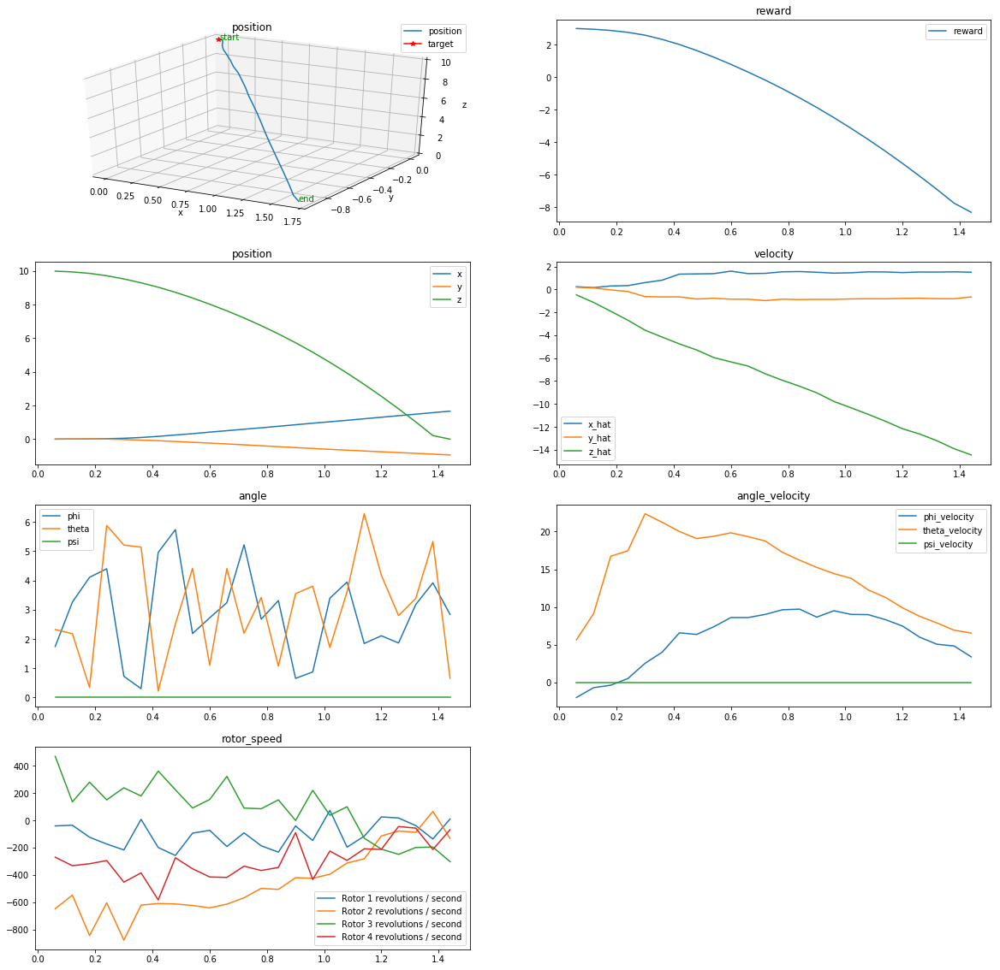

In [159]:
plot_result(results[1], target_pos)

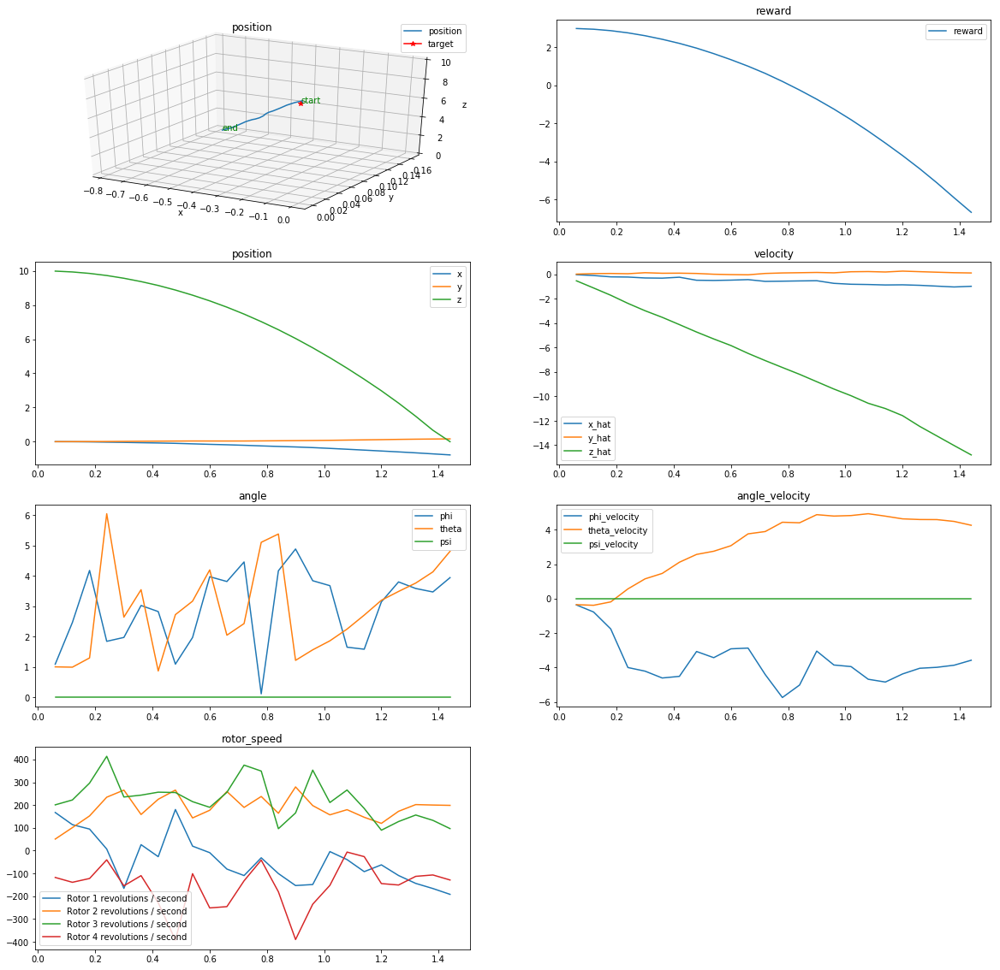

In [112]:
plot_result(results[num_episodes], target_pos)

## Define the Task, Design the Agent, and Train Your Agent!

Amend `task.py` to specify a task of your choosing.  If you're unsure what kind of task to specify, you may like to teach your quadcopter to takeoff, hover in place, land softly, or reach a target pose.  

After specifying your task, use the sample agent in `agents/policy_search_agent.py` as a template to define your own agent in `agents/agent.py`.  You can borrow whatever you need from the sample agent, including ideas on how you might modularize your code (using helper methods like `act()`, `learn()`, `reset_episode()`, etc.).

Note that it is **highly unlikely** that the first agent and task that you specify will learn well.  You will likely have to tweak various hyperparameters and the reward function for your task until you arrive at reasonably good behavior.

As you develop your agent, it's important to keep an eye on how it's performing. Use the code above as inspiration to build in a mechanism to log/save the total rewards obtained in each episode to file.  If the episode rewards are gradually increasing, this is an indication that your agent is learning.

### PolicySearchAgentV1, TaskTarget, PhysicsSimV1

In [200]:
## TODO: Train your agent here.
%load_ext autoreload
%autoreload

import sys
import pandas as pd

from agents.policy_search_agent_v1 import PolicySearchAgentV1
from task_target import TaskTarget

num_episodes = 1000
# num_episodes = 100

target_pos = np.array([0., 0., 50.])
# target_pos = np.array([10., 10., 20.])
# target_pos = np.array([10., 10., 0.])

task = TaskTarget(target_pos=target_pos)

agent = PolicySearchAgentV1(task) 


labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4',         
          'reward']
results = dict()

for i_episode in range(1, num_episodes+1):
#     print('episode start', i_episode)
    episode_result = {x : [] for x in labels}    
    
    state = agent.reset_episode() # start a new episode
    while True:
        action = agent.act(state) 
        next_state, reward, done = task.step(action)
#         print('next_state', len(next_state), next_state)
        agent.step(reward, done, i_episode)
        state = next_state
        
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(action) + [reward]        
        for ii in range(len(labels)):
            episode_result[labels[ii]].append(to_write[ii])
            
        if done:
            results[i_episode] = episode_result
            
            print("\rDone. Episode = {:4d}, score = {:7.3f}, noise_scale = {}, best_episode = {}, best_score = {}".format(
                i_episode, agent.score, agent.noise_scale, agent.best_episode, agent.best_score), end="")  # [debug]            
            break    
    
#     print('\nepisode end', i_episode)
    sys.stdout.flush()
    
print("\nDone. best_episode = {}, best_total_reward = {}, best_score = {}, best_w = {}".format(
    agent.best_episode, agent.best_total_reward, agent.best_score, agent.best_w))


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Done. Episode =    5, score = -36.768, noise_scale = 100.0, best_episode = 1, best_score = -36.12051343871941

/Users/rui/0_my_staff/0_projects/udacity_deep_learning_foundation_nanodegress_program/part_6_deep_reinforcement_learning/lesson_12_teaching_a_quadcopter_how_to_fly/RL-Quadcopter-2/physics_sim_v1.py:122: RuntimeWarning: invalid value encountered in double_scalars
  J = V / n * D
/Users/rui/0_my_staff/0_projects/udacity_deep_learning_foundation_nanodegress_program/part_6_deep_reinforcement_learning/lesson_12_teaching_a_quadcopter_how_to_fly/RL-Quadcopter-2/physics_sim_v1.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  J = V / n * D


Done. Episode = 1000, score = -37.534, noise_scale = 100.0, best_episode = 17, best_score = -15.973408237096898
Done. best_episode = 17, best_total_reward = -1341.7662919161394, best_score = -15.973408237096898, best_w = [[  16.55068286  -67.22490956    4.91900282  -92.03227701]
 [ 112.48383765   37.79183605   24.26313616   -2.30742629]
 [  60.65859131   -1.44024314   89.27509316  198.75466277]
 [  19.54109249  124.07374706   11.15765494  -43.49404339]
 [ 180.78088622   18.94170457  -51.29521167 -130.59435738]
 [ -30.02151256  -50.22151176   -5.76963337  -52.50786172]
 [ -34.41401686   54.94585356    6.09100684  219.39572589]
 [-272.696352     82.81186889   -6.27464934   89.33754445]
 [ -13.38040206   70.05246754   92.6712937   -37.95913211]
 [ -41.78510036 -109.73776357 -162.53033966   -7.41291421]
 [  16.62419582   13.29920149  -82.50388326   22.51943204]
 [  15.40087294 -112.19609698  -37.62505702   12.7348343 ]
 [ 123.05125484   -8.84744199  -17.78063825   38.15789636]
 [ -99.09840

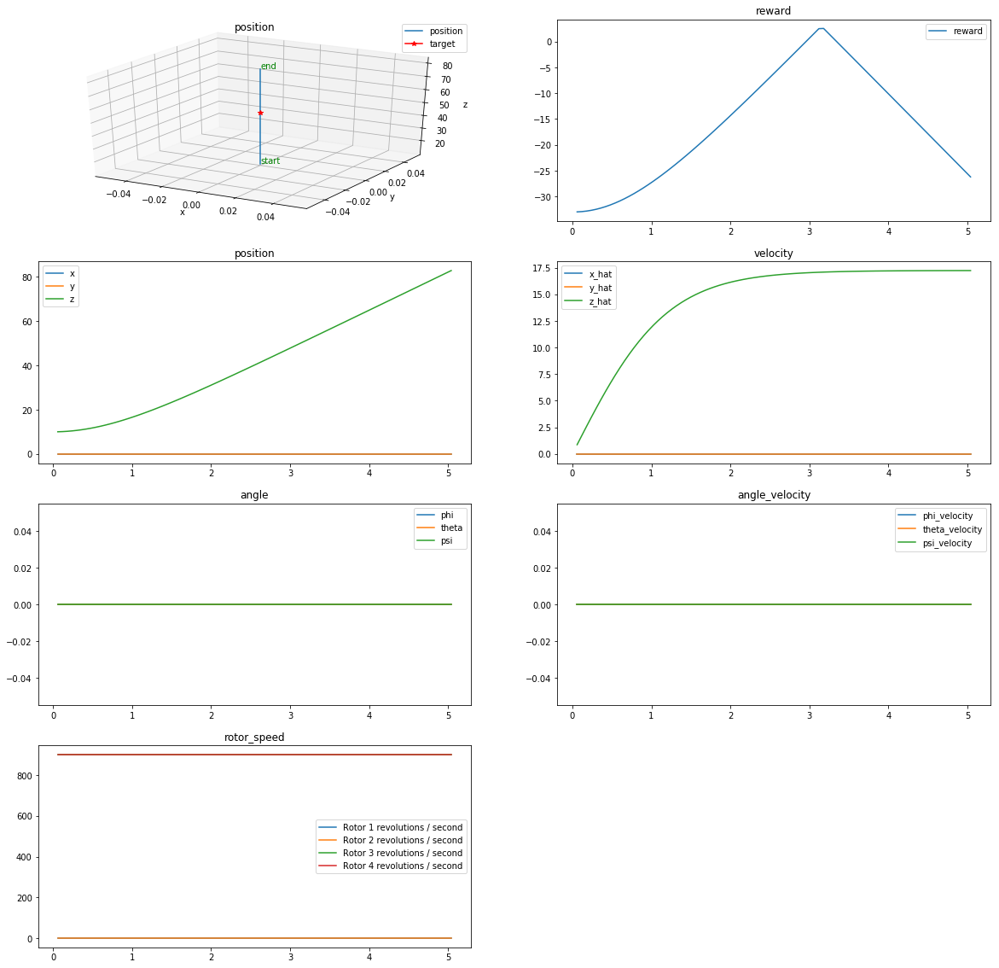

In [201]:
plot_result(results[agent.best_episode], target_pos)

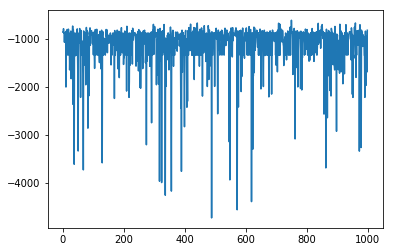

In [202]:
episode_total_rewards = [np.sum(results[i]['reward']) for i in range(1, num_episodes + 1)]
plt.plot(episode_total_rewards)
plt.show()

### DDPGAgent, TaskTarget, PhysicsSimV1

better with basic implementation

self.tau = 0.1


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Done. Episode =  100, total_reward = 247.23061849018492, count = 84, score =   2.943, best_episode = 51, best_total_reward= 247.23654228686877, best_count = 84, best_score = 2.9432921700817713

Final_distance 22.68638478386324


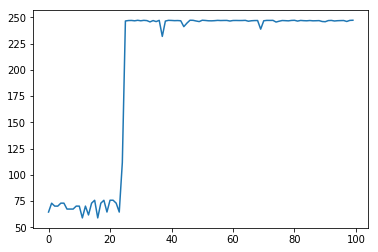

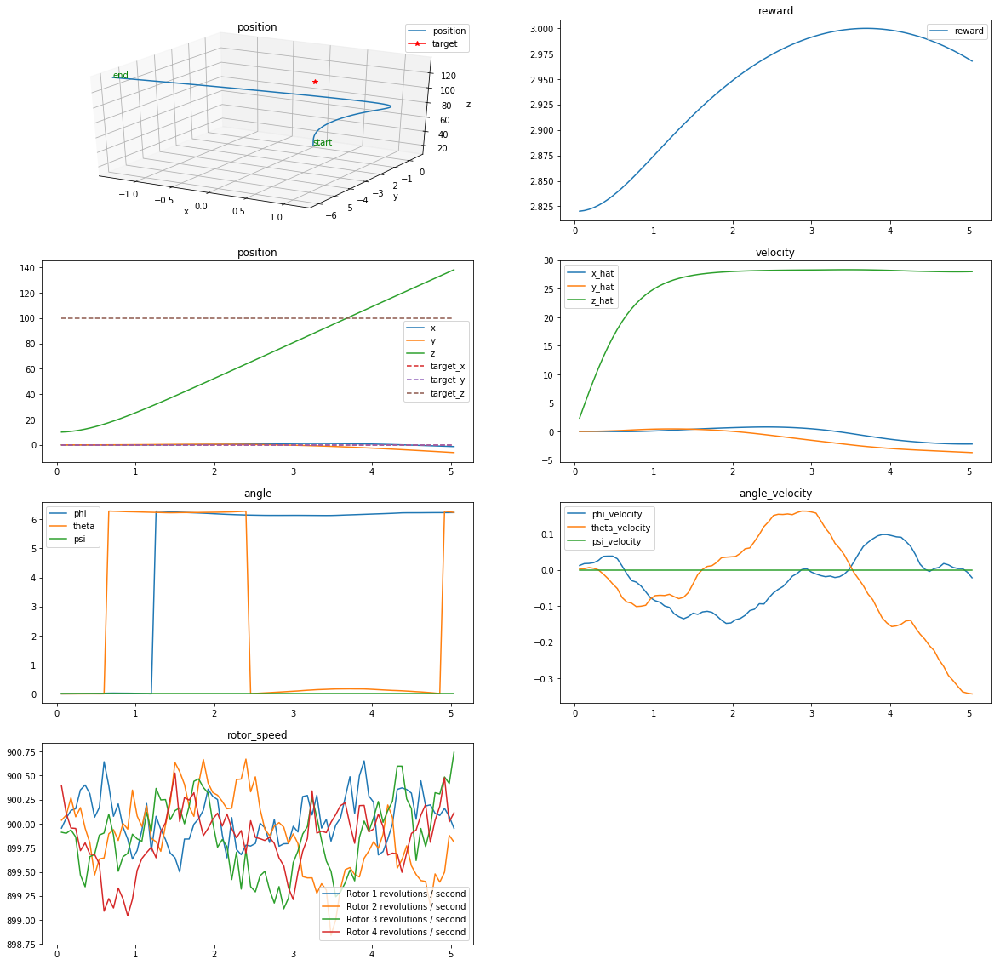

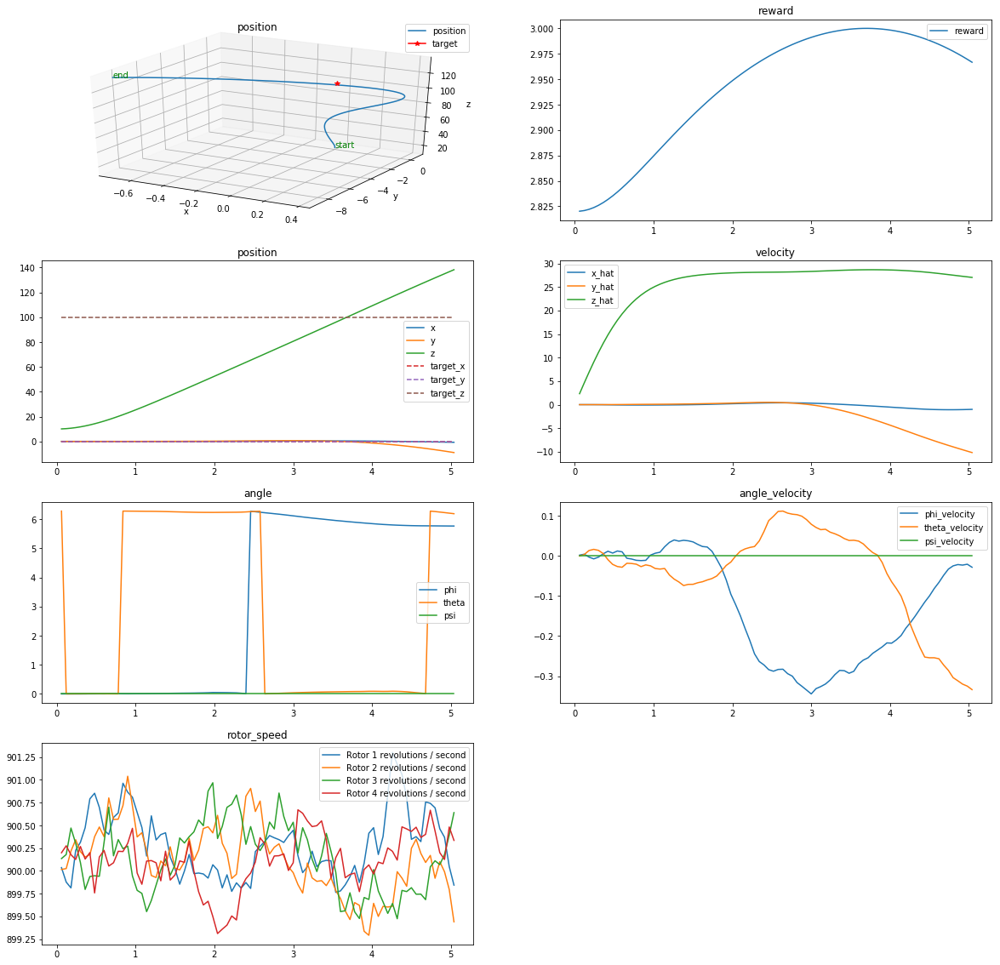

In [259]:
## TODO: Train your agent here.
%load_ext autoreload
%autoreload

import sys
import pandas as pd

from target_task_v1 import TargetTaskV1
from agents.ddpg_agent.ddpg_agent import DDPGAgent


# # Modify the values below to give the quadcopter a different starting position.
# init_pose = np.array([0., 0., 10, 0., 0., 0.])  # initial pose
# init_velocities = np.array([0., 0., 0.])         # initial velocities
# init_angle_velocities = np.array([0., 0., 0.])   # initial angle velocities
# runtime = 5.                                     # time limit of the episode

# target_pos = np.array([0., 0., 150])

# task = TaskTarget(
#     init_pose=init_pose, init_velocities=init_velocities, init_angle_velocities=init_angle_velocities, 
#     runtime=runtime, target_pos=target_pos
# )


target_pos = np.array([0., 0., 100])
# target_pos = np.array([100., 100., 100])

task = TargetTaskV1(target_pos=target_pos)


agent = DDPGAgent(task)


# num_episodes = 1000
# num_episodes = 500
num_episodes = 100



labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4',         
          'reward']
results = dict()

for i_episode in range(1, num_episodes+1):
#     print('episode start', i_episode)
    episode_result = {x : [] for x in labels}    
    
    state = agent.reset_episode() # start a new episode
    while True:
        action = agent.act(state) 
        next_state, reward, done = task.step(action)
#         print('next_state', len(next_state), next_state)
        agent.step(action, reward, next_state, done, i_episode)
    
        state = next_state
        
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(action) + [reward]        
        for ii in range(len(labels)):
            episode_result[labels[ii]].append(to_write[ii])
            
        if done:
            results[i_episode] = episode_result            
            print("\rDone. Episode = {:4d}, total_reward = {}, count = {}, score = {:7.3f}, best_episode = {}, best_total_reward= {}, best_count = {}, best_score = {}".format(
                i_episode, agent.total_reward, agent.count, agent.score, agent.best_episode, agent.best_total_reward, agent.best_count, agent.best_score), end="")  # [debug]                        
            break    
    
#     print('\nepisode end', i_episode)
    sys.stdout.flush()
       
        
final_distance = np.sqrt(np.mean(np.square(task.sim.pose[:3] - target_pos)))
print('\n\nFinal_distance', final_distance)

episode_total_rewards = [np.sum(results[i]['reward']) for i in range(1, num_episodes + 1)]
plt.plot(episode_total_rewards)
plt.show()

plot_result(results[agent.best_episode], target_pos)   

plot_result(results[num_episodes], target_pos)        

## Plot the Rewards

Once you are satisfied with your performance, plot the episode rewards, either from a single run, or averaged over multiple runs. 

22.68638478386324


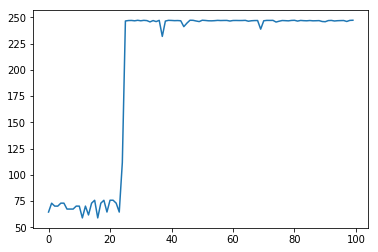

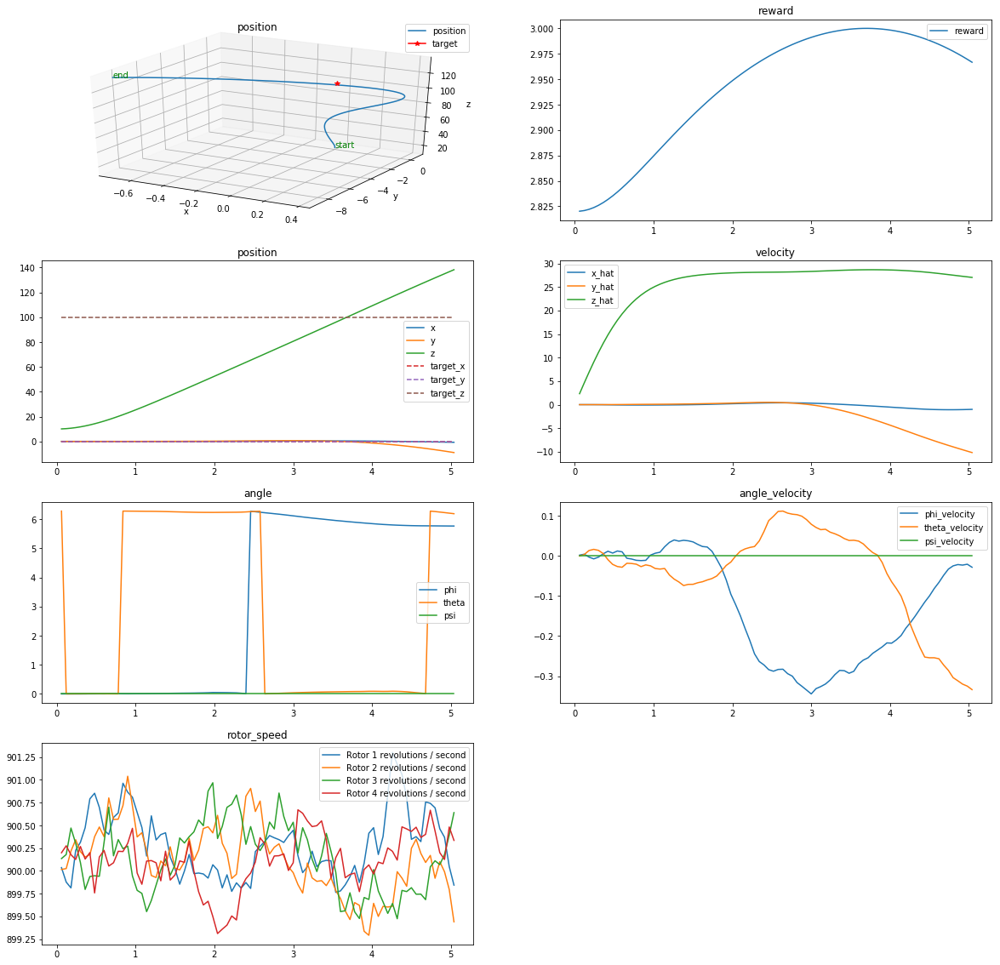

In [260]:
final_distance = np.sqrt(np.mean(np.square(task.sim.pose[:3] - target_pos)))
print(final_distance)

episode_total_rewards = [np.sum(results[i]['reward']) for i in range(1, num_episodes + 1)]
plt.plot(episode_total_rewards)
plt.show()

plot_result(results[num_episodes], target_pos)        


### DDPGAgent, TaskTarget, PhysicsSimV1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Done. Episode =  100, total_reward = 208.84694806766908, count = 84, score =   2.486, best_episode = 34, best_total_reward= 215.74180805874454, best_count = 84, best_score = 2.5683548578421976

Final_distance 91.01032578589107


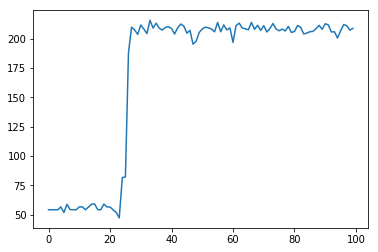

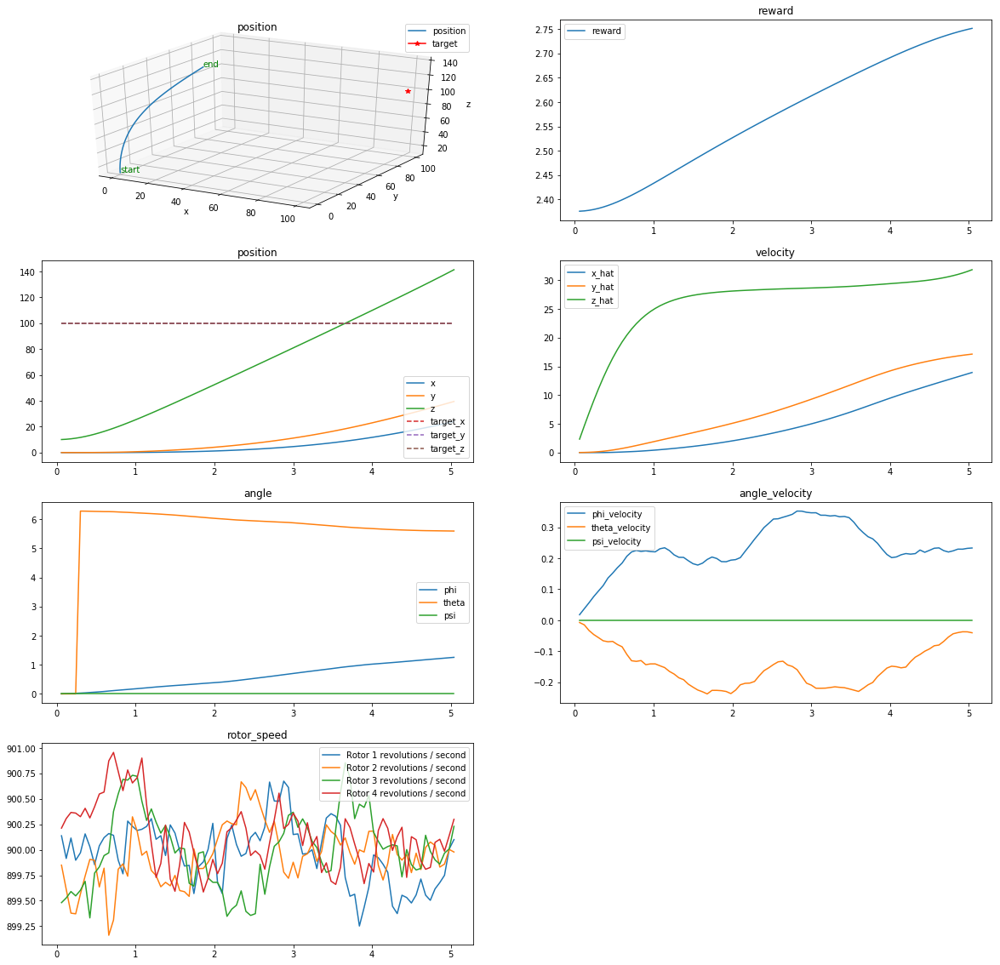

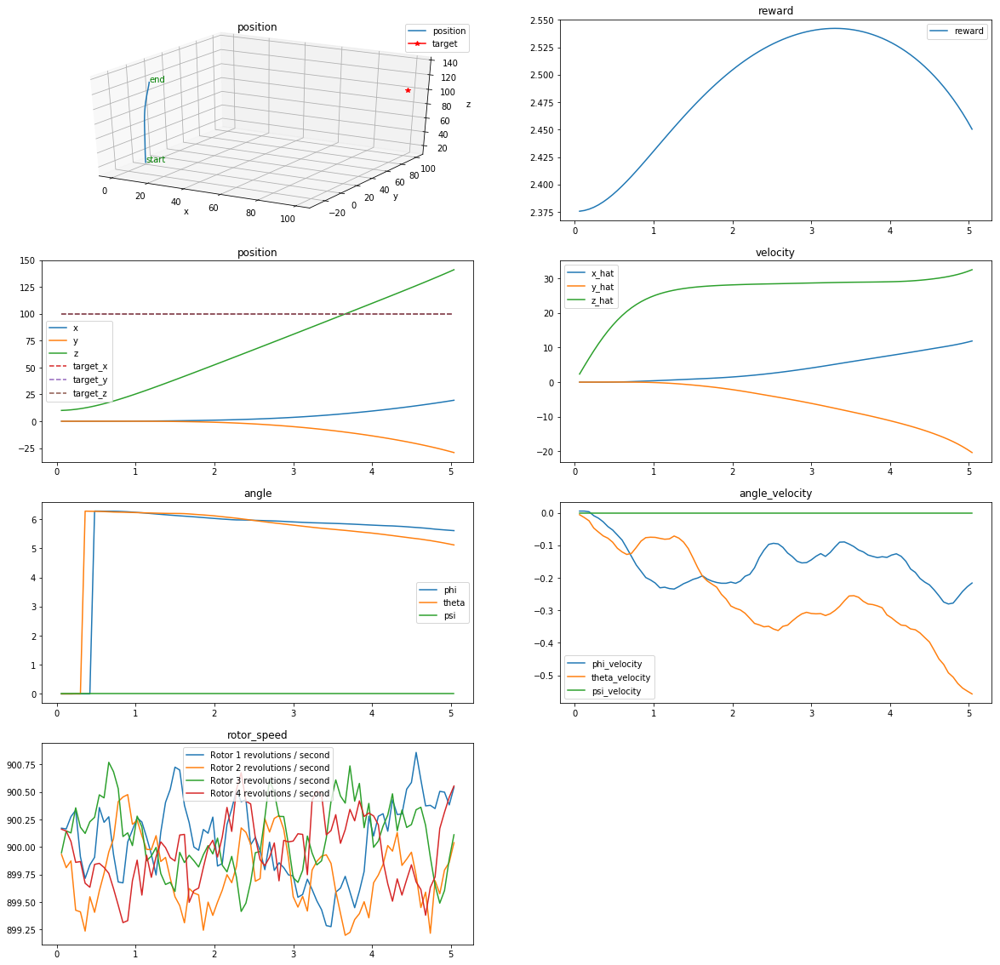

In [264]:
## TODO: Train your agent here.
%load_ext autoreload
%autoreload

import sys
import pandas as pd

from target_task_v1 import TargetTaskV1
from agents.ddpg_agent.ddpg_agent import DDPGAgent


# # Modify the values below to give the quadcopter a different starting position.
# init_pose = np.array([0., 0., 10, 0., 0., 0.])  # initial pose
# init_velocities = np.array([0., 0., 0.])         # initial velocities
# init_angle_velocities = np.array([0., 0., 0.])   # initial angle velocities
# runtime = 5.                                     # time limit of the episode

# target_pos = np.array([0., 0., 150])

# task = TaskTarget(
#     init_pose=init_pose, init_velocities=init_velocities, init_angle_velocities=init_angle_velocities, 
#     runtime=runtime, target_pos=target_pos
# )


# target_pos = np.array([0., 0., 100])
target_pos = np.array([100., 100., 100])

task = TargetTaskV1(target_pos=target_pos)


agent = DDPGAgent(task)


num_episodes = 100
# num_episodes = 500
# num_episodes = 100



labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4',         
          'reward']
results = dict()

for i_episode in range(1, num_episodes+1):
#     print('episode start', i_episode)
    episode_result = {x : [] for x in labels}    
    
    state = agent.reset_episode() # start a new episode
    while True:
        action = agent.act(state) 
        next_state, reward, done = task.step(action)
#         print('next_state', len(next_state), next_state)
        agent.step(action, reward, next_state, done, i_episode)
    
        state = next_state
        
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(action) + [reward]        
        for ii in range(len(labels)):
            episode_result[labels[ii]].append(to_write[ii])
            
        if done:
            results[i_episode] = episode_result            
            print("\rDone. Episode = {:4d}, total_reward = {}, count = {}, score = {:7.3f}, best_episode = {}, best_total_reward= {}, best_count = {}, best_score = {}".format(
                i_episode, agent.total_reward, agent.count, agent.score, agent.best_episode, agent.best_total_reward, agent.best_count, agent.best_score), end="")  # [debug]                        
            break    
    
#     print('\nepisode end', i_episode)
    sys.stdout.flush()
       
        
final_distance = np.sqrt(np.mean(np.square(task.sim.pose[:3] - target_pos)))
print('\n\nFinal_distance', final_distance)

episode_total_rewards = [np.sum(results[i]['reward']) for i in range(1, num_episodes + 1)]
plt.plot(episode_total_rewards)
plt.show()

plot_result(results[agent.best_episode], target_pos)   

plot_result(results[num_episodes], target_pos)        

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Done. Episode =  100, total_reward = 61.6270063970892, count = 26, score =   2.370, best_episode = 44, best_total_reward= 207.7384344843869, best_count = 84, best_score = 2.4730766010046066636

Final_distance 98.6117658617113


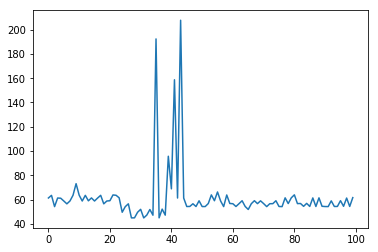

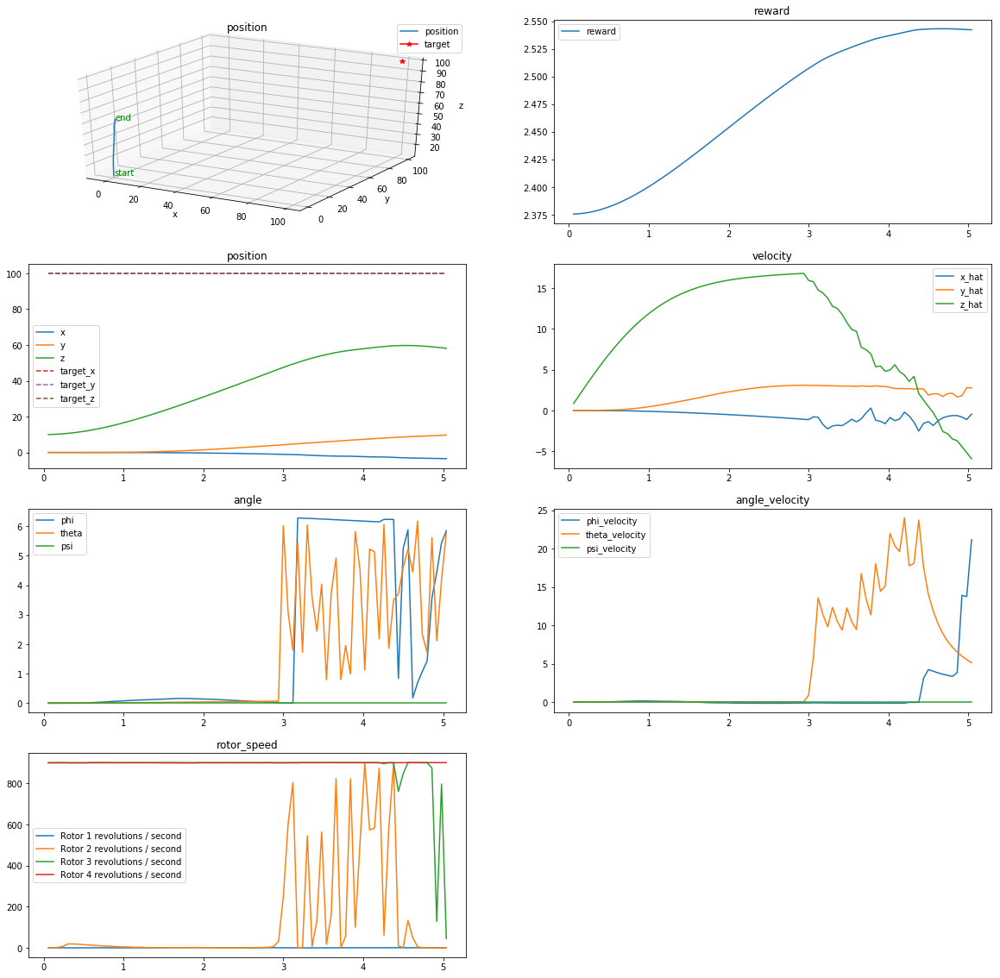

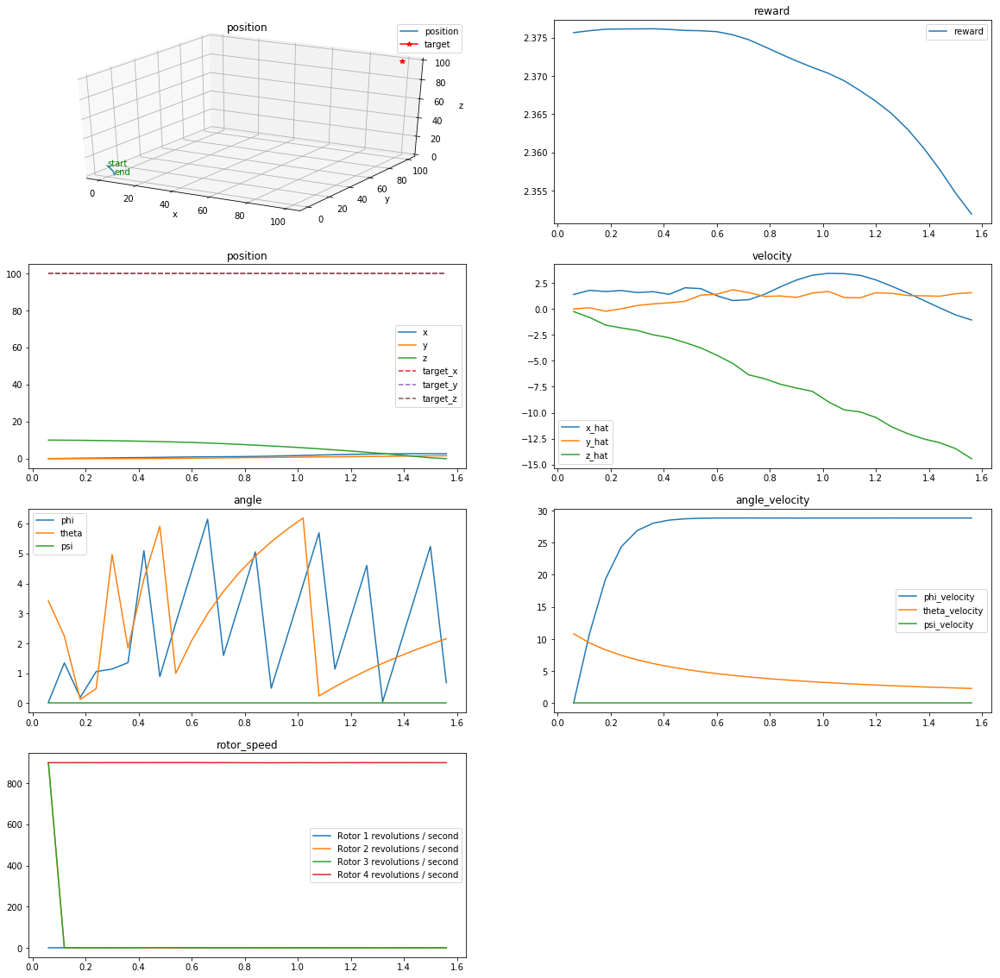

In [263]:
## TODO: Train your agent here.
%load_ext autoreload
%autoreload

import sys
import pandas as pd

from target_task_v1 import TargetTaskV1
from agents.ddpg_agent.ddpg_agent import DDPGAgent


# # Modify the values below to give the quadcopter a different starting position.
# init_pose = np.array([0., 0., 10, 0., 0., 0.])  # initial pose
# init_velocities = np.array([0., 0., 0.])         # initial velocities
# init_angle_velocities = np.array([0., 0., 0.])   # initial angle velocities
# runtime = 5.                                     # time limit of the episode

# target_pos = np.array([0., 0., 150])

# task = TaskTarget(
#     init_pose=init_pose, init_velocities=init_velocities, init_angle_velocities=init_angle_velocities, 
#     runtime=runtime, target_pos=target_pos
# )


# target_pos = np.array([0., 0., 100])
target_pos = np.array([100., 100., 100])

task = TargetTaskV1(target_pos=target_pos)


agent = DDPGAgent(task)


num_episodes = 100
# num_episodes = 500
# num_episodes = 100



labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4',         
          'reward']
results = dict()

for i_episode in range(1, num_episodes+1):
#     print('episode start', i_episode)
    episode_result = {x : [] for x in labels}    
    
    state = agent.reset_episode() # start a new episode
    while True:
        action = agent.act(state) 
        next_state, reward, done = task.step(action)
#         print('next_state', len(next_state), next_state)
        agent.step(action, reward, next_state, done, i_episode)
    
        state = next_state
        
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(action) + [reward]        
        for ii in range(len(labels)):
            episode_result[labels[ii]].append(to_write[ii])
            
        if done:
            results[i_episode] = episode_result            
            print("\rDone. Episode = {:4d}, total_reward = {}, count = {}, score = {:7.3f}, best_episode = {}, best_total_reward= {}, best_count = {}, best_score = {}".format(
                i_episode, agent.total_reward, agent.count, agent.score, agent.best_episode, agent.best_total_reward, agent.best_count, agent.best_score), end="")  # [debug]                        
            break    
    
#     print('\nepisode end', i_episode)
    sys.stdout.flush()
       
        
final_distance = np.sqrt(np.mean(np.square(task.sim.pose[:3] - target_pos)))
print('\n\nFinal_distance', final_distance)

episode_total_rewards = [np.sum(results[i]['reward']) for i in range(1, num_episodes + 1)]
plt.plot(episode_total_rewards)
plt.show()

plot_result(results[agent.best_episode], target_pos)   

plot_result(results[num_episodes], target_pos)        

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Done. Episode =  100, total_reward = 209.07724059296447, count = 84, score =   2.489, best_episode = 65, best_total_reward= 214.63543971724368, best_count = 84, best_score = 2.5551838061576635

Final_distance 92.3967682115222


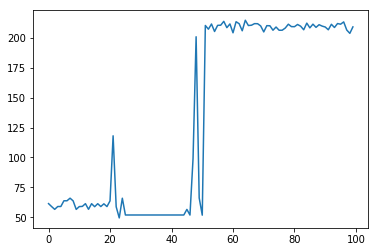

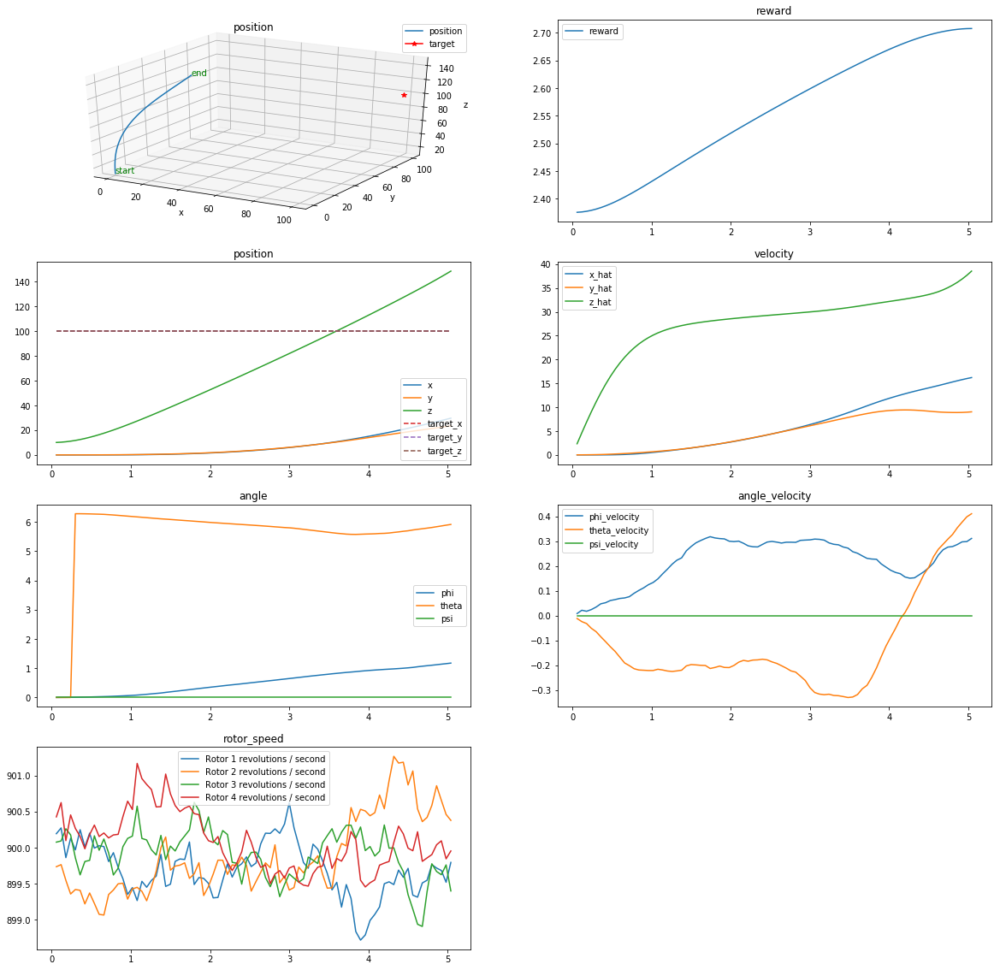

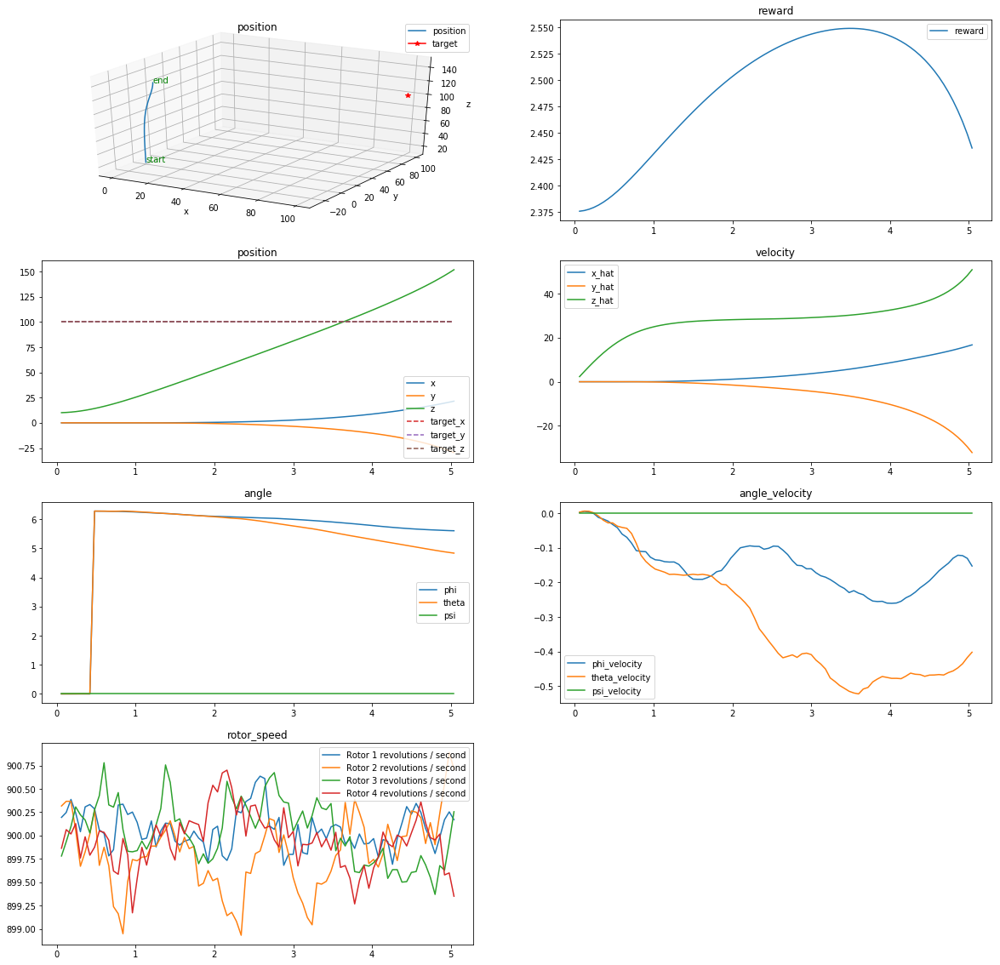

In [261]:
## TODO: Train your agent here.
%load_ext autoreload
%autoreload

import sys
import pandas as pd

from target_task_v1 import TargetTaskV1
from agents.ddpg_agent.ddpg_agent import DDPGAgent


# # Modify the values below to give the quadcopter a different starting position.
# init_pose = np.array([0., 0., 10, 0., 0., 0.])  # initial pose
# init_velocities = np.array([0., 0., 0.])         # initial velocities
# init_angle_velocities = np.array([0., 0., 0.])   # initial angle velocities
# runtime = 5.                                     # time limit of the episode

# target_pos = np.array([0., 0., 150])

# task = TaskTarget(
#     init_pose=init_pose, init_velocities=init_velocities, init_angle_velocities=init_angle_velocities, 
#     runtime=runtime, target_pos=target_pos
# )


# target_pos = np.array([0., 0., 100])
target_pos = np.array([100., 100., 100])

task = TargetTaskV1(target_pos=target_pos)


agent = DDPGAgent(task)


num_episodes = 100
# num_episodes = 500
# num_episodes = 100



labels = ['time', 'x', 'y', 'z', 'phi', 'theta', 'psi', 'x_velocity',
          'y_velocity', 'z_velocity', 'phi_velocity', 'theta_velocity',
          'psi_velocity', 'rotor_speed1', 'rotor_speed2', 'rotor_speed3', 'rotor_speed4',         
          'reward']
results = dict()

for i_episode in range(1, num_episodes+1):
#     print('episode start', i_episode)
    episode_result = {x : [] for x in labels}    
    
    state = agent.reset_episode() # start a new episode
    while True:
        action = agent.act(state) 
        next_state, reward, done = task.step(action)
#         print('next_state', len(next_state), next_state)
        agent.step(action, reward, next_state, done, i_episode)
    
        state = next_state
        
        to_write = [task.sim.time] + list(task.sim.pose) + list(task.sim.v) + list(task.sim.angular_v) + list(action) + [reward]        
        for ii in range(len(labels)):
            episode_result[labels[ii]].append(to_write[ii])
            
        if done:
            results[i_episode] = episode_result            
            print("\rDone. Episode = {:4d}, total_reward = {}, count = {}, score = {:7.3f}, best_episode = {}, best_total_reward= {}, best_count = {}, best_score = {}".format(
                i_episode, agent.total_reward, agent.count, agent.score, agent.best_episode, agent.best_total_reward, agent.best_count, agent.best_score), end="")  # [debug]                        
            break    
    
#     print('\nepisode end', i_episode)
    sys.stdout.flush()
       
        
final_distance = np.sqrt(np.mean(np.square(task.sim.pose[:3] - target_pos)))
print('\n\nFinal_distance', final_distance)

episode_total_rewards = [np.sum(results[i]['reward']) for i in range(1, num_episodes + 1)]
plt.plot(episode_total_rewards)
plt.show()

plot_result(results[agent.best_episode], target_pos)   

plot_result(results[num_episodes], target_pos)        

## Reflections

**Question 1**: Describe the task that you specified in `task.py`.  How did you design the reward function?

**Answer**:

**Question 2**: Discuss your agent briefly, using the following questions as a guide:

- What learning algorithm(s) did you try? What worked best for you?
- What was your final choice of hyperparameters (such as $\alpha$, $\gamma$, $\epsilon$, etc.)?
- What neural network architecture did you use (if any)? Specify layers, sizes, activation functions, etc.

**Answer**:

**Question 3**: Using the episode rewards plot, discuss how the agent learned over time.

- Was it an easy task to learn or hard?
- Was there a gradual learning curve, or an aha moment?
- How good was the final performance of the agent? (e.g. mean rewards over the last 10 episodes)

**Answer**:

**Question 4**: Briefly summarize your experience working on this project. You can use the following prompts for ideas.

- What was the hardest part of the project? (e.g. getting started, plotting, specifying the task, etc.)
- Did you find anything interesting in how the quadcopter or your agent behaved?

**Answer**: